# Experimenting with asymmetrical pooling. 

In previous CNNs, we used symmetrical pooling layers for dimensionality reduction. Here, only pool in the temporal direction to preserve all MFCCs.

# Imports

In [1]:
! pip install torch-summary

In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader, random_split
import pandas as pd
import json
from torchsummary import summary
import time
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import precision_recall_fscore_support
import librosa.display
import math
import os
from textwrap import dedent

IRMAS_PATH = "/content/drive/MyDrive/ITCS 5156 project/IRMAS dataset/IRMAS-TrainingData/"
JSON_PATH = "/content/drive/MyDrive/ITCS 5156 project/IRMAS dataset/json_files/"
filename = "irmas_data_mfcc13_hop_length256_n_fft2048.json"

from google.colab import drive
drive.mount("/content/drive", force_remount=True)

Mounted at /content/drive


# Dataset / preprocessing

In [3]:
class IRMASDataset(Dataset):
  def __init__(self, JSON_PATH, filename, transform=None):
    with open(JSON_PATH + filename, "r") as f:
      self.irmas_data = json.load(f)
    self.metadata = self.irmas_data.pop('metadata') 
    self.instruments = ["cel", "cla", "flu", "gac", "gel", "org", "pia", "sax",
    "tru", "vio", "voi"]
    self.encoder = LabelEncoder()
    self.encoder.fit(self.instruments)

  def __len__(self):
    return len(self.irmas_data)

  def __getitem__(self, idx):
    if torch.is_tensor(idx):
      idx = np.array(idx.tolist())

    mfccs = np.array(self.irmas_data[str(idx)]['mfccs'])[np.newaxis,...]

    primary_instrument = self.encoder.transform(
      [np.array(self.irmas_data[str(idx)]['primary_instrument'])]
    )
    sample = {'mfccs': mfccs, 'instrument': primary_instrument, 'metadata': self.metadata}
    return sample

def prep_dataset(filename, val_split=0.2, batch_size=1):

  dataset = IRMASDataset(JSON_PATH=JSON_PATH, filename=filename)
  train_set, val_set = random_split(dataset, [round(len(dataset) * (1-val_split)), round(len(dataset)*val_split)])

  train_loader = DataLoader(train_set, batch_size=batch_size, shuffle=True, num_workers=1)
  val_loader = DataLoader(val_set, batch_size=batch_size, shuffle=True, num_workers=1)

  return train_loader, val_loader, dataset

# Architectures

In [4]:
class ConvBlock(nn.Module):
  """Convolutional block with conv2d, linear activation, max pooling, and batch norm
  """
  def __init__(self, in_channels, out_channels, conv_kernel_size=3,
               conv_stride=1, conv_padding=0,
               inc_pool=True, pool_kernel_size=2, pool_stride=2):
    super(ConvBlock, self).__init__()
    if inc_pool:
      self.conv_block = nn.Sequential(
          nn.Conv2d(in_channels=in_channels, out_channels=out_channels,
                    kernel_size=conv_kernel_size, stride=conv_stride,
                    padding=conv_padding),
          nn.ReLU(),
          nn.MaxPool2d(kernel_size=pool_kernel_size, stride=pool_stride),
          nn.BatchNorm2d(num_features=out_channels)
      ) 
    else:
      self.conv_block = nn.Sequential(
          nn.Conv2d(in_channels=in_channels, out_channels=out_channels,
                    kernel_size=conv_kernel_size, stride=conv_stride,
                    padding=conv_padding),
          nn.ReLU(),
          nn.BatchNorm2d(num_features=out_channels)
      ) 

  def forward(self, x):
    x = self.conv_block(x)
    return x

class LinearBlock(nn.Module):
  """Linear block with dense layer, relu, batch norm, then dropout
  """

  def __init__(self, in_features, out_features, dropout_prob=0):
    super(LinearBlock, self).__init__()
    self.linear_block = nn.Sequential(
        nn.Linear(in_features=in_features, out_features=out_features),
        nn.ReLU(),
        nn.BatchNorm1d(num_features=out_features),
        nn.Dropout(p=dropout_prob)
    )

  def forward(self, x):
    x = self.linear_block(x)
    return x

class HeadBlock(nn.Module):
  """Linear block with softmax output"""
  def __init__(self, in_features):
    super(HeadBlock, self).__init__()
    self.head_block = nn.Sequential(
        nn.Linear(in_features=in_features, out_features=11),
        #nn.Softmax()
    )

  def forward(self, x):
    x = self.head_block(x)
    return x

class Conv1Layer(nn.Module):

  def __init__(self, single_sample, channels=[8],
               conv_kernel_sizes=[3],
               conv_strides=[1],
               conv_paddings=[0],
               pool_masks=[True],
               pool_kernel_sizes=[2],
               pool_strides=[2],
               linear_features=[128, 64],
               dropout_probs=[0, 0]):

    super(Conv1Layer, self).__init__()

    # convolutional blocks
    self.conv1 = ConvBlock(in_channels=1, out_channels=channels[0],
                           conv_kernel_size=conv_kernel_sizes[0],
                           conv_stride=conv_strides[0],
                           conv_padding=conv_paddings[0],
                           inc_pool=pool_masks[0],
                           pool_kernel_size=pool_kernel_sizes[0],
                           pool_stride=pool_strides[0])
  
    # run a single sample through the convolutional block to get output size
    # https://discuss.pytorch.org/t/convolution-and-pooling-layers-need-a-method-to-calculate-output-size/21895
    sample_output1 = self.conv1(torch.from_numpy(
        single_sample[np.newaxis,...].astype(np.float32)))
  
    sample_flattened = sample_output1.flatten(start_dim=1)
 
    # linear blocks
    self.linear1 = LinearBlock(in_features=(sample_flattened.shape[1]),
                                            out_features=(linear_features[0]),
                                            dropout_prob=dropout_probs[0])
    self.linear2 = LinearBlock(in_features=(linear_features[0]),
                                            out_features=(linear_features[1]),
                                            dropout_prob=dropout_probs[1])
    self.head = HeadBlock(in_features=(linear_features[1]))

  def forward(self, x):
    x = self.conv1(x)
    x = x.flatten(start_dim=1)
    x = self.linear1(x)
    x = self.linear2(x)
    x = self.head(x)
    return x

class Conv3Layer(nn.Module):
  def __init__(self, single_sample, channels=[8, 16, 32],
               conv_kernel_sizes=[3, 3, 3],
               conv_strides=[1, 1, 1],
               conv_paddings=[0, 0, 1,],
               pool_masks=[True, False, False],
               pool_kernel_sizes=[2, 2, 2],
               pool_strides=[2, 2, 2],
               linear_features=[128, 64],
               dropout_probs=[0, 0]):
    super(Conv3Layer, self).__init__()

    self.conv1 = ConvBlock(in_channels=1, out_channels=channels[0],
                           conv_kernel_size=conv_kernel_sizes[0],
                           conv_stride=conv_strides[0],
                           conv_padding=conv_paddings[0],
                           inc_pool=pool_masks[0],
                           pool_kernel_size=pool_kernel_sizes[0],
                           pool_stride=pool_strides[0])
    
    self.conv2 = ConvBlock(in_channels=channels[0], out_channels=channels[1],
                           conv_kernel_size=conv_kernel_sizes[1],
                           conv_stride=conv_strides[1],
                           conv_padding=conv_paddings[1],
                           inc_pool=pool_masks[1],
                           pool_kernel_size=pool_kernel_sizes[1],
                           pool_stride=pool_strides[1])

    self.conv3 = ConvBlock(in_channels=channels[1], out_channels=channels[2],
                           conv_kernel_size=conv_kernel_sizes[2],
                           conv_stride=conv_strides[2],
                           conv_padding=conv_paddings[2],
                           inc_pool=pool_masks[2],
                           pool_kernel_size=pool_kernel_sizes[2],
                           pool_stride=pool_strides[2])
    
    # calculate size for linear layers
    sample_output1 = self.conv1(torch.from_numpy(
        single_sample[np.newaxis,...].astype(np.float32)))
    sample_output2 = self.conv2(sample_output1)
    sample_output3 = self.conv3(sample_output2)
    sample_flattened = sample_output3.flatten(start_dim=1)

    # linear blocks
    self.linear1 = LinearBlock(in_features=(sample_flattened.shape[1]),
                                            out_features=(linear_features[0]),
                                            dropout_prob=dropout_probs[0])
    self.linear2 = LinearBlock(in_features=(linear_features[0]),
                                            out_features=(linear_features[1]),
                                            dropout_prob=dropout_probs[1])
    self.head = HeadBlock(in_features=(linear_features[1]))
  
  def forward(self, x):
    x = self.conv1(x)
    x = self.conv2(x)
    x = self.conv3(x)
    x = x.flatten(start_dim=1)
    x = self.linear1(x)
    x = self.linear2(x)
    x = self.head(x)
    return x

class Conv5Layer(nn.Module):
  def __init__(self, single_sample, channels= [8, 8, 32, 32, 64],
               conv_kernel_sizes=[3, 3, 3, 3, 3],
               conv_strides=[1, 1, 1, 1, 1],
               conv_paddings=[0, 0, 1, 1, 1],
               pool_masks=[True, False, False, False, False],
               pool_kernel_sizes=[2, 2, 2, 2, 2],
               pool_strides=[2, 2, 2, 2, 2],
               linear_features=[128, 64],
               dropout_probs=[0, 0]):
    super(Conv5Layer, self).__init__()

    # convolutional layers
    self.conv1 = ConvBlock(in_channels=1, out_channels=channels[0],
                           conv_kernel_size=conv_kernel_sizes[0],
                           conv_stride=conv_strides[0],
                           conv_padding=conv_paddings[0],
                           inc_pool=pool_masks[0],
                           pool_kernel_size=pool_kernel_sizes[0],
                           pool_stride=pool_strides[0])
    
    self.conv2 = ConvBlock(in_channels=channels[0], out_channels=channels[1],
                           conv_kernel_size=conv_kernel_sizes[1],
                           conv_stride=conv_strides[1],
                           conv_padding=conv_paddings[1],
                           inc_pool=pool_masks[1],
                           pool_kernel_size=pool_kernel_sizes[1],
                           pool_stride=pool_strides[1])

    self.conv3 = ConvBlock(in_channels=channels[1], out_channels=channels[2],
                           conv_kernel_size=conv_kernel_sizes[2],
                           conv_stride=conv_strides[2],
                           conv_padding=conv_paddings[2],
                           inc_pool=pool_masks[2],
                           pool_kernel_size=pool_kernel_sizes[2],
                           pool_stride=pool_strides[2])
    
    self.conv4 = ConvBlock(in_channels=channels[2], out_channels=channels[3],
                           conv_kernel_size=conv_kernel_sizes[3],
                           conv_stride=conv_strides[3],
                           conv_padding=conv_paddings[3],
                           inc_pool=pool_masks[3],
                           pool_kernel_size=pool_kernel_sizes[3],
                           pool_stride=pool_strides[3])
    
    self.conv5 = ConvBlock(in_channels=channels[3], out_channels=channels[4],
                           conv_kernel_size=conv_kernel_sizes[4],
                           conv_stride=conv_strides[4],
                           conv_padding=conv_paddings[4],
                           inc_pool=pool_masks[4],
                           pool_kernel_size=pool_kernel_sizes[4],
                           pool_stride=pool_strides[4])
    
    # calculate size for linear layers
    sample_output1 = self.conv1(torch.from_numpy(
        single_sample[np.newaxis,...].astype(np.float32)))
    sample_output2 = self.conv2(sample_output1)
    sample_output3 = self.conv3(sample_output2)
    sample_output4 = self.conv4(sample_output3)
    sample_output5 = self.conv5(sample_output4)
    sample_flattened = sample_output5.flatten(start_dim=1)


    # linear blocks
    self.linear1 = LinearBlock(in_features=(sample_flattened.shape[1]),
                                            out_features=(linear_features[0]),
                                            dropout_prob=dropout_probs[0])
    self.linear2 = LinearBlock(in_features=(linear_features[0]),
                                            out_features=(linear_features[1]),
                                            dropout_prob=dropout_probs[1])
    self.head = HeadBlock(in_features=(linear_features[1]))
  
  def forward(self, x):
    x = self.conv1(x)
    x = self.conv2(x)
    x = self.conv3(x)
    x = self.conv4(x)
    x = self.conv5(x)
    x = x.flatten(start_dim=1)
    x = self.linear1(x)
    x = self.linear2(x)
    x = self.head(x)
    return x

# Train loop

In [5]:
def train_model(filename="irmas_data_mfcc13_hop_length256_n_fft2048", model_id="TestModel",
                num_epochs=2, interval=16, lr=0.001, batch_size=64,
                val_split=0.2, save_checkpoint=False, checkpoint_path="",
                notes="", checkpoint_name="utitled.pt", criterion=torch.nn.NLLLoss(),
                patience=None, min_epochs=5, buffer=0.05, dropout_prob=None,
                model_args={}, experiment_params={}):
  """Model training loop for music analysis project. Currently, this loop only supports
  models that take input in the shape [mini_batch, channels, L, W].

  :param filename:
  :param model_id:
  :param num_epochs:
  :param interval:
  :param lr:
  :param batch_size:
  :param val_split:
  :param save_checkpoint:
  :param checkpoint_path:
  :param notes:
  :param checkpoint name:
  :param criterion:
  :param patience: If validation loss does not improve over this many epochs, stop training
  """

  # Initialize device
  device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
  print("device: ", device)
  
  # get train and validation set, print metadata
  train_loader, val_loader, dataset = prep_dataset(
      filename=filename, batch_size=batch_size, val_split=val_split)

  print("dataset metadata: ", dataset.metadata)

  # get number of train and validdation samples
  train_samples = round(len(dataset) * (1-val_split))
  val_samples = round(len(dataset)*val_split)

  # initialize loss history and accuracy history for each epoch
  # this is the stored history for the train and validation metrics
  epoch_hist = []
  avg_train_loss_hist = []  # training loss for each epoch
  std_train_loss_hist = []
  avg_val_loss_hist = []    # validation loss for each epoch
  std_val_loss_hist = []
  train_acc_hist = []       # training accuracy for each epoch
  train_prec_hist = []
  train_recall_hist = []
  train_f1_hist = []
  val_acc_hist = []         # validation accuracy for each epoch
  val_prec_hist = []
  val_recall_hist = []
  val_f1_hist = []


  # get one sample to load initial shape for neural net
  single_sample = dataset[0]
  one_mfcc = np.array(single_sample['mfccs'])
  print("train model: data loaders initialized")
  print("sample shape = ", one_mfcc.shape)

  # initialize model
  #model = models_dict[model_id](one_mfcc, dropout_prob).to(device)
  model = models_dict[model_id](one_mfcc, **model_args).to(device)
  print("model loaded")
  summary_str = str(summary(model, one_mfcc.shape, verbose=0))

  print(summary_str)

  # initialize optimizer and criterion
  optimizer = torch.optim.Adam(model.parameters(), lr=lr)
  print("criterion: ", criterion)

  n_train_steps = len(train_loader)
  n_val_steps = len(val_loader)

  ### loop epochs
  for epoch in range(num_epochs):
    print("\n\ntraining epoch: ", epoch)
    epoch_hist.append(epoch+1)
    epoch_time_start = time.time()
    interval_time_start = time.time()
    model.to(device)

    # at the start of the epoch, set all tracked params to zero
    train_losses = []
    val_losses = []
    inter_epoch_loss = []
    train_num_correct = 0
    val_num_correct = 0

    # set params to be tracked within the epoch ("inter-epoch")
    # these will be outputted at each interval, but not saved
    inter_epoch_num_correct = 0

    ### Training loop
    model.train()
    print("model set to train")
    train_preds = []
    train_targets = []
    for i, sample in enumerate(train_loader):

      # prep input and target tensor
      input_tensor = torch.from_numpy(
          np.array(sample['mfccs']).astype(np.float32)).to(device)
      targets = sample['instrument']
      target_tensor = torch.squeeze(torch.tensor(targets), dim=1)
      #print("target tensor after processing: ", target_tensor)
      train_targets.extend(list(targets.numpy()))
      # make predictions
      predictions = torch.squeeze(model(input_tensor).to('cpu'), dim=1)

      # compute loss and do back-propagation
      loss = criterion(predictions, target_tensor)
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()

      # append the loss to overall 
      train_losses.append(loss.item())
      inter_epoch_loss.append(loss.item())

      # compute accuracies
      with torch.no_grad():
        predictions_arr = predictions.numpy()
        preds = [np.argmax(predictions_arr[i]) 
          for i in range(len(target_tensor))]
        # inter-epoch accuracy (reset this at each interval)
        inter_epoch_num_correct += np.sum([target_tensor[i] == np.argmax(predictions[i])
          for i in range(len(target_tensor))])
        
        # epoch accuracy (this is tracked and saved)
        train_num_correct += np.sum([target_tensor[i] == np.argmax(predictions[i])
          for i in range(len(target_tensor))])
        #print("debugging in epoch: preds = ", preds)
        train_preds.extend(preds)

      # print step info
      if i % interval == 0:

        # time elapsed
        interval_time_end = time.time()

        # compute mean and std of losses
        inter_epoch_loss_avg = np.mean(inter_epoch_loss)
        inter_epoch_loss_std = np.std(inter_epoch_loss)
        
        # compute inter-epoch accuracy
        # note, this accuracy may be incorrect at the end of each epoch
        # when the batch size is slightly different
        acc = inter_epoch_num_correct / (interval*batch_size)
        print(f"Epoch [{epoch+1}/{num_epochs}], step [{i+1}/{n_train_steps}], ",
              f"Loss: {inter_epoch_loss_avg:.4f} +/- {inter_epoch_loss_std:.4f}, ",
              f"accuracy: {acc}, "
              f"time elapsed = {interval_time_end-interval_time_start}s")
        interval_time_start = time.time()

        # reset inter_epoch metrics
        inter_epoch_num_correct = 0
        inter_epoch_loss = []

    ### training loop finished
    # append the accuracy
    train_acc_hist.append(train_num_correct / train_samples)

    # calculate classification metrics
    train_targets = np.array(train_targets).ravel()
    train_preds = np.array(train_preds).ravel()
    # print("debugging: train targets: ", train_targets)
    # print("debugging: train predictions: ", train_preds)
    train_prec, train_recall, train_f1, _ = precision_recall_fscore_support(train_targets, train_preds,
                                                       average='micro')

    ### Validation loop
    model.eval()
    print("model set to eval")
    val_preds = []
    val_targets = []
    with torch.no_grad():

      num_correct = 0
      for i, sample in enumerate(val_loader):
        
        # prep input and target tensor
        input_tensor = torch.from_numpy(
            np.array(sample['mfccs']).astype(np.float32)).to(device)
        targets = sample['instrument']
        val_targets.extend(list(targets.numpy()))
        target_tensor = torch.squeeze(torch.tensor(targets), dim=1)
        #target_tensor = torch.squeeze(torch.tensor(sample['instrument']), dim=1)

        # make predictions
        predictions = torch.squeeze(model(input_tensor).to('cpu'), dim=1)

        # compute and append losses
        loss = criterion(predictions, target_tensor)
        val_losses.append(loss.item())

        predictions_arr = predictions.numpy()
        preds = [np.argmax(predictions_arr[i]) 
          for i in range(len(target_tensor))]
        val_preds.extend(preds)
        # get num correct to comput accuracy
        val_num_correct += np.sum([target_tensor[i] == np.argmax(predictions[i])
          for i in range(len(target_tensor))])
      
      ### validation loop finished. prep model and metrics for saving
      # calculate validation accuracy
      val_acc_hist.append(val_num_correct / val_samples)
      val_targets = np.array(val_targets).ravel()
      val_preds = np.array(val_preds).ravel()
      # print("debugging: train targets: ", train_targets)
      # print("debugging: train predictions: ", train_preds)
      val_prec, val_recall, val_f1, _ = precision_recall_fscore_support(val_targets, val_preds,
                                                       average='micro')
      # calculate mean and standard deviation of losses
      avg_train_loss = np.mean(train_losses)
      std_train_loss = np.std(train_losses)
      avg_val_loss = np.mean(val_losses)
      std_val_loss = np.std(val_losses)

      # append mean and standard deviation to histories
      avg_train_loss_hist.append(avg_train_loss) 
      std_train_loss_hist.append(std_train_loss)  
      avg_val_loss_hist.append(avg_val_loss)
      std_val_loss_hist.append(std_val_loss)

      train_prec_hist.append(train_prec)
      train_recall_hist.append(train_recall)
      train_f1_hist.append(train_f1)

      val_prec_hist.append(val_prec)
      val_recall_hist.append(val_recall)
      val_f1_hist.append(val_f1)
    
    ### epoch training finished, output results and save checkpoint

    # text output
    epoch_time_end = time.time()
    print(f"\nEPOCH FINISHED: , ",
          f"training: acc = {train_acc_hist[-1]}, ",
          f"precision = {train_prec_hist[-1]}",
          f"recall = {train_recall_hist[-1]}",
          f"f1 = {train_f1_hist[-1]}",
          f"::: val: acc = {val_acc_hist[-1]}, ",
          f"precision = {val_prec_hist[-1]}",
          f"recall = {val_recall_hist[-1]}",
          f"time elapsed = {epoch_time_end-epoch_time_start}s")
    
    # make a plot
    fig, ax = plt.subplots(ncols=2, figsize=[15, 5])
    #ax.scatter(epoch_hist, avg_train_loss_hist, c='r', label="train loss", )
    ax[0].plot(epoch_hist, avg_train_loss_hist, 'ro--', label="train loss", )
    ax[0].errorbar(x=epoch_hist, y=avg_train_loss_hist, yerr=std_train_loss_hist,
                capsize=5, ls='none', color='r')

    # ax.scatter(epoch_hist, avg_val_loss_hist, c='b', label="val loss", )
    ax[0].plot(epoch_hist, avg_val_loss_hist, 'ko--', label="val loss", )
    ax[0].errorbar(x=epoch_hist, y=avg_val_loss_hist, yerr=std_val_loss_hist,
                capsize=5, ls='none', color='k')
    
    ax[0].set_xlabel("epoch")
    ax[0].set_ylabel("loss")
    ax[0].legend()
    

    ax[1].plot(epoch_hist, train_acc_hist, 'r-.', label="train accuracy", 
                   marker='s')

    ax[1].plot(epoch_hist, val_acc_hist, 'k-.', label="val accuracy",
                   marker='s')
    ax[1].set_ylabel("accuracy")
    ax[1].set_xlabel("epoch")
    ax[1].set_ylim([0, 1])
    ax[1].legend()
    fig.tight_layout(pad=1)
    plt.show()

    # check validation loss if we need to stop training
    # print("validation loss hist: ", avg_val_loss_hist)
    # if (epoch > patience) and all(avg_val_loss_hist[-1-i] >= avg_val_loss_hist[-1-i-1]
    #                               for i in range(patience)):
    model.to('cpu')
    if (epoch > min_epochs) and (
        avg_val_loss_hist[-1] > (std_val_loss_hist[-1] + std_train_loss_hist[-1] + avg_train_loss_hist[-1] + buffer)):
        #avg_val_loss_hist[-1] > (std_val_loss_hist[-1] + std_train_loss_hist[-1] + buffer)):
                    # and any(avg_val_loss_hist[-1-i] >= avg_val_loss_hist[-1-i-1]
                    #                                   for i in range(patience)):
      notes = notes + "\n\n stopped early"
      # save model
      # TODO: refactor this so torch.save isn't repeated
      if save_checkpoint:
        torch.save({
            'filename': filename,
            'epochs': epoch_hist,
            'model_id': model_id,
            'model_state_dict': model.state_dict(),
            'avg_train_loss_hist': avg_train_loss_hist,
            'std_train_loss_hist': std_train_loss_hist,
            'avg_val_loss_hist': avg_val_loss_hist,
            'std_val_loss_hist': std_val_loss_hist,
            'train_acc_hist': train_acc_hist,
            'val_acc_hist': val_acc_hist,
            'train_prec_hist': train_prec_hist,
            'train_recall_hist': train_recall_hist,
            'train_f1_hist': train_f1_hist,
            'val_prec_hist': val_prec_hist,
            'val_recall_hist': val_recall_hist,
            'val_f1_hist': val_f1_hist,
            'dataset_info': dataset.metadata,
            'notes': notes,
            'summary': summary_str,
            'experiment_params': experiment_params,
        }, checkpoint_path+checkpoint_name)
        print("model saved")
        print("stopping early")
        break

    # save model
    if save_checkpoint:
      torch.save({
          'filename': filename,
          'epochs': epoch_hist,
          'model_id': model_id,
          'model_state_dict': model.state_dict(),
          'avg_train_loss_hist': avg_train_loss_hist,
          'std_train_loss_hist': std_train_loss_hist,
          'avg_val_loss_hist': avg_val_loss_hist,
          'std_val_loss_hist': std_val_loss_hist,
          'train_acc_hist': train_acc_hist,
          'val_acc_hist': val_acc_hist,
          'train_prec_hist': train_prec_hist,
          'train_recall_hist': train_recall_hist,
          'train_f1_hist': train_f1_hist,
          'val_prec_hist': val_prec_hist,
          'val_recall_hist': val_recall_hist,
          'val_f1_hist': val_f1_hist,
          'dataset_info': dataset.metadata,
          'notes': notes,
          'summary': summary_str,
          'experiment_params': experiment_params,
      }, checkpoint_path+checkpoint_name)
      print("model saved")

# Get a sample for debugging

In [6]:
train_loader, val_loader, dataset = prep_dataset(
      filename=filename, batch_size=5, val_split=0.2)
single_sample = dataset[0]

one_mfcc = np.array(single_sample['mfccs'])
one_mfcc.shape

(1, 13, 517)

# Test architectures

In [7]:
models_dict = {
    "Conv_1_layer": Conv1Layer,
    "Conv_3_layer": Conv3Layer,
    "Conv_5_layer": Conv5Layer,
}


### params to vary
#all_channels = [[16, 32, 32, 64, 128], [32, 64, 64, 64, 128], [64, 64, 64, 128, 128]]
all_channels = [
  [[8], [16], [32], [64], [128]],

  [[8, 8, 16], [8, 16, 32], [8, 16, 64], [8, 32, 128], [8, 8, 128], [8, 128, 128],
   [32, 32, 64], [32, 64, 128], [32, 128, 128], 
   [64, 64, 128], [128, 128, 128]],
  
  [[8, 8, 8, 8, 8], [8, 8, 16, 16, 32], [8, 8, 16, 32, 64], [8, 8, 32, 64, 128],
   [8, 16, 32, 64, 128], [8, 32, 32, 64, 128],

   [16, 32, 32, 64, 128], [32, 64, 64, 64, 128], [64, 64, 64, 128, 128]]
]

model_ids = ["Conv_1_layer", "Conv_3_layer", "Conv_5_layer"]

layers = [1, 3, 5]

pool_masks=[
            [True],
            [True, True, True],
            [True, True, True, True, True],
]
pool_kernel_sizes=[
                   [(1, 2)],
                   [(1, 2), (1, 2), (1, 2)],
                   [(1, 2), (1, 2), (1, 2), (1, 2), (1, 2)],
]

pool_strides=[
              [(1, 10)],
              [(1, 5), (1, 5), (1, 5)],
              [(1, 2), (1, 2), (1, 2), (1, 2), (1, 2)]
]

for i, model_id in enumerate(model_ids):
  print("testing model: ", model_id)

  for channel in all_channels[i]:
    print("*"*80)
    print("*"*80, "\n")
    print("channels: ", channel)
    print("pool masks: ", pool_masks[i])
    print("pool kernel sizes: ", pool_kernel_sizes[i])
    print("pool strides: ", pool_strides[i])

    model = models_dict[model_id](one_mfcc, channels=channel,
        conv_paddings=[1, 1, 1, 1, 1],
        pool_masks=pool_masks[i],
        pool_kernel_sizes=pool_kernel_sizes[i],
        pool_strides=pool_strides[i]
        )
    summary_str = summary(model, one_mfcc.shape, verbose=0)
    print(summary_str)


testing model:  Conv_1_layer
********************************************************************************
******************************************************************************** 

channels:  [8]
pool masks:  [True]
pool kernel sizes:  [(1, 2)]
pool strides:  [(1, 10)]
Layer (type:depth-idx)                   Output Shape              Param #
├─ConvBlock: 1-1                         [-1, 8, 13, 52]           --
|    └─Sequential: 2-1                   [-1, 8, 13, 52]           --
|    |    └─Conv2d: 3-1                  [-1, 8, 13, 517]          80
|    |    └─ReLU: 3-2                    [-1, 8, 13, 517]          --
|    |    └─MaxPool2d: 3-3               [-1, 8, 13, 52]           --
|    |    └─BatchNorm2d: 3-4             [-1, 8, 13, 52]           16
├─LinearBlock: 1-2                       [-1, 128]                 --
|    └─Sequential: 2-2                   [-1, 128]                 --
|    |    └─Linear: 3-5                  [-1, 128]                 692,352
|    |  

# Run the pipeline

Conv_1_layer
(1, 13, 517)
running model: id = Conv_1_layer, channels = [8]
device:  cuda
dataset metadata:  {'n_fft': 2048, 'hop_length': 256, 'n_mfcc': 13, 'notes': 'optional notes not passed'}
train model: data loaders initialized
sample shape =  (1, 13, 517)
model loaded
Layer (type:depth-idx)                   Output Shape              Param #
├─ConvBlock: 1-1                         [-1, 8, 13, 52]           --
|    └─Sequential: 2-1                   [-1, 8, 13, 52]           --
|    |    └─Conv2d: 3-1                  [-1, 8, 13, 517]          80
|    |    └─ReLU: 3-2                    [-1, 8, 13, 517]          --
|    |    └─MaxPool2d: 3-3               [-1, 8, 13, 52]           --
|    |    └─BatchNorm2d: 3-4             [-1, 8, 13, 52]           16
├─LinearBlock: 1-2                       [-1, 128]                 --
|    └─Sequential: 2-2                   [-1, 128]                 --
|    |    └─Linear: 3-5                  [-1, 128]                 692,352
|    |    └─ReL

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:107: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


Epoch [1/100], step [1/84],  Loss: 2.7644 +/- 0.0000,  accuracy: 0.00390625, time elapsed = 0.24826526641845703s
Epoch [1/100], step [17/84],  Loss: 2.5388 +/- 0.1067,  accuracy: 0.1142578125, time elapsed = 0.8223192691802979s
Epoch [1/100], step [33/84],  Loss: 2.4105 +/- 0.1005,  accuracy: 0.1494140625, time elapsed = 0.8314540386199951s
Epoch [1/100], step [49/84],  Loss: 2.3605 +/- 0.1126,  accuracy: 0.1845703125, time elapsed = 0.8156461715698242s
Epoch [1/100], step [65/84],  Loss: 2.2841 +/- 0.1211,  accuracy: 0.2138671875, time elapsed = 0.8346085548400879s
Epoch [1/100], step [81/84],  Loss: 2.2489 +/- 0.0862,  accuracy: 0.216796875, time elapsed = 0.8299221992492676s
model set to eval


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:189: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).



EPOCH FINISHED: ,  training: acc = 0.17583442103300392,  precision = 0.17583442103300392 recall = 0.17583442103300392 f1 = 0.17583442103300392 ::: val: acc = 0.32662192393736017,  precision = 0.32662192393736017 recall = 0.32662192393736017 time elapsed = 5.86526346206665s


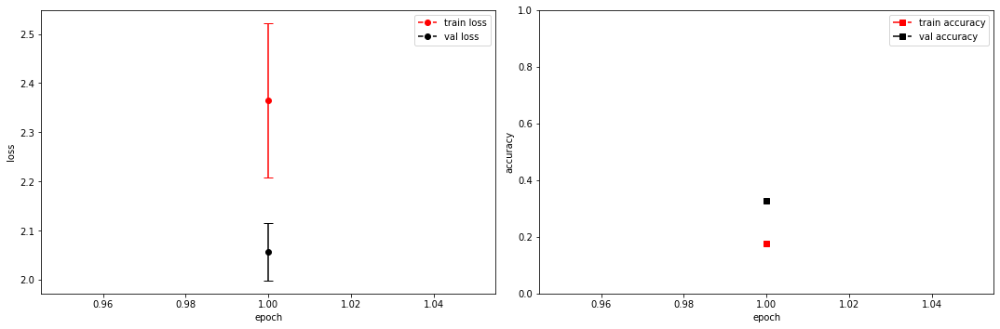

model saved


training epoch:  1
model set to train
Epoch [2/100], step [1/84],  Loss: 2.1843 +/- 0.0000,  accuracy: 0.0126953125, time elapsed = 0.23663115501403809s
Epoch [2/100], step [17/84],  Loss: 2.2307 +/- 0.0743,  accuracy: 0.232421875, time elapsed = 0.8377518653869629s
Epoch [2/100], step [33/84],  Loss: 2.2301 +/- 0.1091,  accuracy: 0.234375, time elapsed = 0.8309240341186523s
Epoch [2/100], step [49/84],  Loss: 2.1771 +/- 0.1047,  accuracy: 0.25, time elapsed = 0.8447122573852539s
Epoch [2/100], step [65/84],  Loss: 2.1802 +/- 0.1056,  accuracy: 0.25390625, time elapsed = 0.8358669281005859s
Epoch [2/100], step [81/84],  Loss: 2.1863 +/- 0.0819,  accuracy: 0.232421875, time elapsed = 0.8307366371154785s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.2396046988625769,  precision = 0.2396046988625769 recall = 0.2396046988625769 f1 = 0.2396046988625769 ::: val: acc = 0.36017897091722595,  precision = 0.36017897091722595 recall = 0.36017897091722595 time elapsed = 5.9

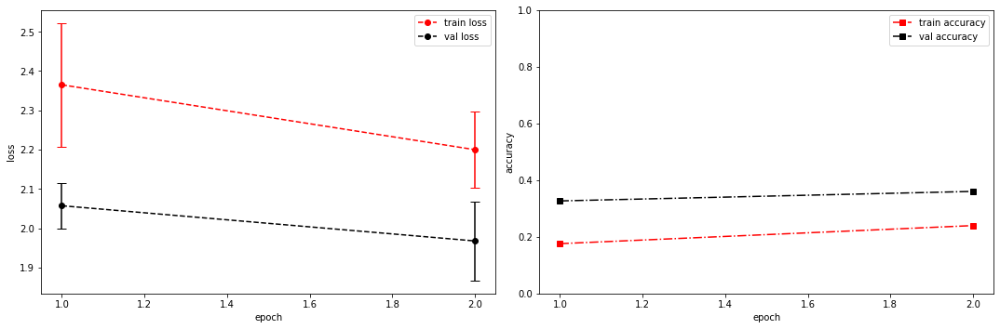

model saved


training epoch:  2
model set to train
Epoch [3/100], step [1/84],  Loss: 1.8143 +/- 0.0000,  accuracy: 0.025390625, time elapsed = 0.23346447944641113s
Epoch [3/100], step [17/84],  Loss: 2.1497 +/- 0.1344,  accuracy: 0.2802734375, time elapsed = 0.8476650714874268s
Epoch [3/100], step [33/84],  Loss: 2.1172 +/- 0.1143,  accuracy: 0.267578125, time elapsed = 0.8380143642425537s
Epoch [3/100], step [49/84],  Loss: 2.1158 +/- 0.1289,  accuracy: 0.2783203125, time elapsed = 0.8568482398986816s
Epoch [3/100], step [65/84],  Loss: 2.1488 +/- 0.0946,  accuracy: 0.2470703125, time elapsed = 0.843491792678833s
Epoch [3/100], step [81/84],  Loss: 2.1150 +/- 0.0712,  accuracy: 0.28515625, time elapsed = 0.8206489086151123s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.272608614581391,  precision = 0.272608614581391 recall = 0.272608614581391 f1 = 0.272608614581391 ::: val: acc = 0.3743475018642804,  precision = 0.3743475018642804 recall = 0.3743475018642804 time elapsed =

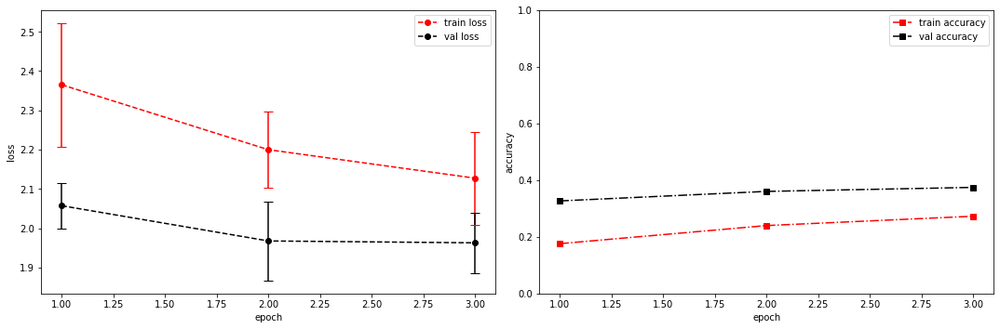

model saved


training epoch:  3
model set to train
Epoch [4/100], step [1/84],  Loss: 2.2037 +/- 0.0000,  accuracy: 0.0107421875, time elapsed = 0.23262858390808105s
Epoch [4/100], step [17/84],  Loss: 2.0795 +/- 0.0880,  accuracy: 0.2880859375, time elapsed = 0.8356912136077881s
Epoch [4/100], step [33/84],  Loss: 2.0496 +/- 0.1016,  accuracy: 0.3046875, time elapsed = 0.8867058753967285s
Epoch [4/100], step [49/84],  Loss: 2.1063 +/- 0.1041,  accuracy: 0.2783203125, time elapsed = 0.8240106105804443s
Epoch [4/100], step [65/84],  Loss: 2.0886 +/- 0.0774,  accuracy: 0.2587890625, time elapsed = 0.8247830867767334s
Epoch [4/100], step [81/84],  Loss: 2.0704 +/- 0.1283,  accuracy: 0.296875, time elapsed = 0.8311498165130615s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.2841693082230095,  precision = 0.2841693082230095 recall = 0.2841693082230095 f1 = 0.2841693082230095 ::: val: acc = 0.3624161073825503,  precision = 0.3624161073825503 recall = 0.3624161073825503 time elapsed

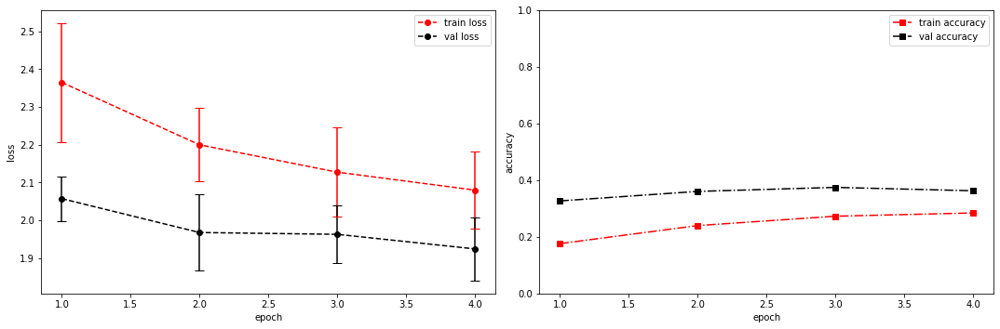

model saved


training epoch:  4
model set to train
Epoch [5/100], step [1/84],  Loss: 2.0235 +/- 0.0000,  accuracy: 0.021484375, time elapsed = 0.23565387725830078s
Epoch [5/100], step [17/84],  Loss: 2.0643 +/- 0.0930,  accuracy: 0.283203125, time elapsed = 0.8472363948822021s
Epoch [5/100], step [33/84],  Loss: 2.0556 +/- 0.0925,  accuracy: 0.2939453125, time elapsed = 0.8244805335998535s
Epoch [5/100], step [49/84],  Loss: 2.0154 +/- 0.1182,  accuracy: 0.326171875, time elapsed = 0.8232626914978027s
Epoch [5/100], step [65/84],  Loss: 2.0795 +/- 0.1272,  accuracy: 0.283203125, time elapsed = 0.8217852115631104s
Epoch [5/100], step [81/84],  Loss: 2.0761 +/- 0.1055,  accuracy: 0.296875, time elapsed = 0.8304381370544434s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.29703524146932686,  precision = 0.29703524146932686 recall = 0.29703524146932686 f1 = 0.29703524146932686 ::: val: acc = 0.40119313944817303,  precision = 0.40119313944817303 recall = 0.40119313944817303 time e

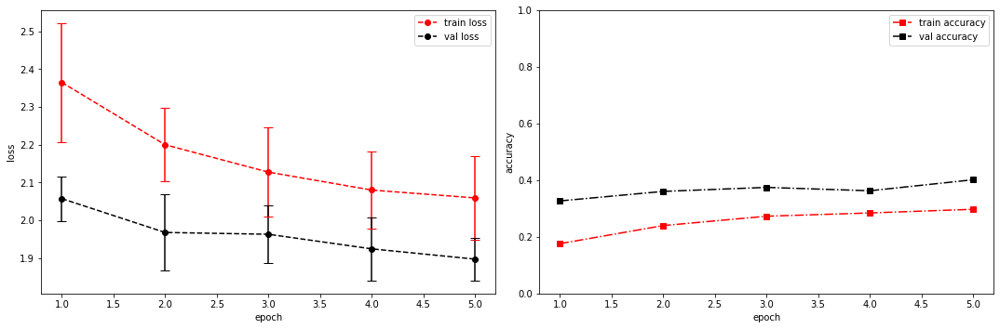

model saved


training epoch:  5
model set to train
Epoch [6/100], step [1/84],  Loss: 2.0333 +/- 0.0000,  accuracy: 0.021484375, time elapsed = 0.22968268394470215s
Epoch [6/100], step [17/84],  Loss: 2.0104 +/- 0.1056,  accuracy: 0.3134765625, time elapsed = 0.8599421977996826s
Epoch [6/100], step [33/84],  Loss: 2.0303 +/- 0.1406,  accuracy: 0.296875, time elapsed = 0.8423106670379639s
Epoch [6/100], step [49/84],  Loss: 1.9911 +/- 0.1005,  accuracy: 0.3125, time elapsed = 0.8403539657592773s
Epoch [6/100], step [65/84],  Loss: 2.0651 +/- 0.1197,  accuracy: 0.2802734375, time elapsed = 0.8642928600311279s
Epoch [6/100], step [81/84],  Loss: 2.0053 +/- 0.0964,  accuracy: 0.30859375, time elapsed = 0.8311176300048828s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3024426626887936,  precision = 0.3024426626887936 recall = 0.3024426626887936 f1 = 0.3024426626887936 ::: val: acc = 0.39373601789709173,  precision = 0.39373601789709173 recall = 0.39373601789709173 time elapsed = 

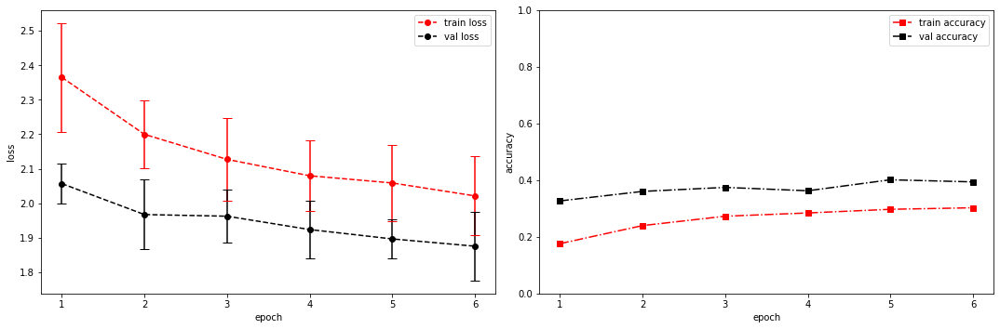

model saved


training epoch:  6
model set to train
Epoch [7/100], step [1/84],  Loss: 2.2677 +/- 0.0000,  accuracy: 0.0166015625, time elapsed = 0.23503541946411133s
Epoch [7/100], step [17/84],  Loss: 2.0571 +/- 0.1006,  accuracy: 0.275390625, time elapsed = 0.8442726135253906s
Epoch [7/100], step [33/84],  Loss: 2.0293 +/- 0.1368,  accuracy: 0.2978515625, time elapsed = 0.8499538898468018s
Epoch [7/100], step [49/84],  Loss: 2.0170 +/- 0.1091,  accuracy: 0.3095703125, time elapsed = 0.8484270572662354s
Epoch [7/100], step [65/84],  Loss: 2.0001 +/- 0.0823,  accuracy: 0.3154296875, time elapsed = 0.8225266933441162s
Epoch [7/100], step [81/84],  Loss: 2.0254 +/- 0.0909,  accuracy: 0.2998046875, time elapsed = 0.8172392845153809s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.29945925787805333,  precision = 0.29945925787805333 recall = 0.29945925787805333 f1 = 0.29945925787805333 ::: val: acc = 0.3862788963460104,  precision = 0.3862788963460104 recall = 0.3862788963460104 ti

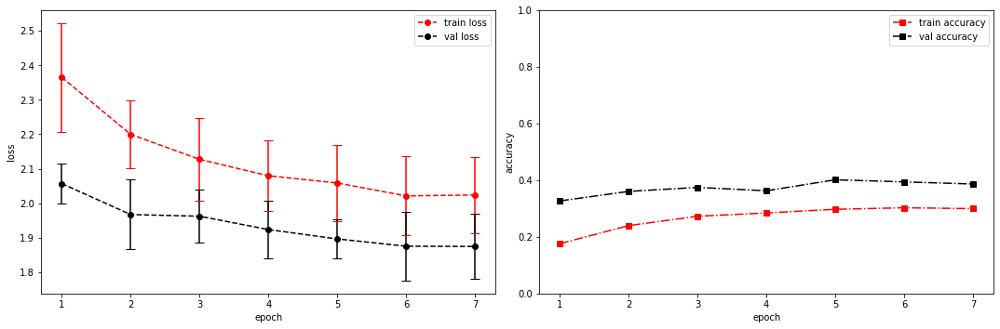

model saved


training epoch:  7
model set to train
Epoch [8/100], step [1/84],  Loss: 1.9858 +/- 0.0000,  accuracy: 0.021484375, time elapsed = 0.23226618766784668s
Epoch [8/100], step [17/84],  Loss: 1.9484 +/- 0.1134,  accuracy: 0.33984375, time elapsed = 0.8636617660522461s
Epoch [8/100], step [33/84],  Loss: 1.9715 +/- 0.0851,  accuracy: 0.3271484375, time elapsed = 0.9735734462738037s
Epoch [8/100], step [49/84],  Loss: 2.0347 +/- 0.1056,  accuracy: 0.3046875, time elapsed = 0.8323843479156494s
Epoch [8/100], step [65/84],  Loss: 1.9294 +/- 0.0873,  accuracy: 0.3193359375, time elapsed = 0.8310506343841553s
Epoch [8/100], step [81/84],  Loss: 1.9570 +/- 0.1312,  accuracy: 0.3115234375, time elapsed = 0.8350160121917725s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.32034309155323515,  precision = 0.32034309155323515 recall = 0.32034309155323515 f1 = 0.32034309155323515 ::: val: acc = 0.39373601789709173,  precision = 0.39373601789709173 recall = 0.39373601789709173 time

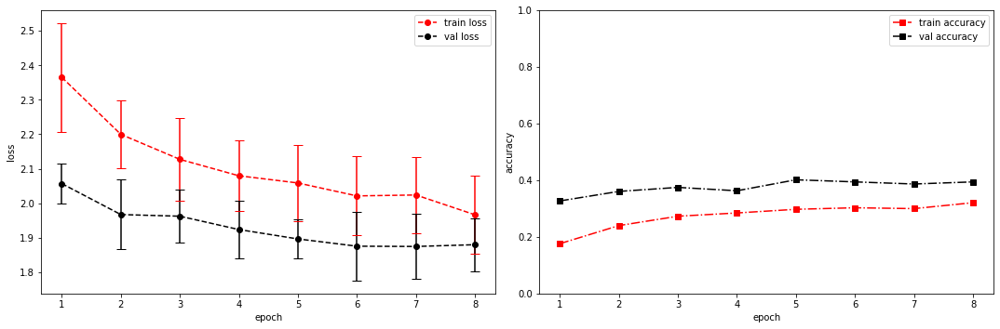

model saved


training epoch:  8
model set to train
Epoch [9/100], step [1/84],  Loss: 1.8700 +/- 0.0000,  accuracy: 0.0234375, time elapsed = 0.2382369041442871s
Epoch [9/100], step [17/84],  Loss: 1.9649 +/- 0.0945,  accuracy: 0.3251953125, time elapsed = 0.8506672382354736s
Epoch [9/100], step [33/84],  Loss: 1.9117 +/- 0.0896,  accuracy: 0.357421875, time elapsed = 0.8351700305938721s
Epoch [9/100], step [49/84],  Loss: 1.9577 +/- 0.0981,  accuracy: 0.3388671875, time elapsed = 0.8385515213012695s
Epoch [9/100], step [65/84],  Loss: 1.9409 +/- 0.1122,  accuracy: 0.3271484375, time elapsed = 0.8360140323638916s
Epoch [9/100], step [81/84],  Loss: 1.9591 +/- 0.0915,  accuracy: 0.3310546875, time elapsed = 0.846588134765625s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3367518180123065,  precision = 0.3367518180123065 recall = 0.3367518180123065 f1 = 0.3367518180123065 ::: val: acc = 0.4146159582401193,  precision = 0.4146159582401193 recall = 0.4146159582401193 time elapse

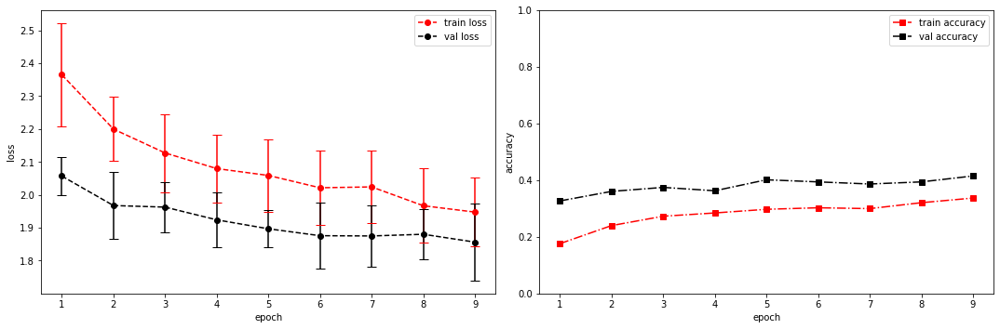

model saved


training epoch:  9
model set to train
Epoch [10/100], step [1/84],  Loss: 1.9081 +/- 0.0000,  accuracy: 0.025390625, time elapsed = 0.23273873329162598s
Epoch [10/100], step [17/84],  Loss: 1.8956 +/- 0.0964,  accuracy: 0.3486328125, time elapsed = 0.8501338958740234s
Epoch [10/100], step [33/84],  Loss: 1.9363 +/- 0.1021,  accuracy: 0.349609375, time elapsed = 0.8277966976165771s
Epoch [10/100], step [49/84],  Loss: 1.9566 +/- 0.0931,  accuracy: 0.3173828125, time elapsed = 0.8389837741851807s
Epoch [10/100], step [65/84],  Loss: 1.8919 +/- 0.1297,  accuracy: 0.361328125, time elapsed = 0.829592227935791s
Epoch [10/100], step [81/84],  Loss: 1.9360 +/- 0.1111,  accuracy: 0.3359375, time elapsed = 0.8342714309692383s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.34383740443781463,  precision = 0.34383740443781463 recall = 0.34383740443781463 f1 = 0.34383740443781463 ::: val: acc = 0.4108873974645787,  precision = 0.4108873974645787 recall = 0.4108873974645787 ti

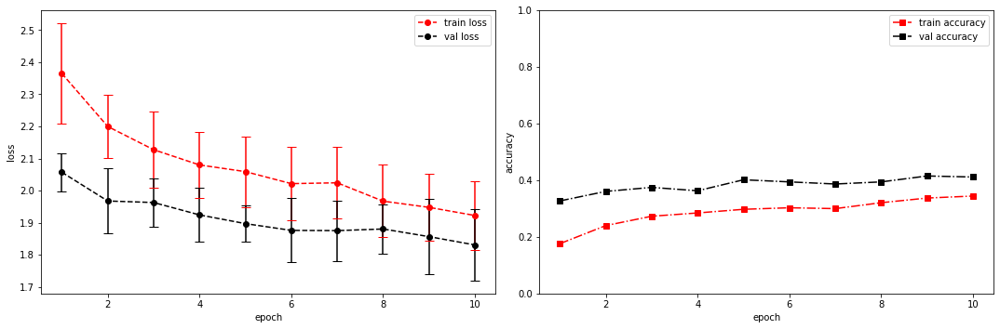

model saved


training epoch:  10
model set to train
Epoch [11/100], step [1/84],  Loss: 1.9437 +/- 0.0000,  accuracy: 0.0283203125, time elapsed = 0.2383260726928711s
Epoch [11/100], step [17/84],  Loss: 1.8803 +/- 0.0830,  accuracy: 0.3583984375, time elapsed = 0.8183727264404297s
Epoch [11/100], step [33/84],  Loss: 1.8747 +/- 0.0836,  accuracy: 0.3798828125, time elapsed = 0.8442544937133789s
Epoch [11/100], step [49/84],  Loss: 1.9262 +/- 0.1443,  accuracy: 0.341796875, time elapsed = 0.84232497215271s
Epoch [11/100], step [65/84],  Loss: 1.8502 +/- 0.0919,  accuracy: 0.369140625, time elapsed = 0.8445014953613281s
Epoch [11/100], step [81/84],  Loss: 1.9267 +/- 0.1206,  accuracy: 0.359375, time elapsed = 0.8249149322509766s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3628566101062838,  precision = 0.3628566101062838 recall = 0.3628566101062838 f1 = 0.36285661010628373 ::: val: acc = 0.40566741237882176,  precision = 0.40566741237882176 recall = 0.40566741237882176 tim

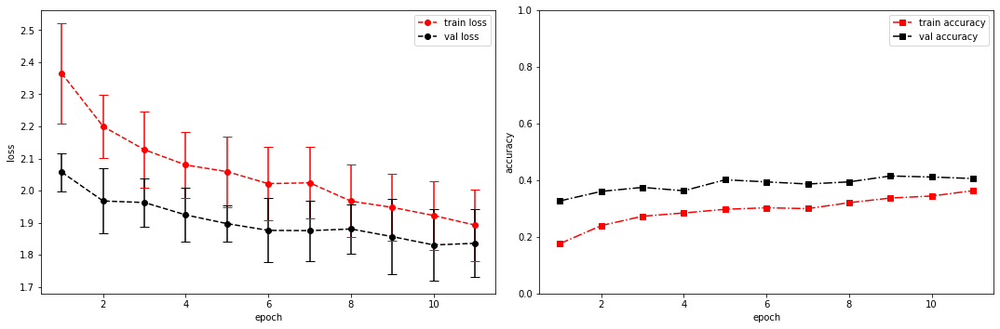

model saved


training epoch:  11
model set to train
Epoch [12/100], step [1/84],  Loss: 1.8975 +/- 0.0000,  accuracy: 0.021484375, time elapsed = 0.25885844230651855s
Epoch [12/100], step [17/84],  Loss: 1.8624 +/- 0.1204,  accuracy: 0.3916015625, time elapsed = 0.8745434284210205s
Epoch [12/100], step [33/84],  Loss: 1.8945 +/- 0.1258,  accuracy: 0.3642578125, time elapsed = 0.8664207458496094s
Epoch [12/100], step [49/84],  Loss: 1.8438 +/- 0.1120,  accuracy: 0.3837890625, time elapsed = 0.8543047904968262s
Epoch [12/100], step [65/84],  Loss: 1.9072 +/- 0.1008,  accuracy: 0.3623046875, time elapsed = 0.8683247566223145s
Epoch [12/100], step [81/84],  Loss: 1.8912 +/- 0.1077,  accuracy: 0.3642578125, time elapsed = 0.8687026500701904s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3731120641432034,  precision = 0.3731120641432034 recall = 0.3731120641432034 f1 = 0.3731120641432034 ::: val: acc = 0.39448173005219983,  precision = 0.39448173005219983 recall = 0.39448173005219

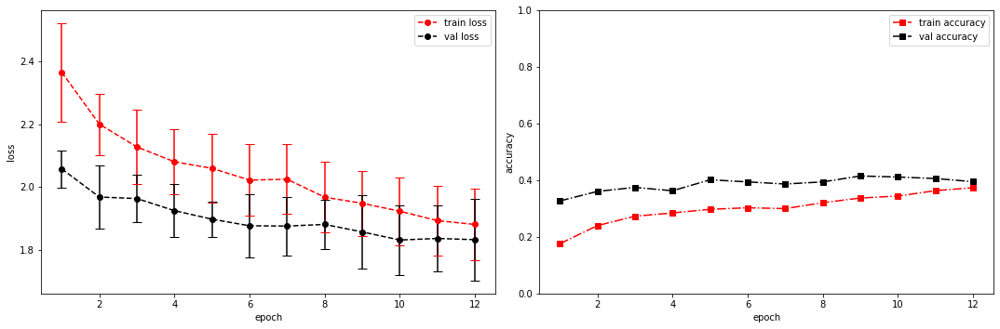

model saved


training epoch:  12
model set to train
Epoch [13/100], step [1/84],  Loss: 1.8011 +/- 0.0000,  accuracy: 0.025390625, time elapsed = 0.23003363609313965s
Epoch [13/100], step [17/84],  Loss: 1.8957 +/- 0.1208,  accuracy: 0.34765625, time elapsed = 0.8835024833679199s
Epoch [13/100], step [33/84],  Loss: 1.8253 +/- 0.1186,  accuracy: 0.3828125, time elapsed = 0.8586704730987549s
Epoch [13/100], step [49/84],  Loss: 1.8327 +/- 0.0911,  accuracy: 0.3681640625, time elapsed = 0.8597831726074219s
Epoch [13/100], step [65/84],  Loss: 1.8401 +/- 0.1343,  accuracy: 0.3681640625, time elapsed = 0.8709230422973633s
Epoch [13/100], step [81/84],  Loss: 1.8490 +/- 0.1300,  accuracy: 0.3759765625, time elapsed = 0.8707780838012695s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.36882341972776433,  precision = 0.36882341972776433 recall = 0.36882341972776433 f1 = 0.3688234197277644 ::: val: acc = 0.4079045488441462,  precision = 0.4079045488441462 recall = 0.4079045488441462 t

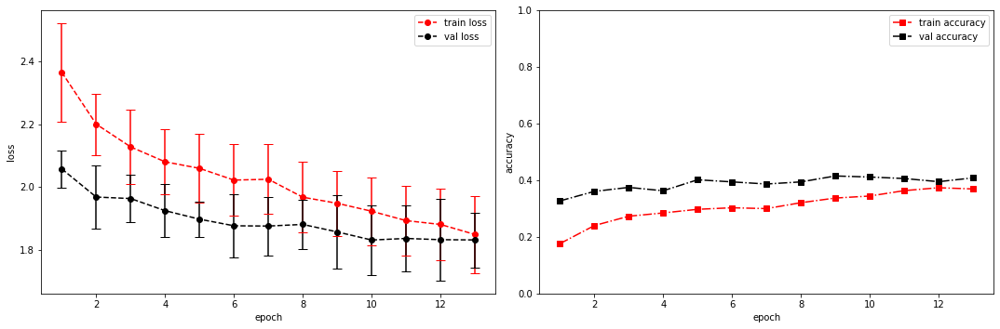

model saved


training epoch:  13
model set to train
Epoch [14/100], step [1/84],  Loss: 1.9867 +/- 0.0000,  accuracy: 0.017578125, time elapsed = 0.23556971549987793s
Epoch [14/100], step [17/84],  Loss: 1.8087 +/- 0.1057,  accuracy: 0.392578125, time elapsed = 0.8442749977111816s
Epoch [14/100], step [33/84],  Loss: 1.8353 +/- 0.0693,  accuracy: 0.38671875, time elapsed = 0.8575654029846191s
Epoch [14/100], step [49/84],  Loss: 1.8353 +/- 0.0743,  accuracy: 0.3701171875, time elapsed = 0.8294951915740967s
Epoch [14/100], step [65/84],  Loss: 1.8707 +/- 0.1508,  accuracy: 0.380859375, time elapsed = 0.8462979793548584s
Epoch [14/100], step [81/84],  Loss: 1.8581 +/- 0.1426,  accuracy: 0.3701171875, time elapsed = 0.829859733581543s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3775871713593138,  precision = 0.3775871713593138 recall = 0.3775871713593138 f1 = 0.3775871713593138 ::: val: acc = 0.40119313944817303,  precision = 0.40119313944817303 recall = 0.40119313944817303 t

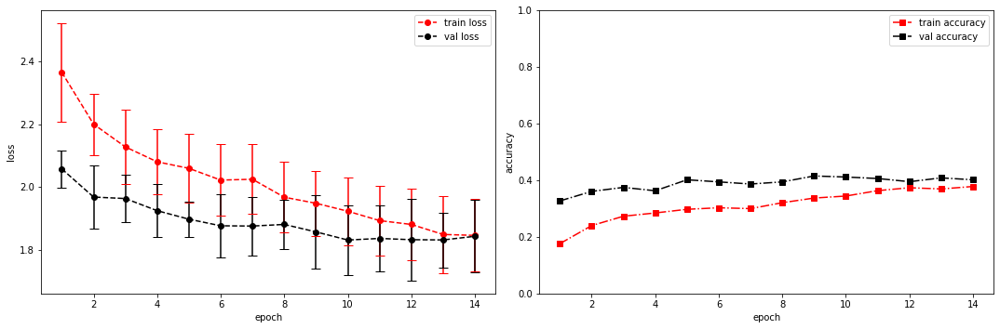

model saved


training epoch:  14
model set to train
Epoch [15/100], step [1/84],  Loss: 1.8759 +/- 0.0000,  accuracy: 0.0205078125, time elapsed = 0.23308634757995605s
Epoch [15/100], step [17/84],  Loss: 1.8696 +/- 0.1019,  accuracy: 0.3681640625, time elapsed = 0.8466384410858154s
Epoch [15/100], step [33/84],  Loss: 1.7341 +/- 0.0981,  accuracy: 0.4287109375, time elapsed = 0.8184936046600342s
Epoch [15/100], step [49/84],  Loss: 1.8512 +/- 0.1154,  accuracy: 0.37890625, time elapsed = 0.8613026142120361s
Epoch [15/100], step [65/84],  Loss: 1.8126 +/- 0.1386,  accuracy: 0.38671875, time elapsed = 0.8259148597717285s
Epoch [15/100], step [81/84],  Loss: 1.8695 +/- 0.1048,  accuracy: 0.3642578125, time elapsed = 0.8427014350891113s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.38504568338616446,  precision = 0.38504568338616446 recall = 0.38504568338616446 f1 = 0.3850456833861644 ::: val: acc = 0.4161073825503356,  precision = 0.4161073825503356 recall = 0.4161073825503356

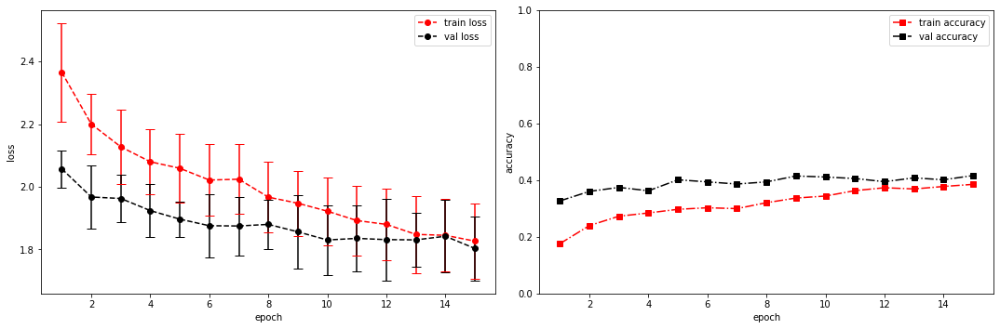

model saved


training epoch:  15
model set to train
Epoch [16/100], step [1/84],  Loss: 1.8208 +/- 0.0000,  accuracy: 0.0234375, time elapsed = 0.23651957511901855s
Epoch [16/100], step [17/84],  Loss: 1.8907 +/- 0.1198,  accuracy: 0.37109375, time elapsed = 2.153876543045044s
Epoch [16/100], step [33/84],  Loss: 1.7903 +/- 0.0950,  accuracy: 0.392578125, time elapsed = 0.8205411434173584s
Epoch [16/100], step [49/84],  Loss: 1.8201 +/- 0.0825,  accuracy: 0.3798828125, time elapsed = 1.8747880458831787s
Epoch [16/100], step [65/84],  Loss: 1.7749 +/- 0.0877,  accuracy: 0.39453125, time elapsed = 0.814716100692749s
Epoch [16/100], step [81/84],  Loss: 1.8211 +/- 0.0986,  accuracy: 0.390625, time elapsed = 0.8393087387084961s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3848592205854932,  precision = 0.3848592205854932 recall = 0.3848592205854932 f1 = 0.3848592205854932 ::: val: acc = 0.407158836689038,  precision = 0.407158836689038 recall = 0.407158836689038 time elapsed = 

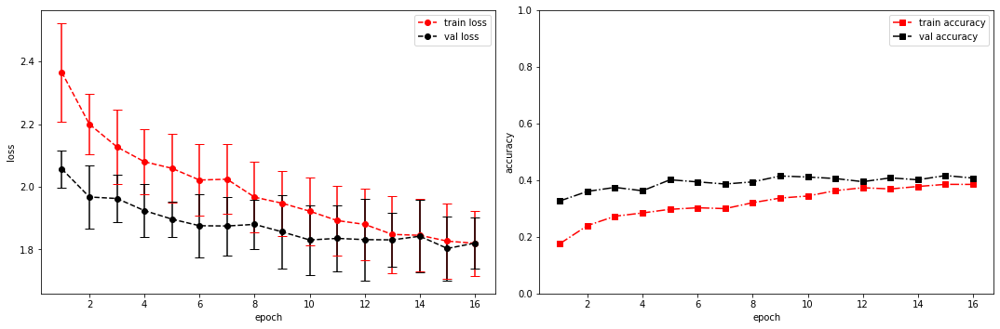

model saved


training epoch:  16
model set to train
Epoch [17/100], step [1/84],  Loss: 1.7856 +/- 0.0000,  accuracy: 0.0185546875, time elapsed = 0.25468969345092773s
Epoch [17/100], step [17/84],  Loss: 1.7849 +/- 0.0887,  accuracy: 0.3994140625, time elapsed = 0.8322851657867432s
Epoch [17/100], step [33/84],  Loss: 1.8185 +/- 0.1013,  accuracy: 0.39453125, time elapsed = 0.8263547420501709s
Epoch [17/100], step [49/84],  Loss: 1.7562 +/- 0.0841,  accuracy: 0.384765625, time elapsed = 0.8542206287384033s
Epoch [17/100], step [65/84],  Loss: 1.7571 +/- 0.0893,  accuracy: 0.4248046875, time elapsed = 0.8245525360107422s
Epoch [17/100], step [81/84],  Loss: 1.7863 +/- 0.1071,  accuracy: 0.3916015625, time elapsed = 0.8345263004302979s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3975386910311393,  precision = 0.3975386910311393 recall = 0.3975386910311393 f1 = 0.3975386910311393 ::: val: acc = 0.39970171513795677,  precision = 0.39970171513795677 recall = 0.3997017151379567

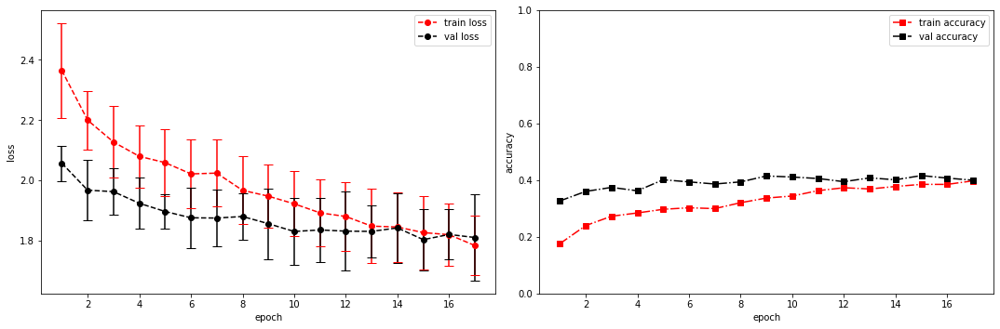

model saved


training epoch:  17
model set to train
Epoch [18/100], step [1/84],  Loss: 1.9384 +/- 0.0000,  accuracy: 0.0283203125, time elapsed = 0.2522857189178467s
Epoch [18/100], step [17/84],  Loss: 1.7544 +/- 0.1273,  accuracy: 0.4140625, time elapsed = 0.8475799560546875s
Epoch [18/100], step [33/84],  Loss: 1.7625 +/- 0.1296,  accuracy: 0.4169921875, time elapsed = 0.846468448638916s
Epoch [18/100], step [49/84],  Loss: 1.7662 +/- 0.1256,  accuracy: 0.404296875, time elapsed = 0.8201019763946533s
Epoch [18/100], step [65/84],  Loss: 1.7682 +/- 0.0695,  accuracy: 0.3935546875, time elapsed = 0.8370962142944336s
Epoch [18/100], step [81/84],  Loss: 1.7951 +/- 0.1503,  accuracy: 0.3896484375, time elapsed = 0.8323945999145508s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4044378146559761,  precision = 0.4044378146559761 recall = 0.4044378146559761 f1 = 0.4044378146559761 ::: val: acc = 0.41387024608501116,  precision = 0.41387024608501116 recall = 0.41387024608501116 t

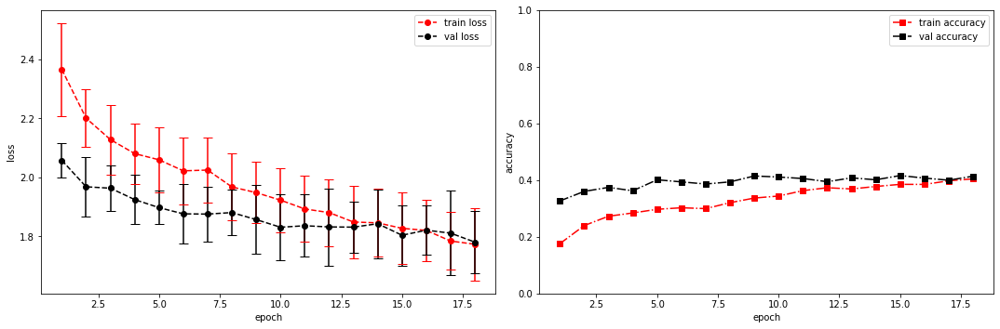

model saved


training epoch:  18
model set to train
Epoch [19/100], step [1/84],  Loss: 1.7191 +/- 0.0000,  accuracy: 0.029296875, time elapsed = 0.24495530128479004s
Epoch [19/100], step [17/84],  Loss: 1.7672 +/- 0.1050,  accuracy: 0.4248046875, time elapsed = 0.8488500118255615s
Epoch [19/100], step [33/84],  Loss: 1.7817 +/- 0.1493,  accuracy: 0.3876953125, time elapsed = 0.8364388942718506s
Epoch [19/100], step [49/84],  Loss: 1.7726 +/- 0.0895,  accuracy: 0.3916015625, time elapsed = 0.8629570007324219s
Epoch [19/100], step [65/84],  Loss: 1.7696 +/- 0.0934,  accuracy: 0.3916015625, time elapsed = 0.8463010787963867s
Epoch [19/100], step [81/84],  Loss: 1.7125 +/- 0.0914,  accuracy: 0.4228515625, time elapsed = 0.8343734741210938s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.40481074025731867,  precision = 0.40481074025731867 recall = 0.40481074025731867 f1 = 0.40481074025731867 ::: val: acc = 0.40566741237882176,  precision = 0.40566741237882176 recall = 0.4056674123

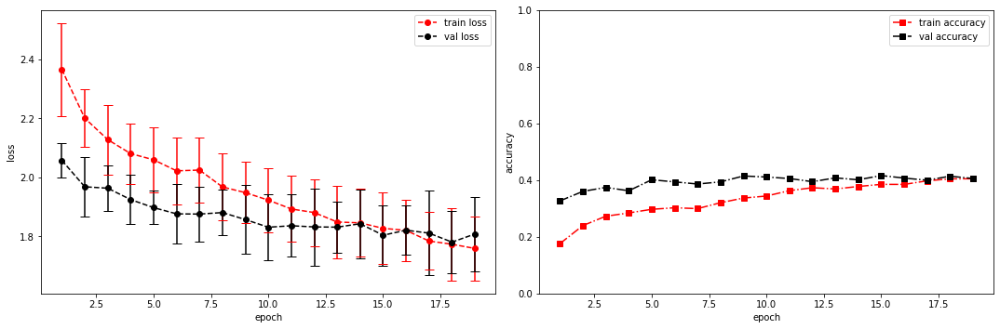

model saved


training epoch:  19
model set to train
Epoch [20/100], step [1/84],  Loss: 1.7476 +/- 0.0000,  accuracy: 0.025390625, time elapsed = 0.24785065650939941s
Epoch [20/100], step [17/84],  Loss: 1.7393 +/- 0.1056,  accuracy: 0.4326171875, time elapsed = 0.9568352699279785s
Epoch [20/100], step [33/84],  Loss: 1.7316 +/- 0.1169,  accuracy: 0.423828125, time elapsed = 0.8729038238525391s
Epoch [20/100], step [49/84],  Loss: 1.6910 +/- 0.0973,  accuracy: 0.4345703125, time elapsed = 0.8298978805541992s
Epoch [20/100], step [65/84],  Loss: 1.7345 +/- 0.1359,  accuracy: 0.4150390625, time elapsed = 0.8360679149627686s
Epoch [20/100], step [81/84],  Loss: 1.7743 +/- 0.1080,  accuracy: 0.419921875, time elapsed = 0.835707426071167s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4210330039157188,  precision = 0.4210330039157188 recall = 0.4210330039157188 f1 = 0.4210330039157188 ::: val: acc = 0.3862788963460104,  precision = 0.3862788963460104 recall = 0.3862788963460104 ti

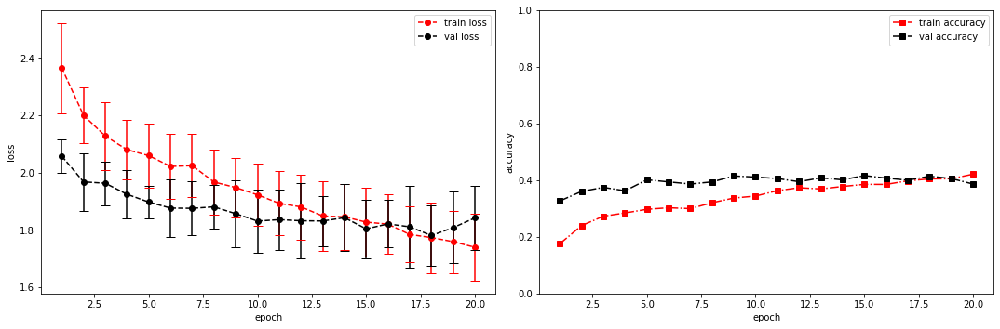

model saved


training epoch:  20
model set to train
Epoch [21/100], step [1/84],  Loss: 1.5936 +/- 0.0000,  accuracy: 0.029296875, time elapsed = 0.23873376846313477s
Epoch [21/100], step [17/84],  Loss: 1.6757 +/- 0.1344,  accuracy: 0.4462890625, time elapsed = 0.8534760475158691s
Epoch [21/100], step [33/84],  Loss: 1.7268 +/- 0.1422,  accuracy: 0.4189453125, time elapsed = 0.843080997467041s
Epoch [21/100], step [49/84],  Loss: 1.7233 +/- 0.1355,  accuracy: 0.4326171875, time elapsed = 0.8386545181274414s
Epoch [21/100], step [65/84],  Loss: 1.7676 +/- 0.1569,  accuracy: 0.4072265625, time elapsed = 0.8352899551391602s
Epoch [21/100], step [81/84],  Loss: 1.7283 +/- 0.0762,  accuracy: 0.4072265625, time elapsed = 0.8335220813751221s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.42588103673317174,  precision = 0.42588103673317174 recall = 0.42588103673317174 f1 = 0.42588103673317174 ::: val: acc = 0.3795674869500373,  precision = 0.3795674869500373 recall = 0.3795674869500

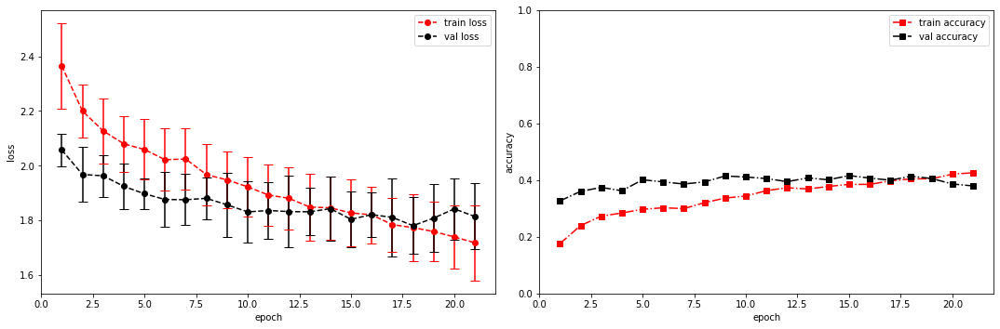

model saved


training epoch:  21
model set to train
Epoch [22/100], step [1/84],  Loss: 1.7360 +/- 0.0000,  accuracy: 0.0283203125, time elapsed = 0.2400057315826416s
Epoch [22/100], step [17/84],  Loss: 1.6997 +/- 0.1268,  accuracy: 0.4208984375, time elapsed = 0.8473577499389648s
Epoch [22/100], step [33/84],  Loss: 1.6737 +/- 0.0934,  accuracy: 0.431640625, time elapsed = 0.8721809387207031s
Epoch [22/100], step [49/84],  Loss: 1.7033 +/- 0.0922,  accuracy: 0.431640625, time elapsed = 0.8416738510131836s
Epoch [22/100], step [65/84],  Loss: 1.7515 +/- 0.0755,  accuracy: 0.40234375, time elapsed = 0.8437883853912354s
Epoch [22/100], step [81/84],  Loss: 1.7150 +/- 0.0978,  accuracy: 0.4208984375, time elapsed = 0.8826041221618652s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.42252470632108896,  precision = 0.42252470632108896 recall = 0.42252470632108896 f1 = 0.42252470632108896 ::: val: acc = 0.40492170022371365,  precision = 0.40492170022371365 recall = 0.40492170022371

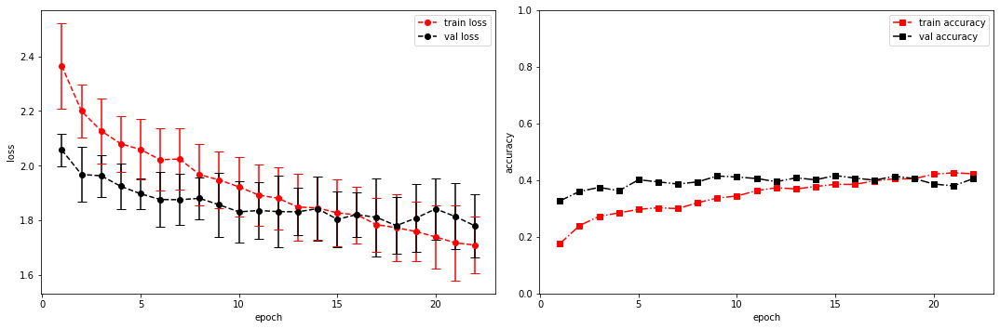

model saved


training epoch:  22
model set to train
Epoch [23/100], step [1/84],  Loss: 1.7098 +/- 0.0000,  accuracy: 0.029296875, time elapsed = 0.24003815650939941s
Epoch [23/100], step [17/84],  Loss: 1.6815 +/- 0.1157,  accuracy: 0.4375, time elapsed = 0.8595168590545654s
Epoch [23/100], step [33/84],  Loss: 1.7082 +/- 0.1023,  accuracy: 0.4462890625, time elapsed = 0.8457071781158447s
Epoch [23/100], step [49/84],  Loss: 1.6635 +/- 0.1059,  accuracy: 0.4296875, time elapsed = 0.8370802402496338s
Epoch [23/100], step [65/84],  Loss: 1.7209 +/- 0.1354,  accuracy: 0.4375, time elapsed = 0.8323831558227539s
Epoch [23/100], step [81/84],  Loss: 1.6930 +/- 0.1333,  accuracy: 0.4482421875, time elapsed = 0.8354325294494629s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.43911989558083164,  precision = 0.43911989558083164 recall = 0.43911989558083164 f1 = 0.4391198955808317 ::: val: acc = 0.4108873974645787,  precision = 0.4108873974645787 recall = 0.4108873974645787 time elapse

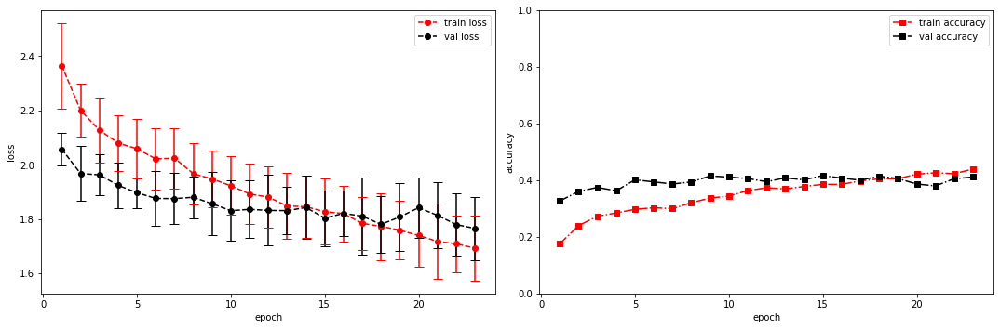

model saved


training epoch:  23
model set to train
Epoch [24/100], step [1/84],  Loss: 1.6093 +/- 0.0000,  accuracy: 0.02734375, time elapsed = 0.2557053565979004s
Epoch [24/100], step [17/84],  Loss: 1.6660 +/- 0.1413,  accuracy: 0.455078125, time elapsed = 0.8470454216003418s
Epoch [24/100], step [33/84],  Loss: 1.6457 +/- 0.0938,  accuracy: 0.4501953125, time elapsed = 0.826958417892456s
Epoch [24/100], step [49/84],  Loss: 1.6991 +/- 0.0872,  accuracy: 0.4130859375, time elapsed = 0.8473544120788574s
Epoch [24/100], step [65/84],  Loss: 1.6436 +/- 0.1132,  accuracy: 0.455078125, time elapsed = 0.8365151882171631s
Epoch [24/100], step [81/84],  Loss: 1.6496 +/- 0.0831,  accuracy: 0.4609375, time elapsed = 0.8196039199829102s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4478836472123811,  precision = 0.4478836472123811 recall = 0.4478836472123811 f1 = 0.44788364721238116 ::: val: acc = 0.4161073825503356,  precision = 0.4161073825503356 recall = 0.4161073825503356 time e

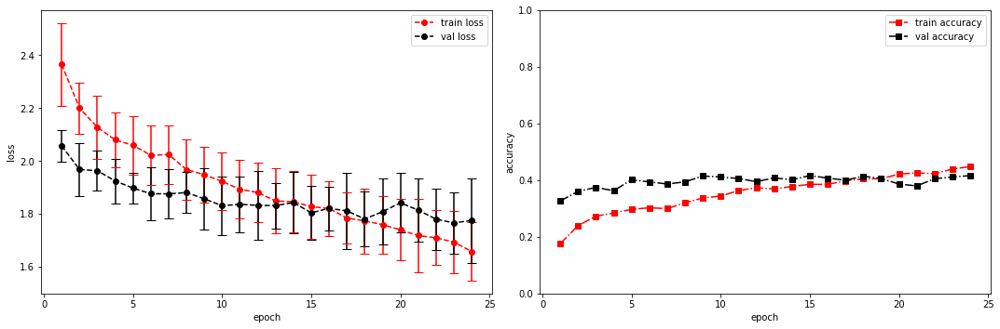

model saved


training epoch:  24
model set to train
Epoch [25/100], step [1/84],  Loss: 1.7110 +/- 0.0000,  accuracy: 0.0283203125, time elapsed = 0.24088335037231445s
Epoch [25/100], step [17/84],  Loss: 1.6474 +/- 0.1068,  accuracy: 0.447265625, time elapsed = 0.8425631523132324s
Epoch [25/100], step [33/84],  Loss: 1.5884 +/- 0.0923,  accuracy: 0.474609375, time elapsed = 0.8273589611053467s
Epoch [25/100], step [49/84],  Loss: 1.6537 +/- 0.1358,  accuracy: 0.4599609375, time elapsed = 0.8526463508605957s
Epoch [25/100], step [65/84],  Loss: 1.6502 +/- 0.1064,  accuracy: 0.4384765625, time elapsed = 0.8387064933776855s
Epoch [25/100], step [81/84],  Loss: 1.6310 +/- 0.1336,  accuracy: 0.4560546875, time elapsed = 0.8641965389251709s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4514264404251352,  precision = 0.4514264404251352 recall = 0.4514264404251352 f1 = 0.4514264404251352 ::: val: acc = 0.4086502609992543,  precision = 0.4086502609992543 recall = 0.4086502609992543 

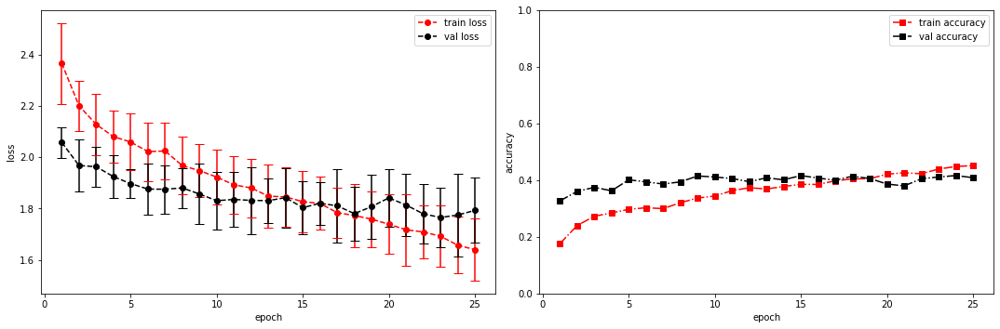

model saved


training epoch:  25
model set to train
Epoch [26/100], step [1/84],  Loss: 1.6572 +/- 0.0000,  accuracy: 0.03125, time elapsed = 0.24065279960632324s
Epoch [26/100], step [17/84],  Loss: 1.6308 +/- 0.1250,  accuracy: 0.46875, time elapsed = 0.8461184501647949s
Epoch [26/100], step [33/84],  Loss: 1.6085 +/- 0.1141,  accuracy: 0.4541015625, time elapsed = 0.8444511890411377s
Epoch [26/100], step [49/84],  Loss: 1.6124 +/- 0.0872,  accuracy: 0.455078125, time elapsed = 0.8421168327331543s
Epoch [26/100], step [65/84],  Loss: 1.6462 +/- 0.0976,  accuracy: 0.4443359375, time elapsed = 0.8218345642089844s
Epoch [26/100], step [81/84],  Loss: 1.6029 +/- 0.0892,  accuracy: 0.4736328125, time elapsed = 0.853717565536499s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.46037665485735596,  precision = 0.46037665485735596 recall = 0.46037665485735596 f1 = 0.46037665485735596 ::: val: acc = 0.43102162565249813,  precision = 0.43102162565249813 recall = 0.43102162565249813 tim

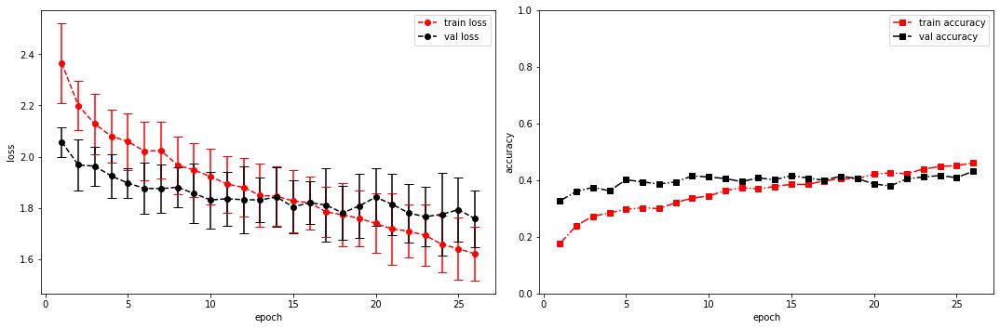

model saved


training epoch:  26
model set to train
Epoch [27/100], step [1/84],  Loss: 1.6313 +/- 0.0000,  accuracy: 0.0283203125, time elapsed = 0.22133326530456543s
Epoch [27/100], step [17/84],  Loss: 1.5935 +/- 0.0837,  accuracy: 0.48046875, time elapsed = 0.8775150775909424s
Epoch [27/100], step [33/84],  Loss: 1.6519 +/- 0.0955,  accuracy: 0.451171875, time elapsed = 0.8692111968994141s
Epoch [27/100], step [49/84],  Loss: 1.5602 +/- 0.0953,  accuracy: 0.4912109375, time elapsed = 0.8509445190429688s
Epoch [27/100], step [65/84],  Loss: 1.6093 +/- 0.1431,  accuracy: 0.46875, time elapsed = 0.8438947200775146s
Epoch [27/100], step [81/84],  Loss: 1.5875 +/- 0.1169,  accuracy: 0.4541015625, time elapsed = 0.810617208480835s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4676487040835353,  precision = 0.4676487040835353 recall = 0.4676487040835353 f1 = 0.4676487040835353 ::: val: acc = 0.4123788217747949,  precision = 0.4123788217747949 recall = 0.4123788217747949 time el

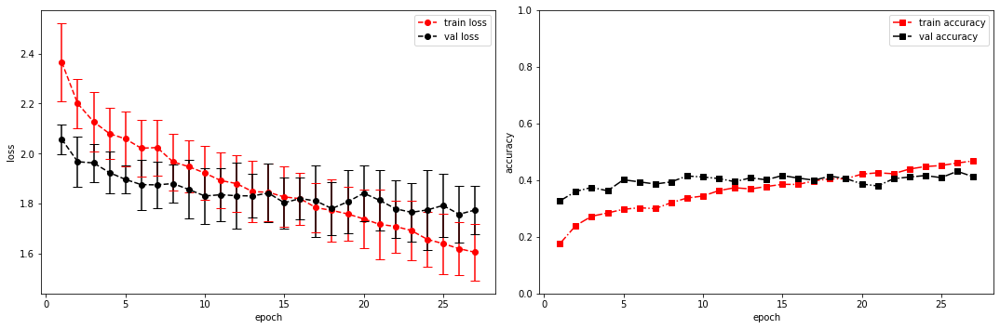

model saved


training epoch:  27
model set to train
Epoch [28/100], step [1/84],  Loss: 1.4398 +/- 0.0000,  accuracy: 0.0361328125, time elapsed = 0.24852299690246582s
Epoch [28/100], step [17/84],  Loss: 1.5907 +/- 0.1371,  accuracy: 0.47265625, time elapsed = 0.8381714820861816s
Epoch [28/100], step [33/84],  Loss: 1.5882 +/- 0.1076,  accuracy: 0.478515625, time elapsed = 0.8744263648986816s
Epoch [28/100], step [49/84],  Loss: 1.5629 +/- 0.1500,  accuracy: 0.4833984375, time elapsed = 0.8638036251068115s
Epoch [28/100], step [65/84],  Loss: 1.5955 +/- 0.0888,  accuracy: 0.478515625, time elapsed = 0.8358883857727051s
Epoch [28/100], step [81/84],  Loss: 1.5622 +/- 0.1162,  accuracy: 0.4814453125, time elapsed = 0.848851203918457s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.47865000932314006,  precision = 0.47865000932314006 recall = 0.47865000932314006 f1 = 0.47865000932314006 ::: val: acc = 0.41014168530947054,  precision = 0.41014168530947054 recall = 0.41014168530947

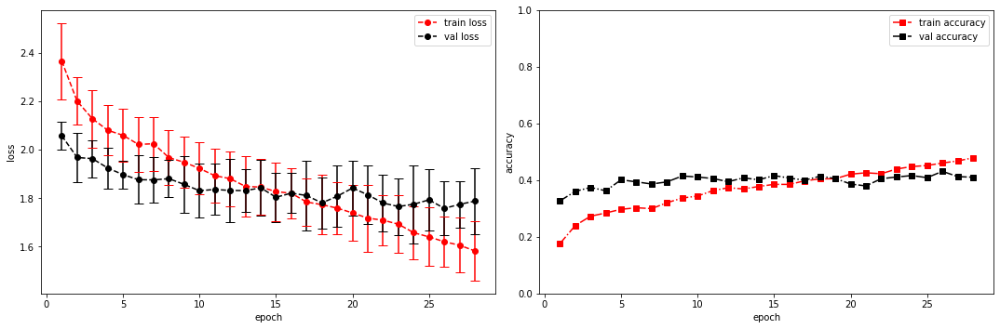

model saved


training epoch:  28
model set to train
Epoch [29/100], step [1/84],  Loss: 1.6403 +/- 0.0000,  accuracy: 0.0283203125, time elapsed = 0.23731184005737305s
Epoch [29/100], step [17/84],  Loss: 1.5481 +/- 0.0879,  accuracy: 0.501953125, time elapsed = 0.8487355709075928s
Epoch [29/100], step [33/84],  Loss: 1.5933 +/- 0.1241,  accuracy: 0.4833984375, time elapsed = 0.8640351295471191s
Epoch [29/100], step [49/84],  Loss: 1.6037 +/- 0.1026,  accuracy: 0.462890625, time elapsed = 0.833794116973877s
Epoch [29/100], step [65/84],  Loss: 1.6004 +/- 0.1451,  accuracy: 0.4765625, time elapsed = 0.8314657211303711s
Epoch [29/100], step [81/84],  Loss: 1.5738 +/- 0.0732,  accuracy: 0.466796875, time elapsed = 0.8287875652313232s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4773447697184412,  precision = 0.4773447697184412 recall = 0.4773447697184412 f1 = 0.4773447697184412 ::: val: acc = 0.37360178970917224,  precision = 0.37360178970917224 recall = 0.37360178970917224 ti

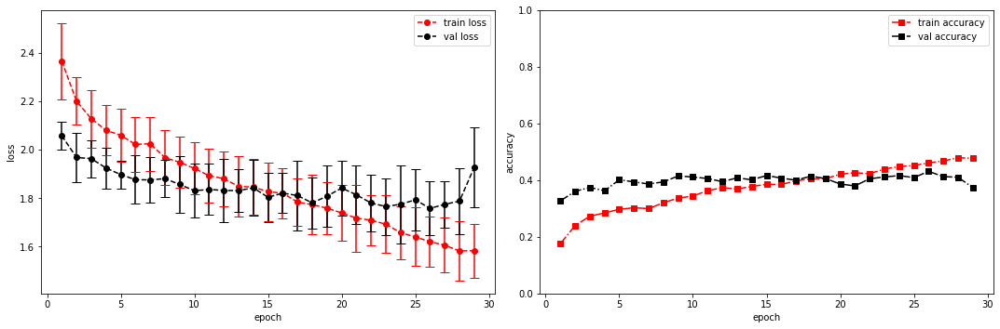

model saved
stopping early
Conv_1_layer
(1, 13, 517)
running model: id = Conv_1_layer, channels = [16]
device:  cuda
dataset metadata:  {'n_fft': 2048, 'hop_length': 256, 'n_mfcc': 13, 'notes': 'optional notes not passed'}
train model: data loaders initialized
sample shape =  (1, 13, 517)
model loaded
Layer (type:depth-idx)                   Output Shape              Param #
├─ConvBlock: 1-1                         [-1, 16, 13, 52]          --
|    └─Sequential: 2-1                   [-1, 16, 13, 52]          --
|    |    └─Conv2d: 3-1                  [-1, 16, 13, 517]         160
|    |    └─ReLU: 3-2                    [-1, 16, 13, 517]         --
|    |    └─MaxPool2d: 3-3               [-1, 16, 13, 52]          --
|    |    └─BatchNorm2d: 3-4             [-1, 16, 13, 52]          32
├─LinearBlock: 1-2                       [-1, 128]                 --
|    └─Sequential: 2-2                   [-1, 128]                 --
|    |    └─Linear: 3-5                  [-1, 128]           

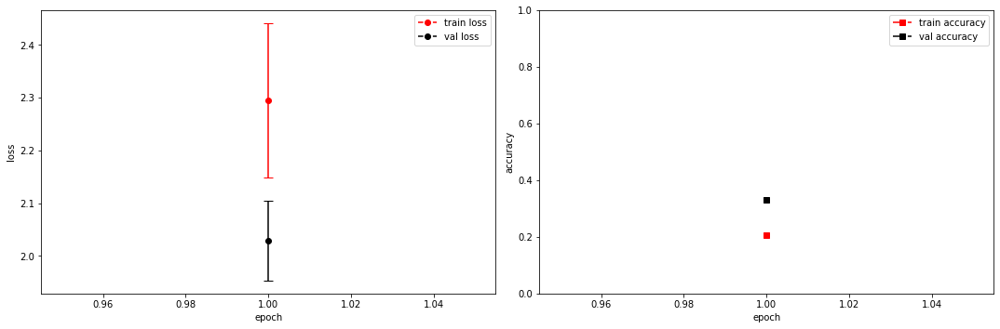

model saved


training epoch:  1
model set to train
Epoch [2/100], step [1/84],  Loss: 2.0818 +/- 0.0000,  accuracy: 0.021484375, time elapsed = 0.2351090908050537s
Epoch [2/100], step [17/84],  Loss: 2.1617 +/- 0.1069,  accuracy: 0.2587890625, time elapsed = 0.8568115234375s
Epoch [2/100], step [33/84],  Loss: 2.1544 +/- 0.1018,  accuracy: 0.2548828125, time elapsed = 0.849926233291626s
Epoch [2/100], step [49/84],  Loss: 2.1339 +/- 0.1061,  accuracy: 0.26171875, time elapsed = 0.892575740814209s
Epoch [2/100], step [65/84],  Loss: 2.1679 +/- 0.1146,  accuracy: 0.2587890625, time elapsed = 0.8340520858764648s
Epoch [2/100], step [81/84],  Loss: 2.1635 +/- 0.1088,  accuracy: 0.26171875, time elapsed = 0.8252906799316406s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.25918329293305986,  precision = 0.25918329293305986 recall = 0.25918329293305986 f1 = 0.25918329293305986 ::: val: acc = 0.3415361670395227,  precision = 0.3415361670395227 recall = 0.3415361670395227 time elapsed

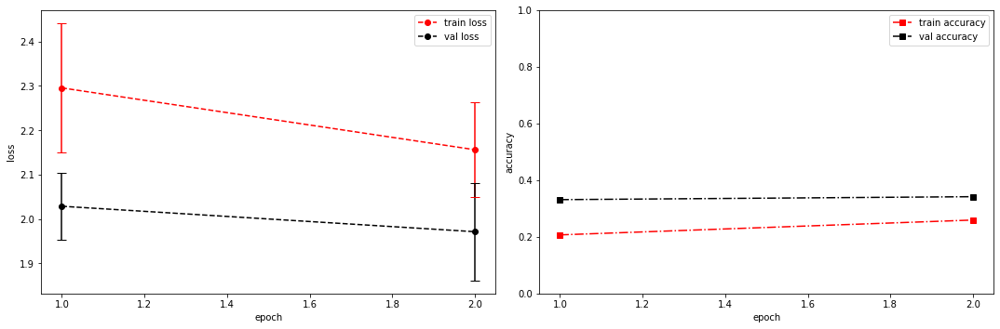

model saved


training epoch:  2
model set to train
Epoch [3/100], step [1/84],  Loss: 2.0517 +/- 0.0000,  accuracy: 0.021484375, time elapsed = 0.24692463874816895s
Epoch [3/100], step [17/84],  Loss: 2.1131 +/- 0.1039,  accuracy: 0.2822265625, time elapsed = 0.8652153015136719s
Epoch [3/100], step [33/84],  Loss: 2.0859 +/- 0.0767,  accuracy: 0.3017578125, time elapsed = 0.8541343212127686s
Epoch [3/100], step [49/84],  Loss: 2.0791 +/- 0.0618,  accuracy: 0.291015625, time elapsed = 0.8382742404937744s
Epoch [3/100], step [65/84],  Loss: 2.0627 +/- 0.0845,  accuracy: 0.3017578125, time elapsed = 0.8454852104187012s
Epoch [3/100], step [81/84],  Loss: 2.0551 +/- 0.0899,  accuracy: 0.29296875, time elapsed = 0.8388433456420898s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.29330598545590153,  precision = 0.29330598545590153 recall = 0.29330598545590153 f1 = 0.29330598545590153 ::: val: acc = 0.3877703206562267,  precision = 0.3877703206562267 recall = 0.3877703206562267 time 

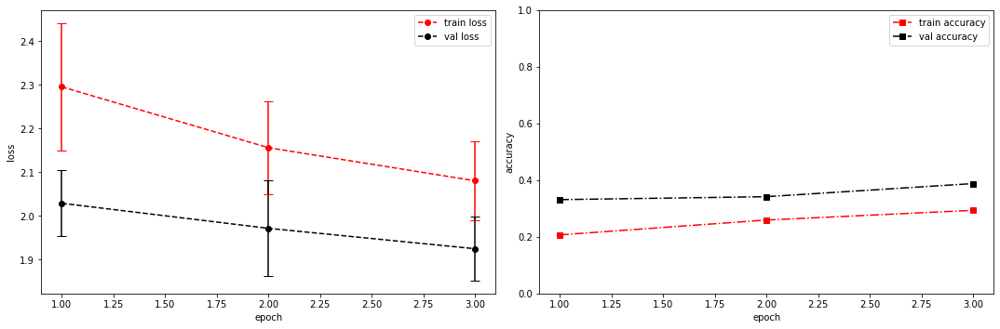

model saved


training epoch:  3
model set to train
Epoch [4/100], step [1/84],  Loss: 2.1290 +/- 0.0000,  accuracy: 0.021484375, time elapsed = 0.2420642375946045s
Epoch [4/100], step [17/84],  Loss: 2.0317 +/- 0.0660,  accuracy: 0.3134765625, time elapsed = 0.8706693649291992s
Epoch [4/100], step [33/84],  Loss: 2.0204 +/- 0.1170,  accuracy: 0.306640625, time elapsed = 0.849834680557251s
Epoch [4/100], step [49/84],  Loss: 2.0420 +/- 0.0899,  accuracy: 0.2939453125, time elapsed = 0.8512866497039795s
Epoch [4/100], step [65/84],  Loss: 2.0291 +/- 0.0771,  accuracy: 0.3125, time elapsed = 0.8807706832885742s
Epoch [4/100], step [81/84],  Loss: 2.0329 +/- 0.1220,  accuracy: 0.298828125, time elapsed = 0.8573529720306396s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.30561253030020513,  precision = 0.30561253030020513 recall = 0.30561253030020513 f1 = 0.30561253030020513 ::: val: acc = 0.3877703206562267,  precision = 0.3877703206562267 recall = 0.3877703206562267 time elapsed

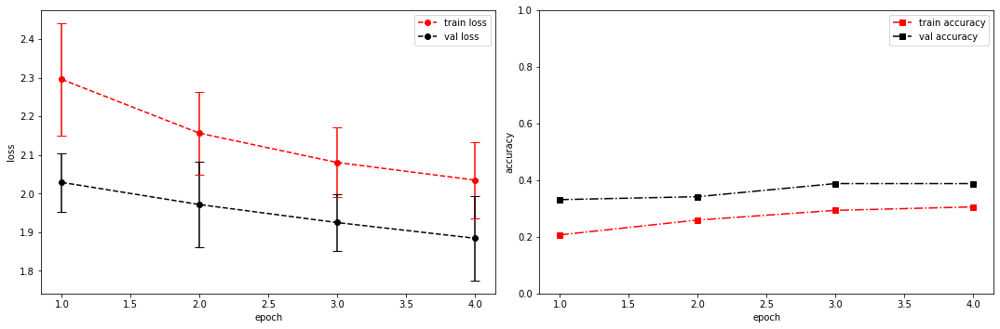

model saved


training epoch:  4
model set to train
Epoch [5/100], step [1/84],  Loss: 2.0379 +/- 0.0000,  accuracy: 0.0205078125, time elapsed = 0.23838090896606445s
Epoch [5/100], step [17/84],  Loss: 1.9869 +/- 0.1069,  accuracy: 0.32421875, time elapsed = 0.8467221260070801s
Epoch [5/100], step [33/84],  Loss: 1.9514 +/- 0.1091,  accuracy: 0.3251953125, time elapsed = 0.8424489498138428s
Epoch [5/100], step [49/84],  Loss: 1.9672 +/- 0.1150,  accuracy: 0.3349609375, time elapsed = 0.8502752780914307s
Epoch [5/100], step [65/84],  Loss: 2.0008 +/- 0.1340,  accuracy: 0.33203125, time elapsed = 0.8584318161010742s
Epoch [5/100], step [81/84],  Loss: 2.0054 +/- 0.1252,  accuracy: 0.326171875, time elapsed = 0.8250868320465088s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3281745291814283,  precision = 0.3281745291814283 recall = 0.3281745291814283 f1 = 0.3281745291814283 ::: val: acc = 0.39746457867263235,  precision = 0.39746457867263235 recall = 0.39746457867263235 time el

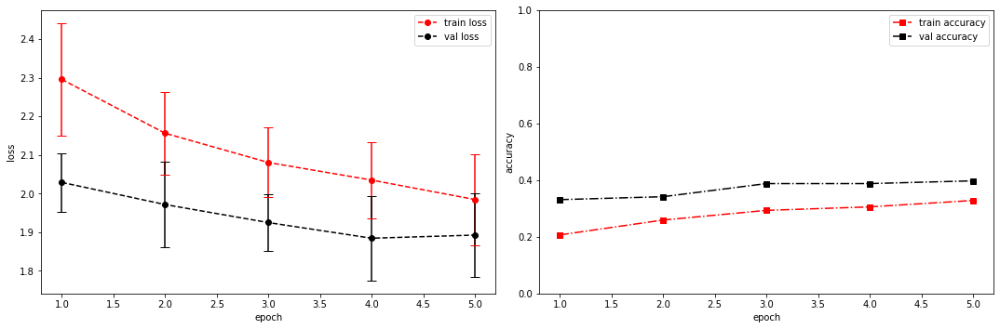

model saved


training epoch:  5
model set to train
Epoch [6/100], step [1/84],  Loss: 1.9654 +/- 0.0000,  accuracy: 0.0205078125, time elapsed = 0.25023412704467773s
Epoch [6/100], step [17/84],  Loss: 1.9554 +/- 0.0987,  accuracy: 0.3388671875, time elapsed = 0.846461296081543s
Epoch [6/100], step [33/84],  Loss: 1.9863 +/- 0.0918,  accuracy: 0.330078125, time elapsed = 0.8413522243499756s
Epoch [6/100], step [49/84],  Loss: 1.9731 +/- 0.0961,  accuracy: 0.31640625, time elapsed = 0.8532569408416748s
Epoch [6/100], step [65/84],  Loss: 1.9356 +/- 0.0952,  accuracy: 0.3515625, time elapsed = 0.8509519100189209s
Epoch [6/100], step [81/84],  Loss: 1.9107 +/- 0.0514,  accuracy: 0.330078125, time elapsed = 0.893399715423584s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.33227671079619614,  precision = 0.33227671079619614 recall = 0.33227671079619614 f1 = 0.33227671079619614 ::: val: acc = 0.39149888143176736,  precision = 0.39149888143176736 recall = 0.39149888143176736 time el

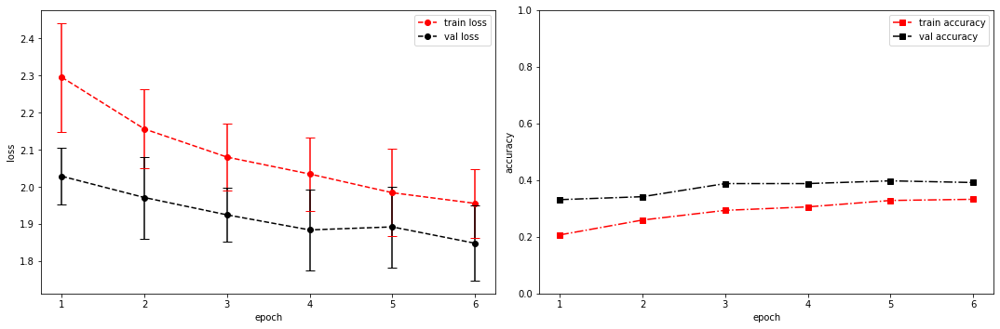

model saved


training epoch:  6
model set to train
Epoch [7/100], step [1/84],  Loss: 1.7890 +/- 0.0000,  accuracy: 0.025390625, time elapsed = 0.23659038543701172s
Epoch [7/100], step [17/84],  Loss: 1.9340 +/- 0.1007,  accuracy: 0.333984375, time elapsed = 0.8695762157440186s
Epoch [7/100], step [33/84],  Loss: 1.9080 +/- 0.1039,  accuracy: 0.3466796875, time elapsed = 0.8436944484710693s
Epoch [7/100], step [49/84],  Loss: 1.9286 +/- 0.1010,  accuracy: 0.3564453125, time elapsed = 0.8692193031311035s
Epoch [7/100], step [65/84],  Loss: 1.8923 +/- 0.1014,  accuracy: 0.3779296875, time elapsed = 0.8318490982055664s
Epoch [7/100], step [81/84],  Loss: 1.8724 +/- 0.1186,  accuracy: 0.3701171875, time elapsed = 0.8648288249969482s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.35707626328547454,  precision = 0.35707626328547454 recall = 0.35707626328547454 f1 = 0.3570762632854745 ::: val: acc = 0.39299030574198357,  precision = 0.39299030574198357 recall = 0.39299030574198357 t

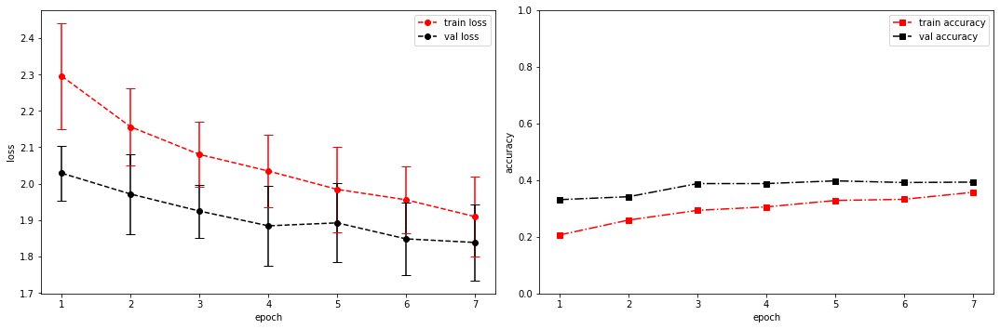

model saved


training epoch:  7
model set to train
Epoch [8/100], step [1/84],  Loss: 1.7455 +/- 0.0000,  accuracy: 0.0263671875, time elapsed = 0.23972511291503906s
Epoch [8/100], step [17/84],  Loss: 1.8634 +/- 0.0847,  accuracy: 0.3740234375, time elapsed = 0.8467268943786621s
Epoch [8/100], step [33/84],  Loss: 1.9401 +/- 0.0730,  accuracy: 0.359375, time elapsed = 0.8378889560699463s
Epoch [8/100], step [49/84],  Loss: 1.8910 +/- 0.0779,  accuracy: 0.3583984375, time elapsed = 0.8450374603271484s
Epoch [8/100], step [65/84],  Loss: 1.8946 +/- 0.0870,  accuracy: 0.345703125, time elapsed = 0.8359649181365967s
Epoch [8/100], step [81/84],  Loss: 1.8371 +/- 0.1070,  accuracy: 0.376953125, time elapsed = 0.8242337703704834s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.36639940331903786,  precision = 0.36639940331903786 recall = 0.36639940331903786 f1 = 0.36639940331903786 ::: val: acc = 0.41387024608501116,  precision = 0.41387024608501116 recall = 0.41387024608501116 time

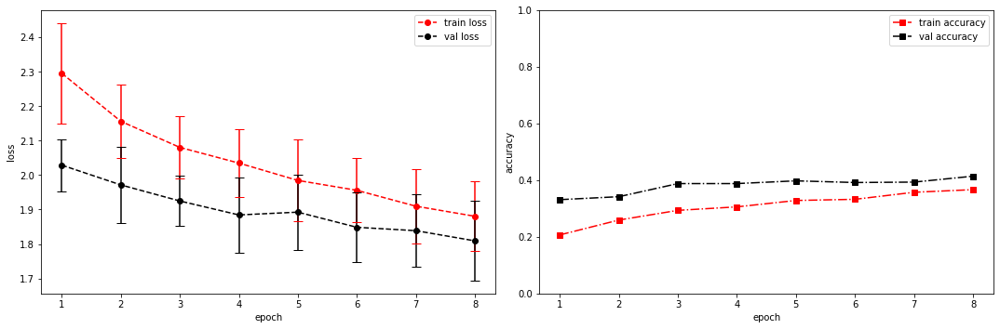

model saved


training epoch:  8
model set to train
Epoch [9/100], step [1/84],  Loss: 2.0661 +/- 0.0000,  accuracy: 0.021484375, time elapsed = 0.2427973747253418s
Epoch [9/100], step [17/84],  Loss: 1.9018 +/- 0.1365,  accuracy: 0.3740234375, time elapsed = 0.8365614414215088s
Epoch [9/100], step [33/84],  Loss: 1.8655 +/- 0.1350,  accuracy: 0.375, time elapsed = 0.8804337978363037s
Epoch [9/100], step [49/84],  Loss: 1.8728 +/- 0.0965,  accuracy: 0.3603515625, time elapsed = 0.8407161235809326s
Epoch [9/100], step [65/84],  Loss: 1.8789 +/- 0.1113,  accuracy: 0.369140625, time elapsed = 0.8391680717468262s
Epoch [9/100], step [81/84],  Loss: 1.8630 +/- 0.0783,  accuracy: 0.3740234375, time elapsed = 0.8339188098907471s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.37087451053514825,  precision = 0.37087451053514825 recall = 0.37087451053514825 f1 = 0.37087451053514825 ::: val: acc = 0.4041759880686055,  precision = 0.4041759880686055 recall = 0.4041759880686055 time elapse

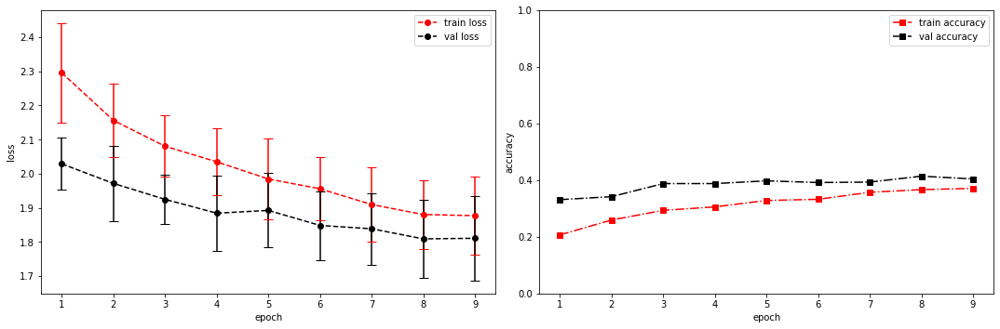

model saved


training epoch:  9
model set to train
Epoch [10/100], step [1/84],  Loss: 1.8017 +/- 0.0000,  accuracy: 0.0283203125, time elapsed = 0.24574518203735352s
Epoch [10/100], step [17/84],  Loss: 1.8296 +/- 0.0945,  accuracy: 0.3916015625, time elapsed = 0.8321869373321533s
Epoch [10/100], step [33/84],  Loss: 1.7898 +/- 0.1176,  accuracy: 0.3876953125, time elapsed = 0.8508772850036621s
Epoch [10/100], step [49/84],  Loss: 1.8115 +/- 0.1115,  accuracy: 0.373046875, time elapsed = 0.8277299404144287s
Epoch [10/100], step [65/84],  Loss: 1.8268 +/- 0.1155,  accuracy: 0.4013671875, time elapsed = 0.8359191417694092s
Epoch [10/100], step [81/84],  Loss: 1.8354 +/- 0.0911,  accuracy: 0.3857421875, time elapsed = 0.8241744041442871s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3893343278016036,  precision = 0.3893343278016036 recall = 0.3893343278016036 f1 = 0.3893343278016036 ::: val: acc = 0.41387024608501116,  precision = 0.41387024608501116 recall = 0.413870246085011

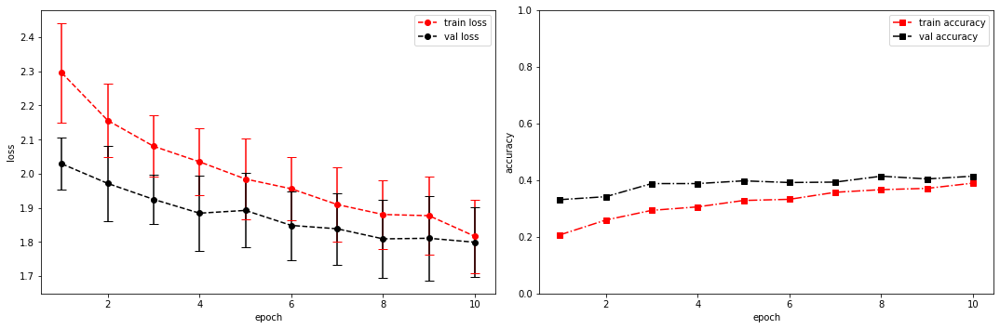

model saved


training epoch:  10
model set to train
Epoch [11/100], step [1/84],  Loss: 2.0934 +/- 0.0000,  accuracy: 0.017578125, time elapsed = 0.2548646926879883s
Epoch [11/100], step [17/84],  Loss: 1.8250 +/- 0.0941,  accuracy: 0.384765625, time elapsed = 0.8309133052825928s
Epoch [11/100], step [33/84],  Loss: 1.7990 +/- 0.1105,  accuracy: 0.40625, time elapsed = 0.8424077033996582s
Epoch [11/100], step [49/84],  Loss: 1.8132 +/- 0.1319,  accuracy: 0.390625, time elapsed = 0.8327431678771973s
Epoch [11/100], step [65/84],  Loss: 1.8197 +/- 0.1230,  accuracy: 0.3857421875, time elapsed = 0.8610589504241943s
Epoch [11/100], step [81/84],  Loss: 1.7565 +/- 0.1108,  accuracy: 0.431640625, time elapsed = 0.8326208591461182s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.39772515383181056,  precision = 0.39772515383181056 recall = 0.39772515383181056 f1 = 0.39772515383181056 ::: val: acc = 0.4153616703952274,  precision = 0.4153616703952274 recall = 0.4153616703952274 time el

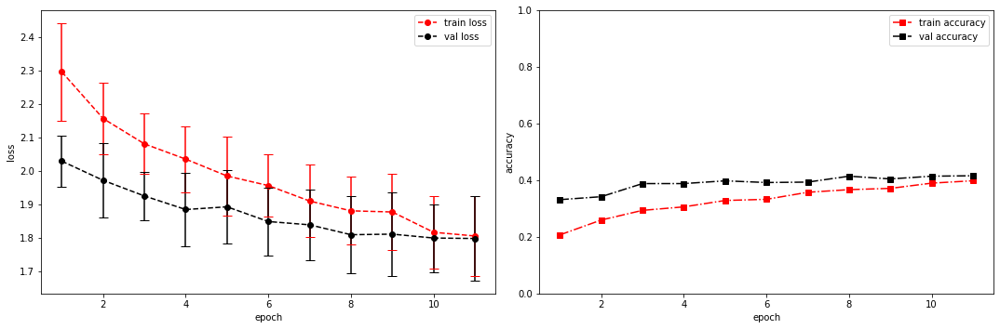

model saved


training epoch:  11
model set to train
Epoch [12/100], step [1/84],  Loss: 1.9682 +/- 0.0000,  accuracy: 0.0234375, time elapsed = 0.24476194381713867s
Epoch [12/100], step [17/84],  Loss: 1.7404 +/- 0.1068,  accuracy: 0.4248046875, time elapsed = 0.8347249031066895s
Epoch [12/100], step [33/84],  Loss: 1.8035 +/- 0.0837,  accuracy: 0.3974609375, time elapsed = 0.8546369075775146s
Epoch [12/100], step [49/84],  Loss: 1.7330 +/- 0.1514,  accuracy: 0.4306640625, time elapsed = 0.8565926551818848s
Epoch [12/100], step [65/84],  Loss: 1.7772 +/- 0.1182,  accuracy: 0.38671875, time elapsed = 0.8315796852111816s
Epoch [12/100], step [81/84],  Loss: 1.7665 +/- 0.0830,  accuracy: 0.40234375, time elapsed = 0.8483765125274658s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.40723475666604514,  precision = 0.40723475666604514 recall = 0.40723475666604514 f1 = 0.40723475666604514 ::: val: acc = 0.4123788217747949,  precision = 0.4123788217747949 recall = 0.4123788217747949 t

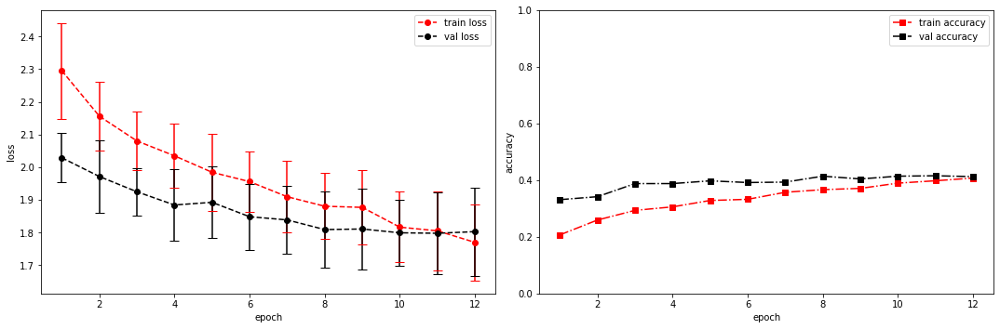

model saved


training epoch:  12
model set to train
Epoch [13/100], step [1/84],  Loss: 1.5225 +/- 0.0000,  accuracy: 0.0302734375, time elapsed = 0.2410750389099121s
Epoch [13/100], step [17/84],  Loss: 1.7237 +/- 0.1272,  accuracy: 0.4267578125, time elapsed = 0.8707375526428223s
Epoch [13/100], step [33/84],  Loss: 1.7747 +/- 0.0903,  accuracy: 0.4140625, time elapsed = 0.8653740882873535s
Epoch [13/100], step [49/84],  Loss: 1.7293 +/- 0.1111,  accuracy: 0.4140625, time elapsed = 0.8306095600128174s
Epoch [13/100], step [65/84],  Loss: 1.7694 +/- 0.0952,  accuracy: 0.4169921875, time elapsed = 0.8412206172943115s
Epoch [13/100], step [81/84],  Loss: 1.7516 +/- 0.1030,  accuracy: 0.4169921875, time elapsed = 0.855208158493042s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4180495991049786,  precision = 0.4180495991049786 recall = 0.4180495991049786 f1 = 0.41804959910497863 ::: val: acc = 0.4123788217747949,  precision = 0.4123788217747949 recall = 0.4123788217747949 time 

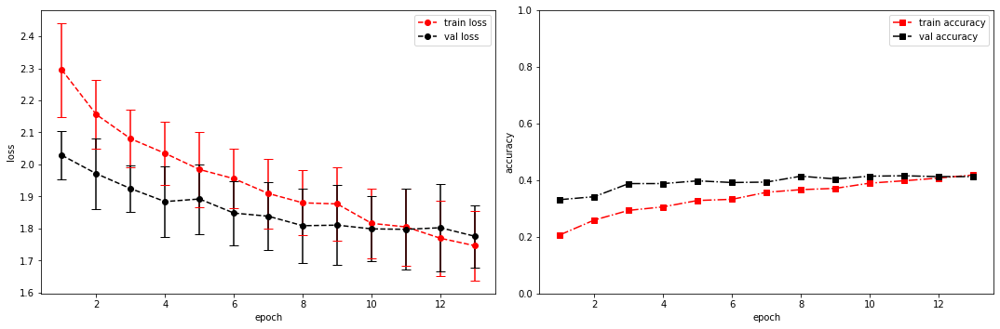

model saved


training epoch:  13
model set to train
Epoch [14/100], step [1/84],  Loss: 1.6608 +/- 0.0000,  accuracy: 0.0283203125, time elapsed = 0.24936747550964355s
Epoch [14/100], step [17/84],  Loss: 1.7081 +/- 0.1005,  accuracy: 0.4306640625, time elapsed = 0.8574399948120117s
Epoch [14/100], step [33/84],  Loss: 1.6905 +/- 0.0912,  accuracy: 0.43359375, time elapsed = 0.8558611869812012s
Epoch [14/100], step [49/84],  Loss: 1.6954 +/- 0.0886,  accuracy: 0.4228515625, time elapsed = 0.8376331329345703s
Epoch [14/100], step [65/84],  Loss: 1.7054 +/- 0.1241,  accuracy: 0.4365234375, time elapsed = 0.8310599327087402s
Epoch [14/100], step [81/84],  Loss: 1.7267 +/- 0.1225,  accuracy: 0.427734375, time elapsed = 0.8305199146270752s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4292373671452545,  precision = 0.4292373671452545 recall = 0.4292373671452545 f1 = 0.4292373671452545 ::: val: acc = 0.4116331096196868,  precision = 0.4116331096196868 recall = 0.4116331096196868 t

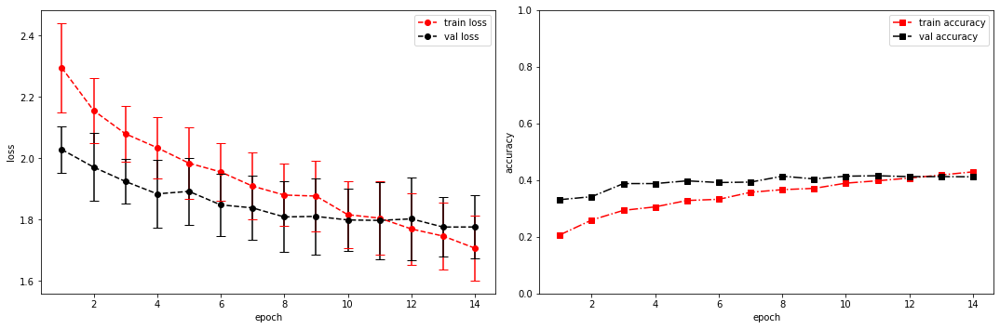

model saved


training epoch:  14
model set to train
Epoch [15/100], step [1/84],  Loss: 1.5911 +/- 0.0000,  accuracy: 0.0263671875, time elapsed = 0.26116251945495605s
Epoch [15/100], step [17/84],  Loss: 1.6986 +/- 0.1038,  accuracy: 0.44921875, time elapsed = 0.8352053165435791s
Epoch [15/100], step [33/84],  Loss: 1.6932 +/- 0.0975,  accuracy: 0.453125, time elapsed = 0.8511013984680176s
Epoch [15/100], step [49/84],  Loss: 1.7163 +/- 0.1153,  accuracy: 0.439453125, time elapsed = 0.8513867855072021s
Epoch [15/100], step [65/84],  Loss: 1.6861 +/- 0.1223,  accuracy: 0.431640625, time elapsed = 0.8478388786315918s
Epoch [15/100], step [81/84],  Loss: 1.6332 +/- 0.1019,  accuracy: 0.4638671875, time elapsed = 0.8482944965362549s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4458325564049972,  precision = 0.4458325564049972 recall = 0.4458325564049972 f1 = 0.44583255640499725 ::: val: acc = 0.4190902311707681,  precision = 0.4190902311707681 recall = 0.4190902311707681 time 

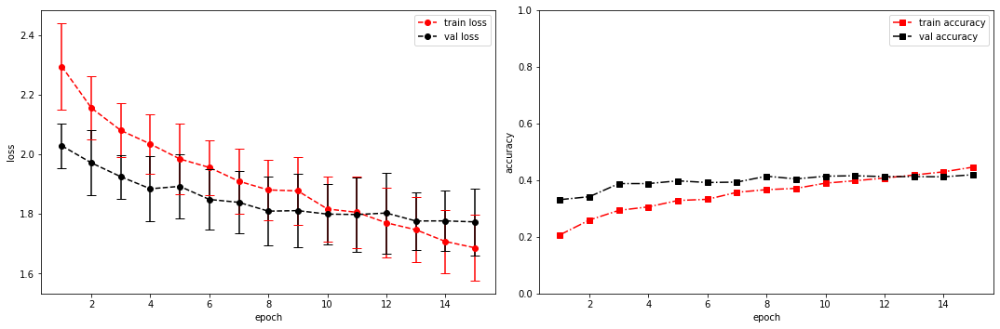

model saved


training epoch:  15
model set to train
Epoch [16/100], step [1/84],  Loss: 1.5400 +/- 0.0000,  accuracy: 0.0302734375, time elapsed = 0.24479889869689941s
Epoch [16/100], step [17/84],  Loss: 1.6612 +/- 0.0844,  accuracy: 0.4443359375, time elapsed = 0.8516254425048828s
Epoch [16/100], step [33/84],  Loss: 1.6545 +/- 0.1170,  accuracy: 0.4541015625, time elapsed = 0.8412184715270996s
Epoch [16/100], step [49/84],  Loss: 1.7111 +/- 0.1355,  accuracy: 0.42578125, time elapsed = 0.8274941444396973s
Epoch [16/100], step [65/84],  Loss: 1.6246 +/- 0.1382,  accuracy: 0.46484375, time elapsed = 0.8460052013397217s
Epoch [16/100], step [81/84],  Loss: 1.6523 +/- 0.1299,  accuracy: 0.4443359375, time elapsed = 0.8411734104156494s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4443408539996271,  precision = 0.4443408539996271 recall = 0.4443408539996271 f1 = 0.4443408539996271 ::: val: acc = 0.4407158836689038,  precision = 0.4407158836689038 recall = 0.4407158836689038 ti

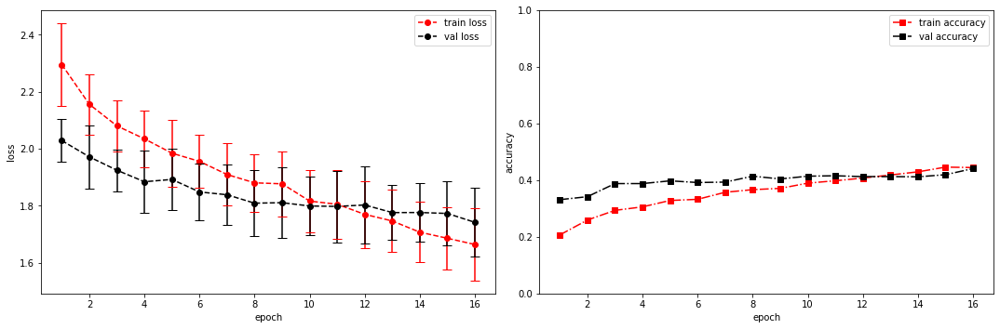

model saved


training epoch:  16
model set to train
Epoch [17/100], step [1/84],  Loss: 1.4357 +/- 0.0000,  accuracy: 0.0361328125, time elapsed = 0.24643468856811523s
Epoch [17/100], step [17/84],  Loss: 1.5819 +/- 0.1244,  accuracy: 0.47265625, time elapsed = 2.183778762817383s
Epoch [17/100], step [33/84],  Loss: 1.6296 +/- 0.1182,  accuracy: 0.486328125, time elapsed = 0.8202729225158691s
Epoch [17/100], step [49/84],  Loss: 1.5884 +/- 0.0909,  accuracy: 0.47265625, time elapsed = 1.9345195293426514s
Epoch [17/100], step [65/84],  Loss: 1.6693 +/- 0.1085,  accuracy: 0.4541015625, time elapsed = 0.8525509834289551s
Epoch [17/100], step [81/84],  Loss: 1.6326 +/- 0.1499,  accuracy: 0.4501953125, time elapsed = 0.8279316425323486s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4700727204922618,  precision = 0.4700727204922618 recall = 0.4700727204922618 f1 = 0.4700727204922618 ::: val: acc = 0.41759880686055184,  precision = 0.41759880686055184 recall = 0.41759880686055184 t

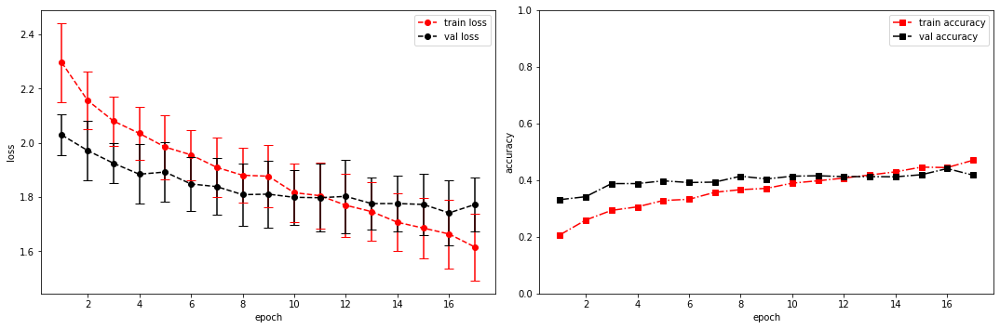

model saved


training epoch:  17
model set to train
Epoch [18/100], step [1/84],  Loss: 1.4820 +/- 0.0000,  accuracy: 0.0322265625, time elapsed = 0.2367551326751709s
Epoch [18/100], step [17/84],  Loss: 1.5732 +/- 0.1170,  accuracy: 0.4912109375, time elapsed = 0.8341672420501709s
Epoch [18/100], step [33/84],  Loss: 1.6001 +/- 0.1230,  accuracy: 0.4755859375, time elapsed = 0.8432090282440186s
Epoch [18/100], step [49/84],  Loss: 1.5934 +/- 0.1217,  accuracy: 0.4736328125, time elapsed = 0.8970992565155029s
Epoch [18/100], step [65/84],  Loss: 1.6201 +/- 0.1257,  accuracy: 0.451171875, time elapsed = 0.8461968898773193s
Epoch [18/100], step [81/84],  Loss: 1.5834 +/- 0.0960,  accuracy: 0.4912109375, time elapsed = 0.8358962535858154s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.47846354652246875,  precision = 0.47846354652246875 recall = 0.47846354652246875 f1 = 0.47846354652246875 ::: val: acc = 0.4064131245339299,  precision = 0.4064131245339299 recall = 0.4064131245339

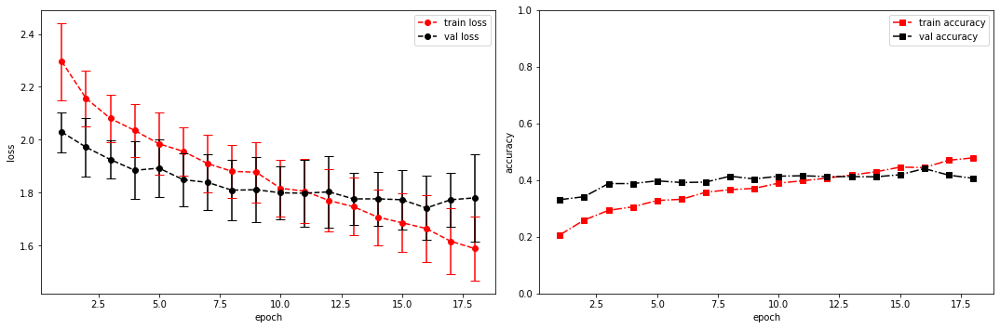

model saved


training epoch:  18
model set to train
Epoch [19/100], step [1/84],  Loss: 1.6662 +/- 0.0000,  accuracy: 0.0263671875, time elapsed = 0.24850773811340332s
Epoch [19/100], step [17/84],  Loss: 1.5404 +/- 0.1149,  accuracy: 0.5166015625, time elapsed = 0.8595542907714844s
Epoch [19/100], step [33/84],  Loss: 1.5524 +/- 0.1126,  accuracy: 0.482421875, time elapsed = 0.8427624702453613s
Epoch [19/100], step [49/84],  Loss: 1.5444 +/- 0.0961,  accuracy: 0.501953125, time elapsed = 0.855898380279541s
Epoch [19/100], step [65/84],  Loss: 1.5835 +/- 0.1072,  accuracy: 0.47265625, time elapsed = 0.8422634601593018s
Epoch [19/100], step [81/84],  Loss: 1.6059 +/- 0.1283,  accuracy: 0.462890625, time elapsed = 0.8383307456970215s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4868543725526757,  precision = 0.4868543725526757 recall = 0.4868543725526757 f1 = 0.4868543725526757 ::: val: acc = 0.4250559284116331,  precision = 0.4250559284116331 recall = 0.4250559284116331 time

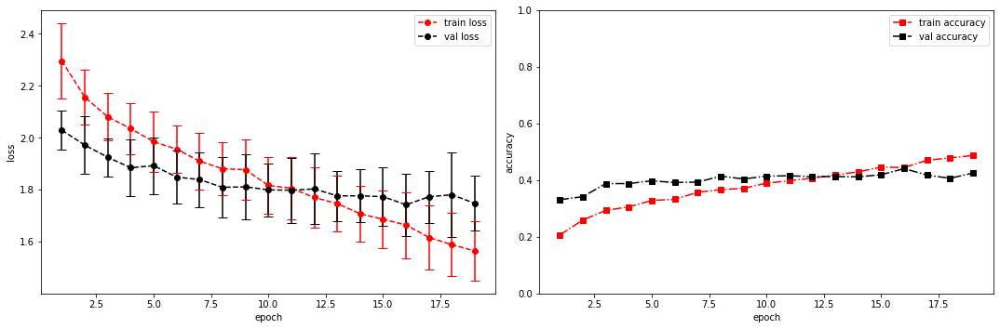

model saved


training epoch:  19
model set to train
Epoch [20/100], step [1/84],  Loss: 1.6141 +/- 0.0000,  accuracy: 0.025390625, time elapsed = 0.24645256996154785s
Epoch [20/100], step [17/84],  Loss: 1.5485 +/- 0.0763,  accuracy: 0.484375, time elapsed = 0.8560421466827393s
Epoch [20/100], step [33/84],  Loss: 1.5241 +/- 0.0891,  accuracy: 0.4794921875, time elapsed = 0.8445925712585449s
Epoch [20/100], step [49/84],  Loss: 1.6459 +/- 0.1139,  accuracy: 0.4580078125, time elapsed = 0.8434722423553467s
Epoch [20/100], step [65/84],  Loss: 1.5287 +/- 0.1292,  accuracy: 0.5205078125, time elapsed = 0.833899736404419s
Epoch [20/100], step [81/84],  Loss: 1.5477 +/- 0.0951,  accuracy: 0.4755859375, time elapsed = 0.8321628570556641s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.48200633973522283,  precision = 0.48200633973522283 recall = 0.48200633973522283 f1 = 0.48200633973522283 ::: val: acc = 0.4168530947054437,  precision = 0.4168530947054437 recall = 0.4168530947054437 

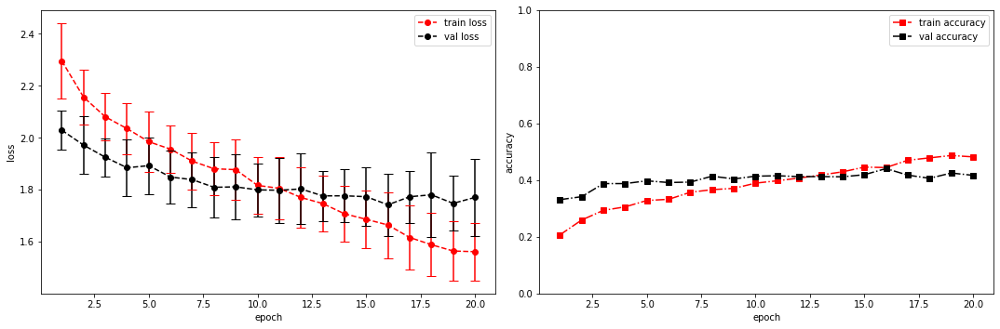

model saved


training epoch:  20
model set to train
Epoch [21/100], step [1/84],  Loss: 1.3520 +/- 0.0000,  accuracy: 0.0390625, time elapsed = 0.24919986724853516s
Epoch [21/100], step [17/84],  Loss: 1.4967 +/- 0.1198,  accuracy: 0.5087890625, time elapsed = 0.8399665355682373s
Epoch [21/100], step [33/84],  Loss: 1.5056 +/- 0.1143,  accuracy: 0.5244140625, time elapsed = 0.8412089347839355s
Epoch [21/100], step [49/84],  Loss: 1.4815 +/- 0.1215,  accuracy: 0.5087890625, time elapsed = 0.8409295082092285s
Epoch [21/100], step [65/84],  Loss: 1.4566 +/- 0.1259,  accuracy: 0.5419921875, time elapsed = 0.828801155090332s
Epoch [21/100], step [81/84],  Loss: 1.5442 +/- 0.0909,  accuracy: 0.5, time elapsed = 0.8481347560882568s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5172478090620921,  precision = 0.5172478090620921 recall = 0.5172478090620921 f1 = 0.5172478090620921 ::: val: acc = 0.41312453392990306,  precision = 0.41312453392990306 recall = 0.41312453392990306 time ela

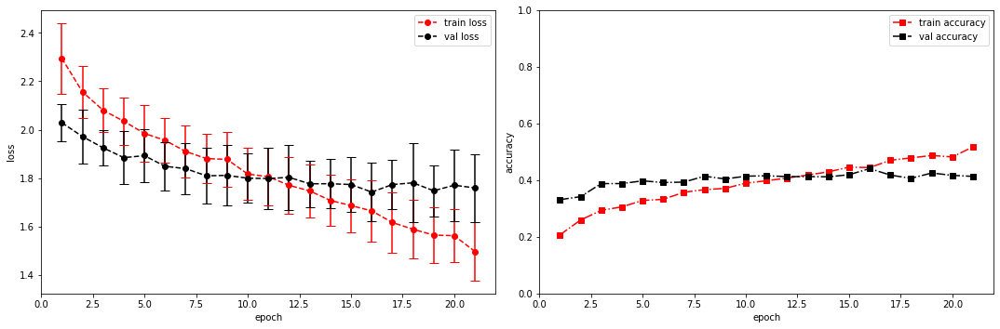

model saved


training epoch:  21
model set to train
Epoch [22/100], step [1/84],  Loss: 1.2324 +/- 0.0000,  accuracy: 0.0419921875, time elapsed = 0.24266290664672852s
Epoch [22/100], step [17/84],  Loss: 1.4060 +/- 0.1129,  accuracy: 0.55078125, time elapsed = 0.8539896011352539s
Epoch [22/100], step [33/84],  Loss: 1.4553 +/- 0.1201,  accuracy: 0.5302734375, time elapsed = 0.8486168384552002s
Epoch [22/100], step [49/84],  Loss: 1.4802 +/- 0.1019,  accuracy: 0.525390625, time elapsed = 0.8384485244750977s
Epoch [22/100], step [65/84],  Loss: 1.5016 +/- 0.1462,  accuracy: 0.498046875, time elapsed = 0.8643712997436523s
Epoch [22/100], step [81/84],  Loss: 1.4319 +/- 0.0988,  accuracy: 0.5458984375, time elapsed = 0.8415312767028809s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5306731307104233,  precision = 0.5306731307104233 recall = 0.5306731307104233 f1 = 0.5306731307104233 ::: val: acc = 0.4198359433258762,  precision = 0.4198359433258762 recall = 0.4198359433258762 ti

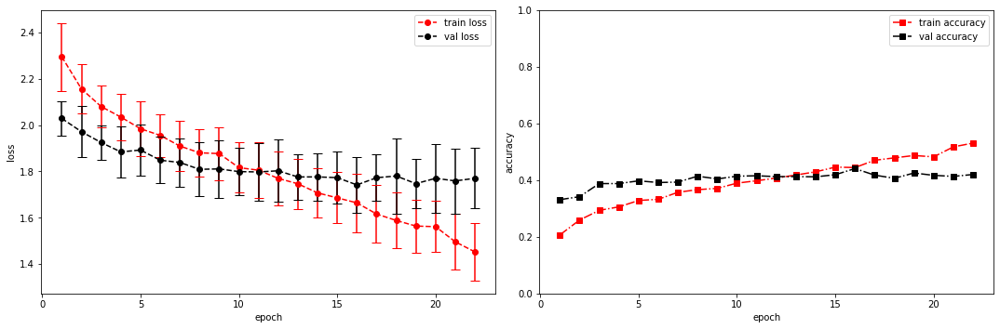

model saved
stopping early
Conv_1_layer
(1, 13, 517)
running model: id = Conv_1_layer, channels = [32]
device:  cuda
dataset metadata:  {'n_fft': 2048, 'hop_length': 256, 'n_mfcc': 13, 'notes': 'optional notes not passed'}
train model: data loaders initialized
sample shape =  (1, 13, 517)
model loaded
Layer (type:depth-idx)                   Output Shape              Param #
├─ConvBlock: 1-1                         [-1, 32, 13, 52]          --
|    └─Sequential: 2-1                   [-1, 32, 13, 52]          --
|    |    └─Conv2d: 3-1                  [-1, 32, 13, 517]         320
|    |    └─ReLU: 3-2                    [-1, 32, 13, 517]         --
|    |    └─MaxPool2d: 3-3               [-1, 32, 13, 52]          --
|    |    └─BatchNorm2d: 3-4             [-1, 32, 13, 52]          64
├─LinearBlock: 1-2                       [-1, 128]                 --
|    └─Sequential: 2-2                   [-1, 128]                 --
|    |    └─Linear: 3-5                  [-1, 128]           

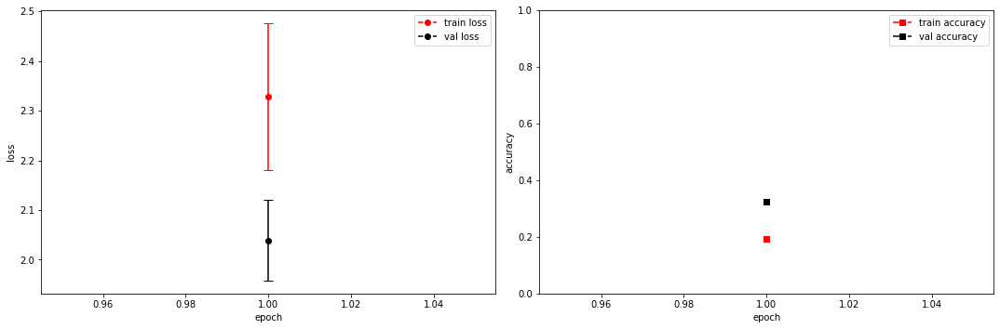

model saved


training epoch:  1
model set to train
Epoch [2/100], step [1/84],  Loss: 2.1921 +/- 0.0000,  accuracy: 0.015625, time elapsed = 0.24654650688171387s
Epoch [2/100], step [17/84],  Loss: 2.2276 +/- 0.1105,  accuracy: 0.23828125, time elapsed = 0.8476102352142334s
Epoch [2/100], step [33/84],  Loss: 2.1733 +/- 0.0827,  accuracy: 0.2568359375, time elapsed = 0.8266403675079346s
Epoch [2/100], step [49/84],  Loss: 2.1155 +/- 0.1052,  accuracy: 0.279296875, time elapsed = 0.8358244895935059s
Epoch [2/100], step [65/84],  Loss: 2.1496 +/- 0.1271,  accuracy: 0.2529296875, time elapsed = 0.8470888137817383s
Epoch [2/100], step [81/84],  Loss: 2.1298 +/- 0.0784,  accuracy: 0.271484375, time elapsed = 0.8986883163452148s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.2608614581391013,  precision = 0.2608614581391013 recall = 0.2608614581391013 f1 = 0.2608614581391013 ::: val: acc = 0.3452647278150634,  precision = 0.3452647278150634 recall = 0.3452647278150634 time elapsed 

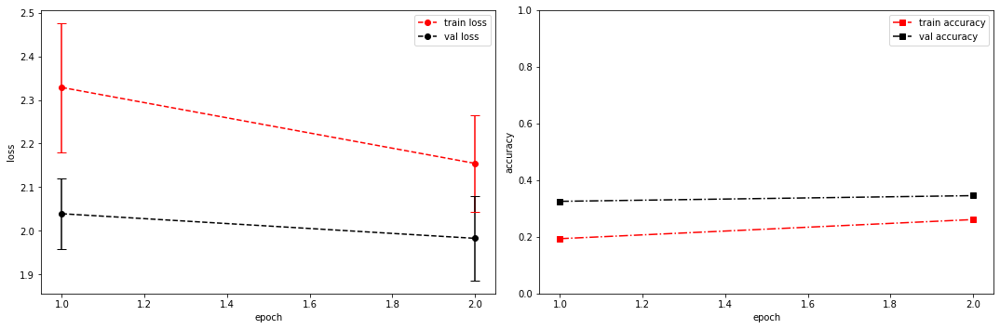

model saved


training epoch:  2
model set to train
Epoch [3/100], step [1/84],  Loss: 2.1123 +/- 0.0000,  accuracy: 0.0166015625, time elapsed = 0.25745511054992676s
Epoch [3/100], step [17/84],  Loss: 2.1137 +/- 0.1020,  accuracy: 0.2802734375, time elapsed = 0.8690376281738281s
Epoch [3/100], step [33/84],  Loss: 2.0998 +/- 0.1090,  accuracy: 0.2880859375, time elapsed = 0.8587646484375s
Epoch [3/100], step [49/84],  Loss: 2.1117 +/- 0.1410,  accuracy: 0.271484375, time elapsed = 0.86849045753479s
Epoch [3/100], step [65/84],  Loss: 2.0325 +/- 0.0854,  accuracy: 0.3076171875, time elapsed = 0.8626511096954346s
Epoch [3/100], step [81/84],  Loss: 2.0468 +/- 0.1080,  accuracy: 0.2861328125, time elapsed = 0.8461651802062988s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.2858474734290509,  precision = 0.2858474734290509 recall = 0.2858474734290509 f1 = 0.2858474734290509 ::: val: acc = 0.35197613721103654,  precision = 0.35197613721103654 recall = 0.35197613721103654 time ela

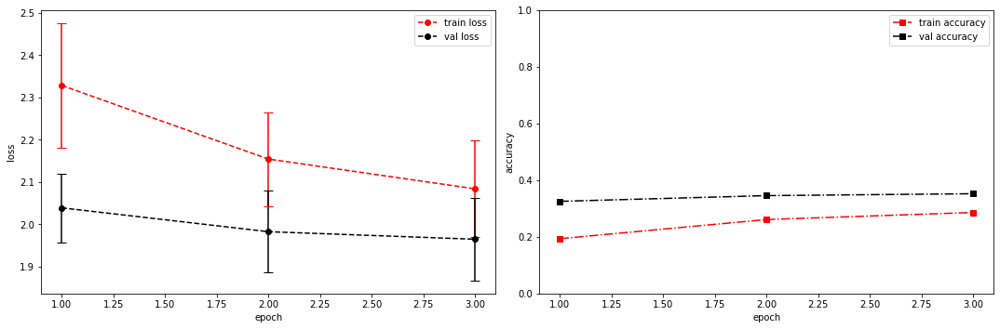

model saved


training epoch:  3
model set to train
Epoch [4/100], step [1/84],  Loss: 2.0135 +/- 0.0000,  accuracy: 0.0205078125, time elapsed = 0.25102734565734863s
Epoch [4/100], step [17/84],  Loss: 2.0500 +/- 0.1061,  accuracy: 0.2919921875, time elapsed = 0.8884296417236328s
Epoch [4/100], step [33/84],  Loss: 2.0602 +/- 0.1057,  accuracy: 0.3037109375, time elapsed = 0.8603959083557129s
Epoch [4/100], step [49/84],  Loss: 2.0633 +/- 0.0983,  accuracy: 0.298828125, time elapsed = 0.8419651985168457s
Epoch [4/100], step [65/84],  Loss: 2.0426 +/- 0.0994,  accuracy: 0.28515625, time elapsed = 0.8524887561798096s
Epoch [4/100], step [81/84],  Loss: 2.0229 +/- 0.0737,  accuracy: 0.3017578125, time elapsed = 0.8703887462615967s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.2974081670706694,  precision = 0.2974081670706694 recall = 0.2974081670706694 f1 = 0.2974081670706694 ::: val: acc = 0.3616703952274422,  precision = 0.3616703952274422 recall = 0.3616703952274422 time ela

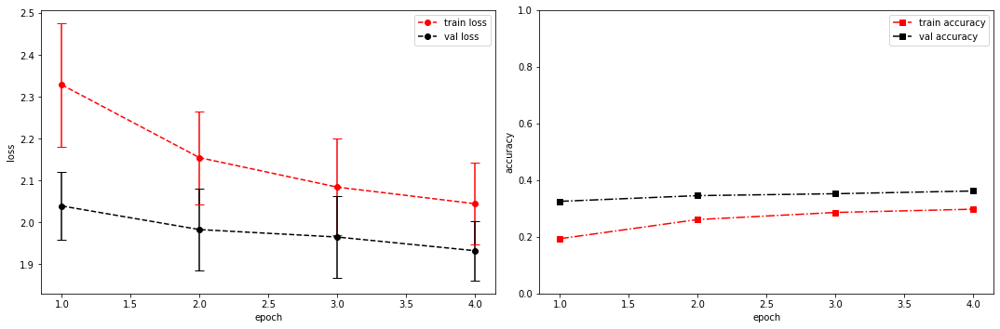

model saved


training epoch:  4
model set to train
Epoch [5/100], step [1/84],  Loss: 2.1369 +/- 0.0000,  accuracy: 0.0107421875, time elapsed = 0.24079155921936035s
Epoch [5/100], step [17/84],  Loss: 2.0293 +/- 0.0828,  accuracy: 0.3134765625, time elapsed = 0.8655281066894531s
Epoch [5/100], step [33/84],  Loss: 2.0006 +/- 0.0911,  accuracy: 0.2998046875, time elapsed = 0.8432135581970215s
Epoch [5/100], step [49/84],  Loss: 1.9810 +/- 0.1056,  accuracy: 0.3349609375, time elapsed = 0.8470144271850586s
Epoch [5/100], step [65/84],  Loss: 2.0170 +/- 0.0742,  accuracy: 0.3046875, time elapsed = 0.8232831954956055s
Epoch [5/100], step [81/84],  Loss: 1.9921 +/- 0.1106,  accuracy: 0.31640625, time elapsed = 0.8618745803833008s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3115793399216856,  precision = 0.3115793399216856 recall = 0.3115793399216856 f1 = 0.3115793399216856 ::: val: acc = 0.36017897091722595,  precision = 0.36017897091722595 recall = 0.36017897091722595 time el

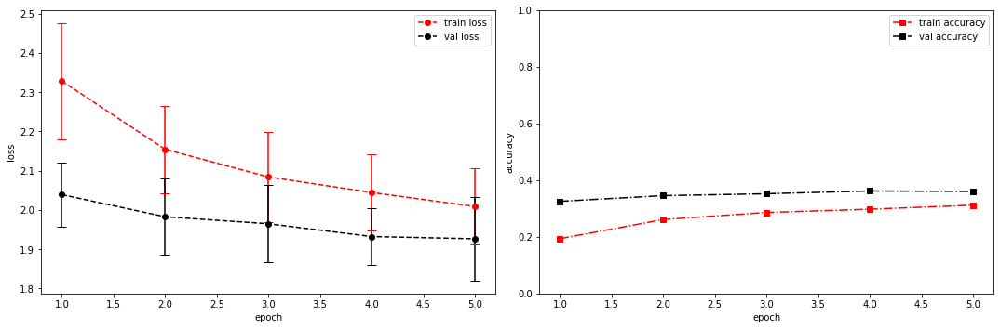

model saved


training epoch:  5
model set to train
Epoch [6/100], step [1/84],  Loss: 1.9961 +/- 0.0000,  accuracy: 0.01953125, time elapsed = 0.2407522201538086s
Epoch [6/100], step [17/84],  Loss: 2.0088 +/- 0.0909,  accuracy: 0.3134765625, time elapsed = 0.8571858406066895s
Epoch [6/100], step [33/84],  Loss: 1.9566 +/- 0.1094,  accuracy: 0.3203125, time elapsed = 0.8460121154785156s
Epoch [6/100], step [49/84],  Loss: 2.0100 +/- 0.1272,  accuracy: 0.3095703125, time elapsed = 0.850820779800415s
Epoch [6/100], step [65/84],  Loss: 1.9902 +/- 0.1093,  accuracy: 0.3056640625, time elapsed = 0.8432602882385254s
Epoch [6/100], step [81/84],  Loss: 1.9398 +/- 0.1226,  accuracy: 0.3408203125, time elapsed = 0.836529016494751s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.31866492634719373,  precision = 0.31866492634719373 recall = 0.31866492634719373 f1 = 0.31866492634719373 ::: val: acc = 0.36316181953765847,  precision = 0.36316181953765847 recall = 0.36316181953765847 time e

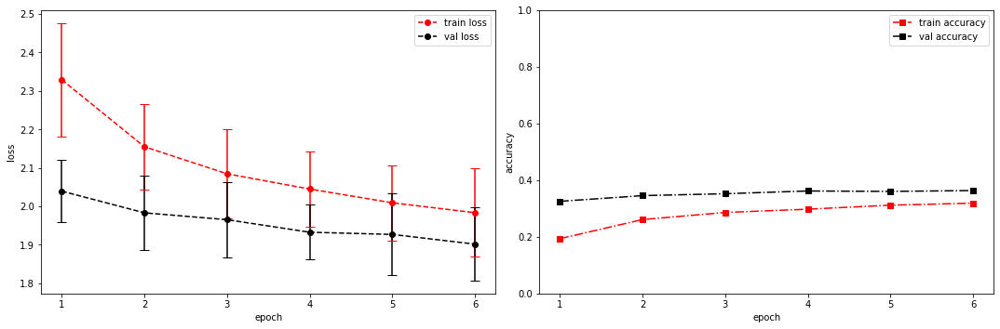

model saved


training epoch:  6
model set to train
Epoch [7/100], step [1/84],  Loss: 1.8689 +/- 0.0000,  accuracy: 0.021484375, time elapsed = 0.25479817390441895s
Epoch [7/100], step [17/84],  Loss: 1.9575 +/- 0.0904,  accuracy: 0.33984375, time elapsed = 0.8700916767120361s
Epoch [7/100], step [33/84],  Loss: 1.9227 +/- 0.0609,  accuracy: 0.357421875, time elapsed = 0.8537857532501221s
Epoch [7/100], step [49/84],  Loss: 1.9759 +/- 0.1091,  accuracy: 0.3359375, time elapsed = 0.8550457954406738s
Epoch [7/100], step [65/84],  Loss: 1.9274 +/- 0.0867,  accuracy: 0.3525390625, time elapsed = 0.8565728664398193s
Epoch [7/100], step [81/84],  Loss: 1.9720 +/- 0.1188,  accuracy: 0.3173828125, time elapsed = 0.8329036235809326s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.33992168562371805,  precision = 0.33992168562371805 recall = 0.33992168562371805 f1 = 0.33992168562371805 ::: val: acc = 0.3542132736763609,  precision = 0.3542132736763609 recall = 0.3542132736763609 time ela

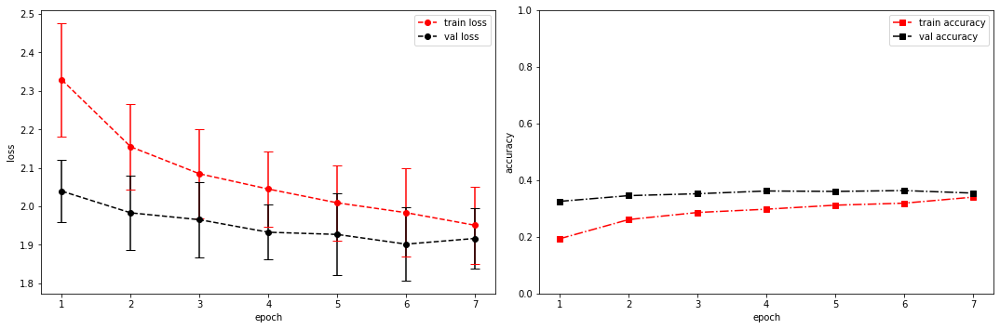

model saved


training epoch:  7
model set to train
Epoch [8/100], step [1/84],  Loss: 2.0368 +/- 0.0000,  accuracy: 0.0205078125, time elapsed = 0.24945616722106934s
Epoch [8/100], step [17/84],  Loss: 1.9463 +/- 0.0967,  accuracy: 0.3369140625, time elapsed = 0.8991386890411377s
Epoch [8/100], step [33/84],  Loss: 1.9543 +/- 0.1203,  accuracy: 0.341796875, time elapsed = 0.8390662670135498s
Epoch [8/100], step [49/84],  Loss: 1.9138 +/- 0.1254,  accuracy: 0.3447265625, time elapsed = 0.8499746322631836s
Epoch [8/100], step [65/84],  Loss: 1.9148 +/- 0.1244,  accuracy: 0.3486328125, time elapsed = 0.8434131145477295s
Epoch [8/100], step [81/84],  Loss: 1.9574 +/- 0.1123,  accuracy: 0.3388671875, time elapsed = 0.8313002586364746s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3423457020324445,  precision = 0.3423457020324445 recall = 0.3423457020324445 f1 = 0.3423457020324445 ::: val: acc = 0.372110365398956,  precision = 0.372110365398956 recall = 0.372110365398956 time elap

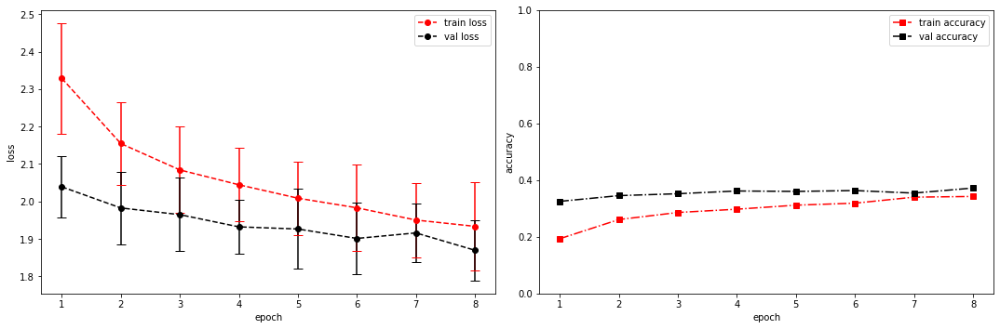

model saved


training epoch:  8
model set to train
Epoch [9/100], step [1/84],  Loss: 2.1017 +/- 0.0000,  accuracy: 0.015625, time elapsed = 0.2492380142211914s
Epoch [9/100], step [17/84],  Loss: 1.9022 +/- 0.0863,  accuracy: 0.3505859375, time elapsed = 0.849999189376831s
Epoch [9/100], step [33/84],  Loss: 1.9175 +/- 0.1326,  accuracy: 0.3408203125, time elapsed = 0.8650503158569336s
Epoch [9/100], step [49/84],  Loss: 1.8779 +/- 0.0853,  accuracy: 0.3681640625, time elapsed = 0.9556276798248291s
Epoch [9/100], step [65/84],  Loss: 1.8962 +/- 0.0735,  accuracy: 0.3623046875, time elapsed = 0.8649308681488037s
Epoch [9/100], step [81/84],  Loss: 1.8923 +/- 0.1160,  accuracy: 0.3486328125, time elapsed = 0.8490819931030273s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3512959164646653,  precision = 0.3512959164646653 recall = 0.3512959164646653 f1 = 0.3512959164646653 ::: val: acc = 0.37583892617449666,  precision = 0.37583892617449666 recall = 0.37583892617449666 time ela

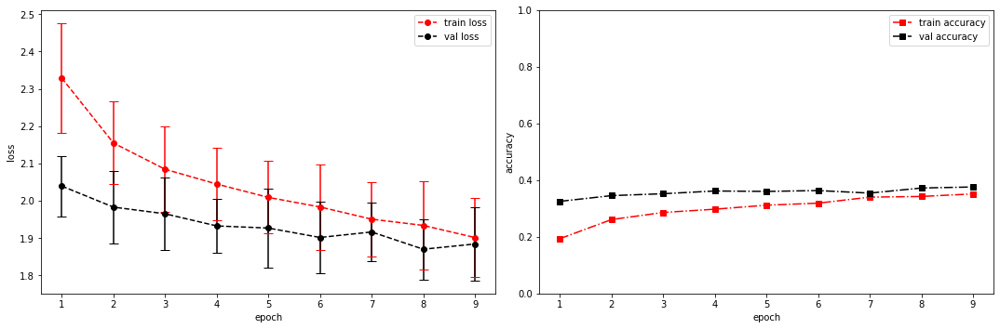

model saved


training epoch:  9
model set to train
Epoch [10/100], step [1/84],  Loss: 1.9870 +/- 0.0000,  accuracy: 0.0185546875, time elapsed = 0.2461855411529541s
Epoch [10/100], step [17/84],  Loss: 1.8807 +/- 0.0536,  accuracy: 0.3525390625, time elapsed = 0.8691637516021729s
Epoch [10/100], step [33/84],  Loss: 1.8617 +/- 0.1097,  accuracy: 0.375, time elapsed = 0.839484453201294s
Epoch [10/100], step [49/84],  Loss: 1.8480 +/- 0.1057,  accuracy: 0.4013671875, time elapsed = 0.8490772247314453s
Epoch [10/100], step [65/84],  Loss: 1.8444 +/- 0.1032,  accuracy: 0.357421875, time elapsed = 0.8376514911651611s
Epoch [10/100], step [81/84],  Loss: 1.8299 +/- 0.1525,  accuracy: 0.376953125, time elapsed = 0.8422539234161377s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.37087451053514825,  precision = 0.37087451053514825 recall = 0.37087451053514825 f1 = 0.37087451053514825 ::: val: acc = 0.38926174496644295,  precision = 0.38926174496644295 recall = 0.38926174496644295 tim

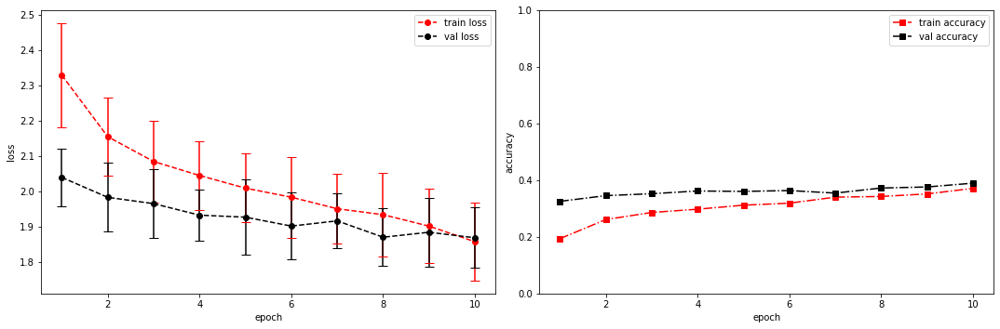

model saved


training epoch:  10
model set to train
Epoch [11/100], step [1/84],  Loss: 1.6606 +/- 0.0000,  accuracy: 0.0283203125, time elapsed = 0.25322747230529785s
Epoch [11/100], step [17/84],  Loss: 1.8670 +/- 0.1057,  accuracy: 0.3740234375, time elapsed = 0.8645269870758057s
Epoch [11/100], step [33/84],  Loss: 1.8297 +/- 0.1102,  accuracy: 0.37890625, time elapsed = 0.8572506904602051s
Epoch [11/100], step [49/84],  Loss: 1.8619 +/- 0.1041,  accuracy: 0.3662109375, time elapsed = 0.8567721843719482s
Epoch [11/100], step [65/84],  Loss: 1.8554 +/- 0.0872,  accuracy: 0.388671875, time elapsed = 0.8466470241546631s
Epoch [11/100], step [81/84],  Loss: 1.7811 +/- 0.0880,  accuracy: 0.404296875, time elapsed = 0.8718535900115967s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.38336751818012305,  precision = 0.38336751818012305 recall = 0.38336751818012305 f1 = 0.38336751818012305 ::: val: acc = 0.39448173005219983,  precision = 0.39448173005219983 recall = 0.3944817300521

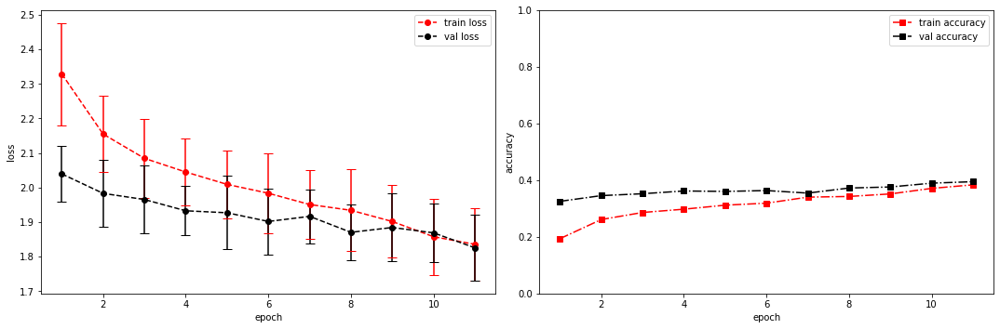

model saved


training epoch:  11
model set to train
Epoch [12/100], step [1/84],  Loss: 1.8804 +/- 0.0000,  accuracy: 0.0224609375, time elapsed = 0.25060439109802246s
Epoch [12/100], step [17/84],  Loss: 1.7763 +/- 0.0994,  accuracy: 0.412109375, time elapsed = 0.861811637878418s
Epoch [12/100], step [33/84],  Loss: 1.7415 +/- 0.1286,  accuracy: 0.4091796875, time elapsed = 0.8748486042022705s
Epoch [12/100], step [49/84],  Loss: 1.7840 +/- 0.1111,  accuracy: 0.3837890625, time elapsed = 0.8543264865875244s
Epoch [12/100], step [65/84],  Loss: 1.7440 +/- 0.1113,  accuracy: 0.4228515625, time elapsed = 0.8518357276916504s
Epoch [12/100], step [81/84],  Loss: 1.8054 +/- 0.1197,  accuracy: 0.3857421875, time elapsed = 0.8687655925750732s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4008950214432221,  precision = 0.4008950214432221 recall = 0.4008950214432221 f1 = 0.4008950214432221 ::: val: acc = 0.37658463832960476,  precision = 0.37658463832960476 recall = 0.376584638329604

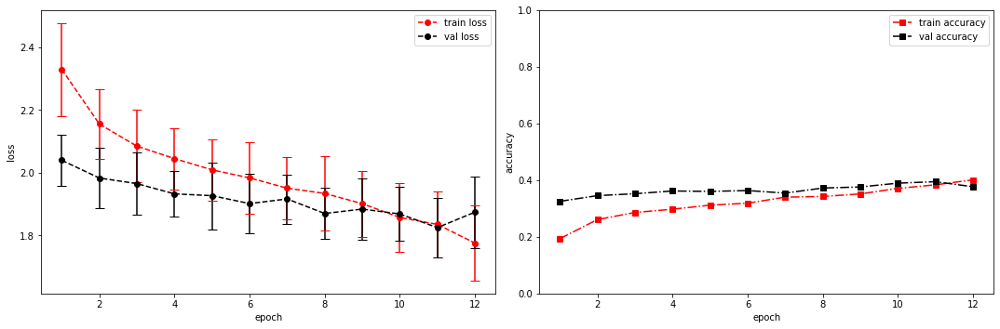

model saved


training epoch:  12
model set to train
Epoch [13/100], step [1/84],  Loss: 1.7311 +/- 0.0000,  accuracy: 0.0234375, time elapsed = 0.25038862228393555s
Epoch [13/100], step [17/84],  Loss: 1.7944 +/- 0.0967,  accuracy: 0.384765625, time elapsed = 0.8345739841461182s
Epoch [13/100], step [33/84],  Loss: 1.7989 +/- 0.1254,  accuracy: 0.3857421875, time elapsed = 0.8631606101989746s
Epoch [13/100], step [49/84],  Loss: 1.7972 +/- 0.0716,  accuracy: 0.3828125, time elapsed = 0.8469107151031494s
Epoch [13/100], step [65/84],  Loss: 1.7588 +/- 0.0645,  accuracy: 0.4091796875, time elapsed = 0.850024938583374s
Epoch [13/100], step [81/84],  Loss: 1.7727 +/- 0.0831,  accuracy: 0.388671875, time elapsed = 0.8409056663513184s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.39101249300764496,  precision = 0.39101249300764496 recall = 0.39101249300764496 f1 = 0.39101249300764496 ::: val: acc = 0.37583892617449666,  precision = 0.37583892617449666 recall = 0.37583892617449666 

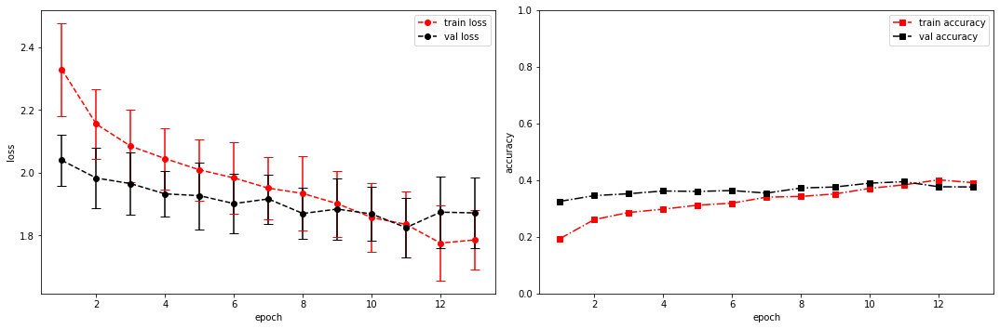

model saved


training epoch:  13
model set to train
Epoch [14/100], step [1/84],  Loss: 1.8252 +/- 0.0000,  accuracy: 0.025390625, time elapsed = 0.24622821807861328s
Epoch [14/100], step [17/84],  Loss: 1.7305 +/- 0.1158,  accuracy: 0.4189453125, time elapsed = 0.8554177284240723s
Epoch [14/100], step [33/84],  Loss: 1.7275 +/- 0.1066,  accuracy: 0.4111328125, time elapsed = 0.8631758689880371s
Epoch [14/100], step [49/84],  Loss: 1.7005 +/- 0.0824,  accuracy: 0.44140625, time elapsed = 0.8366835117340088s
Epoch [14/100], step [65/84],  Loss: 1.7594 +/- 0.1155,  accuracy: 0.40625, time elapsed = 0.8404185771942139s
Epoch [14/100], step [81/84],  Loss: 1.7797 +/- 0.1128,  accuracy: 0.388671875, time elapsed = 0.8349614143371582s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.41581204549692335,  precision = 0.41581204549692335 recall = 0.41581204549692335 f1 = 0.41581204549692335 ::: val: acc = 0.3743475018642804,  precision = 0.3743475018642804 recall = 0.3743475018642804 tim

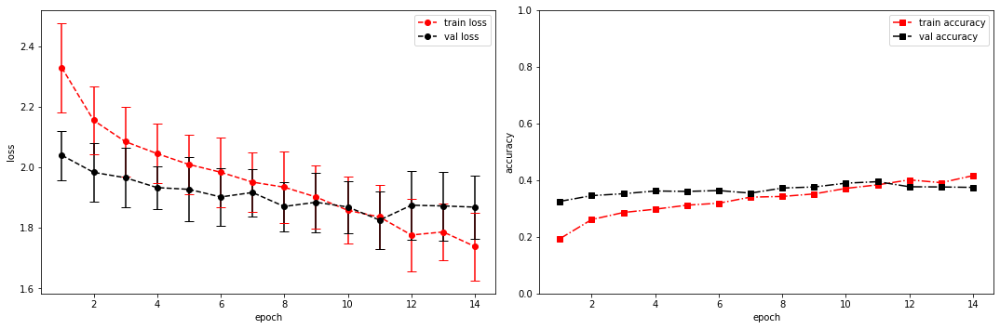

model saved


training epoch:  14
model set to train
Epoch [15/100], step [1/84],  Loss: 1.7062 +/- 0.0000,  accuracy: 0.02734375, time elapsed = 0.25347280502319336s
Epoch [15/100], step [17/84],  Loss: 1.7334 +/- 0.0826,  accuracy: 0.40234375, time elapsed = 0.8701364994049072s
Epoch [15/100], step [33/84],  Loss: 1.6991 +/- 0.1022,  accuracy: 0.4169921875, time elapsed = 0.8490309715270996s
Epoch [15/100], step [49/84],  Loss: 1.6917 +/- 0.1102,  accuracy: 0.43359375, time elapsed = 0.848156213760376s
Epoch [15/100], step [65/84],  Loss: 1.7178 +/- 0.0921,  accuracy: 0.4228515625, time elapsed = 0.8679344654083252s
Epoch [15/100], step [81/84],  Loss: 1.7387 +/- 0.1347,  accuracy: 0.4052734375, time elapsed = 0.8419589996337891s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.41749021070296477,  precision = 0.41749021070296477 recall = 0.41749021070296477 f1 = 0.41749021070296477 ::: val: acc = 0.32736763609246833,  precision = 0.32736763609246833 recall = 0.3273676360924683

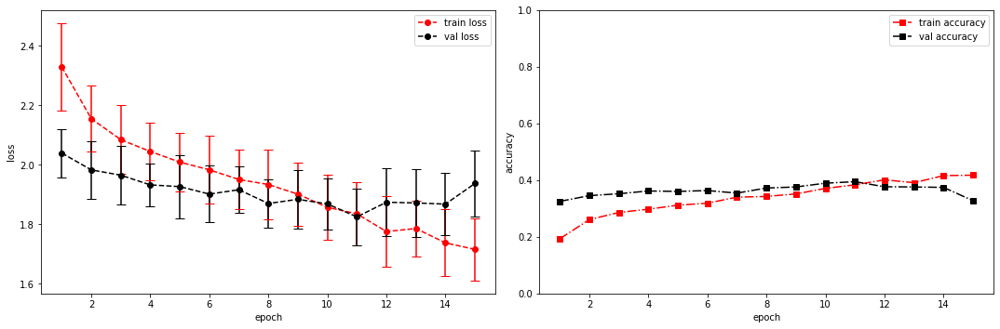

model saved


training epoch:  15
model set to train
Epoch [16/100], step [1/84],  Loss: 1.5089 +/- 0.0000,  accuracy: 0.03125, time elapsed = 0.26365184783935547s
Epoch [16/100], step [17/84],  Loss: 1.6422 +/- 0.1419,  accuracy: 0.46875, time elapsed = 0.8618698120117188s
Epoch [16/100], step [33/84],  Loss: 1.6824 +/- 0.0709,  accuracy: 0.4365234375, time elapsed = 0.849942684173584s
Epoch [16/100], step [49/84],  Loss: 1.6922 +/- 0.1037,  accuracy: 0.4306640625, time elapsed = 0.8469071388244629s
Epoch [16/100], step [65/84],  Loss: 1.7175 +/- 0.1206,  accuracy: 0.43359375, time elapsed = 0.862168550491333s
Epoch [16/100], step [81/84],  Loss: 1.6609 +/- 0.1027,  accuracy: 0.4326171875, time elapsed = 0.8424537181854248s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.440798060786873,  precision = 0.440798060786873 recall = 0.440798060786873 f1 = 0.440798060786873 ::: val: acc = 0.38851603281133484,  precision = 0.38851603281133484 recall = 0.38851603281133484 time elapsed 

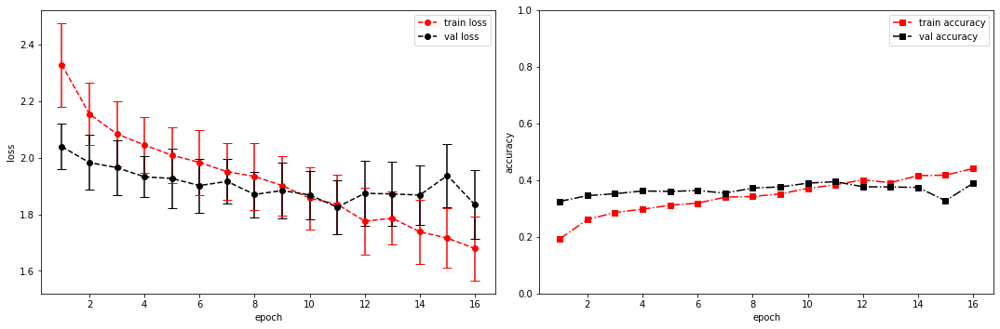

model saved


training epoch:  16
model set to train
Epoch [17/100], step [1/84],  Loss: 1.6270 +/- 0.0000,  accuracy: 0.0302734375, time elapsed = 0.26997923851013184s
Epoch [17/100], step [17/84],  Loss: 1.6579 +/- 0.1020,  accuracy: 0.4453125, time elapsed = 0.9082276821136475s
Epoch [17/100], step [33/84],  Loss: 1.6379 +/- 0.0902,  accuracy: 0.4677734375, time elapsed = 0.8761875629425049s
Epoch [17/100], step [49/84],  Loss: 1.6214 +/- 0.0865,  accuracy: 0.4580078125, time elapsed = 0.8715193271636963s
Epoch [17/100], step [65/84],  Loss: 1.6384 +/- 0.1522,  accuracy: 0.458984375, time elapsed = 0.8597538471221924s
Epoch [17/100], step [81/84],  Loss: 1.6784 +/- 0.1133,  accuracy: 0.443359375, time elapsed = 0.8552093505859375s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.45440984523587546,  precision = 0.45440984523587546 recall = 0.45440984523587546 f1 = 0.45440984523587546 ::: val: acc = 0.3773303504847129,  precision = 0.3773303504847129 recall = 0.3773303504847129

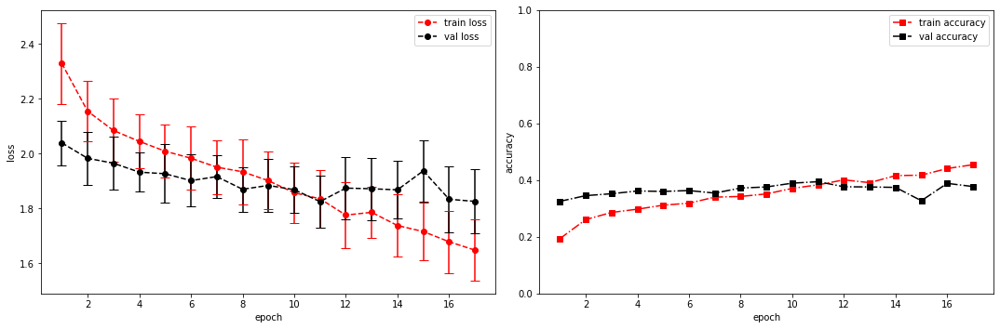

model saved


training epoch:  17
model set to train
Epoch [18/100], step [1/84],  Loss: 1.6090 +/- 0.0000,  accuracy: 0.0283203125, time elapsed = 0.25505876541137695s
Epoch [18/100], step [17/84],  Loss: 1.5897 +/- 0.1062,  accuracy: 0.4697265625, time elapsed = 0.8376944065093994s
Epoch [18/100], step [33/84],  Loss: 1.6290 +/- 0.0843,  accuracy: 0.4384765625, time elapsed = 0.8428916931152344s
Epoch [18/100], step [49/84],  Loss: 1.6072 +/- 0.1234,  accuracy: 0.4599609375, time elapsed = 0.8579800128936768s
Epoch [18/100], step [65/84],  Loss: 1.6059 +/- 0.1167,  accuracy: 0.4501953125, time elapsed = 0.8482539653778076s
Epoch [18/100], step [81/84],  Loss: 1.6013 +/- 0.0886,  accuracy: 0.4716796875, time elapsed = 0.8325819969177246s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.45664739884393063,  precision = 0.45664739884393063 recall = 0.45664739884393063 f1 = 0.45664739884393063 ::: val: acc = 0.3773303504847129,  precision = 0.3773303504847129 recall = 0.37733035048

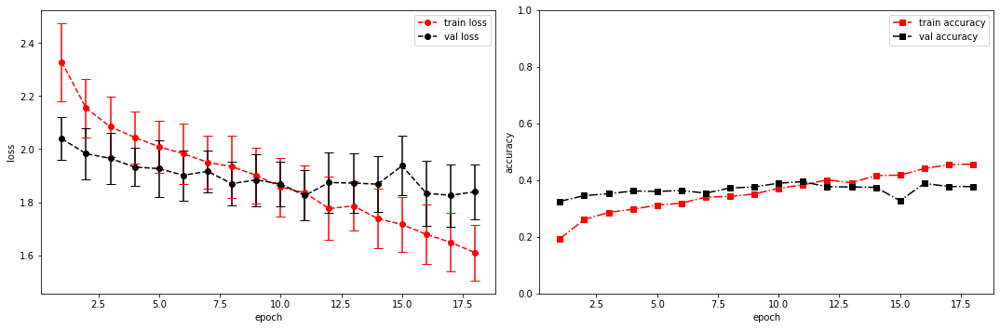

model saved


training epoch:  18
model set to train
Epoch [19/100], step [1/84],  Loss: 1.5902 +/- 0.0000,  accuracy: 0.02734375, time elapsed = 0.2651710510253906s
Epoch [19/100], step [17/84],  Loss: 1.5382 +/- 0.1283,  accuracy: 0.498046875, time elapsed = 0.8302493095397949s
Epoch [19/100], step [33/84],  Loss: 1.5727 +/- 0.0975,  accuracy: 0.486328125, time elapsed = 0.8812065124511719s
Epoch [19/100], step [49/84],  Loss: 1.5926 +/- 0.1142,  accuracy: 0.4873046875, time elapsed = 0.8516509532928467s
Epoch [19/100], step [65/84],  Loss: 1.6194 +/- 0.1463,  accuracy: 0.4541015625, time elapsed = 0.8320930004119873s
Epoch [19/100], step [81/84],  Loss: 1.5804 +/- 0.1200,  accuracy: 0.4765625, time elapsed = 0.8404123783111572s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4816334141338803,  precision = 0.4816334141338803 recall = 0.4816334141338803 f1 = 0.4816334141338803 ::: val: acc = 0.3788217747949292,  precision = 0.3788217747949292 recall = 0.3788217747949292 time e

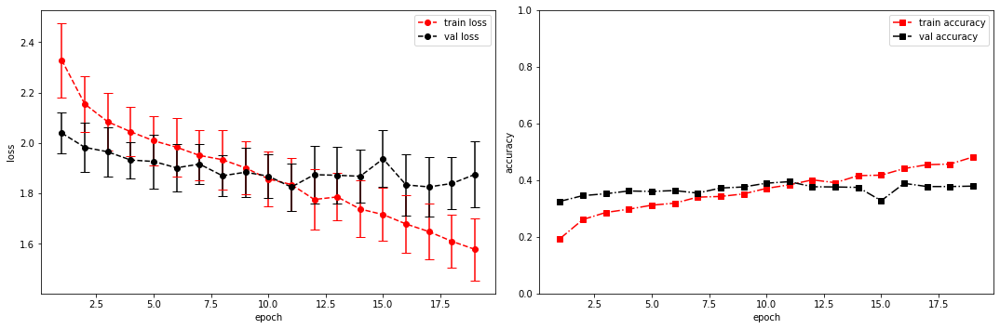

model saved


training epoch:  19
model set to train
Epoch [20/100], step [1/84],  Loss: 1.6671 +/- 0.0000,  accuracy: 0.03125, time elapsed = 0.2489457130432129s
Epoch [20/100], step [17/84],  Loss: 1.5336 +/- 0.0607,  accuracy: 0.5, time elapsed = 0.8830456733703613s
Epoch [20/100], step [33/84],  Loss: 1.4715 +/- 0.1416,  accuracy: 0.52734375, time elapsed = 0.8718996047973633s
Epoch [20/100], step [49/84],  Loss: 1.5236 +/- 0.1246,  accuracy: 0.5078125, time elapsed = 0.8342487812042236s
Epoch [20/100], step [65/84],  Loss: 1.5750 +/- 0.1153,  accuracy: 0.4716796875, time elapsed = 0.8317282199859619s
Epoch [20/100], step [81/84],  Loss: 1.5402 +/- 0.0994,  accuracy: 0.484375, time elapsed = 0.8331124782562256s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4980421405929517,  precision = 0.4980421405929517 recall = 0.4980421405929517 f1 = 0.4980421405929517 ::: val: acc = 0.39671886651752425,  precision = 0.39671886651752425 recall = 0.39671886651752425 time elapsed = 6.08

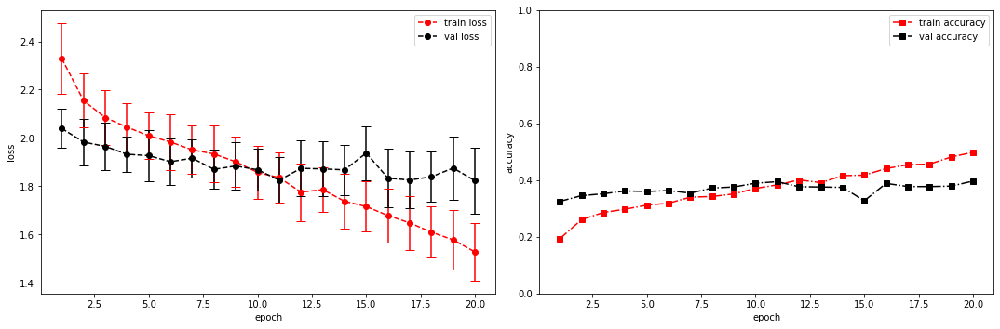

model saved


training epoch:  20
model set to train
Epoch [21/100], step [1/84],  Loss: 1.5872 +/- 0.0000,  accuracy: 0.0283203125, time elapsed = 0.2525928020477295s
Epoch [21/100], step [17/84],  Loss: 1.4990 +/- 0.0890,  accuracy: 0.5078125, time elapsed = 0.8560881614685059s
Epoch [21/100], step [33/84],  Loss: 1.5361 +/- 0.0966,  accuracy: 0.486328125, time elapsed = 0.8378462791442871s
Epoch [21/100], step [49/84],  Loss: 1.5396 +/- 0.1044,  accuracy: 0.490234375, time elapsed = 0.8514118194580078s
Epoch [21/100], step [65/84],  Loss: 1.5039 +/- 0.1381,  accuracy: 0.505859375, time elapsed = 0.843958854675293s
Epoch [21/100], step [81/84],  Loss: 1.4821 +/- 0.1172,  accuracy: 0.517578125, time elapsed = 0.84716796875s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5015849338057058,  precision = 0.5015849338057058 recall = 0.5015849338057058 f1 = 0.5015849338057058 ::: val: acc = 0.3296047725577927,  precision = 0.3296047725577927 recall = 0.3296047725577927 time elapsed

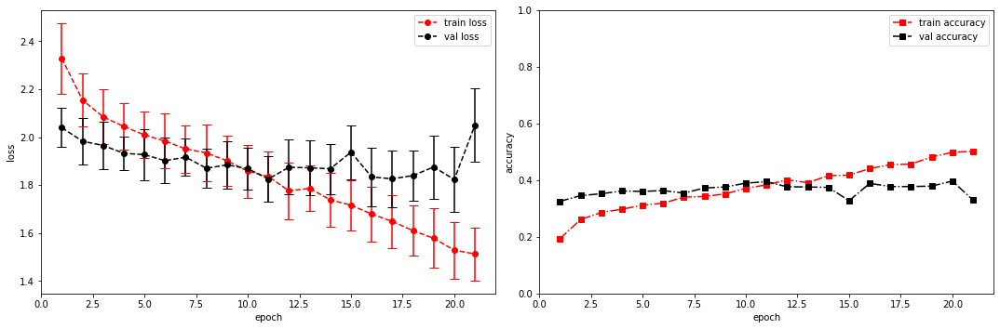

model saved
stopping early
Conv_1_layer
(1, 13, 517)
running model: id = Conv_1_layer, channels = [64]
device:  cuda
dataset metadata:  {'n_fft': 2048, 'hop_length': 256, 'n_mfcc': 13, 'notes': 'optional notes not passed'}
train model: data loaders initialized
sample shape =  (1, 13, 517)
model loaded
Layer (type:depth-idx)                   Output Shape              Param #
├─ConvBlock: 1-1                         [-1, 64, 13, 52]          --
|    └─Sequential: 2-1                   [-1, 64, 13, 52]          --
|    |    └─Conv2d: 3-1                  [-1, 64, 13, 517]         640
|    |    └─ReLU: 3-2                    [-1, 64, 13, 517]         --
|    |    └─MaxPool2d: 3-3               [-1, 64, 13, 52]          --
|    |    └─BatchNorm2d: 3-4             [-1, 64, 13, 52]          128
├─LinearBlock: 1-2                       [-1, 128]                 --
|    └─Sequential: 2-2                   [-1, 128]                 --
|    |    └─Linear: 3-5                  [-1, 128]          

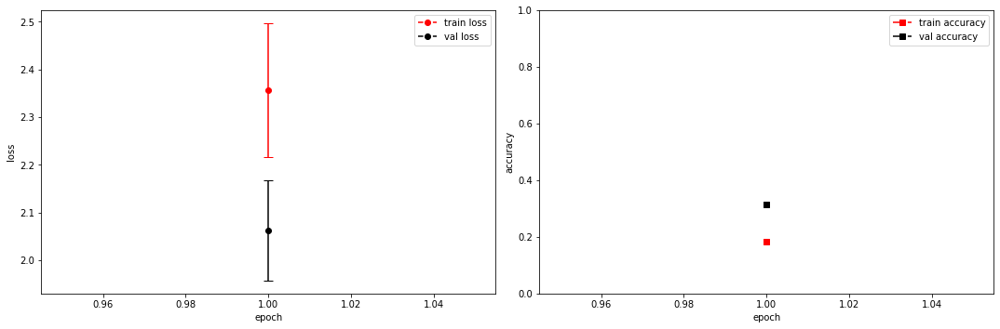

model saved


training epoch:  1
model set to train
Epoch [2/100], step [1/84],  Loss: 2.3450 +/- 0.0000,  accuracy: 0.0146484375, time elapsed = 0.2639768123626709s
Epoch [2/100], step [17/84],  Loss: 2.2187 +/- 0.0991,  accuracy: 0.2294921875, time elapsed = 0.8639161586761475s
Epoch [2/100], step [33/84],  Loss: 2.1992 +/- 0.1111,  accuracy: 0.2451171875, time elapsed = 0.8403615951538086s
Epoch [2/100], step [49/84],  Loss: 2.2080 +/- 0.1081,  accuracy: 0.25, time elapsed = 0.8904304504394531s
Epoch [2/100], step [65/84],  Loss: 2.1840 +/- 0.0790,  accuracy: 0.248046875, time elapsed = 0.8701620101928711s
Epoch [2/100], step [81/84],  Loss: 2.1214 +/- 0.0810,  accuracy: 0.275390625, time elapsed = 0.8715403079986572s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.2502330785008391,  precision = 0.2502330785008391 recall = 0.2502330785008391 f1 = 0.2502330785008391 ::: val: acc = 0.36539895600298283,  precision = 0.36539895600298283 recall = 0.36539895600298283 time elapsed 

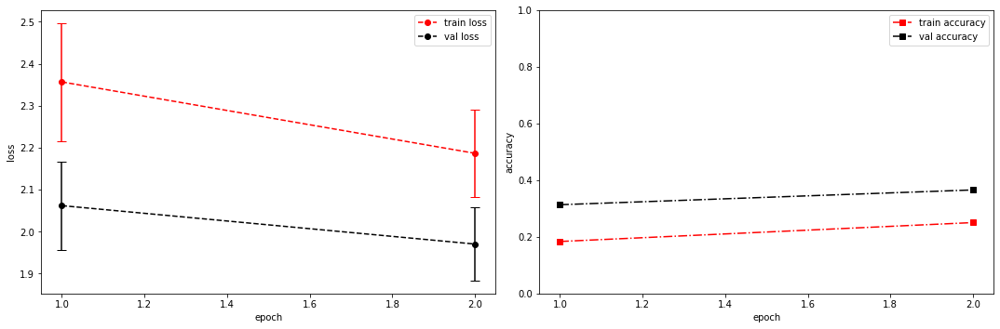

model saved


training epoch:  2
model set to train
Epoch [3/100], step [1/84],  Loss: 2.1758 +/- 0.0000,  accuracy: 0.013671875, time elapsed = 0.2558567523956299s
Epoch [3/100], step [17/84],  Loss: 2.0704 +/- 0.1012,  accuracy: 0.2890625, time elapsed = 0.8671269416809082s
Epoch [3/100], step [33/84],  Loss: 2.1138 +/- 0.0827,  accuracy: 0.2802734375, time elapsed = 0.8653028011322021s
Epoch [3/100], step [49/84],  Loss: 2.1064 +/- 0.0719,  accuracy: 0.2890625, time elapsed = 0.8591392040252686s
Epoch [3/100], step [65/84],  Loss: 2.0758 +/- 0.1172,  accuracy: 0.2861328125, time elapsed = 0.8533563613891602s
Epoch [3/100], step [81/84],  Loss: 2.0857 +/- 0.1276,  accuracy: 0.2880859375, time elapsed = 0.8393640518188477s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.2862203990303934,  precision = 0.2862203990303934 recall = 0.2862203990303934 f1 = 0.2862203990303934 ::: val: acc = 0.3795674869500373,  precision = 0.3795674869500373 recall = 0.3795674869500373 time elapsed 

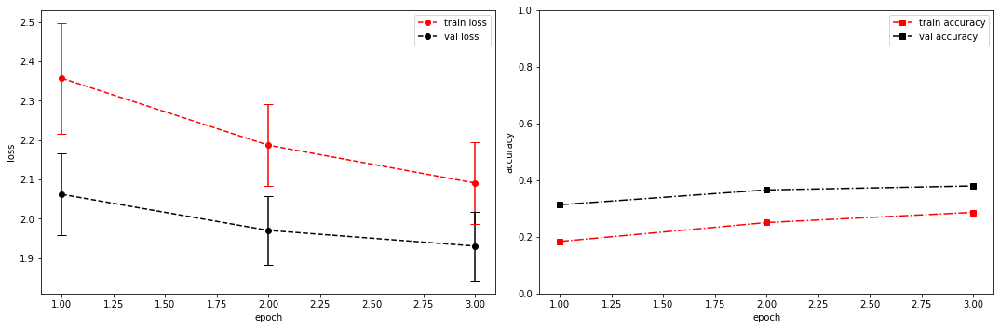

model saved


training epoch:  3
model set to train
Epoch [4/100], step [1/84],  Loss: 2.0503 +/- 0.0000,  accuracy: 0.021484375, time elapsed = 0.256472110748291s
Epoch [4/100], step [17/84],  Loss: 2.0600 +/- 0.1039,  accuracy: 0.2919921875, time elapsed = 0.9422228336334229s
Epoch [4/100], step [33/84],  Loss: 1.9946 +/- 0.1171,  accuracy: 0.3359375, time elapsed = 0.8848497867584229s
Epoch [4/100], step [49/84],  Loss: 2.0749 +/- 0.0985,  accuracy: 0.283203125, time elapsed = 0.857487678527832s
Epoch [4/100], step [65/84],  Loss: 2.0398 +/- 0.1025,  accuracy: 0.30859375, time elapsed = 0.8696253299713135s
Epoch [4/100], step [81/84],  Loss: 2.0147 +/- 0.0950,  accuracy: 0.3154296875, time elapsed = 0.8749065399169922s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3052396046988626,  precision = 0.3052396046988626 recall = 0.3052396046988626 f1 = 0.3052396046988626 ::: val: acc = 0.3832960477255779,  precision = 0.3832960477255779 recall = 0.3832960477255779 time elapsed = 

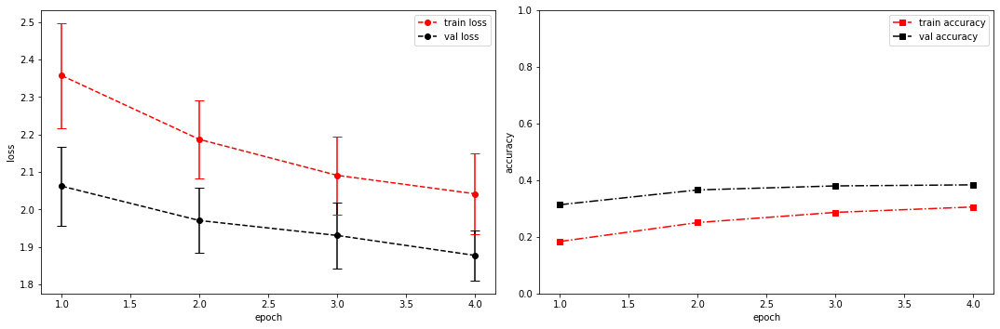

model saved


training epoch:  4
model set to train
Epoch [5/100], step [1/84],  Loss: 1.8545 +/- 0.0000,  accuracy: 0.017578125, time elapsed = 0.24700546264648438s
Epoch [5/100], step [17/84],  Loss: 2.0058 +/- 0.0864,  accuracy: 0.3251953125, time elapsed = 0.8888373374938965s
Epoch [5/100], step [33/84],  Loss: 1.9925 +/- 0.0898,  accuracy: 0.3193359375, time elapsed = 0.8596782684326172s
Epoch [5/100], step [49/84],  Loss: 1.9759 +/- 0.0592,  accuracy: 0.3408203125, time elapsed = 0.8616700172424316s
Epoch [5/100], step [65/84],  Loss: 2.0048 +/- 0.0868,  accuracy: 0.3251953125, time elapsed = 0.8609638214111328s
Epoch [5/100], step [81/84],  Loss: 1.9982 +/- 0.0970,  accuracy: 0.3173828125, time elapsed = 0.8499438762664795s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3255640499720306,  precision = 0.3255640499720306 recall = 0.3255640499720306 f1 = 0.3255640499720306 ::: val: acc = 0.3788217747949292,  precision = 0.3788217747949292 recall = 0.3788217747949292 time e

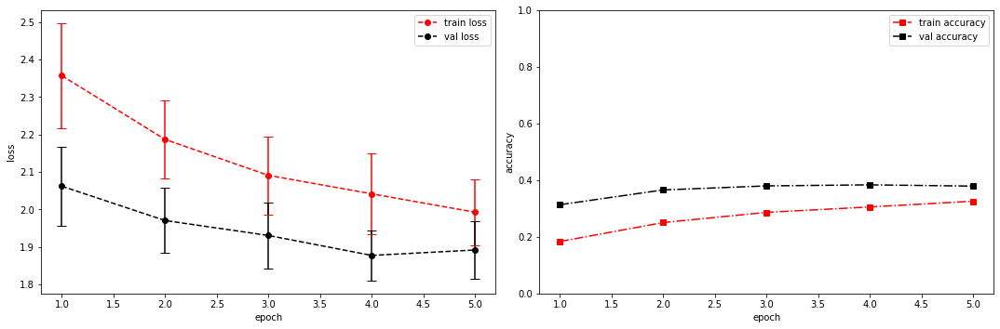

model saved


training epoch:  5
model set to train
Epoch [6/100], step [1/84],  Loss: 2.0198 +/- 0.0000,  accuracy: 0.015625, time elapsed = 0.26206493377685547s
Epoch [6/100], step [17/84],  Loss: 1.9496 +/- 0.1002,  accuracy: 0.3291015625, time elapsed = 0.8523499965667725s
Epoch [6/100], step [33/84],  Loss: 1.9715 +/- 0.0899,  accuracy: 0.333984375, time elapsed = 0.8809940814971924s
Epoch [6/100], step [49/84],  Loss: 1.9457 +/- 0.0814,  accuracy: 0.3525390625, time elapsed = 0.8653650283813477s
Epoch [6/100], step [65/84],  Loss: 1.9617 +/- 0.1031,  accuracy: 0.3388671875, time elapsed = 0.8481290340423584s
Epoch [6/100], step [81/84],  Loss: 1.9974 +/- 0.1186,  accuracy: 0.3271484375, time elapsed = 0.857837438583374s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3326496363975387,  precision = 0.3326496363975387 recall = 0.3326496363975387 f1 = 0.3326496363975387 ::: val: acc = 0.40566741237882176,  precision = 0.40566741237882176 recall = 0.40566741237882176 time ela

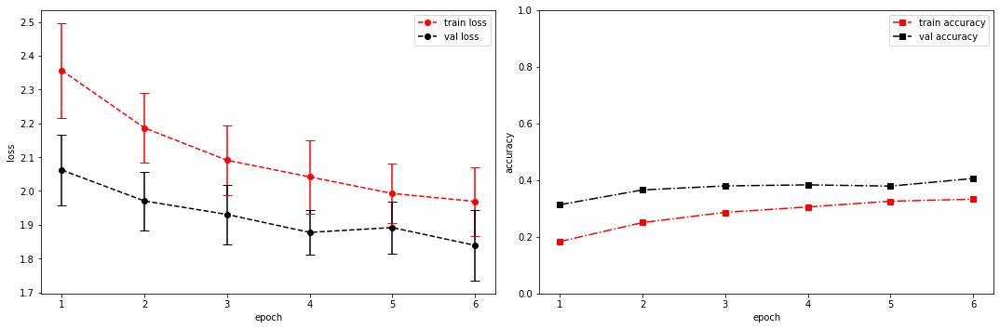

model saved


training epoch:  6
model set to train
Epoch [7/100], step [1/84],  Loss: 1.7487 +/- 0.0000,  accuracy: 0.0234375, time elapsed = 0.2722630500793457s
Epoch [7/100], step [17/84],  Loss: 1.9467 +/- 0.0716,  accuracy: 0.3466796875, time elapsed = 0.8553504943847656s
Epoch [7/100], step [33/84],  Loss: 1.9394 +/- 0.1238,  accuracy: 0.328125, time elapsed = 0.8771083354949951s
Epoch [7/100], step [49/84],  Loss: 1.9238 +/- 0.0855,  accuracy: 0.345703125, time elapsed = 0.8540797233581543s
Epoch [7/100], step [65/84],  Loss: 1.9002 +/- 0.1186,  accuracy: 0.3564453125, time elapsed = 0.8431320190429688s
Epoch [7/100], step [81/84],  Loss: 1.9341 +/- 0.0793,  accuracy: 0.3408203125, time elapsed = 0.8517088890075684s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3436509416371434,  precision = 0.3436509416371434 recall = 0.3436509416371434 f1 = 0.3436509416371434 ::: val: acc = 0.407158836689038,  precision = 0.407158836689038 recall = 0.407158836689038 time elapsed = 6.

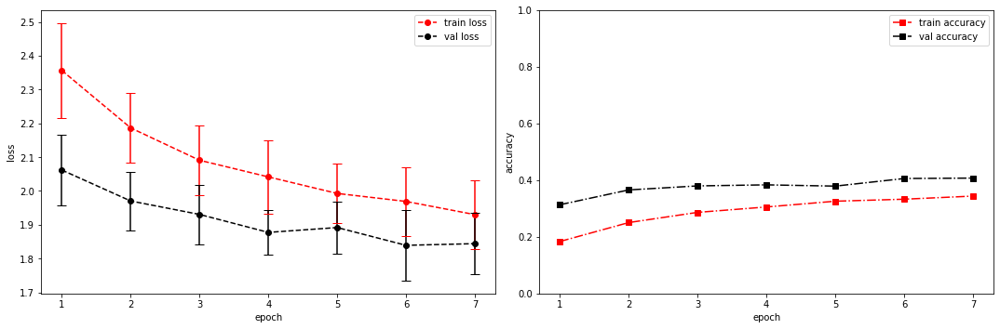

model saved


training epoch:  7
model set to train
Epoch [8/100], step [1/84],  Loss: 1.9160 +/- 0.0000,  accuracy: 0.0244140625, time elapsed = 0.25463390350341797s
Epoch [8/100], step [17/84],  Loss: 1.8819 +/- 0.0872,  accuracy: 0.373046875, time elapsed = 0.8858096599578857s
Epoch [8/100], step [33/84],  Loss: 1.9103 +/- 0.1408,  accuracy: 0.353515625, time elapsed = 0.8714871406555176s
Epoch [8/100], step [49/84],  Loss: 1.9452 +/- 0.0627,  accuracy: 0.333984375, time elapsed = 0.8771438598632812s
Epoch [8/100], step [65/84],  Loss: 1.8992 +/- 0.0973,  accuracy: 0.353515625, time elapsed = 0.8487250804901123s
Epoch [8/100], step [81/84],  Loss: 1.9227 +/- 0.0953,  accuracy: 0.333984375, time elapsed = 0.8678395748138428s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.35110945366399404,  precision = 0.35110945366399404 recall = 0.35110945366399404 f1 = 0.35110945366399404 ::: val: acc = 0.3900074571215511,  precision = 0.3900074571215511 recall = 0.3900074571215511 time e

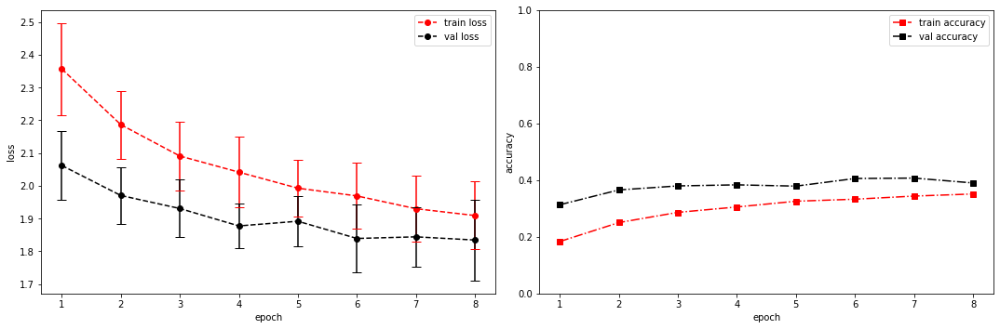

model saved


training epoch:  8
model set to train
Epoch [9/100], step [1/84],  Loss: 1.8308 +/- 0.0000,  accuracy: 0.0234375, time elapsed = 0.26378488540649414s
Epoch [9/100], step [17/84],  Loss: 1.8418 +/- 0.0606,  accuracy: 0.380859375, time elapsed = 0.8582103252410889s
Epoch [9/100], step [33/84],  Loss: 1.8554 +/- 0.0678,  accuracy: 0.3662109375, time elapsed = 0.849545955657959s
Epoch [9/100], step [49/84],  Loss: 1.9098 +/- 0.0927,  accuracy: 0.357421875, time elapsed = 0.8585364818572998s
Epoch [9/100], step [65/84],  Loss: 1.8967 +/- 0.1281,  accuracy: 0.376953125, time elapsed = 0.8655686378479004s
Epoch [9/100], step [81/84],  Loss: 1.8389 +/- 0.1294,  accuracy: 0.3828125, time elapsed = 0.8761169910430908s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3721797501398471,  precision = 0.3721797501398471 recall = 0.3721797501398471 f1 = 0.3721797501398471 ::: val: acc = 0.3907531692766592,  precision = 0.3907531692766592 recall = 0.3907531692766592 time elapsed = 

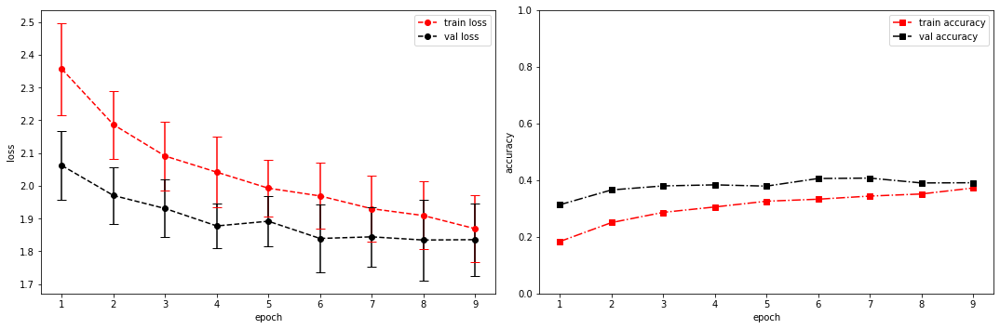

model saved


training epoch:  9
model set to train
Epoch [10/100], step [1/84],  Loss: 1.7428 +/- 0.0000,  accuracy: 0.02734375, time elapsed = 0.2679862976074219s
Epoch [10/100], step [17/84],  Loss: 1.8121 +/- 0.1182,  accuracy: 0.4091796875, time elapsed = 0.8654356002807617s
Epoch [10/100], step [33/84],  Loss: 1.8151 +/- 0.1121,  accuracy: 0.38671875, time elapsed = 0.8775632381439209s
Epoch [10/100], step [49/84],  Loss: 1.8319 +/- 0.1320,  accuracy: 0.384765625, time elapsed = 0.8645100593566895s
Epoch [10/100], step [65/84],  Loss: 1.8880 +/- 0.1205,  accuracy: 0.3740234375, time elapsed = 0.8561151027679443s
Epoch [10/100], step [81/84],  Loss: 1.8104 +/- 0.0809,  accuracy: 0.4140625, time elapsed = 0.8492527008056641s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3975386910311393,  precision = 0.3975386910311393 recall = 0.3975386910311393 f1 = 0.3975386910311393 ::: val: acc = 0.3855331841909023,  precision = 0.3855331841909023 recall = 0.3855331841909023 time ela

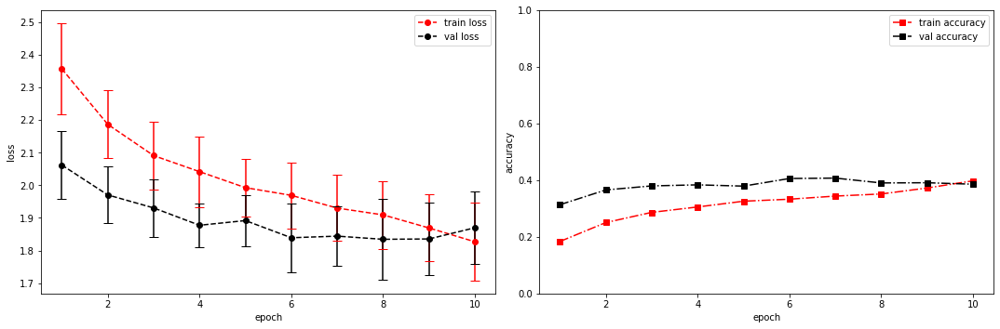

model saved


training epoch:  10
model set to train
Epoch [11/100], step [1/84],  Loss: 1.9809 +/- 0.0000,  accuracy: 0.0224609375, time elapsed = 0.26004862785339355s
Epoch [11/100], step [17/84],  Loss: 1.7526 +/- 0.1058,  accuracy: 0.3896484375, time elapsed = 0.8853015899658203s
Epoch [11/100], step [33/84],  Loss: 1.8185 +/- 0.1420,  accuracy: 0.40625, time elapsed = 0.9259521961212158s
Epoch [11/100], step [49/84],  Loss: 1.8192 +/- 0.1606,  accuracy: 0.4052734375, time elapsed = 0.8837130069732666s
Epoch [11/100], step [65/84],  Loss: 1.8360 +/- 0.1154,  accuracy: 0.376953125, time elapsed = 0.8467557430267334s
Epoch [11/100], step [81/84],  Loss: 1.8122 +/- 0.1012,  accuracy: 0.4072265625, time elapsed = 0.8573682308197021s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3969793026291255,  precision = 0.3969793026291255 recall = 0.3969793026291255 f1 = 0.3969793026291255 ::: val: acc = 0.3870246085011186,  precision = 0.3870246085011186 recall = 0.3870246085011186 time

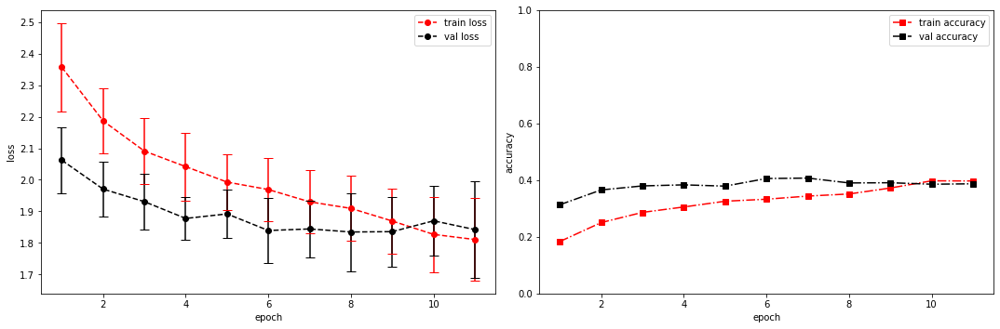

model saved


training epoch:  11
model set to train
Epoch [12/100], step [1/84],  Loss: 1.9687 +/- 0.0000,  accuracy: 0.0224609375, time elapsed = 0.2732837200164795s
Epoch [12/100], step [17/84],  Loss: 1.7694 +/- 0.1182,  accuracy: 0.4111328125, time elapsed = 0.880051851272583s
Epoch [12/100], step [33/84],  Loss: 1.7643 +/- 0.0827,  accuracy: 0.4130859375, time elapsed = 0.8731222152709961s
Epoch [12/100], step [49/84],  Loss: 1.7867 +/- 0.0957,  accuracy: 0.4111328125, time elapsed = 0.8647792339324951s
Epoch [12/100], step [65/84],  Loss: 1.7258 +/- 0.1065,  accuracy: 0.431640625, time elapsed = 0.8627398014068604s
Epoch [12/100], step [81/84],  Loss: 1.7504 +/- 0.1199,  accuracy: 0.4189453125, time elapsed = 0.8734152317047119s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4161849710982659,  precision = 0.4161849710982659 recall = 0.4161849710982659 f1 = 0.4161849710982659 ::: val: acc = 0.38404175988068606,  precision = 0.38404175988068606 recall = 0.3840417598806860

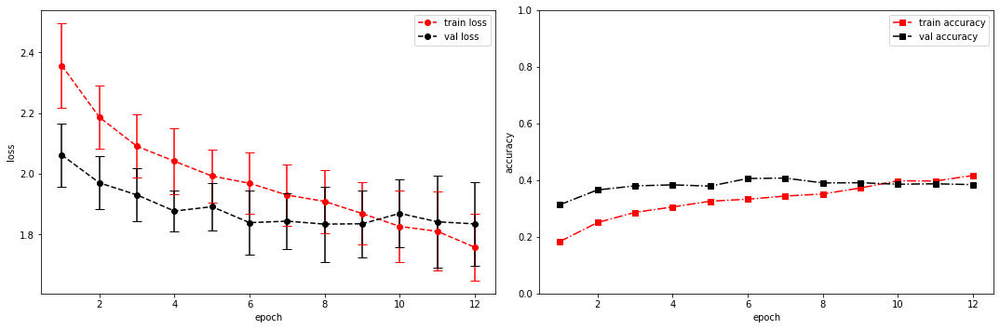

model saved


training epoch:  12
model set to train
Epoch [13/100], step [1/84],  Loss: 1.7203 +/- 0.0000,  accuracy: 0.0244140625, time elapsed = 0.2629704475402832s
Epoch [13/100], step [17/84],  Loss: 1.6687 +/- 0.0927,  accuracy: 0.4619140625, time elapsed = 0.8644328117370605s
Epoch [13/100], step [33/84],  Loss: 1.7386 +/- 0.1136,  accuracy: 0.3974609375, time elapsed = 0.8685743808746338s
Epoch [13/100], step [49/84],  Loss: 1.7472 +/- 0.0891,  accuracy: 0.4208984375, time elapsed = 0.8595130443572998s
Epoch [13/100], step [65/84],  Loss: 1.7393 +/- 0.1163,  accuracy: 0.4267578125, time elapsed = 0.8786640167236328s
Epoch [13/100], step [81/84],  Loss: 1.7162 +/- 0.1060,  accuracy: 0.4296875, time elapsed = 0.8657331466674805s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4255081111318292,  precision = 0.4255081111318292 recall = 0.4255081111318292 f1 = 0.4255081111318292 ::: val: acc = 0.3691275167785235,  precision = 0.3691275167785235 recall = 0.3691275167785235 ti

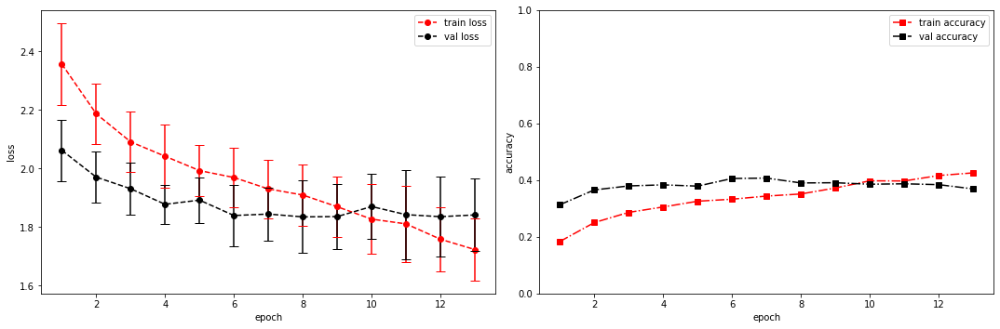

model saved


training epoch:  13
model set to train
Epoch [14/100], step [1/84],  Loss: 1.7827 +/- 0.0000,  accuracy: 0.0263671875, time elapsed = 0.27193713188171387s
Epoch [14/100], step [17/84],  Loss: 1.6928 +/- 0.0998,  accuracy: 0.4443359375, time elapsed = 0.8968737125396729s
Epoch [14/100], step [33/84],  Loss: 1.6677 +/- 0.1014,  accuracy: 0.4287109375, time elapsed = 0.8665297031402588s
Epoch [14/100], step [49/84],  Loss: 1.6880 +/- 0.0937,  accuracy: 0.4404296875, time elapsed = 0.8562121391296387s
Epoch [14/100], step [65/84],  Loss: 1.6808 +/- 0.1076,  accuracy: 0.4462890625, time elapsed = 0.8778505325317383s
Epoch [14/100], step [81/84],  Loss: 1.6748 +/- 0.0723,  accuracy: 0.4375, time elapsed = 0.8523149490356445s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.43911989558083164,  precision = 0.43911989558083164 recall = 0.43911989558083164 f1 = 0.4391198955808317 ::: val: acc = 0.4079045488441462,  precision = 0.4079045488441462 recall = 0.4079045488441462 t

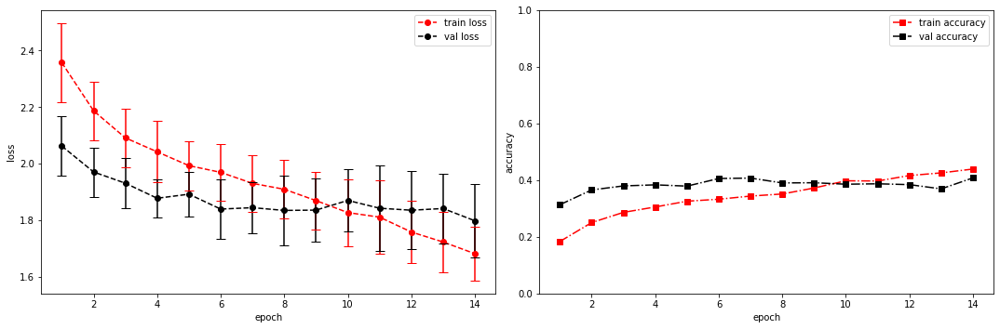

model saved


training epoch:  14
model set to train
Epoch [15/100], step [1/84],  Loss: 1.7814 +/- 0.0000,  accuracy: 0.0283203125, time elapsed = 0.25824737548828125s
Epoch [15/100], step [17/84],  Loss: 1.6480 +/- 0.1200,  accuracy: 0.46484375, time elapsed = 0.8721551895141602s
Epoch [15/100], step [33/84],  Loss: 1.5944 +/- 0.0814,  accuracy: 0.484375, time elapsed = 0.8547337055206299s
Epoch [15/100], step [49/84],  Loss: 1.6937 +/- 0.1044,  accuracy: 0.4521484375, time elapsed = 0.8656268119812012s
Epoch [15/100], step [65/84],  Loss: 1.6543 +/- 0.1396,  accuracy: 0.44140625, time elapsed = 0.8496129512786865s
Epoch [15/100], step [81/84],  Loss: 1.6976 +/- 0.0690,  accuracy: 0.4228515625, time elapsed = 0.8535597324371338s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.45422338243520416,  precision = 0.45422338243520416 recall = 0.45422338243520416 f1 = 0.45422338243520416 ::: val: acc = 0.4235645041014168,  precision = 0.4235645041014168 recall = 0.4235645041014168 ti

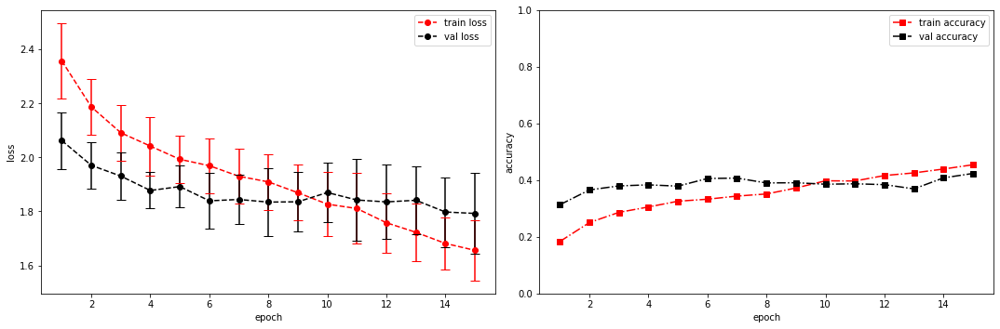

model saved


training epoch:  15
model set to train
Epoch [16/100], step [1/84],  Loss: 1.4429 +/- 0.0000,  accuracy: 0.0302734375, time elapsed = 0.26499414443969727s
Epoch [16/100], step [17/84],  Loss: 1.5907 +/- 0.1187,  accuracy: 0.478515625, time elapsed = 0.8758199214935303s
Epoch [16/100], step [33/84],  Loss: 1.6301 +/- 0.1219,  accuracy: 0.4599609375, time elapsed = 0.8669900894165039s
Epoch [16/100], step [49/84],  Loss: 1.6421 +/- 0.1311,  accuracy: 0.4541015625, time elapsed = 0.8490815162658691s
Epoch [16/100], step [65/84],  Loss: 1.5880 +/- 0.0960,  accuracy: 0.4716796875, time elapsed = 0.8497037887573242s
Epoch [16/100], step [81/84],  Loss: 1.6391 +/- 0.1091,  accuracy: 0.4560546875, time elapsed = 0.8599283695220947s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.46541115047548015,  precision = 0.46541115047548015 recall = 0.46541115047548015 f1 = 0.4654111504754801 ::: val: acc = 0.4004474272930649,  precision = 0.4004474272930649 recall = 0.4004474272930

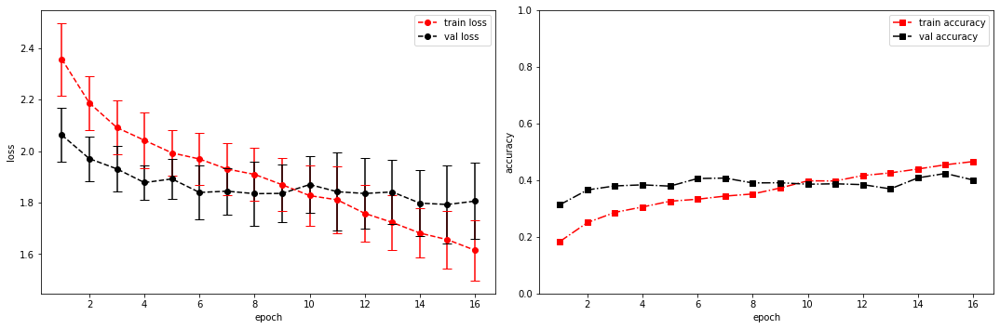

model saved


training epoch:  16
model set to train
Epoch [17/100], step [1/84],  Loss: 1.4226 +/- 0.0000,  accuracy: 0.033203125, time elapsed = 0.2560267448425293s
Epoch [17/100], step [17/84],  Loss: 1.5851 +/- 0.1194,  accuracy: 0.4765625, time elapsed = 0.8802223205566406s
Epoch [17/100], step [33/84],  Loss: 1.5701 +/- 0.1008,  accuracy: 0.4873046875, time elapsed = 0.8797585964202881s
Epoch [17/100], step [49/84],  Loss: 1.5702 +/- 0.0957,  accuracy: 0.4814453125, time elapsed = 0.8799612522125244s
Epoch [17/100], step [65/84],  Loss: 1.5877 +/- 0.1170,  accuracy: 0.478515625, time elapsed = 0.8837151527404785s
Epoch [17/100], step [81/84],  Loss: 1.5880 +/- 0.0940,  accuracy: 0.4658203125, time elapsed = 0.8696079254150391s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4782770837217975,  precision = 0.4782770837217975 recall = 0.4782770837217975 f1 = 0.4782770837217975 ::: val: acc = 0.3691275167785235,  precision = 0.3691275167785235 recall = 0.3691275167785235 time

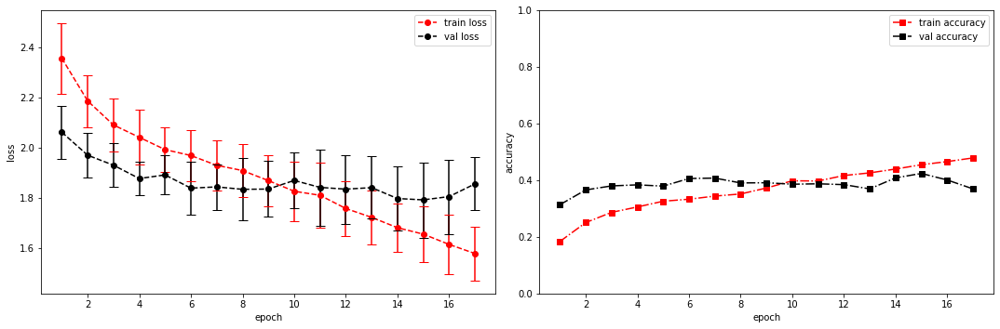

model saved
stopping early
Conv_1_layer
(1, 13, 517)
running model: id = Conv_1_layer, channels = [128]
device:  cuda
dataset metadata:  {'n_fft': 2048, 'hop_length': 256, 'n_mfcc': 13, 'notes': 'optional notes not passed'}
train model: data loaders initialized
sample shape =  (1, 13, 517)
model loaded
Layer (type:depth-idx)                   Output Shape              Param #
├─ConvBlock: 1-1                         [-1, 128, 13, 52]         --
|    └─Sequential: 2-1                   [-1, 128, 13, 52]         --
|    |    └─Conv2d: 3-1                  [-1, 128, 13, 517]        1,280
|    |    └─ReLU: 3-2                    [-1, 128, 13, 517]        --
|    |    └─MaxPool2d: 3-3               [-1, 128, 13, 52]         --
|    |    └─BatchNorm2d: 3-4             [-1, 128, 13, 52]         256
├─LinearBlock: 1-2                       [-1, 128]                 --
|    └─Sequential: 2-2                   [-1, 128]                 --
|    |    └─Linear: 3-5                  [-1, 128]       

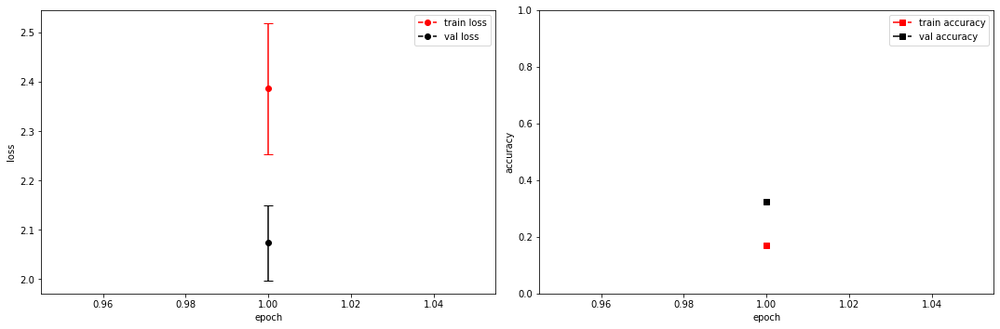

model saved


training epoch:  1
model set to train
Epoch [2/100], step [1/84],  Loss: 2.2033 +/- 0.0000,  accuracy: 0.015625, time elapsed = 0.2754967212677002s
Epoch [2/100], step [17/84],  Loss: 2.2480 +/- 0.0780,  accuracy: 0.2333984375, time elapsed = 0.9168422222137451s
Epoch [2/100], step [33/84],  Loss: 2.2280 +/- 0.0844,  accuracy: 0.228515625, time elapsed = 0.9205288887023926s
Epoch [2/100], step [49/84],  Loss: 2.2176 +/- 0.0734,  accuracy: 0.2431640625, time elapsed = 0.9022955894470215s
Epoch [2/100], step [65/84],  Loss: 2.1944 +/- 0.1295,  accuracy: 0.2548828125, time elapsed = 0.9149806499481201s
Epoch [2/100], step [81/84],  Loss: 2.1604 +/- 0.0920,  accuracy: 0.2705078125, time elapsed = 0.9667873382568359s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.24538504568338618,  precision = 0.24538504568338618 recall = 0.24538504568338618 f1 = 0.24538504568338618 ::: val: acc = 0.3407904548844146,  precision = 0.3407904548844146 recall = 0.3407904548844146 time el

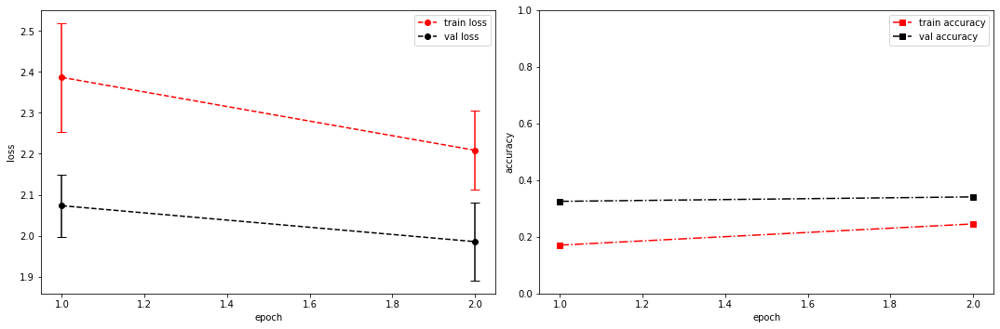

model saved


training epoch:  2
model set to train
Epoch [3/100], step [1/84],  Loss: 2.0912 +/- 0.0000,  accuracy: 0.015625, time elapsed = 0.27608346939086914s
Epoch [3/100], step [17/84],  Loss: 2.1704 +/- 0.0880,  accuracy: 0.248046875, time elapsed = 0.9282286167144775s
Epoch [3/100], step [33/84],  Loss: 2.1690 +/- 0.0992,  accuracy: 0.2490234375, time elapsed = 0.9144079685211182s
Epoch [3/100], step [49/84],  Loss: 2.1333 +/- 0.1053,  accuracy: 0.283203125, time elapsed = 0.9532630443572998s
Epoch [3/100], step [65/84],  Loss: 2.1389 +/- 0.1419,  accuracy: 0.2724609375, time elapsed = 0.9119312763214111s
Epoch [3/100], step [81/84],  Loss: 2.0917 +/- 0.0904,  accuracy: 0.2734375, time elapsed = 0.9378790855407715s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.26459071415252655,  precision = 0.26459071415252655 recall = 0.26459071415252655 f1 = 0.26459071415252655 ::: val: acc = 0.36539895600298283,  precision = 0.36539895600298283 recall = 0.36539895600298283 time el

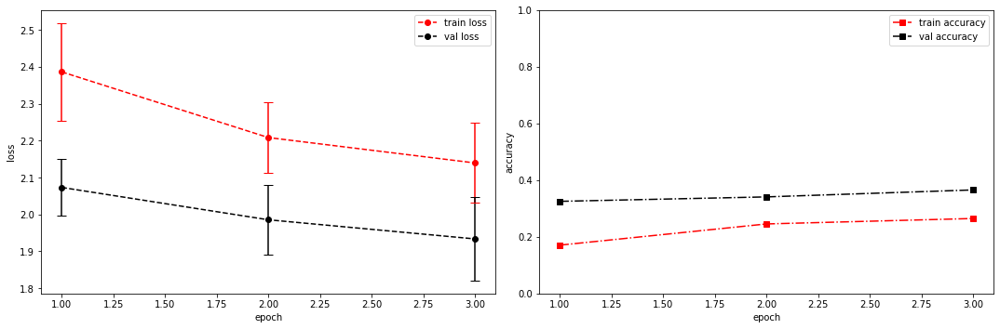

model saved


training epoch:  3
model set to train
Epoch [4/100], step [1/84],  Loss: 2.1382 +/- 0.0000,  accuracy: 0.0126953125, time elapsed = 0.29089784622192383s
Epoch [4/100], step [17/84],  Loss: 2.1293 +/- 0.0736,  accuracy: 0.2802734375, time elapsed = 0.9428741931915283s
Epoch [4/100], step [33/84],  Loss: 2.0616 +/- 0.1179,  accuracy: 0.291015625, time elapsed = 0.9003064632415771s
Epoch [4/100], step [49/84],  Loss: 2.0712 +/- 0.1549,  accuracy: 0.310546875, time elapsed = 0.9066903591156006s
Epoch [4/100], step [65/84],  Loss: 2.1219 +/- 0.1150,  accuracy: 0.2685546875, time elapsed = 0.8841183185577393s
Epoch [4/100], step [81/84],  Loss: 2.0515 +/- 0.0969,  accuracy: 0.3115234375, time elapsed = 0.8994688987731934s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.2927465970538877,  precision = 0.2927465970538877 recall = 0.2927465970538877 f1 = 0.2927465970538877 ::: val: acc = 0.37658463832960476,  precision = 0.37658463832960476 recall = 0.37658463832960476 time

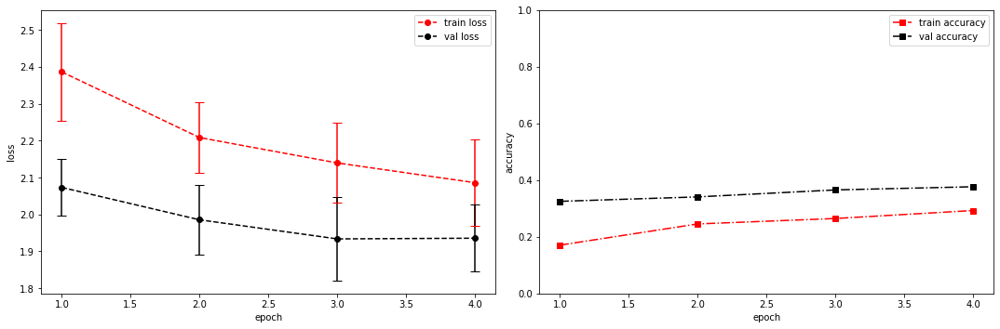

model saved


training epoch:  4
model set to train
Epoch [5/100], step [1/84],  Loss: 1.9219 +/- 0.0000,  accuracy: 0.021484375, time elapsed = 0.2800569534301758s
Epoch [5/100], step [17/84],  Loss: 2.0359 +/- 0.1655,  accuracy: 0.2958984375, time elapsed = 0.9584841728210449s
Epoch [5/100], step [33/84],  Loss: 2.0790 +/- 0.1202,  accuracy: 0.28515625, time elapsed = 0.9579465389251709s
Epoch [5/100], step [49/84],  Loss: 1.9987 +/- 0.1007,  accuracy: 0.333984375, time elapsed = 0.9052863121032715s
Epoch [5/100], step [65/84],  Loss: 2.0693 +/- 0.0968,  accuracy: 0.30078125, time elapsed = 0.9184408187866211s
Epoch [5/100], step [81/84],  Loss: 2.0043 +/- 0.1502,  accuracy: 0.30859375, time elapsed = 0.9357032775878906s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3072906955062465,  precision = 0.3072906955062465 recall = 0.3072906955062465 f1 = 0.3072906955062465 ::: val: acc = 0.3698732289336316,  precision = 0.3698732289336316 recall = 0.3698732289336316 time elapsed =

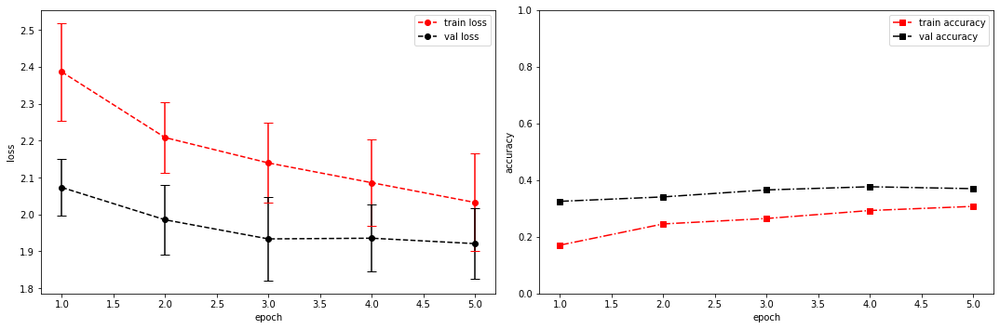

model saved


training epoch:  5
model set to train
Epoch [6/100], step [1/84],  Loss: 1.8494 +/- 0.0000,  accuracy: 0.0234375, time elapsed = 0.28582048416137695s
Epoch [6/100], step [17/84],  Loss: 2.0061 +/- 0.1111,  accuracy: 0.3203125, time elapsed = 0.9147908687591553s
Epoch [6/100], step [33/84],  Loss: 1.9914 +/- 0.1163,  accuracy: 0.3408203125, time elapsed = 0.923445463180542s
Epoch [6/100], step [49/84],  Loss: 2.0049 +/- 0.1141,  accuracy: 0.302734375, time elapsed = 0.937220573425293s
Epoch [6/100], step [65/84],  Loss: 1.9708 +/- 0.0854,  accuracy: 0.337890625, time elapsed = 0.9170875549316406s
Epoch [6/100], step [81/84],  Loss: 1.9712 +/- 0.1116,  accuracy: 0.3232421875, time elapsed = 0.93123459815979s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3276151407794145,  precision = 0.3276151407794145 recall = 0.3276151407794145 f1 = 0.3276151407794145 ::: val: acc = 0.4041759880686055,  precision = 0.4041759880686055 recall = 0.4041759880686055 time elapsed = 6.

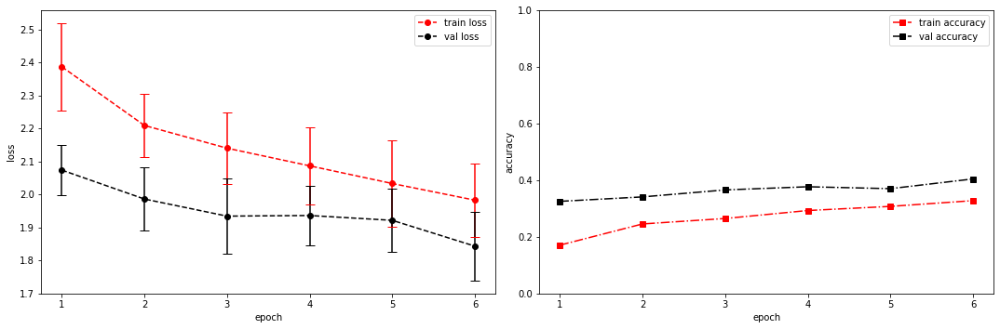

model saved


training epoch:  6
model set to train
Epoch [7/100], step [1/84],  Loss: 1.7959 +/- 0.0000,  accuracy: 0.0234375, time elapsed = 0.2879164218902588s
Epoch [7/100], step [17/84],  Loss: 1.9759 +/- 0.1161,  accuracy: 0.330078125, time elapsed = 0.9320080280303955s
Epoch [7/100], step [33/84],  Loss: 1.9558 +/- 0.0872,  accuracy: 0.3232421875, time elapsed = 0.9084243774414062s
Epoch [7/100], step [49/84],  Loss: 1.9322 +/- 0.1235,  accuracy: 0.3623046875, time elapsed = 0.901191234588623s
Epoch [7/100], step [65/84],  Loss: 1.9225 +/- 0.1052,  accuracy: 0.337890625, time elapsed = 0.9017641544342041s
Epoch [7/100], step [81/84],  Loss: 1.9669 +/- 0.1044,  accuracy: 0.3271484375, time elapsed = 0.8842201232910156s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3376841320156629,  precision = 0.3376841320156629 recall = 0.3376841320156629 f1 = 0.3376841320156629 ::: val: acc = 0.4235645041014168,  precision = 0.4235645041014168 recall = 0.4235645041014168 time elapsed

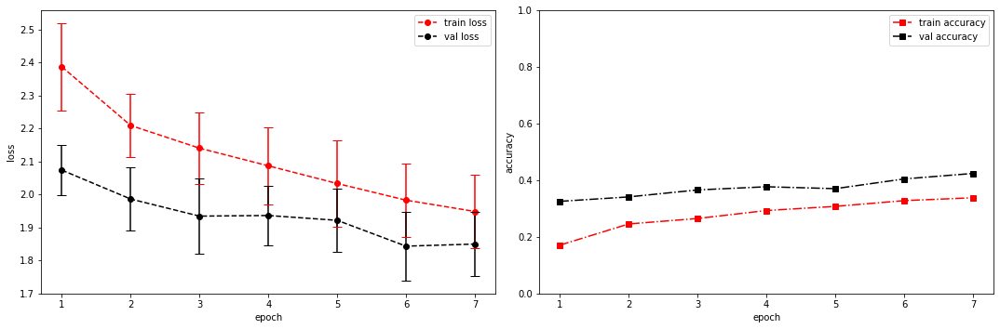

model saved


training epoch:  7
model set to train
Epoch [8/100], step [1/84],  Loss: 2.0505 +/- 0.0000,  accuracy: 0.01953125, time elapsed = 0.27709484100341797s
Epoch [8/100], step [17/84],  Loss: 1.9062 +/- 0.1053,  accuracy: 0.353515625, time elapsed = 0.9134023189544678s
Epoch [8/100], step [33/84],  Loss: 1.8755 +/- 0.1189,  accuracy: 0.3759765625, time elapsed = 0.9018669128417969s
Epoch [8/100], step [49/84],  Loss: 1.9024 +/- 0.1288,  accuracy: 0.357421875, time elapsed = 0.9087893962860107s
Epoch [8/100], step [65/84],  Loss: 1.8993 +/- 0.1198,  accuracy: 0.3740234375, time elapsed = 0.9003825187683105s
Epoch [8/100], step [81/84],  Loss: 1.8966 +/- 0.0859,  accuracy: 0.3701171875, time elapsed = 0.9120330810546875s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3634159985082976,  precision = 0.3634159985082976 recall = 0.3634159985082976 f1 = 0.36341599850829764 ::: val: acc = 0.43102162565249813,  precision = 0.43102162565249813 recall = 0.43102162565249813 time 

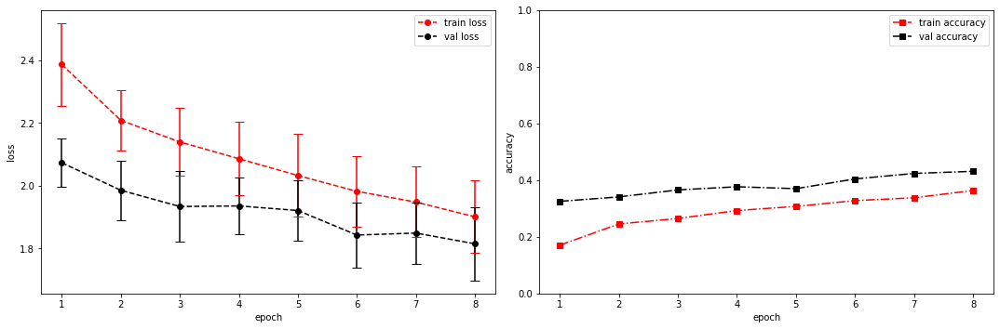

model saved


training epoch:  8
model set to train
Epoch [9/100], step [1/84],  Loss: 1.7941 +/- 0.0000,  accuracy: 0.0244140625, time elapsed = 0.2835514545440674s
Epoch [9/100], step [17/84],  Loss: 1.8456 +/- 0.1272,  accuracy: 0.37109375, time elapsed = 0.9418814182281494s
Epoch [9/100], step [33/84],  Loss: 1.9003 +/- 0.0919,  accuracy: 0.3701171875, time elapsed = 0.9550223350524902s
Epoch [9/100], step [49/84],  Loss: 1.8285 +/- 0.1499,  accuracy: 0.3779296875, time elapsed = 0.9146363735198975s
Epoch [9/100], step [65/84],  Loss: 1.8910 +/- 0.1591,  accuracy: 0.3623046875, time elapsed = 0.9004364013671875s
Epoch [9/100], step [81/84],  Loss: 1.8232 +/- 0.1231,  accuracy: 0.388671875, time elapsed = 0.9145925045013428s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3721797501398471,  precision = 0.3721797501398471 recall = 0.3721797501398471 f1 = 0.3721797501398471 ::: val: acc = 0.4041759880686055,  precision = 0.4041759880686055 recall = 0.4041759880686055 time elap

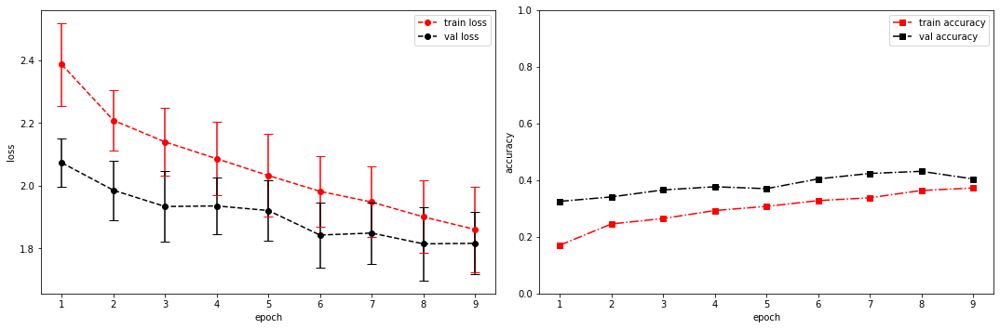

model saved


training epoch:  9
model set to train
Epoch [10/100], step [1/84],  Loss: 1.7692 +/- 0.0000,  accuracy: 0.021484375, time elapsed = 0.2857034206390381s
Epoch [10/100], step [17/84],  Loss: 1.8176 +/- 0.1241,  accuracy: 0.3974609375, time elapsed = 0.9183104038238525s
Epoch [10/100], step [33/84],  Loss: 1.8011 +/- 0.0903,  accuracy: 0.404296875, time elapsed = 0.9082036018371582s
Epoch [10/100], step [49/84],  Loss: 1.8505 +/- 0.1142,  accuracy: 0.37109375, time elapsed = 0.8919672966003418s
Epoch [10/100], step [65/84],  Loss: 1.8424 +/- 0.1036,  accuracy: 0.3916015625, time elapsed = 0.8939471244812012s
Epoch [10/100], step [81/84],  Loss: 1.8609 +/- 0.0751,  accuracy: 0.365234375, time elapsed = 0.9123461246490479s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.38504568338616446,  precision = 0.38504568338616446 recall = 0.38504568338616446 f1 = 0.3850456833861644 ::: val: acc = 0.4153616703952274,  precision = 0.4153616703952274 recall = 0.4153616703952274 ti

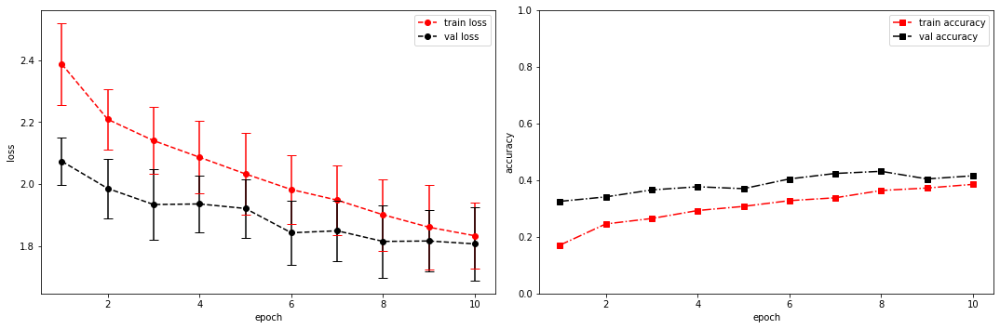

model saved


training epoch:  10
model set to train
Epoch [11/100], step [1/84],  Loss: 1.7485 +/- 0.0000,  accuracy: 0.0302734375, time elapsed = 0.2840390205383301s
Epoch [11/100], step [17/84],  Loss: 1.8468 +/- 0.1435,  accuracy: 0.392578125, time elapsed = 0.9175174236297607s
Epoch [11/100], step [33/84],  Loss: 1.8198 +/- 0.1223,  accuracy: 0.3857421875, time elapsed = 0.9102282524108887s
Epoch [11/100], step [49/84],  Loss: 1.8416 +/- 0.1025,  accuracy: 0.3857421875, time elapsed = 0.9398107528686523s
Epoch [11/100], step [65/84],  Loss: 1.7852 +/- 0.1116,  accuracy: 0.412109375, time elapsed = 0.8979263305664062s
Epoch [11/100], step [81/84],  Loss: 1.7870 +/- 0.1646,  accuracy: 0.392578125, time elapsed = 0.8886458873748779s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3967928398284542,  precision = 0.3967928398284542 recall = 0.3967928398284542 f1 = 0.39679283982845415 ::: val: acc = 0.4116331096196868,  precision = 0.4116331096196868 recall = 0.4116331096196868 t

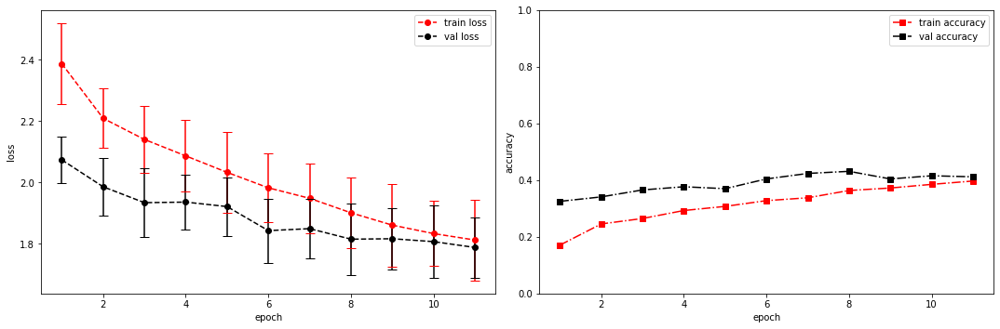

model saved


training epoch:  11
model set to train
Epoch [12/100], step [1/84],  Loss: 1.7968 +/- 0.0000,  accuracy: 0.0283203125, time elapsed = 0.2821972370147705s
Epoch [12/100], step [17/84],  Loss: 1.7669 +/- 0.1064,  accuracy: 0.41796875, time elapsed = 0.9586129188537598s
Epoch [12/100], step [33/84],  Loss: 1.7869 +/- 0.0980,  accuracy: 0.3935546875, time elapsed = 0.9094438552856445s
Epoch [12/100], step [49/84],  Loss: 1.7010 +/- 0.0933,  accuracy: 0.43359375, time elapsed = 0.9125239849090576s
Epoch [12/100], step [65/84],  Loss: 1.7514 +/- 0.1044,  accuracy: 0.421875, time elapsed = 0.8785982131958008s
Epoch [12/100], step [81/84],  Loss: 1.7507 +/- 0.1169,  accuracy: 0.416015625, time elapsed = 0.8843123912811279s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.41487973149356705,  precision = 0.41487973149356705 recall = 0.41487973149356705 f1 = 0.4148797314935671 ::: val: acc = 0.41759880686055184,  precision = 0.41759880686055184 recall = 0.41759880686055184 ti

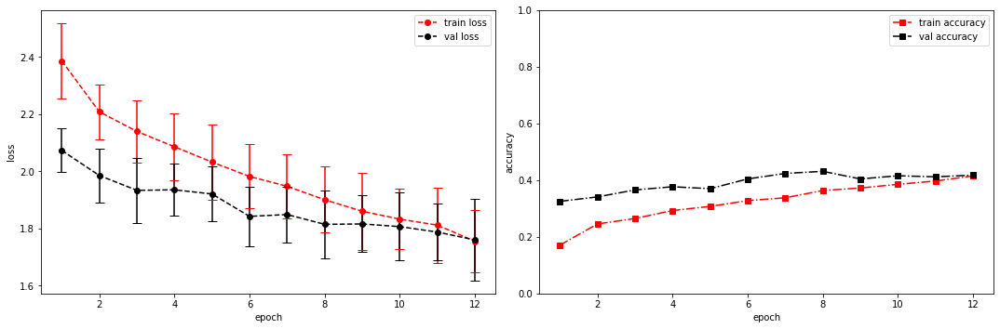

model saved


training epoch:  12
model set to train
Epoch [13/100], step [1/84],  Loss: 1.5627 +/- 0.0000,  accuracy: 0.0322265625, time elapsed = 0.2906067371368408s
Epoch [13/100], step [17/84],  Loss: 1.7140 +/- 0.1579,  accuracy: 0.443359375, time elapsed = 0.9520237445831299s
Epoch [13/100], step [33/84],  Loss: 1.7077 +/- 0.1182,  accuracy: 0.4560546875, time elapsed = 0.9204666614532471s
Epoch [13/100], step [49/84],  Loss: 1.7544 +/- 0.1613,  accuracy: 0.421875, time elapsed = 0.9050884246826172s
Epoch [13/100], step [65/84],  Loss: 1.6918 +/- 0.0995,  accuracy: 0.4384765625, time elapsed = 0.9258275032043457s
Epoch [13/100], step [81/84],  Loss: 1.7119 +/- 0.1259,  accuracy: 0.4228515625, time elapsed = 0.8969395160675049s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.43800111877680403,  precision = 0.43800111877680403 recall = 0.43800111877680403 f1 = 0.43800111877680403 ::: val: acc = 0.3989560029828486,  precision = 0.3989560029828486 recall = 0.3989560029828486 

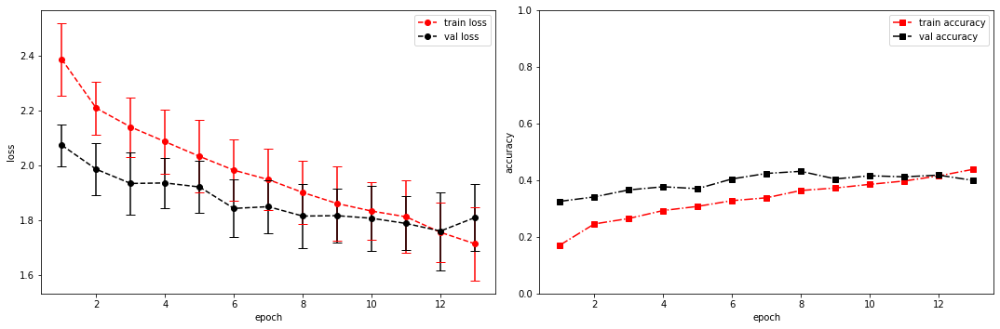

model saved


training epoch:  13
model set to train
Epoch [14/100], step [1/84],  Loss: 1.7282 +/- 0.0000,  accuracy: 0.0234375, time elapsed = 0.29010677337646484s
Epoch [14/100], step [17/84],  Loss: 1.7063 +/- 0.1006,  accuracy: 0.4228515625, time elapsed = 0.9092447757720947s
Epoch [14/100], step [33/84],  Loss: 1.6992 +/- 0.1128,  accuracy: 0.435546875, time elapsed = 0.9198694229125977s
Epoch [14/100], step [49/84],  Loss: 1.6543 +/- 0.1002,  accuracy: 0.45703125, time elapsed = 0.9231083393096924s
Epoch [14/100], step [65/84],  Loss: 1.7520 +/- 0.1325,  accuracy: 0.4267578125, time elapsed = 0.907696008682251s
Epoch [14/100], step [81/84],  Loss: 1.7029 +/- 0.1078,  accuracy: 0.4384765625, time elapsed = 0.8924646377563477s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4337124743613649,  precision = 0.4337124743613649 recall = 0.4337124743613649 f1 = 0.4337124743613649 ::: val: acc = 0.4041759880686055,  precision = 0.4041759880686055 recall = 0.4041759880686055 time 

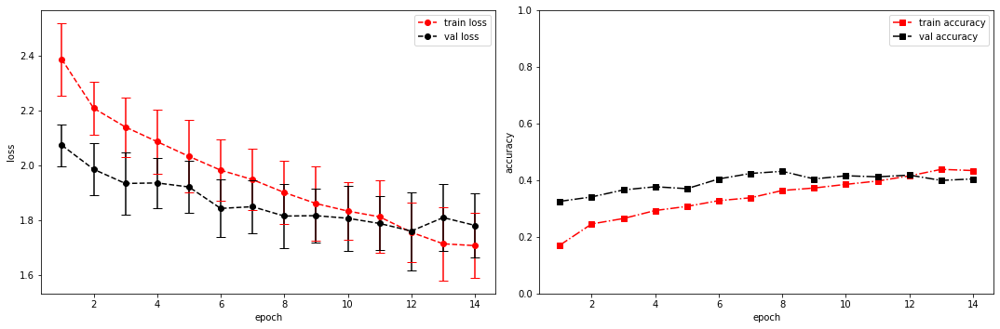

model saved


training epoch:  14
model set to train
Epoch [15/100], step [1/84],  Loss: 1.5793 +/- 0.0000,  accuracy: 0.029296875, time elapsed = 0.29562973976135254s
Epoch [15/100], step [17/84],  Loss: 1.6381 +/- 0.1266,  accuracy: 0.478515625, time elapsed = 0.9508907794952393s
Epoch [15/100], step [33/84],  Loss: 1.6357 +/- 0.0818,  accuracy: 0.45703125, time elapsed = 0.9231491088867188s
Epoch [15/100], step [49/84],  Loss: 1.6448 +/- 0.1077,  accuracy: 0.4462890625, time elapsed = 0.9059617519378662s
Epoch [15/100], step [65/84],  Loss: 1.6848 +/- 0.0858,  accuracy: 0.4296875, time elapsed = 0.9067049026489258s
Epoch [15/100], step [81/84],  Loss: 1.6319 +/- 0.1248,  accuracy: 0.486328125, time elapsed = 0.914360523223877s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4594443408539996,  precision = 0.4594443408539996 recall = 0.4594443408539996 f1 = 0.4594443408539996 ::: val: acc = 0.3959731543624161,  precision = 0.3959731543624161 recall = 0.3959731543624161 time el

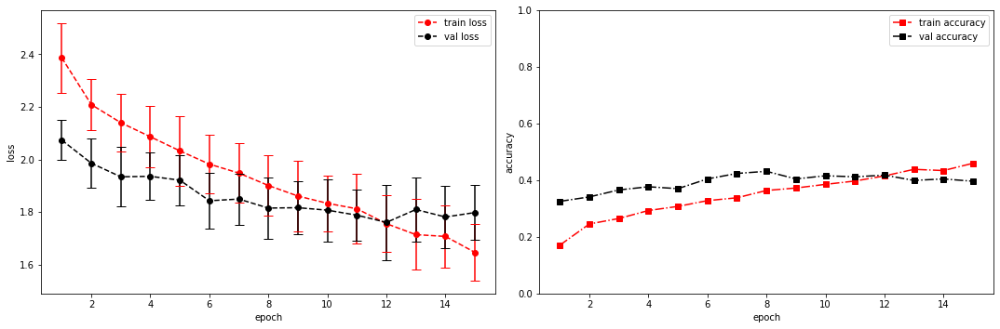

model saved


training epoch:  15
model set to train
Epoch [16/100], step [1/84],  Loss: 1.5324 +/- 0.0000,  accuracy: 0.029296875, time elapsed = 0.2933785915374756s
Epoch [16/100], step [17/84],  Loss: 1.5515 +/- 0.1107,  accuracy: 0.509765625, time elapsed = 0.9374263286590576s
Epoch [16/100], step [33/84],  Loss: 1.6134 +/- 0.1143,  accuracy: 0.4580078125, time elapsed = 0.9752943515777588s
Epoch [16/100], step [49/84],  Loss: 1.5705 +/- 0.1208,  accuracy: 0.486328125, time elapsed = 0.9145939350128174s
Epoch [16/100], step [65/84],  Loss: 1.6210 +/- 0.1419,  accuracy: 0.46875, time elapsed = 0.9008498191833496s
Epoch [16/100], step [81/84],  Loss: 1.6083 +/- 0.1291,  accuracy: 0.4853515625, time elapsed = 0.9123563766479492s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.48051463732985267,  precision = 0.48051463732985267 recall = 0.48051463732985267 f1 = 0.48051463732985267 ::: val: acc = 0.40939597315436244,  precision = 0.40939597315436244 recall = 0.40939597315436244 

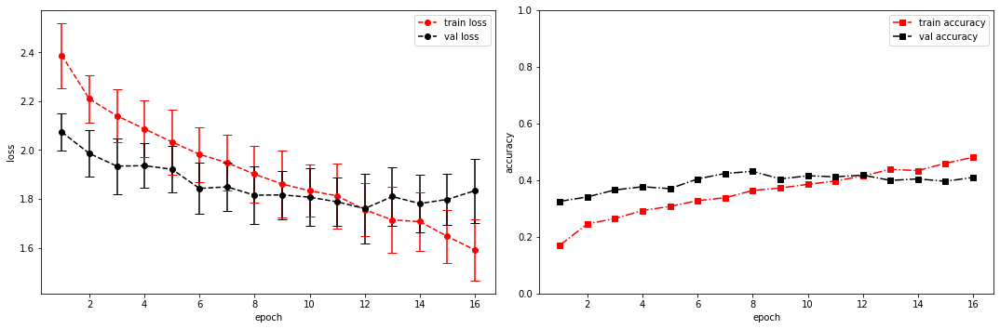

model saved


training epoch:  16
model set to train
Epoch [17/100], step [1/84],  Loss: 1.6049 +/- 0.0000,  accuracy: 0.029296875, time elapsed = 0.28612470626831055s
Epoch [17/100], step [17/84],  Loss: 1.5409 +/- 0.1306,  accuracy: 0.50390625, time elapsed = 0.9340829849243164s
Epoch [17/100], step [33/84],  Loss: 1.6039 +/- 0.0944,  accuracy: 0.48046875, time elapsed = 0.9096159934997559s
Epoch [17/100], step [49/84],  Loss: 1.5572 +/- 0.1155,  accuracy: 0.4814453125, time elapsed = 0.9214184284210205s
Epoch [17/100], step [65/84],  Loss: 1.5263 +/- 0.1011,  accuracy: 0.50390625, time elapsed = 0.9135282039642334s
Epoch [17/100], step [81/84],  Loss: 1.5989 +/- 0.1074,  accuracy: 0.4794921875, time elapsed = 0.9216012954711914s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.48965131456274474,  precision = 0.48965131456274474 recall = 0.48965131456274474 f1 = 0.48965131456274474 ::: val: acc = 0.41834451901565994,  precision = 0.41834451901565994 recall = 0.4183445190156599

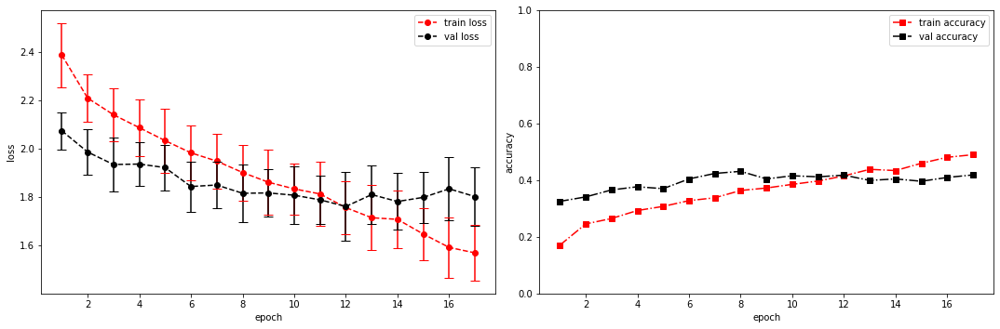

model saved


training epoch:  17
model set to train
Epoch [18/100], step [1/84],  Loss: 1.5707 +/- 0.0000,  accuracy: 0.0283203125, time elapsed = 0.2856178283691406s
Epoch [18/100], step [17/84],  Loss: 1.5113 +/- 0.1105,  accuracy: 0.5029296875, time elapsed = 0.926969051361084s
Epoch [18/100], step [33/84],  Loss: 1.5124 +/- 0.1342,  accuracy: 0.521484375, time elapsed = 0.9323258399963379s
Epoch [18/100], step [49/84],  Loss: 1.5326 +/- 0.1364,  accuracy: 0.5078125, time elapsed = 0.9251549243927002s
Epoch [18/100], step [65/84],  Loss: 1.5040 +/- 0.0748,  accuracy: 0.5087890625, time elapsed = 0.9050908088684082s
Epoch [18/100], step [81/84],  Loss: 1.5815 +/- 0.1138,  accuracy: 0.4619140625, time elapsed = 0.9010107517242432s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5019578594070483,  precision = 0.5019578594070483 recall = 0.5019578594070483 f1 = 0.5019578594070483 ::: val: acc = 0.37583892617449666,  precision = 0.37583892617449666 recall = 0.37583892617449666 t

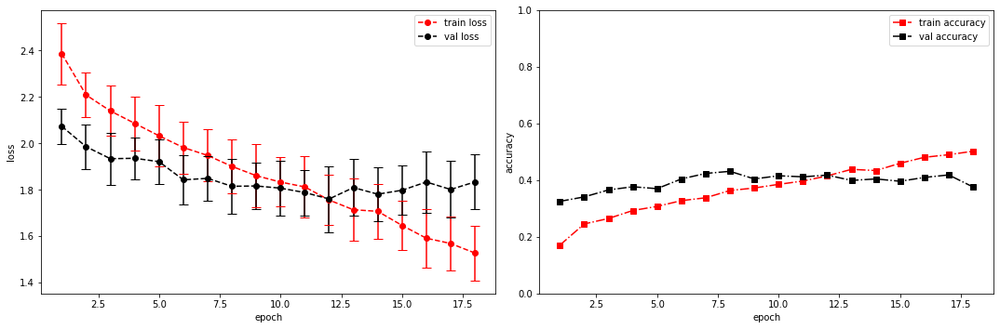

model saved
stopping early
Conv_3_layer
(1, 13, 517)
running model: id = Conv_3_layer, channels = [8, 8, 16]
device:  cuda
dataset metadata:  {'n_fft': 2048, 'hop_length': 256, 'n_mfcc': 13, 'notes': 'optional notes not passed'}
train model: data loaders initialized
sample shape =  (1, 13, 517)
model loaded
Layer (type:depth-idx)                   Output Shape              Param #
├─ConvBlock: 1-1                         [-1, 8, 13, 104]          --
|    └─Sequential: 2-1                   [-1, 8, 13, 104]          --
|    |    └─Conv2d: 3-1                  [-1, 8, 13, 517]          80
|    |    └─ReLU: 3-2                    [-1, 8, 13, 517]          --
|    |    └─MaxPool2d: 3-3               [-1, 8, 13, 104]          --
|    |    └─BatchNorm2d: 3-4             [-1, 8, 13, 104]          16
├─ConvBlock: 1-2                         [-1, 8, 13, 21]           --
|    └─Sequential: 2-2                   [-1, 8, 13, 21]           --
|    |    └─Conv2d: 3-5                  [-1, 8, 13, 104

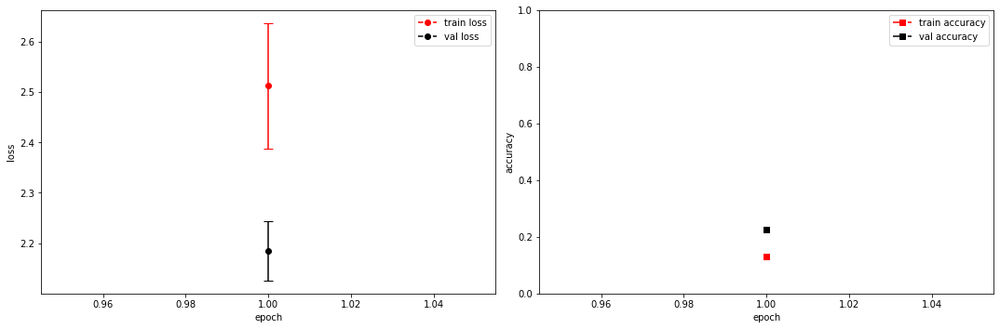

model saved


training epoch:  1
model set to train
Epoch [2/100], step [1/84],  Loss: 2.2148 +/- 0.0000,  accuracy: 0.01171875, time elapsed = 0.27478647232055664s
Epoch [2/100], step [17/84],  Loss: 2.3642 +/- 0.0867,  accuracy: 0.1748046875, time elapsed = 0.843156099319458s
Epoch [2/100], step [33/84],  Loss: 2.3282 +/- 0.0826,  accuracy: 0.1669921875, time elapsed = 0.8572423458099365s
Epoch [2/100], step [49/84],  Loss: 2.3133 +/- 0.1081,  accuracy: 0.1865234375, time elapsed = 0.8492732048034668s
Epoch [2/100], step [65/84],  Loss: 2.2462 +/- 0.0628,  accuracy: 0.2041015625, time elapsed = 0.8798389434814453s
Epoch [2/100], step [81/84],  Loss: 2.3237 +/- 0.0844,  accuracy: 0.18359375, time elapsed = 0.8743865489959717s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.18553048666790975,  precision = 0.18553048666790975 recall = 0.18553048666790975 f1 = 0.18553048666790975 ::: val: acc = 0.2878448918717375,  precision = 0.2878448918717375 recall = 0.2878448918717375 time e

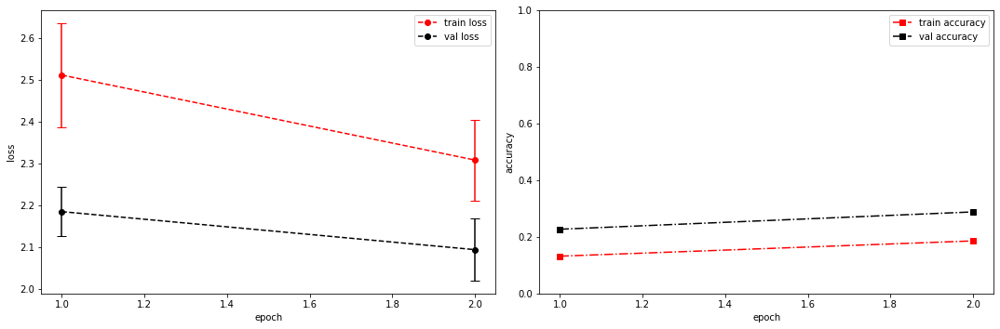

model saved


training epoch:  2
model set to train
Epoch [3/100], step [1/84],  Loss: 2.1392 +/- 0.0000,  accuracy: 0.0126953125, time elapsed = 0.27191829681396484s
Epoch [3/100], step [17/84],  Loss: 2.2946 +/- 0.1385,  accuracy: 0.173828125, time elapsed = 0.8672399520874023s
Epoch [3/100], step [33/84],  Loss: 2.2444 +/- 0.0958,  accuracy: 0.201171875, time elapsed = 0.8730976581573486s
Epoch [3/100], step [49/84],  Loss: 2.2802 +/- 0.1081,  accuracy: 0.197265625, time elapsed = 0.8716964721679688s
Epoch [3/100], step [65/84],  Loss: 2.1724 +/- 0.1217,  accuracy: 0.236328125, time elapsed = 0.8719298839569092s
Epoch [3/100], step [81/84],  Loss: 2.2154 +/- 0.0880,  accuracy: 0.2255859375, time elapsed = 0.868675708770752s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.2090247995524893,  precision = 0.2090247995524893 recall = 0.2090247995524893 f1 = 0.20902479955248932 ::: val: acc = 0.31841909023117076,  precision = 0.31841909023117076 recall = 0.31841909023117076 time e

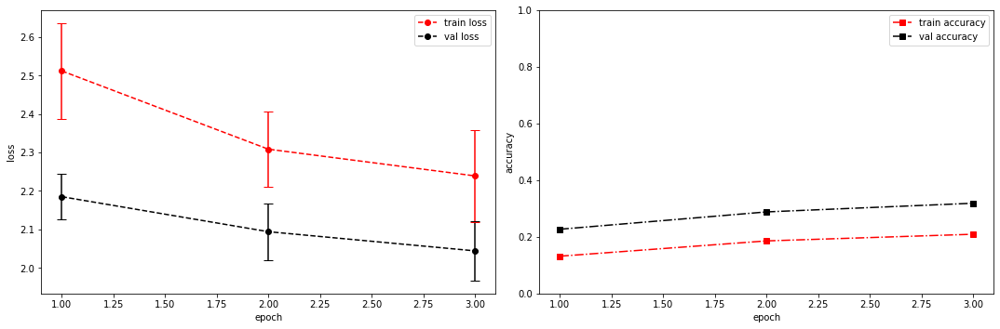

model saved


training epoch:  3
model set to train
Epoch [4/100], step [1/84],  Loss: 2.3324 +/- 0.0000,  accuracy: 0.01171875, time elapsed = 0.2685058116912842s
Epoch [4/100], step [17/84],  Loss: 2.2116 +/- 0.1112,  accuracy: 0.23828125, time elapsed = 0.9036540985107422s
Epoch [4/100], step [33/84],  Loss: 2.1600 +/- 0.0777,  accuracy: 0.2578125, time elapsed = 0.8900871276855469s
Epoch [4/100], step [49/84],  Loss: 2.2196 +/- 0.0934,  accuracy: 0.228515625, time elapsed = 0.8862080574035645s
Epoch [4/100], step [65/84],  Loss: 2.1814 +/- 0.0830,  accuracy: 0.236328125, time elapsed = 0.8598544597625732s
Epoch [4/100], step [81/84],  Loss: 2.1495 +/- 0.0781,  accuracy: 0.234375, time elapsed = 0.856564998626709s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.23792653365653552,  precision = 0.23792653365653552 recall = 0.23792653365653552 f1 = 0.23792653365653552 ::: val: acc = 0.34377330350484714,  precision = 0.34377330350484714 recall = 0.34377330350484714 time elapsed 

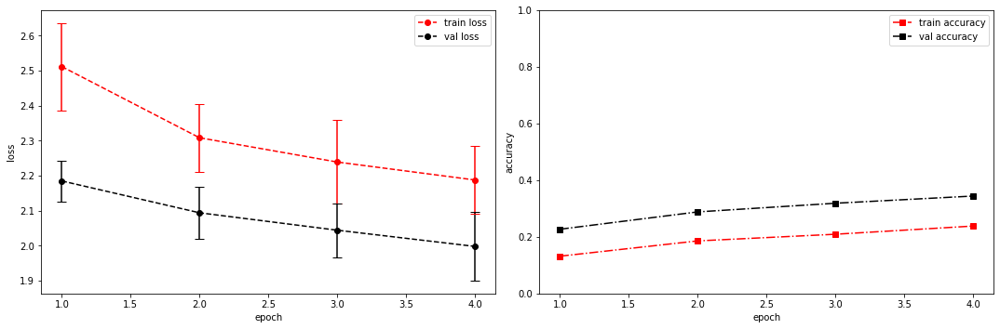

model saved


training epoch:  4
model set to train
Epoch [5/100], step [1/84],  Loss: 2.0898 +/- 0.0000,  accuracy: 0.0205078125, time elapsed = 0.2747762203216553s
Epoch [5/100], step [17/84],  Loss: 2.1199 +/- 0.1128,  accuracy: 0.275390625, time elapsed = 0.8792774677276611s
Epoch [5/100], step [33/84],  Loss: 2.1483 +/- 0.0728,  accuracy: 0.2666015625, time elapsed = 0.8640434741973877s
Epoch [5/100], step [49/84],  Loss: 2.1575 +/- 0.1078,  accuracy: 0.26171875, time elapsed = 0.8673906326293945s
Epoch [5/100], step [65/84],  Loss: 2.1244 +/- 0.0834,  accuracy: 0.265625, time elapsed = 0.876903772354126s
Epoch [5/100], step [81/84],  Loss: 2.1129 +/- 0.1308,  accuracy: 0.2607421875, time elapsed = 0.8695178031921387s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.26682826776058177,  precision = 0.26682826776058177 recall = 0.26682826776058177 f1 = 0.26682826776058177 ::: val: acc = 0.3415361670395227,  precision = 0.3415361670395227 recall = 0.3415361670395227 time elaps

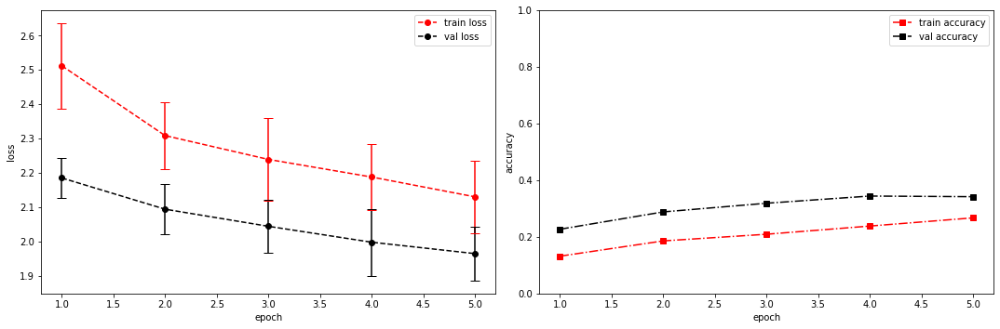

model saved


training epoch:  5
model set to train
Epoch [6/100], step [1/84],  Loss: 2.1527 +/- 0.0000,  accuracy: 0.0185546875, time elapsed = 0.2697124481201172s
Epoch [6/100], step [17/84],  Loss: 2.0605 +/- 0.0937,  accuracy: 0.2744140625, time elapsed = 0.8711810111999512s
Epoch [6/100], step [33/84],  Loss: 2.0742 +/- 0.0726,  accuracy: 0.26953125, time elapsed = 0.8778645992279053s
Epoch [6/100], step [49/84],  Loss: 2.1151 +/- 0.0975,  accuracy: 0.26953125, time elapsed = 0.8577804565429688s
Epoch [6/100], step [65/84],  Loss: 2.0806 +/- 0.0835,  accuracy: 0.2890625, time elapsed = 0.8725435733795166s
Epoch [6/100], step [81/84],  Loss: 2.0850 +/- 0.0981,  accuracy: 0.271484375, time elapsed = 0.8563506603240967s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.27633787059481635,  precision = 0.27633787059481635 recall = 0.27633787059481635 f1 = 0.27633787059481635 ::: val: acc = 0.35570469798657717,  precision = 0.35570469798657717 recall = 0.35570469798657717 time el

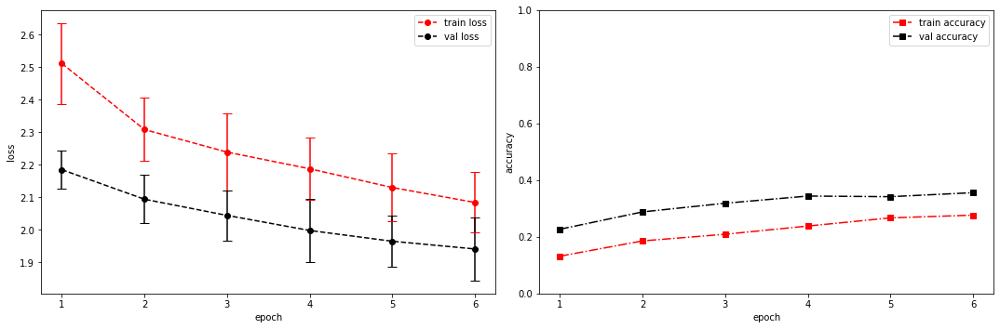

model saved


training epoch:  6
model set to train
Epoch [7/100], step [1/84],  Loss: 2.2042 +/- 0.0000,  accuracy: 0.015625, time elapsed = 0.26727795600891113s
Epoch [7/100], step [17/84],  Loss: 2.0789 +/- 0.0955,  accuracy: 0.2822265625, time elapsed = 0.8611021041870117s
Epoch [7/100], step [33/84],  Loss: 2.0793 +/- 0.0920,  accuracy: 0.2724609375, time elapsed = 0.8736155033111572s
Epoch [7/100], step [49/84],  Loss: 2.0908 +/- 0.0997,  accuracy: 0.287109375, time elapsed = 0.8739404678344727s
Epoch [7/100], step [65/84],  Loss: 2.0490 +/- 0.0895,  accuracy: 0.296875, time elapsed = 0.9031224250793457s
Epoch [7/100], step [81/84],  Loss: 2.0566 +/- 0.1022,  accuracy: 0.3017578125, time elapsed = 0.8940036296844482s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.2892038038411337,  precision = 0.2892038038411337 recall = 0.2892038038411337 f1 = 0.2892038038411337 ::: val: acc = 0.3639075316927666,  precision = 0.3639075316927666 recall = 0.3639075316927666 time elapsed =

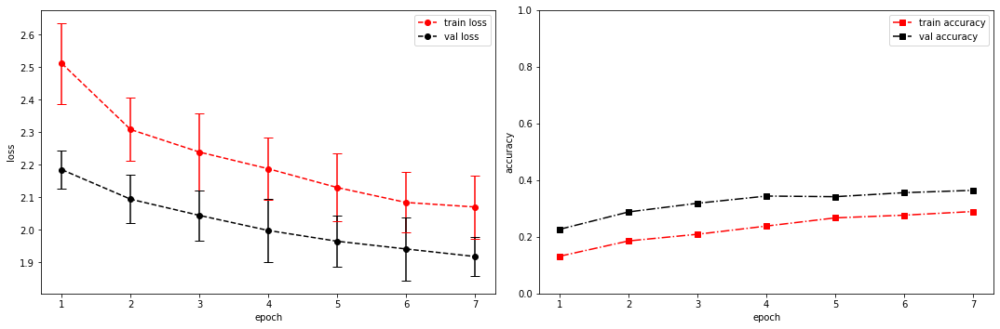

model saved


training epoch:  7
model set to train
Epoch [8/100], step [1/84],  Loss: 1.9916 +/- 0.0000,  accuracy: 0.0146484375, time elapsed = 0.26958155632019043s
Epoch [8/100], step [17/84],  Loss: 2.0212 +/- 0.0636,  accuracy: 0.30859375, time elapsed = 0.8708846569061279s
Epoch [8/100], step [33/84],  Loss: 2.0298 +/- 0.1279,  accuracy: 0.294921875, time elapsed = 0.8734183311462402s
Epoch [8/100], step [49/84],  Loss: 2.0291 +/- 0.1008,  accuracy: 0.3095703125, time elapsed = 0.9127070903778076s
Epoch [8/100], step [65/84],  Loss: 2.0691 +/- 0.0810,  accuracy: 0.2783203125, time elapsed = 0.8564386367797852s
Epoch [8/100], step [81/84],  Loss: 2.0294 +/- 0.0969,  accuracy: 0.2880859375, time elapsed = 0.8922107219696045s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.29591646466529925,  precision = 0.29591646466529925 recall = 0.29591646466529925 f1 = 0.29591646466529925 ::: val: acc = 0.3698732289336316,  precision = 0.3698732289336316 recall = 0.3698732289336316 time

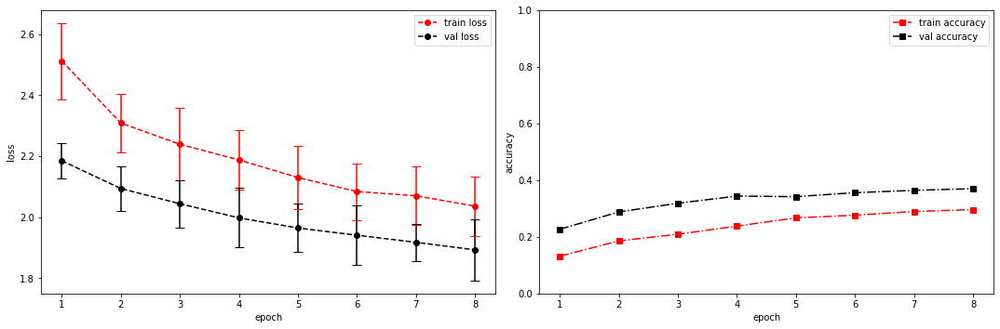

model saved


training epoch:  8
model set to train
Epoch [9/100], step [1/84],  Loss: 2.0656 +/- 0.0000,  accuracy: 0.0185546875, time elapsed = 0.2807612419128418s
Epoch [9/100], step [17/84],  Loss: 2.0906 +/- 0.1314,  accuracy: 0.2626953125, time elapsed = 0.8785741329193115s
Epoch [9/100], step [33/84],  Loss: 2.0326 +/- 0.0664,  accuracy: 0.2822265625, time elapsed = 0.8750855922698975s
Epoch [9/100], step [49/84],  Loss: 1.9831 +/- 0.1033,  accuracy: 0.3271484375, time elapsed = 0.8723926544189453s
Epoch [9/100], step [65/84],  Loss: 1.9449 +/- 0.0861,  accuracy: 0.33984375, time elapsed = 0.8600552082061768s
Epoch [9/100], step [81/84],  Loss: 1.9684 +/- 0.1036,  accuracy: 0.32421875, time elapsed = 0.8493056297302246s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.30915532351295916,  precision = 0.30915532351295916 recall = 0.30915532351295916 f1 = 0.30915532351295916 ::: val: acc = 0.3907531692766592,  precision = 0.3907531692766592 recall = 0.3907531692766592 time e

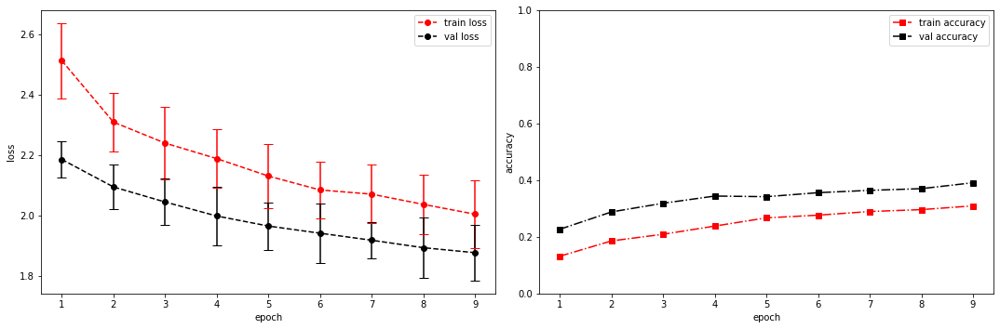

model saved


training epoch:  9
model set to train
Epoch [10/100], step [1/84],  Loss: 1.8409 +/- 0.0000,  accuracy: 0.0244140625, time elapsed = 0.2659296989440918s
Epoch [10/100], step [17/84],  Loss: 1.9585 +/- 0.1267,  accuracy: 0.328125, time elapsed = 0.8746061325073242s
Epoch [10/100], step [33/84],  Loss: 1.9374 +/- 0.0922,  accuracy: 0.3330078125, time elapsed = 0.8569247722625732s
Epoch [10/100], step [49/84],  Loss: 2.0458 +/- 0.1207,  accuracy: 0.302734375, time elapsed = 0.8493249416351318s
Epoch [10/100], step [65/84],  Loss: 1.9949 +/- 0.1090,  accuracy: 0.3154296875, time elapsed = 0.8777163028717041s
Epoch [10/100], step [81/84],  Loss: 2.0244 +/- 0.0893,  accuracy: 0.306640625, time elapsed = 0.8466577529907227s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.31680029834048107,  precision = 0.31680029834048107 recall = 0.31680029834048107 f1 = 0.31680029834048107 ::: val: acc = 0.378076062639821,  precision = 0.378076062639821 recall = 0.378076062639821 time 

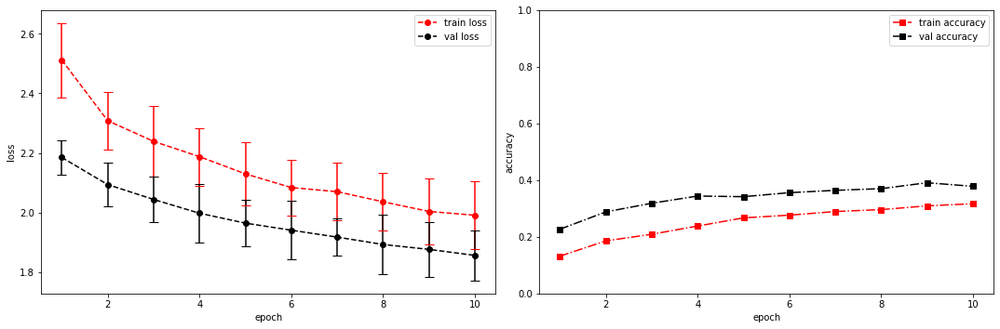

model saved


training epoch:  10
model set to train
Epoch [11/100], step [1/84],  Loss: 2.0062 +/- 0.0000,  accuracy: 0.0244140625, time elapsed = 0.2931702136993408s
Epoch [11/100], step [17/84],  Loss: 1.9556 +/- 0.1150,  accuracy: 0.3427734375, time elapsed = 0.8675215244293213s
Epoch [11/100], step [33/84],  Loss: 1.9433 +/- 0.1024,  accuracy: 0.326171875, time elapsed = 0.8878698348999023s
Epoch [11/100], step [49/84],  Loss: 1.9871 +/- 0.1024,  accuracy: 0.3125, time elapsed = 0.8554577827453613s
Epoch [11/100], step [65/84],  Loss: 1.9327 +/- 0.0711,  accuracy: 0.3408203125, time elapsed = 0.854912519454956s
Epoch [11/100], step [81/84],  Loss: 1.9549 +/- 0.1381,  accuracy: 0.322265625, time elapsed = 0.8777809143066406s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3296662315867984,  precision = 0.3296662315867984 recall = 0.3296662315867984 f1 = 0.3296662315867984 ::: val: acc = 0.3832960477255779,  precision = 0.3832960477255779 recall = 0.3832960477255779 time ela

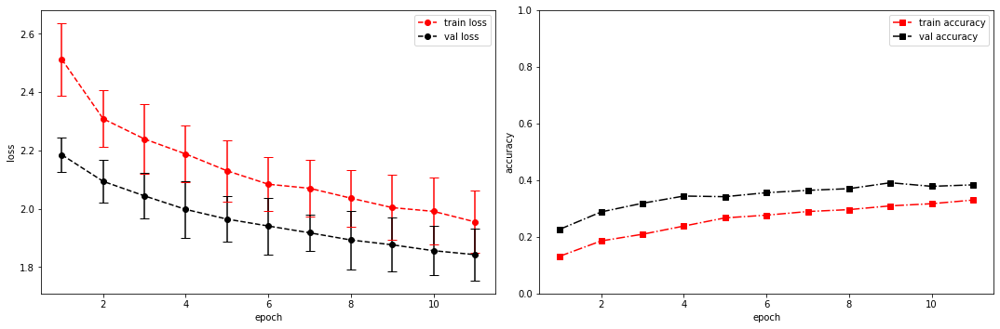

model saved


training epoch:  11
model set to train
Epoch [12/100], step [1/84],  Loss: 2.0301 +/- 0.0000,  accuracy: 0.01953125, time elapsed = 0.2977449893951416s
Epoch [12/100], step [17/84],  Loss: 1.9451 +/- 0.0939,  accuracy: 0.3203125, time elapsed = 0.8791141510009766s
Epoch [12/100], step [33/84],  Loss: 1.9305 +/- 0.0872,  accuracy: 0.3408203125, time elapsed = 0.8951489925384521s
Epoch [12/100], step [49/84],  Loss: 1.9432 +/- 0.1197,  accuracy: 0.333984375, time elapsed = 0.8777458667755127s
Epoch [12/100], step [65/84],  Loss: 1.9187 +/- 0.0928,  accuracy: 0.3408203125, time elapsed = 0.8736903667449951s
Epoch [12/100], step [81/84],  Loss: 1.9607 +/- 0.1190,  accuracy: 0.3173828125, time elapsed = 0.8657734394073486s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.33078500839082603,  precision = 0.33078500839082603 recall = 0.33078500839082603 f1 = 0.33078500839082603 ::: val: acc = 0.3870246085011186,  precision = 0.3870246085011186 recall = 0.3870246085011186 t

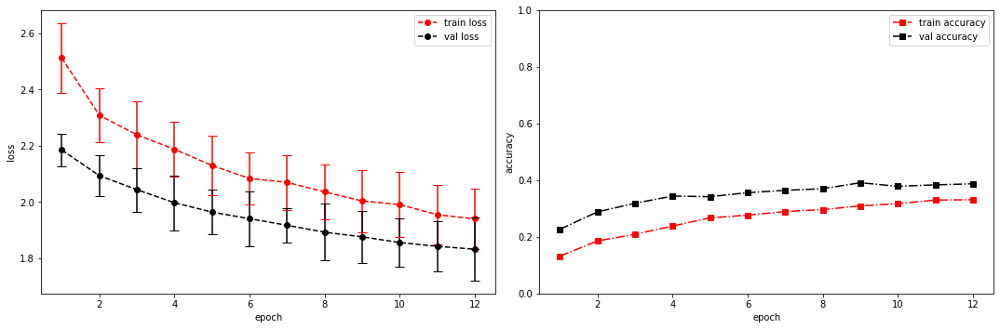

model saved


training epoch:  12
model set to train
Epoch [13/100], step [1/84],  Loss: 1.9176 +/- 0.0000,  accuracy: 0.0244140625, time elapsed = 0.27263450622558594s
Epoch [13/100], step [17/84],  Loss: 1.9303 +/- 0.1251,  accuracy: 0.3427734375, time elapsed = 0.8579277992248535s
Epoch [13/100], step [33/84],  Loss: 1.9180 +/- 0.0977,  accuracy: 0.3544921875, time elapsed = 0.884101152420044s
Epoch [13/100], step [49/84],  Loss: 1.9503 +/- 0.1012,  accuracy: 0.357421875, time elapsed = 0.8571929931640625s
Epoch [13/100], step [65/84],  Loss: 1.9140 +/- 0.0950,  accuracy: 0.357421875, time elapsed = 0.8514983654022217s
Epoch [13/100], step [81/84],  Loss: 1.8645 +/- 0.1031,  accuracy: 0.376953125, time elapsed = 0.8786971569061279s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3589408912921872,  precision = 0.3589408912921872 recall = 0.3589408912921872 f1 = 0.3589408912921872 ::: val: acc = 0.39299030574198357,  precision = 0.39299030574198357 recall = 0.39299030574198357

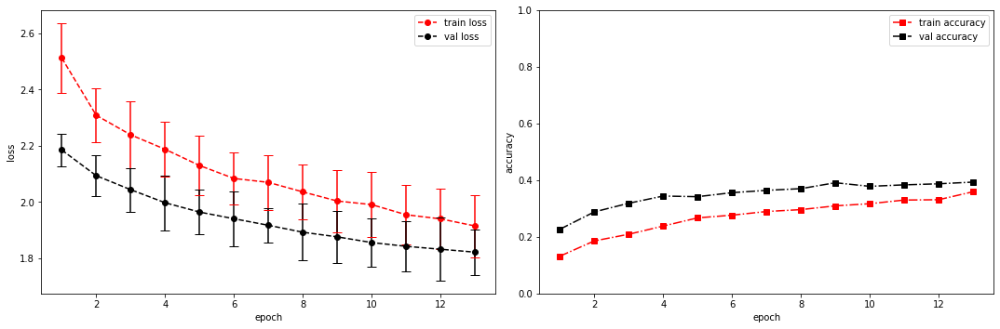

model saved


training epoch:  13
model set to train
Epoch [14/100], step [1/84],  Loss: 1.7738 +/- 0.0000,  accuracy: 0.0205078125, time elapsed = 0.30001330375671387s
Epoch [14/100], step [17/84],  Loss: 1.9096 +/- 0.0940,  accuracy: 0.353515625, time elapsed = 2.2195656299591064s
Epoch [14/100], step [33/84],  Loss: 1.9182 +/- 0.0935,  accuracy: 0.3388671875, time elapsed = 0.8390440940856934s
Epoch [14/100], step [49/84],  Loss: 1.8957 +/- 0.1185,  accuracy: 0.369140625, time elapsed = 0.8477652072906494s
Epoch [14/100], step [65/84],  Loss: 1.9117 +/- 0.0759,  accuracy: 0.349609375, time elapsed = 1.8813002109527588s
Epoch [14/100], step [81/84],  Loss: 1.8730 +/- 0.1087,  accuracy: 0.3623046875, time elapsed = 0.8791196346282959s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3535334700727205,  precision = 0.3535334700727205 recall = 0.3535334700727205 f1 = 0.3535334700727205 ::: val: acc = 0.3877703206562267,  precision = 0.3877703206562267 recall = 0.3877703206562267 t

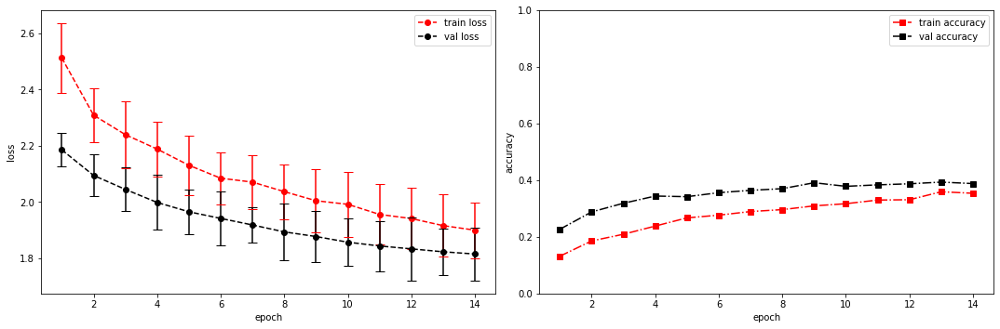

model saved


training epoch:  14
model set to train
Epoch [15/100], step [1/84],  Loss: 1.8806 +/- 0.0000,  accuracy: 0.0244140625, time elapsed = 0.267927885055542s
Epoch [15/100], step [17/84],  Loss: 1.8999 +/- 0.1093,  accuracy: 0.3486328125, time elapsed = 0.8799643516540527s
Epoch [15/100], step [33/84],  Loss: 1.8751 +/- 0.1218,  accuracy: 0.349609375, time elapsed = 0.8906269073486328s
Epoch [15/100], step [49/84],  Loss: 1.8744 +/- 0.1214,  accuracy: 0.357421875, time elapsed = 0.8724145889282227s
Epoch [15/100], step [65/84],  Loss: 1.8559 +/- 0.1156,  accuracy: 0.3671875, time elapsed = 0.8630642890930176s
Epoch [15/100], step [81/84],  Loss: 1.9007 +/- 0.0855,  accuracy: 0.353515625, time elapsed = 0.8948991298675537s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3553980980794332,  precision = 0.3553980980794332 recall = 0.3553980980794332 f1 = 0.35539809807943323 ::: val: acc = 0.39671886651752425,  precision = 0.39671886651752425 recall = 0.39671886651752425 ti

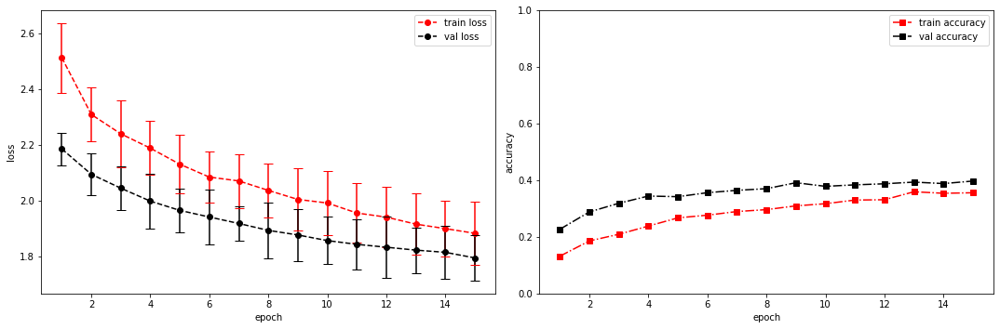

model saved


training epoch:  15
model set to train
Epoch [16/100], step [1/84],  Loss: 1.7491 +/- 0.0000,  accuracy: 0.0283203125, time elapsed = 0.2668609619140625s
Epoch [16/100], step [17/84],  Loss: 1.8630 +/- 0.1084,  accuracy: 0.3544921875, time elapsed = 0.8758265972137451s
Epoch [16/100], step [33/84],  Loss: 1.8574 +/- 0.1141,  accuracy: 0.3857421875, time elapsed = 0.8604304790496826s
Epoch [16/100], step [49/84],  Loss: 1.8738 +/- 0.0897,  accuracy: 0.36328125, time elapsed = 0.879697322845459s
Epoch [16/100], step [65/84],  Loss: 1.8672 +/- 0.1456,  accuracy: 0.369140625, time elapsed = 0.8452291488647461s
Epoch [16/100], step [81/84],  Loss: 1.8937 +/- 0.0958,  accuracy: 0.357421875, time elapsed = 0.874675989151001s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.36639940331903786,  precision = 0.36639940331903786 recall = 0.36639940331903786 f1 = 0.36639940331903786 ::: val: acc = 0.3989560029828486,  precision = 0.3989560029828486 recall = 0.3989560029828486 t

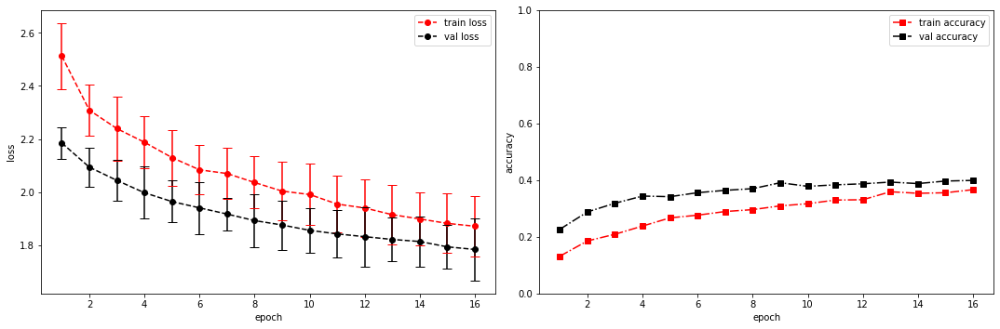

model saved


training epoch:  16
model set to train
Epoch [17/100], step [1/84],  Loss: 1.8272 +/- 0.0000,  accuracy: 0.029296875, time elapsed = 0.2788875102996826s
Epoch [17/100], step [17/84],  Loss: 1.8409 +/- 0.1432,  accuracy: 0.384765625, time elapsed = 0.8912591934204102s
Epoch [17/100], step [33/84],  Loss: 1.8230 +/- 0.1181,  accuracy: 0.3671875, time elapsed = 0.874373197555542s
Epoch [17/100], step [49/84],  Loss: 1.9013 +/- 0.1459,  accuracy: 0.3486328125, time elapsed = 0.9191560745239258s
Epoch [17/100], step [65/84],  Loss: 1.7576 +/- 0.0917,  accuracy: 0.40625, time elapsed = 0.8746657371520996s
Epoch [17/100], step [81/84],  Loss: 1.8828 +/- 0.1051,  accuracy: 0.3662109375, time elapsed = 0.8573215007781982s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3766548573559575,  precision = 0.3766548573559575 recall = 0.3766548573559575 f1 = 0.3766548573559575 ::: val: acc = 0.3989560029828486,  precision = 0.3989560029828486 recall = 0.3989560029828486 time elaps

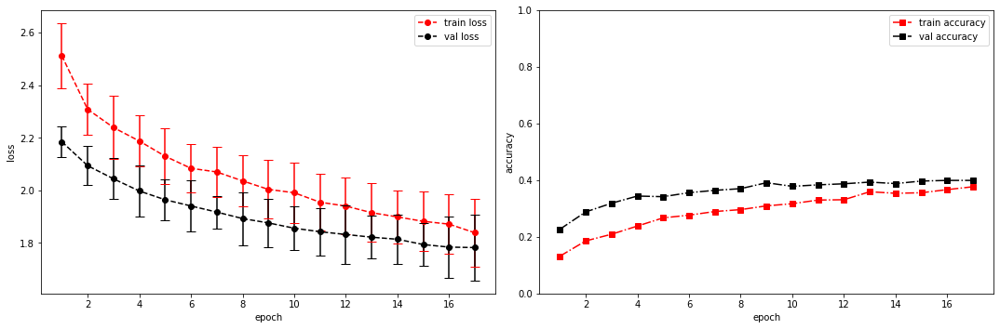

model saved


training epoch:  17
model set to train
Epoch [18/100], step [1/84],  Loss: 2.0215 +/- 0.0000,  accuracy: 0.0205078125, time elapsed = 0.27877116203308105s
Epoch [18/100], step [17/84],  Loss: 1.7890 +/- 0.1056,  accuracy: 0.388671875, time elapsed = 0.8751273155212402s
Epoch [18/100], step [33/84],  Loss: 1.8401 +/- 0.0922,  accuracy: 0.3779296875, time elapsed = 0.9112682342529297s
Epoch [18/100], step [49/84],  Loss: 1.8776 +/- 0.1264,  accuracy: 0.3525390625, time elapsed = 0.8929336071014404s
Epoch [18/100], step [65/84],  Loss: 1.8656 +/- 0.1085,  accuracy: 0.3642578125, time elapsed = 0.8881146907806396s
Epoch [18/100], step [81/84],  Loss: 1.8917 +/- 0.1119,  accuracy: 0.3388671875, time elapsed = 0.8719630241394043s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3660264777176953,  precision = 0.3660264777176953 recall = 0.3660264777176953 f1 = 0.3660264777176953 ::: val: acc = 0.40566741237882176,  precision = 0.40566741237882176 recall = 0.40566741237882

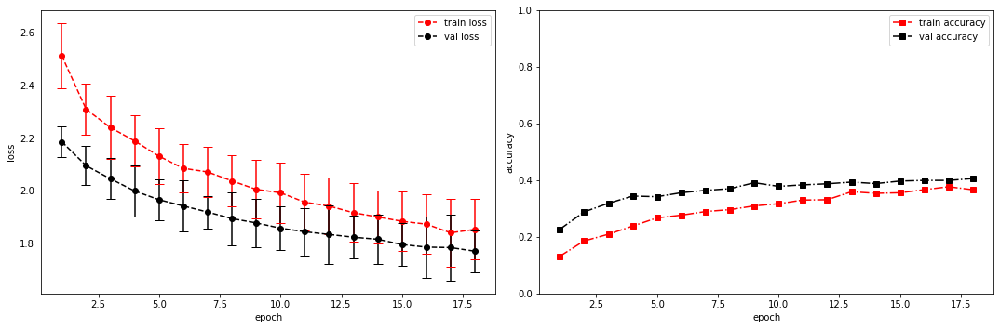

model saved


training epoch:  18
model set to train
Epoch [19/100], step [1/84],  Loss: 1.7911 +/- 0.0000,  accuracy: 0.0283203125, time elapsed = 0.2777831554412842s
Epoch [19/100], step [17/84],  Loss: 1.8484 +/- 0.1418,  accuracy: 0.384765625, time elapsed = 0.8847193717956543s
Epoch [19/100], step [33/84],  Loss: 1.8211 +/- 0.1270,  accuracy: 0.392578125, time elapsed = 0.8813924789428711s
Epoch [19/100], step [49/84],  Loss: 1.8363 +/- 0.1292,  accuracy: 0.36328125, time elapsed = 0.8814127445220947s
Epoch [19/100], step [65/84],  Loss: 1.7862 +/- 0.0866,  accuracy: 0.3837890625, time elapsed = 0.8668732643127441s
Epoch [19/100], step [81/84],  Loss: 1.8092 +/- 0.0852,  accuracy: 0.40625, time elapsed = 0.864208459854126s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3891478650009323,  precision = 0.3891478650009323 recall = 0.3891478650009323 f1 = 0.38914786500093235 ::: val: acc = 0.4116331096196868,  precision = 0.4116331096196868 recall = 0.4116331096196868 time ela

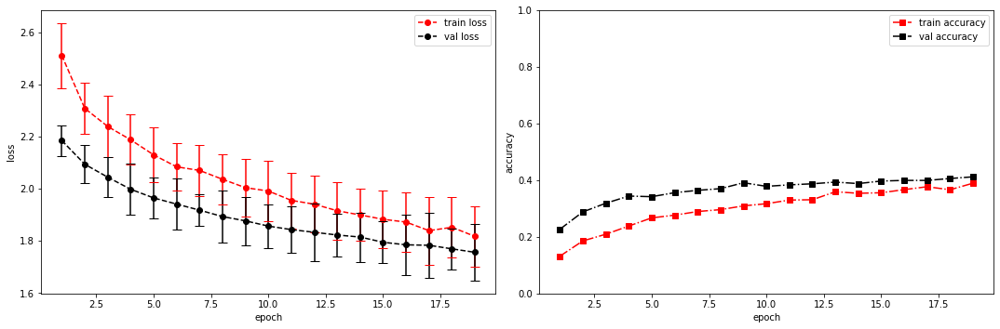

model saved


training epoch:  19
model set to train
Epoch [20/100], step [1/84],  Loss: 1.9118 +/- 0.0000,  accuracy: 0.0224609375, time elapsed = 0.27826786041259766s
Epoch [20/100], step [17/84],  Loss: 1.7943 +/- 0.1353,  accuracy: 0.390625, time elapsed = 0.8876574039459229s
Epoch [20/100], step [33/84],  Loss: 1.7870 +/- 0.0904,  accuracy: 0.396484375, time elapsed = 0.8691470623016357s
Epoch [20/100], step [49/84],  Loss: 1.7926 +/- 0.0910,  accuracy: 0.369140625, time elapsed = 0.9057698249816895s
Epoch [20/100], step [65/84],  Loss: 1.8272 +/- 0.0889,  accuracy: 0.384765625, time elapsed = 0.8713057041168213s
Epoch [20/100], step [81/84],  Loss: 1.8145 +/- 0.1337,  accuracy: 0.375, time elapsed = 0.8941307067871094s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.38299459257878055,  precision = 0.38299459257878055 recall = 0.38299459257878055 f1 = 0.38299459257878055 ::: val: acc = 0.40492170022371365,  precision = 0.40492170022371365 recall = 0.40492170022371365 time 

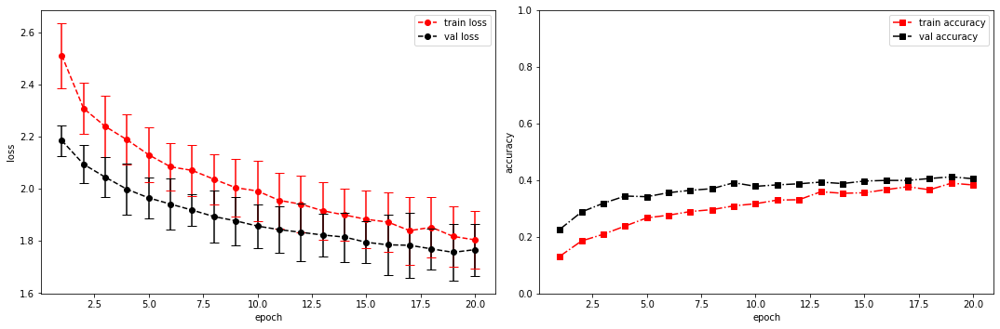

model saved


training epoch:  20
model set to train
Epoch [21/100], step [1/84],  Loss: 1.9013 +/- 0.0000,  accuracy: 0.021484375, time elapsed = 0.27614521980285645s
Epoch [21/100], step [17/84],  Loss: 1.7682 +/- 0.1092,  accuracy: 0.4140625, time elapsed = 0.8916428089141846s
Epoch [21/100], step [33/84],  Loss: 1.7608 +/- 0.0612,  accuracy: 0.392578125, time elapsed = 0.8540241718292236s
Epoch [21/100], step [49/84],  Loss: 1.7954 +/- 0.1015,  accuracy: 0.40234375, time elapsed = 0.8685019016265869s
Epoch [21/100], step [65/84],  Loss: 1.8406 +/- 0.1370,  accuracy: 0.357421875, time elapsed = 0.8577785491943359s
Epoch [21/100], step [81/84],  Loss: 1.7719 +/- 0.1457,  accuracy: 0.412109375, time elapsed = 0.8498516082763672s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.39511467462241284,  precision = 0.39511467462241284 recall = 0.39511467462241284 f1 = 0.39511467462241284 ::: val: acc = 0.40939597315436244,  precision = 0.40939597315436244 recall = 0.40939597315436244 

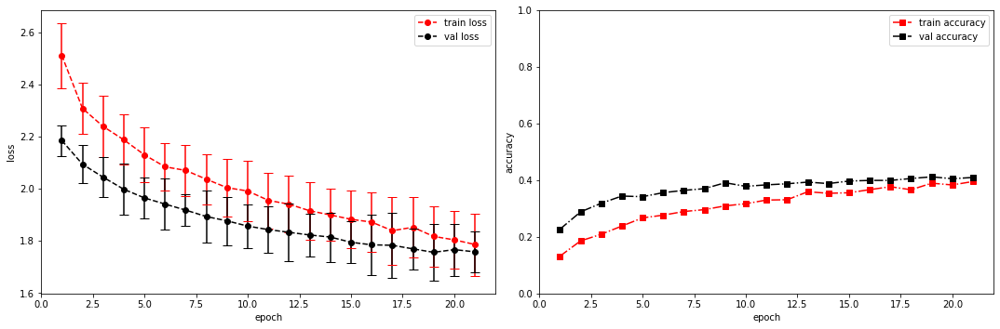

model saved


training epoch:  21
model set to train
Epoch [22/100], step [1/84],  Loss: 1.6449 +/- 0.0000,  accuracy: 0.0322265625, time elapsed = 0.28432130813598633s
Epoch [22/100], step [17/84],  Loss: 1.7323 +/- 0.0823,  accuracy: 0.4228515625, time elapsed = 0.859642744064331s
Epoch [22/100], step [33/84],  Loss: 1.7778 +/- 0.1130,  accuracy: 0.392578125, time elapsed = 0.8686695098876953s
Epoch [22/100], step [49/84],  Loss: 1.8194 +/- 0.1105,  accuracy: 0.3935546875, time elapsed = 0.8681182861328125s
Epoch [22/100], step [65/84],  Loss: 1.8101 +/- 0.1101,  accuracy: 0.3876953125, time elapsed = 0.8675494194030762s
Epoch [22/100], step [81/84],  Loss: 1.7607 +/- 0.1375,  accuracy: 0.3955078125, time elapsed = 0.8615157604217529s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3984710050344956,  precision = 0.3984710050344956 recall = 0.3984710050344956 f1 = 0.3984710050344956 ::: val: acc = 0.4161073825503356,  precision = 0.4161073825503356 recall = 0.4161073825503356 

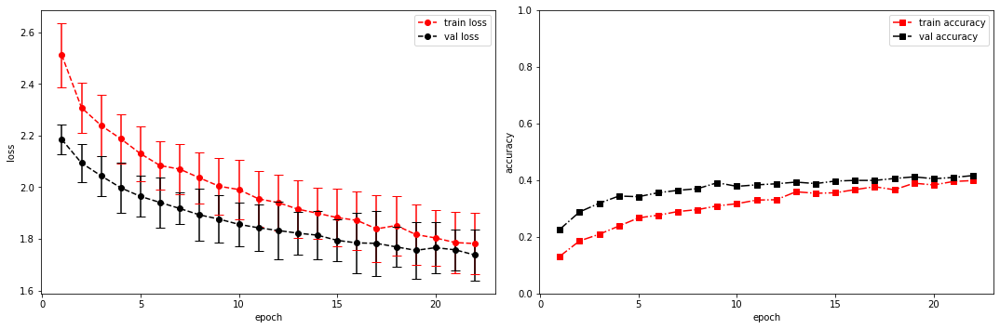

model saved


training epoch:  22
model set to train
Epoch [23/100], step [1/84],  Loss: 1.9374 +/- 0.0000,  accuracy: 0.0205078125, time elapsed = 0.26592588424682617s
Epoch [23/100], step [17/84],  Loss: 1.7667 +/- 0.1053,  accuracy: 0.4169921875, time elapsed = 0.8630130290985107s
Epoch [23/100], step [33/84],  Loss: 1.7562 +/- 0.1120,  accuracy: 0.4150390625, time elapsed = 0.8825950622558594s
Epoch [23/100], step [49/84],  Loss: 1.8151 +/- 0.1281,  accuracy: 0.396484375, time elapsed = 0.8760769367218018s
Epoch [23/100], step [65/84],  Loss: 1.7995 +/- 0.1309,  accuracy: 0.392578125, time elapsed = 0.8718500137329102s
Epoch [23/100], step [81/84],  Loss: 1.7505 +/- 0.1029,  accuracy: 0.4208984375, time elapsed = 0.8674700260162354s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.40723475666604514,  precision = 0.40723475666604514 recall = 0.40723475666604514 f1 = 0.40723475666604514 ::: val: acc = 0.4153616703952274,  precision = 0.4153616703952274 recall = 0.4153616703952

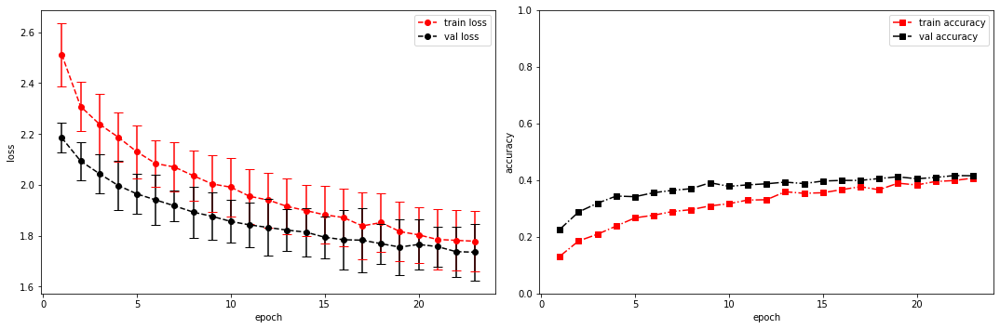

model saved


training epoch:  23
model set to train
Epoch [24/100], step [1/84],  Loss: 1.7025 +/- 0.0000,  accuracy: 0.0302734375, time elapsed = 0.26885509490966797s
Epoch [24/100], step [17/84],  Loss: 1.7703 +/- 0.1361,  accuracy: 0.4072265625, time elapsed = 0.8963594436645508s
Epoch [24/100], step [33/84],  Loss: 1.7502 +/- 0.1050,  accuracy: 0.4130859375, time elapsed = 0.8866004943847656s
Epoch [24/100], step [49/84],  Loss: 1.7393 +/- 0.1251,  accuracy: 0.408203125, time elapsed = 0.87139892578125s
Epoch [24/100], step [65/84],  Loss: 1.7377 +/- 0.0991,  accuracy: 0.41015625, time elapsed = 0.8729343414306641s
Epoch [24/100], step [81/84],  Loss: 1.7269 +/- 0.1182,  accuracy: 0.423828125, time elapsed = 0.8747153282165527s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4156255826962521,  precision = 0.4156255826962521 recall = 0.4156255826962521 f1 = 0.4156255826962521 ::: val: acc = 0.41834451901565994,  precision = 0.41834451901565994 recall = 0.41834451901565994 t

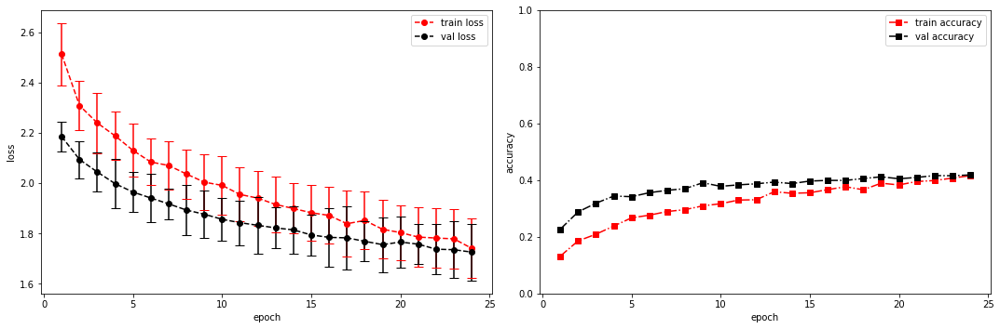

model saved


training epoch:  24
model set to train
Epoch [25/100], step [1/84],  Loss: 1.8886 +/- 0.0000,  accuracy: 0.0234375, time elapsed = 0.2843489646911621s
Epoch [25/100], step [17/84],  Loss: 1.7989 +/- 0.1356,  accuracy: 0.392578125, time elapsed = 0.880256175994873s
Epoch [25/100], step [33/84],  Loss: 1.7146 +/- 0.1163,  accuracy: 0.4248046875, time elapsed = 0.8708629608154297s
Epoch [25/100], step [49/84],  Loss: 1.7063 +/- 0.1078,  accuracy: 0.435546875, time elapsed = 0.8691914081573486s
Epoch [25/100], step [65/84],  Loss: 1.7498 +/- 0.1235,  accuracy: 0.41015625, time elapsed = 0.9024703502655029s
Epoch [25/100], step [81/84],  Loss: 1.7230 +/- 0.1033,  accuracy: 0.4208984375, time elapsed = 0.8992054462432861s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4139474174902107,  precision = 0.4139474174902107 recall = 0.4139474174902107 f1 = 0.4139474174902107 ::: val: acc = 0.4235645041014168,  precision = 0.4235645041014168 recall = 0.4235645041014168 time el

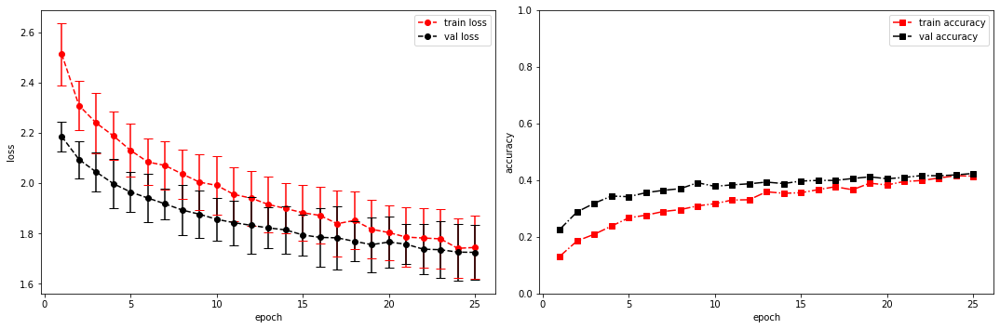

model saved


training epoch:  25
model set to train
Epoch [26/100], step [1/84],  Loss: 1.8000 +/- 0.0000,  accuracy: 0.025390625, time elapsed = 0.278872013092041s
Epoch [26/100], step [17/84],  Loss: 1.7658 +/- 0.1233,  accuracy: 0.39453125, time elapsed = 0.9016687870025635s
Epoch [26/100], step [33/84],  Loss: 1.6872 +/- 0.1246,  accuracy: 0.4423828125, time elapsed = 0.8772599697113037s
Epoch [26/100], step [49/84],  Loss: 1.7018 +/- 0.0793,  accuracy: 0.435546875, time elapsed = 0.8961806297302246s
Epoch [26/100], step [65/84],  Loss: 1.7510 +/- 0.0899,  accuracy: 0.416015625, time elapsed = 0.8681399822235107s
Epoch [26/100], step [81/84],  Loss: 1.7127 +/- 0.1103,  accuracy: 0.4228515625, time elapsed = 0.8712468147277832s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4195413015103487,  precision = 0.4195413015103487 recall = 0.4195413015103487 f1 = 0.4195413015103487 ::: val: acc = 0.42058165548098436,  precision = 0.42058165548098436 recall = 0.42058165548098436 ti

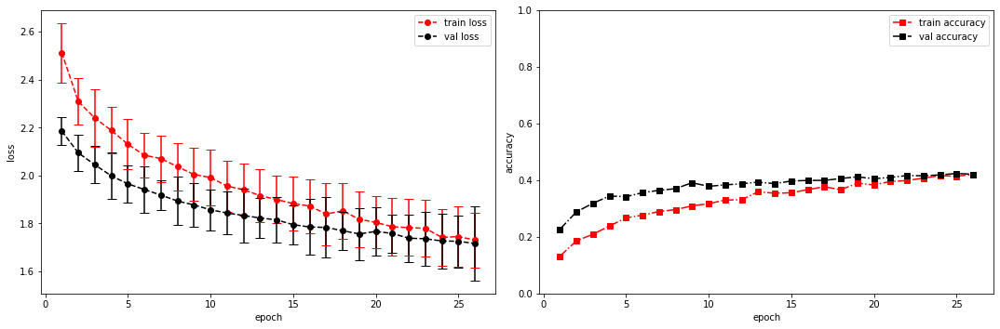

model saved


training epoch:  26
model set to train
Epoch [27/100], step [1/84],  Loss: 1.7101 +/- 0.0000,  accuracy: 0.02734375, time elapsed = 0.28002190589904785s
Epoch [27/100], step [17/84],  Loss: 1.6920 +/- 0.1223,  accuracy: 0.44140625, time elapsed = 0.8965585231781006s
Epoch [27/100], step [33/84],  Loss: 1.7150 +/- 0.1333,  accuracy: 0.41796875, time elapsed = 0.8747189044952393s
Epoch [27/100], step [49/84],  Loss: 1.6943 +/- 0.1424,  accuracy: 0.4326171875, time elapsed = 0.8552241325378418s
Epoch [27/100], step [65/84],  Loss: 1.7421 +/- 0.0934,  accuracy: 0.412109375, time elapsed = 0.856992244720459s
Epoch [27/100], step [81/84],  Loss: 1.7265 +/- 0.1442,  accuracy: 0.419921875, time elapsed = 0.8584845066070557s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4262539623345143,  precision = 0.4262539623345143 recall = 0.4262539623345143 f1 = 0.4262539623345143 ::: val: acc = 0.4235645041014168,  precision = 0.4235645041014168 recall = 0.4235645041014168 time el

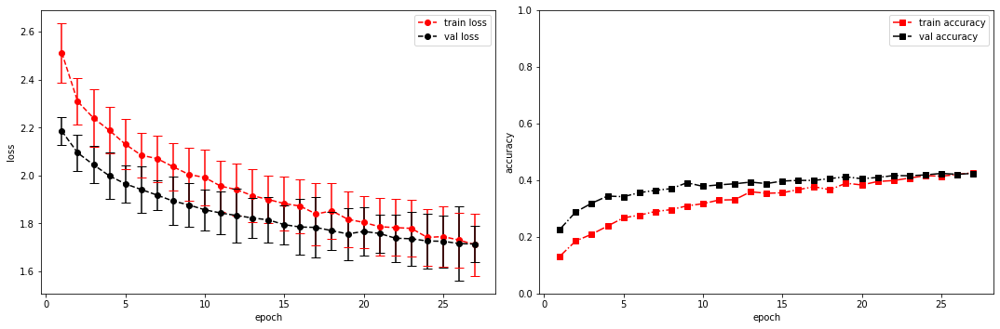

model saved


training epoch:  27
model set to train
Epoch [28/100], step [1/84],  Loss: 1.7006 +/- 0.0000,  accuracy: 0.025390625, time elapsed = 0.2692747116088867s
Epoch [28/100], step [17/84],  Loss: 1.7147 +/- 0.1355,  accuracy: 0.4326171875, time elapsed = 0.8810024261474609s
Epoch [28/100], step [33/84],  Loss: 1.7111 +/- 0.0935,  accuracy: 0.42578125, time elapsed = 0.8637979030609131s
Epoch [28/100], step [49/84],  Loss: 1.6765 +/- 0.0944,  accuracy: 0.443359375, time elapsed = 0.8859803676605225s
Epoch [28/100], step [65/84],  Loss: 1.6628 +/- 0.1263,  accuracy: 0.451171875, time elapsed = 0.8660130500793457s
Epoch [28/100], step [81/84],  Loss: 1.6845 +/- 0.1078,  accuracy: 0.4326171875, time elapsed = 0.8659377098083496s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4353906395674063,  precision = 0.4353906395674063 recall = 0.4353906395674063 f1 = 0.4353906395674063 ::: val: acc = 0.4220730797912006,  precision = 0.4220730797912006 recall = 0.4220730797912006 time

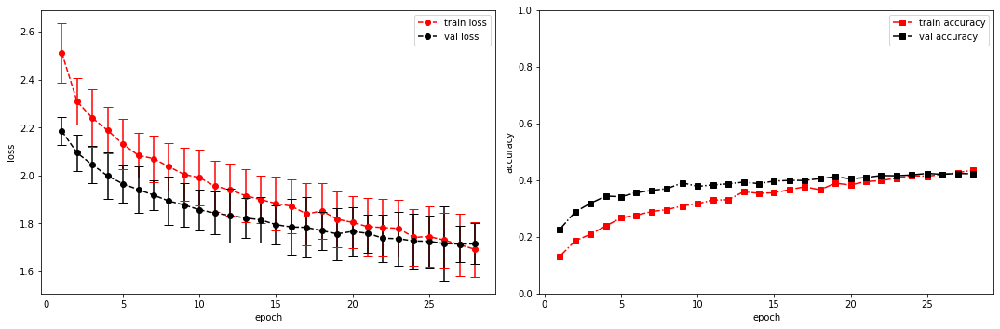

model saved


training epoch:  28
model set to train
Epoch [29/100], step [1/84],  Loss: 1.6899 +/- 0.0000,  accuracy: 0.0263671875, time elapsed = 0.29537177085876465s
Epoch [29/100], step [17/84],  Loss: 1.6810 +/- 0.1042,  accuracy: 0.4345703125, time elapsed = 0.8936877250671387s
Epoch [29/100], step [33/84],  Loss: 1.7083 +/- 0.1223,  accuracy: 0.41015625, time elapsed = 0.8631651401519775s
Epoch [29/100], step [49/84],  Loss: 1.6857 +/- 0.0791,  accuracy: 0.44140625, time elapsed = 0.8814208507537842s
Epoch [29/100], step [65/84],  Loss: 1.6757 +/- 0.1648,  accuracy: 0.4560546875, time elapsed = 0.896641731262207s
Epoch [29/100], step [81/84],  Loss: 1.6930 +/- 0.1183,  accuracy: 0.4365234375, time elapsed = 0.915475606918335s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4331530859593511,  precision = 0.4331530859593511 recall = 0.4331530859593511 f1 = 0.4331530859593511 ::: val: acc = 0.43027591349739003,  precision = 0.43027591349739003 recall = 0.43027591349739003 t

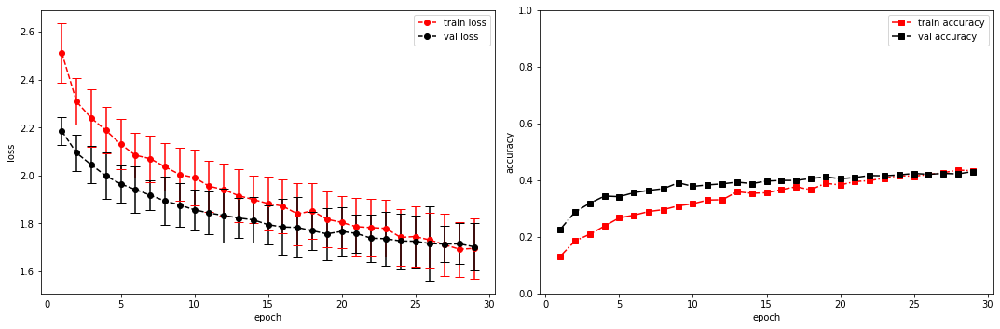

model saved


training epoch:  29
model set to train
Epoch [30/100], step [1/84],  Loss: 1.9346 +/- 0.0000,  accuracy: 0.0205078125, time elapsed = 0.28017401695251465s
Epoch [30/100], step [17/84],  Loss: 1.6712 +/- 0.1416,  accuracy: 0.4306640625, time elapsed = 0.9345040321350098s
Epoch [30/100], step [33/84],  Loss: 1.6824 +/- 0.0935,  accuracy: 0.435546875, time elapsed = 0.905717134475708s
Epoch [30/100], step [49/84],  Loss: 1.6844 +/- 0.1488,  accuracy: 0.4228515625, time elapsed = 0.9164023399353027s
Epoch [30/100], step [65/84],  Loss: 1.6819 +/- 0.0877,  accuracy: 0.44140625, time elapsed = 0.8901762962341309s
Epoch [30/100], step [81/84],  Loss: 1.6508 +/- 0.0910,  accuracy: 0.44140625, time elapsed = 0.8844687938690186s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.43203430915532354,  precision = 0.43203430915532354 recall = 0.43203430915532354 f1 = 0.43203430915532354 ::: val: acc = 0.4317673378076063,  precision = 0.4317673378076063 recall = 0.4317673378076063 

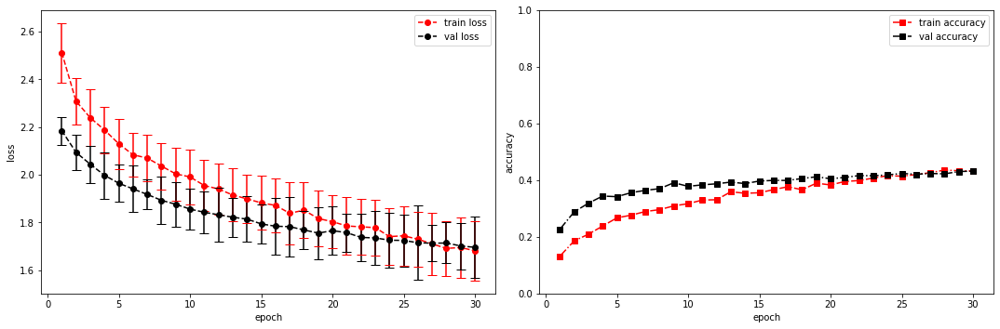

model saved


training epoch:  30
model set to train
Epoch [31/100], step [1/84],  Loss: 1.5598 +/- 0.0000,  accuracy: 0.029296875, time elapsed = 0.2821054458618164s
Epoch [31/100], step [17/84],  Loss: 1.6499 +/- 0.1064,  accuracy: 0.4560546875, time elapsed = 0.9168100357055664s
Epoch [31/100], step [33/84],  Loss: 1.5904 +/- 0.1184,  accuracy: 0.4873046875, time elapsed = 0.8775386810302734s
Epoch [31/100], step [49/84],  Loss: 1.7279 +/- 0.1484,  accuracy: 0.421875, time elapsed = 0.8538057804107666s
Epoch [31/100], step [65/84],  Loss: 1.6828 +/- 0.0937,  accuracy: 0.431640625, time elapsed = 0.8690757751464844s
Epoch [31/100], step [81/84],  Loss: 1.6990 +/- 0.1438,  accuracy: 0.4248046875, time elapsed = 0.9295988082885742s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4447137796009696,  precision = 0.4447137796009696 recall = 0.4447137796009696 f1 = 0.4447137796009696 ::: val: acc = 0.4272930648769575,  precision = 0.4272930648769575 recall = 0.4272930648769575 time 

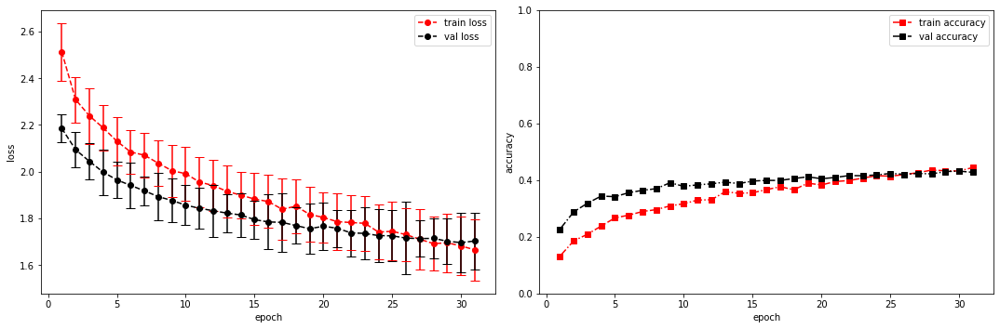

model saved


training epoch:  31
model set to train
Epoch [32/100], step [1/84],  Loss: 1.6695 +/- 0.0000,  accuracy: 0.025390625, time elapsed = 0.29607701301574707s
Epoch [32/100], step [17/84],  Loss: 1.6577 +/- 0.1042,  accuracy: 0.4375, time elapsed = 0.8870651721954346s
Epoch [32/100], step [33/84],  Loss: 1.6422 +/- 0.1391,  accuracy: 0.4423828125, time elapsed = 0.8599629402160645s
Epoch [32/100], step [49/84],  Loss: 1.6133 +/- 0.1187,  accuracy: 0.455078125, time elapsed = 0.8682832717895508s
Epoch [32/100], step [65/84],  Loss: 1.6231 +/- 0.0970,  accuracy: 0.48046875, time elapsed = 0.8628349304199219s
Epoch [32/100], step [81/84],  Loss: 1.6696 +/- 0.1302,  accuracy: 0.44140625, time elapsed = 0.8674547672271729s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4499347380197651,  precision = 0.4499347380197651 recall = 0.4499347380197651 f1 = 0.4499347380197651 ::: val: acc = 0.4272930648769575,  precision = 0.4272930648769575 recall = 0.4272930648769575 time elaps

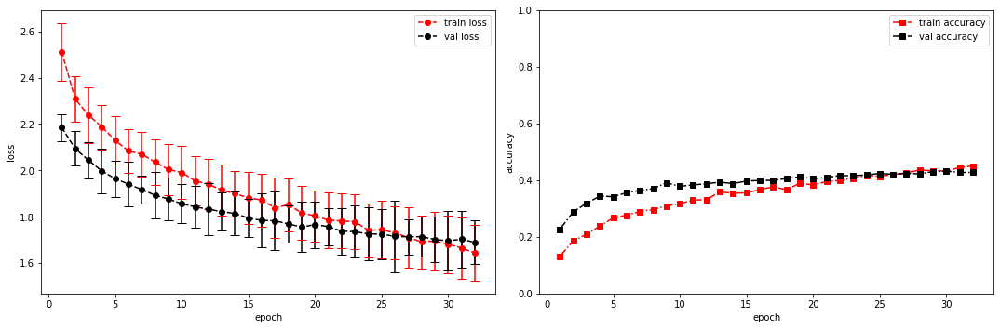

model saved


training epoch:  32
model set to train
Epoch [33/100], step [1/84],  Loss: 1.5742 +/- 0.0000,  accuracy: 0.0341796875, time elapsed = 0.2759850025177002s
Epoch [33/100], step [17/84],  Loss: 1.6310 +/- 0.1115,  accuracy: 0.47265625, time elapsed = 0.8936636447906494s
Epoch [33/100], step [33/84],  Loss: 1.6544 +/- 0.0612,  accuracy: 0.447265625, time elapsed = 0.8703277111053467s
Epoch [33/100], step [49/84],  Loss: 1.6283 +/- 0.0923,  accuracy: 0.4580078125, time elapsed = 0.8698186874389648s
Epoch [33/100], step [65/84],  Loss: 1.6631 +/- 0.1610,  accuracy: 0.44921875, time elapsed = 0.8694851398468018s
Epoch [33/100], step [81/84],  Loss: 1.6274 +/- 0.1143,  accuracy: 0.4599609375, time elapsed = 0.8746366500854492s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.45813910124930074,  precision = 0.45813910124930074 recall = 0.45813910124930074 f1 = 0.45813910124930074 ::: val: acc = 0.4407158836689038,  precision = 0.4407158836689038 recall = 0.4407158836689038 

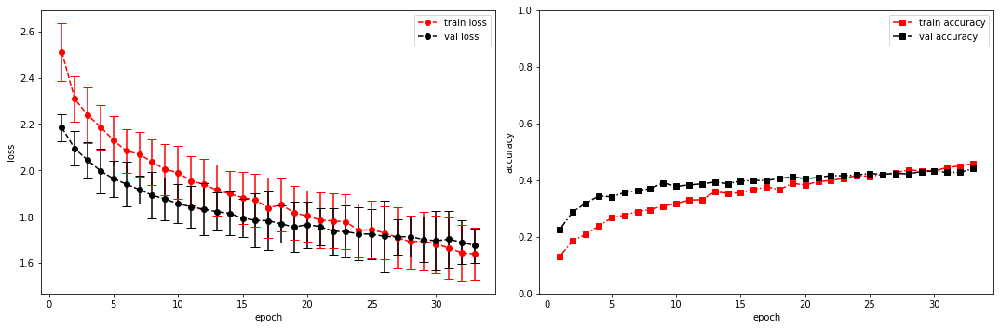

model saved


training epoch:  33
model set to train
Epoch [34/100], step [1/84],  Loss: 1.6071 +/- 0.0000,  accuracy: 0.0302734375, time elapsed = 0.2920994758605957s
Epoch [34/100], step [17/84],  Loss: 1.6403 +/- 0.0941,  accuracy: 0.4453125, time elapsed = 0.8825254440307617s
Epoch [34/100], step [33/84],  Loss: 1.6346 +/- 0.1056,  accuracy: 0.4423828125, time elapsed = 0.8740813732147217s
Epoch [34/100], step [49/84],  Loss: 1.6643 +/- 0.1496,  accuracy: 0.4345703125, time elapsed = 0.8801529407501221s
Epoch [34/100], step [65/84],  Loss: 1.5905 +/- 0.1342,  accuracy: 0.4658203125, time elapsed = 0.8696205615997314s
Epoch [34/100], step [81/84],  Loss: 1.5965 +/- 0.1067,  accuracy: 0.46484375, time elapsed = 0.8895092010498047s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.45217229162782024,  precision = 0.45217229162782024 recall = 0.45217229162782024 f1 = 0.45217229162782024 ::: val: acc = 0.4436987322893363,  precision = 0.4436987322893363 recall = 0.4436987322893363 

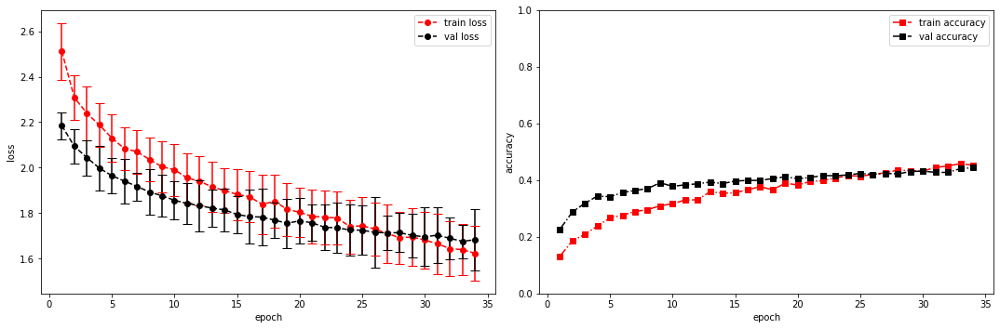

model saved


training epoch:  34
model set to train
Epoch [35/100], step [1/84],  Loss: 1.6542 +/- 0.0000,  accuracy: 0.02734375, time elapsed = 0.2748575210571289s
Epoch [35/100], step [17/84],  Loss: 1.6232 +/- 0.1346,  accuracy: 0.4619140625, time elapsed = 0.8832006454467773s
Epoch [35/100], step [33/84],  Loss: 1.5738 +/- 0.1060,  accuracy: 0.46875, time elapsed = 0.9247686862945557s
Epoch [35/100], step [49/84],  Loss: 1.6607 +/- 0.1550,  accuracy: 0.4375, time elapsed = 0.8760237693786621s
Epoch [35/100], step [65/84],  Loss: 1.6071 +/- 0.0850,  accuracy: 0.46484375, time elapsed = 0.9353084564208984s
Epoch [35/100], step [81/84],  Loss: 1.6588 +/- 0.1403,  accuracy: 0.423828125, time elapsed = 0.8935294151306152s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.45179936602647774,  precision = 0.45179936602647774 recall = 0.45179936602647774 f1 = 0.45179936602647774 ::: val: acc = 0.4332587621178225,  precision = 0.4332587621178225 recall = 0.4332587621178225 time elapse

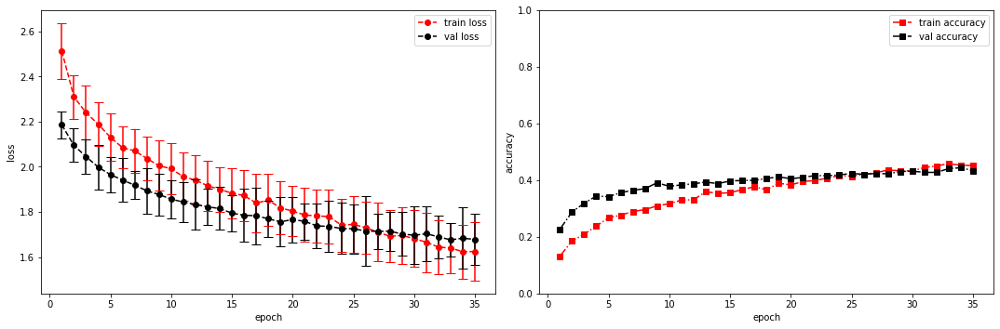

model saved


training epoch:  35
model set to train
Epoch [36/100], step [1/84],  Loss: 1.4645 +/- 0.0000,  accuracy: 0.0361328125, time elapsed = 0.2738969326019287s
Epoch [36/100], step [17/84],  Loss: 1.6154 +/- 0.1086,  accuracy: 0.466796875, time elapsed = 0.874798059463501s
Epoch [36/100], step [33/84],  Loss: 1.5720 +/- 0.1208,  accuracy: 0.462890625, time elapsed = 0.8885502815246582s
Epoch [36/100], step [49/84],  Loss: 1.5319 +/- 0.1486,  accuracy: 0.486328125, time elapsed = 0.8604733943939209s
Epoch [36/100], step [65/84],  Loss: 1.5911 +/- 0.1568,  accuracy: 0.4619140625, time elapsed = 0.8708722591400146s
Epoch [36/100], step [81/84],  Loss: 1.6710 +/- 0.1391,  accuracy: 0.43359375, time elapsed = 0.874763011932373s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.46391944807011,  precision = 0.46391944807011 recall = 0.46391944807011 f1 = 0.46391944807011 ::: val: acc = 0.4369873228933632,  precision = 0.4369873228933632 recall = 0.4369873228933632 time elapsed =

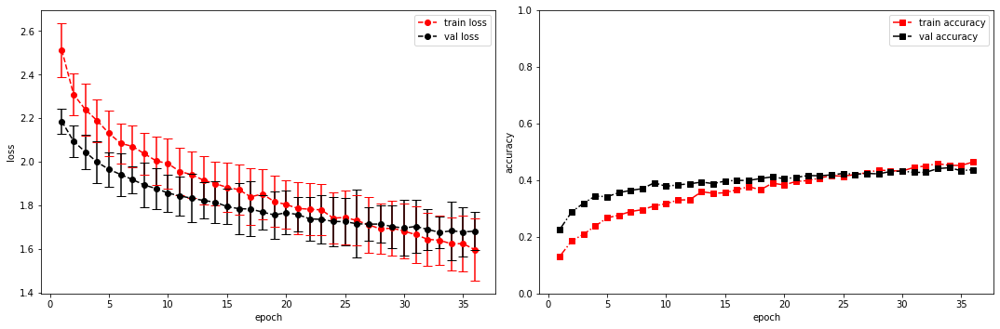

model saved


training epoch:  36
model set to train
Epoch [37/100], step [1/84],  Loss: 1.5652 +/- 0.0000,  accuracy: 0.029296875, time elapsed = 0.28537964820861816s
Epoch [37/100], step [17/84],  Loss: 1.5603 +/- 0.1564,  accuracy: 0.4658203125, time elapsed = 0.8865394592285156s
Epoch [37/100], step [33/84],  Loss: 1.6271 +/- 0.1261,  accuracy: 0.4462890625, time elapsed = 0.888239860534668s
Epoch [37/100], step [49/84],  Loss: 1.5854 +/- 0.1207,  accuracy: 0.4755859375, time elapsed = 0.8756780624389648s
Epoch [37/100], step [65/84],  Loss: 1.5958 +/- 0.1338,  accuracy: 0.482421875, time elapsed = 0.8692255020141602s
Epoch [37/100], step [81/84],  Loss: 1.5286 +/- 0.1223,  accuracy: 0.4892578125, time elapsed = 0.8794214725494385s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.47305612530300206,  precision = 0.47305612530300206 recall = 0.47305612530300206 f1 = 0.47305612530300206 ::: val: acc = 0.43102162565249813,  precision = 0.43102162565249813 recall = 0.431021625652

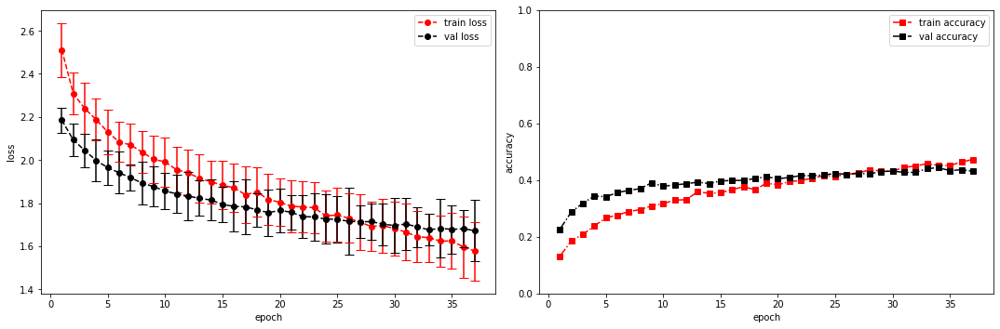

model saved


training epoch:  37
model set to train
Epoch [38/100], step [1/84],  Loss: 1.5441 +/- 0.0000,  accuracy: 0.0322265625, time elapsed = 0.2837672233581543s
Epoch [38/100], step [17/84],  Loss: 1.5479 +/- 0.1061,  accuracy: 0.4716796875, time elapsed = 0.8747742176055908s
Epoch [38/100], step [33/84],  Loss: 1.5955 +/- 0.0845,  accuracy: 0.46875, time elapsed = 0.888087272644043s
Epoch [38/100], step [49/84],  Loss: 1.6089 +/- 0.0729,  accuracy: 0.4677734375, time elapsed = 0.8851170539855957s
Epoch [38/100], step [65/84],  Loss: 1.5634 +/- 0.1166,  accuracy: 0.4853515625, time elapsed = 0.856909990310669s
Epoch [38/100], step [81/84],  Loss: 1.5595 +/- 0.1611,  accuracy: 0.484375, time elapsed = 0.8659067153930664s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4767853813164274,  precision = 0.4767853813164274 recall = 0.4767853813164274 f1 = 0.4767853813164274 ::: val: acc = 0.4451901565995526,  precision = 0.4451901565995526 recall = 0.4451901565995526 time elaps

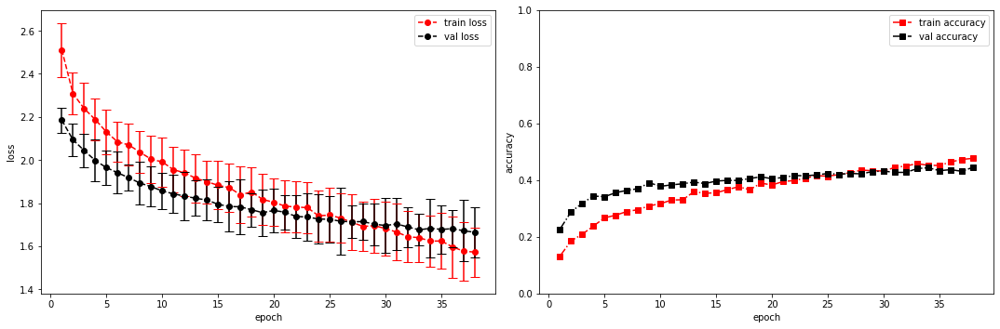

model saved


training epoch:  38
model set to train
Epoch [39/100], step [1/84],  Loss: 1.4513 +/- 0.0000,  accuracy: 0.029296875, time elapsed = 0.2755758762359619s
Epoch [39/100], step [17/84],  Loss: 1.5286 +/- 0.1074,  accuracy: 0.4794921875, time elapsed = 0.8996469974517822s
Epoch [39/100], step [33/84],  Loss: 1.5890 +/- 0.1296,  accuracy: 0.4658203125, time elapsed = 0.9113638401031494s
Epoch [39/100], step [49/84],  Loss: 1.5529 +/- 0.0954,  accuracy: 0.4658203125, time elapsed = 0.9036414623260498s
Epoch [39/100], step [65/84],  Loss: 1.5761 +/- 0.1018,  accuracy: 0.4853515625, time elapsed = 0.8832657337188721s
Epoch [39/100], step [81/84],  Loss: 1.5475 +/- 0.1043,  accuracy: 0.4814453125, time elapsed = 0.8770506381988525s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4762259929144136,  precision = 0.4762259929144136 recall = 0.4762259929144136 f1 = 0.4762259929144136 ::: val: acc = 0.4399701715137957,  precision = 0.4399701715137957 recall = 0.4399701715137957 

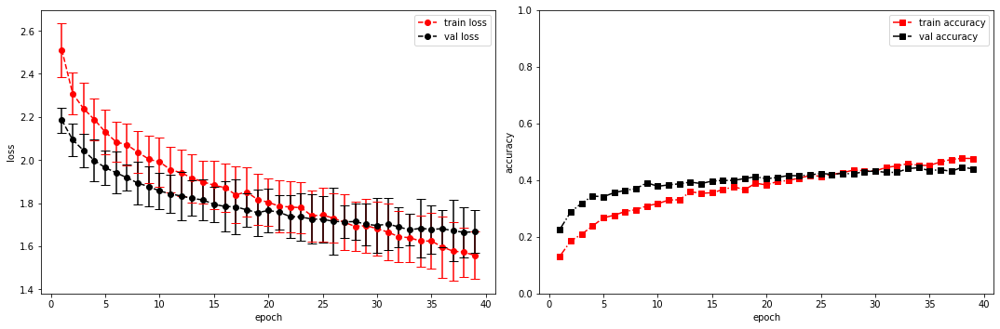

model saved


training epoch:  39
model set to train
Epoch [40/100], step [1/84],  Loss: 1.4986 +/- 0.0000,  accuracy: 0.0322265625, time elapsed = 0.26871728897094727s
Epoch [40/100], step [17/84],  Loss: 1.5710 +/- 0.1277,  accuracy: 0.4697265625, time elapsed = 0.8871028423309326s
Epoch [40/100], step [33/84],  Loss: 1.5668 +/- 0.1302,  accuracy: 0.478515625, time elapsed = 0.9212348461151123s
Epoch [40/100], step [49/84],  Loss: 1.5563 +/- 0.0901,  accuracy: 0.4697265625, time elapsed = 0.8966169357299805s
Epoch [40/100], step [65/84],  Loss: 1.5002 +/- 0.1241,  accuracy: 0.48828125, time elapsed = 0.8843839168548584s
Epoch [40/100], step [81/84],  Loss: 1.5091 +/- 0.1480,  accuracy: 0.494140625, time elapsed = 0.8951125144958496s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4793958605258251,  precision = 0.4793958605258251 recall = 0.4793958605258251 f1 = 0.4793958605258251 ::: val: acc = 0.43922445935868754,  precision = 0.43922445935868754 recall = 0.43922445935868754

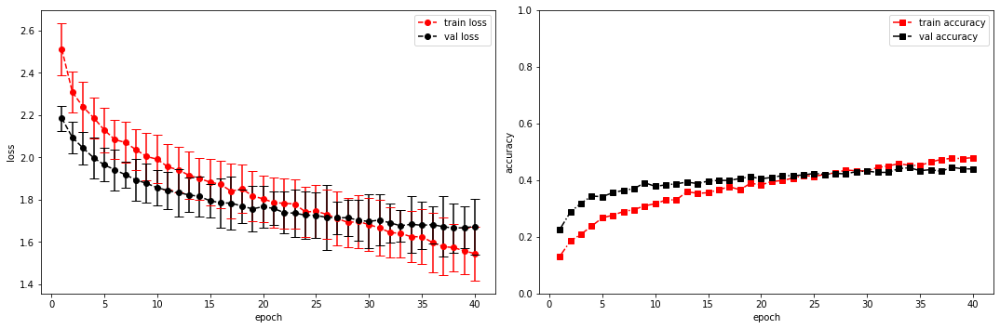

model saved


training epoch:  40
model set to train
Epoch [41/100], step [1/84],  Loss: 1.2838 +/- 0.0000,  accuracy: 0.0380859375, time elapsed = 0.28942418098449707s
Epoch [41/100], step [17/84],  Loss: 1.5425 +/- 0.0986,  accuracy: 0.505859375, time elapsed = 0.8875033855438232s
Epoch [41/100], step [33/84],  Loss: 1.5100 +/- 0.1019,  accuracy: 0.5078125, time elapsed = 0.8638222217559814s
Epoch [41/100], step [49/84],  Loss: 1.5309 +/- 0.0992,  accuracy: 0.4921875, time elapsed = 0.8854520320892334s
Epoch [41/100], step [65/84],  Loss: 1.5445 +/- 0.1019,  accuracy: 0.4755859375, time elapsed = 0.9120004177093506s
Epoch [41/100], step [81/84],  Loss: 1.5374 +/- 0.1085,  accuracy: 0.501953125, time elapsed = 0.8867752552032471s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.498974454596308,  precision = 0.498974454596308 recall = 0.498974454596308 f1 = 0.498974454596308 ::: val: acc = 0.45488441461595824,  precision = 0.45488441461595824 recall = 0.45488441461595824 time el

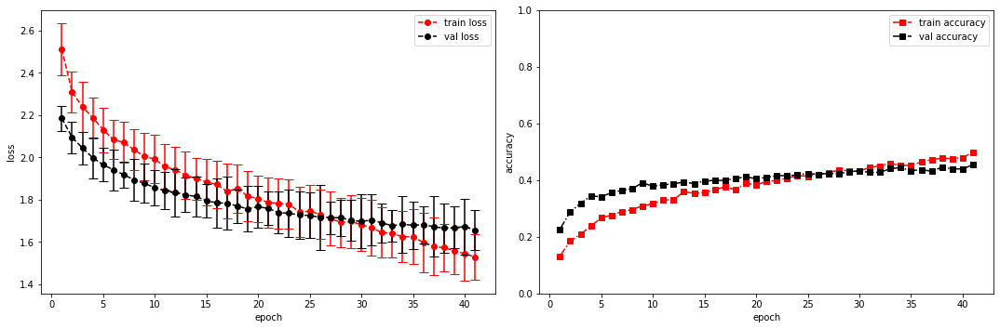

model saved


training epoch:  41
model set to train
Epoch [42/100], step [1/84],  Loss: 1.6140 +/- 0.0000,  accuracy: 0.0244140625, time elapsed = 0.2886953353881836s
Epoch [42/100], step [17/84],  Loss: 1.4965 +/- 0.1375,  accuracy: 0.5009765625, time elapsed = 0.8856267929077148s
Epoch [42/100], step [33/84],  Loss: 1.5085 +/- 0.0704,  accuracy: 0.4970703125, time elapsed = 0.8991913795471191s
Epoch [42/100], step [49/84],  Loss: 1.5334 +/- 0.1584,  accuracy: 0.5107421875, time elapsed = 0.8726589679718018s
Epoch [42/100], step [65/84],  Loss: 1.5051 +/- 0.1279,  accuracy: 0.5068359375, time elapsed = 0.8751881122589111s
Epoch [42/100], step [81/84],  Loss: 1.5103 +/- 0.0907,  accuracy: 0.5029296875, time elapsed = 0.8706977367401123s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5027037106097334,  precision = 0.5027037106097334 recall = 0.5027037106097334 f1 = 0.5027037106097334 ::: val: acc = 0.4563758389261745,  precision = 0.4563758389261745 recall = 0.4563758389261745

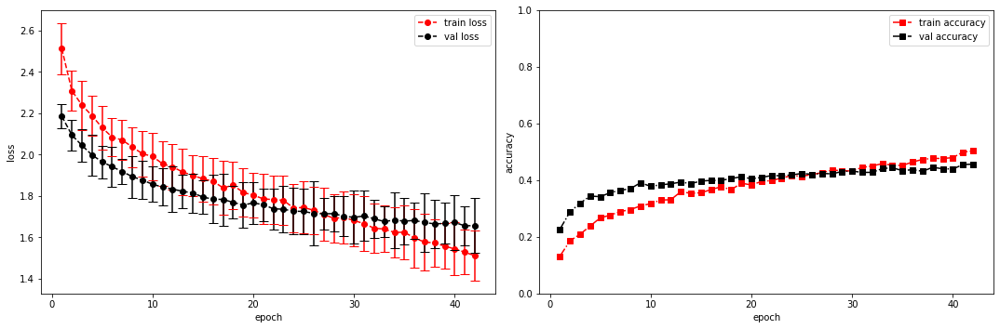

model saved


training epoch:  42
model set to train
Epoch [43/100], step [1/84],  Loss: 1.4315 +/- 0.0000,  accuracy: 0.033203125, time elapsed = 0.2824418544769287s
Epoch [43/100], step [17/84],  Loss: 1.5232 +/- 0.1372,  accuracy: 0.5009765625, time elapsed = 0.8950159549713135s
Epoch [43/100], step [33/84],  Loss: 1.4725 +/- 0.1172,  accuracy: 0.5078125, time elapsed = 0.8699469566345215s
Epoch [43/100], step [49/84],  Loss: 1.4972 +/- 0.1445,  accuracy: 0.501953125, time elapsed = 0.8775277137756348s
Epoch [43/100], step [65/84],  Loss: 1.5195 +/- 0.1094,  accuracy: 0.4775390625, time elapsed = 0.8737943172454834s
Epoch [43/100], step [81/84],  Loss: 1.4787 +/- 0.1101,  accuracy: 0.509765625, time elapsed = 0.8704164028167725s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5010255454036919,  precision = 0.5010255454036919 recall = 0.5010255454036919 f1 = 0.5010255454036919 ::: val: acc = 0.4481730052199851,  precision = 0.4481730052199851 recall = 0.4481730052199851 time 

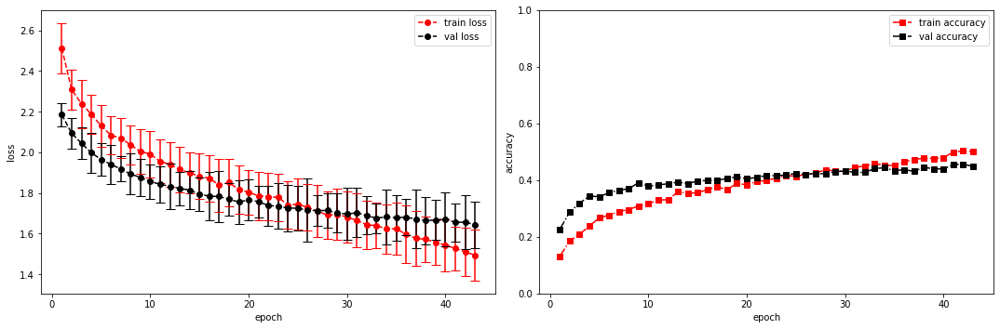

model saved


training epoch:  43
model set to train
Epoch [44/100], step [1/84],  Loss: 1.4765 +/- 0.0000,  accuracy: 0.03125, time elapsed = 0.2814195156097412s
Epoch [44/100], step [17/84],  Loss: 1.4605 +/- 0.1250,  accuracy: 0.505859375, time elapsed = 0.882213830947876s
Epoch [44/100], step [33/84],  Loss: 1.5050 +/- 0.0983,  accuracy: 0.48828125, time elapsed = 0.9344732761383057s
Epoch [44/100], step [49/84],  Loss: 1.4861 +/- 0.1677,  accuracy: 0.5166015625, time elapsed = 0.8919014930725098s
Epoch [44/100], step [65/84],  Loss: 1.4833 +/- 0.1341,  accuracy: 0.517578125, time elapsed = 0.8730976581573486s
Epoch [44/100], step [81/84],  Loss: 1.5299 +/- 0.1271,  accuracy: 0.494140625, time elapsed = 0.8656060695648193s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5040089502144323,  precision = 0.5040089502144323 recall = 0.5040089502144323 f1 = 0.5040089502144323 ::: val: acc = 0.44668158090976884,  precision = 0.44668158090976884 recall = 0.44668158090976884 time el

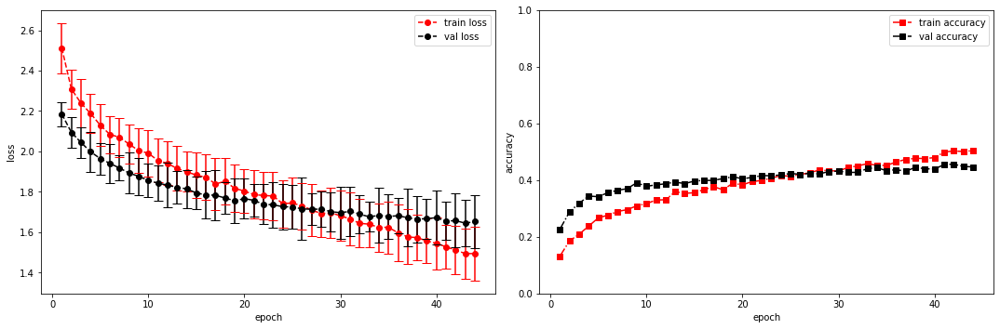

model saved


training epoch:  44
model set to train
Epoch [45/100], step [1/84],  Loss: 1.4510 +/- 0.0000,  accuracy: 0.037109375, time elapsed = 0.265866756439209s
Epoch [45/100], step [17/84],  Loss: 1.5037 +/- 0.1055,  accuracy: 0.4912109375, time elapsed = 0.8963069915771484s
Epoch [45/100], step [33/84],  Loss: 1.4915 +/- 0.1097,  accuracy: 0.498046875, time elapsed = 0.8987174034118652s
Epoch [45/100], step [49/84],  Loss: 1.4848 +/- 0.1344,  accuracy: 0.5146484375, time elapsed = 0.8803391456604004s
Epoch [45/100], step [65/84],  Loss: 1.4642 +/- 0.1237,  accuracy: 0.509765625, time elapsed = 0.8732609748840332s
Epoch [45/100], step [81/84],  Loss: 1.5124 +/- 0.1160,  accuracy: 0.509765625, time elapsed = 0.8492913246154785s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5069923550251725,  precision = 0.5069923550251725 recall = 0.5069923550251725 f1 = 0.5069923550251725 ::: val: acc = 0.4511558538404176,  precision = 0.4511558538404176 recall = 0.4511558538404176 time

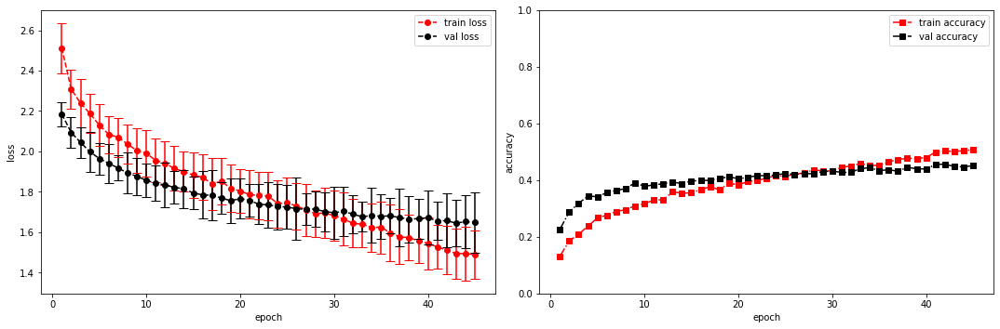

model saved


training epoch:  45
model set to train
Epoch [46/100], step [1/84],  Loss: 1.4686 +/- 0.0000,  accuracy: 0.02734375, time elapsed = 0.2850673198699951s
Epoch [46/100], step [17/84],  Loss: 1.4674 +/- 0.1049,  accuracy: 0.5029296875, time elapsed = 0.8613808155059814s
Epoch [46/100], step [33/84],  Loss: 1.5165 +/- 0.1675,  accuracy: 0.501953125, time elapsed = 0.8586061000823975s
Epoch [46/100], step [49/84],  Loss: 1.4795 +/- 0.1009,  accuracy: 0.5068359375, time elapsed = 0.8649172782897949s
Epoch [46/100], step [65/84],  Loss: 1.4566 +/- 0.1208,  accuracy: 0.5126953125, time elapsed = 0.874565839767456s
Epoch [46/100], step [81/84],  Loss: 1.4347 +/- 0.1268,  accuracy: 0.5146484375, time elapsed = 0.8591444492340088s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.50661942942383,  precision = 0.50661942942383 recall = 0.50661942942383 f1 = 0.50661942942383 ::: val: acc = 0.4429530201342282,  precision = 0.4429530201342282 recall = 0.4429530201342282 time elapse

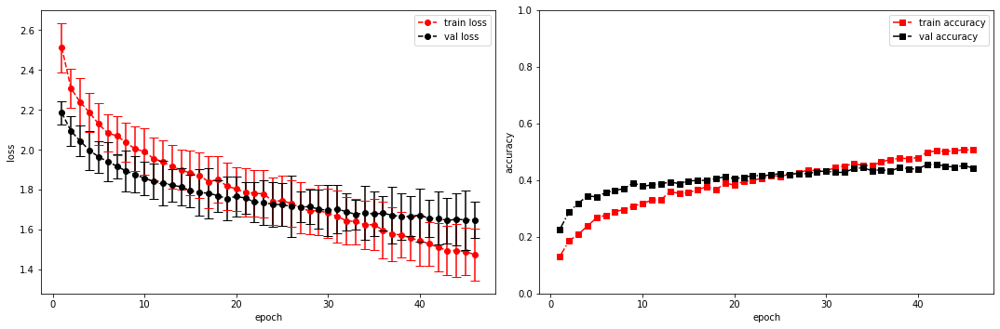

model saved


training epoch:  46
model set to train
Epoch [47/100], step [1/84],  Loss: 1.7383 +/- 0.0000,  accuracy: 0.0234375, time elapsed = 0.2830784320831299s
Epoch [47/100], step [17/84],  Loss: 1.4416 +/- 0.0790,  accuracy: 0.51953125, time elapsed = 0.8913683891296387s
Epoch [47/100], step [33/84],  Loss: 1.4276 +/- 0.0918,  accuracy: 0.5458984375, time elapsed = 0.8948371410369873s
Epoch [47/100], step [49/84],  Loss: 1.5375 +/- 0.1154,  accuracy: 0.4912109375, time elapsed = 0.8773784637451172s
Epoch [47/100], step [65/84],  Loss: 1.4374 +/- 0.1253,  accuracy: 0.533203125, time elapsed = 0.8683872222900391s
Epoch [47/100], step [81/84],  Loss: 1.4649 +/- 0.1512,  accuracy: 0.5224609375, time elapsed = 0.8737404346466064s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5219093790788738,  precision = 0.5219093790788738 recall = 0.5219093790788738 f1 = 0.5219093790788738 ::: val: acc = 0.44220730797912006,  precision = 0.44220730797912006 recall = 0.44220730797912006 ti

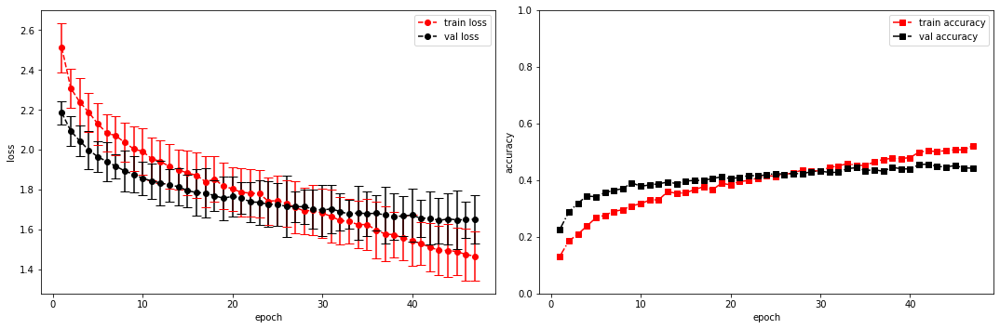

model saved


training epoch:  47
model set to train
Epoch [48/100], step [1/84],  Loss: 1.4733 +/- 0.0000,  accuracy: 0.0322265625, time elapsed = 0.27422451972961426s
Epoch [48/100], step [17/84],  Loss: 1.4392 +/- 0.1468,  accuracy: 0.5126953125, time elapsed = 0.868229866027832s
Epoch [48/100], step [33/84],  Loss: 1.4316 +/- 0.1438,  accuracy: 0.5263671875, time elapsed = 0.8796532154083252s
Epoch [48/100], step [49/84],  Loss: 1.5030 +/- 0.1560,  accuracy: 0.498046875, time elapsed = 0.8954513072967529s
Epoch [48/100], step [65/84],  Loss: 1.4650 +/- 0.1455,  accuracy: 0.53125, time elapsed = 0.945624828338623s
Epoch [48/100], step [81/84],  Loss: 1.4118 +/- 0.1257,  accuracy: 0.5361328125, time elapsed = 0.8871626853942871s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5209770650755174,  precision = 0.5209770650755174 recall = 0.5209770650755174 f1 = 0.5209770650755174 ::: val: acc = 0.453392990305742,  precision = 0.453392990305742 recall = 0.453392990305742 time elap

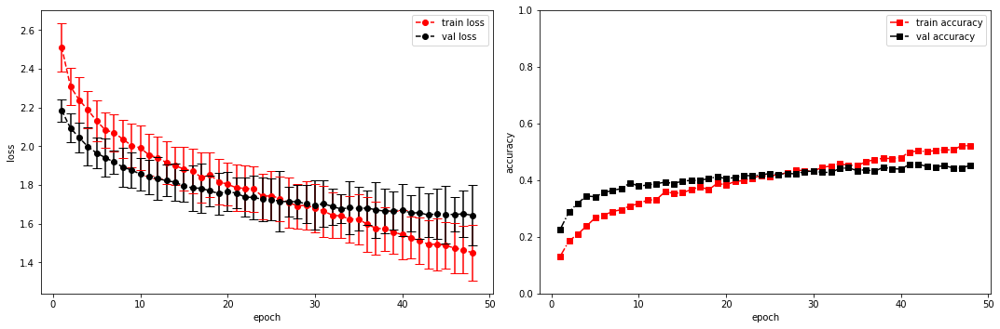

model saved


training epoch:  48
model set to train
Epoch [49/100], step [1/84],  Loss: 1.3820 +/- 0.0000,  accuracy: 0.0341796875, time elapsed = 0.2781376838684082s
Epoch [49/100], step [17/84],  Loss: 1.4237 +/- 0.1203,  accuracy: 0.5224609375, time elapsed = 0.8858890533447266s
Epoch [49/100], step [33/84],  Loss: 1.4324 +/- 0.1380,  accuracy: 0.5205078125, time elapsed = 0.8773338794708252s
Epoch [49/100], step [49/84],  Loss: 1.4608 +/- 0.1287,  accuracy: 0.49609375, time elapsed = 0.8674499988555908s
Epoch [49/100], step [65/84],  Loss: 1.4571 +/- 0.0894,  accuracy: 0.4970703125, time elapsed = 0.8960437774658203s
Epoch [49/100], step [81/84],  Loss: 1.4234 +/- 0.1226,  accuracy: 0.5390625, time elapsed = 0.8736560344696045s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5163154950587358,  precision = 0.5163154950587358 recall = 0.5163154950587358 f1 = 0.5163154950587358 ::: val: acc = 0.4489187173750932,  precision = 0.4489187173750932 recall = 0.4489187173750932 time

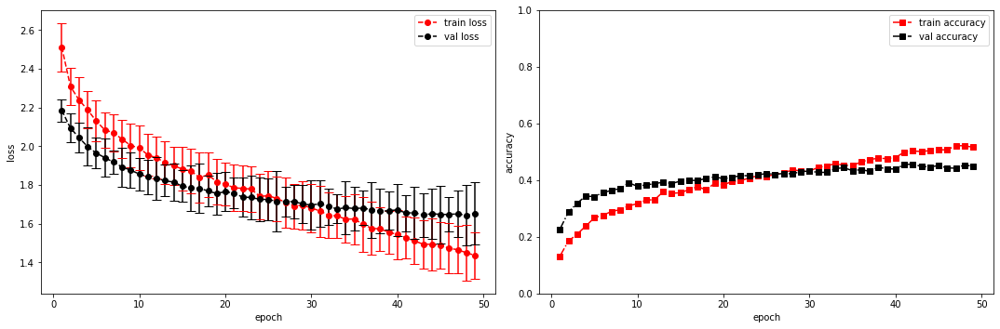

model saved


training epoch:  49
model set to train
Epoch [50/100], step [1/84],  Loss: 1.4827 +/- 0.0000,  accuracy: 0.0283203125, time elapsed = 0.2944145202636719s
Epoch [50/100], step [17/84],  Loss: 1.4395 +/- 0.1200,  accuracy: 0.51171875, time elapsed = 0.8938770294189453s
Epoch [50/100], step [33/84],  Loss: 1.4481 +/- 0.0723,  accuracy: 0.5263671875, time elapsed = 0.8982727527618408s
Epoch [50/100], step [49/84],  Loss: 1.4239 +/- 0.0734,  accuracy: 0.5439453125, time elapsed = 0.8774943351745605s
Epoch [50/100], step [65/84],  Loss: 1.4005 +/- 0.0999,  accuracy: 0.53515625, time elapsed = 0.8870196342468262s
Epoch [50/100], step [81/84],  Loss: 1.4191 +/- 0.1366,  accuracy: 0.5224609375, time elapsed = 0.863572359085083s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5267574118963266,  precision = 0.5267574118963266 recall = 0.5267574118963266 f1 = 0.5267574118963266 ::: val: acc = 0.4444444444444444,  precision = 0.4444444444444444 recall = 0.4444444444444444 time

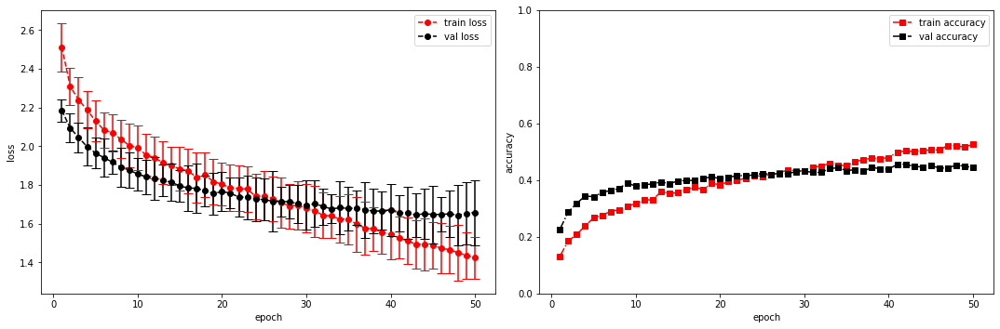

model saved


training epoch:  50
model set to train
Epoch [51/100], step [1/84],  Loss: 1.4605 +/- 0.0000,  accuracy: 0.03125, time elapsed = 0.2705254554748535s
Epoch [51/100], step [17/84],  Loss: 1.4359 +/- 0.1292,  accuracy: 0.5302734375, time elapsed = 0.8889050483703613s
Epoch [51/100], step [33/84],  Loss: 1.3619 +/- 0.1284,  accuracy: 0.55078125, time elapsed = 0.8807084560394287s
Epoch [51/100], step [49/84],  Loss: 1.3925 +/- 0.1514,  accuracy: 0.5537109375, time elapsed = 0.9049434661865234s
Epoch [51/100], step [65/84],  Loss: 1.3842 +/- 0.1162,  accuracy: 0.5390625, time elapsed = 0.8664591312408447s
Epoch [51/100], step [81/84],  Loss: 1.4745 +/- 0.1429,  accuracy: 0.513671875, time elapsed = 0.8721303939819336s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.536826403132575,  precision = 0.536826403132575 recall = 0.536826403132575 f1 = 0.536826403132575 ::: val: acc = 0.4526472781506339,  precision = 0.4526472781506339 recall = 0.4526472781506339 time elapsed =

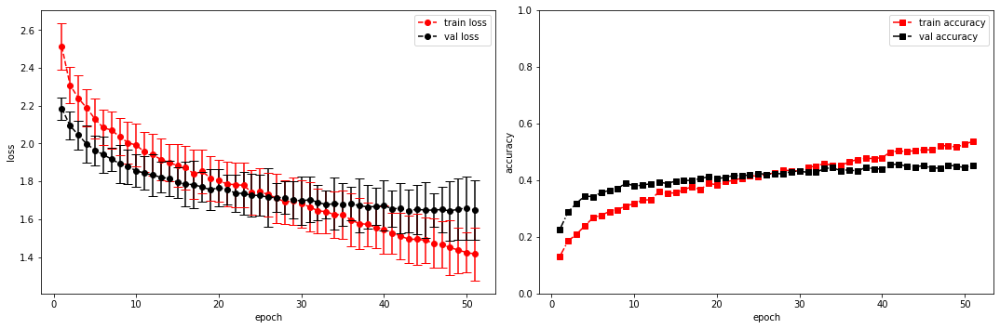

model saved


training epoch:  51
model set to train
Epoch [52/100], step [1/84],  Loss: 1.3822 +/- 0.0000,  accuracy: 0.033203125, time elapsed = 0.28719568252563477s
Epoch [52/100], step [17/84],  Loss: 1.4100 +/- 0.1353,  accuracy: 0.537109375, time elapsed = 0.8818433284759521s
Epoch [52/100], step [33/84],  Loss: 1.4256 +/- 0.1479,  accuracy: 0.5283203125, time elapsed = 0.879542350769043s
Epoch [52/100], step [49/84],  Loss: 1.4379 +/- 0.1651,  accuracy: 0.5302734375, time elapsed = 0.8577451705932617s
Epoch [52/100], step [65/84],  Loss: 1.4100 +/- 0.1030,  accuracy: 0.55859375, time elapsed = 0.8911466598510742s
Epoch [52/100], step [81/84],  Loss: 1.4007 +/- 0.1076,  accuracy: 0.5263671875, time elapsed = 0.8642499446868896s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5353347007272049,  precision = 0.5353347007272049 recall = 0.5353347007272049 f1 = 0.5353347007272049 ::: val: acc = 0.44742729306487694,  precision = 0.44742729306487694 recall = 0.44742729306487694 

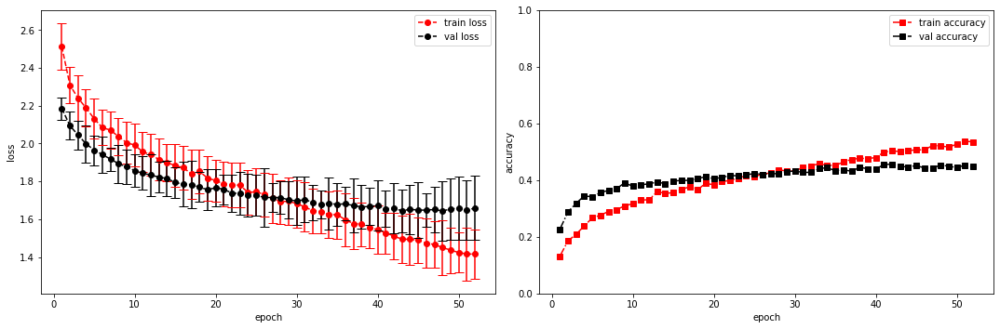

model saved


training epoch:  52
model set to train
Epoch [53/100], step [1/84],  Loss: 1.5523 +/- 0.0000,  accuracy: 0.0283203125, time elapsed = 0.29428791999816895s
Epoch [53/100], step [17/84],  Loss: 1.4479 +/- 0.1236,  accuracy: 0.53125, time elapsed = 0.9099340438842773s
Epoch [53/100], step [33/84],  Loss: 1.4027 +/- 0.1452,  accuracy: 0.5517578125, time elapsed = 0.8813807964324951s
Epoch [53/100], step [49/84],  Loss: 1.3582 +/- 0.1376,  accuracy: 0.552734375, time elapsed = 0.8730907440185547s
Epoch [53/100], step [65/84],  Loss: 1.3987 +/- 0.1503,  accuracy: 0.5380859375, time elapsed = 0.8830008506774902s
Epoch [53/100], step [81/84],  Loss: 1.4192 +/- 0.1013,  accuracy: 0.5400390625, time elapsed = 0.9011862277984619s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5411150475480142,  precision = 0.5411150475480142 recall = 0.5411150475480142 f1 = 0.5411150475480142 ::: val: acc = 0.4459358687546607,  precision = 0.4459358687546607 recall = 0.4459358687546607 time

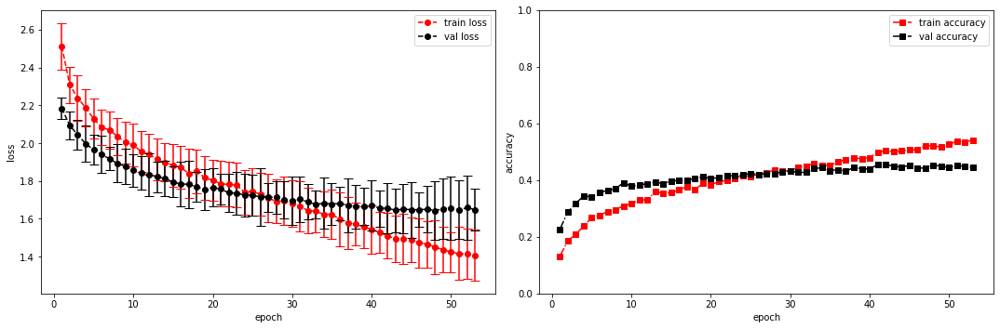

model saved


training epoch:  53
model set to train
Epoch [54/100], step [1/84],  Loss: 1.2840 +/- 0.0000,  accuracy: 0.03515625, time elapsed = 0.2772037982940674s
Epoch [54/100], step [17/84],  Loss: 1.3721 +/- 0.1563,  accuracy: 0.5615234375, time elapsed = 0.901839017868042s
Epoch [54/100], step [33/84],  Loss: 1.3907 +/- 0.1047,  accuracy: 0.548828125, time elapsed = 0.8933985233306885s
Epoch [54/100], step [49/84],  Loss: 1.3917 +/- 0.1204,  accuracy: 0.5322265625, time elapsed = 0.8976693153381348s
Epoch [54/100], step [65/84],  Loss: 1.4199 +/- 0.1226,  accuracy: 0.53125, time elapsed = 0.873732328414917s
Epoch [54/100], step [81/84],  Loss: 1.4222 +/- 0.1129,  accuracy: 0.5263671875, time elapsed = 0.8705148696899414s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5385045683386165,  precision = 0.5385045683386165 recall = 0.5385045683386165 f1 = 0.5385045683386165 ::: val: acc = 0.4459358687546607,  precision = 0.4459358687546607 recall = 0.4459358687546607 time elap

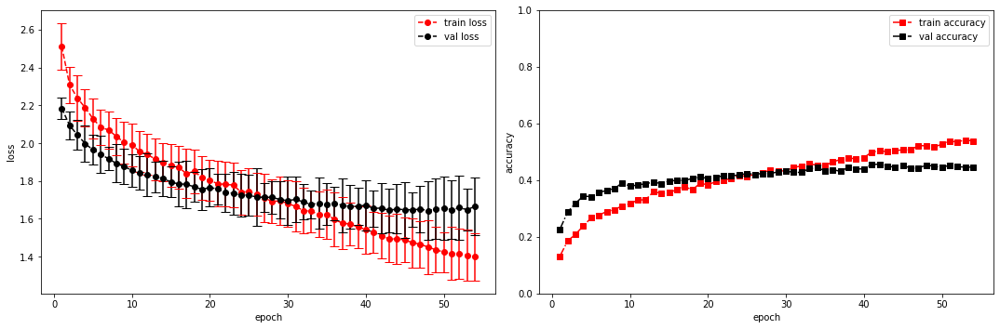

model saved


training epoch:  54
model set to train
Epoch [55/100], step [1/84],  Loss: 1.4788 +/- 0.0000,  accuracy: 0.0361328125, time elapsed = 0.2906942367553711s
Epoch [55/100], step [17/84],  Loss: 1.3748 +/- 0.1189,  accuracy: 0.548828125, time elapsed = 0.878962516784668s
Epoch [55/100], step [33/84],  Loss: 1.4076 +/- 0.1654,  accuracy: 0.5302734375, time elapsed = 0.8713955879211426s
Epoch [55/100], step [49/84],  Loss: 1.3697 +/- 0.1101,  accuracy: 0.56640625, time elapsed = 0.8789486885070801s
Epoch [55/100], step [65/84],  Loss: 1.3955 +/- 0.1092,  accuracy: 0.5478515625, time elapsed = 0.8656442165374756s
Epoch [55/100], step [81/84],  Loss: 1.3926 +/- 0.1406,  accuracy: 0.525390625, time elapsed = 0.8712739944458008s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5440984523587544,  precision = 0.5440984523587544 recall = 0.5440984523587544 f1 = 0.5440984523587544 ::: val: acc = 0.45041014168530946,  precision = 0.45041014168530946 recall = 0.45041014168530946 t

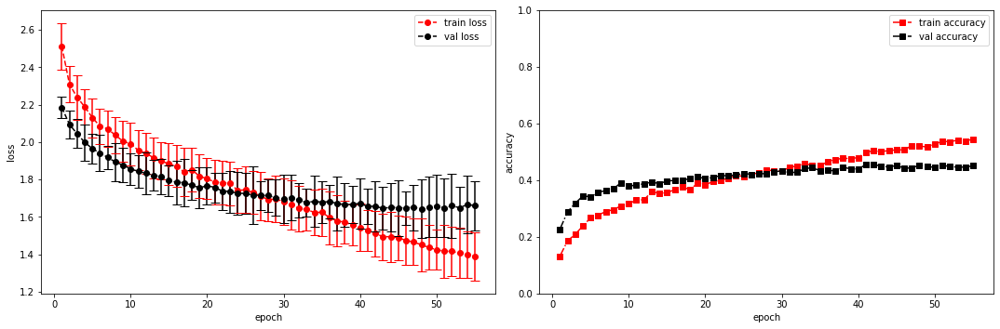

model saved


training epoch:  55
model set to train
Epoch [56/100], step [1/84],  Loss: 1.3514 +/- 0.0000,  accuracy: 0.033203125, time elapsed = 0.27248096466064453s
Epoch [56/100], step [17/84],  Loss: 1.3473 +/- 0.1070,  accuracy: 0.5478515625, time elapsed = 0.8996775150299072s
Epoch [56/100], step [33/84],  Loss: 1.3504 +/- 0.0856,  accuracy: 0.5634765625, time elapsed = 0.8947679996490479s
Epoch [56/100], step [49/84],  Loss: 1.3912 +/- 0.1049,  accuracy: 0.5380859375, time elapsed = 0.8714370727539062s
Epoch [56/100], step [65/84],  Loss: 1.4013 +/- 0.0797,  accuracy: 0.544921875, time elapsed = 0.8791003227233887s
Epoch [56/100], step [81/84],  Loss: 1.3666 +/- 0.1113,  accuracy: 0.5322265625, time elapsed = 0.8522701263427734s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.545217229162782,  precision = 0.545217229162782 recall = 0.545217229162782 f1 = 0.545217229162782 ::: val: acc = 0.45041014168530946,  precision = 0.45041014168530946 recall = 0.45041014168530946 t

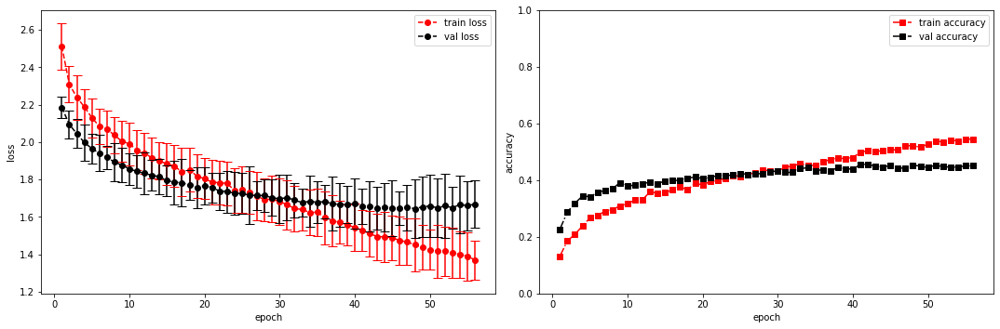

model saved
stopping early
Conv_3_layer
(1, 13, 517)
running model: id = Conv_3_layer, channels = [8, 16, 32]
device:  cuda
dataset metadata:  {'n_fft': 2048, 'hop_length': 256, 'n_mfcc': 13, 'notes': 'optional notes not passed'}
train model: data loaders initialized
sample shape =  (1, 13, 517)
model loaded
Layer (type:depth-idx)                   Output Shape              Param #
├─ConvBlock: 1-1                         [-1, 8, 13, 104]          --
|    └─Sequential: 2-1                   [-1, 8, 13, 104]          --
|    |    └─Conv2d: 3-1                  [-1, 8, 13, 517]          80
|    |    └─ReLU: 3-2                    [-1, 8, 13, 517]          --
|    |    └─MaxPool2d: 3-3               [-1, 8, 13, 104]          --
|    |    └─BatchNorm2d: 3-4             [-1, 8, 13, 104]          16
├─ConvBlock: 1-2                         [-1, 16, 13, 21]          --
|    └─Sequential: 2-2                   [-1, 16, 13, 21]          --
|    |    └─Conv2d: 3-5                  [-1, 16, 13, 1

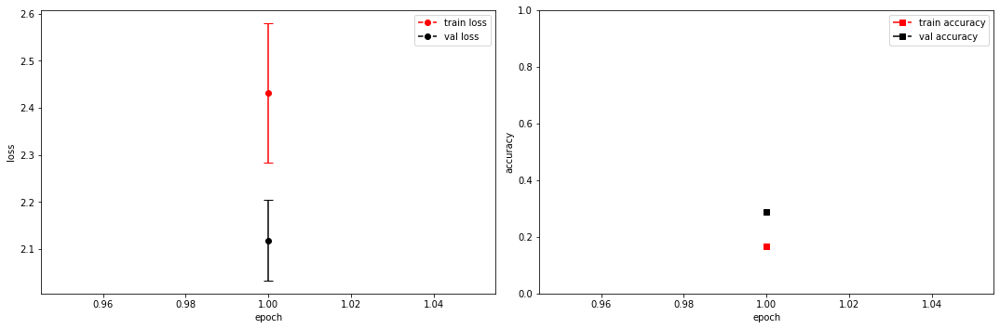

model saved


training epoch:  1
model set to train
Epoch [2/100], step [1/84],  Loss: 2.3552 +/- 0.0000,  accuracy: 0.0078125, time elapsed = 0.2954549789428711s
Epoch [2/100], step [17/84],  Loss: 2.2535 +/- 0.1069,  accuracy: 0.2412109375, time elapsed = 0.9049961566925049s
Epoch [2/100], step [33/84],  Loss: 2.2493 +/- 0.0759,  accuracy: 0.23046875, time elapsed = 0.8867835998535156s
Epoch [2/100], step [49/84],  Loss: 2.1930 +/- 0.0943,  accuracy: 0.23828125, time elapsed = 0.8615639209747314s
Epoch [2/100], step [65/84],  Loss: 2.1901 +/- 0.1359,  accuracy: 0.248046875, time elapsed = 0.8614356517791748s
Epoch [2/100], step [81/84],  Loss: 2.1708 +/- 0.0849,  accuracy: 0.2509765625, time elapsed = 0.8606855869293213s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.2418422524706321,  precision = 0.2418422524706321 recall = 0.2418422524706321 f1 = 0.2418422524706321 ::: val: acc = 0.3296047725577927,  precision = 0.3296047725577927 recall = 0.3296047725577927 time elapsed =

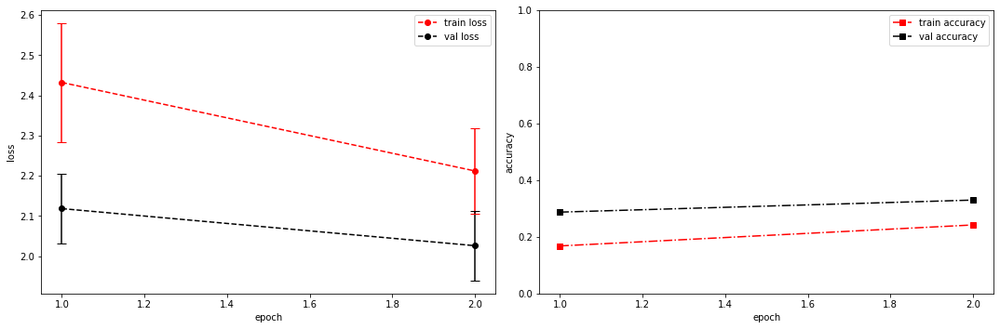

model saved


training epoch:  2
model set to train
Epoch [3/100], step [1/84],  Loss: 2.1834 +/- 0.0000,  accuracy: 0.017578125, time elapsed = 0.309661865234375s
Epoch [3/100], step [17/84],  Loss: 2.1680 +/- 0.1020,  accuracy: 0.26953125, time elapsed = 0.9624712467193604s
Epoch [3/100], step [33/84],  Loss: 2.0991 +/- 0.0816,  accuracy: 0.287109375, time elapsed = 0.8806943893432617s
Epoch [3/100], step [49/84],  Loss: 2.1512 +/- 0.1142,  accuracy: 0.2734375, time elapsed = 0.8763294219970703s
Epoch [3/100], step [65/84],  Loss: 2.0839 +/- 0.1081,  accuracy: 0.2998046875, time elapsed = 0.8732588291168213s
Epoch [3/100], step [81/84],  Loss: 2.0983 +/- 0.1033,  accuracy: 0.27734375, time elapsed = 0.8577935695648193s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.28118590341226923,  precision = 0.28118590341226923 recall = 0.28118590341226923 f1 = 0.28118590341226923 ::: val: acc = 0.36316181953765847,  precision = 0.36316181953765847 recall = 0.36316181953765847 time elap

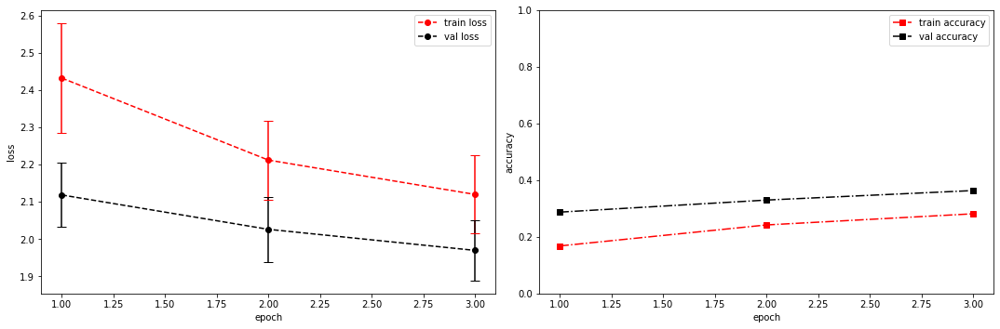

model saved


training epoch:  3
model set to train
Epoch [4/100], step [1/84],  Loss: 2.2562 +/- 0.0000,  accuracy: 0.013671875, time elapsed = 0.2861602306365967s
Epoch [4/100], step [17/84],  Loss: 2.0648 +/- 0.0702,  accuracy: 0.28515625, time elapsed = 0.881727933883667s
Epoch [4/100], step [33/84],  Loss: 2.0844 +/- 0.1456,  accuracy: 0.2802734375, time elapsed = 0.8623635768890381s
Epoch [4/100], step [49/84],  Loss: 2.0249 +/- 0.1280,  accuracy: 0.298828125, time elapsed = 0.8736755847930908s
Epoch [4/100], step [65/84],  Loss: 2.0178 +/- 0.1447,  accuracy: 0.310546875, time elapsed = 0.8697848320007324s
Epoch [4/100], step [81/84],  Loss: 2.0754 +/- 0.1353,  accuracy: 0.2998046875, time elapsed = 0.88033127784729s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.295730001864628,  precision = 0.295730001864628 recall = 0.295730001864628 f1 = 0.295730001864628 ::: val: acc = 0.372110365398956,  precision = 0.372110365398956 recall = 0.372110365398956 time elapsed = 6.1977

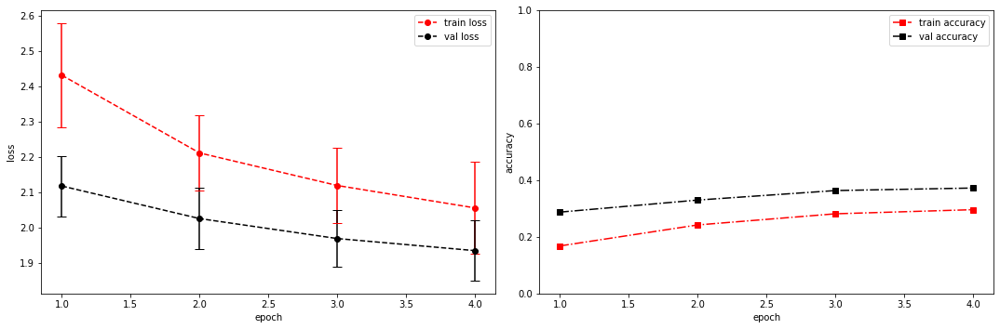

model saved


training epoch:  4
model set to train
Epoch [5/100], step [1/84],  Loss: 2.0447 +/- 0.0000,  accuracy: 0.015625, time elapsed = 0.28281259536743164s
Epoch [5/100], step [17/84],  Loss: 1.9949 +/- 0.1106,  accuracy: 0.318359375, time elapsed = 0.8903672695159912s
Epoch [5/100], step [33/84],  Loss: 2.0567 +/- 0.1408,  accuracy: 0.31640625, time elapsed = 0.8817663192749023s
Epoch [5/100], step [49/84],  Loss: 2.0247 +/- 0.0796,  accuracy: 0.3232421875, time elapsed = 0.8767654895782471s
Epoch [5/100], step [65/84],  Loss: 2.0285 +/- 0.0784,  accuracy: 0.3154296875, time elapsed = 0.8642950057983398s
Epoch [5/100], step [81/84],  Loss: 1.9847 +/- 0.0893,  accuracy: 0.3203125, time elapsed = 0.866570234298706s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3190378519485363,  precision = 0.3190378519485363 recall = 0.3190378519485363 f1 = 0.3190378519485363 ::: val: acc = 0.38478747203579416,  precision = 0.38478747203579416 recall = 0.38478747203579416 time elapsed 

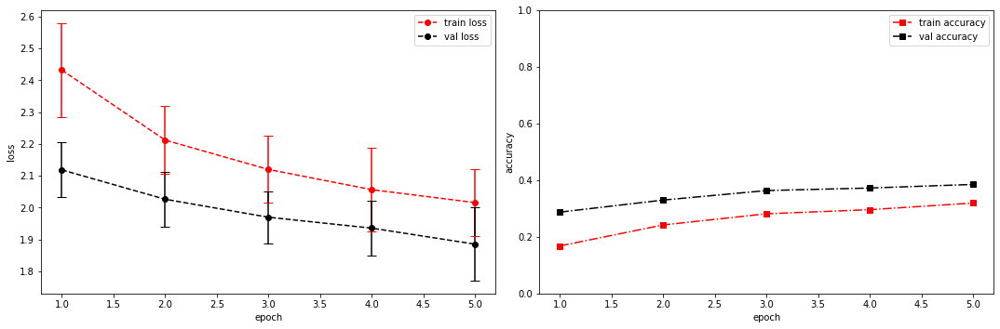

model saved


training epoch:  5
model set to train
Epoch [6/100], step [1/84],  Loss: 1.9417 +/- 0.0000,  accuracy: 0.01953125, time elapsed = 0.29982948303222656s
Epoch [6/100], step [17/84],  Loss: 1.9127 +/- 0.1307,  accuracy: 0.3515625, time elapsed = 0.9364826679229736s
Epoch [6/100], step [33/84],  Loss: 1.9607 +/- 0.1399,  accuracy: 0.3212890625, time elapsed = 0.8877336978912354s
Epoch [6/100], step [49/84],  Loss: 1.9955 +/- 0.0790,  accuracy: 0.314453125, time elapsed = 0.8852071762084961s
Epoch [6/100], step [65/84],  Loss: 1.9968 +/- 0.0966,  accuracy: 0.326171875, time elapsed = 0.8838992118835449s
Epoch [6/100], step [81/84],  Loss: 1.9477 +/- 0.1480,  accuracy: 0.3544921875, time elapsed = 0.8755185604095459s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3332090247995525,  precision = 0.3332090247995525 recall = 0.3332090247995525 f1 = 0.3332090247995525 ::: val: acc = 0.3832960477255779,  precision = 0.3832960477255779 recall = 0.3832960477255779 time elapsed

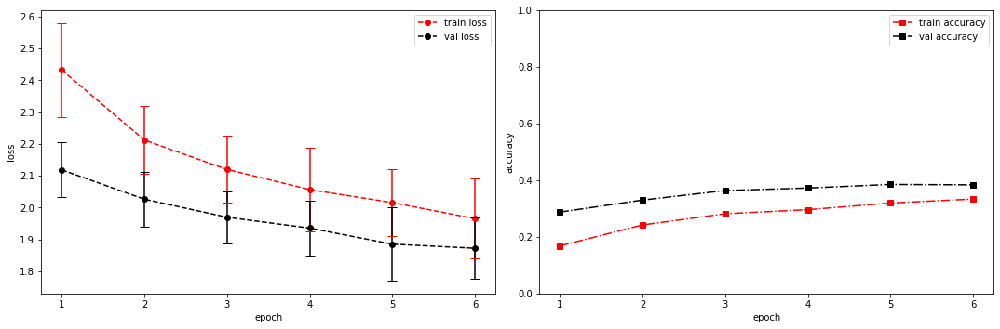

model saved


training epoch:  6
model set to train
Epoch [7/100], step [1/84],  Loss: 1.9401 +/- 0.0000,  accuracy: 0.0224609375, time elapsed = 0.29825735092163086s
Epoch [7/100], step [17/84],  Loss: 1.9360 +/- 0.0884,  accuracy: 0.328125, time elapsed = 0.9058010578155518s
Epoch [7/100], step [33/84],  Loss: 1.9508 +/- 0.0844,  accuracy: 0.3212890625, time elapsed = 0.887702226638794s
Epoch [7/100], step [49/84],  Loss: 1.9054 +/- 0.1122,  accuracy: 0.3486328125, time elapsed = 0.9012420177459717s
Epoch [7/100], step [65/84],  Loss: 1.9567 +/- 0.1043,  accuracy: 0.3466796875, time elapsed = 0.8923189640045166s
Epoch [7/100], step [81/84],  Loss: 1.9201 +/- 0.0948,  accuracy: 0.3291015625, time elapsed = 0.900916576385498s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3352601156069364,  precision = 0.3352601156069364 recall = 0.3352601156069364 f1 = 0.3352601156069364 ::: val: acc = 0.39448173005219983,  precision = 0.39448173005219983 recall = 0.39448173005219983 time ela

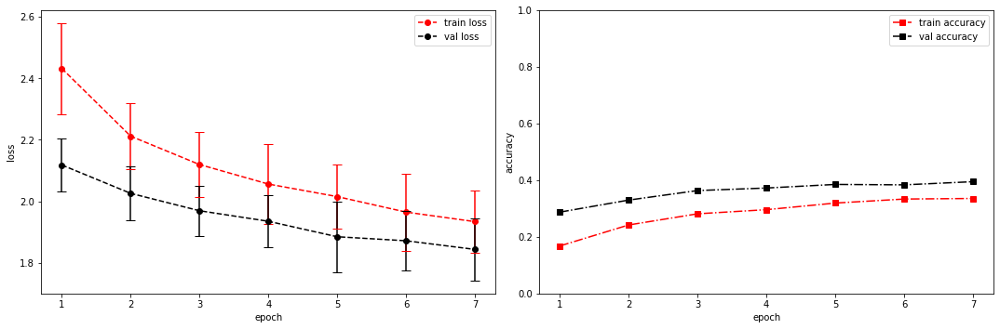

model saved


training epoch:  7
model set to train
Epoch [8/100], step [1/84],  Loss: 1.9170 +/- 0.0000,  accuracy: 0.025390625, time elapsed = 0.28706836700439453s
Epoch [8/100], step [17/84],  Loss: 1.8862 +/- 0.1048,  accuracy: 0.361328125, time elapsed = 0.8870394229888916s
Epoch [8/100], step [33/84],  Loss: 1.9079 +/- 0.1051,  accuracy: 0.3828125, time elapsed = 0.8697965145111084s
Epoch [8/100], step [49/84],  Loss: 1.9061 +/- 0.0992,  accuracy: 0.3759765625, time elapsed = 0.8863551616668701s
Epoch [8/100], step [65/84],  Loss: 1.8306 +/- 0.1202,  accuracy: 0.375, time elapsed = 0.8870105743408203s
Epoch [8/100], step [81/84],  Loss: 1.9326 +/- 0.1129,  accuracy: 0.35546875, time elapsed = 0.8615133762359619s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.36919634532910683,  precision = 0.36919634532910683 recall = 0.36919634532910683 f1 = 0.36919634532910683 ::: val: acc = 0.4079045488441462,  precision = 0.4079045488441462 recall = 0.4079045488441462 time elapsed = 

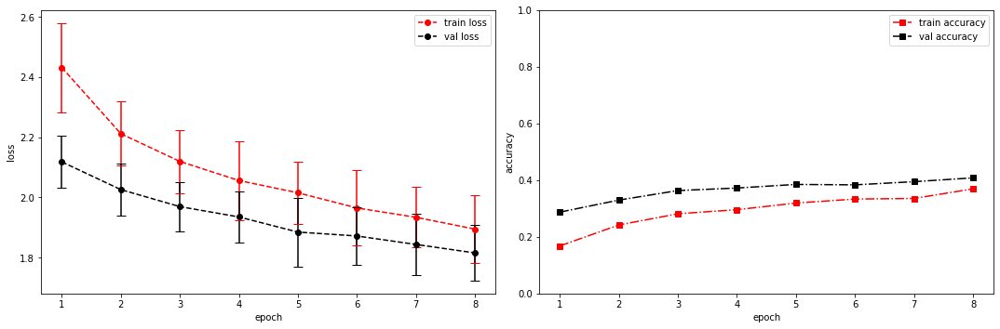

model saved


training epoch:  8
model set to train
Epoch [9/100], step [1/84],  Loss: 2.1847 +/- 0.0000,  accuracy: 0.017578125, time elapsed = 0.2849555015563965s
Epoch [9/100], step [17/84],  Loss: 1.8902 +/- 0.1129,  accuracy: 0.3583984375, time elapsed = 0.9097075462341309s
Epoch [9/100], step [33/84],  Loss: 1.8837 +/- 0.0980,  accuracy: 0.365234375, time elapsed = 0.882960319519043s
Epoch [9/100], step [49/84],  Loss: 1.8344 +/- 0.1257,  accuracy: 0.3740234375, time elapsed = 0.8729925155639648s
Epoch [9/100], step [65/84],  Loss: 1.8652 +/- 0.0958,  accuracy: 0.3896484375, time elapsed = 0.8841674327850342s
Epoch [9/100], step [81/84],  Loss: 1.8652 +/- 0.1393,  accuracy: 0.3623046875, time elapsed = 0.8682708740234375s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.36826403132575053,  precision = 0.36826403132575053 recall = 0.36826403132575053 f1 = 0.36826403132575053 ::: val: acc = 0.41014168530947054,  precision = 0.41014168530947054 recall = 0.41014168530947054 ti

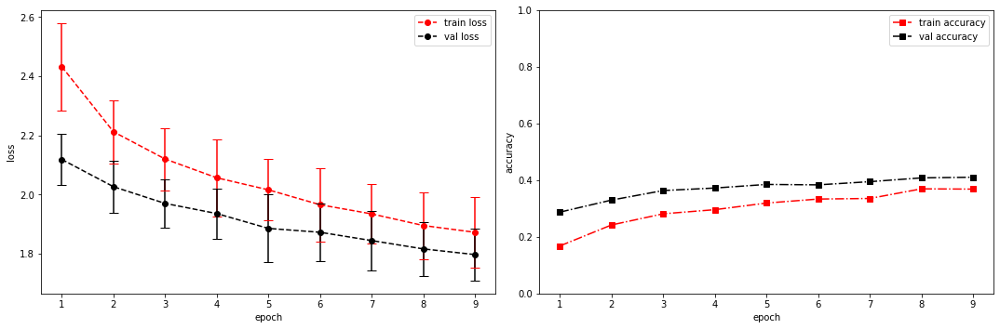

model saved


training epoch:  9
model set to train
Epoch [10/100], step [1/84],  Loss: 1.9360 +/- 0.0000,  accuracy: 0.0205078125, time elapsed = 0.28326416015625s
Epoch [10/100], step [17/84],  Loss: 1.8059 +/- 0.0708,  accuracy: 0.404296875, time elapsed = 0.885169267654419s
Epoch [10/100], step [33/84],  Loss: 1.8832 +/- 0.1065,  accuracy: 0.369140625, time elapsed = 0.8750407695770264s
Epoch [10/100], step [49/84],  Loss: 1.8179 +/- 0.0894,  accuracy: 0.38671875, time elapsed = 0.889054536819458s
Epoch [10/100], step [65/84],  Loss: 1.8216 +/- 0.0850,  accuracy: 0.39453125, time elapsed = 0.8705174922943115s
Epoch [10/100], step [81/84],  Loss: 1.8239 +/- 0.0902,  accuracy: 0.40234375, time elapsed = 0.9307653903961182s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.38896140220026104,  precision = 0.38896140220026104 recall = 0.38896140220026104 f1 = 0.38896140220026104 ::: val: acc = 0.41387024608501116,  precision = 0.41387024608501116 recall = 0.41387024608501116 time 

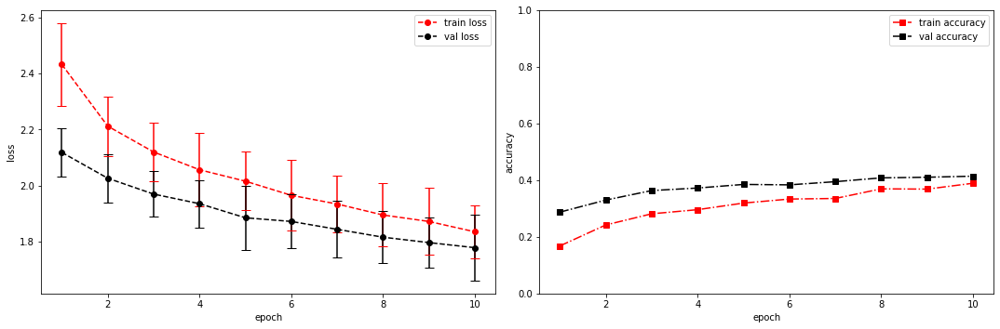

model saved


training epoch:  10
model set to train
Epoch [11/100], step [1/84],  Loss: 1.9800 +/- 0.0000,  accuracy: 0.021484375, time elapsed = 0.29449462890625s
Epoch [11/100], step [17/84],  Loss: 1.8344 +/- 0.0950,  accuracy: 0.3779296875, time elapsed = 0.8817205429077148s
Epoch [11/100], step [33/84],  Loss: 1.8129 +/- 0.1052,  accuracy: 0.3896484375, time elapsed = 0.8819375038146973s
Epoch [11/100], step [49/84],  Loss: 1.8420 +/- 0.0891,  accuracy: 0.37109375, time elapsed = 0.8813865184783936s
Epoch [11/100], step [65/84],  Loss: 1.8319 +/- 0.0982,  accuracy: 0.3837890625, time elapsed = 0.8956131935119629s
Epoch [11/100], step [81/84],  Loss: 1.7977 +/- 0.1247,  accuracy: 0.3974609375, time elapsed = 0.8800685405731201s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.38355398098079435,  precision = 0.38355398098079435 recall = 0.38355398098079435 f1 = 0.38355398098079435 ::: val: acc = 0.4153616703952274,  precision = 0.4153616703952274 recall = 0.4153616703952274 

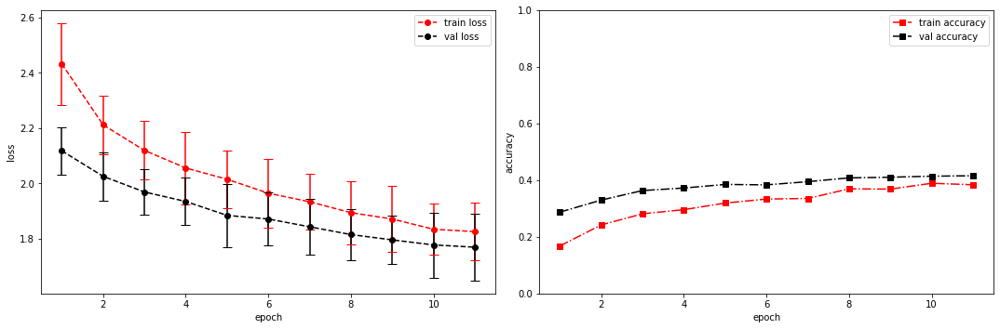

model saved


training epoch:  11
model set to train
Epoch [12/100], step [1/84],  Loss: 1.8811 +/- 0.0000,  accuracy: 0.0224609375, time elapsed = 0.28857946395874023s
Epoch [12/100], step [17/84],  Loss: 1.7628 +/- 0.0985,  accuracy: 0.412109375, time elapsed = 0.8985249996185303s
Epoch [12/100], step [33/84],  Loss: 1.7452 +/- 0.1073,  accuracy: 0.416015625, time elapsed = 0.8872859477996826s
Epoch [12/100], step [49/84],  Loss: 1.8297 +/- 0.0907,  accuracy: 0.390625, time elapsed = 0.888340950012207s
Epoch [12/100], step [65/84],  Loss: 1.7827 +/- 0.1421,  accuracy: 0.40625, time elapsed = 0.8798415660858154s
Epoch [12/100], step [81/84],  Loss: 1.7533 +/- 0.0978,  accuracy: 0.4072265625, time elapsed = 0.8806426525115967s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4074212194667164,  precision = 0.4074212194667164 recall = 0.4074212194667164 f1 = 0.4074212194667164 ::: val: acc = 0.4220730797912006,  precision = 0.4220730797912006 recall = 0.4220730797912006 time elaps

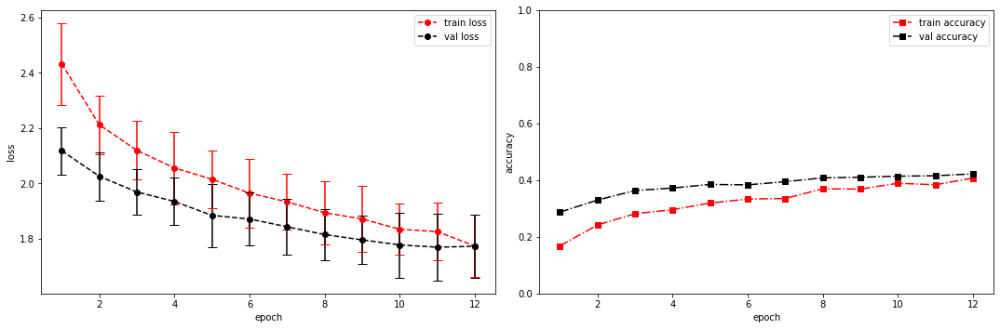

model saved


training epoch:  12
model set to train
Epoch [13/100], step [1/84],  Loss: 1.8380 +/- 0.0000,  accuracy: 0.0283203125, time elapsed = 0.2911038398742676s
Epoch [13/100], step [17/84],  Loss: 1.7204 +/- 0.1179,  accuracy: 0.4375, time elapsed = 0.8923685550689697s
Epoch [13/100], step [33/84],  Loss: 1.7408 +/- 0.1185,  accuracy: 0.4189453125, time elapsed = 0.8834235668182373s
Epoch [13/100], step [49/84],  Loss: 1.7301 +/- 0.1258,  accuracy: 0.42578125, time elapsed = 0.8802905082702637s
Epoch [13/100], step [65/84],  Loss: 1.7661 +/- 0.1056,  accuracy: 0.40234375, time elapsed = 0.8878483772277832s
Epoch [13/100], step [81/84],  Loss: 1.8038 +/- 0.1133,  accuracy: 0.375, time elapsed = 0.8756535053253174s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.41264217788551183,  precision = 0.41264217788551183 recall = 0.41264217788551183 f1 = 0.41264217788551183 ::: val: acc = 0.4146159582401193,  precision = 0.4146159582401193 recall = 0.4146159582401193 time elapsed

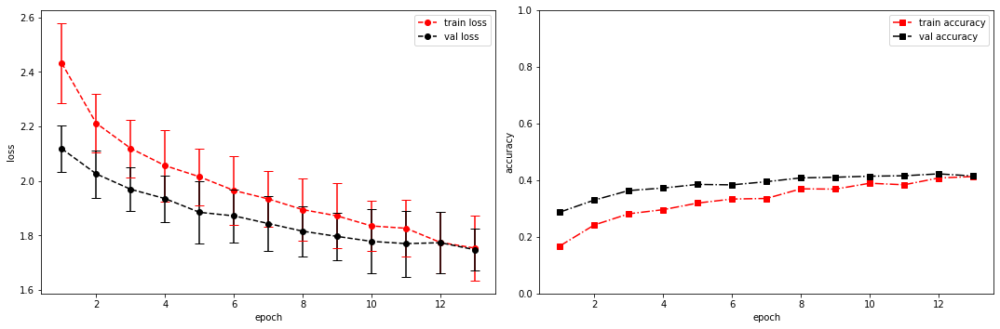

model saved


training epoch:  13
model set to train
Epoch [14/100], step [1/84],  Loss: 2.0418 +/- 0.0000,  accuracy: 0.021484375, time elapsed = 0.2879025936126709s
Epoch [14/100], step [17/84],  Loss: 1.7551 +/- 0.1211,  accuracy: 0.4140625, time elapsed = 0.8886415958404541s
Epoch [14/100], step [33/84],  Loss: 1.7399 +/- 0.1208,  accuracy: 0.4130859375, time elapsed = 0.8685610294342041s
Epoch [14/100], step [49/84],  Loss: 1.7342 +/- 0.1118,  accuracy: 0.4248046875, time elapsed = 0.8731362819671631s
Epoch [14/100], step [65/84],  Loss: 1.7101 +/- 0.0924,  accuracy: 0.4345703125, time elapsed = 0.8668861389160156s
Epoch [14/100], step [81/84],  Loss: 1.7405 +/- 0.1396,  accuracy: 0.416015625, time elapsed = 0.8708717823028564s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4186089875069924,  precision = 0.4186089875069924 recall = 0.4186089875069924 f1 = 0.4186089875069924 ::: val: acc = 0.4272930648769575,  precision = 0.4272930648769575 recall = 0.4272930648769575 time

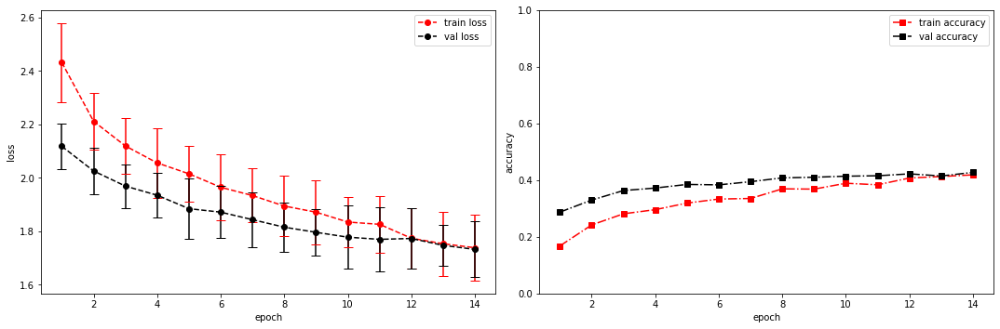

model saved


training epoch:  14
model set to train
Epoch [15/100], step [1/84],  Loss: 1.5787 +/- 0.0000,  accuracy: 0.02734375, time elapsed = 0.2897474765777588s
Epoch [15/100], step [17/84],  Loss: 1.7409 +/- 0.1093,  accuracy: 0.421875, time elapsed = 0.9111020565032959s
Epoch [15/100], step [33/84],  Loss: 1.7279 +/- 0.1078,  accuracy: 0.4169921875, time elapsed = 0.8878819942474365s
Epoch [15/100], step [49/84],  Loss: 1.7050 +/- 0.0874,  accuracy: 0.42578125, time elapsed = 0.8781900405883789s
Epoch [15/100], step [65/84],  Loss: 1.7242 +/- 0.1232,  accuracy: 0.42578125, time elapsed = 0.8712201118469238s
Epoch [15/100], step [81/84],  Loss: 1.6602 +/- 0.1039,  accuracy: 0.4541015625, time elapsed = 0.906231164932251s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4277456647398844,  precision = 0.4277456647398844 recall = 0.4277456647398844 f1 = 0.42774566473988435 ::: val: acc = 0.42654735272184935,  precision = 0.42654735272184935 recall = 0.42654735272184935 time e

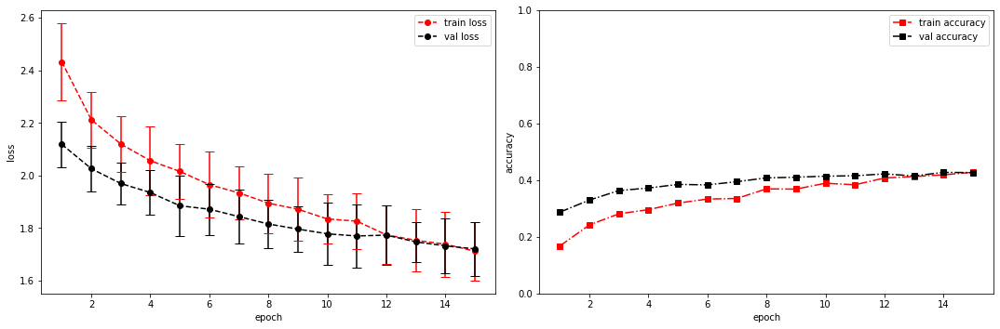

model saved


training epoch:  15
model set to train
Epoch [16/100], step [1/84],  Loss: 1.7333 +/- 0.0000,  accuracy: 0.0244140625, time elapsed = 0.2961132526397705s
Epoch [16/100], step [17/84],  Loss: 1.7107 +/- 0.0599,  accuracy: 0.4248046875, time elapsed = 0.8673312664031982s
Epoch [16/100], step [33/84],  Loss: 1.7003 +/- 0.1246,  accuracy: 0.4365234375, time elapsed = 0.8930950164794922s
Epoch [16/100], step [49/84],  Loss: 1.6777 +/- 0.1022,  accuracy: 0.4345703125, time elapsed = 0.9726157188415527s
Epoch [16/100], step [65/84],  Loss: 1.6774 +/- 0.1017,  accuracy: 0.4404296875, time elapsed = 0.9561178684234619s
Epoch [16/100], step [81/84],  Loss: 1.6702 +/- 0.1348,  accuracy: 0.45703125, time elapsed = 1.0335962772369385s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.43837404437814653,  precision = 0.43837404437814653 recall = 0.43837404437814653 f1 = 0.4383740443781465 ::: val: acc = 0.4354958985831469,  precision = 0.4354958985831469 recall = 0.435495898583146

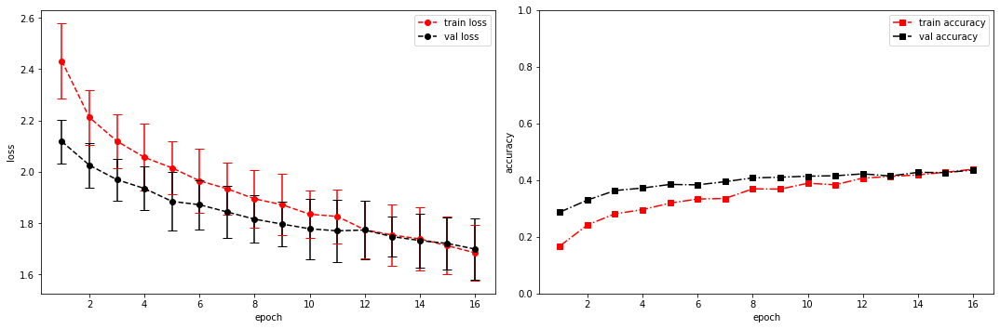

model saved


training epoch:  16
model set to train
Epoch [17/100], step [1/84],  Loss: 1.6226 +/- 0.0000,  accuracy: 0.0234375, time elapsed = 0.29062938690185547s
Epoch [17/100], step [17/84],  Loss: 1.6378 +/- 0.0876,  accuracy: 0.4482421875, time elapsed = 0.9302282333374023s
Epoch [17/100], step [33/84],  Loss: 1.6804 +/- 0.1129,  accuracy: 0.443359375, time elapsed = 0.913278341293335s
Epoch [17/100], step [49/84],  Loss: 1.7155 +/- 0.1379,  accuracy: 0.4482421875, time elapsed = 0.9265930652618408s
Epoch [17/100], step [65/84],  Loss: 1.6552 +/- 0.0943,  accuracy: 0.431640625, time elapsed = 0.8985462188720703s
Epoch [17/100], step [81/84],  Loss: 1.6259 +/- 0.1208,  accuracy: 0.44921875, time elapsed = 0.885944128036499s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.44415439119895583,  precision = 0.44415439119895583 recall = 0.44415439119895583 f1 = 0.44415439119895583 ::: val: acc = 0.4407158836689038,  precision = 0.4407158836689038 recall = 0.4407158836689038 tim

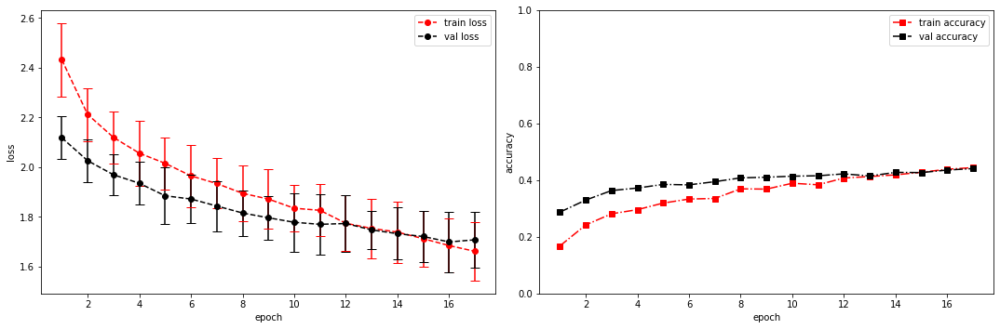

model saved


training epoch:  17
model set to train
Epoch [18/100], step [1/84],  Loss: 1.7459 +/- 0.0000,  accuracy: 0.025390625, time elapsed = 0.29071545600891113s
Epoch [18/100], step [17/84],  Loss: 1.6688 +/- 0.0854,  accuracy: 0.4482421875, time elapsed = 0.930959939956665s
Epoch [18/100], step [33/84],  Loss: 1.5886 +/- 0.1031,  accuracy: 0.4609375, time elapsed = 0.9047870635986328s
Epoch [18/100], step [49/84],  Loss: 1.6155 +/- 0.0961,  accuracy: 0.474609375, time elapsed = 0.9998984336853027s
Epoch [18/100], step [65/84],  Loss: 1.6374 +/- 0.1043,  accuracy: 0.44140625, time elapsed = 0.916414737701416s
Epoch [18/100], step [81/84],  Loss: 1.6666 +/- 0.1040,  accuracy: 0.4521484375, time elapsed = 0.90897536277771s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4557150848405743,  precision = 0.4557150848405743 recall = 0.4557150848405743 f1 = 0.4557150848405743 ::: val: acc = 0.44966442953020136,  precision = 0.44966442953020136 recall = 0.44966442953020136 time e

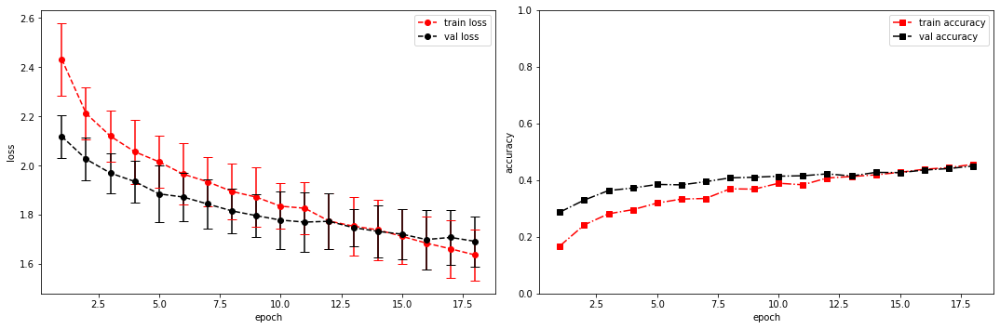

model saved


training epoch:  18
model set to train
Epoch [19/100], step [1/84],  Loss: 1.8506 +/- 0.0000,  accuracy: 0.02734375, time elapsed = 0.2916593551635742s
Epoch [19/100], step [17/84],  Loss: 1.6005 +/- 0.1296,  accuracy: 0.484375, time elapsed = 0.8964149951934814s
Epoch [19/100], step [33/84],  Loss: 1.6341 +/- 0.1599,  accuracy: 0.451171875, time elapsed = 0.8943629264831543s
Epoch [19/100], step [49/84],  Loss: 1.5743 +/- 0.1215,  accuracy: 0.466796875, time elapsed = 0.9046201705932617s
Epoch [19/100], step [65/84],  Loss: 1.6549 +/- 0.1251,  accuracy: 0.4638671875, time elapsed = 0.9041368961334229s
Epoch [19/100], step [81/84],  Loss: 1.6165 +/- 0.1146,  accuracy: 0.4677734375, time elapsed = 0.8919968605041504s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.46652992727950776,  precision = 0.46652992727950776 recall = 0.46652992727950776 f1 = 0.46652992727950776 ::: val: acc = 0.44742729306487694,  precision = 0.44742729306487694 recall = 0.44742729306487694 

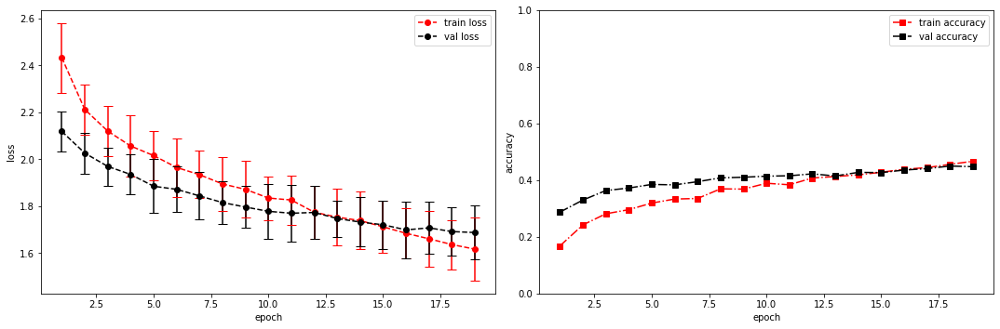

model saved


training epoch:  19
model set to train
Epoch [20/100], step [1/84],  Loss: 1.4079 +/- 0.0000,  accuracy: 0.0361328125, time elapsed = 0.2898848056793213s
Epoch [20/100], step [17/84],  Loss: 1.5994 +/- 0.1050,  accuracy: 0.466796875, time elapsed = 0.932417631149292s
Epoch [20/100], step [33/84],  Loss: 1.6183 +/- 0.1175,  accuracy: 0.45703125, time elapsed = 0.8890202045440674s
Epoch [20/100], step [49/84],  Loss: 1.5670 +/- 0.0808,  accuracy: 0.484375, time elapsed = 0.8712472915649414s
Epoch [20/100], step [65/84],  Loss: 1.5648 +/- 0.1270,  accuracy: 0.4931640625, time elapsed = 0.8876910209655762s
Epoch [20/100], step [81/84],  Loss: 1.6267 +/- 0.0648,  accuracy: 0.4453125, time elapsed = 0.9036285877227783s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.46988625769159054,  precision = 0.46988625769159054 recall = 0.46988625769159054 f1 = 0.46988625769159054 ::: val: acc = 0.45041014168530946,  precision = 0.45041014168530946 recall = 0.45041014168530946 tim

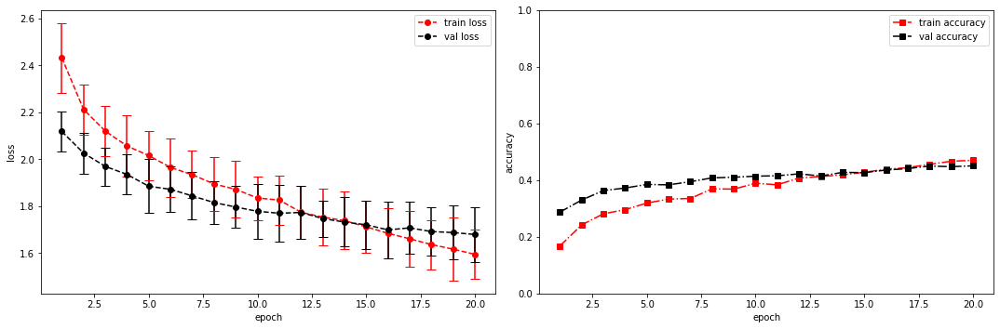

model saved


training epoch:  20
model set to train
Epoch [21/100], step [1/84],  Loss: 1.6182 +/- 0.0000,  accuracy: 0.0302734375, time elapsed = 0.30196332931518555s
Epoch [21/100], step [17/84],  Loss: 1.5579 +/- 0.1547,  accuracy: 0.478515625, time elapsed = 0.8928415775299072s
Epoch [21/100], step [33/84],  Loss: 1.6097 +/- 0.1240,  accuracy: 0.451171875, time elapsed = 0.8723719120025635s
Epoch [21/100], step [49/84],  Loss: 1.5536 +/- 0.1109,  accuracy: 0.47265625, time elapsed = 0.8867106437683105s
Epoch [21/100], step [65/84],  Loss: 1.5745 +/- 0.1432,  accuracy: 0.5048828125, time elapsed = 0.8692083358764648s
Epoch [21/100], step [81/84],  Loss: 1.5862 +/- 0.1137,  accuracy: 0.4814453125, time elapsed = 0.877277135848999s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.47809062092112625,  precision = 0.47809062092112625 recall = 0.47809062092112625 f1 = 0.47809062092112625 ::: val: acc = 0.45563012677106635,  precision = 0.45563012677106635 recall = 0.45563012677106

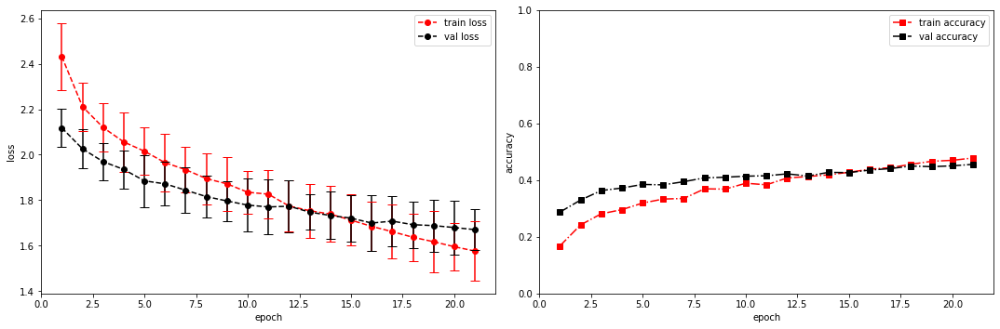

model saved


training epoch:  21
model set to train
Epoch [22/100], step [1/84],  Loss: 1.6444 +/- 0.0000,  accuracy: 0.025390625, time elapsed = 0.30013108253479004s
Epoch [22/100], step [17/84],  Loss: 1.5697 +/- 0.1042,  accuracy: 0.470703125, time elapsed = 0.9130382537841797s
Epoch [22/100], step [33/84],  Loss: 1.5839 +/- 0.0902,  accuracy: 0.4755859375, time elapsed = 0.8943328857421875s
Epoch [22/100], step [49/84],  Loss: 1.5041 +/- 0.0967,  accuracy: 0.4951171875, time elapsed = 0.8762843608856201s
Epoch [22/100], step [65/84],  Loss: 1.5557 +/- 0.1241,  accuracy: 0.498046875, time elapsed = 0.9088983535766602s
Epoch [22/100], step [81/84],  Loss: 1.5648 +/- 0.0981,  accuracy: 0.486328125, time elapsed = 0.8619482517242432s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.484243893343278,  precision = 0.484243893343278 recall = 0.484243893343278 f1 = 0.484243893343278 ::: val: acc = 0.4541387024608501,  precision = 0.4541387024608501 recall = 0.4541387024608501 time e

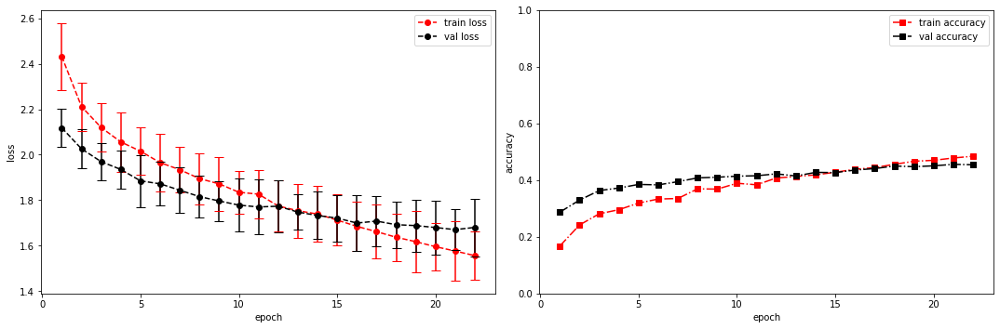

model saved


training epoch:  22
model set to train
Epoch [23/100], step [1/84],  Loss: 1.2328 +/- 0.0000,  accuracy: 0.0419921875, time elapsed = 0.29744720458984375s
Epoch [23/100], step [17/84],  Loss: 1.5503 +/- 0.1083,  accuracy: 0.4892578125, time elapsed = 0.8796961307525635s
Epoch [23/100], step [33/84],  Loss: 1.5746 +/- 0.1411,  accuracy: 0.478515625, time elapsed = 0.887052059173584s
Epoch [23/100], step [49/84],  Loss: 1.5081 +/- 0.1254,  accuracy: 0.5048828125, time elapsed = 0.8859710693359375s
Epoch [23/100], step [65/84],  Loss: 1.5557 +/- 0.1020,  accuracy: 0.498046875, time elapsed = 0.8739533424377441s
Epoch [23/100], step [81/84],  Loss: 1.5099 +/- 0.1308,  accuracy: 0.5029296875, time elapsed = 0.8765912055969238s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.495431661383554,  precision = 0.495431661383554 recall = 0.495431661383554 f1 = 0.495431661383554 ::: val: acc = 0.44668158090976884,  precision = 0.44668158090976884 recall = 0.44668158090976884 ti

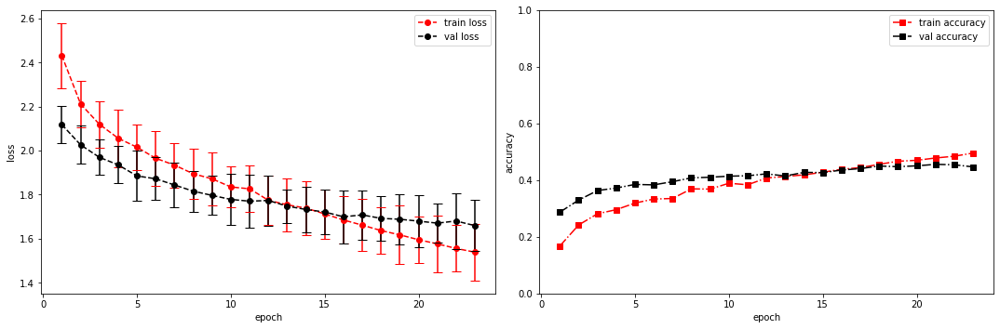

model saved


training epoch:  23
model set to train
Epoch [24/100], step [1/84],  Loss: 1.4354 +/- 0.0000,  accuracy: 0.0361328125, time elapsed = 0.3036818504333496s
Epoch [24/100], step [17/84],  Loss: 1.4851 +/- 0.1390,  accuracy: 0.50390625, time elapsed = 0.9098896980285645s
Epoch [24/100], step [33/84],  Loss: 1.5362 +/- 0.1488,  accuracy: 0.4921875, time elapsed = 0.9102673530578613s
Epoch [24/100], step [49/84],  Loss: 1.5158 +/- 0.1308,  accuracy: 0.49609375, time elapsed = 0.8827395439147949s
Epoch [24/100], step [65/84],  Loss: 1.5536 +/- 0.1092,  accuracy: 0.515625, time elapsed = 0.8734855651855469s
Epoch [24/100], step [81/84],  Loss: 1.4939 +/- 0.0860,  accuracy: 0.4970703125, time elapsed = 0.8745510578155518s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5034495618124184,  precision = 0.5034495618124184 recall = 0.5034495618124184 f1 = 0.5034495618124184 ::: val: acc = 0.45041014168530946,  precision = 0.45041014168530946 recall = 0.45041014168530946 time el

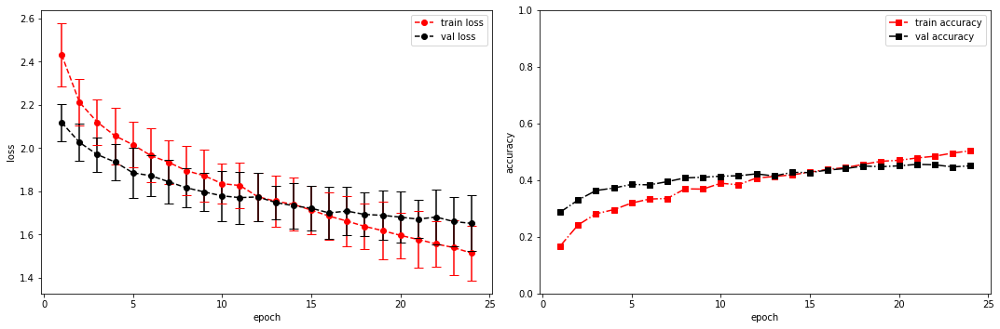

model saved


training epoch:  24
model set to train
Epoch [25/100], step [1/84],  Loss: 1.5457 +/- 0.0000,  accuracy: 0.0302734375, time elapsed = 0.30100512504577637s
Epoch [25/100], step [17/84],  Loss: 1.4686 +/- 0.1681,  accuracy: 0.537109375, time elapsed = 0.90627121925354s
Epoch [25/100], step [33/84],  Loss: 1.5056 +/- 0.1514,  accuracy: 0.525390625, time elapsed = 0.9191222190856934s
Epoch [25/100], step [49/84],  Loss: 1.5007 +/- 0.1062,  accuracy: 0.5009765625, time elapsed = 0.8932278156280518s
Epoch [25/100], step [65/84],  Loss: 1.4824 +/- 0.1091,  accuracy: 0.5107421875, time elapsed = 0.9108262062072754s
Epoch [25/100], step [81/84],  Loss: 1.4567 +/- 0.1434,  accuracy: 0.5234375, time elapsed = 0.9012603759765625s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5181801230654485,  precision = 0.5181801230654485 recall = 0.5181801230654485 f1 = 0.5181801230654485 ::: val: acc = 0.4519015659955257,  precision = 0.4519015659955257 recall = 0.4519015659955257 time 

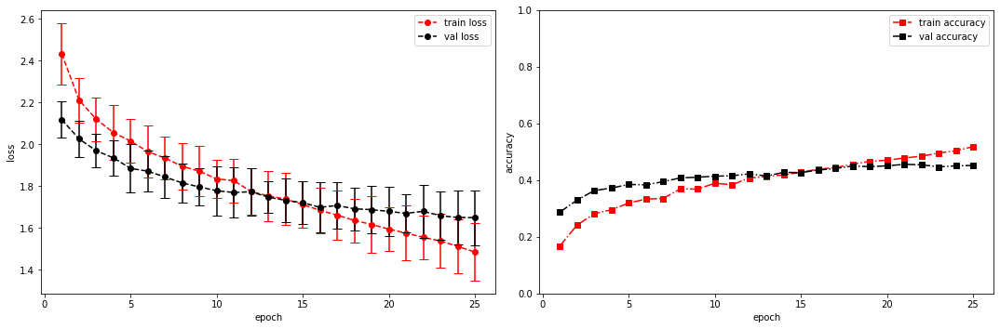

model saved


training epoch:  25
model set to train
Epoch [26/100], step [1/84],  Loss: 1.3574 +/- 0.0000,  accuracy: 0.03515625, time elapsed = 0.3363611698150635s
Epoch [26/100], step [17/84],  Loss: 1.5022 +/- 0.1008,  accuracy: 0.5087890625, time elapsed = 0.8878641128540039s
Epoch [26/100], step [33/84],  Loss: 1.4481 +/- 0.0983,  accuracy: 0.5380859375, time elapsed = 0.8891632556915283s
Epoch [26/100], step [49/84],  Loss: 1.4545 +/- 0.1231,  accuracy: 0.53515625, time elapsed = 0.8743517398834229s
Epoch [26/100], step [65/84],  Loss: 1.4445 +/- 0.1322,  accuracy: 0.533203125, time elapsed = 0.8797194957733154s
Epoch [26/100], step [81/84],  Loss: 1.4097 +/- 0.0861,  accuracy: 0.544921875, time elapsed = 0.8714590072631836s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5314189819131083,  precision = 0.5314189819131083 recall = 0.5314189819131083 f1 = 0.5314189819131083 ::: val: acc = 0.4615958240119314,  precision = 0.4615958240119314 recall = 0.4615958240119314 time 

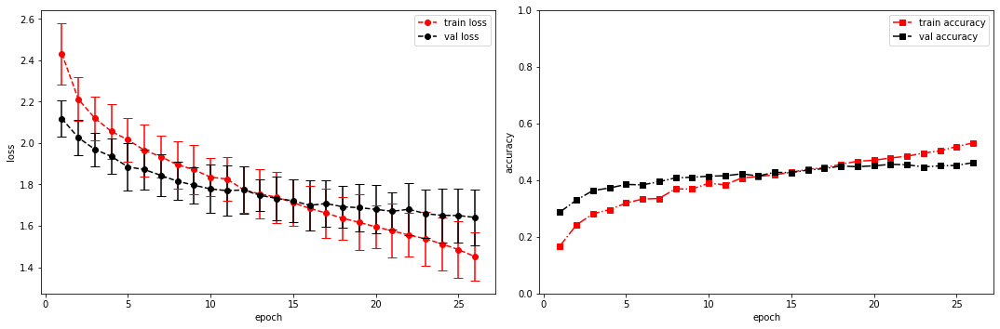

model saved


training epoch:  26
model set to train
Epoch [27/100], step [1/84],  Loss: 1.3069 +/- 0.0000,  accuracy: 0.03515625, time elapsed = 0.2924377918243408s
Epoch [27/100], step [17/84],  Loss: 1.3721 +/- 0.1224,  accuracy: 0.5595703125, time elapsed = 0.9243018627166748s
Epoch [27/100], step [33/84],  Loss: 1.4080 +/- 0.0859,  accuracy: 0.5341796875, time elapsed = 0.8862521648406982s
Epoch [27/100], step [49/84],  Loss: 1.4376 +/- 0.1355,  accuracy: 0.544921875, time elapsed = 0.8913519382476807s
Epoch [27/100], step [65/84],  Loss: 1.4223 +/- 0.1056,  accuracy: 0.541015625, time elapsed = 0.8833048343658447s
Epoch [27/100], step [81/84],  Loss: 1.4798 +/- 0.1234,  accuracy: 0.521484375, time elapsed = 0.8742940425872803s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5381316427372739,  precision = 0.5381316427372739 recall = 0.5381316427372739 f1 = 0.5381316427372739 ::: val: acc = 0.4571215510812826,  precision = 0.4571215510812826 recall = 0.4571215510812826 time

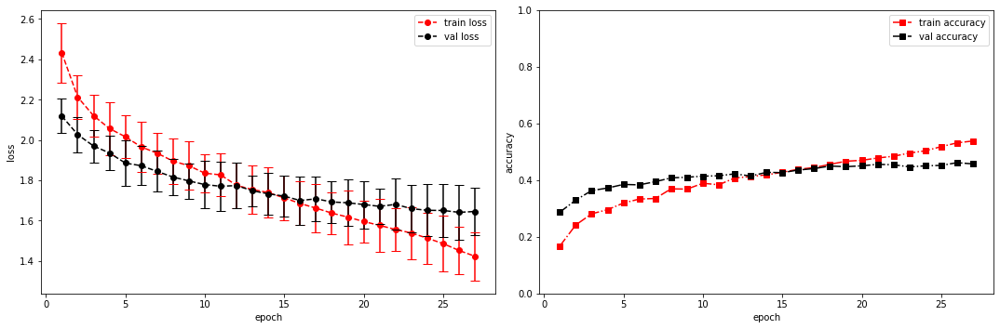

model saved


training epoch:  27
model set to train
Epoch [28/100], step [1/84],  Loss: 1.4071 +/- 0.0000,  accuracy: 0.03515625, time elapsed = 0.29616403579711914s
Epoch [28/100], step [17/84],  Loss: 1.4107 +/- 0.1277,  accuracy: 0.53125, time elapsed = 0.9066095352172852s
Epoch [28/100], step [33/84],  Loss: 1.4366 +/- 0.1626,  accuracy: 0.5390625, time elapsed = 0.8949346542358398s
Epoch [28/100], step [49/84],  Loss: 1.3979 +/- 0.1406,  accuracy: 0.537109375, time elapsed = 0.8917398452758789s
Epoch [28/100], step [65/84],  Loss: 1.4295 +/- 0.1533,  accuracy: 0.5205078125, time elapsed = 0.8679792881011963s
Epoch [28/100], step [81/84],  Loss: 1.4289 +/- 0.0916,  accuracy: 0.5302734375, time elapsed = 0.891801118850708s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5334700727204923,  precision = 0.5334700727204923 recall = 0.5334700727204923 f1 = 0.5334700727204923 ::: val: acc = 0.46756152125279643,  precision = 0.46756152125279643 recall = 0.46756152125279643 time el

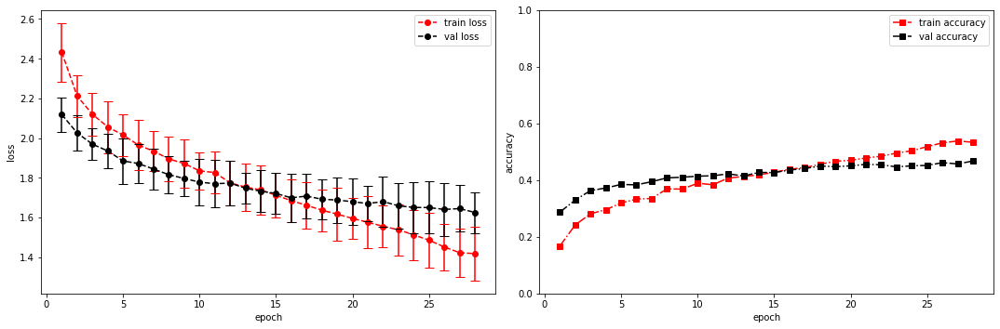

model saved


training epoch:  28
model set to train
Epoch [29/100], step [1/84],  Loss: 1.3983 +/- 0.0000,  accuracy: 0.03515625, time elapsed = 0.3182516098022461s
Epoch [29/100], step [17/84],  Loss: 1.3985 +/- 0.0839,  accuracy: 0.53515625, time elapsed = 0.91178297996521s
Epoch [29/100], step [33/84],  Loss: 1.3477 +/- 0.1271,  accuracy: 0.5732421875, time elapsed = 0.8872261047363281s
Epoch [29/100], step [49/84],  Loss: 1.4081 +/- 0.0933,  accuracy: 0.5439453125, time elapsed = 0.8809783458709717s
Epoch [29/100], step [65/84],  Loss: 1.3737 +/- 0.1094,  accuracy: 0.5390625, time elapsed = 0.916419506072998s
Epoch [29/100], step [81/84],  Loss: 1.3808 +/- 0.1209,  accuracy: 0.5537109375, time elapsed = 0.8839569091796875s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5482006339735223,  precision = 0.5482006339735223 recall = 0.5482006339735223 f1 = 0.5482006339735223 ::: val: acc = 0.4690529455630127,  precision = 0.4690529455630127 recall = 0.4690529455630127 time elap

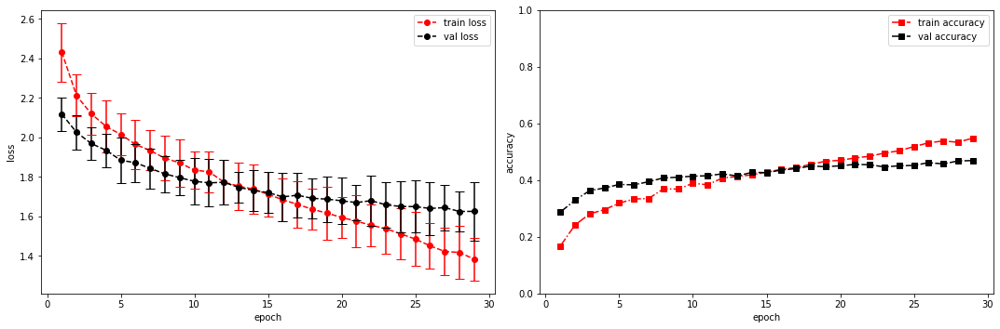

model saved


training epoch:  29
model set to train
Epoch [30/100], step [1/84],  Loss: 1.4923 +/- 0.0000,  accuracy: 0.0322265625, time elapsed = 0.3069629669189453s
Epoch [30/100], step [17/84],  Loss: 1.3980 +/- 0.1016,  accuracy: 0.5439453125, time elapsed = 0.9453070163726807s
Epoch [30/100], step [33/84],  Loss: 1.3215 +/- 0.1000,  accuracy: 0.5947265625, time elapsed = 0.8983545303344727s
Epoch [30/100], step [49/84],  Loss: 1.3776 +/- 0.0850,  accuracy: 0.5380859375, time elapsed = 0.9022045135498047s
Epoch [30/100], step [65/84],  Loss: 1.3940 +/- 0.1194,  accuracy: 0.55859375, time elapsed = 0.8948867321014404s
Epoch [30/100], step [81/84],  Loss: 1.3833 +/- 0.0637,  accuracy: 0.5498046875, time elapsed = 0.8956117630004883s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5573373112064143,  precision = 0.5573373112064143 recall = 0.5573373112064143 f1 = 0.5573373112064143 ::: val: acc = 0.4697986577181208,  precision = 0.4697986577181208 recall = 0.4697986577181208 t

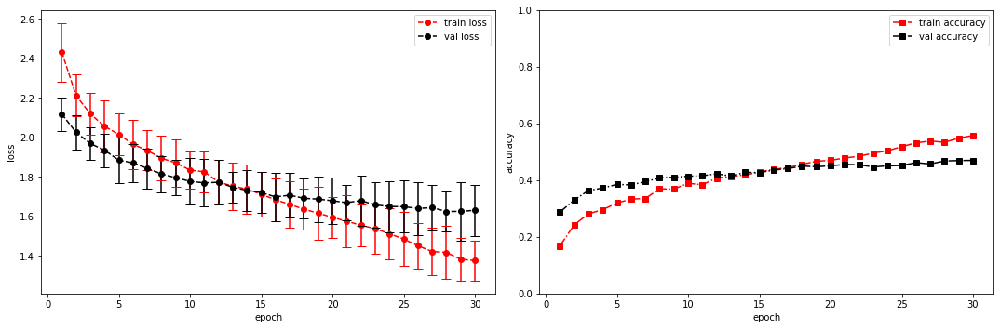

model saved


training epoch:  30
model set to train
Epoch [31/100], step [1/84],  Loss: 1.3585 +/- 0.0000,  accuracy: 0.0361328125, time elapsed = 0.29690122604370117s
Epoch [31/100], step [17/84],  Loss: 1.3191 +/- 0.1571,  accuracy: 0.5703125, time elapsed = 0.9101169109344482s
Epoch [31/100], step [33/84],  Loss: 1.3584 +/- 0.1266,  accuracy: 0.55859375, time elapsed = 0.9053699970245361s
Epoch [31/100], step [49/84],  Loss: 1.3677 +/- 0.1256,  accuracy: 0.5498046875, time elapsed = 0.8855884075164795s
Epoch [31/100], step [65/84],  Loss: 1.3673 +/- 0.1368,  accuracy: 0.5546875, time elapsed = 0.8891921043395996s
Epoch [31/100], step [81/84],  Loss: 1.4052 +/- 0.1385,  accuracy: 0.51171875, time elapsed = 0.9093005657196045s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5489464851762074,  precision = 0.5489464851762074 recall = 0.5489464851762074 f1 = 0.5489464851762074 ::: val: acc = 0.4541387024608501,  precision = 0.4541387024608501 recall = 0.4541387024608501 time ela

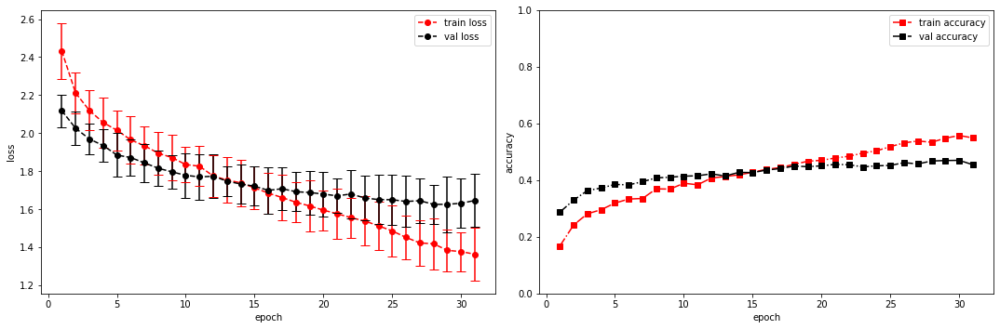

model saved


training epoch:  31
model set to train
Epoch [32/100], step [1/84],  Loss: 1.4426 +/- 0.0000,  accuracy: 0.0341796875, time elapsed = 0.29964566230773926s
Epoch [32/100], step [17/84],  Loss: 1.3706 +/- 0.0849,  accuracy: 0.52734375, time elapsed = 0.8786313533782959s
Epoch [32/100], step [33/84],  Loss: 1.3250 +/- 0.1053,  accuracy: 0.552734375, time elapsed = 0.8776941299438477s
Epoch [32/100], step [49/84],  Loss: 1.3006 +/- 0.1169,  accuracy: 0.5791015625, time elapsed = 0.8892366886138916s
Epoch [32/100], step [65/84],  Loss: 1.3155 +/- 0.1110,  accuracy: 0.5693359375, time elapsed = 0.9022858142852783s
Epoch [32/100], step [81/84],  Loss: 1.3107 +/- 0.0795,  accuracy: 0.5634765625, time elapsed = 0.8683748245239258s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5584560880104419,  precision = 0.5584560880104419 recall = 0.5584560880104419 f1 = 0.5584560880104419 ::: val: acc = 0.4571215510812826,  precision = 0.4571215510812826 recall = 0.4571215510812826 t

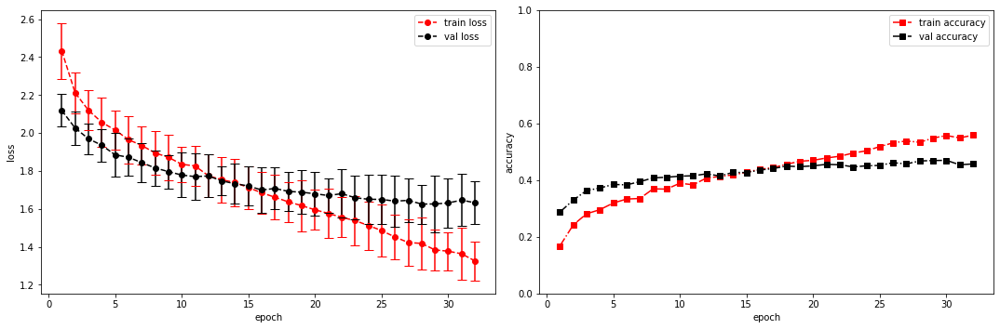

model saved
stopping early
Conv_3_layer
(1, 13, 517)
running model: id = Conv_3_layer, channels = [8, 16, 64]
device:  cuda
dataset metadata:  {'n_fft': 2048, 'hop_length': 256, 'n_mfcc': 13, 'notes': 'optional notes not passed'}
train model: data loaders initialized
sample shape =  (1, 13, 517)
model loaded
Layer (type:depth-idx)                   Output Shape              Param #
├─ConvBlock: 1-1                         [-1, 8, 13, 104]          --
|    └─Sequential: 2-1                   [-1, 8, 13, 104]          --
|    |    └─Conv2d: 3-1                  [-1, 8, 13, 517]          80
|    |    └─ReLU: 3-2                    [-1, 8, 13, 517]          --
|    |    └─MaxPool2d: 3-3               [-1, 8, 13, 104]          --
|    |    └─BatchNorm2d: 3-4             [-1, 8, 13, 104]          16
├─ConvBlock: 1-2                         [-1, 16, 13, 21]          --
|    └─Sequential: 2-2                   [-1, 16, 13, 21]          --
|    |    └─Conv2d: 3-5                  [-1, 16, 13, 1

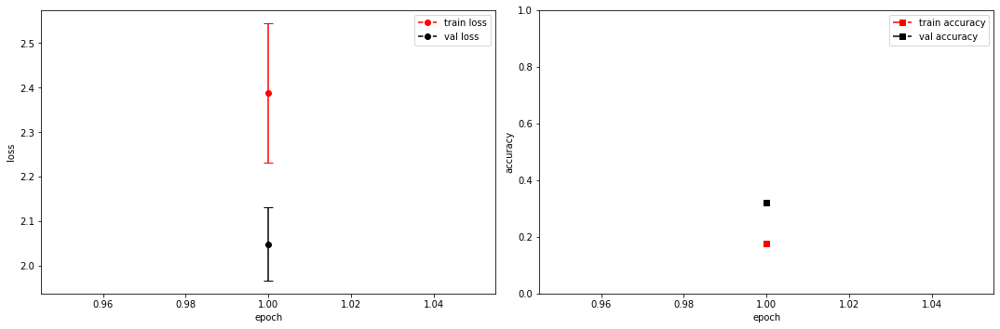

model saved


training epoch:  1
model set to train
Epoch [2/100], step [1/84],  Loss: 2.3632 +/- 0.0000,  accuracy: 0.013671875, time elapsed = 0.3064746856689453s
Epoch [2/100], step [17/84],  Loss: 2.1916 +/- 0.1225,  accuracy: 0.2490234375, time elapsed = 0.8865385055541992s
Epoch [2/100], step [33/84],  Loss: 2.1884 +/- 0.0937,  accuracy: 0.228515625, time elapsed = 0.8948085308074951s
Epoch [2/100], step [49/84],  Loss: 2.2399 +/- 0.1112,  accuracy: 0.224609375, time elapsed = 0.8787751197814941s
Epoch [2/100], step [65/84],  Loss: 2.1466 +/- 0.1200,  accuracy: 0.2529296875, time elapsed = 0.8846571445465088s
Epoch [2/100], step [81/84],  Loss: 2.1936 +/- 0.1076,  accuracy: 0.2353515625, time elapsed = 0.8975348472595215s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.23829945925787804,  precision = 0.23829945925787804 recall = 0.23829945925787804 f1 = 0.23829945925787804 ::: val: acc = 0.34750186428038776,  precision = 0.34750186428038776 recall = 0.34750186428038776 ti

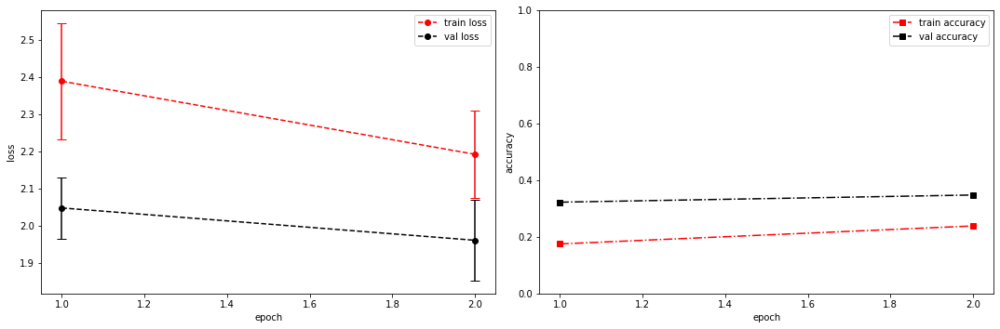

model saved


training epoch:  2
model set to train
Epoch [3/100], step [1/84],  Loss: 2.0804 +/- 0.0000,  accuracy: 0.0166015625, time elapsed = 0.2880535125732422s
Epoch [3/100], step [17/84],  Loss: 2.1208 +/- 0.1023,  accuracy: 0.265625, time elapsed = 0.901491641998291s
Epoch [3/100], step [33/84],  Loss: 2.0894 +/- 0.1081,  accuracy: 0.27734375, time elapsed = 0.8773856163024902s
Epoch [3/100], step [49/84],  Loss: 2.0829 +/- 0.0730,  accuracy: 0.2783203125, time elapsed = 0.9288101196289062s
Epoch [3/100], step [65/84],  Loss: 2.1025 +/- 0.0854,  accuracy: 0.2587890625, time elapsed = 0.8753077983856201s
Epoch [3/100], step [81/84],  Loss: 2.0583 +/- 0.0879,  accuracy: 0.291015625, time elapsed = 0.8794598579406738s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.27279507738206227,  precision = 0.27279507738206227 recall = 0.27279507738206227 f1 = 0.27279507738206227 ::: val: acc = 0.3624161073825503,  precision = 0.3624161073825503 recall = 0.3624161073825503 time elaps

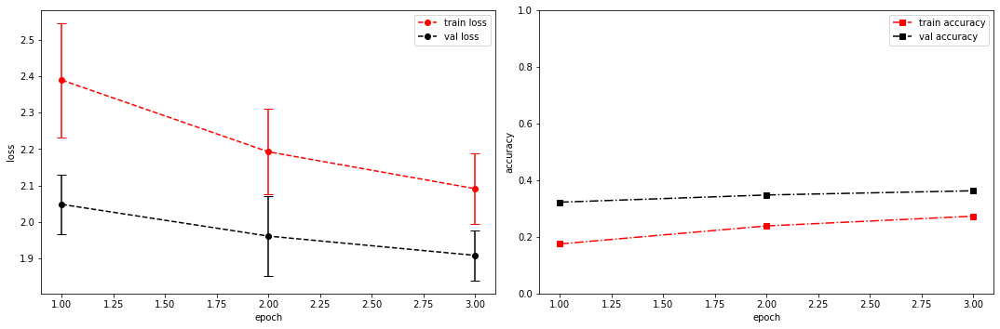

model saved


training epoch:  3
model set to train
Epoch [4/100], step [1/84],  Loss: 2.2091 +/- 0.0000,  accuracy: 0.0166015625, time elapsed = 0.307833194732666s
Epoch [4/100], step [17/84],  Loss: 2.0251 +/- 0.1506,  accuracy: 0.2998046875, time elapsed = 0.9130764007568359s
Epoch [4/100], step [33/84],  Loss: 2.0452 +/- 0.0859,  accuracy: 0.3173828125, time elapsed = 0.884885311126709s
Epoch [4/100], step [49/84],  Loss: 2.0244 +/- 0.0837,  accuracy: 0.3173828125, time elapsed = 0.8950977325439453s
Epoch [4/100], step [65/84],  Loss: 2.0284 +/- 0.0893,  accuracy: 0.2978515625, time elapsed = 0.902522087097168s
Epoch [4/100], step [81/84],  Loss: 2.0096 +/- 0.0694,  accuracy: 0.326171875, time elapsed = 0.8747482299804688s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.31064702591832927,  precision = 0.31064702591832927 recall = 0.31064702591832927 f1 = 0.31064702591832927 ::: val: acc = 0.378076062639821,  precision = 0.378076062639821 recall = 0.378076062639821 time elap

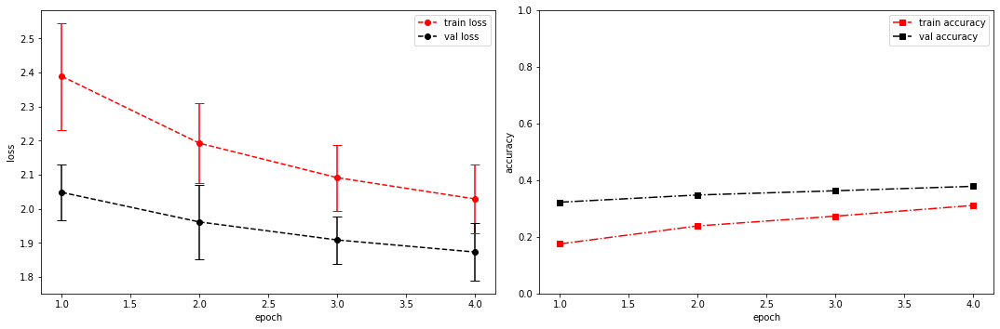

model saved


training epoch:  4
model set to train
Epoch [5/100], step [1/84],  Loss: 1.9445 +/- 0.0000,  accuracy: 0.0205078125, time elapsed = 0.2876465320587158s
Epoch [5/100], step [17/84],  Loss: 1.9869 +/- 0.1131,  accuracy: 0.32421875, time elapsed = 0.9051048755645752s
Epoch [5/100], step [33/84],  Loss: 1.9707 +/- 0.1099,  accuracy: 0.3134765625, time elapsed = 0.8958866596221924s
Epoch [5/100], step [49/84],  Loss: 1.9699 +/- 0.1059,  accuracy: 0.337890625, time elapsed = 0.887479305267334s
Epoch [5/100], step [65/84],  Loss: 1.9522 +/- 0.1112,  accuracy: 0.3408203125, time elapsed = 0.865159273147583s
Epoch [5/100], step [81/84],  Loss: 1.9825 +/- 0.1248,  accuracy: 0.3369140625, time elapsed = 0.896080493927002s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.32892038038411336,  precision = 0.32892038038411336 recall = 0.32892038038411336 f1 = 0.32892038038411336 ::: val: acc = 0.372110365398956,  precision = 0.372110365398956 recall = 0.372110365398956 time elapse

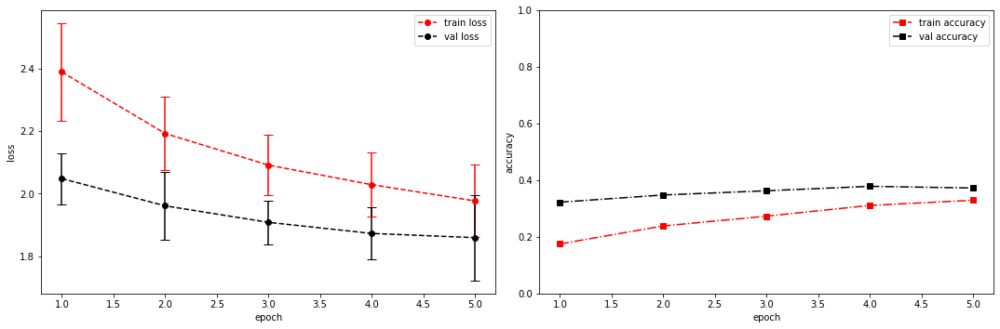

model saved


training epoch:  5
model set to train
Epoch [6/100], step [1/84],  Loss: 1.8435 +/- 0.0000,  accuracy: 0.0263671875, time elapsed = 0.2896754741668701s
Epoch [6/100], step [17/84],  Loss: 1.9882 +/- 0.0833,  accuracy: 0.3154296875, time elapsed = 0.8963093757629395s
Epoch [6/100], step [33/84],  Loss: 1.8869 +/- 0.1111,  accuracy: 0.35546875, time elapsed = 0.8842265605926514s
Epoch [6/100], step [49/84],  Loss: 1.9827 +/- 0.1036,  accuracy: 0.3173828125, time elapsed = 0.875464677810669s
Epoch [6/100], step [65/84],  Loss: 1.9365 +/- 0.0857,  accuracy: 0.3388671875, time elapsed = 0.8809521198272705s
Epoch [6/100], step [81/84],  Loss: 1.9756 +/- 0.1059,  accuracy: 0.3330078125, time elapsed = 0.8899567127227783s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.33544657840760767,  precision = 0.33544657840760767 recall = 0.33544657840760767 f1 = 0.33544657840760767 ::: val: acc = 0.40566741237882176,  precision = 0.40566741237882176 recall = 0.40566741237882176 ti

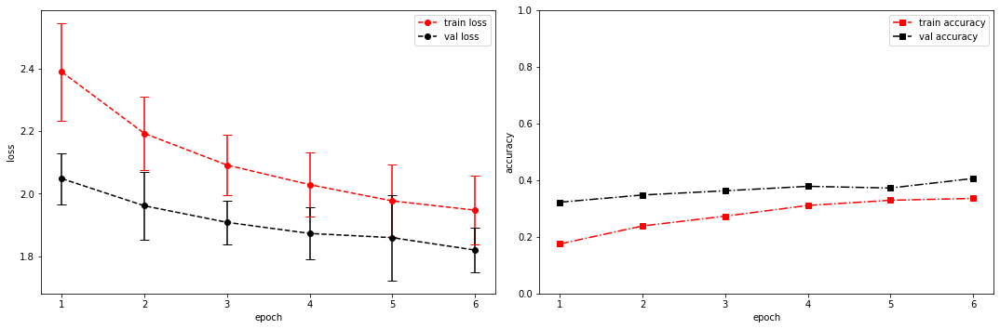

model saved


training epoch:  6
model set to train
Epoch [7/100], step [1/84],  Loss: 1.9982 +/- 0.0000,  accuracy: 0.0166015625, time elapsed = 0.3119187355041504s
Epoch [7/100], step [17/84],  Loss: 1.8822 +/- 0.1404,  accuracy: 0.36328125, time elapsed = 0.9051883220672607s
Epoch [7/100], step [33/84],  Loss: 1.9225 +/- 0.0807,  accuracy: 0.373046875, time elapsed = 0.9102387428283691s
Epoch [7/100], step [49/84],  Loss: 1.8947 +/- 0.1134,  accuracy: 0.380859375, time elapsed = 0.8787496089935303s
Epoch [7/100], step [65/84],  Loss: 1.8866 +/- 0.0921,  accuracy: 0.3701171875, time elapsed = 0.8995137214660645s
Epoch [7/100], step [81/84],  Loss: 1.9176 +/- 0.1274,  accuracy: 0.3408203125, time elapsed = 0.8653485774993896s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.36584001491702406,  precision = 0.36584001491702406 recall = 0.36584001491702406 f1 = 0.3658400149170241 ::: val: acc = 0.4228187919463087,  precision = 0.4228187919463087 recall = 0.4228187919463087 time el

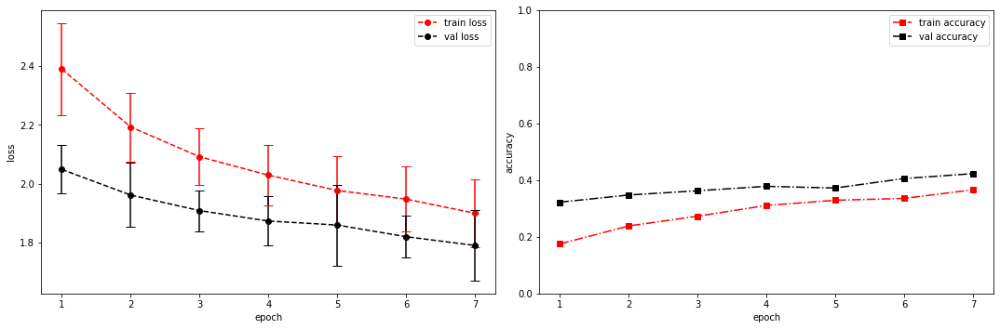

model saved


training epoch:  7
model set to train
Epoch [8/100], step [1/84],  Loss: 1.8677 +/- 0.0000,  accuracy: 0.025390625, time elapsed = 0.30800318717956543s
Epoch [8/100], step [17/84],  Loss: 1.8299 +/- 0.0883,  accuracy: 0.3916015625, time elapsed = 0.8921449184417725s
Epoch [8/100], step [33/84],  Loss: 1.8973 +/- 0.1233,  accuracy: 0.3515625, time elapsed = 0.8971469402313232s
Epoch [8/100], step [49/84],  Loss: 1.8967 +/- 0.0922,  accuracy: 0.376953125, time elapsed = 0.8900241851806641s
Epoch [8/100], step [65/84],  Loss: 1.8425 +/- 0.0965,  accuracy: 0.3701171875, time elapsed = 0.8885524272918701s
Epoch [8/100], step [81/84],  Loss: 1.8693 +/- 0.1390,  accuracy: 0.3798828125, time elapsed = 0.9006655216217041s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.37348498974454597,  precision = 0.37348498974454597 recall = 0.37348498974454597 f1 = 0.37348498974454597 ::: val: acc = 0.42878448918717377,  precision = 0.42878448918717377 recall = 0.42878448918717377 tim

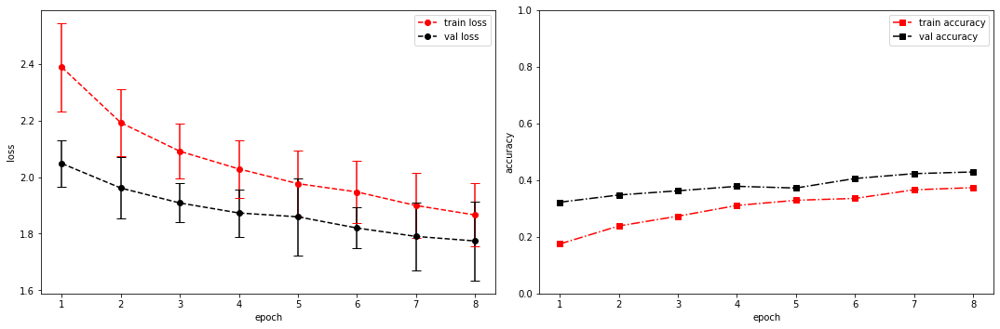

model saved


training epoch:  8
model set to train
Epoch [9/100], step [1/84],  Loss: 1.8588 +/- 0.0000,  accuracy: 0.01953125, time elapsed = 0.3190422058105469s
Epoch [9/100], step [17/84],  Loss: 1.8127 +/- 0.1174,  accuracy: 0.390625, time elapsed = 0.8866310119628906s
Epoch [9/100], step [33/84],  Loss: 1.8417 +/- 0.0828,  accuracy: 0.384765625, time elapsed = 0.8863894939422607s
Epoch [9/100], step [49/84],  Loss: 1.8284 +/- 0.0969,  accuracy: 0.4013671875, time elapsed = 0.8807072639465332s
Epoch [9/100], step [65/84],  Loss: 1.7919 +/- 0.0801,  accuracy: 0.3984375, time elapsed = 0.8840470314025879s
Epoch [9/100], step [81/84],  Loss: 1.8549 +/- 0.1023,  accuracy: 0.3798828125, time elapsed = 0.9244875907897949s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.39008017900428865,  precision = 0.39008017900428865 recall = 0.39008017900428865 f1 = 0.39008017900428865 ::: val: acc = 0.43102162565249813,  precision = 0.43102162565249813 recall = 0.43102162565249813 time elap

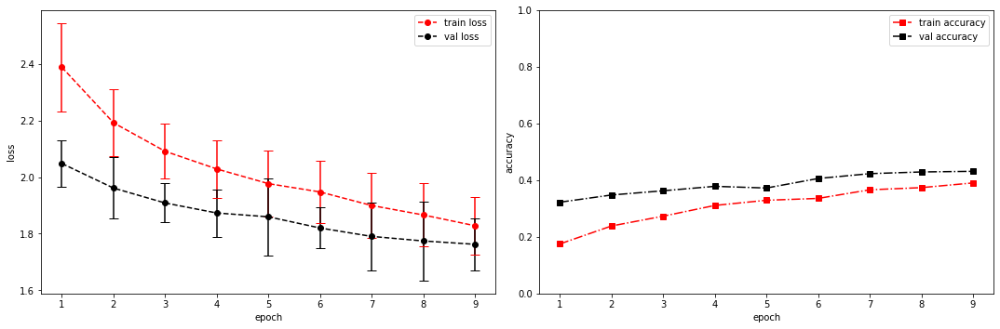

model saved


training epoch:  9
model set to train
Epoch [10/100], step [1/84],  Loss: 1.8035 +/- 0.0000,  accuracy: 0.021484375, time elapsed = 0.29987525939941406s
Epoch [10/100], step [17/84],  Loss: 1.8284 +/- 0.0980,  accuracy: 0.3671875, time elapsed = 0.8952245712280273s
Epoch [10/100], step [33/84],  Loss: 1.8093 +/- 0.1238,  accuracy: 0.4169921875, time elapsed = 0.9099612236022949s
Epoch [10/100], step [49/84],  Loss: 1.7972 +/- 0.1378,  accuracy: 0.4072265625, time elapsed = 0.8755497932434082s
Epoch [10/100], step [65/84],  Loss: 1.8064 +/- 0.1267,  accuracy: 0.404296875, time elapsed = 0.8708672523498535s
Epoch [10/100], step [81/84],  Loss: 1.7858 +/- 0.0975,  accuracy: 0.40234375, time elapsed = 0.8713703155517578s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3992168562371807,  precision = 0.3992168562371807 recall = 0.3992168562371807 f1 = 0.3992168562371807 ::: val: acc = 0.424310216256525,  precision = 0.424310216256525 recall = 0.424310216256525 time elap

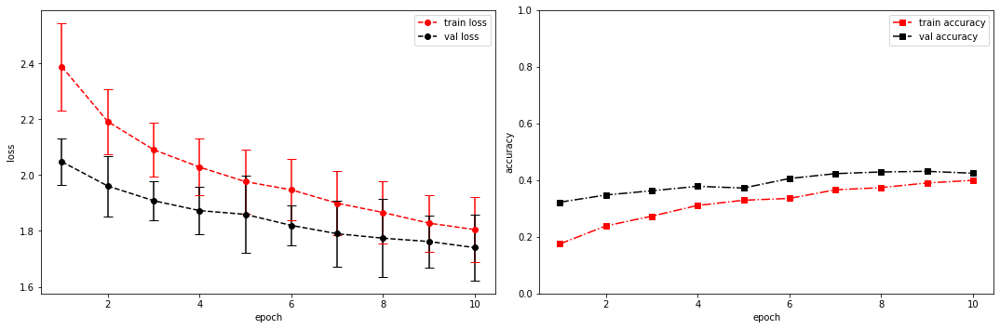

model saved


training epoch:  10
model set to train
Epoch [11/100], step [1/84],  Loss: 1.6856 +/- 0.0000,  accuracy: 0.029296875, time elapsed = 0.31339311599731445s
Epoch [11/100], step [17/84],  Loss: 1.7466 +/- 0.0960,  accuracy: 0.3935546875, time elapsed = 0.9081511497497559s
Epoch [11/100], step [33/84],  Loss: 1.7713 +/- 0.1306,  accuracy: 0.4140625, time elapsed = 0.9057493209838867s
Epoch [11/100], step [49/84],  Loss: 1.7786 +/- 0.0849,  accuracy: 0.3935546875, time elapsed = 0.8955981731414795s
Epoch [11/100], step [65/84],  Loss: 1.7472 +/- 0.1555,  accuracy: 0.408203125, time elapsed = 0.8834075927734375s
Epoch [11/100], step [81/84],  Loss: 1.7476 +/- 0.1111,  accuracy: 0.4189453125, time elapsed = 0.8912999629974365s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.408539996270744,  precision = 0.408539996270744 recall = 0.408539996270744 f1 = 0.408539996270744 ::: val: acc = 0.4436987322893363,  precision = 0.4436987322893363 recall = 0.4436987322893363 time el

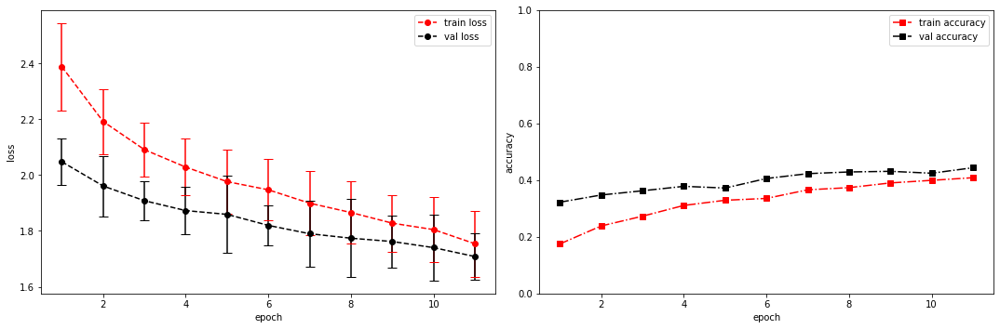

model saved


training epoch:  11
model set to train
Epoch [12/100], step [1/84],  Loss: 1.6976 +/- 0.0000,  accuracy: 0.029296875, time elapsed = 0.31816911697387695s
Epoch [12/100], step [17/84],  Loss: 1.7412 +/- 0.1150,  accuracy: 0.4267578125, time elapsed = 0.8757028579711914s
Epoch [12/100], step [33/84],  Loss: 1.7108 +/- 0.0755,  accuracy: 0.4091796875, time elapsed = 0.9446983337402344s
Epoch [12/100], step [49/84],  Loss: 1.7205 +/- 0.0967,  accuracy: 0.43359375, time elapsed = 0.8892343044281006s
Epoch [12/100], step [65/84],  Loss: 1.7208 +/- 0.0907,  accuracy: 0.43359375, time elapsed = 0.8810155391693115s
Epoch [12/100], step [81/84],  Loss: 1.7034 +/- 0.0995,  accuracy: 0.4375, time elapsed = 0.8875658512115479s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4277456647398844,  precision = 0.4277456647398844 recall = 0.4277456647398844 f1 = 0.42774566473988435 ::: val: acc = 0.45041014168530946,  precision = 0.45041014168530946 recall = 0.45041014168530946 time 

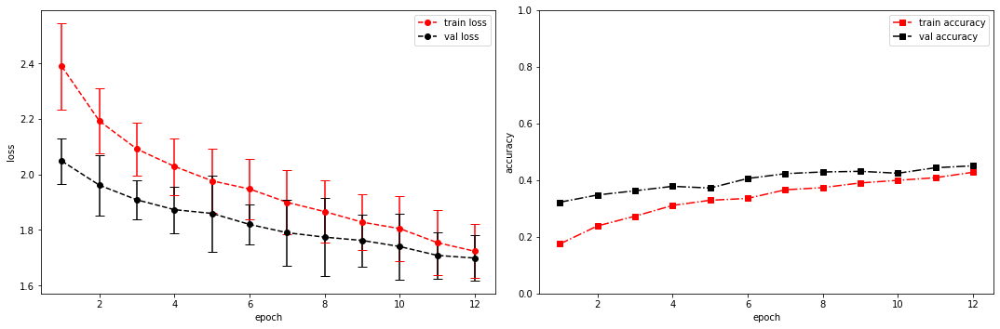

model saved


training epoch:  12
model set to train
Epoch [13/100], step [1/84],  Loss: 1.6810 +/- 0.0000,  accuracy: 0.02734375, time elapsed = 0.2957892417907715s
Epoch [13/100], step [17/84],  Loss: 1.6789 +/- 0.0921,  accuracy: 0.4306640625, time elapsed = 0.8792979717254639s
Epoch [13/100], step [33/84],  Loss: 1.6946 +/- 0.1218,  accuracy: 0.4375, time elapsed = 0.9093668460845947s
Epoch [13/100], step [49/84],  Loss: 1.6808 +/- 0.0824,  accuracy: 0.4462890625, time elapsed = 0.8666841983795166s
Epoch [13/100], step [65/84],  Loss: 1.7249 +/- 0.1089,  accuracy: 0.4306640625, time elapsed = 0.8780913352966309s
Epoch [13/100], step [81/84],  Loss: 1.7228 +/- 0.1167,  accuracy: 0.4287109375, time elapsed = 0.8584070205688477s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.43296662315867984,  precision = 0.43296662315867984 recall = 0.43296662315867984 f1 = 0.43296662315867984 ::: val: acc = 0.43400447427293065,  precision = 0.43400447427293065 recall = 0.43400447427293065 

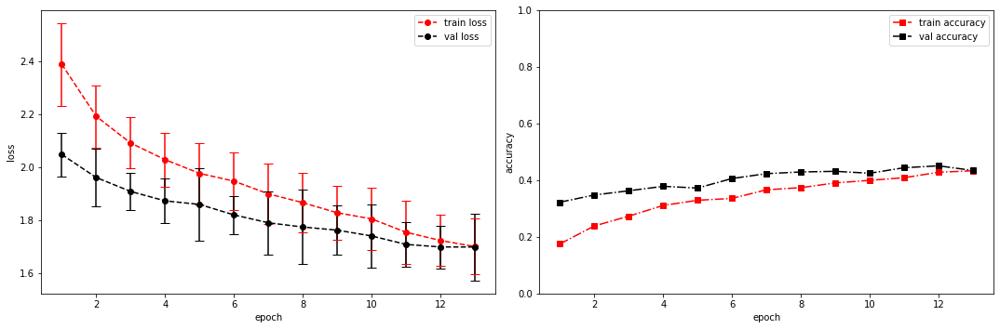

model saved


training epoch:  13
model set to train
Epoch [14/100], step [1/84],  Loss: 1.7061 +/- 0.0000,  accuracy: 0.02734375, time elapsed = 0.31374549865722656s
Epoch [14/100], step [17/84],  Loss: 1.6906 +/- 0.1172,  accuracy: 0.443359375, time elapsed = 0.8832478523254395s
Epoch [14/100], step [33/84],  Loss: 1.7009 +/- 0.1147,  accuracy: 0.4482421875, time elapsed = 0.8631696701049805s
Epoch [14/100], step [49/84],  Loss: 1.6504 +/- 0.1106,  accuracy: 0.458984375, time elapsed = 0.8865954875946045s
Epoch [14/100], step [65/84],  Loss: 1.6250 +/- 0.1154,  accuracy: 0.4599609375, time elapsed = 0.8667311668395996s
Epoch [14/100], step [81/84],  Loss: 1.6914 +/- 0.1064,  accuracy: 0.439453125, time elapsed = 0.8773880004882812s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4480701100130524,  precision = 0.4480701100130524 recall = 0.4480701100130524 f1 = 0.4480701100130524 ::: val: acc = 0.4481730052199851,  precision = 0.4481730052199851 recall = 0.4481730052199851 tim

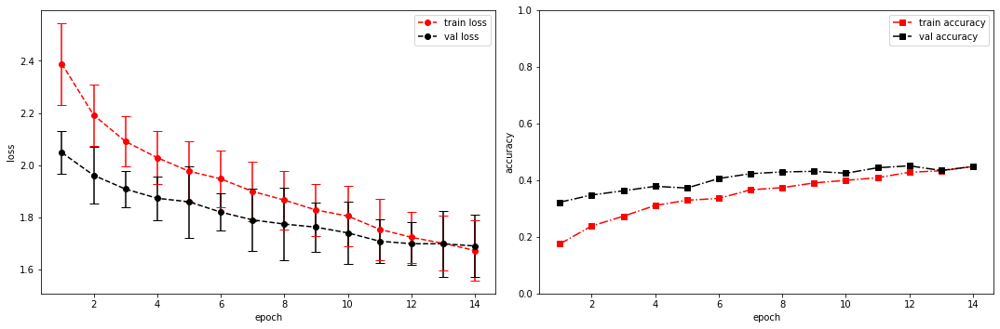

model saved


training epoch:  14
model set to train
Epoch [15/100], step [1/84],  Loss: 1.4787 +/- 0.0000,  accuracy: 0.0322265625, time elapsed = 0.3096334934234619s
Epoch [15/100], step [17/84],  Loss: 1.6350 +/- 0.1040,  accuracy: 0.4697265625, time elapsed = 0.9232254028320312s
Epoch [15/100], step [33/84],  Loss: 1.6379 +/- 0.0937,  accuracy: 0.451171875, time elapsed = 0.8958179950714111s
Epoch [15/100], step [49/84],  Loss: 1.6190 +/- 0.0561,  accuracy: 0.45703125, time elapsed = 0.8895537853240967s
Epoch [15/100], step [65/84],  Loss: 1.6455 +/- 0.1295,  accuracy: 0.4697265625, time elapsed = 0.8772568702697754s
Epoch [15/100], step [81/84],  Loss: 1.6508 +/- 0.1352,  accuracy: 0.4853515625, time elapsed = 0.8766818046569824s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.46578407607682265,  precision = 0.46578407607682265 recall = 0.46578407607682265 f1 = 0.46578407607682265 ::: val: acc = 0.45786726323639076,  precision = 0.45786726323639076 recall = 0.4578672632363

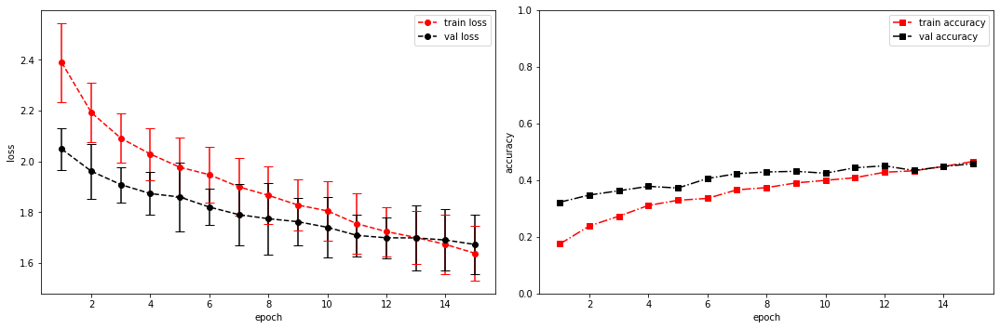

model saved


training epoch:  15
model set to train
Epoch [16/100], step [1/84],  Loss: 1.5883 +/- 0.0000,  accuracy: 0.0322265625, time elapsed = 0.312542200088501s
Epoch [16/100], step [17/84],  Loss: 1.5766 +/- 0.1450,  accuracy: 0.4951171875, time elapsed = 0.8932046890258789s
Epoch [16/100], step [33/84],  Loss: 1.5546 +/- 0.1091,  accuracy: 0.4921875, time elapsed = 0.8974082469940186s
Epoch [16/100], step [49/84],  Loss: 1.6307 +/- 0.1084,  accuracy: 0.4541015625, time elapsed = 0.882195234298706s
Epoch [16/100], step [65/84],  Loss: 1.6029 +/- 0.1512,  accuracy: 0.4931640625, time elapsed = 0.8717184066772461s
Epoch [16/100], step [81/84],  Loss: 1.6681 +/- 0.1119,  accuracy: 0.46875, time elapsed = 0.8958132266998291s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.47958232332649636,  precision = 0.47958232332649636 recall = 0.47958232332649636 f1 = 0.47958232332649636 ::: val: acc = 0.44966442953020136,  precision = 0.44966442953020136 recall = 0.44966442953020136 ti

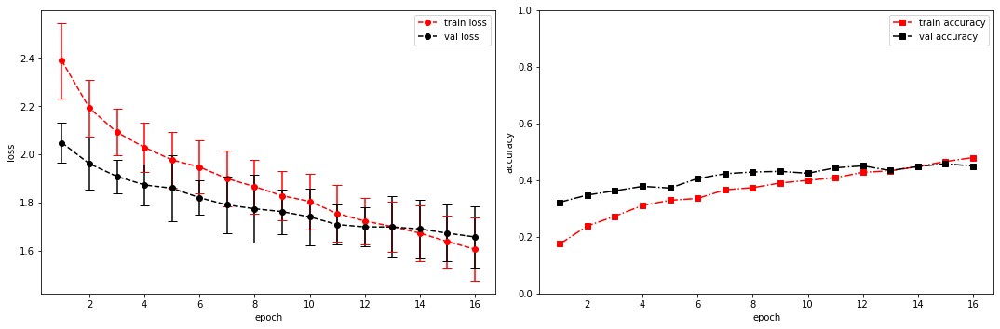

model saved


training epoch:  16
model set to train
Epoch [17/100], step [1/84],  Loss: 1.5039 +/- 0.0000,  accuracy: 0.0341796875, time elapsed = 0.3242976665496826s
Epoch [17/100], step [17/84],  Loss: 1.5562 +/- 0.1291,  accuracy: 0.478515625, time elapsed = 0.8951380252838135s
Epoch [17/100], step [33/84],  Loss: 1.5574 +/- 0.0711,  accuracy: 0.5048828125, time elapsed = 0.8974292278289795s
Epoch [17/100], step [49/84],  Loss: 1.5676 +/- 0.1048,  accuracy: 0.494140625, time elapsed = 0.8913395404815674s
Epoch [17/100], step [65/84],  Loss: 1.5532 +/- 0.0709,  accuracy: 0.4873046875, time elapsed = 0.9020040035247803s
Epoch [17/100], step [81/84],  Loss: 1.6051 +/- 0.1048,  accuracy: 0.46875, time elapsed = 0.9234433174133301s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.48666790975200447,  precision = 0.48666790975200447 recall = 0.48666790975200447 f1 = 0.48666790975200447 ::: val: acc = 0.4601043997017151,  precision = 0.4601043997017151 recall = 0.4601043997017151 ti

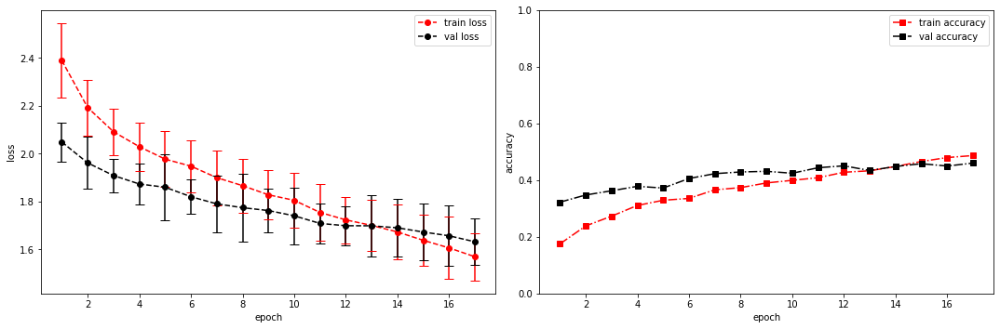

model saved


training epoch:  17
model set to train
Epoch [18/100], step [1/84],  Loss: 1.4505 +/- 0.0000,  accuracy: 0.0341796875, time elapsed = 0.30608367919921875s
Epoch [18/100], step [17/84],  Loss: 1.5594 +/- 0.1006,  accuracy: 0.48828125, time elapsed = 0.89029860496521s
Epoch [18/100], step [33/84],  Loss: 1.5690 +/- 0.1215,  accuracy: 0.4794921875, time elapsed = 0.9019544124603271s
Epoch [18/100], step [49/84],  Loss: 1.5376 +/- 0.0749,  accuracy: 0.517578125, time elapsed = 0.8994491100311279s
Epoch [18/100], step [65/84],  Loss: 1.5089 +/- 0.1038,  accuracy: 0.517578125, time elapsed = 0.8778893947601318s
Epoch [18/100], step [81/84],  Loss: 1.5497 +/- 0.1463,  accuracy: 0.4814453125, time elapsed = 0.875856876373291s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.49766921499160915,  precision = 0.49766921499160915 recall = 0.49766921499160915 f1 = 0.49766921499160915 ::: val: acc = 0.45786726323639076,  precision = 0.45786726323639076 recall = 0.4578672632363907

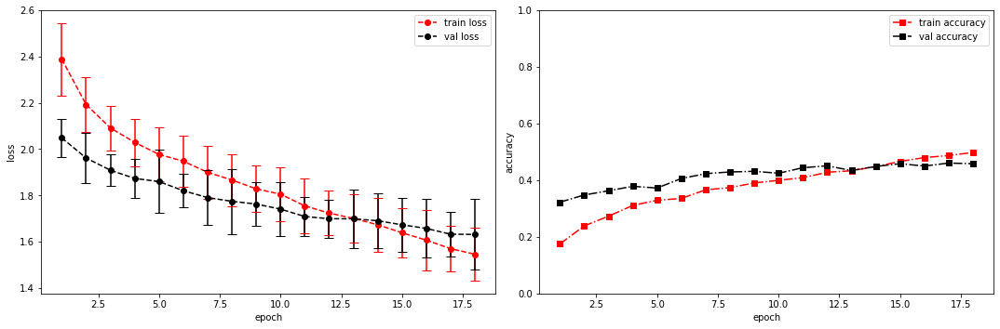

model saved


training epoch:  18
model set to train
Epoch [19/100], step [1/84],  Loss: 1.8160 +/- 0.0000,  accuracy: 0.0263671875, time elapsed = 0.30958056449890137s
Epoch [19/100], step [17/84],  Loss: 1.4962 +/- 0.1016,  accuracy: 0.51171875, time elapsed = 0.9186930656433105s
Epoch [19/100], step [33/84],  Loss: 1.5144 +/- 0.1139,  accuracy: 0.50390625, time elapsed = 0.9014654159545898s
Epoch [19/100], step [49/84],  Loss: 1.4956 +/- 0.1442,  accuracy: 0.51953125, time elapsed = 0.9000320434570312s
Epoch [19/100], step [65/84],  Loss: 1.5079 +/- 0.1196,  accuracy: 0.509765625, time elapsed = 0.8929028511047363s
Epoch [19/100], step [81/84],  Loss: 1.5311 +/- 0.1191,  accuracy: 0.4970703125, time elapsed = 0.8889467716217041s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5077382062278576,  precision = 0.5077382062278576 recall = 0.5077382062278576 f1 = 0.5077382062278576 ::: val: acc = 0.4668158090976883,  precision = 0.4668158090976883 recall = 0.4668158090976883 time 

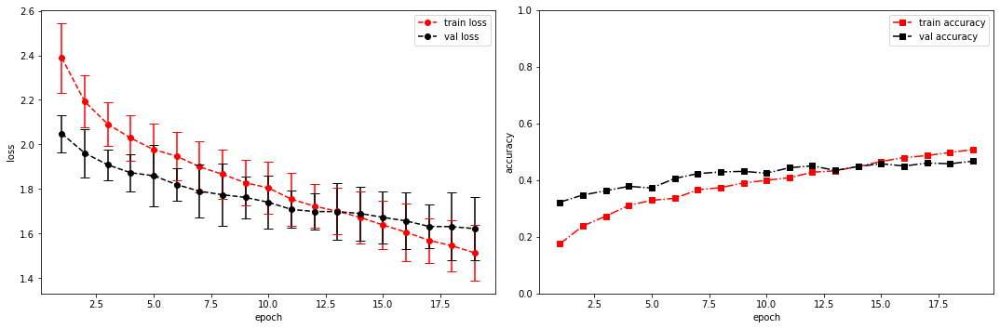

model saved


training epoch:  19
model set to train
Epoch [20/100], step [1/84],  Loss: 1.4144 +/- 0.0000,  accuracy: 0.0380859375, time elapsed = 0.30431056022644043s
Epoch [20/100], step [17/84],  Loss: 1.4572 +/- 0.1143,  accuracy: 0.5234375, time elapsed = 0.9122931957244873s
Epoch [20/100], step [33/84],  Loss: 1.5259 +/- 0.1455,  accuracy: 0.5, time elapsed = 0.8889675140380859s
Epoch [20/100], step [49/84],  Loss: 1.4568 +/- 0.1094,  accuracy: 0.5283203125, time elapsed = 0.8803853988647461s
Epoch [20/100], step [65/84],  Loss: 1.4830 +/- 0.0835,  accuracy: 0.52734375, time elapsed = 0.9075655937194824s
Epoch [20/100], step [81/84],  Loss: 1.5017 +/- 0.1228,  accuracy: 0.5205078125, time elapsed = 0.9098653793334961s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.518553048666791,  precision = 0.518553048666791 recall = 0.518553048666791 f1 = 0.518553048666791 ::: val: acc = 0.4742729306487696,  precision = 0.4742729306487696 recall = 0.4742729306487696 time elapsed = 6

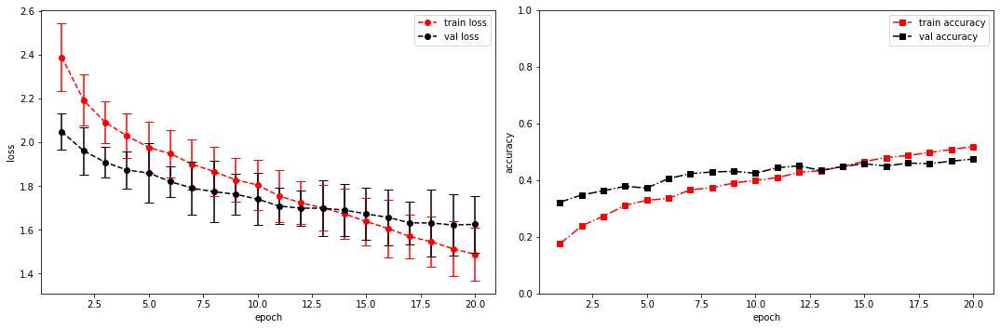

model saved


training epoch:  20
model set to train
Epoch [21/100], step [1/84],  Loss: 1.2512 +/- 0.0000,  accuracy: 0.0341796875, time elapsed = 0.32289624214172363s
Epoch [21/100], step [17/84],  Loss: 1.4503 +/- 0.0898,  accuracy: 0.5185546875, time elapsed = 0.8976151943206787s
Epoch [21/100], step [33/84],  Loss: 1.4796 +/- 0.1357,  accuracy: 0.513671875, time elapsed = 0.9047956466674805s
Epoch [21/100], step [49/84],  Loss: 1.5127 +/- 0.1451,  accuracy: 0.5078125, time elapsed = 0.8800859451293945s
Epoch [21/100], step [65/84],  Loss: 1.4124 +/- 0.1155,  accuracy: 0.544921875, time elapsed = 0.8870139122009277s
Epoch [21/100], step [81/84],  Loss: 1.5178 +/- 0.1568,  accuracy: 0.486328125, time elapsed = 0.8961241245269775s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5144508670520231,  precision = 0.5144508670520231 recall = 0.5144508670520231 f1 = 0.5144508670520231 ::: val: acc = 0.4690529455630127,  precision = 0.4690529455630127 recall = 0.4690529455630127 time

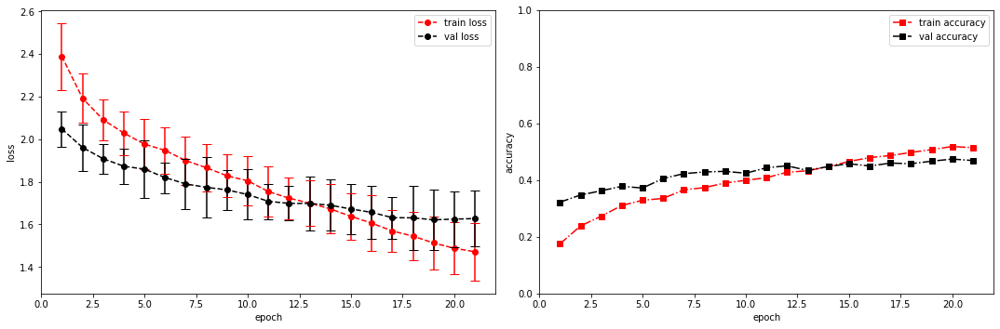

model saved


training epoch:  21
model set to train
Epoch [22/100], step [1/84],  Loss: 1.3109 +/- 0.0000,  accuracy: 0.033203125, time elapsed = 0.3158259391784668s
Epoch [22/100], step [17/84],  Loss: 1.4534 +/- 0.1183,  accuracy: 0.5234375, time elapsed = 0.9139752388000488s
Epoch [22/100], step [33/84],  Loss: 1.3662 +/- 0.0587,  accuracy: 0.5634765625, time elapsed = 0.8821423053741455s
Epoch [22/100], step [49/84],  Loss: 1.4365 +/- 0.0997,  accuracy: 0.529296875, time elapsed = 0.8869266510009766s
Epoch [22/100], step [65/84],  Loss: 1.4306 +/- 0.0942,  accuracy: 0.52734375, time elapsed = 0.9061355590820312s
Epoch [22/100], step [81/84],  Loss: 1.4307 +/- 0.1309,  accuracy: 0.541015625, time elapsed = 0.8942222595214844s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5364534775312325,  precision = 0.5364534775312325 recall = 0.5364534775312325 f1 = 0.5364534775312325 ::: val: acc = 0.4742729306487696,  precision = 0.4742729306487696 recall = 0.4742729306487696 time el

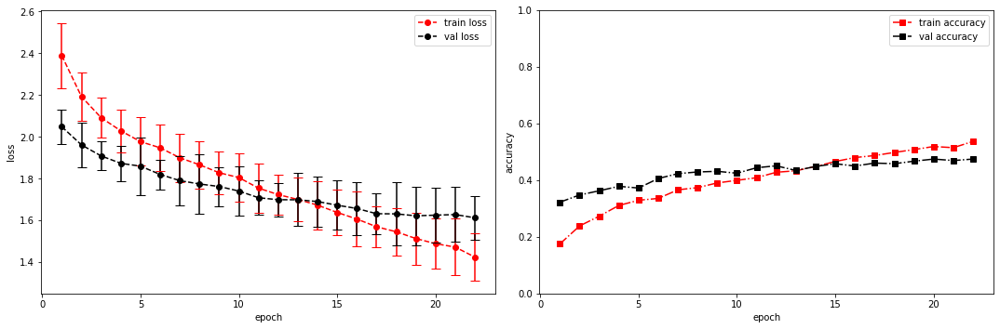

model saved


training epoch:  22
model set to train
Epoch [23/100], step [1/84],  Loss: 1.3185 +/- 0.0000,  accuracy: 0.037109375, time elapsed = 0.30001163482666016s
Epoch [23/100], step [17/84],  Loss: 1.4045 +/- 0.1223,  accuracy: 0.560546875, time elapsed = 0.9034008979797363s
Epoch [23/100], step [33/84],  Loss: 1.3986 +/- 0.0546,  accuracy: 0.5478515625, time elapsed = 0.8994631767272949s
Epoch [23/100], step [49/84],  Loss: 1.3622 +/- 0.1091,  accuracy: 0.572265625, time elapsed = 0.8795139789581299s
Epoch [23/100], step [65/84],  Loss: 1.3911 +/- 0.0966,  accuracy: 0.5439453125, time elapsed = 0.8798480033874512s
Epoch [23/100], step [81/84],  Loss: 1.3908 +/- 0.1191,  accuracy: 0.5517578125, time elapsed = 0.8951103687286377s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5545403691963453,  precision = 0.5545403691963453 recall = 0.5545403691963453 f1 = 0.5545403691963453 ::: val: acc = 0.4608501118568233,  precision = 0.4608501118568233 recall = 0.4608501118568233 t

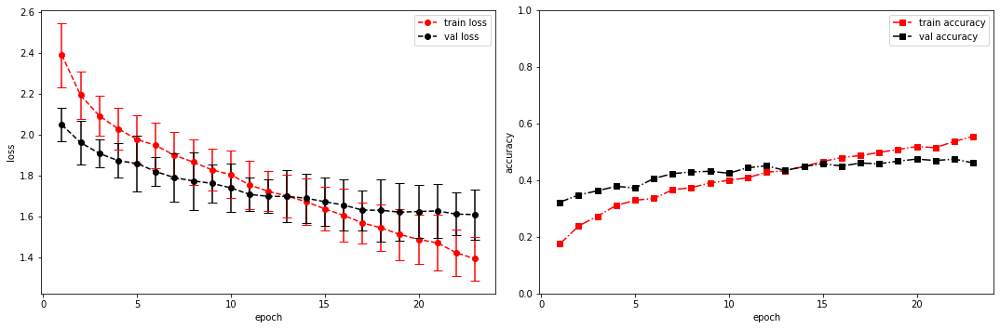

model saved


training epoch:  23
model set to train
Epoch [24/100], step [1/84],  Loss: 1.3208 +/- 0.0000,  accuracy: 0.0341796875, time elapsed = 0.32271337509155273s
Epoch [24/100], step [17/84],  Loss: 1.3430 +/- 0.1197,  accuracy: 0.5693359375, time elapsed = 0.9208152294158936s
Epoch [24/100], step [33/84],  Loss: 1.3720 +/- 0.0945,  accuracy: 0.548828125, time elapsed = 0.9140815734863281s
Epoch [24/100], step [49/84],  Loss: 1.3345 +/- 0.1219,  accuracy: 0.5732421875, time elapsed = 0.8955326080322266s
Epoch [24/100], step [65/84],  Loss: 1.3998 +/- 0.1305,  accuracy: 0.5576171875, time elapsed = 0.8965444564819336s
Epoch [24/100], step [81/84],  Loss: 1.4082 +/- 0.1236,  accuracy: 0.560546875, time elapsed = 0.8836369514465332s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5606936416184971,  precision = 0.5606936416184971 recall = 0.5606936416184971 f1 = 0.5606936416184971 ::: val: acc = 0.4809843400447427,  precision = 0.4809843400447427 recall = 0.4809843400447427 

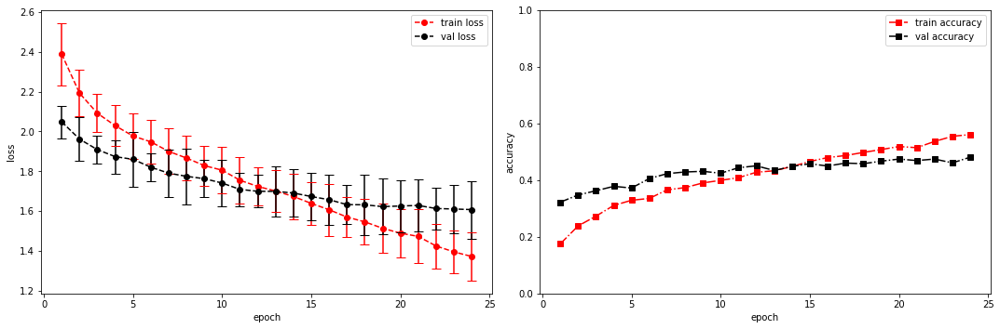

model saved


training epoch:  24
model set to train
Epoch [25/100], step [1/84],  Loss: 1.4305 +/- 0.0000,  accuracy: 0.0380859375, time elapsed = 0.31421852111816406s
Epoch [25/100], step [17/84],  Loss: 1.3425 +/- 0.0817,  accuracy: 0.5703125, time elapsed = 0.9211134910583496s
Epoch [25/100], step [33/84],  Loss: 1.3269 +/- 0.0963,  accuracy: 0.5703125, time elapsed = 0.9167094230651855s
Epoch [25/100], step [49/84],  Loss: 1.3826 +/- 0.1092,  accuracy: 0.552734375, time elapsed = 0.8904514312744141s
Epoch [25/100], step [65/84],  Loss: 1.3470 +/- 0.1331,  accuracy: 0.556640625, time elapsed = 0.8839247226715088s
Epoch [25/100], step [81/84],  Loss: 1.4063 +/- 0.0969,  accuracy: 0.53515625, time elapsed = 0.8871138095855713s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5586425508111131,  precision = 0.5586425508111131 recall = 0.5586425508111131 f1 = 0.5586425508111131 ::: val: acc = 0.4638329604772558,  precision = 0.4638329604772558 recall = 0.4638329604772558 time ela

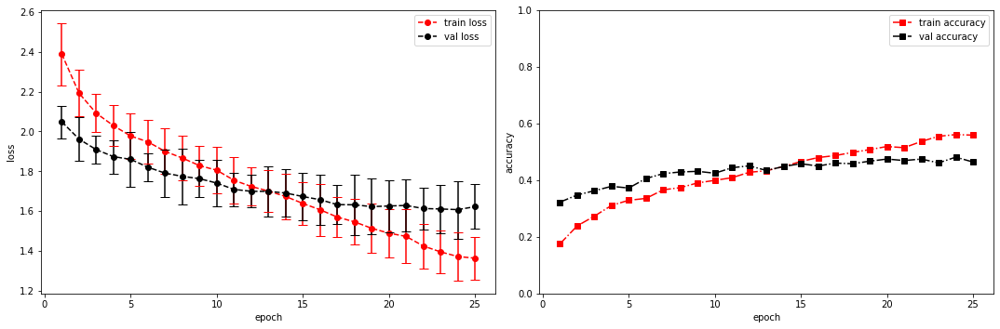

model saved


training epoch:  25
model set to train
Epoch [26/100], step [1/84],  Loss: 1.1129 +/- 0.0000,  accuracy: 0.041015625, time elapsed = 0.3151123523712158s
Epoch [26/100], step [17/84],  Loss: 1.3281 +/- 0.1206,  accuracy: 0.5849609375, time elapsed = 0.9037437438964844s
Epoch [26/100], step [33/84],  Loss: 1.3303 +/- 0.0935,  accuracy: 0.587890625, time elapsed = 0.8962297439575195s
Epoch [26/100], step [49/84],  Loss: 1.3287 +/- 0.0985,  accuracy: 0.576171875, time elapsed = 0.9328718185424805s
Epoch [26/100], step [65/84],  Loss: 1.3857 +/- 0.1139,  accuracy: 0.5419921875, time elapsed = 0.897890567779541s
Epoch [26/100], step [81/84],  Loss: 1.3681 +/- 0.1232,  accuracy: 0.5732421875, time elapsed = 0.8846232891082764s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.573932500466157,  precision = 0.573932500466157 recall = 0.573932500466157 f1 = 0.573932500466157 ::: val: acc = 0.4750186428038777,  precision = 0.4750186428038777 recall = 0.4750186428038777 time el

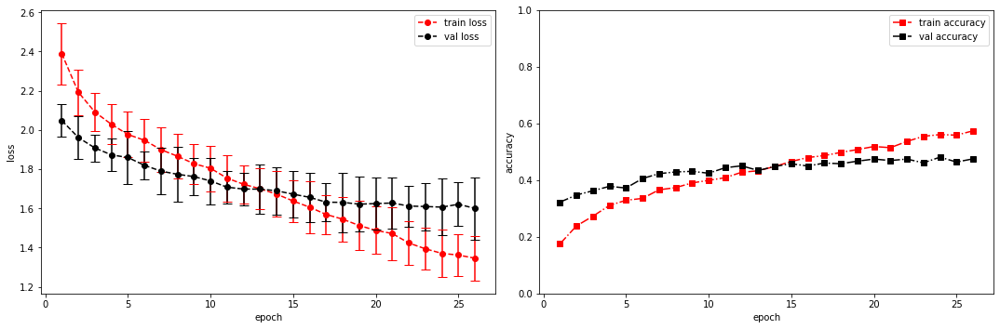

model saved


training epoch:  26
model set to train
Epoch [27/100], step [1/84],  Loss: 1.1430 +/- 0.0000,  accuracy: 0.0419921875, time elapsed = 0.3107883930206299s
Epoch [27/100], step [17/84],  Loss: 1.3264 +/- 0.1130,  accuracy: 0.5615234375, time elapsed = 0.8893029689788818s
Epoch [27/100], step [33/84],  Loss: 1.2819 +/- 0.0943,  accuracy: 0.611328125, time elapsed = 0.9726812839508057s
Epoch [27/100], step [49/84],  Loss: 1.2988 +/- 0.1178,  accuracy: 0.5849609375, time elapsed = 0.9803180694580078s
Epoch [27/100], step [65/84],  Loss: 1.3374 +/- 0.0809,  accuracy: 0.5615234375, time elapsed = 0.9017305374145508s
Epoch [27/100], step [81/84],  Loss: 1.3382 +/- 0.1100,  accuracy: 0.552734375, time elapsed = 0.893592119216919s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5752377400708558,  precision = 0.5752377400708558 recall = 0.5752377400708558 f1 = 0.5752377400708558 ::: val: acc = 0.47054436987322895,  precision = 0.47054436987322895 recall = 0.47054436987322895

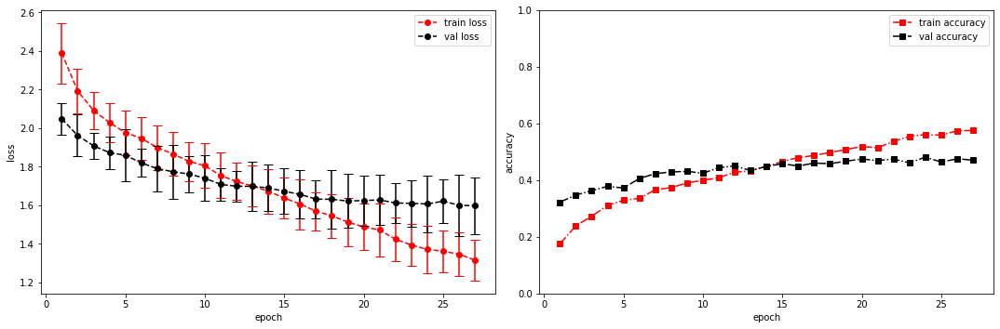

model saved


training epoch:  27
model set to train
Epoch [28/100], step [1/84],  Loss: 1.2917 +/- 0.0000,  accuracy: 0.0400390625, time elapsed = 0.297698974609375s
Epoch [28/100], step [17/84],  Loss: 1.3157 +/- 0.1206,  accuracy: 0.5888671875, time elapsed = 0.9294941425323486s
Epoch [28/100], step [33/84],  Loss: 1.2495 +/- 0.0793,  accuracy: 0.5947265625, time elapsed = 0.8839540481567383s
Epoch [28/100], step [49/84],  Loss: 1.2927 +/- 0.1259,  accuracy: 0.6015625, time elapsed = 0.8858895301818848s
Epoch [28/100], step [65/84],  Loss: 1.2887 +/- 0.1493,  accuracy: 0.5947265625, time elapsed = 0.8811776638031006s
Epoch [28/100], step [81/84],  Loss: 1.2707 +/- 0.1085,  accuracy: 0.5810546875, time elapsed = 0.967740535736084s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5931381689352974,  precision = 0.5931381689352974 recall = 0.5931381689352974 f1 = 0.5931381689352974 ::: val: acc = 0.4720357941834452,  precision = 0.4720357941834452 recall = 0.4720357941834452 time

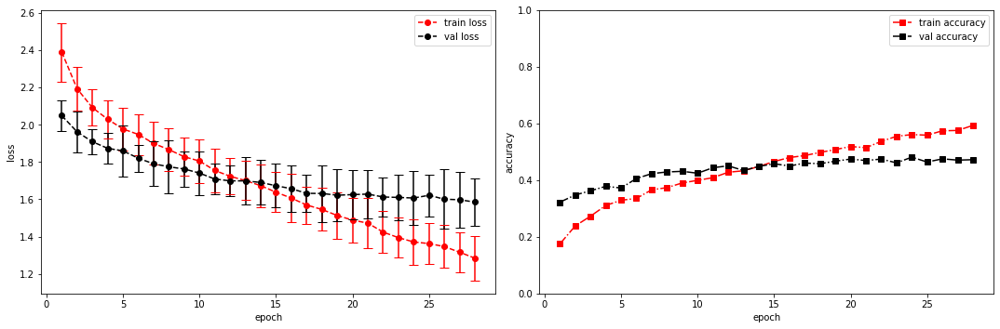

model saved
stopping early
Conv_3_layer
(1, 13, 517)
running model: id = Conv_3_layer, channels = [8, 32, 128]
device:  cuda
dataset metadata:  {'n_fft': 2048, 'hop_length': 256, 'n_mfcc': 13, 'notes': 'optional notes not passed'}
train model: data loaders initialized
sample shape =  (1, 13, 517)
model loaded
Layer (type:depth-idx)                   Output Shape              Param #
├─ConvBlock: 1-1                         [-1, 8, 13, 104]          --
|    └─Sequential: 2-1                   [-1, 8, 13, 104]          --
|    |    └─Conv2d: 3-1                  [-1, 8, 13, 517]          80
|    |    └─ReLU: 3-2                    [-1, 8, 13, 517]          --
|    |    └─MaxPool2d: 3-3               [-1, 8, 13, 104]          --
|    |    └─BatchNorm2d: 3-4             [-1, 8, 13, 104]          16
├─ConvBlock: 1-2                         [-1, 32, 13, 21]          --
|    └─Sequential: 2-2                   [-1, 32, 13, 21]          --
|    |    └─Conv2d: 3-5                  [-1, 32, 13, 

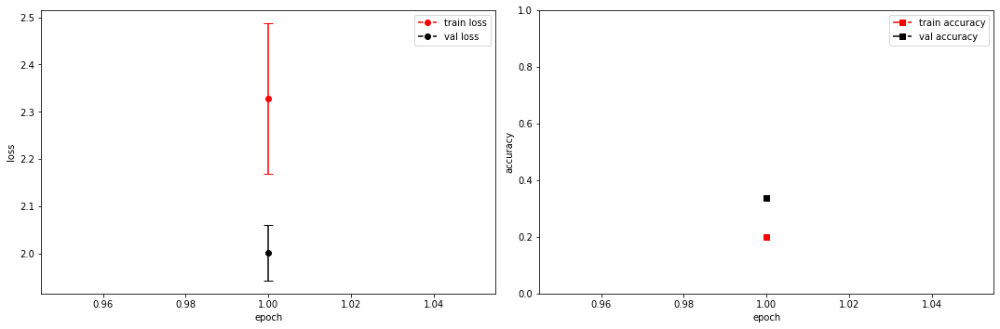

model saved


training epoch:  1
model set to train
Epoch [2/100], step [1/84],  Loss: 2.2244 +/- 0.0000,  accuracy: 0.0166015625, time elapsed = 0.3150460720062256s
Epoch [2/100], step [17/84],  Loss: 2.1838 +/- 0.1014,  accuracy: 0.2568359375, time elapsed = 0.9144351482391357s
Epoch [2/100], step [33/84],  Loss: 2.1539 +/- 0.0973,  accuracy: 0.2568359375, time elapsed = 0.9041783809661865s
Epoch [2/100], step [49/84],  Loss: 2.1293 +/- 0.0580,  accuracy: 0.2587890625, time elapsed = 0.8982770442962646s
Epoch [2/100], step [65/84],  Loss: 2.0931 +/- 0.0979,  accuracy: 0.2666015625, time elapsed = 0.9034924507141113s
Epoch [2/100], step [81/84],  Loss: 2.0804 +/- 0.1017,  accuracy: 0.2939453125, time elapsed = 0.8750433921813965s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.26403132575051275,  precision = 0.26403132575051275 recall = 0.26403132575051275 f1 = 0.26403132575051275 ::: val: acc = 0.38180462341536164,  precision = 0.38180462341536164 recall = 0.38180462341536164

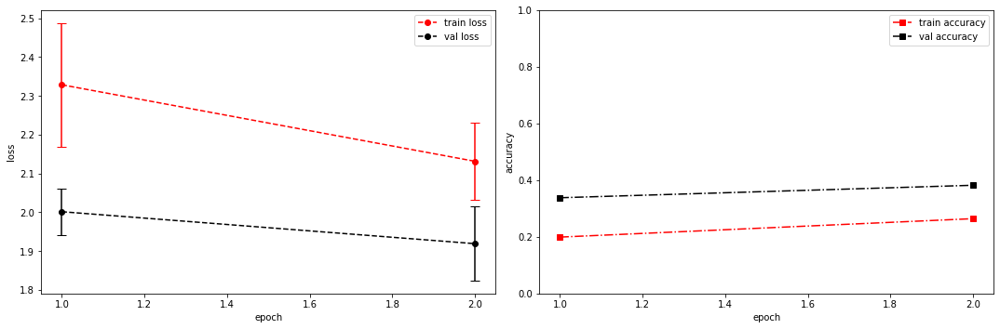

model saved


training epoch:  2
model set to train
Epoch [3/100], step [1/84],  Loss: 1.9991 +/- 0.0000,  accuracy: 0.017578125, time elapsed = 0.31647706031799316s
Epoch [3/100], step [17/84],  Loss: 2.0328 +/- 0.1066,  accuracy: 0.296875, time elapsed = 0.9089040756225586s
Epoch [3/100], step [33/84],  Loss: 2.0269 +/- 0.1274,  accuracy: 0.3271484375, time elapsed = 0.9157266616821289s
Epoch [3/100], step [49/84],  Loss: 2.0115 +/- 0.1058,  accuracy: 0.302734375, time elapsed = 0.9094018936157227s
Epoch [3/100], step [65/84],  Loss: 2.0483 +/- 0.1321,  accuracy: 0.310546875, time elapsed = 0.897911787033081s
Epoch [3/100], step [81/84],  Loss: 1.9845 +/- 0.1507,  accuracy: 0.3271484375, time elapsed = 0.9030880928039551s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3117658027223569,  precision = 0.3117658027223569 recall = 0.3117658027223569 f1 = 0.3117658027223569 ::: val: acc = 0.41387024608501116,  precision = 0.41387024608501116 recall = 0.41387024608501116 time elaps

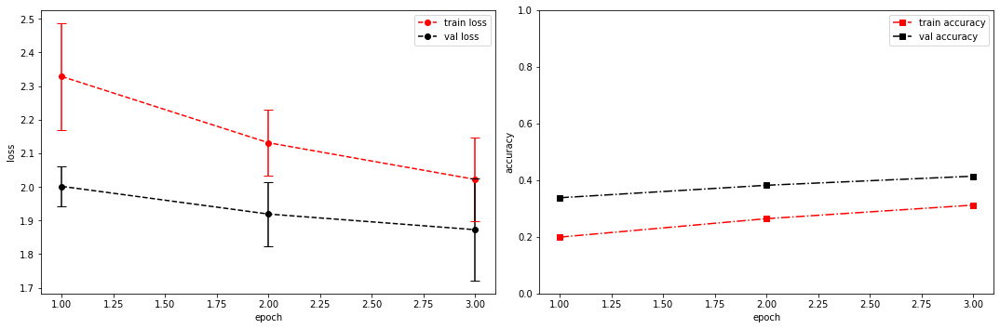

model saved


training epoch:  3
model set to train
Epoch [4/100], step [1/84],  Loss: 1.8781 +/- 0.0000,  accuracy: 0.0234375, time elapsed = 0.3117387294769287s
Epoch [4/100], step [17/84],  Loss: 2.0185 +/- 0.0833,  accuracy: 0.3095703125, time elapsed = 0.8933870792388916s
Epoch [4/100], step [33/84],  Loss: 1.9504 +/- 0.0631,  accuracy: 0.337890625, time elapsed = 0.9454853534698486s
Epoch [4/100], step [49/84],  Loss: 1.9340 +/- 0.0984,  accuracy: 0.341796875, time elapsed = 0.9168071746826172s
Epoch [4/100], step [65/84],  Loss: 1.9121 +/- 0.1210,  accuracy: 0.3515625, time elapsed = 0.9038846492767334s
Epoch [4/100], step [81/84],  Loss: 1.9586 +/- 0.1438,  accuracy: 0.3505859375, time elapsed = 0.896003007888794s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3388029088196905,  precision = 0.3388029088196905 recall = 0.3388029088196905 f1 = 0.3388029088196905 ::: val: acc = 0.4190902311707681,  precision = 0.4190902311707681 recall = 0.4190902311707681 time elapsed = 

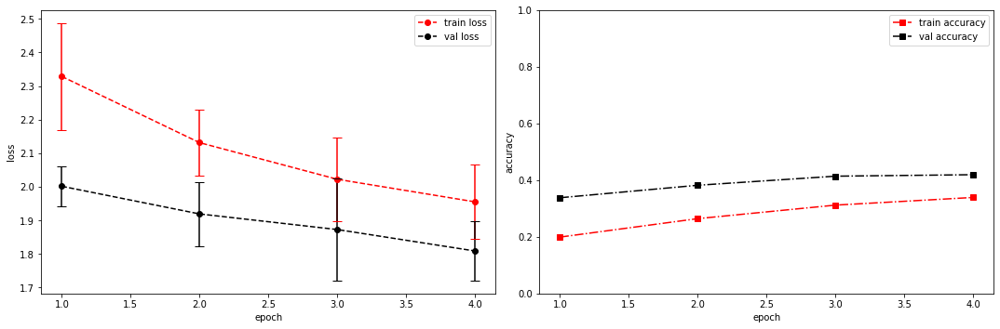

model saved


training epoch:  4
model set to train
Epoch [5/100], step [1/84],  Loss: 1.9289 +/- 0.0000,  accuracy: 0.0224609375, time elapsed = 0.31236767768859863s
Epoch [5/100], step [17/84],  Loss: 1.9161 +/- 0.1361,  accuracy: 0.361328125, time elapsed = 0.8939623832702637s
Epoch [5/100], step [33/84],  Loss: 1.8826 +/- 0.0810,  accuracy: 0.3623046875, time elapsed = 0.9106895923614502s
Epoch [5/100], step [49/84],  Loss: 1.9482 +/- 0.0736,  accuracy: 0.3359375, time elapsed = 0.8945319652557373s
Epoch [5/100], step [65/84],  Loss: 1.9314 +/- 0.1114,  accuracy: 0.35546875, time elapsed = 0.8933513164520264s
Epoch [5/100], step [81/84],  Loss: 1.9053 +/- 0.1062,  accuracy: 0.37109375, time elapsed = 0.9015693664550781s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3563304120827895,  precision = 0.3563304120827895 recall = 0.3563304120827895 f1 = 0.3563304120827895 ::: val: acc = 0.40939597315436244,  precision = 0.40939597315436244 recall = 0.40939597315436244 time elaps

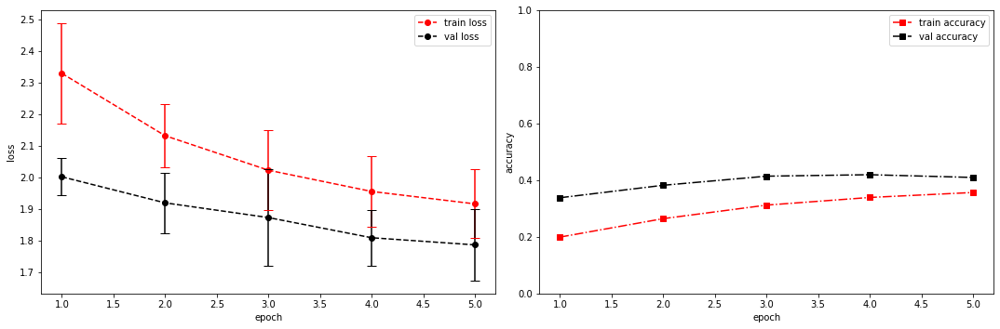

model saved


training epoch:  5
model set to train
Epoch [6/100], step [1/84],  Loss: 1.6534 +/- 0.0000,  accuracy: 0.0263671875, time elapsed = 0.31111979484558105s
Epoch [6/100], step [17/84],  Loss: 1.8676 +/- 0.0928,  accuracy: 0.3740234375, time elapsed = 0.8994569778442383s
Epoch [6/100], step [33/84],  Loss: 1.8913 +/- 0.0819,  accuracy: 0.34765625, time elapsed = 0.9070034027099609s
Epoch [6/100], step [49/84],  Loss: 1.8650 +/- 0.1289,  accuracy: 0.36328125, time elapsed = 0.889284610748291s
Epoch [6/100], step [65/84],  Loss: 1.8317 +/- 0.1558,  accuracy: 0.40234375, time elapsed = 0.898853063583374s
Epoch [6/100], step [81/84],  Loss: 1.8420 +/- 0.1532,  accuracy: 0.3837890625, time elapsed = 0.8914501667022705s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3740443781465598,  precision = 0.3740443781465598 recall = 0.3740443781465598 f1 = 0.37404437814655983 ::: val: acc = 0.42878448918717377,  precision = 0.42878448918717377 recall = 0.42878448918717377 time elap

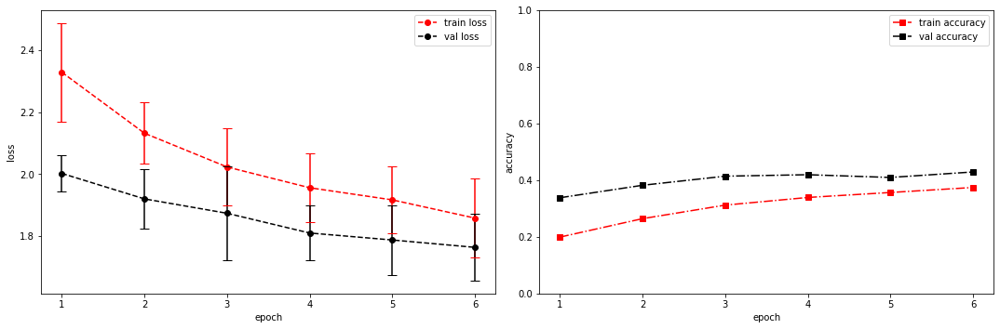

model saved


training epoch:  6
model set to train
Epoch [7/100], step [1/84],  Loss: 1.8092 +/- 0.0000,  accuracy: 0.0244140625, time elapsed = 0.3279764652252197s
Epoch [7/100], step [17/84],  Loss: 1.7979 +/- 0.0989,  accuracy: 0.4130859375, time elapsed = 0.8922529220581055s
Epoch [7/100], step [33/84],  Loss: 1.8610 +/- 0.1145,  accuracy: 0.3740234375, time elapsed = 0.9386940002441406s
Epoch [7/100], step [49/84],  Loss: 1.7888 +/- 0.1224,  accuracy: 0.404296875, time elapsed = 0.913536787033081s
Epoch [7/100], step [65/84],  Loss: 1.8066 +/- 0.1010,  accuracy: 0.3828125, time elapsed = 0.9334607124328613s
Epoch [7/100], step [81/84],  Loss: 1.7705 +/- 0.1509,  accuracy: 0.3837890625, time elapsed = 0.9016902446746826s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.39119895580831626,  precision = 0.39119895580831626 recall = 0.39119895580831626 f1 = 0.39119895580831626 ::: val: acc = 0.4332587621178225,  precision = 0.4332587621178225 recall = 0.4332587621178225 time el

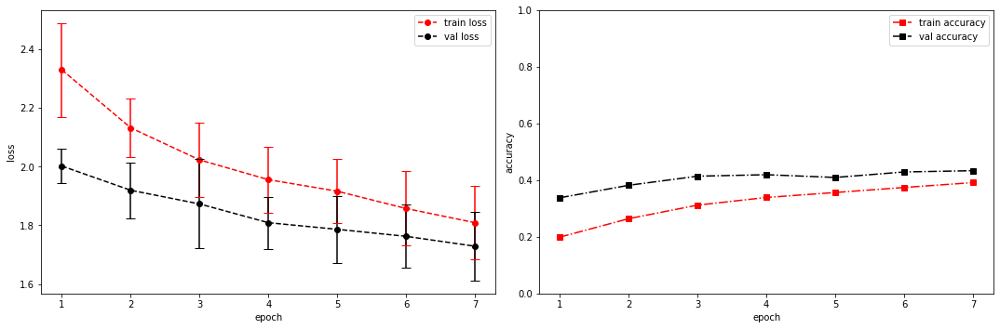

model saved


training epoch:  7
model set to train
Epoch [8/100], step [1/84],  Loss: 1.8359 +/- 0.0000,  accuracy: 0.0234375, time elapsed = 0.30481457710266113s
Epoch [8/100], step [17/84],  Loss: 1.7484 +/- 0.1067,  accuracy: 0.4130859375, time elapsed = 0.9017114639282227s
Epoch [8/100], step [33/84],  Loss: 1.7708 +/- 0.1036,  accuracy: 0.4091796875, time elapsed = 0.8917496204376221s
Epoch [8/100], step [49/84],  Loss: 1.7485 +/- 0.0833,  accuracy: 0.4189453125, time elapsed = 0.8841242790222168s
Epoch [8/100], step [65/84],  Loss: 1.7566 +/- 0.1252,  accuracy: 0.41796875, time elapsed = 0.8883166313171387s
Epoch [8/100], step [81/84],  Loss: 1.7827 +/- 0.1078,  accuracy: 0.4033203125, time elapsed = 0.8944015502929688s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4118963266828268,  precision = 0.4118963266828268 recall = 0.4118963266828268 f1 = 0.4118963266828268 ::: val: acc = 0.44146159582401195,  precision = 0.44146159582401195 recall = 0.44146159582401195 time el

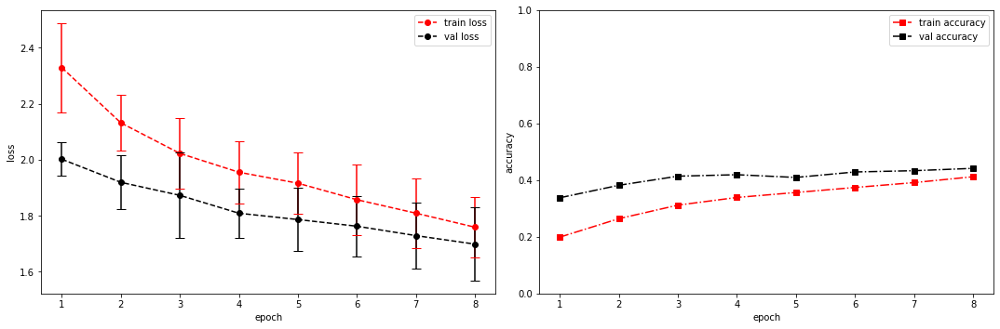

model saved


training epoch:  8
model set to train
Epoch [9/100], step [1/84],  Loss: 1.5507 +/- 0.0000,  accuracy: 0.029296875, time elapsed = 0.3319053649902344s
Epoch [9/100], step [17/84],  Loss: 1.7367 +/- 0.1347,  accuracy: 0.4501953125, time elapsed = 0.8898816108703613s
Epoch [9/100], step [33/84],  Loss: 1.7308 +/- 0.1176,  accuracy: 0.4384765625, time elapsed = 0.8930480480194092s
Epoch [9/100], step [49/84],  Loss: 1.7045 +/- 0.1066,  accuracy: 0.4345703125, time elapsed = 0.8815584182739258s
Epoch [9/100], step [65/84],  Loss: 1.7118 +/- 0.0934,  accuracy: 0.41015625, time elapsed = 0.8849701881408691s
Epoch [9/100], step [81/84],  Loss: 1.7200 +/- 0.0764,  accuracy: 0.408203125, time elapsed = 0.8880536556243896s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.42942382994592576,  precision = 0.42942382994592576 recall = 0.42942382994592576 f1 = 0.4294238299459258 ::: val: acc = 0.4615958240119314,  precision = 0.4615958240119314 recall = 0.4615958240119314 time el

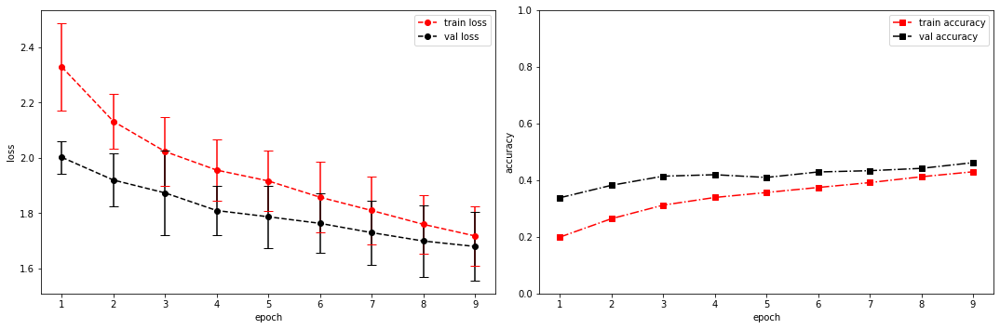

model saved


training epoch:  9
model set to train
Epoch [10/100], step [1/84],  Loss: 1.5868 +/- 0.0000,  accuracy: 0.0283203125, time elapsed = 0.3185915946960449s
Epoch [10/100], step [17/84],  Loss: 1.6638 +/- 0.0897,  accuracy: 0.4423828125, time elapsed = 0.914421558380127s
Epoch [10/100], step [33/84],  Loss: 1.6918 +/- 0.0998,  accuracy: 0.439453125, time elapsed = 0.8923263549804688s
Epoch [10/100], step [49/84],  Loss: 1.7085 +/- 0.1254,  accuracy: 0.435546875, time elapsed = 0.9213182926177979s
Epoch [10/100], step [65/84],  Loss: 1.6406 +/- 0.1077,  accuracy: 0.4638671875, time elapsed = 0.8959577083587646s
Epoch [10/100], step [81/84],  Loss: 1.6619 +/- 0.1153,  accuracy: 0.46484375, time elapsed = 0.9004731178283691s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.44769718441170986,  precision = 0.44769718441170986 recall = 0.44769718441170986 f1 = 0.44769718441170986 ::: val: acc = 0.44668158090976884,  precision = 0.44668158090976884 recall = 0.4466815809097688

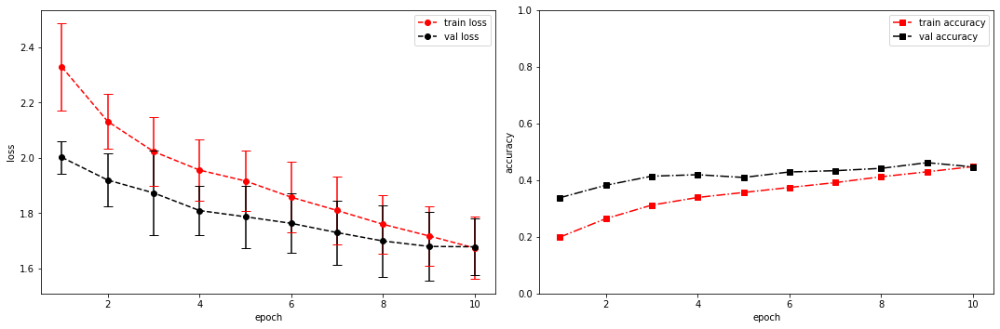

model saved


training epoch:  10
model set to train
Epoch [11/100], step [1/84],  Loss: 1.6831 +/- 0.0000,  accuracy: 0.0302734375, time elapsed = 0.3177173137664795s
Epoch [11/100], step [17/84],  Loss: 1.6145 +/- 0.0879,  accuracy: 0.470703125, time elapsed = 0.8985741138458252s
Epoch [11/100], step [33/84],  Loss: 1.6045 +/- 0.0869,  accuracy: 0.474609375, time elapsed = 0.893585205078125s
Epoch [11/100], step [49/84],  Loss: 1.5659 +/- 0.1334,  accuracy: 0.4873046875, time elapsed = 0.8845279216766357s
Epoch [11/100], step [65/84],  Loss: 1.6200 +/- 0.1130,  accuracy: 0.494140625, time elapsed = 0.8956613540649414s
Epoch [11/100], step [81/84],  Loss: 1.6005 +/- 0.1087,  accuracy: 0.4677734375, time elapsed = 0.9042119979858398s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.47846354652246875,  precision = 0.47846354652246875 recall = 0.47846354652246875 f1 = 0.47846354652246875 ::: val: acc = 0.459358687546607,  precision = 0.459358687546607 recall = 0.459358687546607 ti

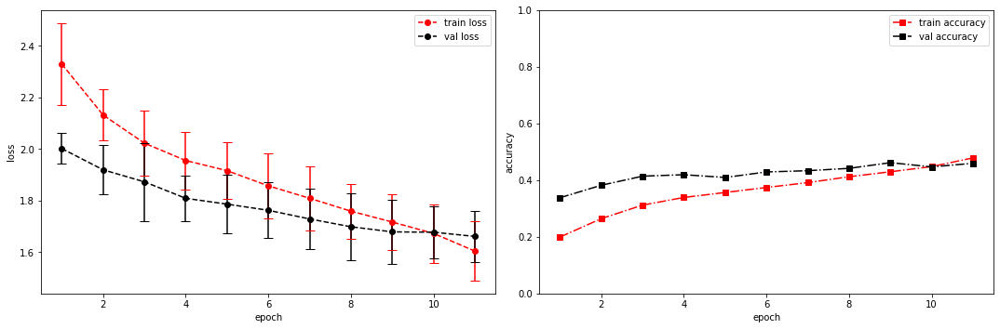

model saved


training epoch:  11
model set to train
Epoch [12/100], step [1/84],  Loss: 1.6240 +/- 0.0000,  accuracy: 0.0263671875, time elapsed = 0.3239932060241699s
Epoch [12/100], step [17/84],  Loss: 1.5315 +/- 0.1205,  accuracy: 0.5029296875, time elapsed = 0.9136490821838379s
Epoch [12/100], step [33/84],  Loss: 1.5350 +/- 0.1218,  accuracy: 0.4951171875, time elapsed = 0.9016175270080566s
Epoch [12/100], step [49/84],  Loss: 1.5823 +/- 0.1216,  accuracy: 0.4677734375, time elapsed = 0.9077374935150146s
Epoch [12/100], step [65/84],  Loss: 1.6051 +/- 0.1220,  accuracy: 0.47265625, time elapsed = 0.898493766784668s
Epoch [12/100], step [81/84],  Loss: 1.5648 +/- 0.1238,  accuracy: 0.48828125, time elapsed = 0.9000542163848877s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.48256572813723664,  precision = 0.48256572813723664 recall = 0.48256572813723664 f1 = 0.48256572813723664 ::: val: acc = 0.45786726323639076,  precision = 0.45786726323639076 recall = 0.457867263236390

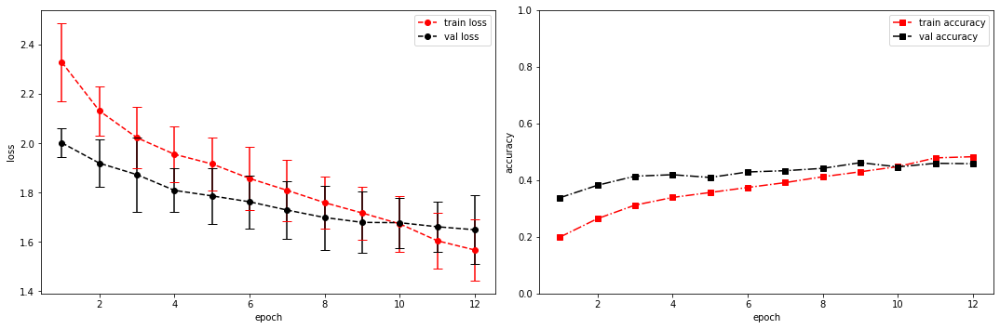

model saved


training epoch:  12
model set to train
Epoch [13/100], step [1/84],  Loss: 1.4882 +/- 0.0000,  accuracy: 0.02734375, time elapsed = 0.3302791118621826s
Epoch [13/100], step [17/84],  Loss: 1.5358 +/- 0.1090,  accuracy: 0.4990234375, time elapsed = 0.9186878204345703s
Epoch [13/100], step [33/84],  Loss: 1.5318 +/- 0.1155,  accuracy: 0.4931640625, time elapsed = 0.9186177253723145s
Epoch [13/100], step [49/84],  Loss: 1.5366 +/- 0.0895,  accuracy: 0.494140625, time elapsed = 0.9469499588012695s
Epoch [13/100], step [65/84],  Loss: 1.4776 +/- 0.0729,  accuracy: 0.515625, time elapsed = 0.8951010704040527s
Epoch [13/100], step [81/84],  Loss: 1.4757 +/- 0.1302,  accuracy: 0.5185546875, time elapsed = 0.9038834571838379s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5027037106097334,  precision = 0.5027037106097334 recall = 0.5027037106097334 f1 = 0.5027037106097334 ::: val: acc = 0.46308724832214765,  precision = 0.46308724832214765 recall = 0.46308724832214765 tim

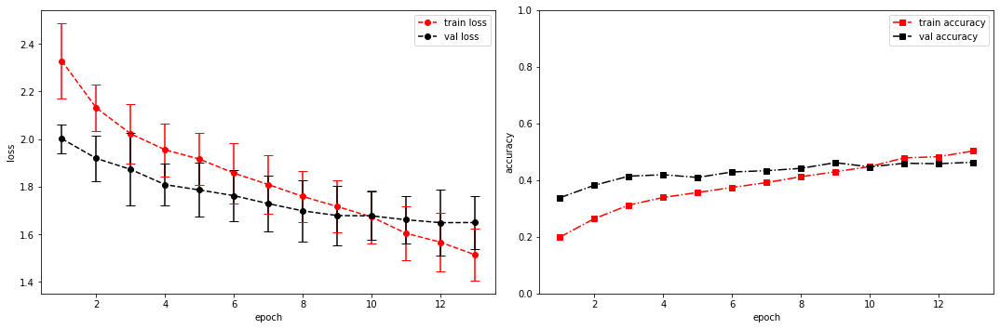

model saved


training epoch:  13
model set to train
Epoch [14/100], step [1/84],  Loss: 1.5129 +/- 0.0000,  accuracy: 0.0302734375, time elapsed = 0.3048372268676758s
Epoch [14/100], step [17/84],  Loss: 1.4690 +/- 0.0861,  accuracy: 0.5322265625, time elapsed = 0.9032261371612549s
Epoch [14/100], step [33/84],  Loss: 1.4239 +/- 0.0933,  accuracy: 0.548828125, time elapsed = 0.9104311466217041s
Epoch [14/100], step [49/84],  Loss: 1.5161 +/- 0.1169,  accuracy: 0.52734375, time elapsed = 0.8969583511352539s
Epoch [14/100], step [65/84],  Loss: 1.4389 +/- 0.0918,  accuracy: 0.54296875, time elapsed = 0.8916158676147461s
Epoch [14/100], step [81/84],  Loss: 1.4637 +/- 0.0740,  accuracy: 0.53515625, time elapsed = 0.8836326599121094s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.536826403132575,  precision = 0.536826403132575 recall = 0.536826403132575 f1 = 0.536826403132575 ::: val: acc = 0.4750186428038777,  precision = 0.4750186428038777 recall = 0.4750186428038777 time elaps

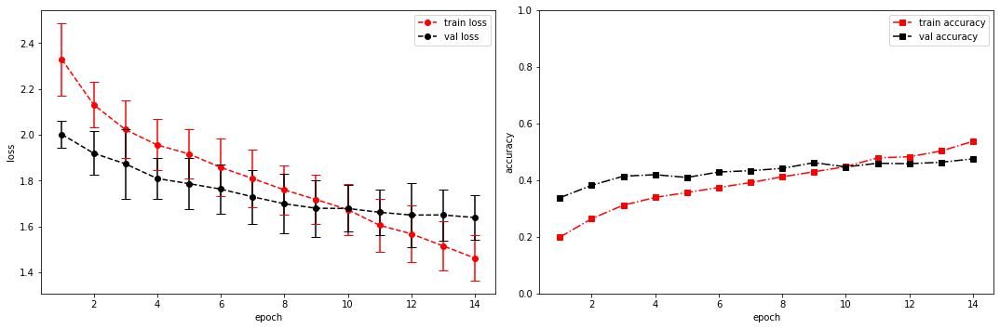

model saved


training epoch:  14
model set to train
Epoch [15/100], step [1/84],  Loss: 1.4693 +/- 0.0000,  accuracy: 0.03515625, time elapsed = 0.3125605583190918s
Epoch [15/100], step [17/84],  Loss: 1.3867 +/- 0.1087,  accuracy: 0.54296875, time elapsed = 0.8916225433349609s
Epoch [15/100], step [33/84],  Loss: 1.4157 +/- 0.1287,  accuracy: 0.541015625, time elapsed = 0.8965723514556885s
Epoch [15/100], step [49/84],  Loss: 1.4012 +/- 0.0991,  accuracy: 0.552734375, time elapsed = 0.8944709300994873s
Epoch [15/100], step [65/84],  Loss: 1.3573 +/- 0.0691,  accuracy: 0.57421875, time elapsed = 0.8870794773101807s
Epoch [15/100], step [81/84],  Loss: 1.4936 +/- 0.1628,  accuracy: 0.5166015625, time elapsed = 0.8747844696044922s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5446578407607682,  precision = 0.5446578407607682 recall = 0.5446578407607682 f1 = 0.5446578407607682 ::: val: acc = 0.4511558538404176,  precision = 0.4511558538404176 recall = 0.4511558538404176 time el

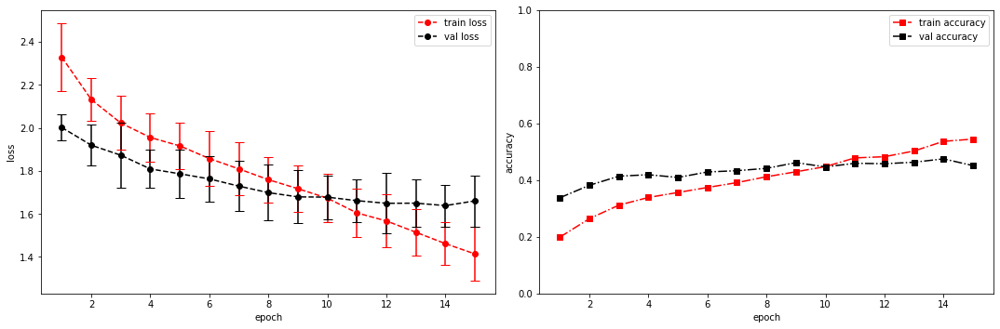

model saved


training epoch:  15
model set to train
Epoch [16/100], step [1/84],  Loss: 1.2789 +/- 0.0000,  accuracy: 0.03515625, time elapsed = 0.3480687141418457s
Epoch [16/100], step [17/84],  Loss: 1.3431 +/- 0.0879,  accuracy: 0.5732421875, time elapsed = 0.903181791305542s
Epoch [16/100], step [33/84],  Loss: 1.3984 +/- 0.1111,  accuracy: 0.552734375, time elapsed = 0.9192893505096436s
Epoch [16/100], step [49/84],  Loss: 1.3752 +/- 0.1228,  accuracy: 0.548828125, time elapsed = 0.8977084159851074s
Epoch [16/100], step [65/84],  Loss: 1.3584 +/- 0.0980,  accuracy: 0.578125, time elapsed = 0.880469799041748s
Epoch [16/100], step [81/84],  Loss: 1.3556 +/- 0.0956,  accuracy: 0.5703125, time elapsed = 0.8907046318054199s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5649822860339362,  precision = 0.5649822860339362 recall = 0.5649822860339362 f1 = 0.5649822860339362 ::: val: acc = 0.47054436987322895,  precision = 0.47054436987322895 recall = 0.47054436987322895 time elap

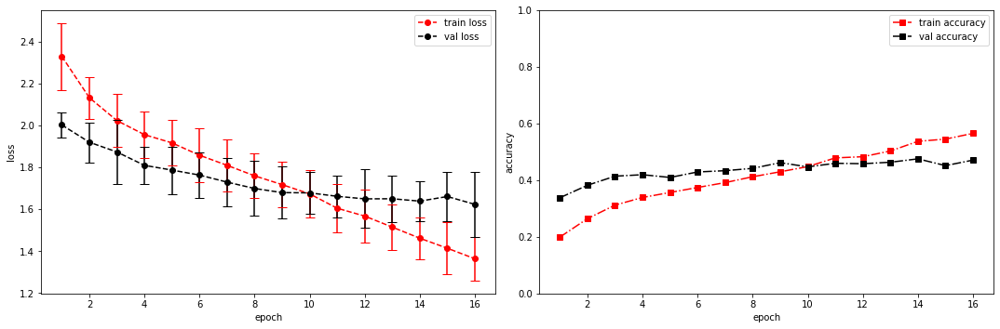

model saved


training epoch:  16
model set to train
Epoch [17/100], step [1/84],  Loss: 1.1152 +/- 0.0000,  accuracy: 0.0419921875, time elapsed = 0.32080912590026855s
Epoch [17/100], step [17/84],  Loss: 1.3082 +/- 0.0807,  accuracy: 0.583984375, time elapsed = 0.9264578819274902s
Epoch [17/100], step [33/84],  Loss: 1.3166 +/- 0.0946,  accuracy: 0.587890625, time elapsed = 0.9038887023925781s
Epoch [17/100], step [49/84],  Loss: 1.2720 +/- 0.0945,  accuracy: 0.6103515625, time elapsed = 0.8937771320343018s
Epoch [17/100], step [65/84],  Loss: 1.3403 +/- 0.1048,  accuracy: 0.5849609375, time elapsed = 0.9407093524932861s
Epoch [17/100], step [81/84],  Loss: 1.3204 +/- 0.0758,  accuracy: 0.591796875, time elapsed = 0.9055578708648682s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5910870781279135,  precision = 0.5910870781279135 recall = 0.5910870781279135 f1 = 0.5910870781279135 ::: val: acc = 0.47874720357941836,  precision = 0.47874720357941836 recall = 0.4787472035794183

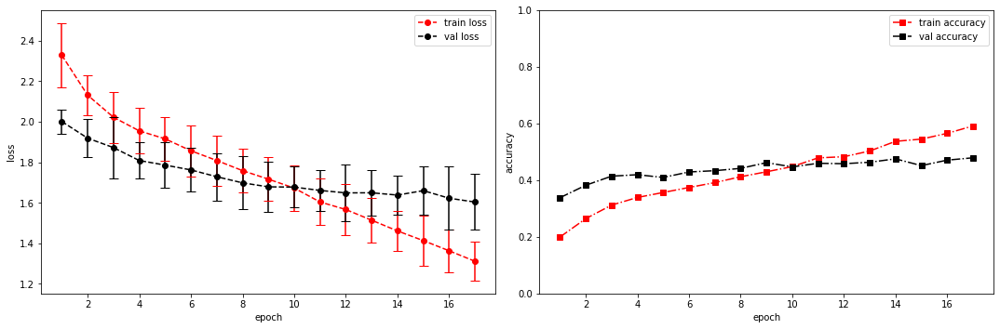

model saved
stopping early
Conv_3_layer
(1, 13, 517)
running model: id = Conv_3_layer, channels = [8, 8, 128]
device:  cuda
dataset metadata:  {'n_fft': 2048, 'hop_length': 256, 'n_mfcc': 13, 'notes': 'optional notes not passed'}
train model: data loaders initialized
sample shape =  (1, 13, 517)
model loaded
Layer (type:depth-idx)                   Output Shape              Param #
├─ConvBlock: 1-1                         [-1, 8, 13, 104]          --
|    └─Sequential: 2-1                   [-1, 8, 13, 104]          --
|    |    └─Conv2d: 3-1                  [-1, 8, 13, 517]          80
|    |    └─ReLU: 3-2                    [-1, 8, 13, 517]          --
|    |    └─MaxPool2d: 3-3               [-1, 8, 13, 104]          --
|    |    └─BatchNorm2d: 3-4             [-1, 8, 13, 104]          16
├─ConvBlock: 1-2                         [-1, 8, 13, 21]           --
|    └─Sequential: 2-2                   [-1, 8, 13, 21]           --
|    |    └─Conv2d: 3-5                  [-1, 8, 13, 10

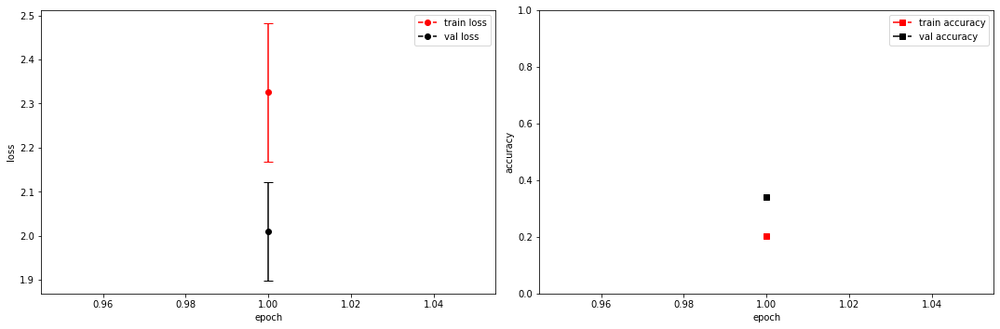

model saved


training epoch:  1
model set to train
Epoch [2/100], step [1/84],  Loss: 2.2617 +/- 0.0000,  accuracy: 0.015625, time elapsed = 0.32720255851745605s
Epoch [2/100], step [17/84],  Loss: 2.1464 +/- 0.0986,  accuracy: 0.2880859375, time elapsed = 0.886993408203125s
Epoch [2/100], step [33/84],  Loss: 2.1543 +/- 0.1087,  accuracy: 0.26953125, time elapsed = 0.895535945892334s
Epoch [2/100], step [49/84],  Loss: 2.1275 +/- 0.1426,  accuracy: 0.2998046875, time elapsed = 0.9185600280761719s
Epoch [2/100], step [65/84],  Loss: 2.1137 +/- 0.1062,  accuracy: 0.28515625, time elapsed = 0.8736655712127686s
Epoch [2/100], step [81/84],  Loss: 2.0482 +/- 0.0675,  accuracy: 0.3095703125, time elapsed = 0.8969850540161133s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.29013611784449,  precision = 0.29013611784449 recall = 0.29013611784449 f1 = 0.29013611784449 ::: val: acc = 0.3534675615212528,  precision = 0.3534675615212528 recall = 0.3534675615212528 time elapsed = 6.376108

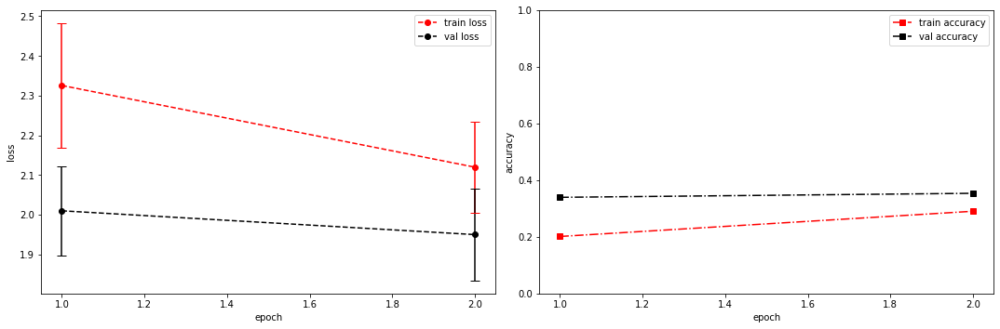

model saved


training epoch:  2
model set to train
Epoch [3/100], step [1/84],  Loss: 2.3236 +/- 0.0000,  accuracy: 0.01171875, time elapsed = 0.32344961166381836s
Epoch [3/100], step [17/84],  Loss: 2.0460 +/- 0.1068,  accuracy: 0.3076171875, time elapsed = 0.8911280632019043s
Epoch [3/100], step [33/84],  Loss: 2.0295 +/- 0.1185,  accuracy: 0.3134765625, time elapsed = 0.894568920135498s
Epoch [3/100], step [49/84],  Loss: 1.9878 +/- 0.1161,  accuracy: 0.3525390625, time elapsed = 0.8911168575286865s
Epoch [3/100], step [65/84],  Loss: 2.0176 +/- 0.1353,  accuracy: 0.31640625, time elapsed = 0.8939363956451416s
Epoch [3/100], step [81/84],  Loss: 2.0050 +/- 0.1031,  accuracy: 0.3271484375, time elapsed = 0.8804819583892822s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.32183479395860526,  precision = 0.32183479395860526 recall = 0.32183479395860526 f1 = 0.32183479395860526 ::: val: acc = 0.3855331841909023,  precision = 0.3855331841909023 recall = 0.3855331841909023 time e

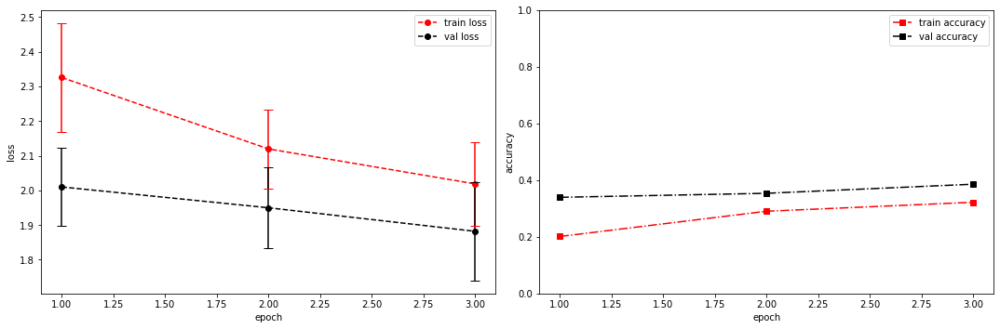

model saved


training epoch:  3
model set to train
Epoch [4/100], step [1/84],  Loss: 2.0345 +/- 0.0000,  accuracy: 0.0185546875, time elapsed = 0.3262450695037842s
Epoch [4/100], step [17/84],  Loss: 1.9838 +/- 0.0953,  accuracy: 0.3330078125, time elapsed = 0.9080147743225098s
Epoch [4/100], step [33/84],  Loss: 1.9714 +/- 0.1254,  accuracy: 0.3115234375, time elapsed = 0.9046051502227783s
Epoch [4/100], step [49/84],  Loss: 1.9587 +/- 0.1282,  accuracy: 0.3544921875, time elapsed = 0.9094302654266357s
Epoch [4/100], step [65/84],  Loss: 1.9861 +/- 0.1028,  accuracy: 0.3115234375, time elapsed = 0.8979573249816895s
Epoch [4/100], step [81/84],  Loss: 1.9051 +/- 0.1034,  accuracy: 0.3505859375, time elapsed = 0.9161295890808105s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.33339548760022375,  precision = 0.33339548760022375 recall = 0.33339548760022375 f1 = 0.33339548760022375 ::: val: acc = 0.3959731543624161,  precision = 0.3959731543624161 recall = 0.3959731543624161 ti

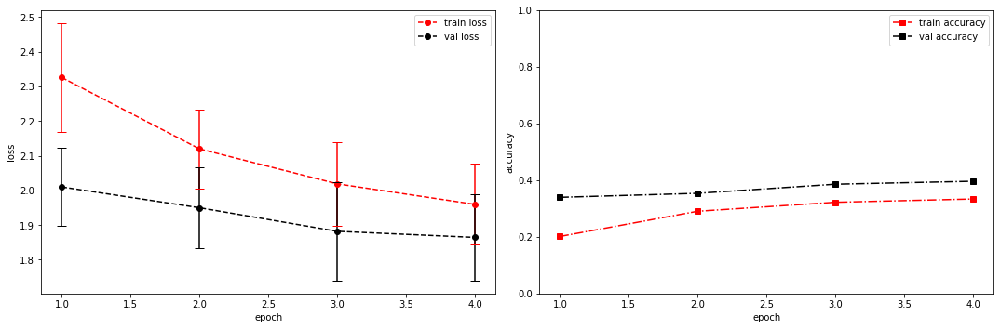

model saved


training epoch:  4
model set to train
Epoch [5/100], step [1/84],  Loss: 1.9537 +/- 0.0000,  accuracy: 0.0185546875, time elapsed = 0.31968069076538086s
Epoch [5/100], step [17/84],  Loss: 1.8695 +/- 0.1093,  accuracy: 0.3671875, time elapsed = 0.9163069725036621s
Epoch [5/100], step [33/84],  Loss: 1.8528 +/- 0.1319,  accuracy: 0.373046875, time elapsed = 0.886833667755127s
Epoch [5/100], step [49/84],  Loss: 1.9147 +/- 0.0743,  accuracy: 0.3564453125, time elapsed = 0.9017870426177979s
Epoch [5/100], step [65/84],  Loss: 1.9028 +/- 0.0932,  accuracy: 0.3623046875, time elapsed = 0.8857829570770264s
Epoch [5/100], step [81/84],  Loss: 1.8579 +/- 0.0736,  accuracy: 0.373046875, time elapsed = 0.885012149810791s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.36434831251165395,  precision = 0.36434831251165395 recall = 0.36434831251165395 f1 = 0.364348312511654 ::: val: acc = 0.41014168530947054,  precision = 0.41014168530947054 recall = 0.41014168530947054 time el

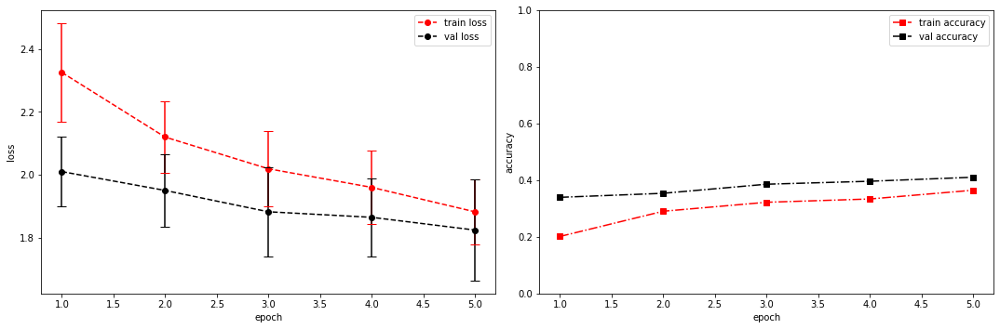

model saved


training epoch:  5
model set to train
Epoch [6/100], step [1/84],  Loss: 1.6979 +/- 0.0000,  accuracy: 0.02734375, time elapsed = 0.3283858299255371s
Epoch [6/100], step [17/84],  Loss: 1.8559 +/- 0.1042,  accuracy: 0.3837890625, time elapsed = 0.9139368534088135s
Epoch [6/100], step [33/84],  Loss: 1.8238 +/- 0.1147,  accuracy: 0.3876953125, time elapsed = 0.9042127132415771s
Epoch [6/100], step [49/84],  Loss: 1.8536 +/- 0.1027,  accuracy: 0.3857421875, time elapsed = 0.890169620513916s
Epoch [6/100], step [65/84],  Loss: 1.7976 +/- 0.0928,  accuracy: 0.400390625, time elapsed = 0.8842077255249023s
Epoch [6/100], step [81/84],  Loss: 1.8470 +/- 0.1088,  accuracy: 0.388671875, time elapsed = 0.8931512832641602s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3876561625955622,  precision = 0.3876561625955622 recall = 0.3876561625955622 f1 = 0.3876561625955622 ::: val: acc = 0.4272930648769575,  precision = 0.4272930648769575 recall = 0.4272930648769575 time elapse

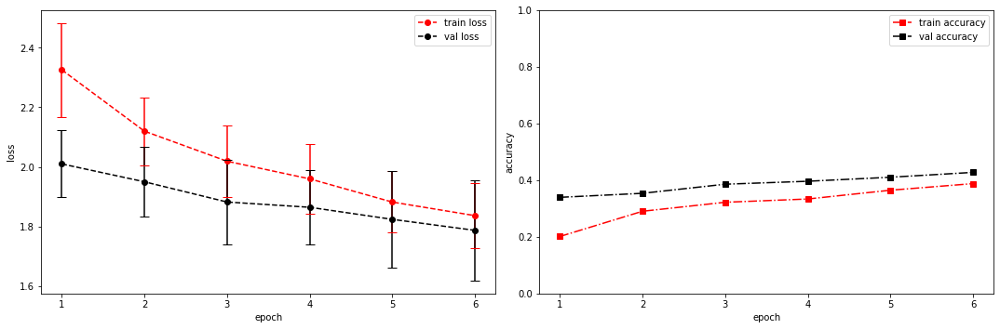

model saved


training epoch:  6
model set to train
Epoch [7/100], step [1/84],  Loss: 1.8112 +/- 0.0000,  accuracy: 0.0263671875, time elapsed = 0.3442375659942627s
Epoch [7/100], step [17/84],  Loss: 1.7866 +/- 0.1086,  accuracy: 0.392578125, time elapsed = 0.8970026969909668s
Epoch [7/100], step [33/84],  Loss: 1.8635 +/- 0.0823,  accuracy: 0.3662109375, time elapsed = 0.8755788803100586s
Epoch [7/100], step [49/84],  Loss: 1.8051 +/- 0.0780,  accuracy: 0.4091796875, time elapsed = 0.8921754360198975s
Epoch [7/100], step [65/84],  Loss: 1.7335 +/- 0.0860,  accuracy: 0.4208984375, time elapsed = 0.8876285552978516s
Epoch [7/100], step [81/84],  Loss: 1.7951 +/- 0.1254,  accuracy: 0.412109375, time elapsed = 0.8897695541381836s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.40108148424389334,  precision = 0.40108148424389334 recall = 0.40108148424389334 f1 = 0.4010814842438934 ::: val: acc = 0.42654735272184935,  precision = 0.42654735272184935 recall = 0.42654735272184935 ti

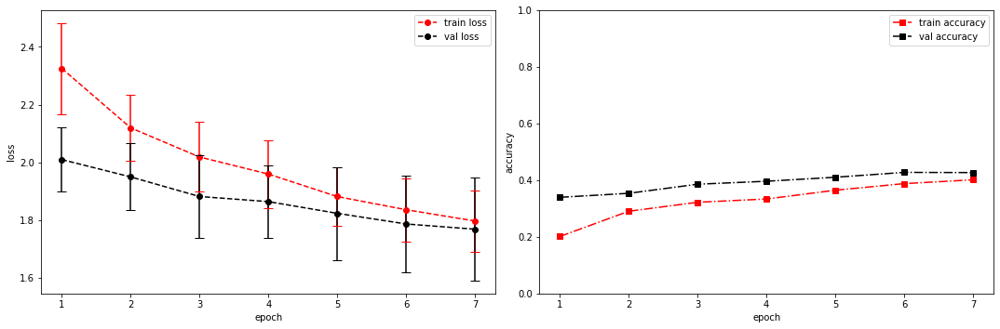

model saved


training epoch:  7
model set to train
Epoch [8/100], step [1/84],  Loss: 1.6041 +/- 0.0000,  accuracy: 0.03125, time elapsed = 0.32997798919677734s
Epoch [8/100], step [17/84],  Loss: 1.7719 +/- 0.1150,  accuracy: 0.400390625, time elapsed = 0.8951640129089355s
Epoch [8/100], step [33/84],  Loss: 1.7599 +/- 0.1081,  accuracy: 0.4150390625, time elapsed = 0.924384593963623s
Epoch [8/100], step [49/84],  Loss: 1.7252 +/- 0.1034,  accuracy: 0.4375, time elapsed = 0.8778436183929443s
Epoch [8/100], step [65/84],  Loss: 1.7361 +/- 0.0986,  accuracy: 0.44140625, time elapsed = 0.8802428245544434s
Epoch [8/100], step [81/84],  Loss: 1.7456 +/- 0.0727,  accuracy: 0.4326171875, time elapsed = 1.0084803104400635s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4262539623345143,  precision = 0.4262539623345143 recall = 0.4262539623345143 f1 = 0.4262539623345143 ::: val: acc = 0.4369873228933632,  precision = 0.4369873228933632 recall = 0.4369873228933632 time elapsed = 6.502

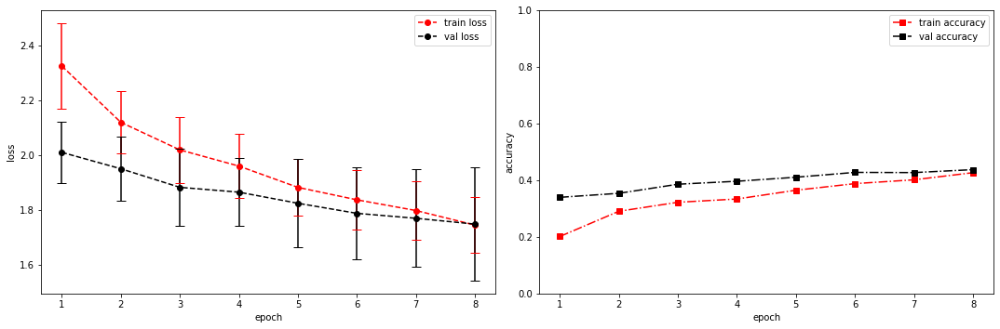

model saved


training epoch:  8
model set to train
Epoch [9/100], step [1/84],  Loss: 1.6336 +/- 0.0000,  accuracy: 0.0283203125, time elapsed = 0.3263237476348877s
Epoch [9/100], step [17/84],  Loss: 1.7072 +/- 0.0803,  accuracy: 0.4248046875, time elapsed = 0.889629602432251s
Epoch [9/100], step [33/84],  Loss: 1.6203 +/- 0.0984,  accuracy: 0.462890625, time elapsed = 0.9020187854766846s
Epoch [9/100], step [49/84],  Loss: 1.7358 +/- 0.0797,  accuracy: 0.423828125, time elapsed = 0.9071822166442871s
Epoch [9/100], step [65/84],  Loss: 1.7195 +/- 0.0952,  accuracy: 0.443359375, time elapsed = 0.8941256999969482s
Epoch [9/100], step [81/84],  Loss: 1.7184 +/- 0.1591,  accuracy: 0.41796875, time elapsed = 0.8886265754699707s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.43408539996270745,  precision = 0.43408539996270745 recall = 0.43408539996270745 f1 = 0.43408539996270745 ::: val: acc = 0.4407158836689038,  precision = 0.4407158836689038 recall = 0.4407158836689038 time ela

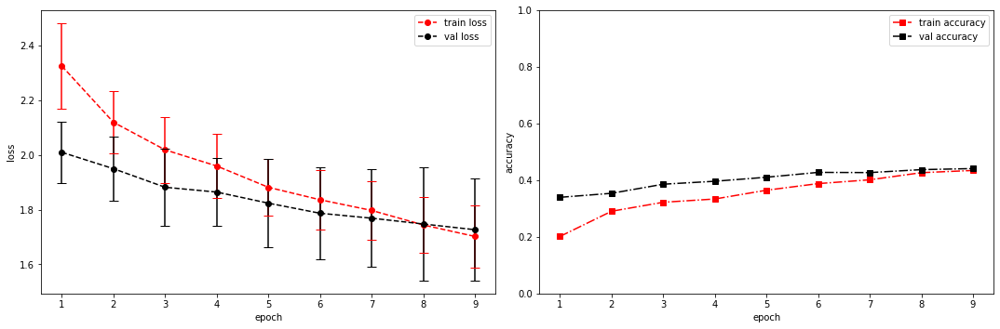

model saved


training epoch:  9
model set to train
Epoch [10/100], step [1/84],  Loss: 1.6145 +/- 0.0000,  accuracy: 0.03125, time elapsed = 0.30859994888305664s
Epoch [10/100], step [17/84],  Loss: 1.6707 +/- 0.1061,  accuracy: 0.4462890625, time elapsed = 0.8883225917816162s
Epoch [10/100], step [33/84],  Loss: 1.6360 +/- 0.0792,  accuracy: 0.466796875, time elapsed = 0.9344537258148193s
Epoch [10/100], step [49/84],  Loss: 1.6534 +/- 0.1424,  accuracy: 0.4501953125, time elapsed = 0.8970801830291748s
Epoch [10/100], step [65/84],  Loss: 1.6372 +/- 0.1231,  accuracy: 0.46875, time elapsed = 0.9064671993255615s
Epoch [10/100], step [81/84],  Loss: 1.7030 +/- 0.1250,  accuracy: 0.4228515625, time elapsed = 0.8865315914154053s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4508670520231214,  precision = 0.4508670520231214 recall = 0.4508670520231214 f1 = 0.4508670520231214 ::: val: acc = 0.4563758389261745,  precision = 0.4563758389261745 recall = 0.4563758389261745 time elaps

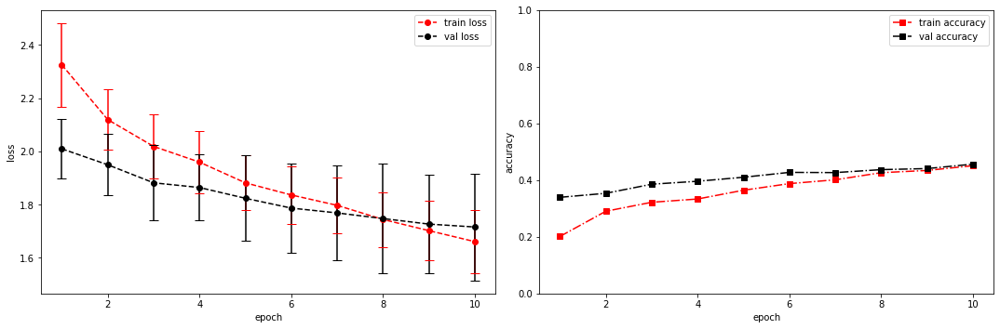

model saved


training epoch:  10
model set to train
Epoch [11/100], step [1/84],  Loss: 1.5166 +/- 0.0000,  accuracy: 0.03125, time elapsed = 0.3202536106109619s
Epoch [11/100], step [17/84],  Loss: 1.5812 +/- 0.1088,  accuracy: 0.4775390625, time elapsed = 0.9012174606323242s
Epoch [11/100], step [33/84],  Loss: 1.6302 +/- 0.0975,  accuracy: 0.4580078125, time elapsed = 0.9127297401428223s
Epoch [11/100], step [49/84],  Loss: 1.6340 +/- 0.1209,  accuracy: 0.455078125, time elapsed = 0.8885424137115479s
Epoch [11/100], step [65/84],  Loss: 1.6316 +/- 0.0974,  accuracy: 0.4658203125, time elapsed = 0.9285502433776855s
Epoch [11/100], step [81/84],  Loss: 1.6375 +/- 0.0958,  accuracy: 0.4599609375, time elapsed = 0.9012539386749268s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4616818944620548,  precision = 0.4616818944620548 recall = 0.4616818944620548 f1 = 0.4616818944620548 ::: val: acc = 0.4489187173750932,  precision = 0.4489187173750932 recall = 0.4489187173750932 time 

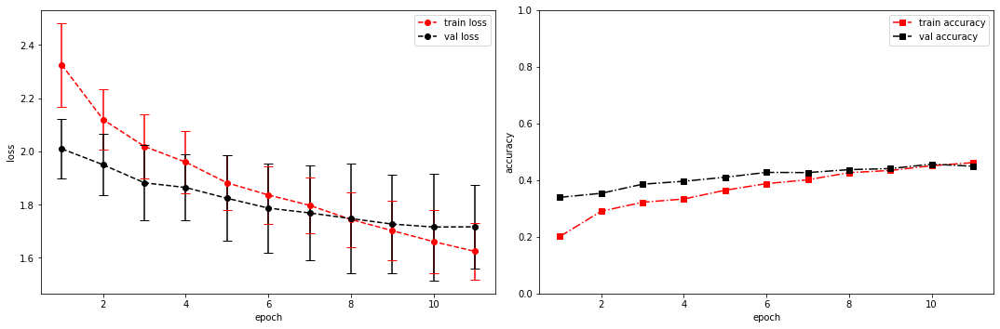

model saved


training epoch:  11
model set to train
Epoch [12/100], step [1/84],  Loss: 1.5875 +/- 0.0000,  accuracy: 0.0322265625, time elapsed = 0.31619882583618164s
Epoch [12/100], step [17/84],  Loss: 1.5869 +/- 0.1181,  accuracy: 0.4970703125, time elapsed = 0.933046817779541s
Epoch [12/100], step [33/84],  Loss: 1.5380 +/- 0.1154,  accuracy: 0.5107421875, time elapsed = 0.9185409545898438s
Epoch [12/100], step [49/84],  Loss: 1.6030 +/- 0.1187,  accuracy: 0.46875, time elapsed = 0.8978161811828613s
Epoch [12/100], step [65/84],  Loss: 1.6422 +/- 0.0781,  accuracy: 0.46875, time elapsed = 0.8918442726135254s
Epoch [12/100], step [81/84],  Loss: 1.5723 +/- 0.1232,  accuracy: 0.4873046875, time elapsed = 0.897348165512085s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4872272981540183,  precision = 0.4872272981540183 recall = 0.4872272981540183 f1 = 0.4872272981540183 ::: val: acc = 0.45563012677106635,  precision = 0.45563012677106635 recall = 0.45563012677106635 time el

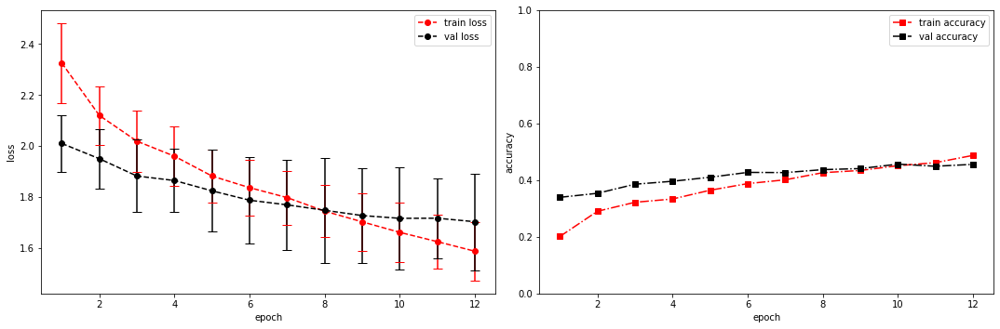

model saved


training epoch:  12
model set to train
Epoch [13/100], step [1/84],  Loss: 1.4206 +/- 0.0000,  accuracy: 0.0341796875, time elapsed = 0.32096028327941895s
Epoch [13/100], step [17/84],  Loss: 1.5573 +/- 0.1368,  accuracy: 0.4765625, time elapsed = 0.9239101409912109s
Epoch [13/100], step [33/84],  Loss: 1.5002 +/- 0.0899,  accuracy: 0.5263671875, time elapsed = 0.9161198139190674s
Epoch [13/100], step [49/84],  Loss: 1.5447 +/- 0.1541,  accuracy: 0.501953125, time elapsed = 0.924004316329956s
Epoch [13/100], step [65/84],  Loss: 1.4987 +/- 0.1322,  accuracy: 0.53515625, time elapsed = 0.9128589630126953s
Epoch [13/100], step [81/84],  Loss: 1.5569 +/- 0.1158,  accuracy: 0.4912109375, time elapsed = 0.9047205448150635s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5055006526198024,  precision = 0.5055006526198024 recall = 0.5055006526198024 f1 = 0.5055006526198024 ::: val: acc = 0.4354958985831469,  precision = 0.4354958985831469 recall = 0.4354958985831469 time 

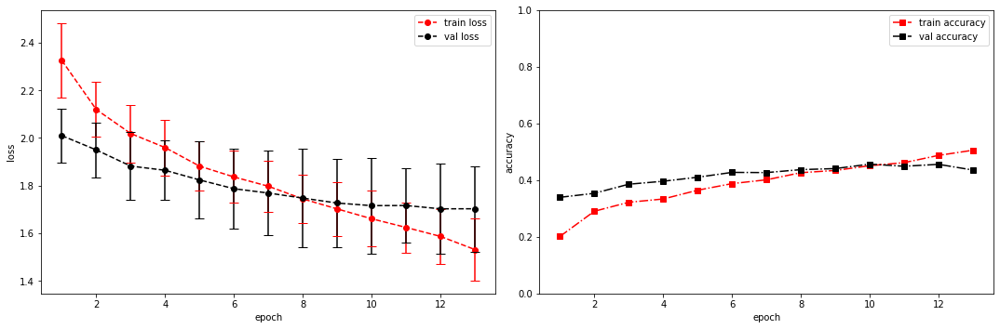

model saved


training epoch:  13
model set to train
Epoch [14/100], step [1/84],  Loss: 1.3706 +/- 0.0000,  accuracy: 0.03125, time elapsed = 0.3202335834503174s
Epoch [14/100], step [17/84],  Loss: 1.4523 +/- 0.0630,  accuracy: 0.5361328125, time elapsed = 0.9034771919250488s
Epoch [14/100], step [33/84],  Loss: 1.5314 +/- 0.1474,  accuracy: 0.5029296875, time elapsed = 0.9074604511260986s
Epoch [14/100], step [49/84],  Loss: 1.4937 +/- 0.1016,  accuracy: 0.505859375, time elapsed = 0.892219066619873s
Epoch [14/100], step [65/84],  Loss: 1.5064 +/- 0.1166,  accuracy: 0.498046875, time elapsed = 0.9025962352752686s
Epoch [14/100], step [81/84],  Loss: 1.4666 +/- 0.1187,  accuracy: 0.5341796875, time elapsed = 0.8850183486938477s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5142644042513519,  precision = 0.5142644042513519 recall = 0.5142644042513519 f1 = 0.5142644042513519 ::: val: acc = 0.46607009694258017,  precision = 0.46607009694258017 recall = 0.46607009694258017 time

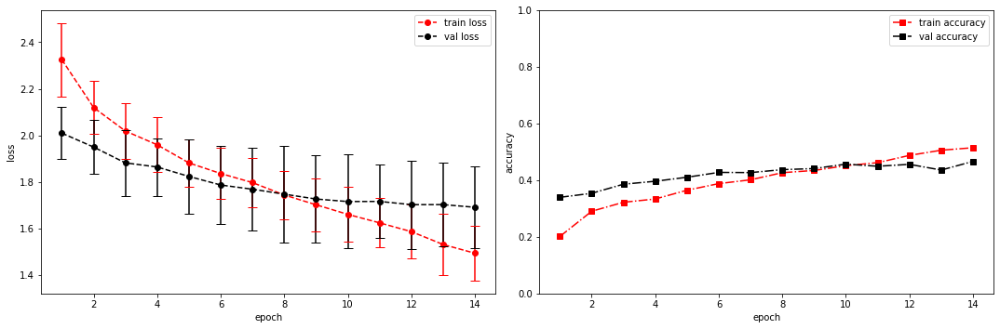

model saved


training epoch:  14
model set to train
Epoch [15/100], step [1/84],  Loss: 1.3966 +/- 0.0000,  accuracy: 0.033203125, time elapsed = 0.338054895401001s
Epoch [15/100], step [17/84],  Loss: 1.4517 +/- 0.1400,  accuracy: 0.5341796875, time elapsed = 0.9032158851623535s
Epoch [15/100], step [33/84],  Loss: 1.4477 +/- 0.1562,  accuracy: 0.53515625, time elapsed = 0.9018080234527588s
Epoch [15/100], step [49/84],  Loss: 1.4608 +/- 0.1435,  accuracy: 0.5380859375, time elapsed = 0.8943016529083252s
Epoch [15/100], step [65/84],  Loss: 1.4627 +/- 0.1092,  accuracy: 0.5185546875, time elapsed = 0.9069089889526367s
Epoch [15/100], step [81/84],  Loss: 1.4519 +/- 0.0847,  accuracy: 0.5234375, time elapsed = 0.9009547233581543s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5301137423084095,  precision = 0.5301137423084095 recall = 0.5301137423084095 f1 = 0.5301137423084095 ::: val: acc = 0.4668158090976883,  precision = 0.4668158090976883 recall = 0.4668158090976883 time e

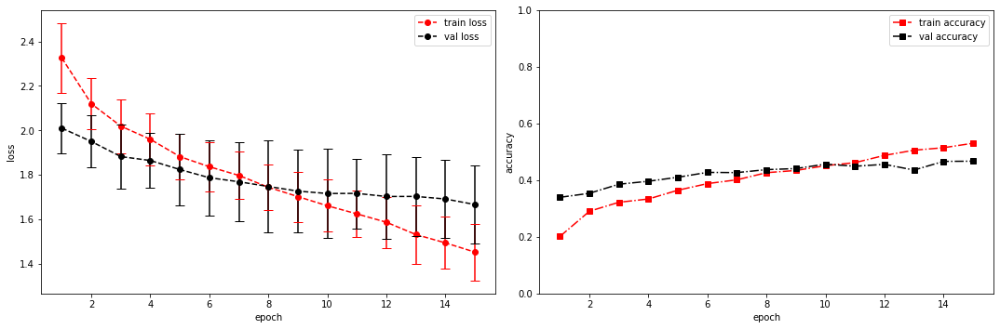

model saved


training epoch:  15
model set to train
Epoch [16/100], step [1/84],  Loss: 1.2645 +/- 0.0000,  accuracy: 0.0390625, time elapsed = 0.3321835994720459s
Epoch [16/100], step [17/84],  Loss: 1.3958 +/- 0.1150,  accuracy: 0.564453125, time elapsed = 0.9064576625823975s
Epoch [16/100], step [33/84],  Loss: 1.3974 +/- 0.1239,  accuracy: 0.5673828125, time elapsed = 0.8925614356994629s
Epoch [16/100], step [49/84],  Loss: 1.4144 +/- 0.1214,  accuracy: 0.5517578125, time elapsed = 0.9185013771057129s
Epoch [16/100], step [65/84],  Loss: 1.4499 +/- 0.1330,  accuracy: 0.51953125, time elapsed = 0.9082646369934082s
Epoch [16/100], step [81/84],  Loss: 1.4549 +/- 0.0756,  accuracy: 0.5341796875, time elapsed = 0.9074304103851318s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5457766175647958,  precision = 0.5457766175647958 recall = 0.5457766175647958 f1 = 0.5457766175647958 ::: val: acc = 0.46830723340790453,  precision = 0.46830723340790453 recall = 0.46830723340790453 ti

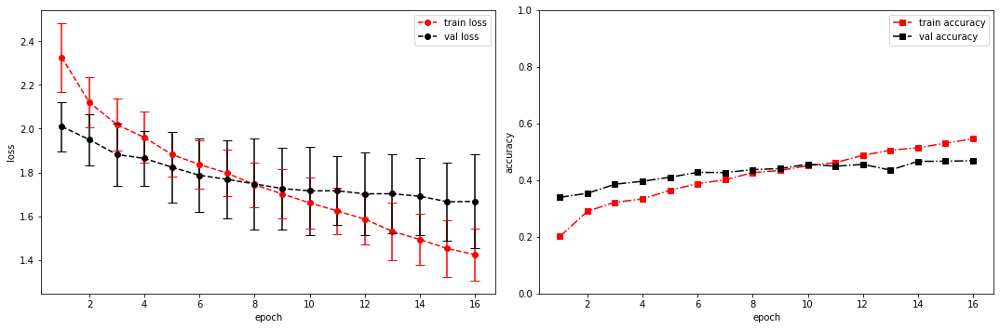

model saved


training epoch:  16
model set to train
Epoch [17/100], step [1/84],  Loss: 1.3555 +/- 0.0000,  accuracy: 0.0361328125, time elapsed = 0.31800031661987305s
Epoch [17/100], step [17/84],  Loss: 1.3736 +/- 0.1017,  accuracy: 0.54296875, time elapsed = 0.9016733169555664s
Epoch [17/100], step [33/84],  Loss: 1.3764 +/- 0.1376,  accuracy: 0.55859375, time elapsed = 0.9386944770812988s
Epoch [17/100], step [49/84],  Loss: 1.3707 +/- 0.1062,  accuracy: 0.560546875, time elapsed = 0.9022955894470215s
Epoch [17/100], step [65/84],  Loss: 1.4378 +/- 0.1431,  accuracy: 0.5244140625, time elapsed = 0.8934128284454346s
Epoch [17/100], step [81/84],  Loss: 1.3669 +/- 0.1616,  accuracy: 0.5615234375, time elapsed = 0.8986451625823975s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5515569643856051,  precision = 0.5515569643856051 recall = 0.5515569643856051 f1 = 0.5515569643856051 ::: val: acc = 0.46308724832214765,  precision = 0.46308724832214765 recall = 0.46308724832214765 

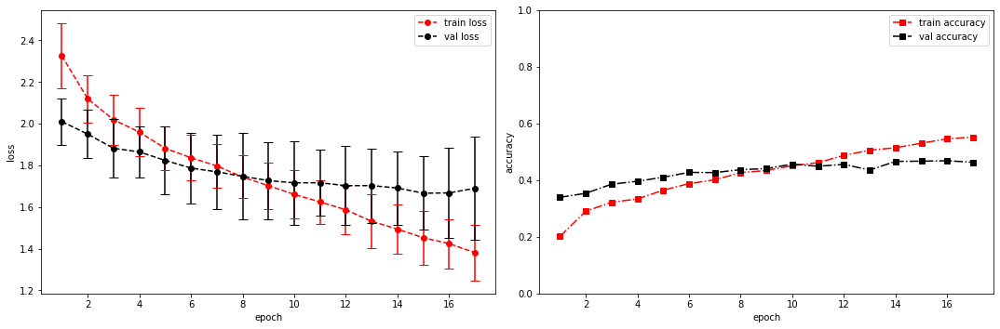

model saved


training epoch:  17
model set to train
Epoch [18/100], step [1/84],  Loss: 1.3181 +/- 0.0000,  accuracy: 0.0361328125, time elapsed = 0.32866406440734863s
Epoch [18/100], step [17/84],  Loss: 1.3520 +/- 0.1081,  accuracy: 0.5595703125, time elapsed = 0.8943805694580078s
Epoch [18/100], step [33/84],  Loss: 1.3093 +/- 0.1146,  accuracy: 0.5751953125, time elapsed = 0.8994390964508057s
Epoch [18/100], step [49/84],  Loss: 1.3587 +/- 0.1155,  accuracy: 0.564453125, time elapsed = 0.895108699798584s
Epoch [18/100], step [65/84],  Loss: 1.2943 +/- 0.1024,  accuracy: 0.5751953125, time elapsed = 0.9101772308349609s
Epoch [18/100], step [81/84],  Loss: 1.3538 +/- 0.1613,  accuracy: 0.5732421875, time elapsed = 0.8902106285095215s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5700167816520604,  precision = 0.5700167816520604 recall = 0.5700167816520604 f1 = 0.5700167816520604 ::: val: acc = 0.46234153616703955,  precision = 0.46234153616703955 recall = 0.462341536167039

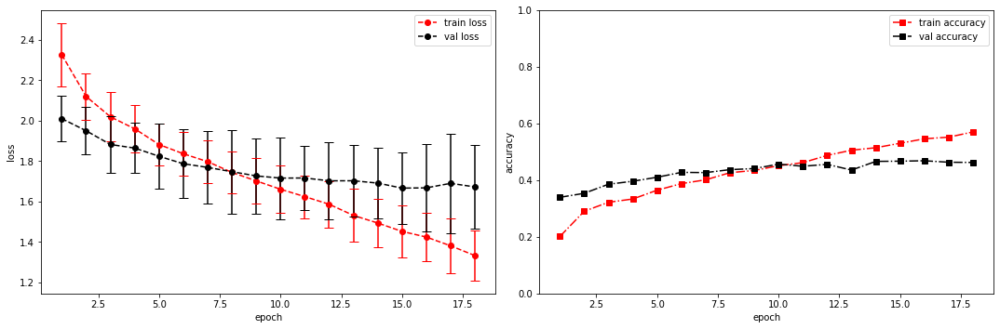

model saved


training epoch:  18
model set to train
Epoch [19/100], step [1/84],  Loss: 1.5169 +/- 0.0000,  accuracy: 0.0322265625, time elapsed = 0.3219757080078125s
Epoch [19/100], step [17/84],  Loss: 1.3090 +/- 0.1209,  accuracy: 0.59765625, time elapsed = 0.9304358959197998s
Epoch [19/100], step [33/84],  Loss: 1.3067 +/- 0.0979,  accuracy: 0.578125, time elapsed = 0.8961846828460693s
Epoch [19/100], step [49/84],  Loss: 1.2885 +/- 0.1037,  accuracy: 0.6123046875, time elapsed = 0.9073989391326904s
Epoch [19/100], step [65/84],  Loss: 1.2776 +/- 0.1321,  accuracy: 0.59765625, time elapsed = 0.896014928817749s
Epoch [19/100], step [81/84],  Loss: 1.2963 +/- 0.1105,  accuracy: 0.599609375, time elapsed = 0.9476790428161621s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5955621853440238,  precision = 0.5955621853440238 recall = 0.5955621853440238 f1 = 0.5955621853440238 ::: val: acc = 0.459358687546607,  precision = 0.459358687546607 recall = 0.459358687546607 time elapsed

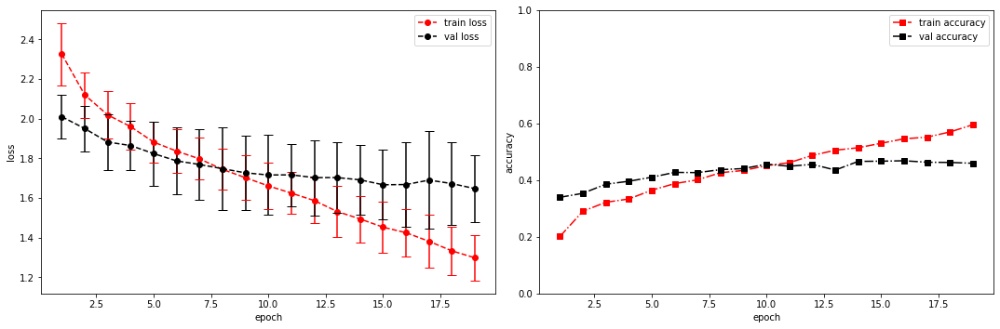

model saved
stopping early
Conv_3_layer
(1, 13, 517)
running model: id = Conv_3_layer, channels = [8, 128, 128]
device:  cuda
dataset metadata:  {'n_fft': 2048, 'hop_length': 256, 'n_mfcc': 13, 'notes': 'optional notes not passed'}
train model: data loaders initialized
sample shape =  (1, 13, 517)
model loaded
Layer (type:depth-idx)                   Output Shape              Param #
├─ConvBlock: 1-1                         [-1, 8, 13, 104]          --
|    └─Sequential: 2-1                   [-1, 8, 13, 104]          --
|    |    └─Conv2d: 3-1                  [-1, 8, 13, 517]          80
|    |    └─ReLU: 3-2                    [-1, 8, 13, 517]          --
|    |    └─MaxPool2d: 3-3               [-1, 8, 13, 104]          --
|    |    └─BatchNorm2d: 3-4             [-1, 8, 13, 104]          16
├─ConvBlock: 1-2                         [-1, 128, 13, 21]         --
|    └─Sequential: 2-2                   [-1, 128, 13, 21]         --
|    |    └─Conv2d: 3-5                  [-1, 128, 13

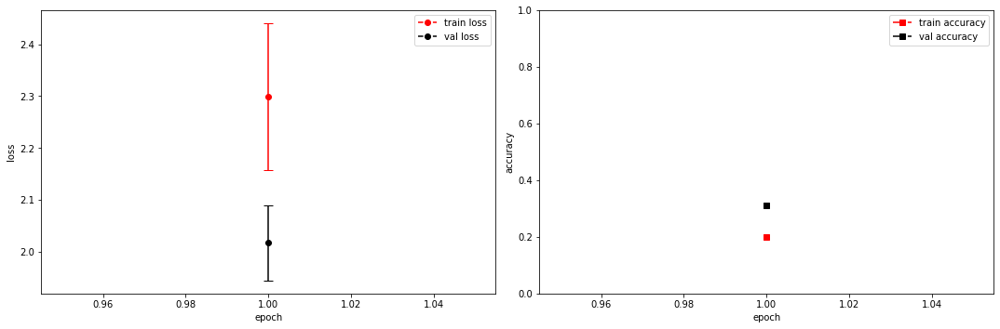

model saved


training epoch:  1
model set to train
Epoch [2/100], step [1/84],  Loss: 2.2296 +/- 0.0000,  accuracy: 0.0146484375, time elapsed = 0.31821322441101074s
Epoch [2/100], step [17/84],  Loss: 2.1377 +/- 0.0953,  accuracy: 0.271484375, time elapsed = 0.9095499515533447s
Epoch [2/100], step [33/84],  Loss: 2.1141 +/- 0.0939,  accuracy: 0.275390625, time elapsed = 0.9156770706176758s
Epoch [2/100], step [49/84],  Loss: 2.1508 +/- 0.0824,  accuracy: 0.2548828125, time elapsed = 0.910088300704956s
Epoch [2/100], step [65/84],  Loss: 2.0888 +/- 0.1329,  accuracy: 0.2626953125, time elapsed = 0.9361553192138672s
Epoch [2/100], step [81/84],  Loss: 2.0685 +/- 0.1088,  accuracy: 0.2763671875, time elapsed = 0.9113397598266602s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.26906582136863694,  precision = 0.26906582136863694 recall = 0.26906582136863694 f1 = 0.26906582136863694 ::: val: acc = 0.34377330350484714,  precision = 0.34377330350484714 recall = 0.34377330350484714 t

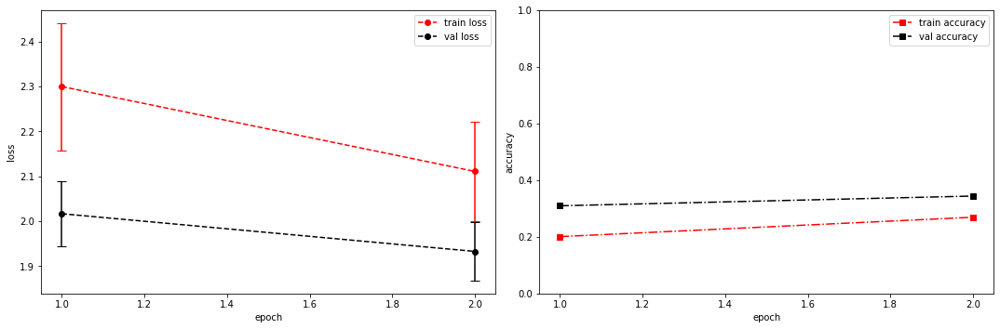

model saved


training epoch:  2
model set to train
Epoch [3/100], step [1/84],  Loss: 2.0303 +/- 0.0000,  accuracy: 0.0185546875, time elapsed = 0.33000922203063965s
Epoch [3/100], step [17/84],  Loss: 1.9957 +/- 0.1103,  accuracy: 0.3125, time elapsed = 0.9199316501617432s
Epoch [3/100], step [33/84],  Loss: 2.0243 +/- 0.1486,  accuracy: 0.3017578125, time elapsed = 0.9149148464202881s
Epoch [3/100], step [49/84],  Loss: 2.0499 +/- 0.1317,  accuracy: 0.2900390625, time elapsed = 0.9066224098205566s
Epoch [3/100], step [65/84],  Loss: 2.0842 +/- 0.1199,  accuracy: 0.2724609375, time elapsed = 0.9142143726348877s
Epoch [3/100], step [81/84],  Loss: 2.0148 +/- 0.0709,  accuracy: 0.310546875, time elapsed = 0.9124100208282471s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.2977810926720119,  precision = 0.2977810926720119 recall = 0.2977810926720119 f1 = 0.2977810926720119 ::: val: acc = 0.37583892617449666,  precision = 0.37583892617449666 recall = 0.37583892617449666 time elap

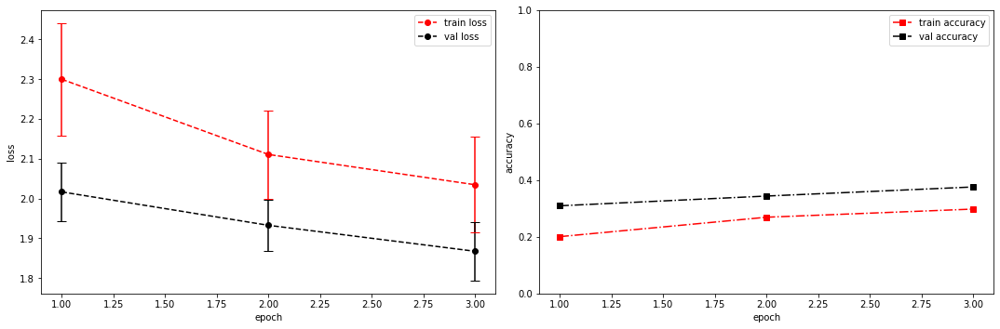

model saved


training epoch:  3
model set to train
Epoch [4/100], step [1/84],  Loss: 2.1333 +/- 0.0000,  accuracy: 0.0146484375, time elapsed = 0.34389328956604004s
Epoch [4/100], step [17/84],  Loss: 2.0161 +/- 0.1048,  accuracy: 0.30078125, time elapsed = 0.93611741065979s
Epoch [4/100], step [33/84],  Loss: 1.9762 +/- 0.0846,  accuracy: 0.328125, time elapsed = 0.919945240020752s
Epoch [4/100], step [49/84],  Loss: 1.9356 +/- 0.1242,  accuracy: 0.3525390625, time elapsed = 0.9349279403686523s
Epoch [4/100], step [65/84],  Loss: 1.9622 +/- 0.1038,  accuracy: 0.3212890625, time elapsed = 0.9197797775268555s
Epoch [4/100], step [81/84],  Loss: 1.9539 +/- 0.1232,  accuracy: 0.34375, time elapsed = 0.8998312950134277s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.32742867797874325,  precision = 0.32742867797874325 recall = 0.32742867797874325 f1 = 0.32742867797874325 ::: val: acc = 0.3982102908277405,  precision = 0.3982102908277405 recall = 0.3982102908277405 time elapsed = 

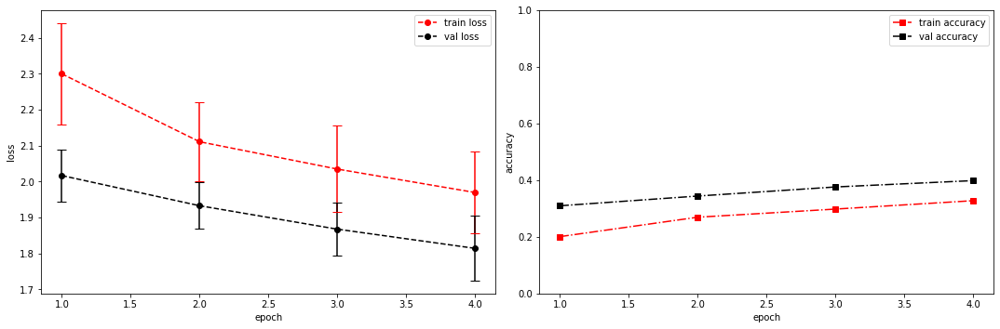

model saved


training epoch:  4
model set to train
Epoch [5/100], step [1/84],  Loss: 1.8886 +/- 0.0000,  accuracy: 0.0205078125, time elapsed = 0.3362724781036377s
Epoch [5/100], step [17/84],  Loss: 1.9306 +/- 0.0718,  accuracy: 0.3544921875, time elapsed = 0.936051607131958s
Epoch [5/100], step [33/84],  Loss: 1.9457 +/- 0.1334,  accuracy: 0.3583984375, time elapsed = 0.9158551692962646s
Epoch [5/100], step [49/84],  Loss: 1.9197 +/- 0.0966,  accuracy: 0.3369140625, time elapsed = 0.9101927280426025s
Epoch [5/100], step [65/84],  Loss: 1.9006 +/- 0.0999,  accuracy: 0.353515625, time elapsed = 0.9731485843658447s
Epoch [5/100], step [81/84],  Loss: 1.8825 +/- 0.1308,  accuracy: 0.3525390625, time elapsed = 0.9460704326629639s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3509229908633228,  precision = 0.3509229908633228 recall = 0.3509229908633228 f1 = 0.3509229908633228 ::: val: acc = 0.40939597315436244,  precision = 0.40939597315436244 recall = 0.40939597315436244 time 

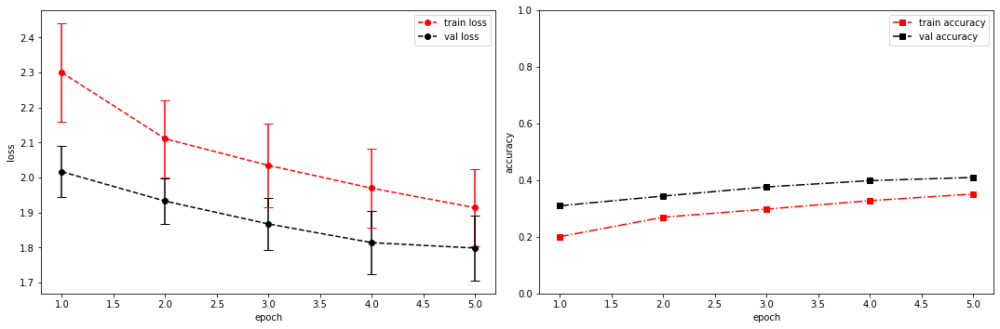

model saved


training epoch:  5
model set to train
Epoch [6/100], step [1/84],  Loss: 1.7763 +/- 0.0000,  accuracy: 0.0263671875, time elapsed = 0.3182499408721924s
Epoch [6/100], step [17/84],  Loss: 1.8988 +/- 0.1310,  accuracy: 0.384765625, time elapsed = 0.9243152141571045s
Epoch [6/100], step [33/84],  Loss: 1.8400 +/- 0.1038,  accuracy: 0.375, time elapsed = 0.9289562702178955s
Epoch [6/100], step [49/84],  Loss: 1.8485 +/- 0.1136,  accuracy: 0.3857421875, time elapsed = 0.91135573387146s
Epoch [6/100], step [65/84],  Loss: 1.8391 +/- 0.0975,  accuracy: 0.3837890625, time elapsed = 0.9198787212371826s
Epoch [6/100], step [81/84],  Loss: 1.8928 +/- 0.1330,  accuracy: 0.3544921875, time elapsed = 0.9173812866210938s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3766548573559575,  precision = 0.3766548573559575 recall = 0.3766548573559575 f1 = 0.3766548573559575 ::: val: acc = 0.4280387770320656,  precision = 0.4280387770320656 recall = 0.4280387770320656 time elapsed = 6

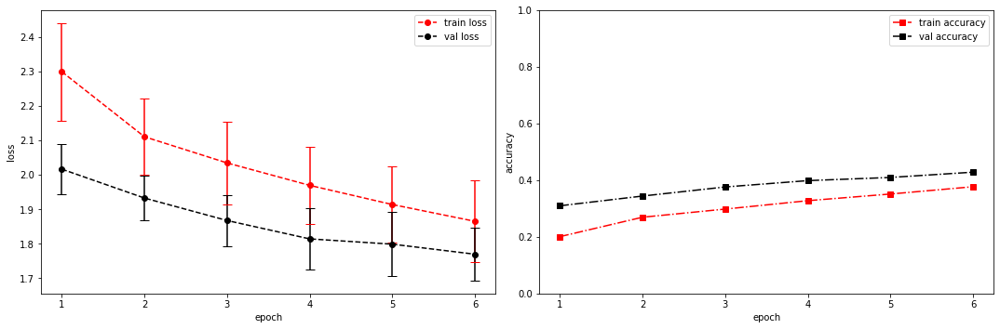

model saved


training epoch:  6
model set to train
Epoch [7/100], step [1/84],  Loss: 1.6520 +/- 0.0000,  accuracy: 0.0263671875, time elapsed = 0.32903003692626953s
Epoch [7/100], step [17/84],  Loss: 1.8252 +/- 0.1221,  accuracy: 0.3896484375, time elapsed = 0.9198808670043945s
Epoch [7/100], step [33/84],  Loss: 1.8401 +/- 0.1208,  accuracy: 0.3662109375, time elapsed = 0.9171874523162842s
Epoch [7/100], step [49/84],  Loss: 1.7930 +/- 0.0933,  accuracy: 0.3974609375, time elapsed = 0.9076333045959473s
Epoch [7/100], step [65/84],  Loss: 1.8189 +/- 0.1169,  accuracy: 0.3955078125, time elapsed = 0.911052942276001s
Epoch [7/100], step [81/84],  Loss: 1.8095 +/- 0.1148,  accuracy: 0.40625, time elapsed = 0.9171929359436035s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3898937162036174,  precision = 0.3898937162036174 recall = 0.3898937162036174 f1 = 0.3898937162036174 ::: val: acc = 0.41312453392990306,  precision = 0.41312453392990306 recall = 0.41312453392990306 time ela

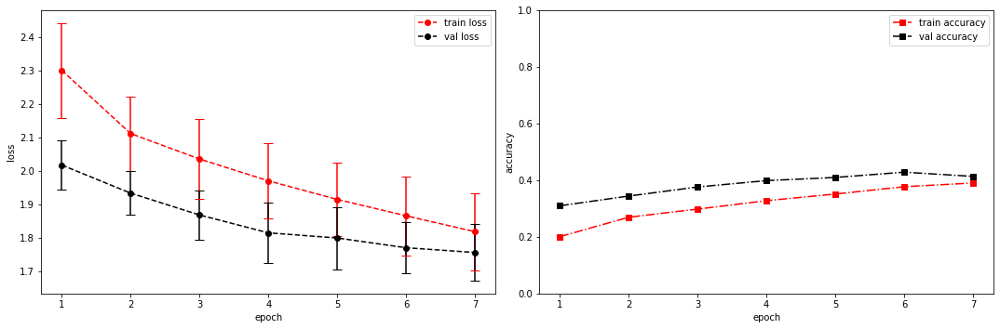

model saved


training epoch:  7
model set to train
Epoch [8/100], step [1/84],  Loss: 1.5998 +/- 0.0000,  accuracy: 0.0302734375, time elapsed = 0.3258030414581299s
Epoch [8/100], step [17/84],  Loss: 1.7379 +/- 0.0867,  accuracy: 0.4287109375, time elapsed = 0.9098954200744629s
Epoch [8/100], step [33/84],  Loss: 1.7920 +/- 0.1031,  accuracy: 0.38671875, time elapsed = 0.9132406711578369s
Epoch [8/100], step [49/84],  Loss: 1.7992 +/- 0.1043,  accuracy: 0.4013671875, time elapsed = 0.927574634552002s
Epoch [8/100], step [65/84],  Loss: 1.7844 +/- 0.1526,  accuracy: 0.4091796875, time elapsed = 0.9550206661224365s
Epoch [8/100], step [81/84],  Loss: 1.7421 +/- 0.1230,  accuracy: 0.423828125, time elapsed = 1.0194058418273926s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4118963266828268,  precision = 0.4118963266828268 recall = 0.4118963266828268 f1 = 0.4118963266828268 ::: val: acc = 0.4220730797912006,  precision = 0.4220730797912006 recall = 0.4220730797912006 time elaps

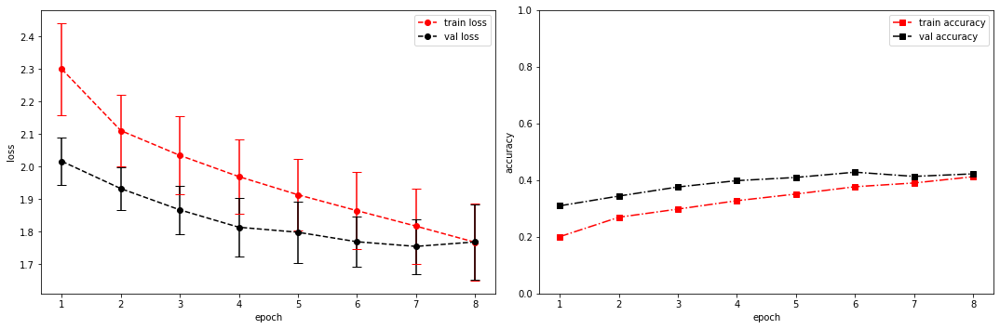

model saved


training epoch:  8
model set to train
Epoch [9/100], step [1/84],  Loss: 1.5616 +/- 0.0000,  accuracy: 0.033203125, time elapsed = 0.3368515968322754s
Epoch [9/100], step [17/84],  Loss: 1.7165 +/- 0.0917,  accuracy: 0.427734375, time elapsed = 0.920363187789917s
Epoch [9/100], step [33/84],  Loss: 1.7126 +/- 0.1198,  accuracy: 0.43359375, time elapsed = 0.9158954620361328s
Epoch [9/100], step [49/84],  Loss: 1.7678 +/- 0.1478,  accuracy: 0.419921875, time elapsed = 0.9049026966094971s
Epoch [9/100], step [65/84],  Loss: 1.7327 +/- 0.0718,  accuracy: 0.4169921875, time elapsed = 0.9049334526062012s
Epoch [9/100], step [81/84],  Loss: 1.7088 +/- 0.0797,  accuracy: 0.447265625, time elapsed = 0.9253840446472168s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.43054260674995337,  precision = 0.43054260674995337 recall = 0.43054260674995337 f1 = 0.43054260674995337 ::: val: acc = 0.42878448918717377,  precision = 0.42878448918717377 recall = 0.42878448918717377 time e

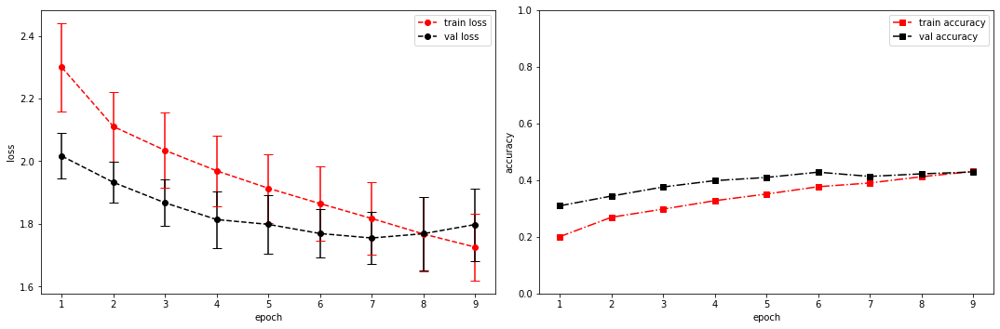

model saved


training epoch:  9
model set to train
Epoch [10/100], step [1/84],  Loss: 1.7564 +/- 0.0000,  accuracy: 0.0224609375, time elapsed = 0.3462848663330078s
Epoch [10/100], step [17/84],  Loss: 1.7204 +/- 0.1233,  accuracy: 0.439453125, time elapsed = 0.9077444076538086s
Epoch [10/100], step [33/84],  Loss: 1.6900 +/- 0.1142,  accuracy: 0.4326171875, time elapsed = 0.9353690147399902s
Epoch [10/100], step [49/84],  Loss: 1.6642 +/- 0.1149,  accuracy: 0.447265625, time elapsed = 0.9077951908111572s
Epoch [10/100], step [65/84],  Loss: 1.6868 +/- 0.1046,  accuracy: 0.447265625, time elapsed = 0.907700777053833s
Epoch [10/100], step [81/84],  Loss: 1.6715 +/- 0.1164,  accuracy: 0.4755859375, time elapsed = 0.9128768444061279s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.44732425881036736,  precision = 0.44732425881036736 recall = 0.44732425881036736 f1 = 0.44732425881036736 ::: val: acc = 0.44146159582401195,  precision = 0.44146159582401195 recall = 0.441461595824011

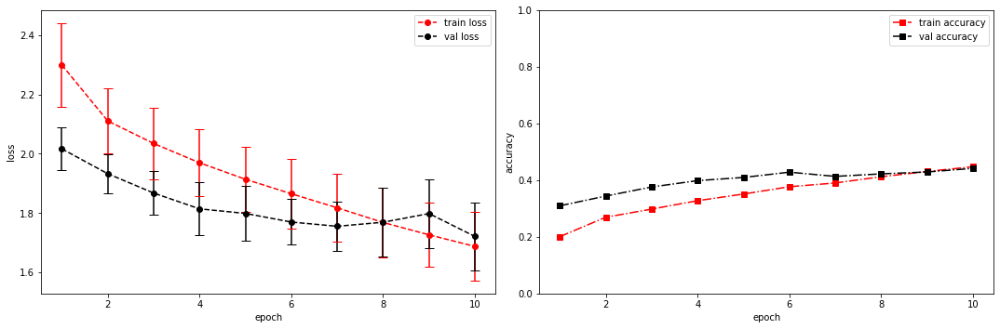

model saved


training epoch:  10
model set to train
Epoch [11/100], step [1/84],  Loss: 1.5811 +/- 0.0000,  accuracy: 0.0283203125, time elapsed = 0.33824849128723145s
Epoch [11/100], step [17/84],  Loss: 1.5829 +/- 0.1330,  accuracy: 0.4921875, time elapsed = 0.9065945148468018s
Epoch [11/100], step [33/84],  Loss: 1.6221 +/- 0.1153,  accuracy: 0.470703125, time elapsed = 0.9289054870605469s
Epoch [11/100], step [49/84],  Loss: 1.6122 +/- 0.0914,  accuracy: 0.45703125, time elapsed = 0.9131195545196533s
Epoch [11/100], step [65/84],  Loss: 1.6121 +/- 0.1241,  accuracy: 0.474609375, time elapsed = 0.9171290397644043s
Epoch [11/100], step [81/84],  Loss: 1.6324 +/- 0.1153,  accuracy: 0.4716796875, time elapsed = 0.9156737327575684s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4721238112996457,  precision = 0.4721238112996457 recall = 0.4721238112996457 f1 = 0.4721238112996457 ::: val: acc = 0.4541387024608501,  precision = 0.4541387024608501 recall = 0.4541387024608501 time 

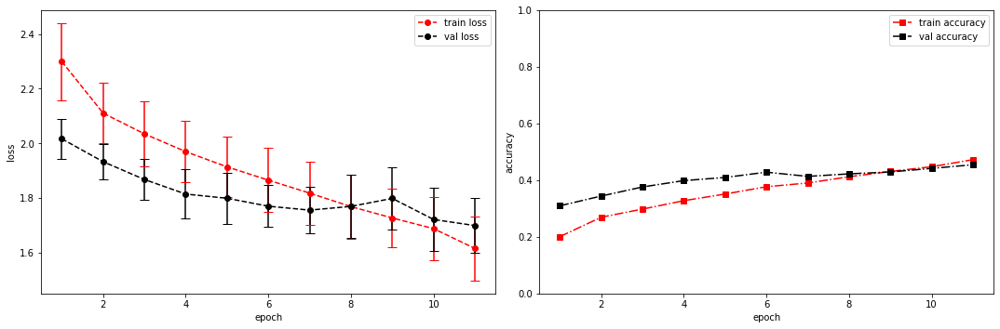

model saved


training epoch:  11
model set to train
Epoch [12/100], step [1/84],  Loss: 1.7095 +/- 0.0000,  accuracy: 0.03125, time elapsed = 0.3399477005004883s
Epoch [12/100], step [17/84],  Loss: 1.5780 +/- 0.1072,  accuracy: 0.5029296875, time elapsed = 0.9197211265563965s
Epoch [12/100], step [33/84],  Loss: 1.5771 +/- 0.1194,  accuracy: 0.4599609375, time elapsed = 0.9077391624450684s
Epoch [12/100], step [49/84],  Loss: 1.5782 +/- 0.1534,  accuracy: 0.484375, time elapsed = 0.9057669639587402s
Epoch [12/100], step [65/84],  Loss: 1.5478 +/- 0.1104,  accuracy: 0.501953125, time elapsed = 0.9029853343963623s
Epoch [12/100], step [81/84],  Loss: 1.5667 +/- 0.1020,  accuracy: 0.4921875, time elapsed = 0.8938157558441162s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4883460749580459,  precision = 0.4883460749580459 recall = 0.4883460749580459 f1 = 0.4883460749580459 ::: val: acc = 0.4541387024608501,  precision = 0.4541387024608501 recall = 0.4541387024608501 time elapsed

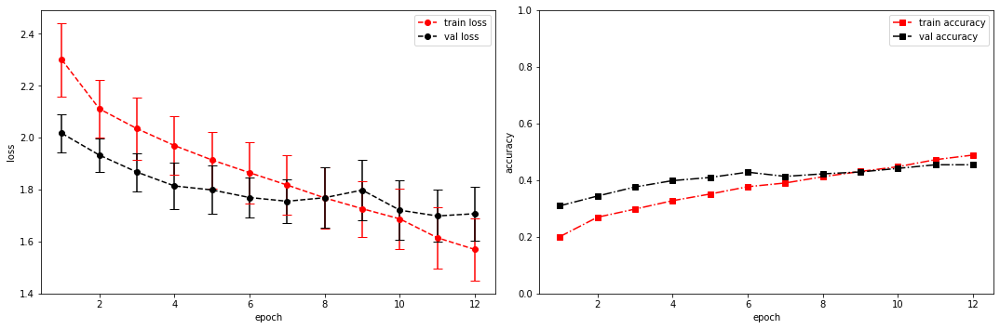

model saved


training epoch:  12
model set to train
Epoch [13/100], step [1/84],  Loss: 1.6279 +/- 0.0000,  accuracy: 0.0302734375, time elapsed = 0.32665109634399414s
Epoch [13/100], step [17/84],  Loss: 1.4866 +/- 0.1148,  accuracy: 0.5263671875, time elapsed = 0.9371647834777832s
Epoch [13/100], step [33/84],  Loss: 1.4752 +/- 0.1462,  accuracy: 0.5517578125, time elapsed = 0.944084644317627s
Epoch [13/100], step [49/84],  Loss: 1.5418 +/- 0.1099,  accuracy: 0.501953125, time elapsed = 0.9180598258972168s
Epoch [13/100], step [65/84],  Loss: 1.5398 +/- 0.1183,  accuracy: 0.5166015625, time elapsed = 0.9704611301422119s
Epoch [13/100], step [81/84],  Loss: 1.5112 +/- 0.0829,  accuracy: 0.513671875, time elapsed = 0.9462215900421143s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5213499906768599,  precision = 0.5213499906768599 recall = 0.5213499906768599 f1 = 0.5213499906768599 ::: val: acc = 0.453392990305742,  precision = 0.453392990305742 recall = 0.453392990305742 time

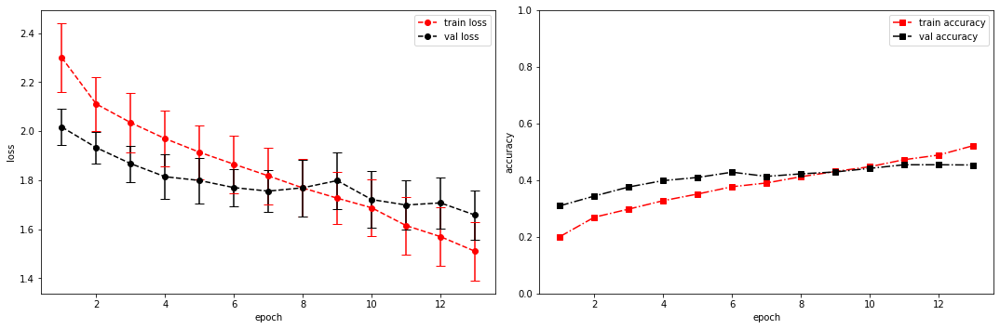

model saved


training epoch:  13
model set to train
Epoch [14/100], step [1/84],  Loss: 1.3825 +/- 0.0000,  accuracy: 0.037109375, time elapsed = 0.3353860378265381s
Epoch [14/100], step [17/84],  Loss: 1.4619 +/- 0.0872,  accuracy: 0.525390625, time elapsed = 0.9487559795379639s
Epoch [14/100], step [33/84],  Loss: 1.4456 +/- 0.0898,  accuracy: 0.53125, time elapsed = 0.9063324928283691s
Epoch [14/100], step [49/84],  Loss: 1.4362 +/- 0.1012,  accuracy: 0.544921875, time elapsed = 0.9218020439147949s
Epoch [14/100], step [65/84],  Loss: 1.4680 +/- 0.1090,  accuracy: 0.51953125, time elapsed = 0.9041292667388916s
Epoch [14/100], step [81/84],  Loss: 1.4775 +/- 0.1215,  accuracy: 0.5341796875, time elapsed = 0.9058370590209961s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5319783703151222,  precision = 0.5319783703151222 recall = 0.5319783703151222 f1 = 0.5319783703151222 ::: val: acc = 0.46607009694258017,  precision = 0.46607009694258017 recall = 0.46607009694258017 time e

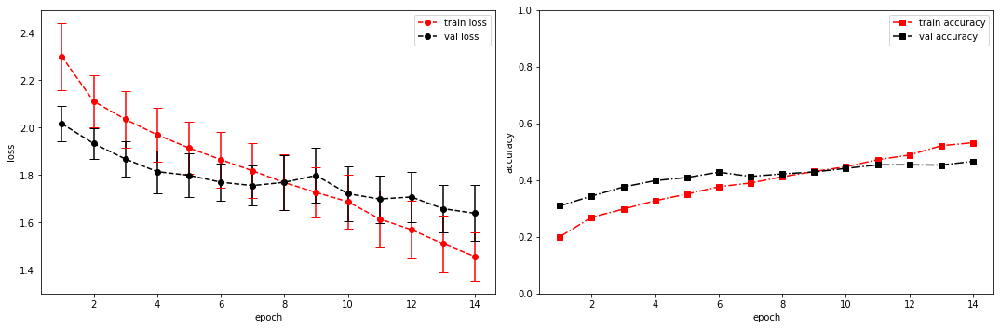

model saved


training epoch:  14
model set to train
Epoch [15/100], step [1/84],  Loss: 1.4807 +/- 0.0000,  accuracy: 0.03125, time elapsed = 0.32109642028808594s
Epoch [15/100], step [17/84],  Loss: 1.3588 +/- 0.1058,  accuracy: 0.5732421875, time elapsed = 0.9276859760284424s
Epoch [15/100], step [33/84],  Loss: 1.4553 +/- 0.1168,  accuracy: 0.51953125, time elapsed = 0.9211776256561279s
Epoch [15/100], step [49/84],  Loss: 1.4225 +/- 0.0997,  accuracy: 0.5498046875, time elapsed = 0.9011886119842529s
Epoch [15/100], step [65/84],  Loss: 1.4231 +/- 0.1096,  accuracy: 0.564453125, time elapsed = 0.9336786270141602s
Epoch [15/100], step [81/84],  Loss: 1.4376 +/- 0.1208,  accuracy: 0.5380859375, time elapsed = 0.9077739715576172s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5485735595748649,  precision = 0.5485735595748649 recall = 0.5485735595748649 f1 = 0.5485735595748649 ::: val: acc = 0.47949291573452646,  precision = 0.47949291573452646 recall = 0.47949291573452646 tim

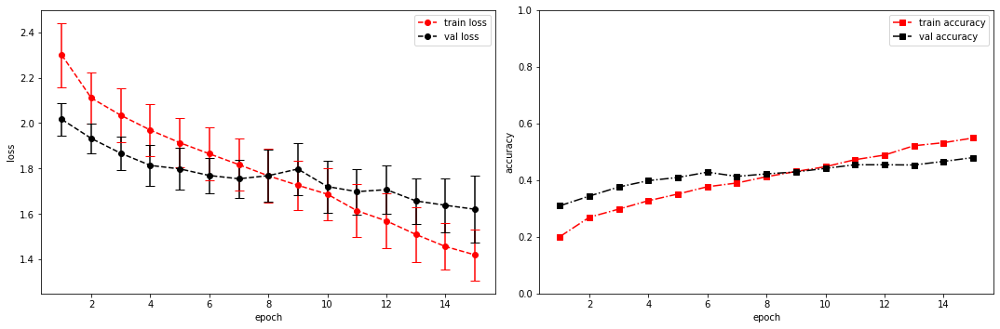

model saved


training epoch:  15
model set to train
Epoch [16/100], step [1/84],  Loss: 1.4472 +/- 0.0000,  accuracy: 0.02734375, time elapsed = 0.34062790870666504s
Epoch [16/100], step [17/84],  Loss: 1.3495 +/- 0.1150,  accuracy: 0.560546875, time elapsed = 0.9154751300811768s
Epoch [16/100], step [33/84],  Loss: 1.3552 +/- 0.0727,  accuracy: 0.568359375, time elapsed = 0.9230368137359619s
Epoch [16/100], step [49/84],  Loss: 1.3354 +/- 0.1212,  accuracy: 0.5771484375, time elapsed = 0.8980298042297363s
Epoch [16/100], step [65/84],  Loss: 1.3510 +/- 0.1033,  accuracy: 0.5703125, time elapsed = 0.9189555644989014s
Epoch [16/100], step [81/84],  Loss: 1.3302 +/- 0.1018,  accuracy: 0.59765625, time elapsed = 0.9153897762298584s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5713220212567592,  precision = 0.5713220212567592 recall = 0.5713220212567592 f1 = 0.5713220212567592 ::: val: acc = 0.4697986577181208,  precision = 0.4697986577181208 recall = 0.4697986577181208 time el

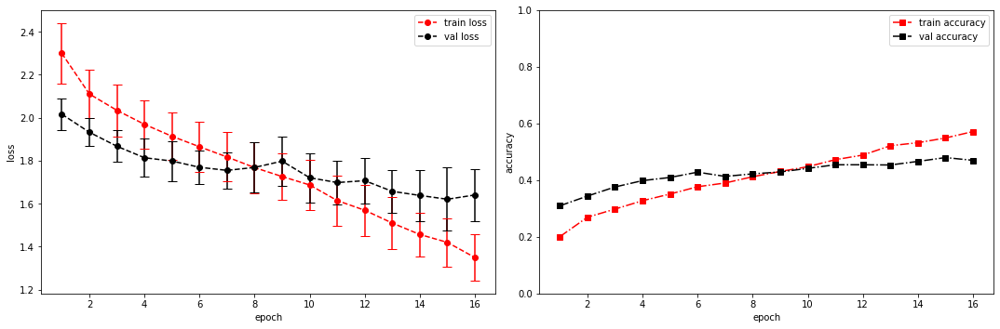

model saved
stopping early
Conv_3_layer
(1, 13, 517)
running model: id = Conv_3_layer, channels = [32, 32, 64]
device:  cuda
dataset metadata:  {'n_fft': 2048, 'hop_length': 256, 'n_mfcc': 13, 'notes': 'optional notes not passed'}
train model: data loaders initialized
sample shape =  (1, 13, 517)
model loaded
Layer (type:depth-idx)                   Output Shape              Param #
├─ConvBlock: 1-1                         [-1, 32, 13, 104]         --
|    └─Sequential: 2-1                   [-1, 32, 13, 104]         --
|    |    └─Conv2d: 3-1                  [-1, 32, 13, 517]         320
|    |    └─ReLU: 3-2                    [-1, 32, 13, 517]         --
|    |    └─MaxPool2d: 3-3               [-1, 32, 13, 104]         --
|    |    └─BatchNorm2d: 3-4             [-1, 32, 13, 104]         64
├─ConvBlock: 1-2                         [-1, 32, 13, 21]          --
|    └─Sequential: 2-2                   [-1, 32, 13, 21]          --
|    |    └─Conv2d: 3-5                  [-1, 32, 13,

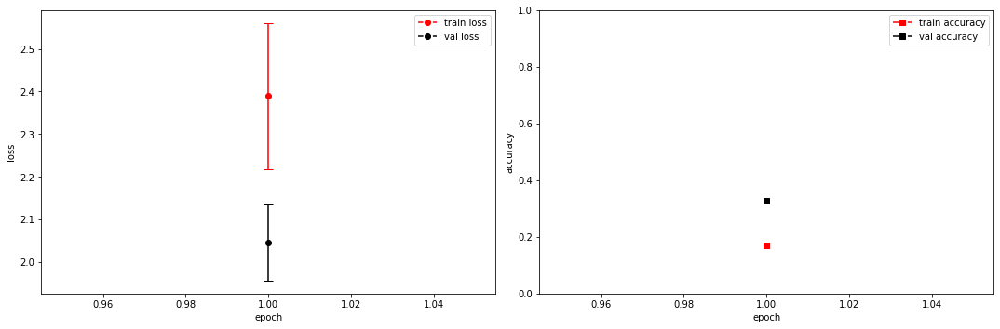

model saved


training epoch:  1
model set to train
Epoch [2/100], step [1/84],  Loss: 2.0975 +/- 0.0000,  accuracy: 0.015625, time elapsed = 0.3341691493988037s
Epoch [2/100], step [17/84],  Loss: 2.2105 +/- 0.1126,  accuracy: 0.234375, time elapsed = 0.9114105701446533s
Epoch [2/100], step [33/84],  Loss: 2.1770 +/- 0.0649,  accuracy: 0.2548828125, time elapsed = 0.8839371204376221s
Epoch [2/100], step [49/84],  Loss: 2.1315 +/- 0.0918,  accuracy: 0.2744140625, time elapsed = 0.8961269855499268s
Epoch [2/100], step [65/84],  Loss: 2.1234 +/- 0.0978,  accuracy: 0.263671875, time elapsed = 0.9108498096466064s
Epoch [2/100], step [81/84],  Loss: 2.1141 +/- 0.1192,  accuracy: 0.2744140625, time elapsed = 0.8834483623504639s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.2589968301323886,  precision = 0.2589968301323886 recall = 0.2589968301323886 f1 = 0.2589968301323886 ::: val: acc = 0.3378076062639821,  precision = 0.3378076062639821 recall = 0.3378076062639821 time elapsed = 

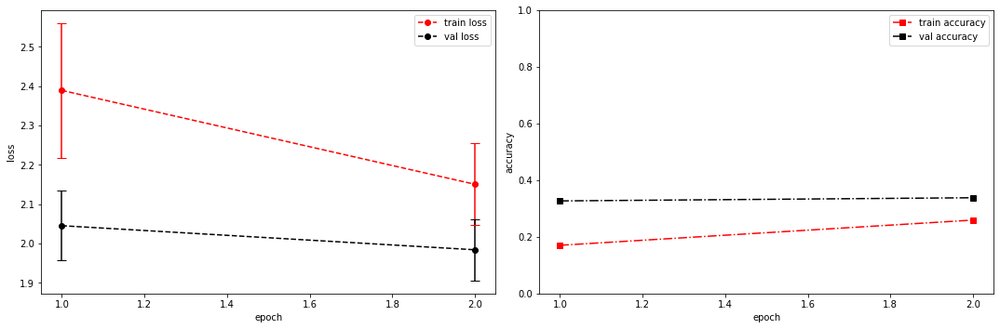

model saved


training epoch:  2
model set to train
Epoch [3/100], step [1/84],  Loss: 2.1113 +/- 0.0000,  accuracy: 0.0146484375, time elapsed = 0.3285501003265381s
Epoch [3/100], step [17/84],  Loss: 2.1195 +/- 0.1198,  accuracy: 0.287109375, time elapsed = 0.9026036262512207s
Epoch [3/100], step [33/84],  Loss: 2.0389 +/- 0.1230,  accuracy: 0.3046875, time elapsed = 0.8992490768432617s
Epoch [3/100], step [49/84],  Loss: 2.0371 +/- 0.0971,  accuracy: 0.31640625, time elapsed = 0.9152588844299316s
Epoch [3/100], step [65/84],  Loss: 2.0701 +/- 0.1197,  accuracy: 0.2841796875, time elapsed = 0.8883872032165527s
Epoch [3/100], step [81/84],  Loss: 2.1042 +/- 0.0784,  accuracy: 0.271484375, time elapsed = 0.8927812576293945s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.2940518366585866,  precision = 0.2940518366585866 recall = 0.2940518366585866 f1 = 0.2940518366585866 ::: val: acc = 0.36316181953765847,  precision = 0.36316181953765847 recall = 0.36316181953765847 time elaps

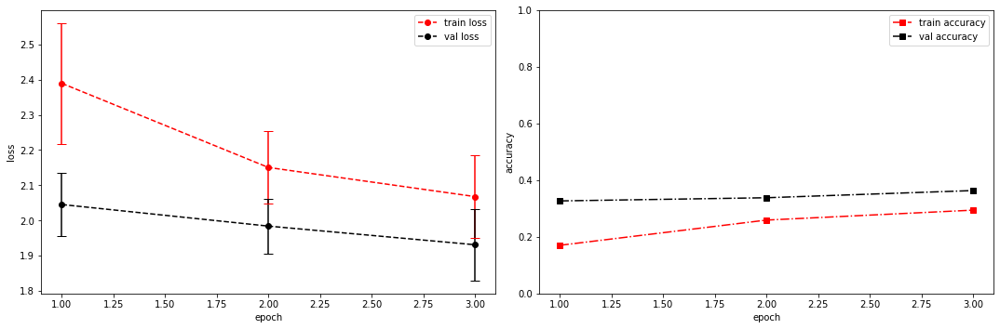

model saved


training epoch:  3
model set to train
Epoch [4/100], step [1/84],  Loss: 2.0641 +/- 0.0000,  accuracy: 0.01953125, time elapsed = 0.35150742530822754s
Epoch [4/100], step [17/84],  Loss: 2.0184 +/- 0.0707,  accuracy: 0.302734375, time elapsed = 0.9149527549743652s
Epoch [4/100], step [33/84],  Loss: 2.0427 +/- 0.0930,  accuracy: 0.3076171875, time elapsed = 0.9107956886291504s
Epoch [4/100], step [49/84],  Loss: 1.9935 +/- 0.1155,  accuracy: 0.328125, time elapsed = 0.8882870674133301s
Epoch [4/100], step [65/84],  Loss: 1.9830 +/- 0.0831,  accuracy: 0.3193359375, time elapsed = 0.9096415042877197s
Epoch [4/100], step [81/84],  Loss: 2.0077 +/- 0.1126,  accuracy: 0.326171875, time elapsed = 0.897700309753418s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.316054447137796,  precision = 0.316054447137796 recall = 0.316054447137796 f1 = 0.316054447137796 ::: val: acc = 0.3706189410887398,  precision = 0.3706189410887398 recall = 0.3706189410887398 time elapsed = 6.4

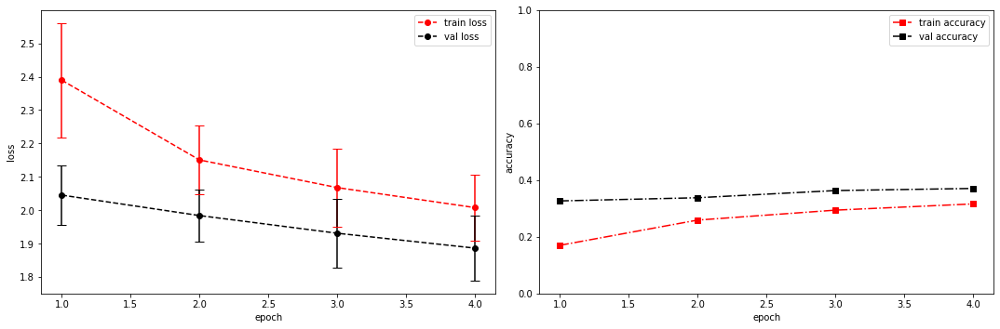

model saved


training epoch:  4
model set to train
Epoch [5/100], step [1/84],  Loss: 2.0225 +/- 0.0000,  accuracy: 0.0166015625, time elapsed = 0.3367931842803955s
Epoch [5/100], step [17/84],  Loss: 1.9396 +/- 0.1300,  accuracy: 0.326171875, time elapsed = 0.905709981918335s
Epoch [5/100], step [33/84],  Loss: 1.9932 +/- 0.0963,  accuracy: 0.3251953125, time elapsed = 0.8999471664428711s
Epoch [5/100], step [49/84],  Loss: 1.9494 +/- 0.1080,  accuracy: 0.3408203125, time elapsed = 0.9043219089508057s
Epoch [5/100], step [65/84],  Loss: 1.9160 +/- 0.0880,  accuracy: 0.359375, time elapsed = 0.9326574802398682s
Epoch [5/100], step [81/84],  Loss: 1.9483 +/- 0.1579,  accuracy: 0.3369140625, time elapsed = 0.9132480621337891s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.33749766921499164,  precision = 0.33749766921499164 recall = 0.33749766921499164 f1 = 0.33749766921499164 ::: val: acc = 0.3959731543624161,  precision = 0.3959731543624161 recall = 0.3959731543624161 time ela

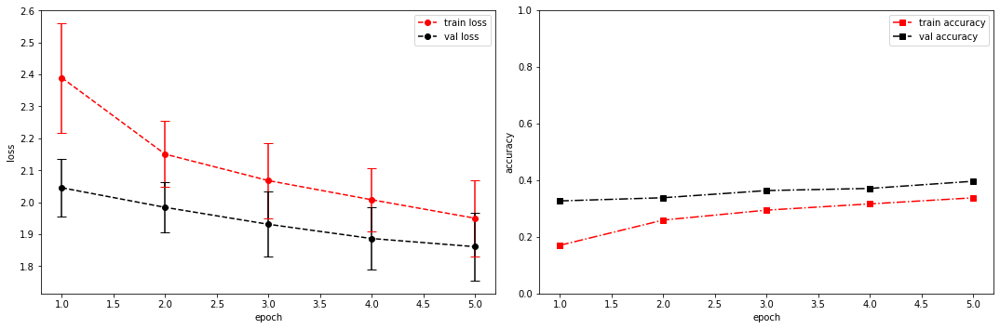

model saved


training epoch:  5
model set to train
Epoch [6/100], step [1/84],  Loss: 1.8450 +/- 0.0000,  accuracy: 0.025390625, time elapsed = 0.33263683319091797s
Epoch [6/100], step [17/84],  Loss: 1.8349 +/- 0.0850,  accuracy: 0.375, time elapsed = 0.9164421558380127s
Epoch [6/100], step [33/84],  Loss: 1.8806 +/- 0.1094,  accuracy: 0.3671875, time elapsed = 0.897843599319458s
Epoch [6/100], step [49/84],  Loss: 1.8439 +/- 0.0781,  accuracy: 0.3759765625, time elapsed = 0.899590015411377s
Epoch [6/100], step [65/84],  Loss: 1.9137 +/- 0.1260,  accuracy: 0.3671875, time elapsed = 0.9054384231567383s
Epoch [6/100], step [81/84],  Loss: 1.9298 +/- 0.1621,  accuracy: 0.353515625, time elapsed = 0.8917386531829834s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3665858661197091,  precision = 0.3665858661197091 recall = 0.3665858661197091 f1 = 0.3665858661197091 ::: val: acc = 0.4004474272930649,  precision = 0.4004474272930649 recall = 0.4004474272930649 time elapsed = 6.44812

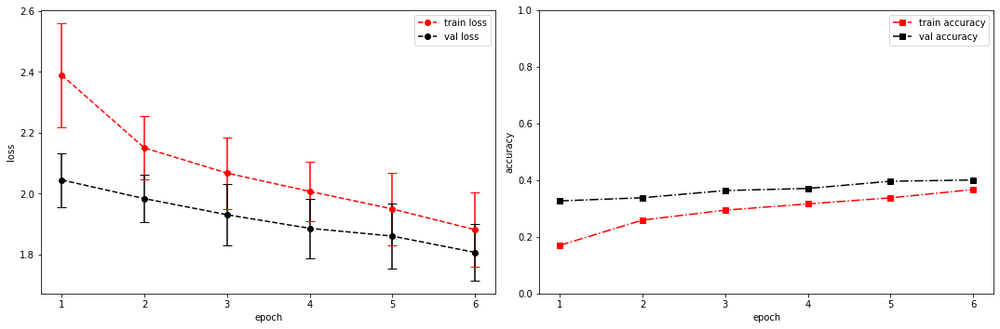

model saved


training epoch:  6
model set to train
Epoch [7/100], step [1/84],  Loss: 1.9889 +/- 0.0000,  accuracy: 0.0234375, time elapsed = 0.35445666313171387s
Epoch [7/100], step [17/84],  Loss: 1.8087 +/- 0.0843,  accuracy: 0.396484375, time elapsed = 0.9422364234924316s
Epoch [7/100], step [33/84],  Loss: 1.8554 +/- 0.1323,  accuracy: 0.38671875, time elapsed = 0.9104321002960205s
Epoch [7/100], step [49/84],  Loss: 1.8328 +/- 0.0991,  accuracy: 0.384765625, time elapsed = 0.9029579162597656s
Epoch [7/100], step [65/84],  Loss: 1.8350 +/- 0.0961,  accuracy: 0.375, time elapsed = 0.9025866985321045s
Epoch [7/100], step [81/84],  Loss: 1.8349 +/- 0.1255,  accuracy: 0.37890625, time elapsed = 0.8991544246673584s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3837404437814656,  precision = 0.3837404437814656 recall = 0.3837404437814656 f1 = 0.3837404437814656 ::: val: acc = 0.41312453392990306,  precision = 0.41312453392990306 recall = 0.41312453392990306 time elapsed = 6.5

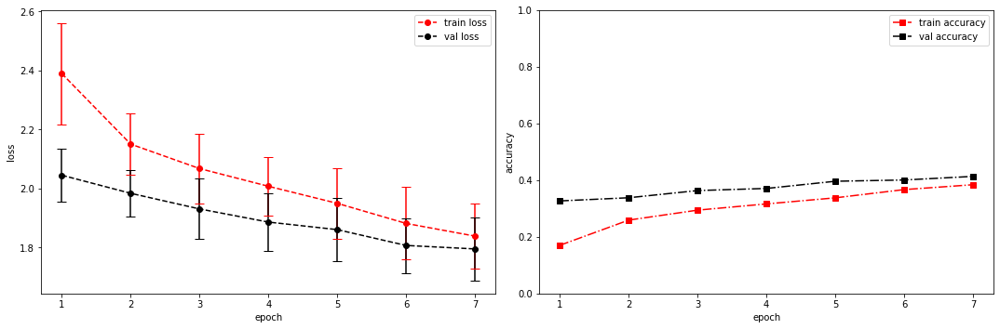

model saved


training epoch:  7
model set to train
Epoch [8/100], step [1/84],  Loss: 1.8136 +/- 0.0000,  accuracy: 0.0185546875, time elapsed = 0.32213473320007324s
Epoch [8/100], step [17/84],  Loss: 1.8074 +/- 0.1182,  accuracy: 0.4072265625, time elapsed = 0.9107773303985596s
Epoch [8/100], step [33/84],  Loss: 1.7646 +/- 0.0985,  accuracy: 0.4345703125, time elapsed = 0.9044196605682373s
Epoch [8/100], step [49/84],  Loss: 1.7749 +/- 0.0916,  accuracy: 0.408203125, time elapsed = 0.9245169162750244s
Epoch [8/100], step [65/84],  Loss: 1.8206 +/- 0.1188,  accuracy: 0.3818359375, time elapsed = 0.9446449279785156s
Epoch [8/100], step [81/84],  Loss: 1.7756 +/- 0.1174,  accuracy: 0.4072265625, time elapsed = 0.9210846424102783s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4063024426626888,  precision = 0.4063024426626888 recall = 0.4063024426626888 f1 = 0.40630244266268883 ::: val: acc = 0.41759880686055184,  precision = 0.41759880686055184 recall = 0.41759880686055184 ti

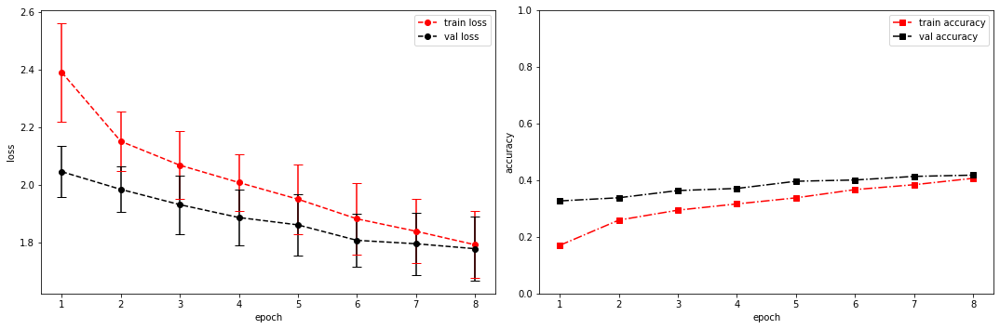

model saved


training epoch:  8
model set to train
Epoch [9/100], step [1/84],  Loss: 1.8015 +/- 0.0000,  accuracy: 0.0224609375, time elapsed = 0.3027334213256836s
Epoch [9/100], step [17/84],  Loss: 1.7556 +/- 0.1061,  accuracy: 0.431640625, time elapsed = 0.9553096294403076s
Epoch [9/100], step [33/84],  Loss: 1.7776 +/- 0.1048,  accuracy: 0.4091796875, time elapsed = 0.899752140045166s
Epoch [9/100], step [49/84],  Loss: 1.7502 +/- 0.0845,  accuracy: 0.4208984375, time elapsed = 0.9324684143066406s
Epoch [9/100], step [65/84],  Loss: 1.7428 +/- 0.1016,  accuracy: 0.4169921875, time elapsed = 0.9146947860717773s
Epoch [9/100], step [81/84],  Loss: 1.7253 +/- 0.0801,  accuracy: 0.4365234375, time elapsed = 0.9125993251800537s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.42084654111504755,  precision = 0.42084654111504755 recall = 0.42084654111504755 f1 = 0.4208465411150476 ::: val: acc = 0.43400447427293065,  precision = 0.43400447427293065 recall = 0.43400447427293065 ti

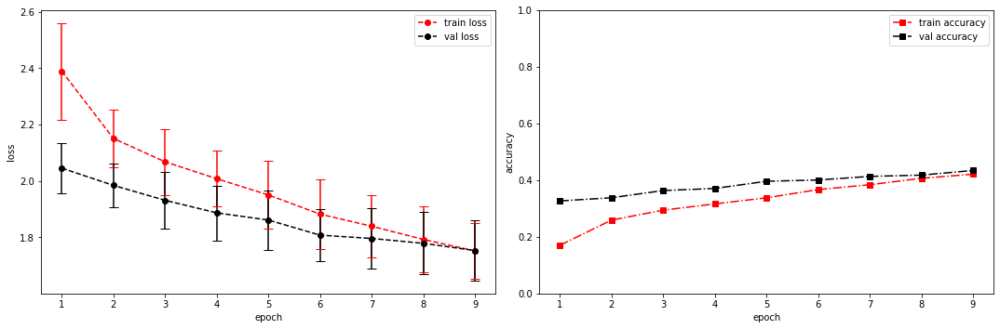

model saved


training epoch:  9
model set to train
Epoch [10/100], step [1/84],  Loss: 2.0086 +/- 0.0000,  accuracy: 0.021484375, time elapsed = 0.3482365608215332s
Epoch [10/100], step [17/84],  Loss: 1.7477 +/- 0.0931,  accuracy: 0.4345703125, time elapsed = 0.9239206314086914s
Epoch [10/100], step [33/84],  Loss: 1.7219 +/- 0.1085,  accuracy: 0.447265625, time elapsed = 0.9097580909729004s
Epoch [10/100], step [49/84],  Loss: 1.7122 +/- 0.1309,  accuracy: 0.439453125, time elapsed = 0.9196252822875977s
Epoch [10/100], step [65/84],  Loss: 1.7203 +/- 0.1019,  accuracy: 0.4208984375, time elapsed = 0.9131467342376709s
Epoch [10/100], step [81/84],  Loss: 1.7097 +/- 0.1079,  accuracy: 0.4228515625, time elapsed = 0.9156255722045898s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4322207719559948,  precision = 0.4322207719559948 recall = 0.4322207719559948 f1 = 0.4322207719559948 ::: val: acc = 0.43400447427293065,  precision = 0.43400447427293065 recall = 0.43400447427293065 

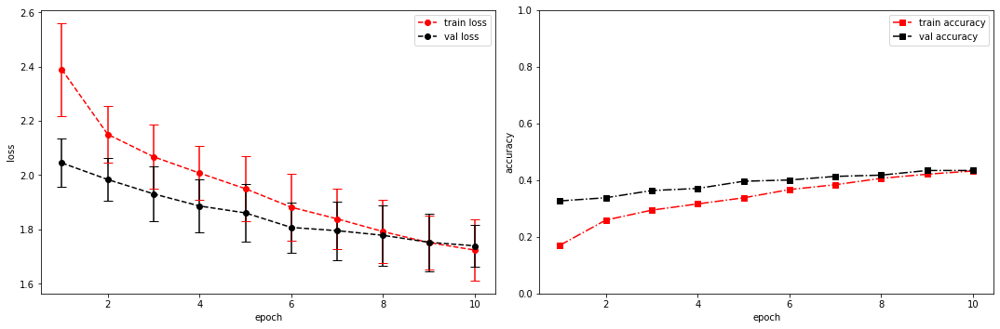

model saved


training epoch:  10
model set to train
Epoch [11/100], step [1/84],  Loss: 1.6589 +/- 0.0000,  accuracy: 0.029296875, time elapsed = 0.3524942398071289s
Epoch [11/100], step [17/84],  Loss: 1.6988 +/- 0.1101,  accuracy: 0.4365234375, time elapsed = 0.9049749374389648s
Epoch [11/100], step [33/84],  Loss: 1.6594 +/- 0.0886,  accuracy: 0.451171875, time elapsed = 0.9242269992828369s
Epoch [11/100], step [49/84],  Loss: 1.7037 +/- 0.0929,  accuracy: 0.4267578125, time elapsed = 0.9377202987670898s
Epoch [11/100], step [65/84],  Loss: 1.6271 +/- 0.0839,  accuracy: 0.466796875, time elapsed = 0.9199302196502686s
Epoch [11/100], step [81/84],  Loss: 1.6653 +/- 0.0844,  accuracy: 0.447265625, time elapsed = 0.9207234382629395s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.44564609360432594,  precision = 0.44564609360432594 recall = 0.44564609360432594 f1 = 0.44564609360432594 ::: val: acc = 0.43922445935868754,  precision = 0.43922445935868754 recall = 0.43922445935868

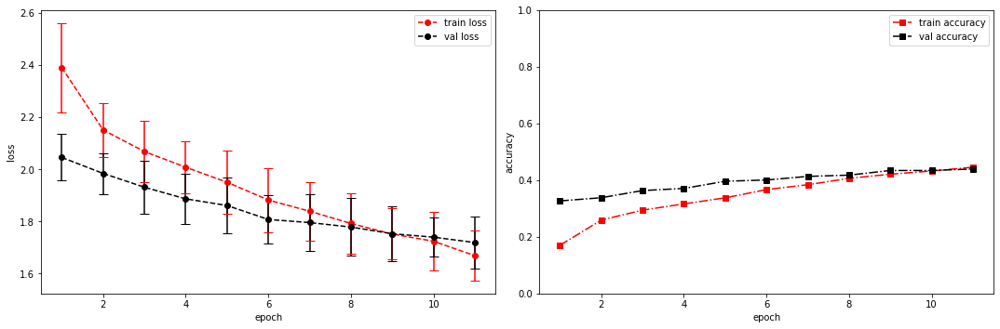

model saved


training epoch:  11
model set to train
Epoch [12/100], step [1/84],  Loss: 1.8146 +/- 0.0000,  accuracy: 0.01953125, time elapsed = 0.3506612777709961s
Epoch [12/100], step [17/84],  Loss: 1.6408 +/- 0.1029,  accuracy: 0.4501953125, time elapsed = 0.8995847702026367s
Epoch [12/100], step [33/84],  Loss: 1.6125 +/- 0.1033,  accuracy: 0.48046875, time elapsed = 0.9069690704345703s
Epoch [12/100], step [49/84],  Loss: 1.6388 +/- 0.1166,  accuracy: 0.47265625, time elapsed = 0.9389603137969971s
Epoch [12/100], step [65/84],  Loss: 1.6338 +/- 0.0982,  accuracy: 0.4599609375, time elapsed = 0.9245295524597168s
Epoch [12/100], step [81/84],  Loss: 1.6788 +/- 0.1294,  accuracy: 0.4599609375, time elapsed = 0.9034829139709473s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.46186835726272607,  precision = 0.46186835726272607 recall = 0.46186835726272607 f1 = 0.46186835726272607 ::: val: acc = 0.436241610738255,  precision = 0.436241610738255 recall = 0.436241610738255 time

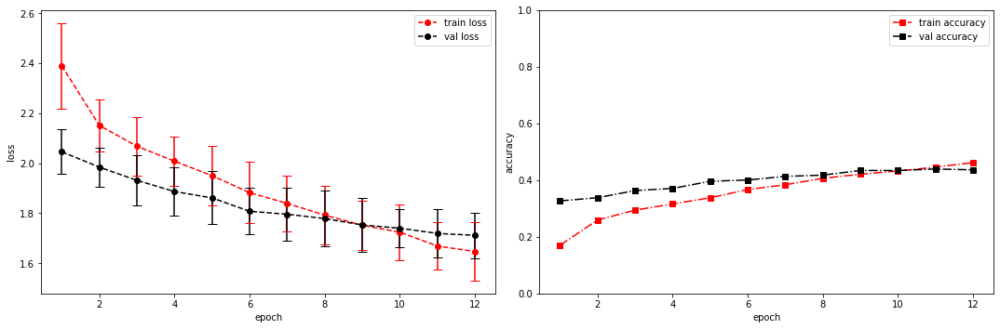

model saved


training epoch:  12
model set to train
Epoch [13/100], step [1/84],  Loss: 1.6315 +/- 0.0000,  accuracy: 0.025390625, time elapsed = 0.31598901748657227s
Epoch [13/100], step [17/84],  Loss: 1.6141 +/- 0.1075,  accuracy: 0.48046875, time elapsed = 0.9370722770690918s
Epoch [13/100], step [33/84],  Loss: 1.6053 +/- 0.1044,  accuracy: 0.48046875, time elapsed = 0.9178879261016846s
Epoch [13/100], step [49/84],  Loss: 1.6328 +/- 0.1296,  accuracy: 0.47265625, time elapsed = 0.9166762828826904s
Epoch [13/100], step [65/84],  Loss: 1.6172 +/- 0.0999,  accuracy: 0.4697265625, time elapsed = 0.9140157699584961s
Epoch [13/100], step [81/84],  Loss: 1.6129 +/- 0.1161,  accuracy: 0.46875, time elapsed = 0.9102878570556641s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.47249673690098826,  precision = 0.47249673690098826 recall = 0.47249673690098826 f1 = 0.47249673690098826 ::: val: acc = 0.453392990305742,  precision = 0.453392990305742 recall = 0.453392990305742 time elap

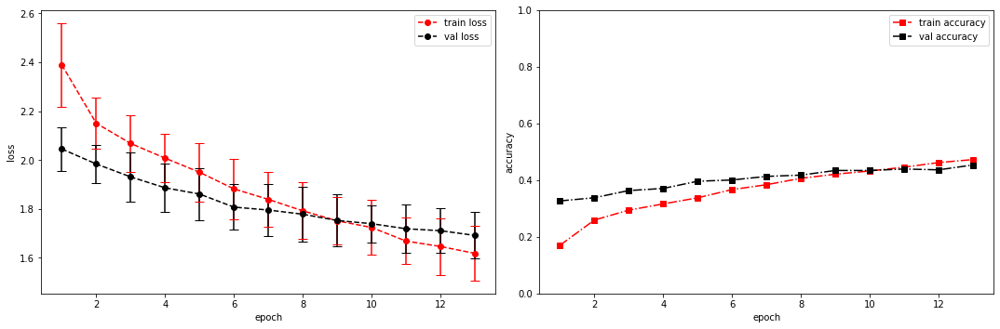

model saved


training epoch:  13
model set to train
Epoch [14/100], step [1/84],  Loss: 1.5943 +/- 0.0000,  accuracy: 0.02734375, time elapsed = 0.329970121383667s
Epoch [14/100], step [17/84],  Loss: 1.5760 +/- 0.0619,  accuracy: 0.4873046875, time elapsed = 0.9077413082122803s
Epoch [14/100], step [33/84],  Loss: 1.5839 +/- 0.0792,  accuracy: 0.482421875, time elapsed = 0.9287581443786621s
Epoch [14/100], step [49/84],  Loss: 1.5632 +/- 0.1116,  accuracy: 0.5107421875, time elapsed = 0.904545783996582s
Epoch [14/100], step [65/84],  Loss: 1.5524 +/- 0.1072,  accuracy: 0.5068359375, time elapsed = 0.8976342678070068s
Epoch [14/100], step [81/84],  Loss: 1.5599 +/- 0.1455,  accuracy: 0.494140625, time elapsed = 0.9221060276031494s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.49468581018086893,  precision = 0.49468581018086893 recall = 0.49468581018086893 f1 = 0.49468581018086893 ::: val: acc = 0.4481730052199851,  precision = 0.4481730052199851 recall = 0.4481730052199851 t

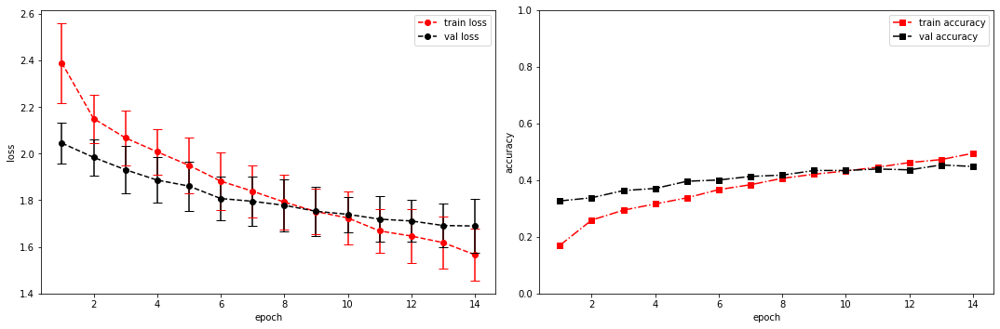

model saved


training epoch:  14
model set to train
Epoch [15/100], step [1/84],  Loss: 1.3763 +/- 0.0000,  accuracy: 0.0361328125, time elapsed = 0.32682371139526367s
Epoch [15/100], step [17/84],  Loss: 1.5362 +/- 0.1624,  accuracy: 0.5107421875, time elapsed = 0.9287848472595215s
Epoch [15/100], step [33/84],  Loss: 1.5353 +/- 0.1099,  accuracy: 0.5087890625, time elapsed = 0.9092836380004883s
Epoch [15/100], step [49/84],  Loss: 1.5086 +/- 0.1184,  accuracy: 0.50390625, time elapsed = 0.9133079051971436s
Epoch [15/100], step [65/84],  Loss: 1.5275 +/- 0.1040,  accuracy: 0.51171875, time elapsed = 0.9642729759216309s
Epoch [15/100], step [81/84],  Loss: 1.5658 +/- 0.1168,  accuracy: 0.4853515625, time elapsed = 0.9118807315826416s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5056871154204736,  precision = 0.5056871154204736 recall = 0.5056871154204736 f1 = 0.5056871154204736 ::: val: acc = 0.453392990305742,  precision = 0.453392990305742 recall = 0.453392990305742 time 

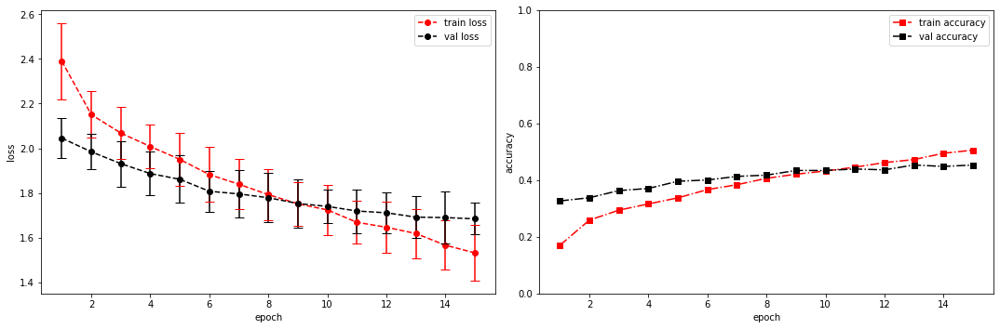

model saved


training epoch:  15
model set to train
Epoch [16/100], step [1/84],  Loss: 1.5771 +/- 0.0000,  accuracy: 0.03125, time elapsed = 0.36699891090393066s
Epoch [16/100], step [17/84],  Loss: 1.5269 +/- 0.1188,  accuracy: 0.4931640625, time elapsed = 0.9156222343444824s
Epoch [16/100], step [33/84],  Loss: 1.5302 +/- 0.1105,  accuracy: 0.486328125, time elapsed = 0.9001059532165527s
Epoch [16/100], step [49/84],  Loss: 1.5275 +/- 0.0880,  accuracy: 0.5009765625, time elapsed = 0.9222133159637451s
Epoch [16/100], step [65/84],  Loss: 1.4349 +/- 0.1264,  accuracy: 0.541015625, time elapsed = 0.9054450988769531s
Epoch [16/100], step [81/84],  Loss: 1.5197 +/- 0.0865,  accuracy: 0.5087890625, time elapsed = 0.8967037200927734s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5082975946298713,  precision = 0.5082975946298713 recall = 0.5082975946298713 f1 = 0.5082975946298713 ::: val: acc = 0.453392990305742,  precision = 0.453392990305742 recall = 0.453392990305742 time ela

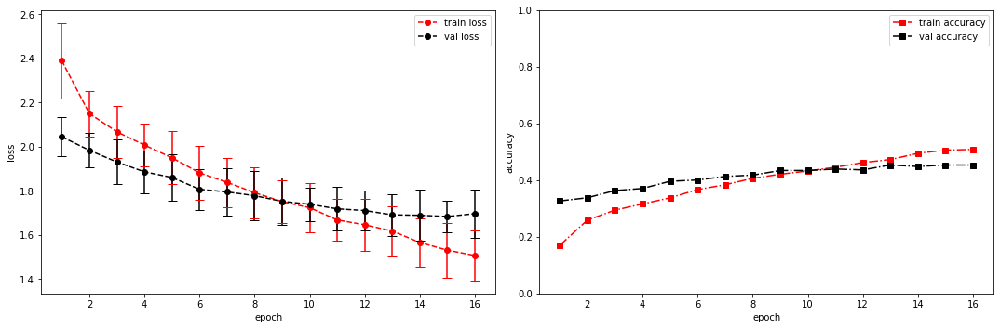

model saved


training epoch:  16
model set to train
Epoch [17/100], step [1/84],  Loss: 1.4049 +/- 0.0000,  accuracy: 0.0361328125, time elapsed = 0.3630707263946533s
Epoch [17/100], step [17/84],  Loss: 1.4436 +/- 0.1302,  accuracy: 0.533203125, time elapsed = 0.9106934070587158s
Epoch [17/100], step [33/84],  Loss: 1.4232 +/- 0.0934,  accuracy: 0.5302734375, time elapsed = 0.9169576168060303s
Epoch [17/100], step [49/84],  Loss: 1.4211 +/- 0.1087,  accuracy: 0.5361328125, time elapsed = 0.9037384986877441s
Epoch [17/100], step [65/84],  Loss: 1.4739 +/- 0.0824,  accuracy: 0.5302734375, time elapsed = 0.914823055267334s
Epoch [17/100], step [81/84],  Loss: 1.4845 +/- 0.1133,  accuracy: 0.529296875, time elapsed = 0.907867431640625s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5314189819131083,  precision = 0.5314189819131083 recall = 0.5314189819131083 f1 = 0.5314189819131083 ::: val: acc = 0.4615958240119314,  precision = 0.4615958240119314 recall = 0.4615958240119314 tim

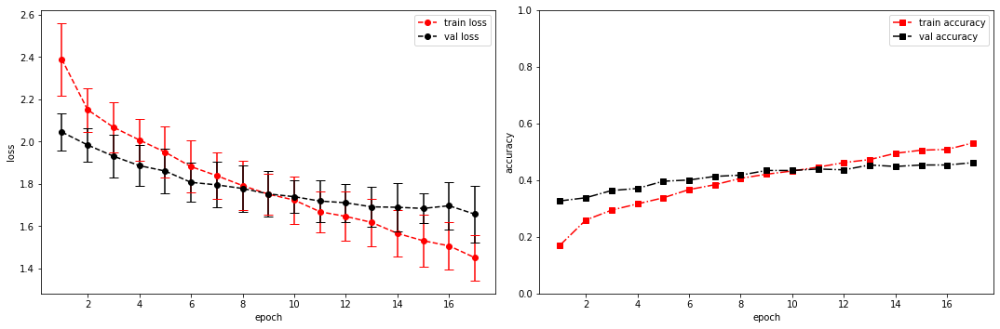

model saved


training epoch:  17
model set to train
Epoch [18/100], step [1/84],  Loss: 1.3620 +/- 0.0000,  accuracy: 0.0341796875, time elapsed = 0.3485133647918701s
Epoch [18/100], step [17/84],  Loss: 1.4113 +/- 0.1229,  accuracy: 0.5537109375, time elapsed = 0.9425244331359863s
Epoch [18/100], step [33/84],  Loss: 1.4353 +/- 0.1266,  accuracy: 0.5283203125, time elapsed = 0.923229455947876s
Epoch [18/100], step [49/84],  Loss: 1.4646 +/- 0.1102,  accuracy: 0.5185546875, time elapsed = 0.914539098739624s
Epoch [18/100], step [65/84],  Loss: 1.4072 +/- 0.1581,  accuracy: 0.5498046875, time elapsed = 0.9128518104553223s
Epoch [18/100], step [81/84],  Loss: 1.3534 +/- 0.1252,  accuracy: 0.583984375, time elapsed = 0.9133946895599365s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5448443035614395,  precision = 0.5448443035614395 recall = 0.5448443035614395 f1 = 0.5448443035614395 ::: val: acc = 0.4690529455630127,  precision = 0.4690529455630127 recall = 0.4690529455630127 ti

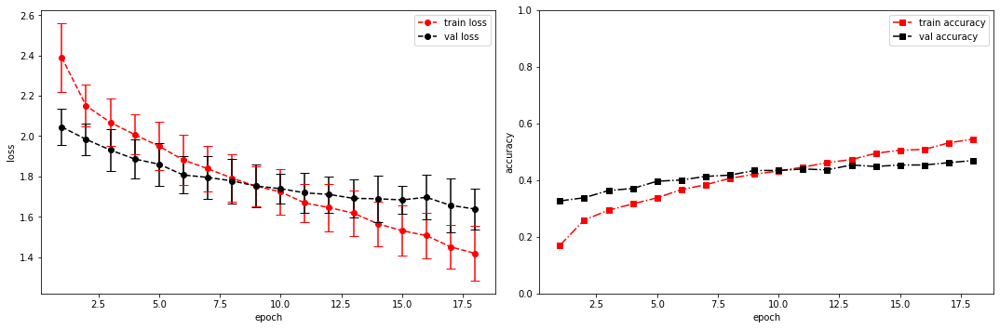

model saved


training epoch:  18
model set to train
Epoch [19/100], step [1/84],  Loss: 1.3795 +/- 0.0000,  accuracy: 0.03515625, time elapsed = 0.3439953327178955s
Epoch [19/100], step [17/84],  Loss: 1.3744 +/- 0.1206,  accuracy: 0.568359375, time elapsed = 0.8951625823974609s
Epoch [19/100], step [33/84],  Loss: 1.3745 +/- 0.1199,  accuracy: 0.5693359375, time elapsed = 0.9021871089935303s
Epoch [19/100], step [49/84],  Loss: 1.3498 +/- 0.1238,  accuracy: 0.5673828125, time elapsed = 0.9102323055267334s
Epoch [19/100], step [65/84],  Loss: 1.3838 +/- 0.1211,  accuracy: 0.5546875, time elapsed = 0.914600133895874s
Epoch [19/100], step [81/84],  Loss: 1.3566 +/- 0.0940,  accuracy: 0.5625, time elapsed = 0.9176993370056152s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5621853440238672,  precision = 0.5621853440238672 recall = 0.5621853440238672 f1 = 0.5621853440238672 ::: val: acc = 0.47054436987322895,  precision = 0.47054436987322895 recall = 0.47054436987322895 time elap

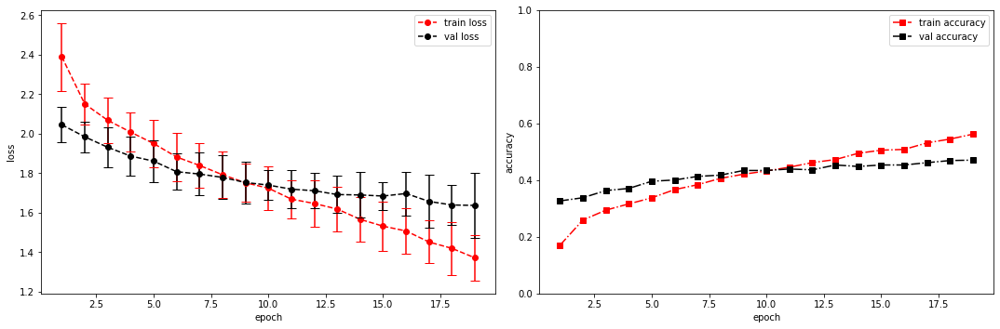

model saved


training epoch:  19
model set to train
Epoch [20/100], step [1/84],  Loss: 1.2909 +/- 0.0000,  accuracy: 0.041015625, time elapsed = 0.3447916507720947s
Epoch [20/100], step [17/84],  Loss: 1.3238 +/- 0.0909,  accuracy: 0.572265625, time elapsed = 0.9134767055511475s
Epoch [20/100], step [33/84],  Loss: 1.3176 +/- 0.1288,  accuracy: 0.5986328125, time elapsed = 0.9149107933044434s
Epoch [20/100], step [49/84],  Loss: 1.3342 +/- 0.0923,  accuracy: 0.5810546875, time elapsed = 0.9157915115356445s
Epoch [20/100], step [65/84],  Loss: 1.3841 +/- 0.1189,  accuracy: 0.5458984375, time elapsed = 0.903003454208374s
Epoch [20/100], step [81/84],  Loss: 1.3383 +/- 0.1026,  accuracy: 0.57421875, time elapsed = 0.9126167297363281s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.577475293678911,  precision = 0.577475293678911 recall = 0.577475293678911 f1 = 0.577475293678911 ::: val: acc = 0.47129008202833705,  precision = 0.47129008202833705 recall = 0.47129008202833705 time 

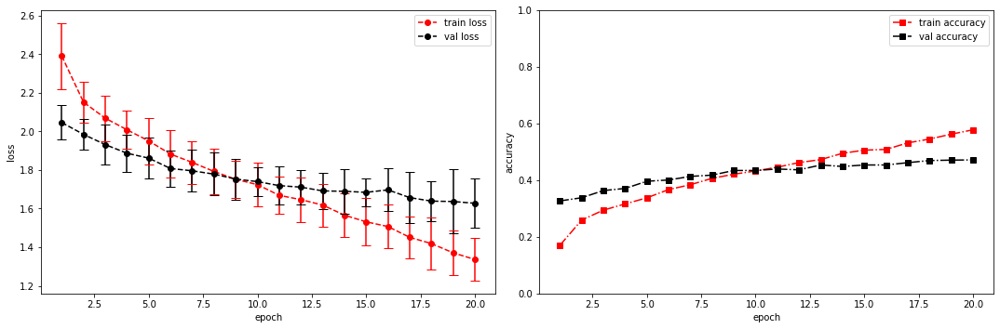

model saved
stopping early
Conv_3_layer
(1, 13, 517)
running model: id = Conv_3_layer, channels = [32, 64, 128]
device:  cuda
dataset metadata:  {'n_fft': 2048, 'hop_length': 256, 'n_mfcc': 13, 'notes': 'optional notes not passed'}
train model: data loaders initialized
sample shape =  (1, 13, 517)
model loaded
Layer (type:depth-idx)                   Output Shape              Param #
├─ConvBlock: 1-1                         [-1, 32, 13, 104]         --
|    └─Sequential: 2-1                   [-1, 32, 13, 104]         --
|    |    └─Conv2d: 3-1                  [-1, 32, 13, 517]         320
|    |    └─ReLU: 3-2                    [-1, 32, 13, 517]         --
|    |    └─MaxPool2d: 3-3               [-1, 32, 13, 104]         --
|    |    └─BatchNorm2d: 3-4             [-1, 32, 13, 104]         64
├─ConvBlock: 1-2                         [-1, 64, 13, 21]          --
|    └─Sequential: 2-2                   [-1, 64, 13, 21]          --
|    |    └─Conv2d: 3-5                  [-1, 64, 13

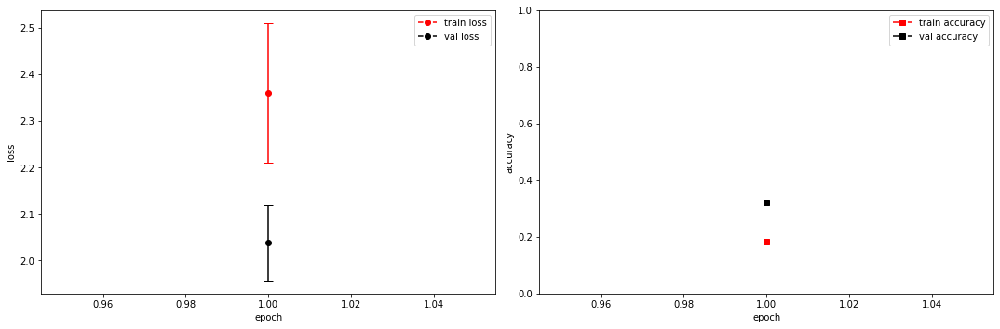

model saved


training epoch:  1
model set to train
Epoch [2/100], step [1/84],  Loss: 1.9807 +/- 0.0000,  accuracy: 0.0205078125, time elapsed = 0.3548011779785156s
Epoch [2/100], step [17/84],  Loss: 2.2108 +/- 0.0991,  accuracy: 0.23046875, time elapsed = 0.9300901889801025s
Epoch [2/100], step [33/84],  Loss: 2.1641 +/- 0.0846,  accuracy: 0.259765625, time elapsed = 0.9217915534973145s
Epoch [2/100], step [49/84],  Loss: 2.1469 +/- 0.0520,  accuracy: 0.2666015625, time elapsed = 0.9265439510345459s
Epoch [2/100], step [65/84],  Loss: 2.1203 +/- 0.1050,  accuracy: 0.259765625, time elapsed = 0.9184150695800781s
Epoch [2/100], step [81/84],  Loss: 2.1048 +/- 0.0777,  accuracy: 0.271484375, time elapsed = 0.9171886444091797s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.2604885325377587,  precision = 0.2604885325377587 recall = 0.2604885325377587 f1 = 0.2604885325377587 ::: val: acc = 0.343027591349739,  precision = 0.343027591349739 recall = 0.343027591349739 time elapsed =

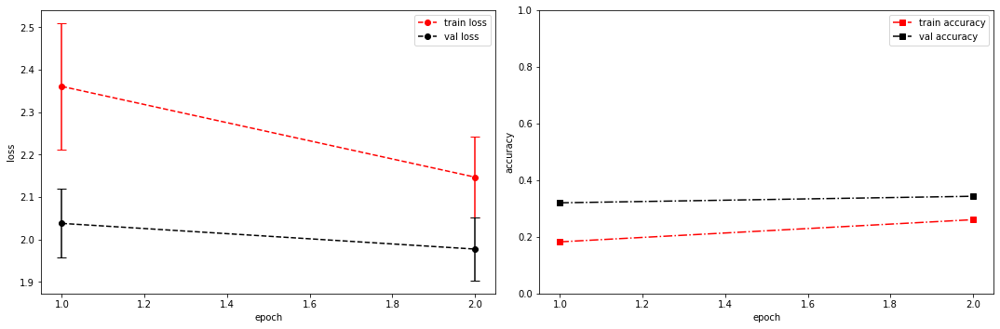

model saved


training epoch:  2
model set to train
Epoch [3/100], step [1/84],  Loss: 2.0853 +/- 0.0000,  accuracy: 0.0185546875, time elapsed = 0.3341529369354248s
Epoch [3/100], step [17/84],  Loss: 2.1012 +/- 0.0823,  accuracy: 0.2705078125, time elapsed = 0.9353694915771484s
Epoch [3/100], step [33/84],  Loss: 2.0629 +/- 0.1135,  accuracy: 0.2958984375, time elapsed = 0.921375036239624s
Epoch [3/100], step [49/84],  Loss: 2.0699 +/- 0.1415,  accuracy: 0.2890625, time elapsed = 0.9546318054199219s
Epoch [3/100], step [65/84],  Loss: 2.0641 +/- 0.1010,  accuracy: 0.2919921875, time elapsed = 0.9615857601165771s
Epoch [3/100], step [81/84],  Loss: 2.0465 +/- 0.0828,  accuracy: 0.302734375, time elapsed = 0.9228622913360596s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.29050904344583256,  precision = 0.29050904344583256 recall = 0.29050904344583256 f1 = 0.29050904344583256 ::: val: acc = 0.3668903803131991,  precision = 0.3668903803131991 recall = 0.3668903803131991 time el

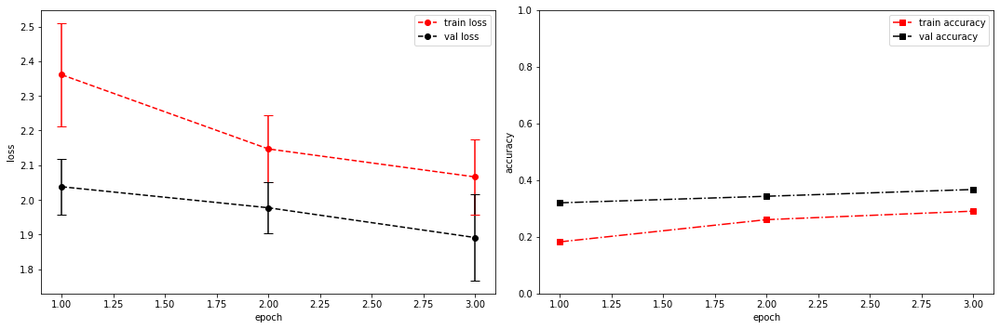

model saved


training epoch:  3
model set to train
Epoch [4/100], step [1/84],  Loss: 2.0053 +/- 0.0000,  accuracy: 0.01953125, time elapsed = 0.3377714157104492s
Epoch [4/100], step [17/84],  Loss: 1.9579 +/- 0.1020,  accuracy: 0.3525390625, time elapsed = 0.9266648292541504s
Epoch [4/100], step [33/84],  Loss: 1.9926 +/- 0.1215,  accuracy: 0.330078125, time elapsed = 0.9253032207489014s
Epoch [4/100], step [49/84],  Loss: 1.9950 +/- 0.0504,  accuracy: 0.3037109375, time elapsed = 0.949101448059082s
Epoch [4/100], step [65/84],  Loss: 1.9592 +/- 0.1011,  accuracy: 0.3388671875, time elapsed = 0.9340240955352783s
Epoch [4/100], step [81/84],  Loss: 1.9880 +/- 0.0870,  accuracy: 0.3359375, time elapsed = 0.9220542907714844s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3326496363975387,  precision = 0.3326496363975387 recall = 0.3326496363975387 f1 = 0.3326496363975387 ::: val: acc = 0.3825503355704698,  precision = 0.3825503355704698 recall = 0.3825503355704698 time elapsed 

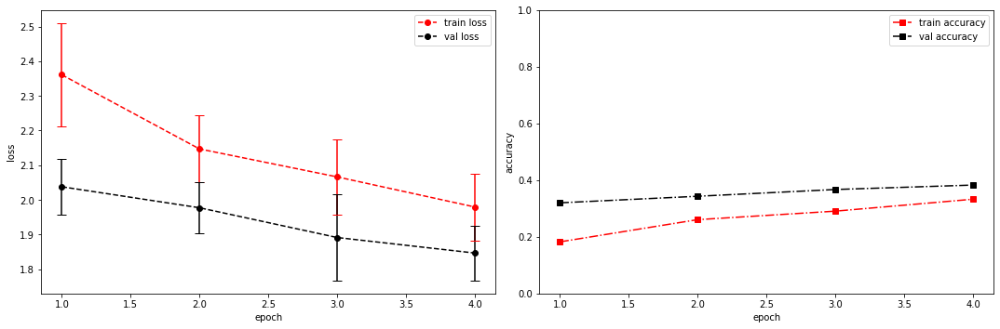

model saved


training epoch:  4
model set to train
Epoch [5/100], step [1/84],  Loss: 2.0508 +/- 0.0000,  accuracy: 0.0224609375, time elapsed = 0.3399202823638916s
Epoch [5/100], step [17/84],  Loss: 1.9250 +/- 0.0943,  accuracy: 0.3525390625, time elapsed = 0.9131894111633301s
Epoch [5/100], step [33/84],  Loss: 1.8877 +/- 0.0694,  accuracy: 0.345703125, time elapsed = 0.9239540100097656s
Epoch [5/100], step [49/84],  Loss: 1.9495 +/- 0.1326,  accuracy: 0.3544921875, time elapsed = 0.9103884696960449s
Epoch [5/100], step [65/84],  Loss: 1.9295 +/- 0.1148,  accuracy: 0.3515625, time elapsed = 0.9166052341461182s
Epoch [5/100], step [81/84],  Loss: 1.9225 +/- 0.0951,  accuracy: 0.34765625, time elapsed = 0.9016363620758057s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.34868543725526757,  precision = 0.34868543725526757 recall = 0.34868543725526757 f1 = 0.34868543725526757 ::: val: acc = 0.4153616703952274,  precision = 0.4153616703952274 recall = 0.4153616703952274 time ela

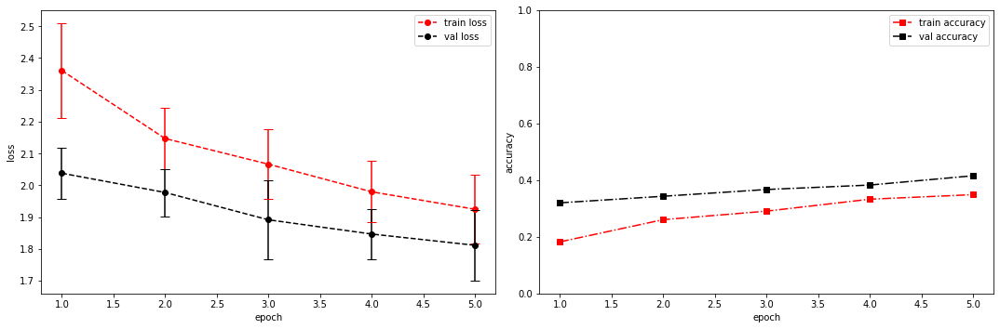

model saved


training epoch:  5
model set to train
Epoch [6/100], step [1/84],  Loss: 1.8272 +/- 0.0000,  accuracy: 0.0224609375, time elapsed = 0.3459739685058594s
Epoch [6/100], step [17/84],  Loss: 1.8760 +/- 0.1134,  accuracy: 0.3935546875, time elapsed = 0.9217677116394043s
Epoch [6/100], step [33/84],  Loss: 1.8680 +/- 0.0726,  accuracy: 0.380859375, time elapsed = 0.9132013320922852s
Epoch [6/100], step [49/84],  Loss: 1.9132 +/- 0.1173,  accuracy: 0.349609375, time elapsed = 0.9118702411651611s
Epoch [6/100], step [65/84],  Loss: 1.9174 +/- 0.0752,  accuracy: 0.37109375, time elapsed = 0.9107151031494141s
Epoch [6/100], step [81/84],  Loss: 1.8720 +/- 0.1075,  accuracy: 0.3671875, time elapsed = 0.9665017127990723s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.374230840947231,  precision = 0.374230840947231 recall = 0.374230840947231 f1 = 0.3742308409472311 ::: val: acc = 0.4332587621178225,  precision = 0.4332587621178225 recall = 0.4332587621178225 time elapsed = 6

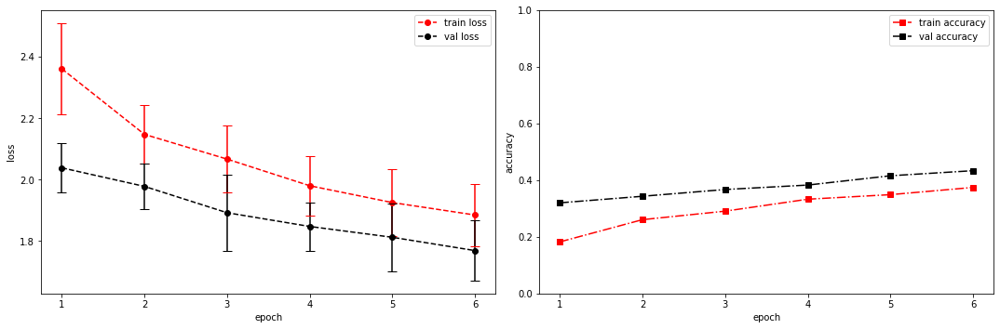

model saved


training epoch:  6
model set to train
Epoch [7/100], step [1/84],  Loss: 1.7933 +/- 0.0000,  accuracy: 0.0224609375, time elapsed = 0.33794260025024414s
Epoch [7/100], step [17/84],  Loss: 1.8317 +/- 0.0999,  accuracy: 0.3779296875, time elapsed = 0.9054677486419678s
Epoch [7/100], step [33/84],  Loss: 1.8072 +/- 0.1133,  accuracy: 0.3896484375, time elapsed = 0.9284627437591553s
Epoch [7/100], step [49/84],  Loss: 1.8432 +/- 0.1288,  accuracy: 0.390625, time elapsed = 0.950251579284668s
Epoch [7/100], step [65/84],  Loss: 1.7703 +/- 0.0877,  accuracy: 0.427734375, time elapsed = 0.9444677829742432s
Epoch [7/100], step [81/84],  Loss: 1.8272 +/- 0.1490,  accuracy: 0.3984375, time elapsed = 0.8971712589263916s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3958605258250979,  precision = 0.3958605258250979 recall = 0.3958605258250979 f1 = 0.3958605258250979 ::: val: acc = 0.44220730797912006,  precision = 0.44220730797912006 recall = 0.44220730797912006 time elapse

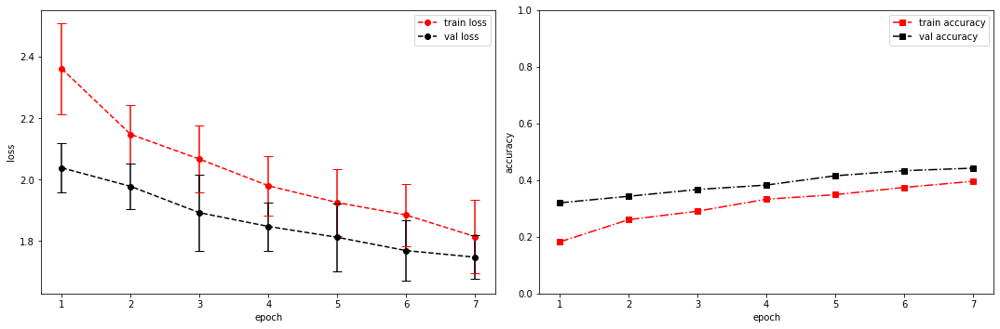

model saved


training epoch:  7
model set to train
Epoch [8/100], step [1/84],  Loss: 1.6071 +/- 0.0000,  accuracy: 0.029296875, time elapsed = 0.3397514820098877s
Epoch [8/100], step [17/84],  Loss: 1.7691 +/- 0.0756,  accuracy: 0.41015625, time elapsed = 0.906059741973877s
Epoch [8/100], step [33/84],  Loss: 1.7798 +/- 0.1119,  accuracy: 0.4111328125, time elapsed = 0.9338781833648682s
Epoch [8/100], step [49/84],  Loss: 1.7675 +/- 0.0976,  accuracy: 0.3935546875, time elapsed = 0.9022502899169922s
Epoch [8/100], step [65/84],  Loss: 1.7696 +/- 0.1086,  accuracy: 0.4033203125, time elapsed = 0.9153361320495605s
Epoch [8/100], step [81/84],  Loss: 1.7405 +/- 0.1190,  accuracy: 0.4267578125, time elapsed = 0.9103231430053711s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4100316986761141,  precision = 0.4100316986761141 recall = 0.4100316986761141 f1 = 0.4100316986761141 ::: val: acc = 0.45563012677106635,  precision = 0.45563012677106635 recall = 0.45563012677106635 time el

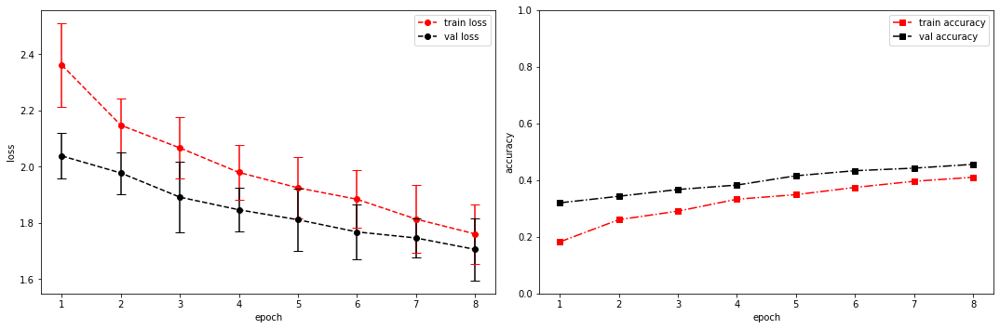

model saved


training epoch:  8
model set to train
Epoch [9/100], step [1/84],  Loss: 1.6232 +/- 0.0000,  accuracy: 0.0302734375, time elapsed = 0.352463960647583s
Epoch [9/100], step [17/84],  Loss: 1.6869 +/- 0.0929,  accuracy: 0.4462890625, time elapsed = 0.9557087421417236s
Epoch [9/100], step [33/84],  Loss: 1.7189 +/- 0.1049,  accuracy: 0.4306640625, time elapsed = 0.9131760597229004s
Epoch [9/100], step [49/84],  Loss: 1.6578 +/- 0.1327,  accuracy: 0.453125, time elapsed = 0.9299921989440918s
Epoch [9/100], step [65/84],  Loss: 1.7319 +/- 0.1003,  accuracy: 0.4189453125, time elapsed = 0.9279282093048096s
Epoch [9/100], step [81/84],  Loss: 1.7826 +/- 0.0984,  accuracy: 0.4013671875, time elapsed = 0.9332578182220459s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4327801603580086,  precision = 0.4327801603580086 recall = 0.4327801603580086 f1 = 0.4327801603580086 ::: val: acc = 0.46607009694258017,  precision = 0.46607009694258017 recall = 0.46607009694258017 time ela

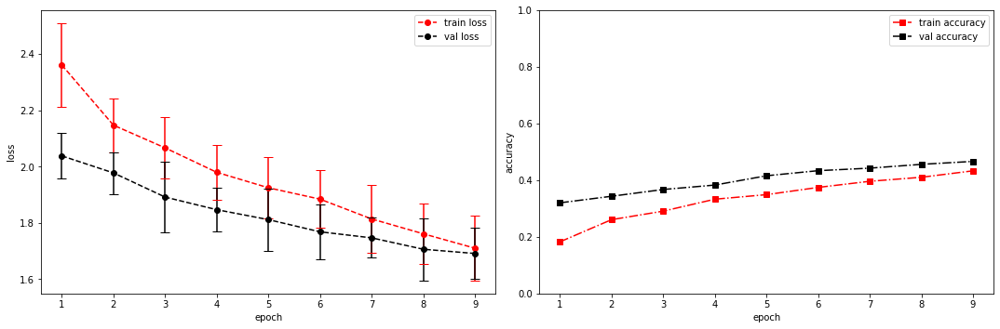

model saved


training epoch:  9
model set to train
Epoch [10/100], step [1/84],  Loss: 1.7424 +/- 0.0000,  accuracy: 0.0263671875, time elapsed = 0.346325159072876s
Epoch [10/100], step [17/84],  Loss: 1.6392 +/- 0.1030,  accuracy: 0.4638671875, time elapsed = 0.9424407482147217s
Epoch [10/100], step [33/84],  Loss: 1.6670 +/- 0.1245,  accuracy: 0.4404296875, time elapsed = 0.9186515808105469s
Epoch [10/100], step [49/84],  Loss: 1.6337 +/- 0.1215,  accuracy: 0.4658203125, time elapsed = 0.9082515239715576s
Epoch [10/100], step [65/84],  Loss: 1.6399 +/- 0.1250,  accuracy: 0.46484375, time elapsed = 0.9093515872955322s
Epoch [10/100], step [81/84],  Loss: 1.6762 +/- 0.1020,  accuracy: 0.4619140625, time elapsed = 0.9161393642425537s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4607495804586985,  precision = 0.4607495804586985 recall = 0.4607495804586985 f1 = 0.4607495804586985 ::: val: acc = 0.4735272184936615,  precision = 0.4735272184936615 recall = 0.4735272184936615 tim

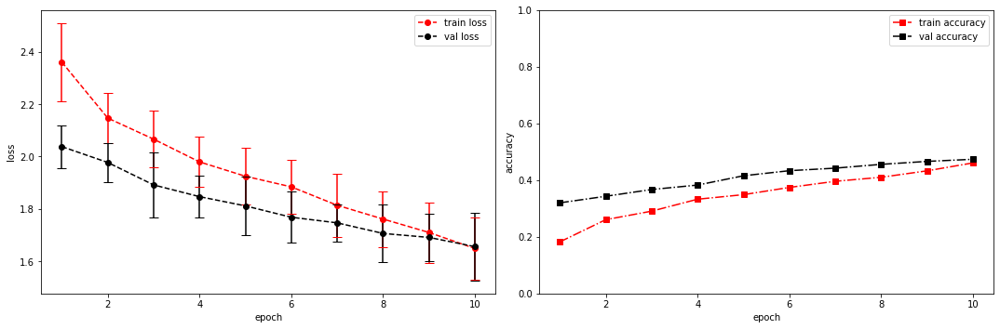

model saved


training epoch:  10
model set to train
Epoch [11/100], step [1/84],  Loss: 1.7217 +/- 0.0000,  accuracy: 0.0234375, time elapsed = 0.3317422866821289s
Epoch [11/100], step [17/84],  Loss: 1.5742 +/- 0.0919,  accuracy: 0.4853515625, time elapsed = 0.9299836158752441s
Epoch [11/100], step [33/84],  Loss: 1.5932 +/- 0.1067,  accuracy: 0.486328125, time elapsed = 0.9182698726654053s
Epoch [11/100], step [49/84],  Loss: 1.5956 +/- 0.1220,  accuracy: 0.4814453125, time elapsed = 0.9209270477294922s
Epoch [11/100], step [65/84],  Loss: 1.6187 +/- 0.1372,  accuracy: 0.4814453125, time elapsed = 0.9234201908111572s
Epoch [11/100], step [81/84],  Loss: 1.6617 +/- 0.1160,  accuracy: 0.4365234375, time elapsed = 0.9138624668121338s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4738019765056871,  precision = 0.4738019765056871 recall = 0.4738019765056871 f1 = 0.4738019765056871 ::: val: acc = 0.47874720357941836,  precision = 0.47874720357941836 recall = 0.47874720357941836 

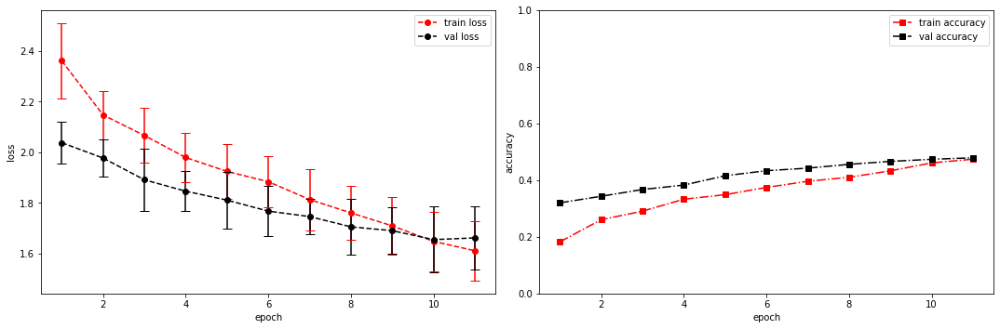

model saved


training epoch:  11
model set to train
Epoch [12/100], step [1/84],  Loss: 1.5480 +/- 0.0000,  accuracy: 0.0361328125, time elapsed = 0.34833455085754395s
Epoch [12/100], step [17/84],  Loss: 1.5565 +/- 0.0955,  accuracy: 0.4814453125, time elapsed = 0.9039716720581055s
Epoch [12/100], step [33/84],  Loss: 1.5202 +/- 0.1155,  accuracy: 0.509765625, time elapsed = 0.9041774272918701s
Epoch [12/100], step [49/84],  Loss: 1.5564 +/- 0.1290,  accuracy: 0.4931640625, time elapsed = 0.9380085468292236s
Epoch [12/100], step [65/84],  Loss: 1.5666 +/- 0.1238,  accuracy: 0.494140625, time elapsed = 0.9165256023406982s
Epoch [12/100], step [81/84],  Loss: 1.5217 +/- 0.1270,  accuracy: 0.5146484375, time elapsed = 0.8956496715545654s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5002796942010069,  precision = 0.5002796942010069 recall = 0.5002796942010069 f1 = 0.5002796942010069 ::: val: acc = 0.46830723340790453,  precision = 0.46830723340790453 recall = 0.468307233407904

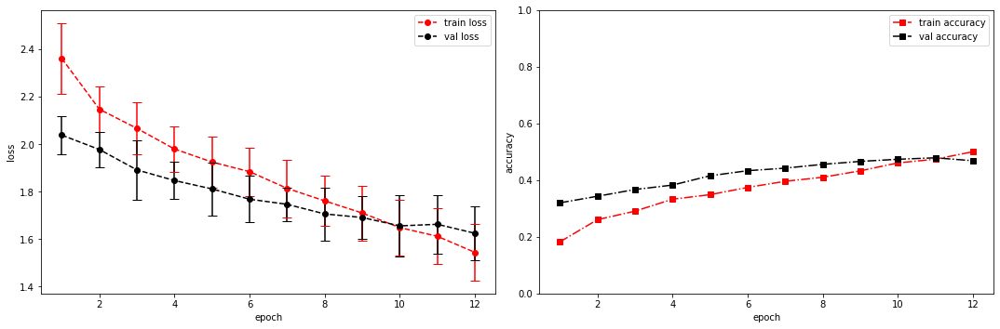

model saved


training epoch:  12
model set to train
Epoch [13/100], step [1/84],  Loss: 1.5597 +/- 0.0000,  accuracy: 0.033203125, time elapsed = 0.310213565826416s
Epoch [13/100], step [17/84],  Loss: 1.5272 +/- 0.1596,  accuracy: 0.4873046875, time elapsed = 0.9708926677703857s
Epoch [13/100], step [33/84],  Loss: 1.4850 +/- 0.0920,  accuracy: 0.5322265625, time elapsed = 0.9144423007965088s
Epoch [13/100], step [49/84],  Loss: 1.4934 +/- 0.0866,  accuracy: 0.5380859375, time elapsed = 0.9027342796325684s
Epoch [13/100], step [65/84],  Loss: 1.4789 +/- 0.1052,  accuracy: 0.515625, time elapsed = 0.9024670124053955s
Epoch [13/100], step [81/84],  Loss: 1.4852 +/- 0.0856,  accuracy: 0.5283203125, time elapsed = 0.9095878601074219s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.522095841879545,  precision = 0.522095841879545 recall = 0.522095841879545 f1 = 0.522095841879545 ::: val: acc = 0.49217002237136465,  precision = 0.49217002237136465 recall = 0.49217002237136465 time e

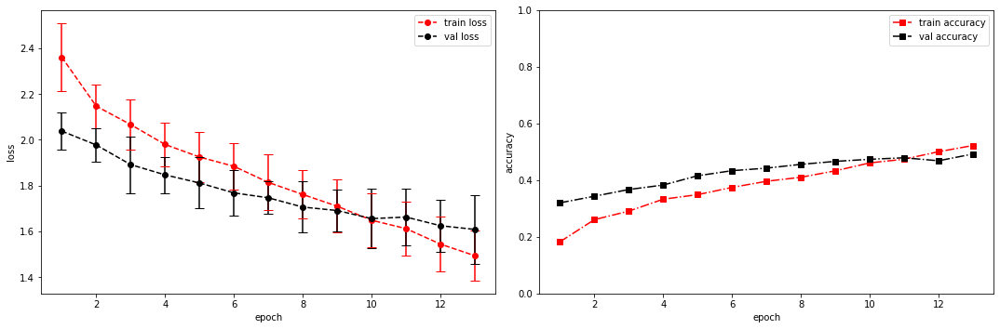

model saved


training epoch:  13
model set to train
Epoch [14/100], step [1/84],  Loss: 1.5344 +/- 0.0000,  accuracy: 0.0302734375, time elapsed = 0.3331122398376465s
Epoch [14/100], step [17/84],  Loss: 1.4162 +/- 0.0963,  accuracy: 0.5361328125, time elapsed = 1.0124261379241943s
Epoch [14/100], step [33/84],  Loss: 1.4366 +/- 0.0801,  accuracy: 0.556640625, time elapsed = 0.9342842102050781s
Epoch [14/100], step [49/84],  Loss: 1.4310 +/- 0.1159,  accuracy: 0.548828125, time elapsed = 0.9167380332946777s
Epoch [14/100], step [65/84],  Loss: 1.4378 +/- 0.1021,  accuracy: 0.5419921875, time elapsed = 0.9282248020172119s
Epoch [14/100], step [81/84],  Loss: 1.4271 +/- 0.1153,  accuracy: 0.5400390625, time elapsed = 0.9194774627685547s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5424202871527131,  precision = 0.5424202871527131 recall = 0.5424202871527131 f1 = 0.5424202871527131 ::: val: acc = 0.49217002237136465,  precision = 0.49217002237136465 recall = 0.4921700223713646

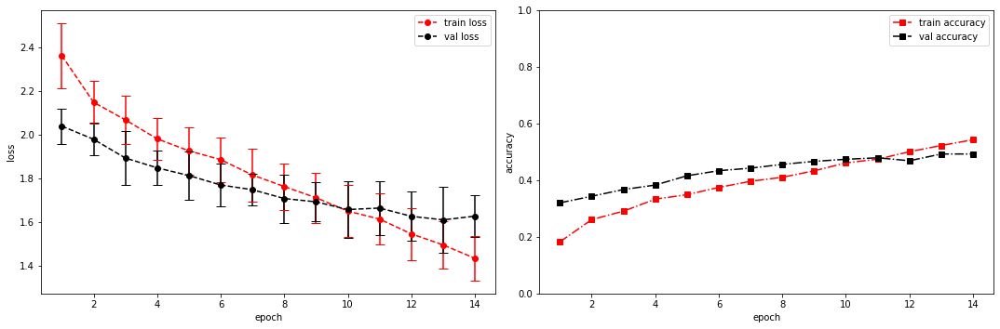

model saved


training epoch:  14
model set to train
Epoch [15/100], step [1/84],  Loss: 1.4950 +/- 0.0000,  accuracy: 0.033203125, time elapsed = 0.36116838455200195s
Epoch [15/100], step [17/84],  Loss: 1.3890 +/- 0.0980,  accuracy: 0.55859375, time elapsed = 0.9424357414245605s
Epoch [15/100], step [33/84],  Loss: 1.3513 +/- 0.0934,  accuracy: 0.5859375, time elapsed = 0.9253907203674316s
Epoch [15/100], step [49/84],  Loss: 1.3228 +/- 0.1007,  accuracy: 0.595703125, time elapsed = 0.9161825180053711s
Epoch [15/100], step [65/84],  Loss: 1.3924 +/- 0.1022,  accuracy: 0.5517578125, time elapsed = 0.9150779247283936s
Epoch [15/100], step [81/84],  Loss: 1.4129 +/- 0.0891,  accuracy: 0.5673828125, time elapsed = 0.8903825283050537s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5694573932500466,  precision = 0.5694573932500466 recall = 0.5694573932500466 f1 = 0.5694573932500466 ::: val: acc = 0.47874720357941836,  precision = 0.47874720357941836 recall = 0.47874720357941836 ti

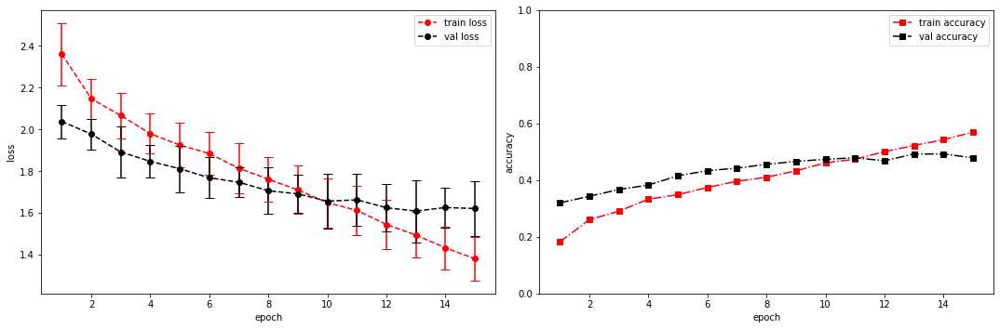

model saved


training epoch:  15
model set to train
Epoch [16/100], step [1/84],  Loss: 1.2243 +/- 0.0000,  accuracy: 0.04296875, time elapsed = 0.3494527339935303s
Epoch [16/100], step [17/84],  Loss: 1.3301 +/- 0.0773,  accuracy: 0.583984375, time elapsed = 0.9109091758728027s
Epoch [16/100], step [33/84],  Loss: 1.3265 +/- 0.0937,  accuracy: 0.59765625, time elapsed = 0.9267008304595947s
Epoch [16/100], step [49/84],  Loss: 1.3490 +/- 0.1074,  accuracy: 0.5859375, time elapsed = 0.909494161605835s
Epoch [16/100], step [65/84],  Loss: 1.3060 +/- 0.1486,  accuracy: 0.6025390625, time elapsed = 0.9111177921295166s
Epoch [16/100], step [81/84],  Loss: 1.3407 +/- 0.1162,  accuracy: 0.5732421875, time elapsed = 0.9448144435882568s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5869848965131457,  precision = 0.5869848965131457 recall = 0.5869848965131457 f1 = 0.5869848965131457 ::: val: acc = 0.4638329604772558,  precision = 0.4638329604772558 recall = 0.4638329604772558 time ela

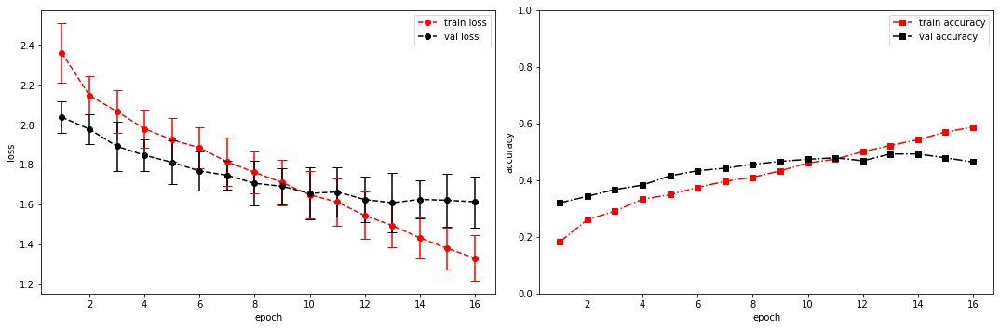

model saved


training epoch:  16
model set to train
Epoch [17/100], step [1/84],  Loss: 1.1936 +/- 0.0000,  accuracy: 0.0400390625, time elapsed = 0.3509097099304199s
Epoch [17/100], step [17/84],  Loss: 1.3009 +/- 0.1177,  accuracy: 0.607421875, time elapsed = 0.8970296382904053s
Epoch [17/100], step [33/84],  Loss: 1.3086 +/- 0.0946,  accuracy: 0.583984375, time elapsed = 0.934391975402832s
Epoch [17/100], step [49/84],  Loss: 1.3021 +/- 0.1194,  accuracy: 0.59375, time elapsed = 0.9311990737915039s
Epoch [17/100], step [65/84],  Loss: 1.2531 +/- 0.1139,  accuracy: 0.62890625, time elapsed = 0.9441826343536377s
Epoch [17/100], step [81/84],  Loss: 1.2643 +/- 0.1179,  accuracy: 0.595703125, time elapsed = 0.9096810817718506s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.6028342345702032,  precision = 0.6028342345702032 recall = 0.6028342345702032 f1 = 0.6028342345702032 ::: val: acc = 0.49515287099179717,  precision = 0.49515287099179717 recall = 0.49515287099179717 time el

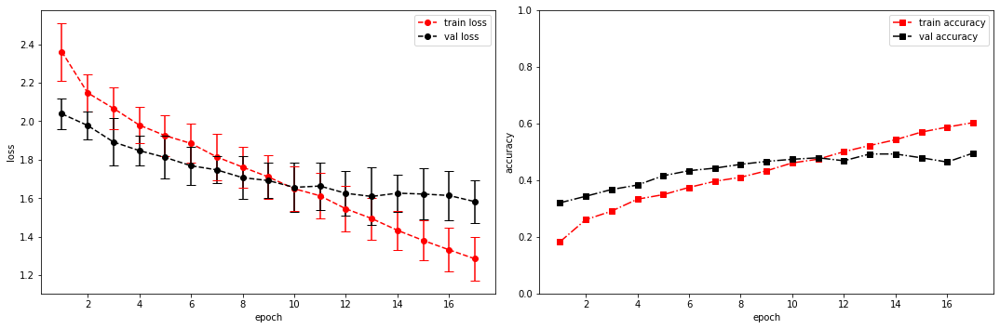

model saved
stopping early
Conv_3_layer
(1, 13, 517)
running model: id = Conv_3_layer, channels = [32, 128, 128]
device:  cuda
dataset metadata:  {'n_fft': 2048, 'hop_length': 256, 'n_mfcc': 13, 'notes': 'optional notes not passed'}
train model: data loaders initialized
sample shape =  (1, 13, 517)
model loaded
Layer (type:depth-idx)                   Output Shape              Param #
├─ConvBlock: 1-1                         [-1, 32, 13, 104]         --
|    └─Sequential: 2-1                   [-1, 32, 13, 104]         --
|    |    └─Conv2d: 3-1                  [-1, 32, 13, 517]         320
|    |    └─ReLU: 3-2                    [-1, 32, 13, 517]         --
|    |    └─MaxPool2d: 3-3               [-1, 32, 13, 104]         --
|    |    └─BatchNorm2d: 3-4             [-1, 32, 13, 104]         64
├─ConvBlock: 1-2                         [-1, 128, 13, 21]         --
|    └─Sequential: 2-2                   [-1, 128, 13, 21]         --
|    |    └─Conv2d: 3-5                  [-1, 128, 

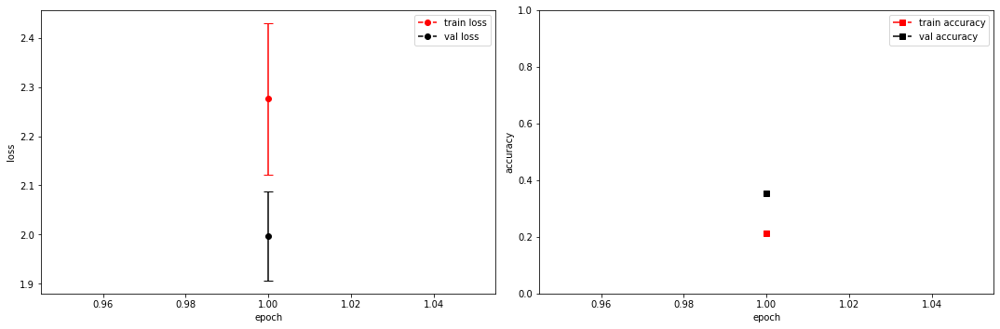

model saved


training epoch:  1
model set to train
Epoch [2/100], step [1/84],  Loss: 2.1828 +/- 0.0000,  accuracy: 0.013671875, time elapsed = 0.3201923370361328s
Epoch [2/100], step [17/84],  Loss: 2.1004 +/- 0.0995,  accuracy: 0.2783203125, time elapsed = 0.980039119720459s
Epoch [2/100], step [33/84],  Loss: 2.0929 +/- 0.1036,  accuracy: 0.2626953125, time elapsed = 0.9435691833496094s
Epoch [2/100], step [49/84],  Loss: 2.0998 +/- 0.1200,  accuracy: 0.29296875, time elapsed = 0.9466202259063721s
Epoch [2/100], step [65/84],  Loss: 2.1016 +/- 0.0867,  accuracy: 0.2939453125, time elapsed = 0.9290428161621094s
Epoch [2/100], step [81/84],  Loss: 2.0992 +/- 0.1271,  accuracy: 0.2890625, time elapsed = 0.9408698081970215s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.28286406861831065,  precision = 0.28286406861831065 recall = 0.28286406861831065 f1 = 0.28286406861831065 ::: val: acc = 0.38031319910514544,  precision = 0.38031319910514544 recall = 0.38031319910514544 time e

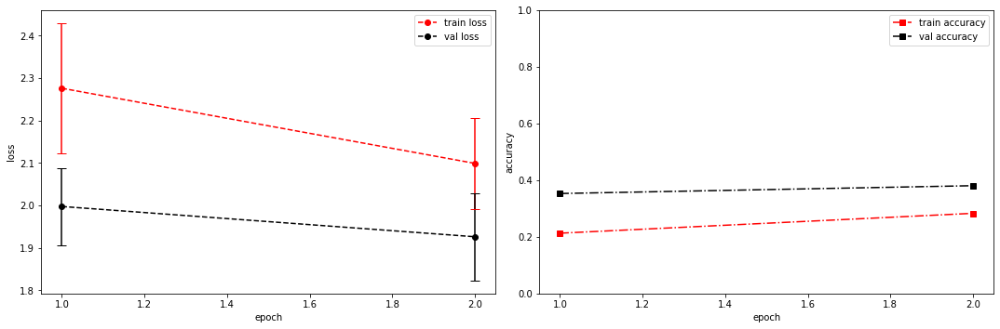

model saved


training epoch:  2
model set to train
Epoch [3/100], step [1/84],  Loss: 2.2318 +/- 0.0000,  accuracy: 0.0126953125, time elapsed = 0.36182141304016113s
Epoch [3/100], step [17/84],  Loss: 2.0433 +/- 0.1311,  accuracy: 0.3046875, time elapsed = 0.9100832939147949s
Epoch [3/100], step [33/84],  Loss: 2.0121 +/- 0.1242,  accuracy: 0.3095703125, time elapsed = 0.9819920063018799s
Epoch [3/100], step [49/84],  Loss: 2.0030 +/- 0.0863,  accuracy: 0.3232421875, time elapsed = 0.9255855083465576s
Epoch [3/100], step [65/84],  Loss: 1.9579 +/- 0.0778,  accuracy: 0.3408203125, time elapsed = 0.930988073348999s
Epoch [3/100], step [81/84],  Loss: 1.9404 +/- 0.0999,  accuracy: 0.3427734375, time elapsed = 0.9627881050109863s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.32239418236061906,  precision = 0.32239418236061906 recall = 0.32239418236061906 f1 = 0.32239418236061906 ::: val: acc = 0.39671886651752425,  precision = 0.39671886651752425 recall = 0.39671886651752425 ti

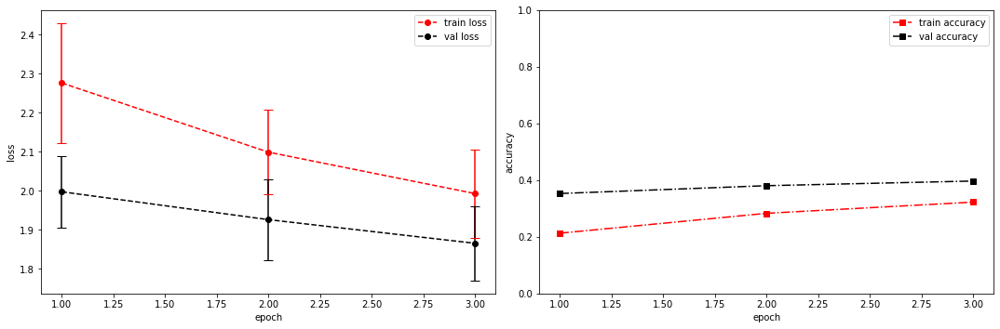

model saved


training epoch:  3
model set to train
Epoch [4/100], step [1/84],  Loss: 1.9718 +/- 0.0000,  accuracy: 0.021484375, time elapsed = 0.3460721969604492s
Epoch [4/100], step [17/84],  Loss: 1.9752 +/- 0.1471,  accuracy: 0.3251953125, time elapsed = 0.9243230819702148s
Epoch [4/100], step [33/84],  Loss: 1.9191 +/- 0.1328,  accuracy: 0.359375, time elapsed = 0.9273991584777832s
Epoch [4/100], step [49/84],  Loss: 1.8972 +/- 0.0929,  accuracy: 0.3740234375, time elapsed = 0.9139885902404785s
Epoch [4/100], step [65/84],  Loss: 1.9105 +/- 0.0767,  accuracy: 0.3642578125, time elapsed = 0.9155972003936768s
Epoch [4/100], step [81/84],  Loss: 1.8932 +/- 0.1587,  accuracy: 0.3544921875, time elapsed = 0.9371128082275391s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3552116352787619,  precision = 0.3552116352787619 recall = 0.3552116352787619 f1 = 0.3552116352787619 ::: val: acc = 0.41312453392990306,  precision = 0.41312453392990306 recall = 0.41312453392990306 time ela

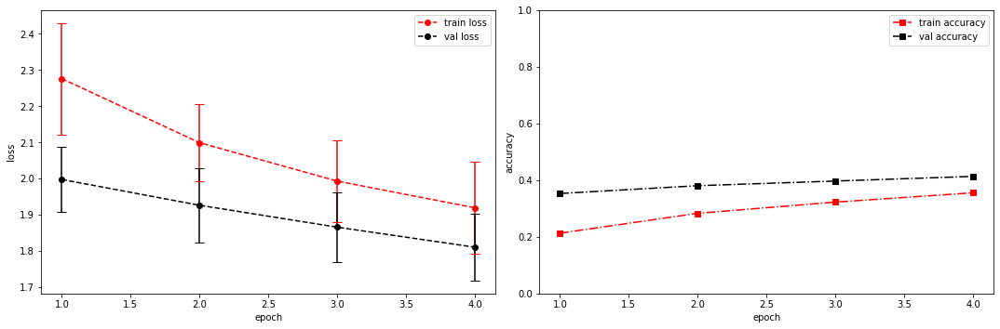

model saved


training epoch:  4
model set to train
Epoch [5/100], step [1/84],  Loss: 1.8035 +/- 0.0000,  accuracy: 0.021484375, time elapsed = 0.3438413143157959s
Epoch [5/100], step [17/84],  Loss: 1.8667 +/- 0.0889,  accuracy: 0.3720703125, time elapsed = 0.9333860874176025s
Epoch [5/100], step [33/84],  Loss: 1.8739 +/- 0.1207,  accuracy: 0.37109375, time elapsed = 0.9315774440765381s
Epoch [5/100], step [49/84],  Loss: 1.8420 +/- 0.1142,  accuracy: 0.388671875, time elapsed = 0.9347403049468994s
Epoch [5/100], step [65/84],  Loss: 1.8941 +/- 0.0655,  accuracy: 0.3505859375, time elapsed = 0.9188477993011475s
Epoch [5/100], step [81/84],  Loss: 1.7684 +/- 0.1480,  accuracy: 0.41015625, time elapsed = 0.9300870895385742s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.37796009696065636,  precision = 0.37796009696065636 recall = 0.37796009696065636 f1 = 0.37796009696065636 ::: val: acc = 0.4429530201342282,  precision = 0.4429530201342282 recall = 0.4429530201342282 time ela

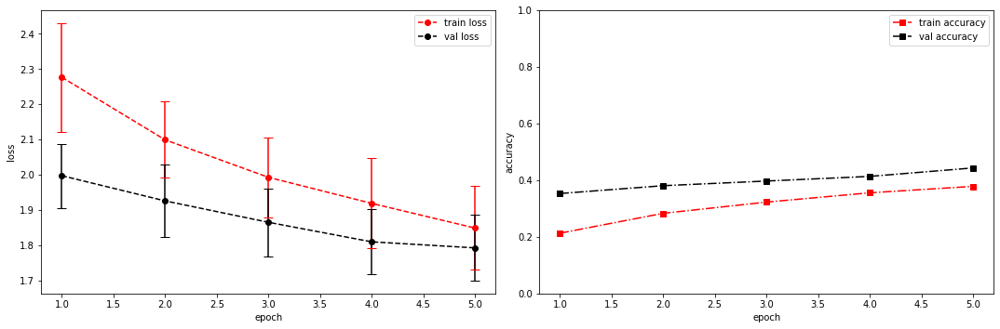

model saved


training epoch:  5
model set to train
Epoch [6/100], step [1/84],  Loss: 1.8488 +/- 0.0000,  accuracy: 0.021484375, time elapsed = 0.3420722484588623s
Epoch [6/100], step [17/84],  Loss: 1.7867 +/- 0.1306,  accuracy: 0.4150390625, time elapsed = 0.9575755596160889s
Epoch [6/100], step [33/84],  Loss: 1.8028 +/- 0.1227,  accuracy: 0.40234375, time elapsed = 0.9318599700927734s
Epoch [6/100], step [49/84],  Loss: 1.8283 +/- 0.0856,  accuracy: 0.3818359375, time elapsed = 0.929861307144165s
Epoch [6/100], step [65/84],  Loss: 1.7644 +/- 0.1069,  accuracy: 0.423828125, time elapsed = 0.9223122596740723s
Epoch [6/100], step [81/84],  Loss: 1.8228 +/- 0.0881,  accuracy: 0.4130859375, time elapsed = 0.9323422908782959s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.40704829386537383,  precision = 0.40704829386537383 recall = 0.40704829386537383 f1 = 0.4070482938653739 ::: val: acc = 0.42654735272184935,  precision = 0.42654735272184935 recall = 0.42654735272184935 time 

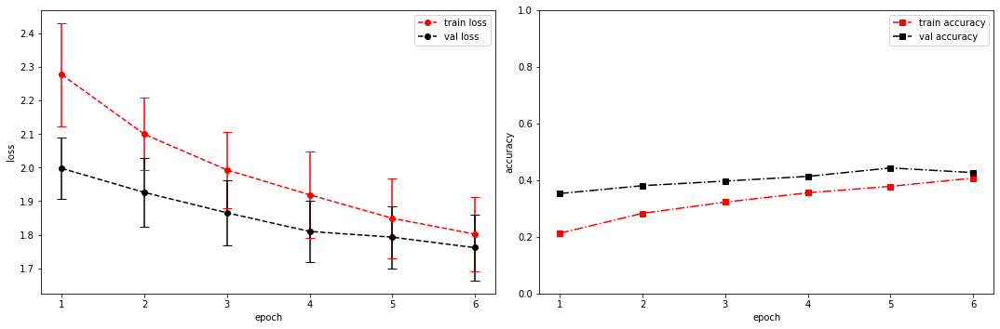

model saved


training epoch:  6
model set to train
Epoch [7/100], step [1/84],  Loss: 1.8903 +/- 0.0000,  accuracy: 0.025390625, time elapsed = 0.3506033420562744s
Epoch [7/100], step [17/84],  Loss: 1.7368 +/- 0.1083,  accuracy: 0.4248046875, time elapsed = 0.9359612464904785s
Epoch [7/100], step [33/84],  Loss: 1.8034 +/- 0.1167,  accuracy: 0.40625, time elapsed = 0.9165441989898682s
Epoch [7/100], step [49/84],  Loss: 1.6942 +/- 0.1114,  accuracy: 0.45703125, time elapsed = 0.9140865802764893s
Epoch [7/100], step [65/84],  Loss: 1.7373 +/- 0.0916,  accuracy: 0.419921875, time elapsed = 0.9431390762329102s
Epoch [7/100], step [81/84],  Loss: 1.7220 +/- 0.1397,  accuracy: 0.435546875, time elapsed = 0.9441533088684082s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4271862763378706,  precision = 0.4271862763378706 recall = 0.4271862763378706 f1 = 0.4271862763378706 ::: val: acc = 0.44742729306487694,  precision = 0.44742729306487694 recall = 0.44742729306487694 time elapsed 

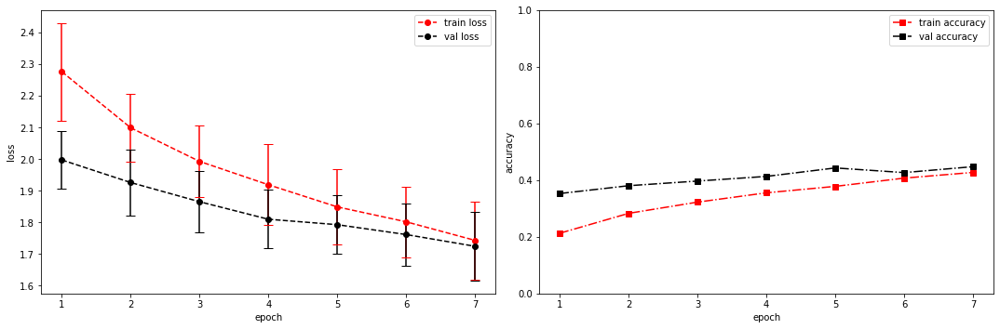

model saved


training epoch:  7
model set to train
Epoch [8/100], step [1/84],  Loss: 1.8320 +/- 0.0000,  accuracy: 0.0263671875, time elapsed = 0.39111852645874023s
Epoch [8/100], step [17/84],  Loss: 1.6551 +/- 0.1111,  accuracy: 0.4736328125, time elapsed = 0.9460890293121338s
Epoch [8/100], step [33/84],  Loss: 1.6116 +/- 0.1165,  accuracy: 0.4814453125, time elapsed = 0.9241082668304443s
Epoch [8/100], step [49/84],  Loss: 1.6469 +/- 0.1231,  accuracy: 0.4521484375, time elapsed = 0.9264798164367676s
Epoch [8/100], step [65/84],  Loss: 1.7690 +/- 0.1210,  accuracy: 0.41796875, time elapsed = 0.9268929958343506s
Epoch [8/100], step [81/84],  Loss: 1.7244 +/- 0.1209,  accuracy: 0.4130859375, time elapsed = 0.9371814727783203s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.44769718441170986,  precision = 0.44769718441170986 recall = 0.44769718441170986 f1 = 0.44769718441170986 ::: val: acc = 0.40939597315436244,  precision = 0.40939597315436244 recall = 0.40939597315436244 

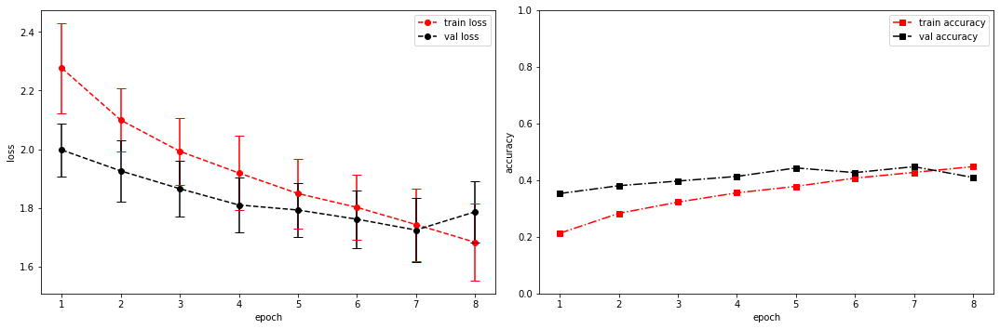

model saved


training epoch:  8
model set to train
Epoch [9/100], step [1/84],  Loss: 1.6003 +/- 0.0000,  accuracy: 0.0263671875, time elapsed = 0.3499577045440674s
Epoch [9/100], step [17/84],  Loss: 1.6882 +/- 0.1068,  accuracy: 0.419921875, time elapsed = 0.9424905776977539s
Epoch [9/100], step [33/84],  Loss: 1.6644 +/- 0.1374,  accuracy: 0.451171875, time elapsed = 0.9189789295196533s
Epoch [9/100], step [49/84],  Loss: 1.6421 +/- 0.1381,  accuracy: 0.466796875, time elapsed = 0.9213833808898926s
Epoch [9/100], step [65/84],  Loss: 1.6466 +/- 0.1191,  accuracy: 0.44921875, time elapsed = 0.9164435863494873s
Epoch [9/100], step [81/84],  Loss: 1.6159 +/- 0.1133,  accuracy: 0.4775390625, time elapsed = 0.9386434555053711s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.45161290322580644,  precision = 0.45161290322580644 recall = 0.45161290322580644 f1 = 0.45161290322580644 ::: val: acc = 0.4436987322893363,  precision = 0.4436987322893363 recall = 0.4436987322893363 time el

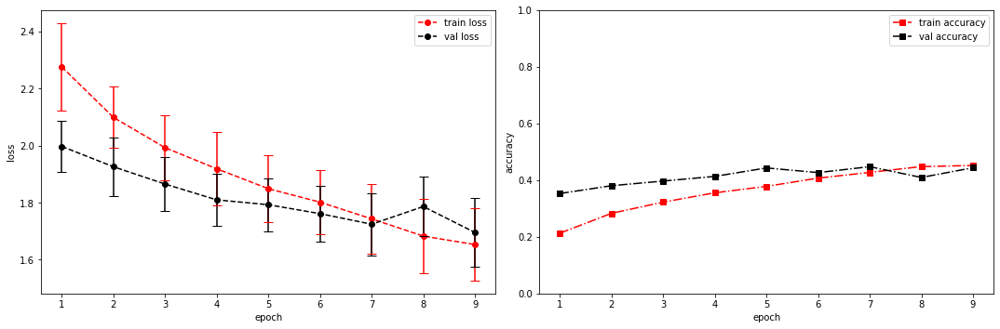

model saved


training epoch:  9
model set to train
Epoch [10/100], step [1/84],  Loss: 1.6558 +/- 0.0000,  accuracy: 0.033203125, time elapsed = 0.33376097679138184s
Epoch [10/100], step [17/84],  Loss: 1.6096 +/- 0.0988,  accuracy: 0.4755859375, time elapsed = 0.9668974876403809s
Epoch [10/100], step [33/84],  Loss: 1.6281 +/- 0.0976,  accuracy: 0.466796875, time elapsed = 1.0846970081329346s
Epoch [10/100], step [49/84],  Loss: 1.6100 +/- 0.0998,  accuracy: 0.4716796875, time elapsed = 0.9197335243225098s
Epoch [10/100], step [65/84],  Loss: 1.5589 +/- 0.1094,  accuracy: 0.5, time elapsed = 0.9152641296386719s
Epoch [10/100], step [81/84],  Loss: 1.6152 +/- 0.1229,  accuracy: 0.4736328125, time elapsed = 0.9496240615844727s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.47753123251911245,  precision = 0.47753123251911245 recall = 0.47753123251911245 f1 = 0.47753123251911245 ::: val: acc = 0.43847874720357943,  precision = 0.43847874720357943 recall = 0.43847874720357943 tim

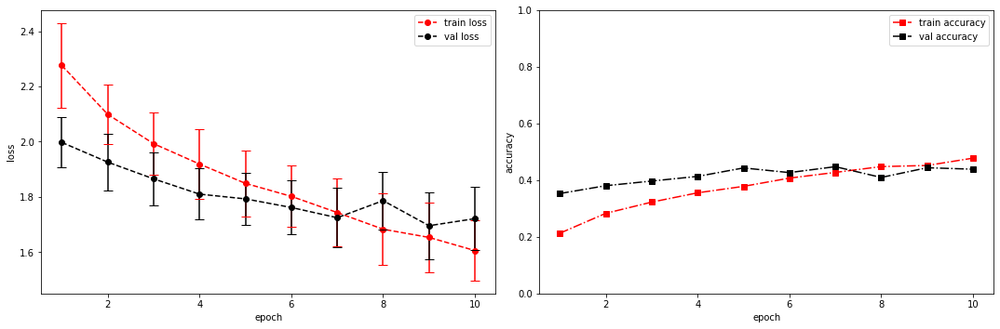

model saved


training epoch:  10
model set to train
Epoch [11/100], step [1/84],  Loss: 1.2430 +/- 0.0000,  accuracy: 0.037109375, time elapsed = 0.32903361320495605s
Epoch [11/100], step [17/84],  Loss: 1.5625 +/- 0.1047,  accuracy: 0.4931640625, time elapsed = 0.9664285182952881s
Epoch [11/100], step [33/84],  Loss: 1.5459 +/- 0.1148,  accuracy: 0.4990234375, time elapsed = 0.940131425857544s
Epoch [11/100], step [49/84],  Loss: 1.5292 +/- 0.1607,  accuracy: 0.5166015625, time elapsed = 0.9252636432647705s
Epoch [11/100], step [65/84],  Loss: 1.4908 +/- 0.1340,  accuracy: 0.5302734375, time elapsed = 0.9290368556976318s
Epoch [11/100], step [81/84],  Loss: 1.5728 +/- 0.0857,  accuracy: 0.4970703125, time elapsed = 0.9413714408874512s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5082975946298713,  precision = 0.5082975946298713 recall = 0.5082975946298713 f1 = 0.5082975946298713 ::: val: acc = 0.4697986577181208,  precision = 0.4697986577181208 recall = 0.4697986577181208 

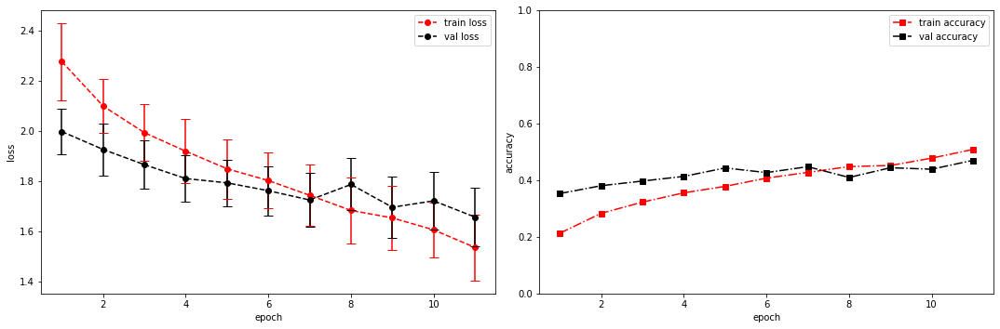

model saved


training epoch:  11
model set to train
Epoch [12/100], step [1/84],  Loss: 1.5921 +/- 0.0000,  accuracy: 0.0302734375, time elapsed = 0.3260838985443115s
Epoch [12/100], step [17/84],  Loss: 1.4787 +/- 0.1179,  accuracy: 0.53125, time elapsed = 0.9772846698760986s
Epoch [12/100], step [33/84],  Loss: 1.5343 +/- 0.1043,  accuracy: 0.4912109375, time elapsed = 0.9540841579437256s
Epoch [12/100], step [49/84],  Loss: 1.4593 +/- 0.1199,  accuracy: 0.5400390625, time elapsed = 0.9434466361999512s
Epoch [12/100], step [65/84],  Loss: 1.4896 +/- 0.1099,  accuracy: 0.5234375, time elapsed = 0.9335217475891113s
Epoch [12/100], step [81/84],  Loss: 1.4947 +/- 0.0984,  accuracy: 0.5205078125, time elapsed = 0.9565567970275879s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5206041394741749,  precision = 0.5206041394741749 recall = 0.5206041394741749 f1 = 0.5206041394741749 ::: val: acc = 0.4750186428038777,  precision = 0.4750186428038777 recall = 0.4750186428038777 time el

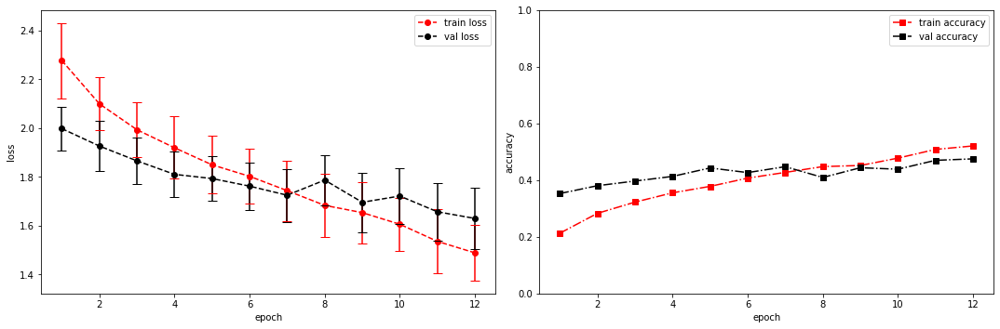

model saved


training epoch:  12
model set to train
Epoch [13/100], step [1/84],  Loss: 1.4936 +/- 0.0000,  accuracy: 0.0361328125, time elapsed = 0.3330240249633789s
Epoch [13/100], step [17/84],  Loss: 1.4018 +/- 0.0908,  accuracy: 0.560546875, time elapsed = 0.9951937198638916s
Epoch [13/100], step [33/84],  Loss: 1.4541 +/- 0.1135,  accuracy: 0.5380859375, time elapsed = 0.9860327243804932s
Epoch [13/100], step [49/84],  Loss: 1.4295 +/- 0.1195,  accuracy: 0.55859375, time elapsed = 0.947406530380249s
Epoch [13/100], step [65/84],  Loss: 1.3983 +/- 0.1030,  accuracy: 0.541015625, time elapsed = 0.9394001960754395s
Epoch [13/100], step [81/84],  Loss: 1.4250 +/- 0.0956,  accuracy: 0.5556640625, time elapsed = 0.9678270816802979s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5509975759835912,  precision = 0.5509975759835912 recall = 0.5509975759835912 f1 = 0.5509975759835912 ::: val: acc = 0.4407158836689038,  precision = 0.4407158836689038 recall = 0.4407158836689038 time

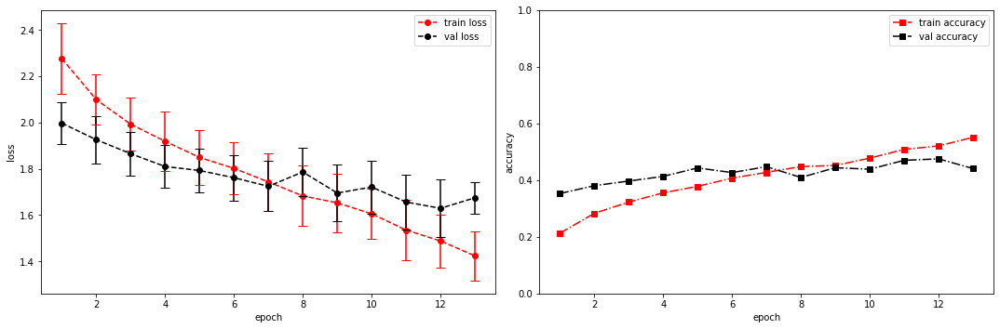

model saved
stopping early
Conv_3_layer
(1, 13, 517)
running model: id = Conv_3_layer, channels = [64, 64, 128]
device:  cuda
dataset metadata:  {'n_fft': 2048, 'hop_length': 256, 'n_mfcc': 13, 'notes': 'optional notes not passed'}
train model: data loaders initialized
sample shape =  (1, 13, 517)
model loaded
Layer (type:depth-idx)                   Output Shape              Param #
├─ConvBlock: 1-1                         [-1, 64, 13, 104]         --
|    └─Sequential: 2-1                   [-1, 64, 13, 104]         --
|    |    └─Conv2d: 3-1                  [-1, 64, 13, 517]         640
|    |    └─ReLU: 3-2                    [-1, 64, 13, 517]         --
|    |    └─MaxPool2d: 3-3               [-1, 64, 13, 104]         --
|    |    └─BatchNorm2d: 3-4             [-1, 64, 13, 104]         128
├─ConvBlock: 1-2                         [-1, 64, 13, 21]          --
|    └─Sequential: 2-2                   [-1, 64, 13, 21]          --
|    |    └─Conv2d: 3-5                  [-1, 64, 1

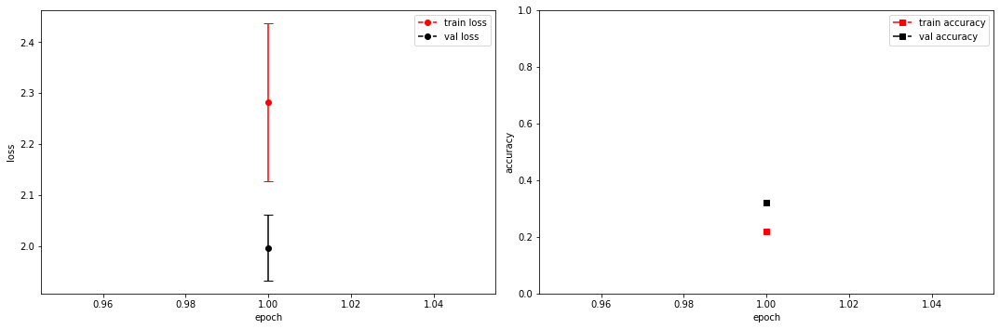

model saved


training epoch:  1
model set to train
Epoch [2/100], step [1/84],  Loss: 1.9658 +/- 0.0000,  accuracy: 0.0244140625, time elapsed = 0.34210801124572754s
Epoch [2/100], step [17/84],  Loss: 2.1168 +/- 0.1260,  accuracy: 0.2763671875, time elapsed = 0.9395878314971924s
Epoch [2/100], step [33/84],  Loss: 2.0612 +/- 0.0791,  accuracy: 0.294921875, time elapsed = 0.924856424331665s
Epoch [2/100], step [49/84],  Loss: 2.0901 +/- 0.1411,  accuracy: 0.2900390625, time elapsed = 0.9233536720275879s
Epoch [2/100], step [65/84],  Loss: 2.0937 +/- 0.0944,  accuracy: 0.2841796875, time elapsed = 0.9232780933380127s
Epoch [2/100], step [81/84],  Loss: 2.0926 +/- 0.0793,  accuracy: 0.2958984375, time elapsed = 0.9181501865386963s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.2897631922431475,  precision = 0.2897631922431475 recall = 0.2897631922431475 f1 = 0.2897631922431475 ::: val: acc = 0.3900074571215511,  precision = 0.3900074571215511 recall = 0.3900074571215511 time el

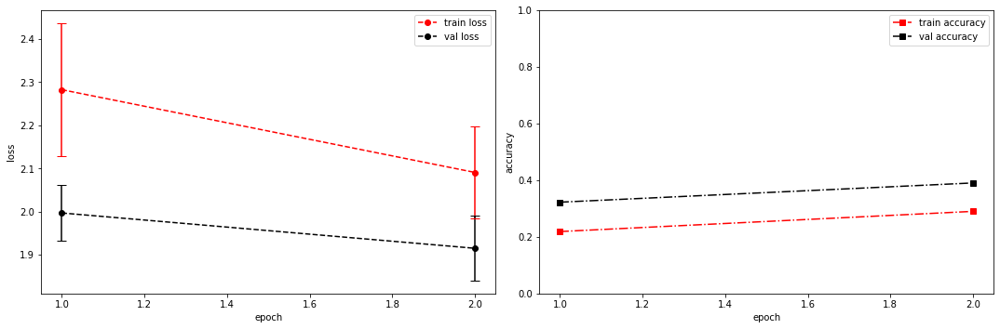

model saved


training epoch:  2
model set to train
Epoch [3/100], step [1/84],  Loss: 1.7859 +/- 0.0000,  accuracy: 0.0263671875, time elapsed = 0.33518314361572266s
Epoch [3/100], step [17/84],  Loss: 2.0365 +/- 0.0780,  accuracy: 0.306640625, time elapsed = 0.9579184055328369s
Epoch [3/100], step [33/84],  Loss: 2.0126 +/- 0.1134,  accuracy: 0.3271484375, time elapsed = 0.9352405071258545s
Epoch [3/100], step [49/84],  Loss: 1.9683 +/- 0.1214,  accuracy: 0.34375, time elapsed = 0.9446284770965576s
Epoch [3/100], step [65/84],  Loss: 1.9554 +/- 0.0652,  accuracy: 0.3271484375, time elapsed = 0.9193954467773438s
Epoch [3/100], step [81/84],  Loss: 2.0248 +/- 0.0952,  accuracy: 0.3115234375, time elapsed = 0.918921709060669s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.324445273168003,  precision = 0.324445273168003 recall = 0.324445273168003 f1 = 0.324445273168003 ::: val: acc = 0.3773303504847129,  precision = 0.3773303504847129 recall = 0.3773303504847129 time elapsed = 6

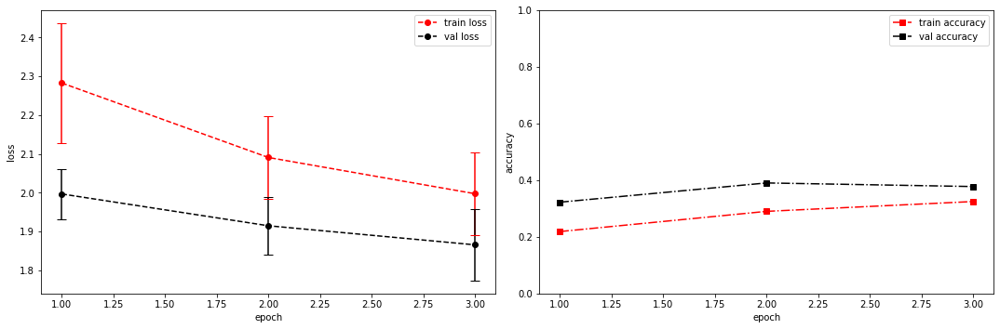

model saved


training epoch:  3
model set to train
Epoch [4/100], step [1/84],  Loss: 1.8863 +/- 0.0000,  accuracy: 0.0234375, time elapsed = 0.33277297019958496s
Epoch [4/100], step [17/84],  Loss: 1.9626 +/- 0.0735,  accuracy: 0.341796875, time elapsed = 0.9723067283630371s
Epoch [4/100], step [33/84],  Loss: 1.9612 +/- 0.0856,  accuracy: 0.3427734375, time elapsed = 0.9214878082275391s
Epoch [4/100], step [49/84],  Loss: 1.9527 +/- 0.1324,  accuracy: 0.3447265625, time elapsed = 0.9338757991790771s
Epoch [4/100], step [65/84],  Loss: 1.8919 +/- 0.1110,  accuracy: 0.3720703125, time elapsed = 0.9268732070922852s
Epoch [4/100], step [81/84],  Loss: 1.9747 +/- 0.0958,  accuracy: 0.333984375, time elapsed = 0.9564290046691895s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3462614208465411,  precision = 0.3462614208465411 recall = 0.3462614208465411 f1 = 0.3462614208465411 ::: val: acc = 0.3825503355704698,  precision = 0.3825503355704698 recall = 0.3825503355704698 time elaps

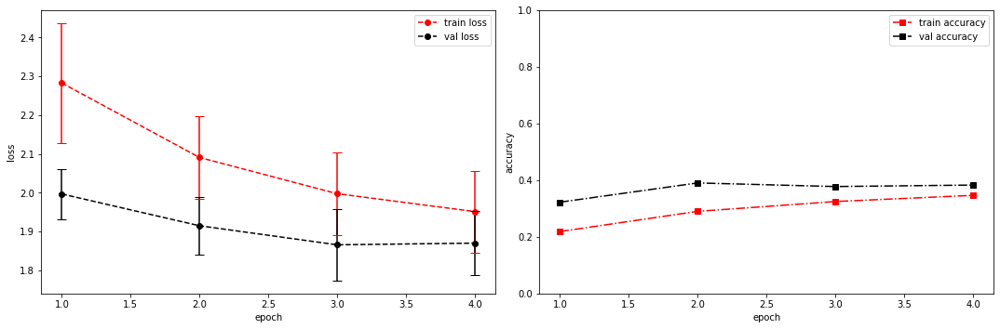

model saved


training epoch:  4
model set to train
Epoch [5/100], step [1/84],  Loss: 1.8947 +/- 0.0000,  accuracy: 0.021484375, time elapsed = 0.35088253021240234s
Epoch [5/100], step [17/84],  Loss: 1.8838 +/- 0.1742,  accuracy: 0.353515625, time elapsed = 0.9422166347503662s
Epoch [5/100], step [33/84],  Loss: 1.9366 +/- 0.1109,  accuracy: 0.3359375, time elapsed = 0.9228427410125732s
Epoch [5/100], step [49/84],  Loss: 1.9250 +/- 0.1332,  accuracy: 0.3369140625, time elapsed = 0.9624531269073486s
Epoch [5/100], step [65/84],  Loss: 1.9003 +/- 0.1087,  accuracy: 0.3623046875, time elapsed = 0.992525577545166s
Epoch [5/100], step [81/84],  Loss: 1.8620 +/- 0.0805,  accuracy: 0.380859375, time elapsed = 0.9586031436920166s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3540928584747343,  precision = 0.3540928584747343 recall = 0.3540928584747343 f1 = 0.3540928584747343 ::: val: acc = 0.39373601789709173,  precision = 0.39373601789709173 recall = 0.39373601789709173 time elap

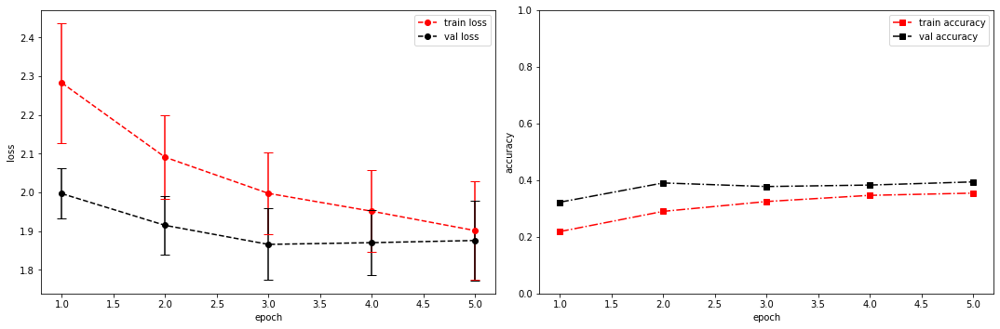

model saved


training epoch:  5
model set to train
Epoch [6/100], step [1/84],  Loss: 2.0245 +/- 0.0000,  accuracy: 0.0224609375, time elapsed = 0.3160102367401123s
Epoch [6/100], step [17/84],  Loss: 1.8452 +/- 0.0887,  accuracy: 0.37890625, time elapsed = 0.9956948757171631s
Epoch [6/100], step [33/84],  Loss: 1.8421 +/- 0.1034,  accuracy: 0.37890625, time elapsed = 0.9291436672210693s
Epoch [6/100], step [49/84],  Loss: 1.8517 +/- 0.1023,  accuracy: 0.365234375, time elapsed = 0.9233789443969727s
Epoch [6/100], step [65/84],  Loss: 1.8636 +/- 0.0892,  accuracy: 0.3759765625, time elapsed = 0.9348349571228027s
Epoch [6/100], step [81/84],  Loss: 1.8310 +/- 0.0780,  accuracy: 0.396484375, time elapsed = 0.9319379329681396s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.37740070855864255,  precision = 0.37740070855864255 recall = 0.37740070855864255 f1 = 0.37740070855864255 ::: val: acc = 0.4079045488441462,  precision = 0.4079045488441462 recall = 0.4079045488441462 time ela

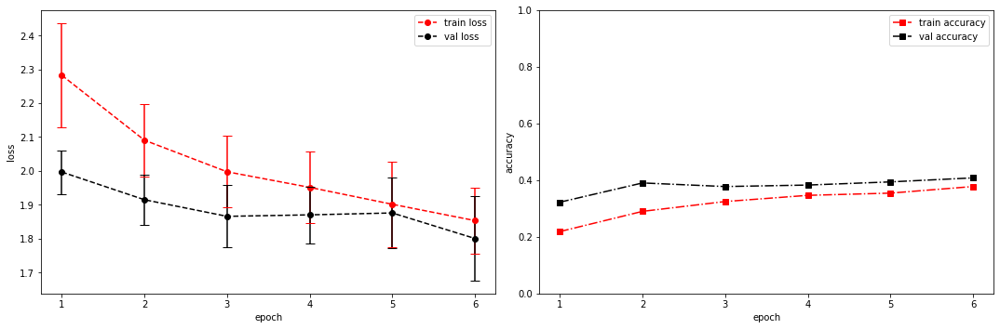

model saved


training epoch:  6
model set to train
Epoch [7/100], step [1/84],  Loss: 1.6660 +/- 0.0000,  accuracy: 0.0302734375, time elapsed = 0.32337450981140137s
Epoch [7/100], step [17/84],  Loss: 1.7553 +/- 0.1167,  accuracy: 0.4140625, time elapsed = 0.9661693572998047s
Epoch [7/100], step [33/84],  Loss: 1.8333 +/- 0.1164,  accuracy: 0.384765625, time elapsed = 0.9383394718170166s
Epoch [7/100], step [49/84],  Loss: 1.8146 +/- 0.1178,  accuracy: 0.4072265625, time elapsed = 0.9220073223114014s
Epoch [7/100], step [65/84],  Loss: 1.8225 +/- 0.1042,  accuracy: 0.40625, time elapsed = 0.9442741870880127s
Epoch [7/100], step [81/84],  Loss: 1.7984 +/- 0.0785,  accuracy: 0.412109375, time elapsed = 0.956920862197876s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4040648890546336,  precision = 0.4040648890546336 recall = 0.4040648890546336 f1 = 0.4040648890546336 ::: val: acc = 0.4280387770320656,  precision = 0.4280387770320656 recall = 0.4280387770320656 time elapsed = 6

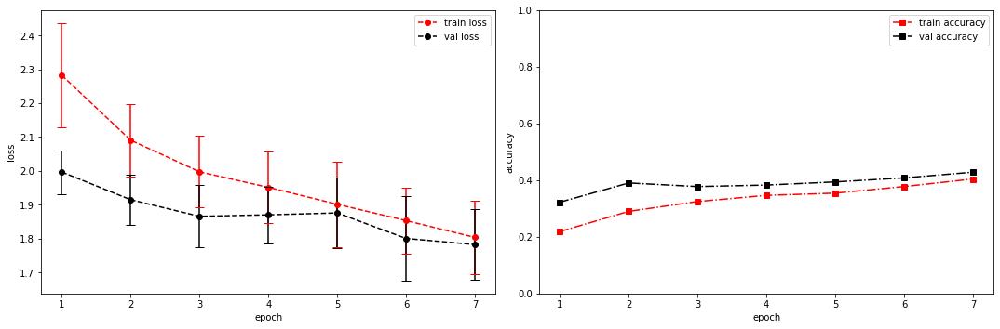

model saved


training epoch:  7
model set to train
Epoch [8/100], step [1/84],  Loss: 1.7182 +/- 0.0000,  accuracy: 0.021484375, time elapsed = 0.3396611213684082s
Epoch [8/100], step [17/84],  Loss: 1.7821 +/- 0.1207,  accuracy: 0.3916015625, time elapsed = 0.9849643707275391s
Epoch [8/100], step [33/84],  Loss: 1.7217 +/- 0.1304,  accuracy: 0.4296875, time elapsed = 0.938145637512207s
Epoch [8/100], step [49/84],  Loss: 1.7614 +/- 0.1035,  accuracy: 0.416015625, time elapsed = 0.9354023933410645s
Epoch [8/100], step [65/84],  Loss: 1.7823 +/- 0.1240,  accuracy: 0.4033203125, time elapsed = 0.9340176582336426s
Epoch [8/100], step [81/84],  Loss: 1.7226 +/- 0.0925,  accuracy: 0.4267578125, time elapsed = 0.9432919025421143s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.41376095468953944,  precision = 0.41376095468953944 recall = 0.41376095468953944 f1 = 0.41376095468953944 ::: val: acc = 0.41312453392990306,  precision = 0.41312453392990306 recall = 0.41312453392990306 time 

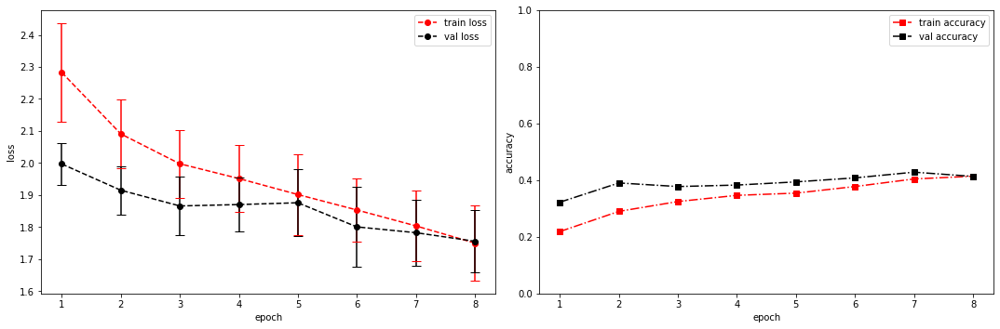

model saved


training epoch:  8
model set to train
Epoch [9/100], step [1/84],  Loss: 1.5892 +/- 0.0000,  accuracy: 0.033203125, time elapsed = 0.3235805034637451s
Epoch [9/100], step [17/84],  Loss: 1.7263 +/- 0.1178,  accuracy: 0.4287109375, time elapsed = 0.9707999229431152s
Epoch [9/100], step [33/84],  Loss: 1.7570 +/- 0.1062,  accuracy: 0.416015625, time elapsed = 0.9419827461242676s
Epoch [9/100], step [49/84],  Loss: 1.6987 +/- 0.1159,  accuracy: 0.4365234375, time elapsed = 0.9303417205810547s
Epoch [9/100], step [65/84],  Loss: 1.6682 +/- 0.1269,  accuracy: 0.439453125, time elapsed = 0.9263706207275391s
Epoch [9/100], step [81/84],  Loss: 1.7248 +/- 0.1216,  accuracy: 0.4296875, time elapsed = 0.9394145011901855s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4312884579526384,  precision = 0.4312884579526384 recall = 0.4312884579526384 f1 = 0.4312884579526384 ::: val: acc = 0.4272930648769575,  precision = 0.4272930648769575 recall = 0.4272930648769575 time elapsed

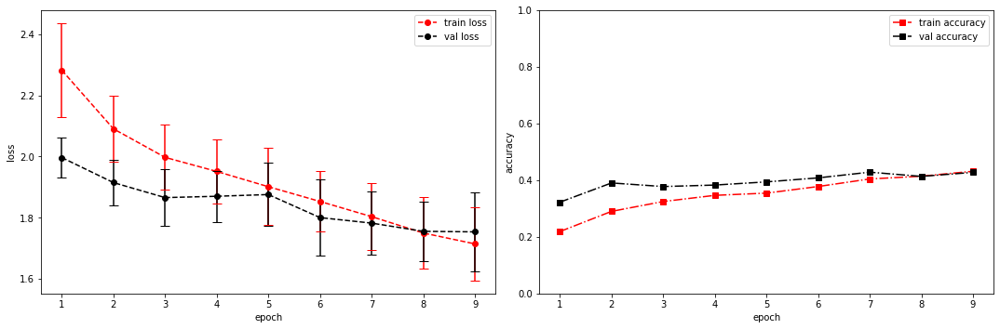

model saved


training epoch:  9
model set to train
Epoch [10/100], step [1/84],  Loss: 1.7598 +/- 0.0000,  accuracy: 0.025390625, time elapsed = 0.3493483066558838s
Epoch [10/100], step [17/84],  Loss: 1.6511 +/- 0.0761,  accuracy: 0.455078125, time elapsed = 0.9942967891693115s
Epoch [10/100], step [33/84],  Loss: 1.6067 +/- 0.1206,  accuracy: 0.4912109375, time elapsed = 0.935248851776123s
Epoch [10/100], step [49/84],  Loss: 1.7137 +/- 0.0765,  accuracy: 0.4248046875, time elapsed = 0.9284012317657471s
Epoch [10/100], step [65/84],  Loss: 1.6028 +/- 0.0795,  accuracy: 0.4658203125, time elapsed = 0.9813053607940674s
Epoch [10/100], step [81/84],  Loss: 1.6683 +/- 0.1271,  accuracy: 0.443359375, time elapsed = 0.940108060836792s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.45534215923923177,  precision = 0.45534215923923177 recall = 0.45534215923923177 f1 = 0.4553421592392318 ::: val: acc = 0.43922445935868754,  precision = 0.43922445935868754 recall = 0.43922445935868754

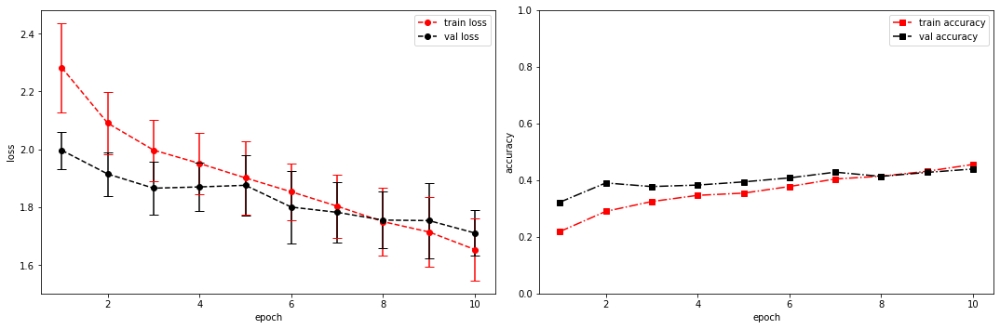

model saved


training epoch:  10
model set to train
Epoch [11/100], step [1/84],  Loss: 1.6029 +/- 0.0000,  accuracy: 0.029296875, time elapsed = 0.35840368270874023s
Epoch [11/100], step [17/84],  Loss: 1.6060 +/- 0.1134,  accuracy: 0.48828125, time elapsed = 0.9615452289581299s
Epoch [11/100], step [33/84],  Loss: 1.6258 +/- 0.1497,  accuracy: 0.47265625, time elapsed = 0.9345457553863525s
Epoch [11/100], step [49/84],  Loss: 1.5986 +/- 0.0989,  accuracy: 0.470703125, time elapsed = 0.9850354194641113s
Epoch [11/100], step [65/84],  Loss: 1.5937 +/- 0.0849,  accuracy: 0.4853515625, time elapsed = 0.9315037727355957s
Epoch [11/100], step [81/84],  Loss: 1.6209 +/- 0.0813,  accuracy: 0.4521484375, time elapsed = 0.9369754791259766s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4732425881036733,  precision = 0.4732425881036733 recall = 0.4732425881036733 f1 = 0.4732425881036733 ::: val: acc = 0.4325130499627144,  precision = 0.4325130499627144 recall = 0.4325130499627144 time

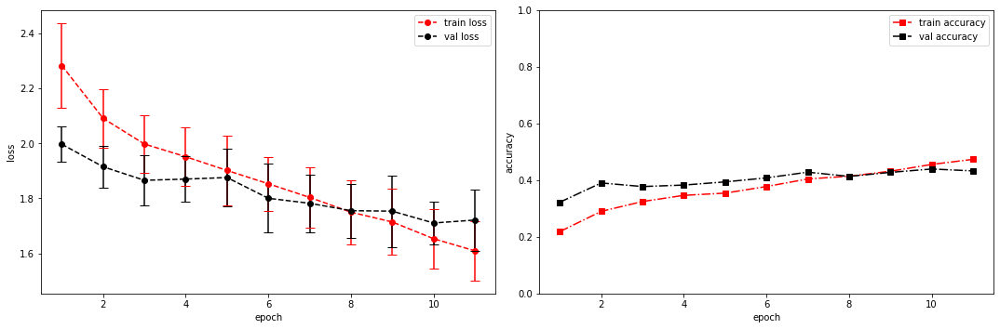

model saved


training epoch:  11
model set to train
Epoch [12/100], step [1/84],  Loss: 1.5842 +/- 0.0000,  accuracy: 0.0361328125, time elapsed = 0.3363609313964844s
Epoch [12/100], step [17/84],  Loss: 1.5308 +/- 0.0777,  accuracy: 0.4970703125, time elapsed = 2.2992284297943115s
Epoch [12/100], step [33/84],  Loss: 1.5434 +/- 0.1031,  accuracy: 0.5166015625, time elapsed = 0.915856122970581s
Epoch [12/100], step [49/84],  Loss: 1.5858 +/- 0.1466,  accuracy: 0.4873046875, time elapsed = 0.8936557769775391s
Epoch [12/100], step [65/84],  Loss: 1.5178 +/- 0.0911,  accuracy: 0.505859375, time elapsed = 0.9194562435150146s
Epoch [12/100], step [81/84],  Loss: 1.6005 +/- 0.1161,  accuracy: 0.46875, time elapsed = 0.9248754978179932s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.49766921499160915,  precision = 0.49766921499160915 recall = 0.49766921499160915 f1 = 0.49766921499160915 ::: val: acc = 0.45041014168530946,  precision = 0.45041014168530946 recall = 0.45041014168530946

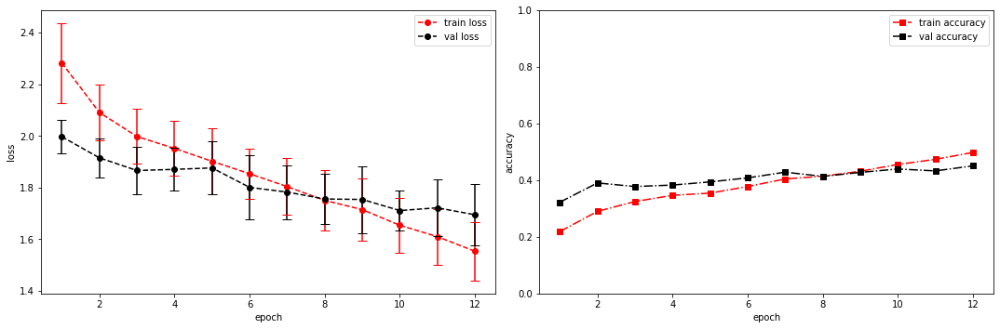

model saved


training epoch:  12
model set to train
Epoch [13/100], step [1/84],  Loss: 1.6190 +/- 0.0000,  accuracy: 0.0302734375, time elapsed = 0.3215789794921875s
Epoch [13/100], step [17/84],  Loss: 1.4584 +/- 0.1159,  accuracy: 0.5185546875, time elapsed = 0.9733171463012695s
Epoch [13/100], step [33/84],  Loss: 1.4992 +/- 0.1128,  accuracy: 0.50390625, time elapsed = 0.9272475242614746s
Epoch [13/100], step [49/84],  Loss: 1.5565 +/- 0.0814,  accuracy: 0.494140625, time elapsed = 0.9300448894500732s
Epoch [13/100], step [65/84],  Loss: 1.5725 +/- 0.0952,  accuracy: 0.4755859375, time elapsed = 0.9206130504608154s
Epoch [13/100], step [81/84],  Loss: 1.5446 +/- 0.0865,  accuracy: 0.5009765625, time elapsed = 0.940683126449585s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5006526198023494,  precision = 0.5006526198023494 recall = 0.5006526198023494 f1 = 0.5006526198023494 ::: val: acc = 0.4720357941834452,  precision = 0.4720357941834452 recall = 0.4720357941834452 tim

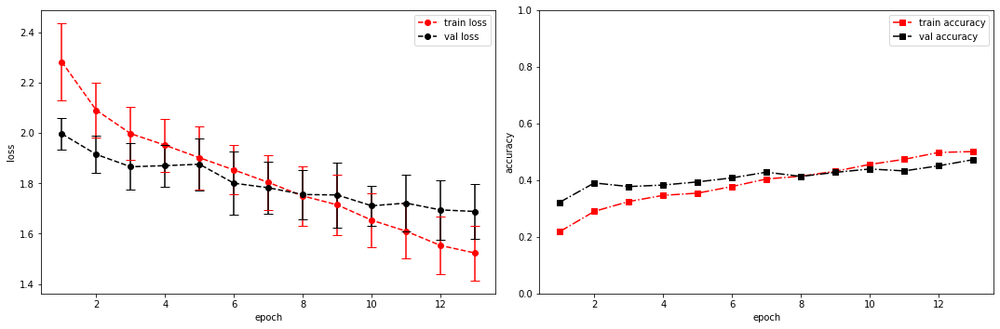

model saved


training epoch:  13
model set to train
Epoch [14/100], step [1/84],  Loss: 1.5760 +/- 0.0000,  accuracy: 0.0322265625, time elapsed = 0.31937694549560547s
Epoch [14/100], step [17/84],  Loss: 1.4467 +/- 0.1398,  accuracy: 0.546875, time elapsed = 0.9563436508178711s
Epoch [14/100], step [33/84],  Loss: 1.4429 +/- 0.1194,  accuracy: 0.546875, time elapsed = 0.9429094791412354s
Epoch [14/100], step [49/84],  Loss: 1.5497 +/- 0.0953,  accuracy: 0.5009765625, time elapsed = 0.9300174713134766s
Epoch [14/100], step [65/84],  Loss: 1.4641 +/- 0.1175,  accuracy: 0.5302734375, time elapsed = 0.9320962429046631s
Epoch [14/100], step [81/84],  Loss: 1.4475 +/- 0.0722,  accuracy: 0.533203125, time elapsed = 0.9374477863311768s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5299272795077382,  precision = 0.5299272795077382 recall = 0.5299272795077382 f1 = 0.5299272795077382 ::: val: acc = 0.4601043997017151,  precision = 0.4601043997017151 recall = 0.4601043997017151 time el

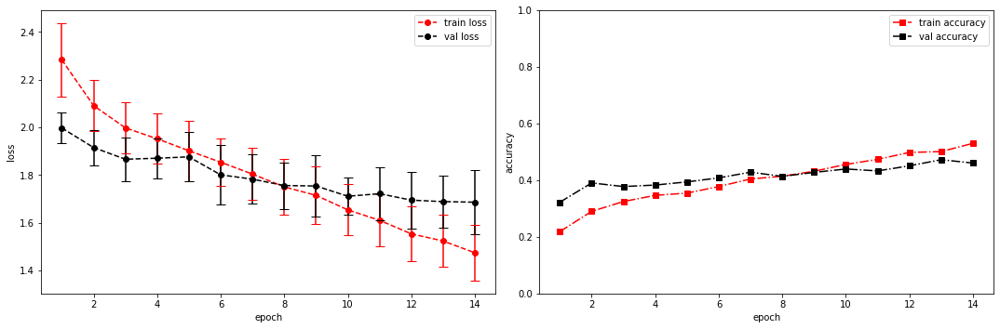

model saved


training epoch:  14
model set to train
Epoch [15/100], step [1/84],  Loss: 1.4686 +/- 0.0000,  accuracy: 0.0302734375, time elapsed = 0.3510434627532959s
Epoch [15/100], step [17/84],  Loss: 1.4065 +/- 0.1197,  accuracy: 0.5595703125, time elapsed = 0.9576389789581299s
Epoch [15/100], step [33/84],  Loss: 1.4167 +/- 0.1060,  accuracy: 0.564453125, time elapsed = 0.9322035312652588s
Epoch [15/100], step [49/84],  Loss: 1.4110 +/- 0.1086,  accuracy: 0.5654296875, time elapsed = 0.9194245338439941s
Epoch [15/100], step [65/84],  Loss: 1.4318 +/- 0.0892,  accuracy: 0.5439453125, time elapsed = 0.9225132465362549s
Epoch [15/100], step [81/84],  Loss: 1.4228 +/- 0.1062,  accuracy: 0.529296875, time elapsed = 0.9451813697814941s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5530486667909752,  precision = 0.5530486667909752 recall = 0.5530486667909752 f1 = 0.5530486667909752 ::: val: acc = 0.4116331096196868,  precision = 0.4116331096196868 recall = 0.4116331096196868 t

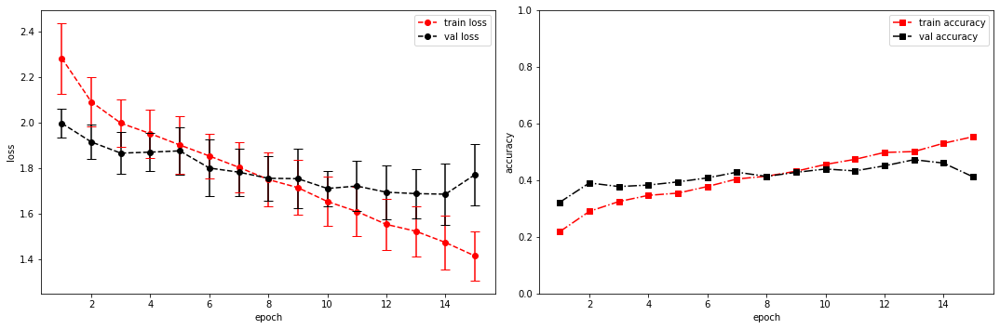

model saved
stopping early
Conv_3_layer
(1, 13, 517)
running model: id = Conv_3_layer, channels = [128, 128, 128]
device:  cuda
dataset metadata:  {'n_fft': 2048, 'hop_length': 256, 'n_mfcc': 13, 'notes': 'optional notes not passed'}
train model: data loaders initialized
sample shape =  (1, 13, 517)
model loaded
Layer (type:depth-idx)                   Output Shape              Param #
├─ConvBlock: 1-1                         [-1, 128, 13, 104]        --
|    └─Sequential: 2-1                   [-1, 128, 13, 104]        --
|    |    └─Conv2d: 3-1                  [-1, 128, 13, 517]        1,280
|    |    └─ReLU: 3-2                    [-1, 128, 13, 517]        --
|    |    └─MaxPool2d: 3-3               [-1, 128, 13, 104]        --
|    |    └─BatchNorm2d: 3-4             [-1, 128, 13, 104]        256
├─ConvBlock: 1-2                         [-1, 128, 13, 21]         --
|    └─Sequential: 2-2                   [-1, 128, 13, 21]         --
|    |    └─Conv2d: 3-5                  [-1, 1

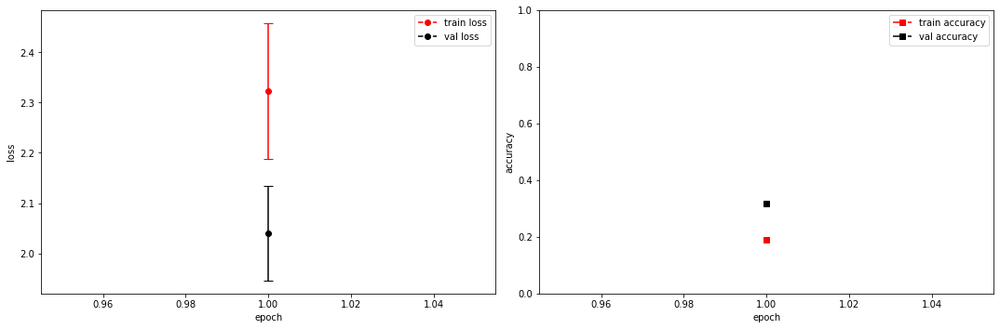

model saved


training epoch:  1
model set to train
Epoch [2/100], step [1/84],  Loss: 2.1244 +/- 0.0000,  accuracy: 0.0146484375, time elapsed = 0.3438572883605957s
Epoch [2/100], step [17/84],  Loss: 2.1848 +/- 0.0812,  accuracy: 0.2451171875, time elapsed = 1.0321333408355713s
Epoch [2/100], step [33/84],  Loss: 2.1657 +/- 0.1178,  accuracy: 0.259765625, time elapsed = 1.0277934074401855s
Epoch [2/100], step [49/84],  Loss: 2.1424 +/- 0.1383,  accuracy: 0.2705078125, time elapsed = 1.0120933055877686s
Epoch [2/100], step [65/84],  Loss: 2.0791 +/- 0.1004,  accuracy: 0.2919921875, time elapsed = 0.9866867065429688s
Epoch [2/100], step [81/84],  Loss: 2.0717 +/- 0.0896,  accuracy: 0.2822265625, time elapsed = 0.9777567386627197s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.2699981353719933,  precision = 0.2699981353719933 recall = 0.2699981353719933 f1 = 0.2699981353719933 ::: val: acc = 0.38478747203579416,  precision = 0.38478747203579416 recall = 0.38478747203579416 time

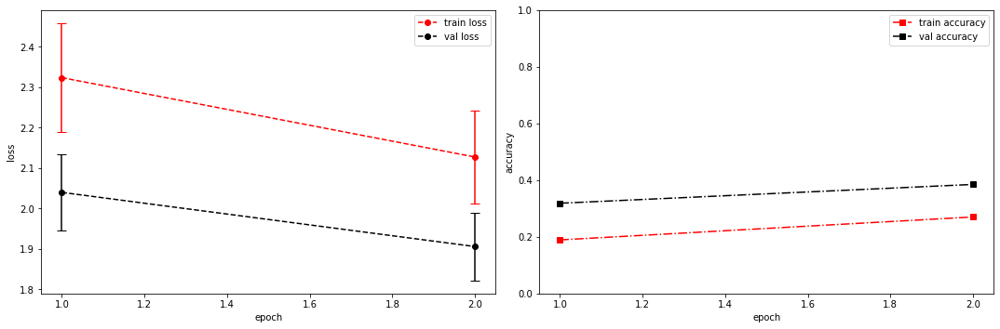

model saved


training epoch:  2
model set to train
Epoch [3/100], step [1/84],  Loss: 2.0766 +/- 0.0000,  accuracy: 0.017578125, time elapsed = 0.325364351272583s
Epoch [3/100], step [17/84],  Loss: 2.0904 +/- 0.1034,  accuracy: 0.2939453125, time elapsed = 1.017632246017456s
Epoch [3/100], step [33/84],  Loss: 2.0158 +/- 0.1020,  accuracy: 0.32421875, time elapsed = 1.0228779315948486s
Epoch [3/100], step [49/84],  Loss: 2.0662 +/- 0.1095,  accuracy: 0.291015625, time elapsed = 0.9980778694152832s
Epoch [3/100], step [65/84],  Loss: 2.0126 +/- 0.0862,  accuracy: 0.3154296875, time elapsed = 0.9910335540771484s
Epoch [3/100], step [81/84],  Loss: 1.9745 +/- 0.1438,  accuracy: 0.3369140625, time elapsed = 0.985745906829834s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3123251911243707,  precision = 0.3123251911243707 recall = 0.3123251911243707 f1 = 0.3123251911243707 ::: val: acc = 0.4228187919463087,  precision = 0.4228187919463087 recall = 0.4228187919463087 time elapsed 

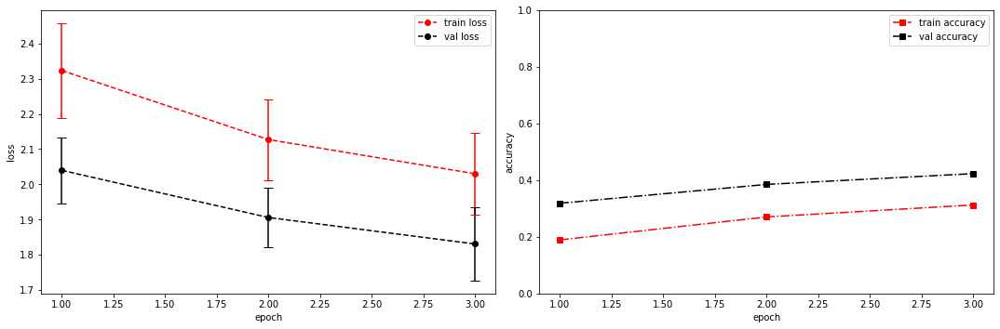

model saved


training epoch:  3
model set to train
Epoch [4/100], step [1/84],  Loss: 2.0677 +/- 0.0000,  accuracy: 0.01953125, time elapsed = 0.33350086212158203s
Epoch [4/100], step [17/84],  Loss: 1.9488 +/- 0.0717,  accuracy: 0.341796875, time elapsed = 1.050095796585083s
Epoch [4/100], step [33/84],  Loss: 1.9944 +/- 0.0933,  accuracy: 0.345703125, time elapsed = 0.9819653034210205s
Epoch [4/100], step [49/84],  Loss: 1.9759 +/- 0.1272,  accuracy: 0.32421875, time elapsed = 1.0005872249603271s
Epoch [4/100], step [65/84],  Loss: 1.9816 +/- 0.1318,  accuracy: 0.3349609375, time elapsed = 1.006026029586792s
Epoch [4/100], step [81/84],  Loss: 1.9810 +/- 0.1010,  accuracy: 0.3447265625, time elapsed = 1.0358240604400635s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3380570576170054,  precision = 0.3380570576170054 recall = 0.3380570576170054 f1 = 0.3380570576170054 ::: val: acc = 0.4123788217747949,  precision = 0.4123788217747949 recall = 0.4123788217747949 time elapsed 

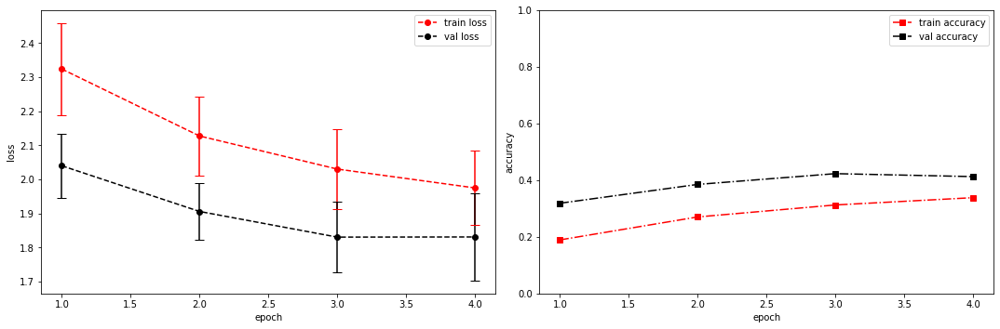

model saved


training epoch:  4
model set to train
Epoch [5/100], step [1/84],  Loss: 1.9553 +/- 0.0000,  accuracy: 0.0224609375, time elapsed = 0.3223867416381836s
Epoch [5/100], step [17/84],  Loss: 1.9548 +/- 0.1132,  accuracy: 0.357421875, time elapsed = 1.030435562133789s
Epoch [5/100], step [33/84],  Loss: 1.9352 +/- 0.1105,  accuracy: 0.35546875, time elapsed = 0.994924783706665s
Epoch [5/100], step [49/84],  Loss: 1.8668 +/- 0.0966,  accuracy: 0.384765625, time elapsed = 0.9759149551391602s
Epoch [5/100], step [65/84],  Loss: 1.9124 +/- 0.0863,  accuracy: 0.3427734375, time elapsed = 0.9917011260986328s
Epoch [5/100], step [81/84],  Loss: 1.9514 +/- 0.1018,  accuracy: 0.34375, time elapsed = 0.9971880912780762s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.35670333768413204,  precision = 0.35670333768413204 recall = 0.35670333768413204 f1 = 0.35670333768413204 ::: val: acc = 0.4161073825503356,  precision = 0.4161073825503356 recall = 0.4161073825503356 time elapsed 

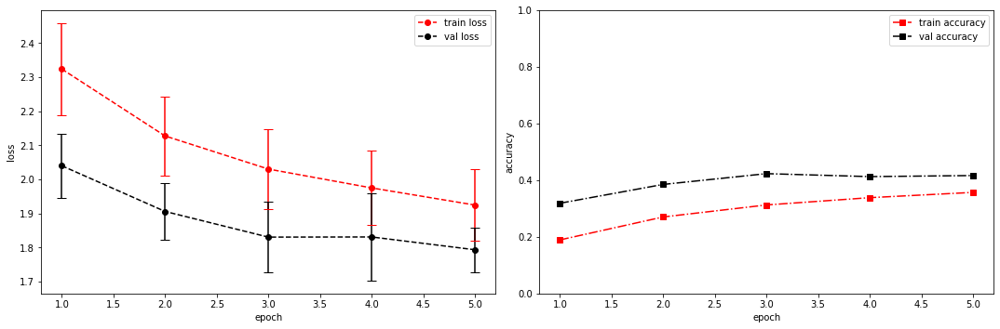

model saved


training epoch:  5
model set to train
Epoch [6/100], step [1/84],  Loss: 1.8757 +/- 0.0000,  accuracy: 0.0244140625, time elapsed = 0.3475658893585205s
Epoch [6/100], step [17/84],  Loss: 1.8542 +/- 0.1428,  accuracy: 0.3798828125, time elapsed = 1.0955276489257812s
Epoch [6/100], step [33/84],  Loss: 1.8798 +/- 0.1083,  accuracy: 0.36328125, time elapsed = 1.0167887210845947s
Epoch [6/100], step [49/84],  Loss: 1.8885 +/- 0.0928,  accuracy: 0.3583984375, time elapsed = 0.9696307182312012s
Epoch [6/100], step [65/84],  Loss: 1.8529 +/- 0.1254,  accuracy: 0.384765625, time elapsed = 1.0093302726745605s
Epoch [6/100], step [81/84],  Loss: 1.8491 +/- 0.0955,  accuracy: 0.3896484375, time elapsed = 1.0004446506500244s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3777736341599851,  precision = 0.3777736341599851 recall = 0.3777736341599851 f1 = 0.3777736341599851 ::: val: acc = 0.42953020134228187,  precision = 0.42953020134228187 recall = 0.42953020134228187 time e

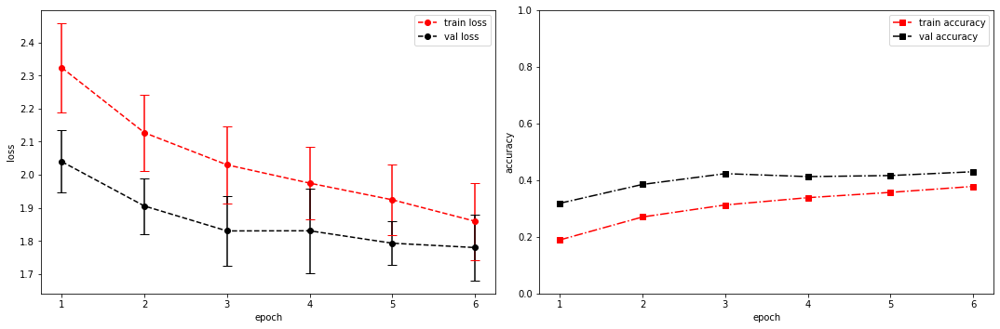

model saved


training epoch:  6
model set to train
Epoch [7/100], step [1/84],  Loss: 1.8172 +/- 0.0000,  accuracy: 0.02734375, time elapsed = 0.3248558044433594s
Epoch [7/100], step [17/84],  Loss: 1.7953 +/- 0.0809,  accuracy: 0.4052734375, time elapsed = 1.0477771759033203s
Epoch [7/100], step [33/84],  Loss: 1.8544 +/- 0.1431,  accuracy: 0.3701171875, time elapsed = 0.9926941394805908s
Epoch [7/100], step [49/84],  Loss: 1.7896 +/- 0.1030,  accuracy: 0.4111328125, time elapsed = 0.9915971755981445s
Epoch [7/100], step [65/84],  Loss: 1.8121 +/- 0.1477,  accuracy: 0.390625, time elapsed = 0.9900057315826416s
Epoch [7/100], step [81/84],  Loss: 1.7932 +/- 0.1309,  accuracy: 0.396484375, time elapsed = 1.0015075206756592s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3930635838150289,  precision = 0.3930635838150289 recall = 0.3930635838150289 f1 = 0.3930635838150289 ::: val: acc = 0.4272930648769575,  precision = 0.4272930648769575 recall = 0.4272930648769575 time elapsed 

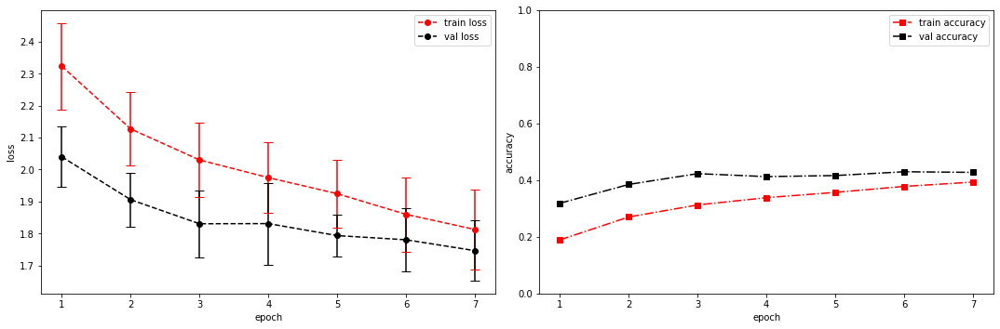

model saved


training epoch:  7
model set to train
Epoch [8/100], step [1/84],  Loss: 1.8560 +/- 0.0000,  accuracy: 0.025390625, time elapsed = 0.3429694175720215s
Epoch [8/100], step [17/84],  Loss: 1.7188 +/- 0.1149,  accuracy: 0.423828125, time elapsed = 1.0184519290924072s
Epoch [8/100], step [33/84],  Loss: 1.7934 +/- 0.1570,  accuracy: 0.3994140625, time elapsed = 0.9827432632446289s
Epoch [8/100], step [49/84],  Loss: 1.8038 +/- 0.0943,  accuracy: 0.40625, time elapsed = 0.9893114566802979s
Epoch [8/100], step [65/84],  Loss: 1.7430 +/- 0.1298,  accuracy: 0.419921875, time elapsed = 0.984323263168335s
Epoch [8/100], step [81/84],  Loss: 1.7564 +/- 0.1072,  accuracy: 0.42578125, time elapsed = 0.9927206039428711s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4133880290881969,  precision = 0.4133880290881969 recall = 0.4133880290881969 f1 = 0.4133880290881969 ::: val: acc = 0.43847874720357943,  precision = 0.43847874720357943 recall = 0.43847874720357943 time elapsed =

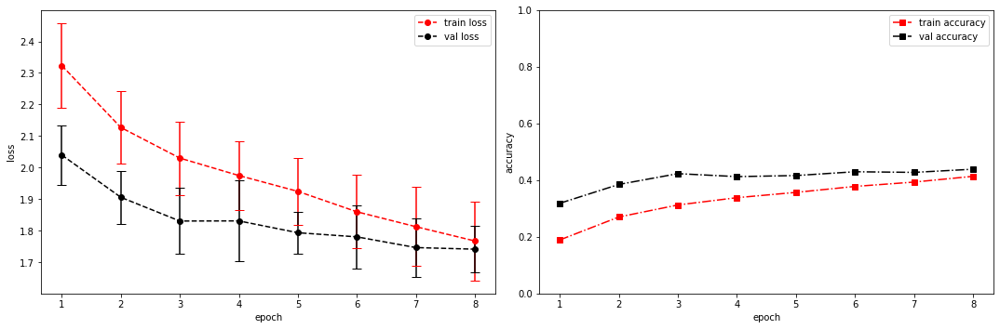

model saved


training epoch:  8
model set to train
Epoch [9/100], step [1/84],  Loss: 1.7833 +/- 0.0000,  accuracy: 0.0244140625, time elapsed = 0.3325958251953125s
Epoch [9/100], step [17/84],  Loss: 1.7679 +/- 0.0914,  accuracy: 0.40625, time elapsed = 1.0190160274505615s
Epoch [9/100], step [33/84],  Loss: 1.7602 +/- 0.0853,  accuracy: 0.4189453125, time elapsed = 0.9923896789550781s
Epoch [9/100], step [49/84],  Loss: 1.7075 +/- 0.1265,  accuracy: 0.443359375, time elapsed = 1.0529844760894775s
Epoch [9/100], step [65/84],  Loss: 1.7211 +/- 0.1017,  accuracy: 0.427734375, time elapsed = 1.044886827468872s
Epoch [9/100], step [81/84],  Loss: 1.6956 +/- 0.1121,  accuracy: 0.42578125, time elapsed = 1.058908224105835s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4242028715271303,  precision = 0.4242028715271303 recall = 0.4242028715271303 f1 = 0.4242028715271303 ::: val: acc = 0.4645786726323639,  precision = 0.4645786726323639 recall = 0.4645786726323639 time elapsed = 7.

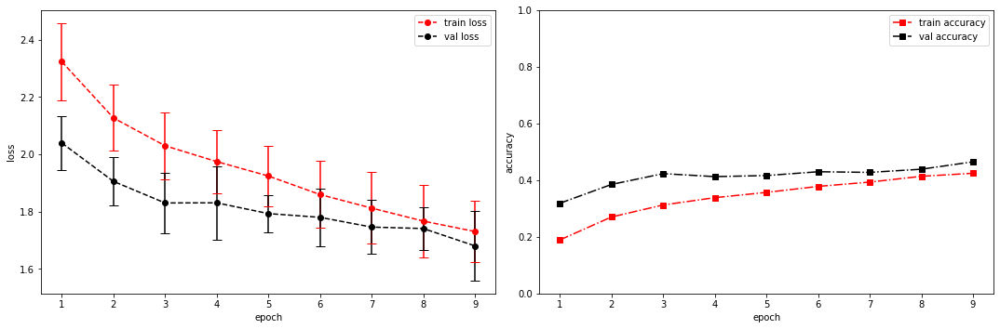

model saved


training epoch:  9
model set to train
Epoch [10/100], step [1/84],  Loss: 1.7995 +/- 0.0000,  accuracy: 0.0283203125, time elapsed = 0.3404974937438965s
Epoch [10/100], step [17/84],  Loss: 1.6685 +/- 0.0855,  accuracy: 0.4619140625, time elapsed = 1.0746891498565674s
Epoch [10/100], step [33/84],  Loss: 1.6568 +/- 0.1043,  accuracy: 0.45703125, time elapsed = 1.0404129028320312s
Epoch [10/100], step [49/84],  Loss: 1.7243 +/- 0.1029,  accuracy: 0.4150390625, time elapsed = 1.0089914798736572s
Epoch [10/100], step [65/84],  Loss: 1.7390 +/- 0.0786,  accuracy: 0.4248046875, time elapsed = 1.0694270133972168s
Epoch [10/100], step [81/84],  Loss: 1.6386 +/- 0.1097,  accuracy: 0.4609375, time elapsed = 1.0080289840698242s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4432220771955995,  precision = 0.4432220771955995 recall = 0.4432220771955995 f1 = 0.4432220771955995 ::: val: acc = 0.4272930648769575,  precision = 0.4272930648769575 recall = 0.4272930648769575 time 

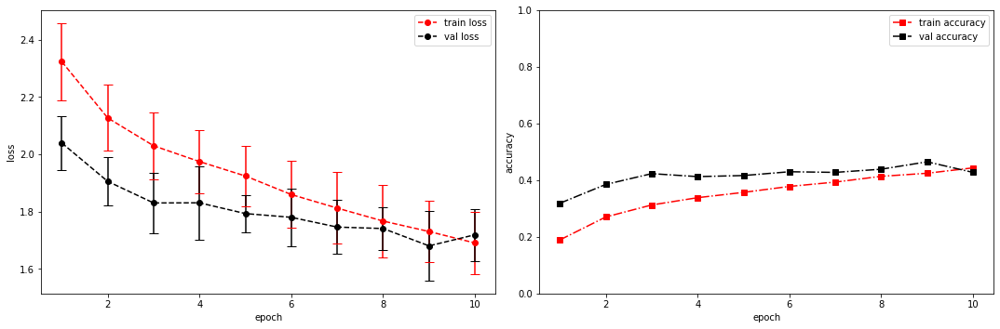

model saved


training epoch:  10
model set to train
Epoch [11/100], step [1/84],  Loss: 1.6745 +/- 0.0000,  accuracy: 0.0263671875, time elapsed = 0.34400129318237305s
Epoch [11/100], step [17/84],  Loss: 1.6399 +/- 0.0931,  accuracy: 0.4521484375, time elapsed = 1.0738120079040527s
Epoch [11/100], step [33/84],  Loss: 1.6623 +/- 0.1089,  accuracy: 0.4453125, time elapsed = 0.9932496547698975s
Epoch [11/100], step [49/84],  Loss: 1.6415 +/- 0.1251,  accuracy: 0.4658203125, time elapsed = 0.97017502784729s
Epoch [11/100], step [65/84],  Loss: 1.6649 +/- 0.1070,  accuracy: 0.453125, time elapsed = 0.9985888004302979s
Epoch [11/100], step [81/84],  Loss: 1.6441 +/- 0.0923,  accuracy: 0.4697265625, time elapsed = 1.018172264099121s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.45776617564795824,  precision = 0.45776617564795824 recall = 0.45776617564795824 f1 = 0.45776617564795824 ::: val: acc = 0.45041014168530946,  precision = 0.45041014168530946 recall = 0.45041014168530946 t

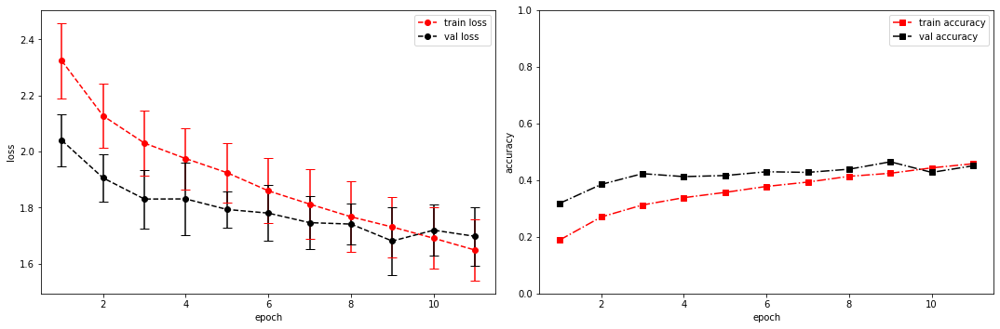

model saved


training epoch:  11
model set to train
Epoch [12/100], step [1/84],  Loss: 1.5251 +/- 0.0000,  accuracy: 0.0302734375, time elapsed = 0.3529973030090332s
Epoch [12/100], step [17/84],  Loss: 1.5716 +/- 0.1220,  accuracy: 0.5009765625, time elapsed = 1.1093525886535645s
Epoch [12/100], step [33/84],  Loss: 1.5735 +/- 0.0891,  accuracy: 0.490234375, time elapsed = 1.1055803298950195s
Epoch [12/100], step [49/84],  Loss: 1.6300 +/- 0.1073,  accuracy: 0.46484375, time elapsed = 1.082033634185791s
Epoch [12/100], step [65/84],  Loss: 1.5641 +/- 0.1077,  accuracy: 0.4814453125, time elapsed = 1.0784494876861572s
Epoch [12/100], step [81/84],  Loss: 1.6072 +/- 0.0993,  accuracy: 0.47265625, time elapsed = 1.109816551208496s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.480701100130524,  precision = 0.480701100130524 recall = 0.480701100130524 f1 = 0.480701100130524 ::: val: acc = 0.47129008202833705,  precision = 0.47129008202833705 recall = 0.47129008202833705 time el

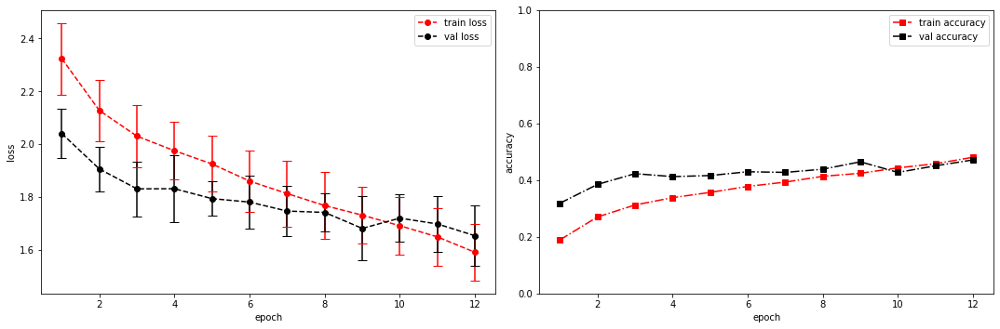

model saved


training epoch:  12
model set to train
Epoch [13/100], step [1/84],  Loss: 1.6988 +/- 0.0000,  accuracy: 0.0283203125, time elapsed = 0.3769378662109375s
Epoch [13/100], step [17/84],  Loss: 1.5536 +/- 0.1064,  accuracy: 0.5048828125, time elapsed = 1.1292314529418945s
Epoch [13/100], step [33/84],  Loss: 1.5187 +/- 0.1052,  accuracy: 0.517578125, time elapsed = 1.0580987930297852s
Epoch [13/100], step [49/84],  Loss: 1.5557 +/- 0.1070,  accuracy: 0.4912109375, time elapsed = 1.0341591835021973s
Epoch [13/100], step [65/84],  Loss: 1.5664 +/- 0.0943,  accuracy: 0.4912109375, time elapsed = 1.0717527866363525s
Epoch [13/100], step [81/84],  Loss: 1.5703 +/- 0.1268,  accuracy: 0.486328125, time elapsed = 1.1026487350463867s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4986015289949655,  precision = 0.4986015289949655 recall = 0.4986015289949655 f1 = 0.4986015289949655 ::: val: acc = 0.4668158090976883,  precision = 0.4668158090976883 recall = 0.4668158090976883 t

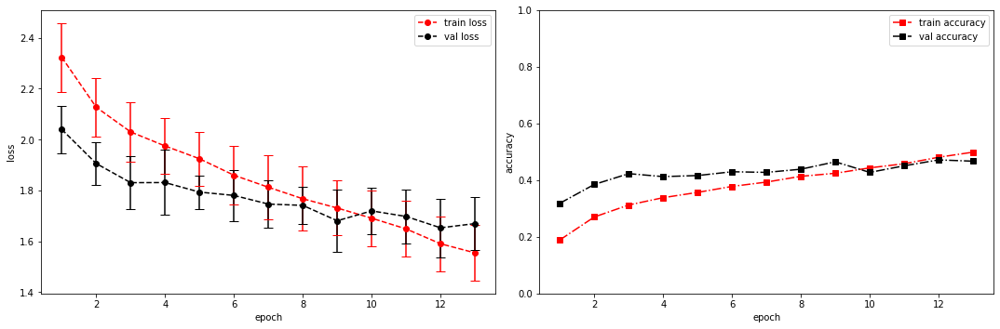

model saved


training epoch:  13
model set to train
Epoch [14/100], step [1/84],  Loss: 1.4385 +/- 0.0000,  accuracy: 0.0302734375, time elapsed = 0.35141563415527344s
Epoch [14/100], step [17/84],  Loss: 1.5004 +/- 0.1441,  accuracy: 0.52734375, time elapsed = 2.35099458694458s
Epoch [14/100], step [33/84],  Loss: 1.5339 +/- 0.1553,  accuracy: 0.50390625, time elapsed = 1.0214104652404785s
Epoch [14/100], step [49/84],  Loss: 1.5128 +/- 0.0876,  accuracy: 0.5126953125, time elapsed = 1.003596305847168s
Epoch [14/100], step [65/84],  Loss: 1.5124 +/- 0.1262,  accuracy: 0.5205078125, time elapsed = 0.9989190101623535s
Epoch [14/100], step [81/84],  Loss: 1.5396 +/- 0.1122,  accuracy: 0.5029296875, time elapsed = 2.038996934890747s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5122133134439679,  precision = 0.5122133134439679 recall = 0.5122133134439679 f1 = 0.5122133134439679 ::: val: acc = 0.4638329604772558,  precision = 0.4638329604772558 recall = 0.4638329604772558 time e

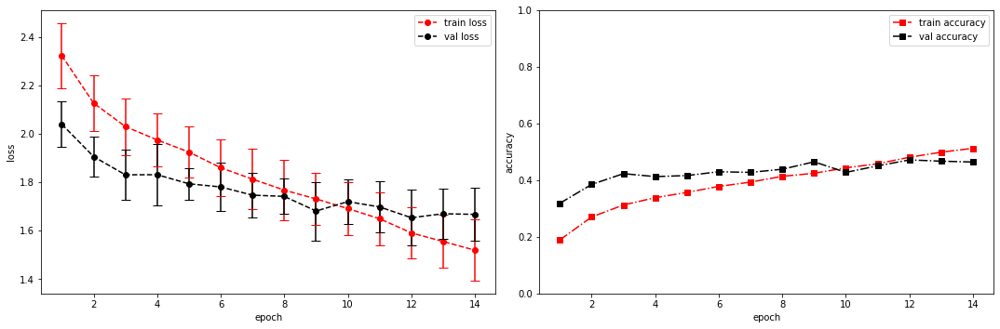

model saved


training epoch:  14
model set to train
Epoch [15/100], step [1/84],  Loss: 1.5321 +/- 0.0000,  accuracy: 0.0322265625, time elapsed = 0.33269429206848145s
Epoch [15/100], step [17/84],  Loss: 1.5115 +/- 0.1043,  accuracy: 0.52734375, time elapsed = 1.0365922451019287s
Epoch [15/100], step [33/84],  Loss: 1.5609 +/- 0.1020,  accuracy: 0.48828125, time elapsed = 1.0030910968780518s
Epoch [15/100], step [49/84],  Loss: 1.5666 +/- 0.1053,  accuracy: 0.4716796875, time elapsed = 1.0021488666534424s
Epoch [15/100], step [65/84],  Loss: 1.5142 +/- 0.0818,  accuracy: 0.5078125, time elapsed = 0.9748752117156982s
Epoch [15/100], step [81/84],  Loss: 1.4859 +/- 0.1215,  accuracy: 0.5234375, time elapsed = 1.005894660949707s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5028901734104047,  precision = 0.5028901734104047 recall = 0.5028901734104047 f1 = 0.5028901734104047 ::: val: acc = 0.47651006711409394,  precision = 0.47651006711409394 recall = 0.47651006711409394 time e

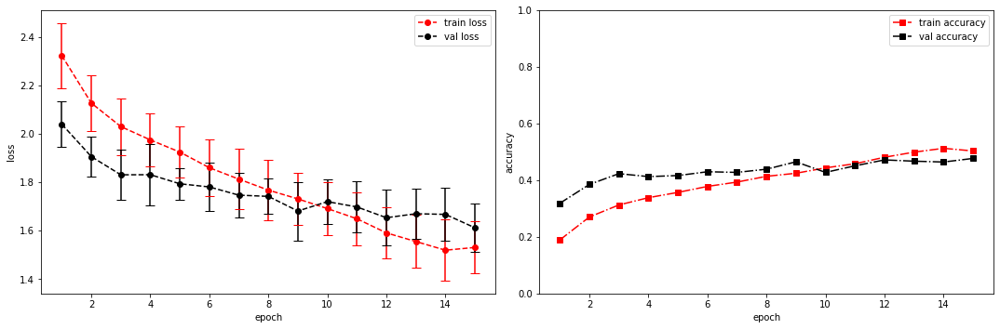

model saved


training epoch:  15
model set to train
Epoch [16/100], step [1/84],  Loss: 1.4345 +/- 0.0000,  accuracy: 0.029296875, time elapsed = 0.33581995964050293s
Epoch [16/100], step [17/84],  Loss: 1.4437 +/- 0.1009,  accuracy: 0.5458984375, time elapsed = 1.0757372379302979s
Epoch [16/100], step [33/84],  Loss: 1.4560 +/- 0.0579,  accuracy: 0.5244140625, time elapsed = 1.0107636451721191s
Epoch [16/100], step [49/84],  Loss: 1.4788 +/- 0.0823,  accuracy: 0.533203125, time elapsed = 0.9947705268859863s
Epoch [16/100], step [65/84],  Loss: 1.4598 +/- 0.1392,  accuracy: 0.541015625, time elapsed = 0.9884300231933594s
Epoch [16/100], step [81/84],  Loss: 1.4194 +/- 0.0777,  accuracy: 0.5546875, time elapsed = 1.004568338394165s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.538877493939959,  precision = 0.538877493939959 recall = 0.538877493939959 f1 = 0.538877493939959 ::: val: acc = 0.47874720357941836,  precision = 0.47874720357941836 recall = 0.47874720357941836 time e

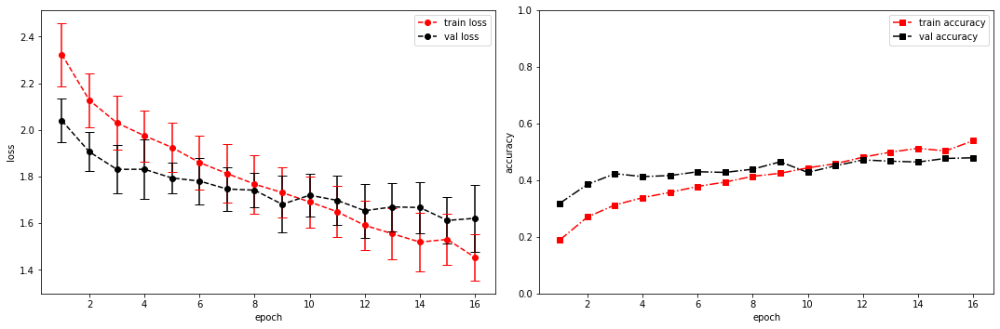

model saved


training epoch:  16
model set to train
Epoch [17/100], step [1/84],  Loss: 1.1647 +/- 0.0000,  accuracy: 0.0400390625, time elapsed = 0.33928823471069336s
Epoch [17/100], step [17/84],  Loss: 1.3896 +/- 0.0925,  accuracy: 0.5517578125, time elapsed = 1.0200202465057373s
Epoch [17/100], step [33/84],  Loss: 1.3696 +/- 0.0933,  accuracy: 0.56640625, time elapsed = 1.007969856262207s
Epoch [17/100], step [49/84],  Loss: 1.4209 +/- 0.1093,  accuracy: 0.541015625, time elapsed = 0.9913527965545654s
Epoch [17/100], step [65/84],  Loss: 1.4083 +/- 0.1114,  accuracy: 0.5361328125, time elapsed = 0.998131513595581s
Epoch [17/100], step [81/84],  Loss: 1.3787 +/- 0.1100,  accuracy: 0.54296875, time elapsed = 0.9941375255584717s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5498787991795637,  precision = 0.5498787991795637 recall = 0.5498787991795637 f1 = 0.5498787991795637 ::: val: acc = 0.4541387024608501,  precision = 0.4541387024608501 recall = 0.4541387024608501 time 

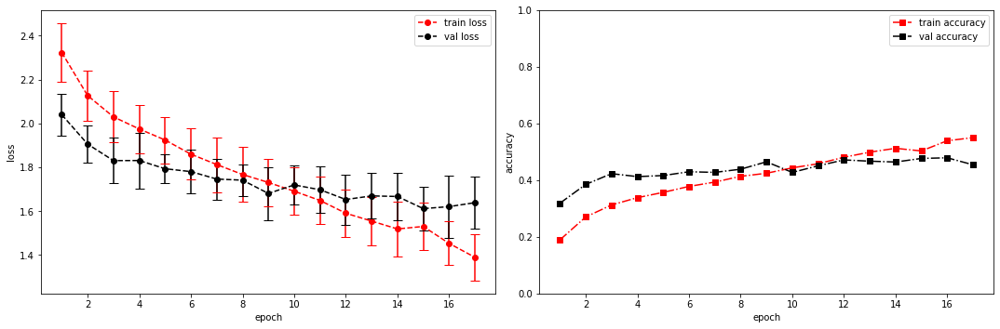

model saved


training epoch:  17
model set to train
Epoch [18/100], step [1/84],  Loss: 1.1984 +/- 0.0000,  accuracy: 0.0419921875, time elapsed = 0.3287637233734131s
Epoch [18/100], step [17/84],  Loss: 1.2969 +/- 0.1307,  accuracy: 0.6103515625, time elapsed = 1.0248298645019531s
Epoch [18/100], step [33/84],  Loss: 1.3698 +/- 0.0842,  accuracy: 0.5712890625, time elapsed = 0.9741721153259277s
Epoch [18/100], step [49/84],  Loss: 1.3434 +/- 0.0889,  accuracy: 0.56640625, time elapsed = 0.9943211078643799s
Epoch [18/100], step [65/84],  Loss: 1.3511 +/- 0.0825,  accuracy: 0.587890625, time elapsed = 1.0620250701904297s
Epoch [18/100], step [81/84],  Loss: 1.2943 +/- 0.0922,  accuracy: 0.576171875, time elapsed = 1.0176608562469482s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5821368636956927,  precision = 0.5821368636956927 recall = 0.5821368636956927 f1 = 0.5821368636956927 ::: val: acc = 0.4817300521998509,  precision = 0.4817300521998509 recall = 0.4817300521998509 tim

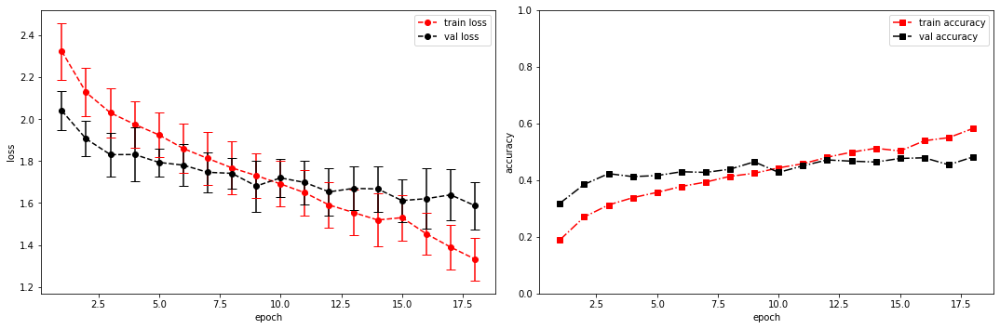

model saved


training epoch:  18
model set to train
Epoch [19/100], step [1/84],  Loss: 1.3394 +/- 0.0000,  accuracy: 0.0302734375, time elapsed = 0.33191847801208496s
Epoch [19/100], step [17/84],  Loss: 1.2908 +/- 0.0976,  accuracy: 0.609375, time elapsed = 1.0439722537994385s
Epoch [19/100], step [33/84],  Loss: 1.2939 +/- 0.1071,  accuracy: 0.59375, time elapsed = 0.9877834320068359s
Epoch [19/100], step [49/84],  Loss: 1.2772 +/- 0.1475,  accuracy: 0.6005859375, time elapsed = 1.0065059661865234s
Epoch [19/100], step [65/84],  Loss: 1.2646 +/- 0.1005,  accuracy: 0.6044921875, time elapsed = 0.9849176406860352s
Epoch [19/100], step [81/84],  Loss: 1.2719 +/- 0.1222,  accuracy: 0.58984375, time elapsed = 0.9947144985198975s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.6002237553608055,  precision = 0.6002237553608055 recall = 0.6002237553608055 f1 = 0.6002237553608055 ::: val: acc = 0.47054436987322895,  precision = 0.47054436987322895 recall = 0.47054436987322895 time e

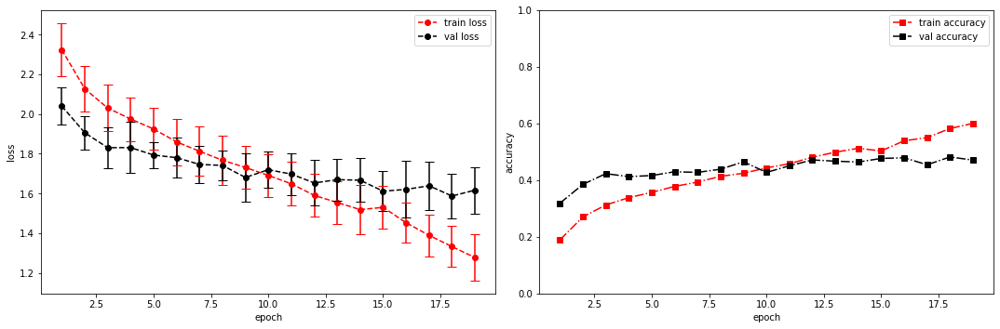

model saved
stopping early
Conv_5_layer
(1, 13, 517)
running model: id = Conv_5_layer, channels = [8, 8, 8, 8, 8]
device:  cuda
dataset metadata:  {'n_fft': 2048, 'hop_length': 256, 'n_mfcc': 13, 'notes': 'optional notes not passed'}
train model: data loaders initialized
sample shape =  (1, 13, 517)
model loaded
Layer (type:depth-idx)                   Output Shape              Param #
├─ConvBlock: 1-1                         [-1, 8, 13, 258]          --
|    └─Sequential: 2-1                   [-1, 8, 13, 258]          --
|    |    └─Conv2d: 3-1                  [-1, 8, 13, 517]          80
|    |    └─ReLU: 3-2                    [-1, 8, 13, 517]          --
|    |    └─MaxPool2d: 3-3               [-1, 8, 13, 258]          --
|    |    └─BatchNorm2d: 3-4             [-1, 8, 13, 258]          16
├─ConvBlock: 1-2                         [-1, 8, 13, 129]          --
|    └─Sequential: 2-2                   [-1, 8, 13, 129]          --
|    |    └─Conv2d: 3-5                  [-1, 8, 13

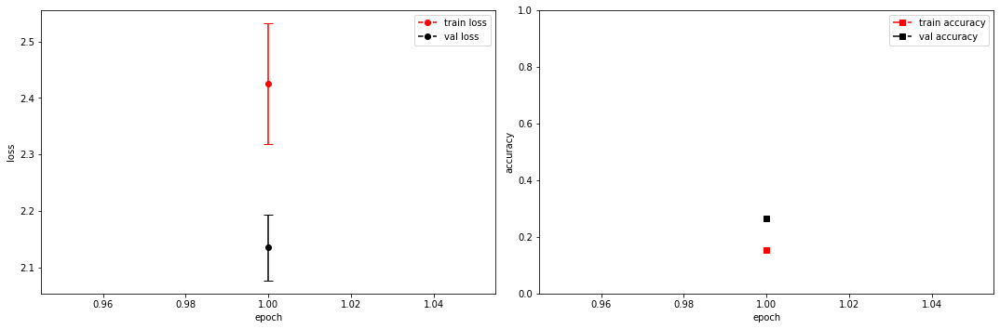

model saved


training epoch:  1
model set to train
Epoch [2/100], step [1/84],  Loss: 2.1539 +/- 0.0000,  accuracy: 0.0126953125, time elapsed = 0.3268907070159912s
Epoch [2/100], step [17/84],  Loss: 2.2917 +/- 0.0854,  accuracy: 0.1796875, time elapsed = 0.9722490310668945s
Epoch [2/100], step [33/84],  Loss: 2.2692 +/- 0.1012,  accuracy: 0.2080078125, time elapsed = 0.9226803779602051s
Epoch [2/100], step [49/84],  Loss: 2.2877 +/- 0.1015,  accuracy: 0.203125, time elapsed = 0.9217691421508789s
Epoch [2/100], step [65/84],  Loss: 2.2561 +/- 0.0856,  accuracy: 0.1982421875, time elapsed = 0.9112558364868164s
Epoch [2/100], step [81/84],  Loss: 2.2360 +/- 0.0713,  accuracy: 0.2265625, time elapsed = 0.9193847179412842s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.2028715271303375,  precision = 0.2028715271303375 recall = 0.2028715271303375 f1 = 0.2028715271303375 ::: val: acc = 0.3012677106636838,  precision = 0.3012677106636838 recall = 0.3012677106636838 time elapsed = 6

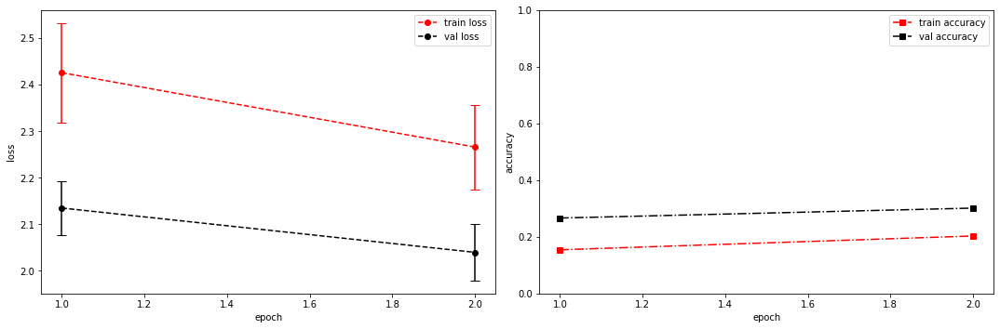

model saved


training epoch:  2
model set to train
Epoch [3/100], step [1/84],  Loss: 2.1909 +/- 0.0000,  accuracy: 0.0146484375, time elapsed = 0.33533167839050293s
Epoch [3/100], step [17/84],  Loss: 2.2127 +/- 0.0895,  accuracy: 0.2109375, time elapsed = 0.9749321937561035s
Epoch [3/100], step [33/84],  Loss: 2.1754 +/- 0.1206,  accuracy: 0.2314453125, time elapsed = 0.9306905269622803s
Epoch [3/100], step [49/84],  Loss: 2.2355 +/- 0.1118,  accuracy: 0.21875, time elapsed = 0.9257535934448242s
Epoch [3/100], step [65/84],  Loss: 2.1903 +/- 0.1152,  accuracy: 0.2265625, time elapsed = 0.9219067096710205s
Epoch [3/100], step [81/84],  Loss: 2.1382 +/- 0.0811,  accuracy: 0.259765625, time elapsed = 0.9151968955993652s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.22990863322767108,  precision = 0.22990863322767108 recall = 0.22990863322767108 f1 = 0.22990863322767108 ::: val: acc = 0.34750186428038776,  precision = 0.34750186428038776 recall = 0.34750186428038776 time elaps

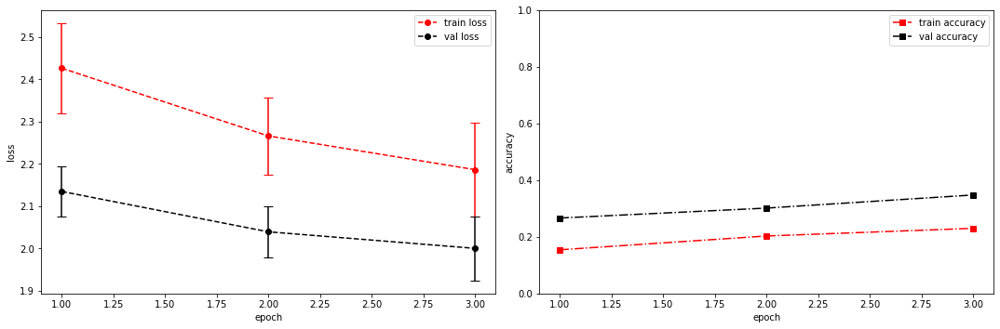

model saved


training epoch:  3
model set to train
Epoch [4/100], step [1/84],  Loss: 2.1537 +/- 0.0000,  accuracy: 0.01171875, time elapsed = 0.3579280376434326s
Epoch [4/100], step [17/84],  Loss: 2.1377 +/- 0.1057,  accuracy: 0.2509765625, time elapsed = 1.0152881145477295s
Epoch [4/100], step [33/84],  Loss: 2.1366 +/- 0.0884,  accuracy: 0.244140625, time elapsed = 0.9600276947021484s
Epoch [4/100], step [49/84],  Loss: 2.1282 +/- 0.1049,  accuracy: 0.2548828125, time elapsed = 0.9302709102630615s
Epoch [4/100], step [65/84],  Loss: 2.1328 +/- 0.0947,  accuracy: 0.244140625, time elapsed = 0.9263651371002197s
Epoch [4/100], step [81/84],  Loss: 2.1372 +/- 0.0935,  accuracy: 0.2666015625, time elapsed = 0.9358510971069336s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.2511653925041954,  precision = 0.2511653925041954 recall = 0.2511653925041954 f1 = 0.2511653925041954 ::: val: acc = 0.3504847129008203,  precision = 0.3504847129008203 recall = 0.3504847129008203 time elaps

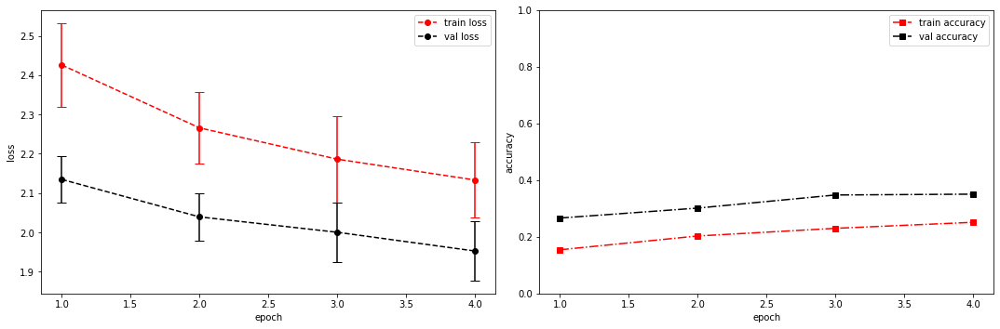

model saved


training epoch:  4
model set to train
Epoch [5/100], step [1/84],  Loss: 2.0394 +/- 0.0000,  accuracy: 0.0166015625, time elapsed = 0.31624794006347656s
Epoch [5/100], step [17/84],  Loss: 2.0721 +/- 0.1019,  accuracy: 0.267578125, time elapsed = 1.0398623943328857s
Epoch [5/100], step [33/84],  Loss: 2.0716 +/- 0.0934,  accuracy: 0.2841796875, time elapsed = 0.9626173973083496s
Epoch [5/100], step [49/84],  Loss: 2.0880 +/- 0.1056,  accuracy: 0.26953125, time elapsed = 0.9301390647888184s
Epoch [5/100], step [65/84],  Loss: 2.0194 +/- 0.1121,  accuracy: 0.3017578125, time elapsed = 0.9194393157958984s
Epoch [5/100], step [81/84],  Loss: 2.1265 +/- 0.1058,  accuracy: 0.26171875, time elapsed = 0.9288685321807861s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.2770837217975014,  precision = 0.2770837217975014 recall = 0.2770837217975014 f1 = 0.2770837217975014 ::: val: acc = 0.3750932140193885,  precision = 0.3750932140193885 recall = 0.3750932140193885 time elaps

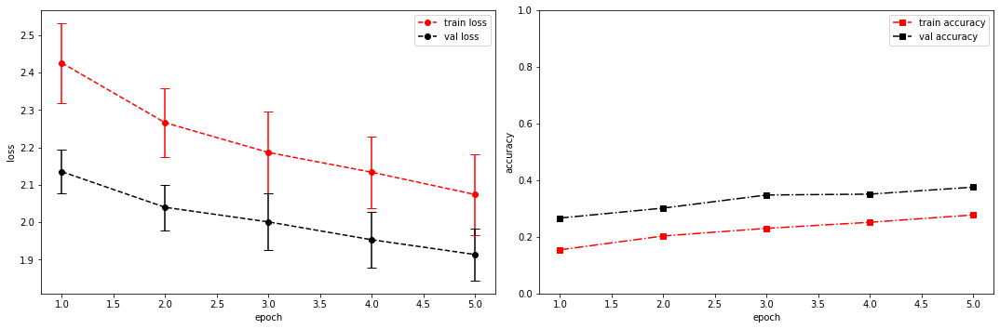

model saved


training epoch:  5
model set to train
Epoch [6/100], step [1/84],  Loss: 1.9769 +/- 0.0000,  accuracy: 0.0205078125, time elapsed = 0.33369898796081543s
Epoch [6/100], step [17/84],  Loss: 2.0292 +/- 0.1251,  accuracy: 0.2998046875, time elapsed = 0.9686815738677979s
Epoch [6/100], step [33/84],  Loss: 1.9823 +/- 0.1301,  accuracy: 0.2998046875, time elapsed = 0.9371318817138672s
Epoch [6/100], step [49/84],  Loss: 2.0403 +/- 0.1037,  accuracy: 0.287109375, time elapsed = 0.9229135513305664s
Epoch [6/100], step [65/84],  Loss: 2.0269 +/- 0.1169,  accuracy: 0.2900390625, time elapsed = 0.9215068817138672s
Epoch [6/100], step [81/84],  Loss: 2.0190 +/- 0.1335,  accuracy: 0.310546875, time elapsed = 0.9221842288970947s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.29815401827335447,  precision = 0.29815401827335447 recall = 0.29815401827335447 f1 = 0.29815401827335447 ::: val: acc = 0.3870246085011186,  precision = 0.3870246085011186 recall = 0.3870246085011186 tim

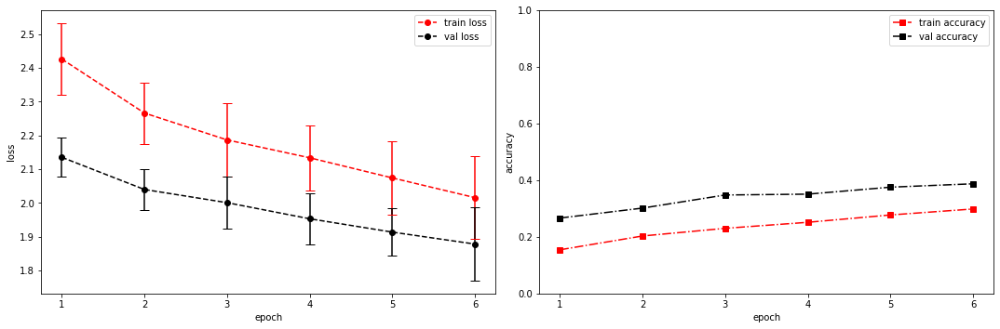

model saved


training epoch:  6
model set to train
Epoch [7/100], step [1/84],  Loss: 1.9770 +/- 0.0000,  accuracy: 0.0185546875, time elapsed = 0.33489513397216797s
Epoch [7/100], step [17/84],  Loss: 1.9627 +/- 0.0872,  accuracy: 0.3046875, time elapsed = 0.9628257751464844s
Epoch [7/100], step [33/84],  Loss: 1.9950 +/- 0.1351,  accuracy: 0.3037109375, time elapsed = 0.9347314834594727s
Epoch [7/100], step [49/84],  Loss: 1.9759 +/- 0.1133,  accuracy: 0.3125, time elapsed = 0.9334137439727783s
Epoch [7/100], step [65/84],  Loss: 2.0394 +/- 0.0883,  accuracy: 0.294921875, time elapsed = 0.9235210418701172s
Epoch [7/100], step [81/84],  Loss: 1.9033 +/- 0.0802,  accuracy: 0.3564453125, time elapsed = 0.9267375469207764s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.31642737273913857,  precision = 0.31642737273913857 recall = 0.31642737273913857 f1 = 0.31642737273913857 ::: val: acc = 0.39149888143176736,  precision = 0.39149888143176736 recall = 0.39149888143176736 time ela

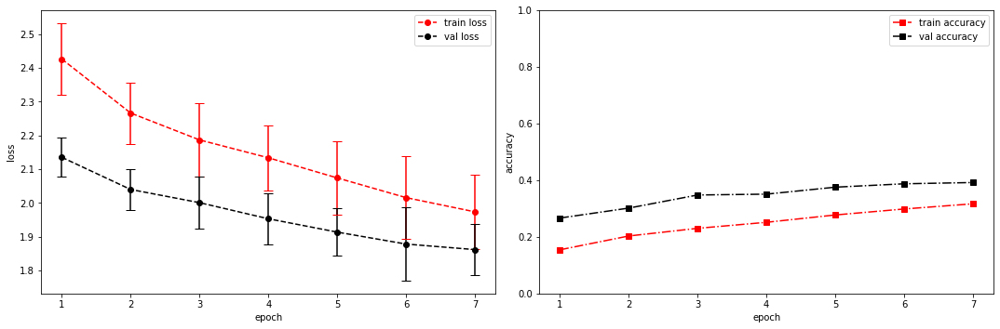

model saved


training epoch:  7
model set to train
Epoch [8/100], step [1/84],  Loss: 2.0545 +/- 0.0000,  accuracy: 0.015625, time elapsed = 0.320875883102417s
Epoch [8/100], step [17/84],  Loss: 1.9655 +/- 0.1069,  accuracy: 0.3076171875, time elapsed = 1.002875804901123s
Epoch [8/100], step [33/84],  Loss: 1.9825 +/- 0.0794,  accuracy: 0.3251953125, time elapsed = 0.9369871616363525s
Epoch [8/100], step [49/84],  Loss: 1.9207 +/- 0.1050,  accuracy: 0.3349609375, time elapsed = 0.9256441593170166s
Epoch [8/100], step [65/84],  Loss: 1.9705 +/- 0.1016,  accuracy: 0.3330078125, time elapsed = 0.9223158359527588s
Epoch [8/100], step [81/84],  Loss: 1.9468 +/- 0.0733,  accuracy: 0.3232421875, time elapsed = 0.9309506416320801s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.32295357076263287,  precision = 0.32295357076263287 recall = 0.32295357076263287 f1 = 0.32295357076263287 ::: val: acc = 0.4064131245339299,  precision = 0.4064131245339299 recall = 0.4064131245339299 time ela

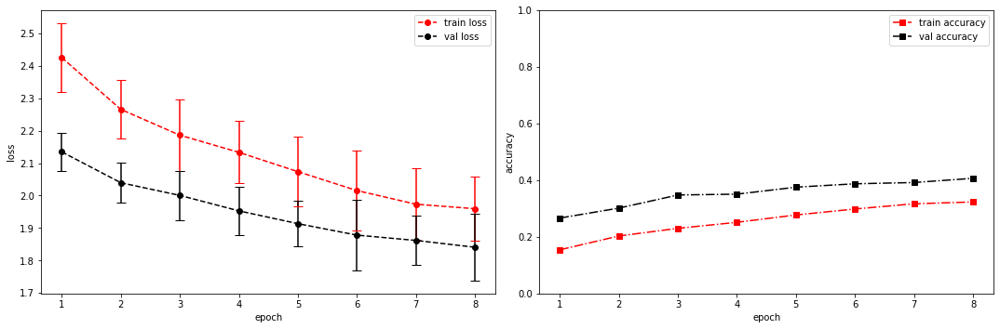

model saved


training epoch:  8
model set to train
Epoch [9/100], step [1/84],  Loss: 2.0295 +/- 0.0000,  accuracy: 0.0166015625, time elapsed = 0.32135915756225586s
Epoch [9/100], step [17/84],  Loss: 1.9161 +/- 0.1398,  accuracy: 0.341796875, time elapsed = 0.9821393489837646s
Epoch [9/100], step [33/84],  Loss: 1.9051 +/- 0.0879,  accuracy: 0.3583984375, time elapsed = 0.9344897270202637s
Epoch [9/100], step [49/84],  Loss: 1.9293 +/- 0.0986,  accuracy: 0.3505859375, time elapsed = 0.9297599792480469s
Epoch [9/100], step [65/84],  Loss: 1.9103 +/- 0.0932,  accuracy: 0.3486328125, time elapsed = 0.9273064136505127s
Epoch [9/100], step [81/84],  Loss: 1.9222 +/- 0.0706,  accuracy: 0.33203125, time elapsed = 0.9328839778900146s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3432780160358009,  precision = 0.3432780160358009 recall = 0.3432780160358009 f1 = 0.3432780160358009 ::: val: acc = 0.40492170022371365,  precision = 0.40492170022371365 recall = 0.40492170022371365 time 

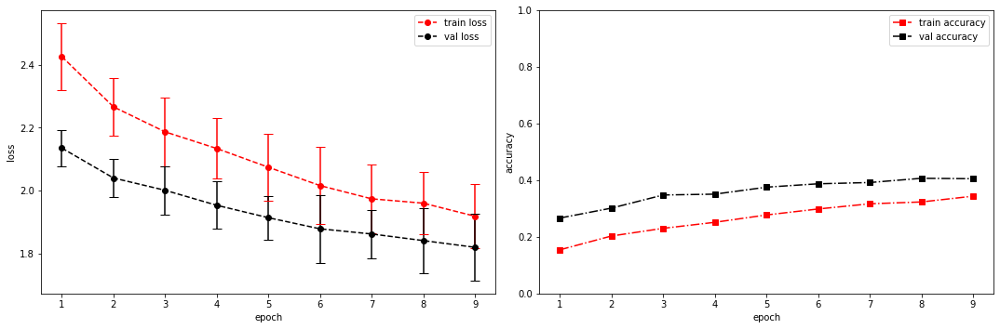

model saved


training epoch:  9
model set to train
Epoch [10/100], step [1/84],  Loss: 1.9865 +/- 0.0000,  accuracy: 0.01953125, time elapsed = 0.33385229110717773s
Epoch [10/100], step [17/84],  Loss: 1.9111 +/- 0.1213,  accuracy: 0.37109375, time elapsed = 0.9816775321960449s
Epoch [10/100], step [33/84],  Loss: 1.8818 +/- 0.1221,  accuracy: 0.37890625, time elapsed = 0.9319615364074707s
Epoch [10/100], step [49/84],  Loss: 1.9141 +/- 0.1133,  accuracy: 0.3544921875, time elapsed = 0.9284753799438477s
Epoch [10/100], step [65/84],  Loss: 1.9057 +/- 0.0958,  accuracy: 0.349609375, time elapsed = 0.9767482280731201s
Epoch [10/100], step [81/84],  Loss: 1.9144 +/- 0.1089,  accuracy: 0.3583984375, time elapsed = 0.9595105648040771s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3615513705015849,  precision = 0.3615513705015849 recall = 0.3615513705015849 f1 = 0.3615513705015849 ::: val: acc = 0.41014168530947054,  precision = 0.41014168530947054 recall = 0.41014168530947054 tim

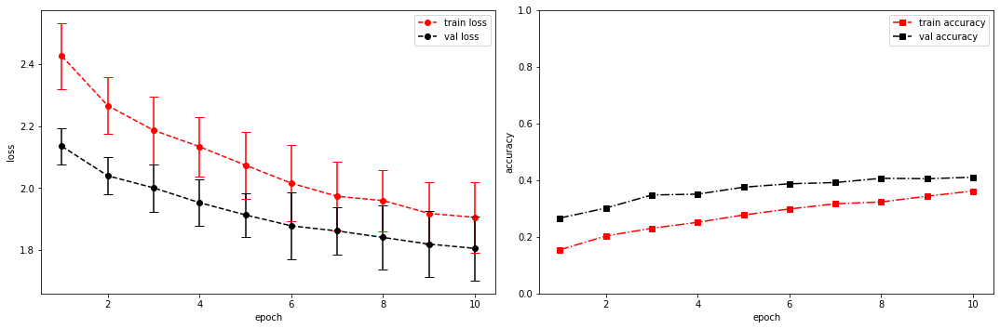

model saved


training epoch:  10
model set to train
Epoch [11/100], step [1/84],  Loss: 1.9809 +/- 0.0000,  accuracy: 0.0205078125, time elapsed = 0.3448469638824463s
Epoch [11/100], step [17/84],  Loss: 1.8277 +/- 0.1192,  accuracy: 0.388671875, time elapsed = 0.9781327247619629s
Epoch [11/100], step [33/84],  Loss: 1.8640 +/- 0.1213,  accuracy: 0.3740234375, time elapsed = 0.9393842220306396s
Epoch [11/100], step [49/84],  Loss: 1.8992 +/- 0.1196,  accuracy: 0.359375, time elapsed = 0.9279656410217285s
Epoch [11/100], step [65/84],  Loss: 1.8735 +/- 0.0910,  accuracy: 0.3701171875, time elapsed = 0.9362742900848389s
Epoch [11/100], step [81/84],  Loss: 1.8881 +/- 0.0782,  accuracy: 0.3544921875, time elapsed = 0.9371814727783203s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.36695879172105167,  precision = 0.36695879172105167 recall = 0.36695879172105167 f1 = 0.36695879172105167 ::: val: acc = 0.407158836689038,  precision = 0.407158836689038 recall = 0.407158836689038 tim

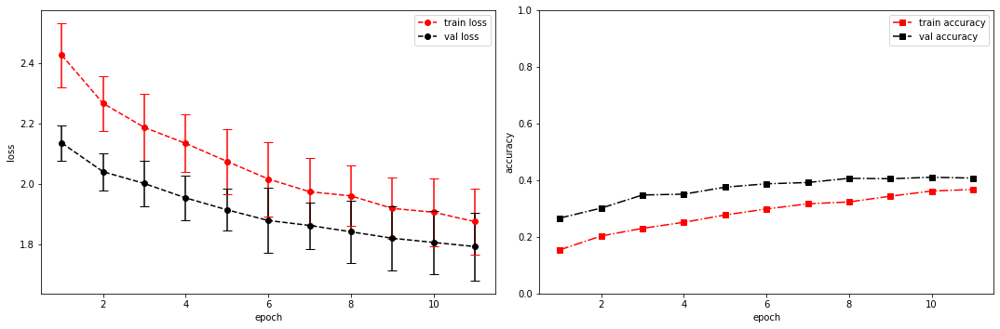

model saved


training epoch:  11
model set to train
Epoch [12/100], step [1/84],  Loss: 1.8502 +/- 0.0000,  accuracy: 0.0283203125, time elapsed = 0.33396029472351074s
Epoch [12/100], step [17/84],  Loss: 1.8620 +/- 0.0778,  accuracy: 0.35546875, time elapsed = 1.0273699760437012s
Epoch [12/100], step [33/84],  Loss: 1.7889 +/- 0.1373,  accuracy: 0.3955078125, time elapsed = 0.9746677875518799s
Epoch [12/100], step [49/84],  Loss: 1.8586 +/- 0.1047,  accuracy: 0.3798828125, time elapsed = 0.9720041751861572s
Epoch [12/100], step [65/84],  Loss: 1.8577 +/- 0.0865,  accuracy: 0.3671875, time elapsed = 0.9453747272491455s
Epoch [12/100], step [81/84],  Loss: 1.8394 +/- 0.0740,  accuracy: 0.359375, time elapsed = 0.9569582939147949s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3732985269438747,  precision = 0.3732985269438747 recall = 0.3732985269438747 f1 = 0.37329852694387466 ::: val: acc = 0.4190902311707681,  precision = 0.4190902311707681 recall = 0.4190902311707681 time e

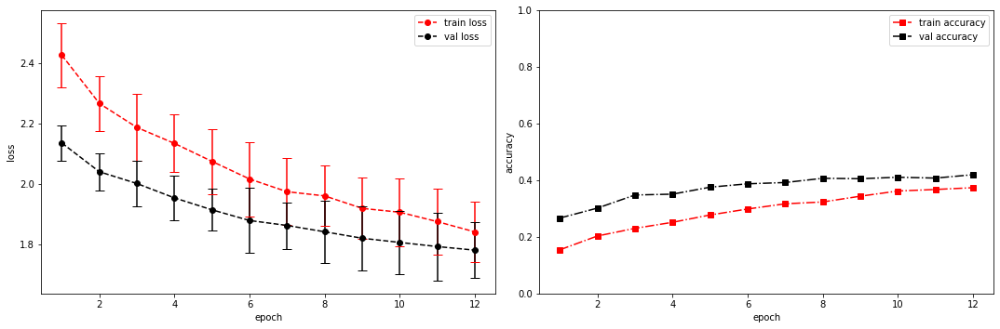

model saved


training epoch:  12
model set to train
Epoch [13/100], step [1/84],  Loss: 1.6995 +/- 0.0000,  accuracy: 0.03125, time elapsed = 0.35002875328063965s
Epoch [13/100], step [17/84],  Loss: 1.7685 +/- 0.1218,  accuracy: 0.400390625, time elapsed = 1.0482535362243652s
Epoch [13/100], step [33/84],  Loss: 1.8302 +/- 0.1291,  accuracy: 0.3779296875, time elapsed = 0.9955835342407227s
Epoch [13/100], step [49/84],  Loss: 1.8384 +/- 0.1162,  accuracy: 0.3720703125, time elapsed = 0.9388694763183594s
Epoch [13/100], step [65/84],  Loss: 1.8114 +/- 0.0982,  accuracy: 0.373046875, time elapsed = 0.9336795806884766s
Epoch [13/100], step [81/84],  Loss: 1.7903 +/- 0.1099,  accuracy: 0.40234375, time elapsed = 0.9285790920257568s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.38560507178817827,  precision = 0.38560507178817827 recall = 0.38560507178817827 f1 = 0.38560507178817827 ::: val: acc = 0.42654735272184935,  precision = 0.42654735272184935 recall = 0.42654735272184935 

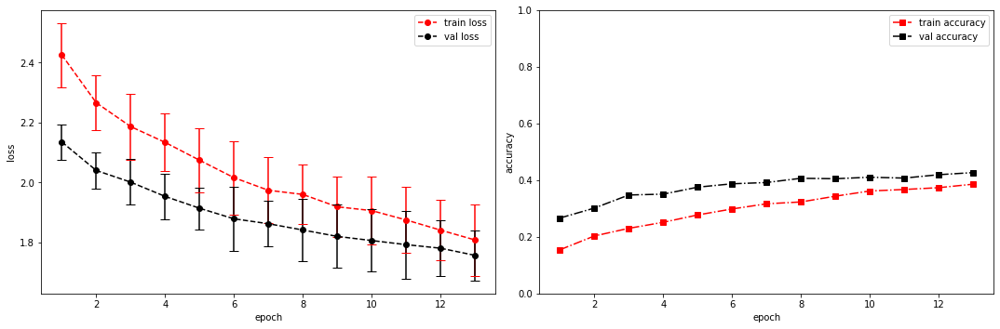

model saved


training epoch:  13
model set to train
Epoch [14/100], step [1/84],  Loss: 1.7460 +/- 0.0000,  accuracy: 0.025390625, time elapsed = 0.3322765827178955s
Epoch [14/100], step [17/84],  Loss: 1.7426 +/- 0.1110,  accuracy: 0.4189453125, time elapsed = 0.9838950634002686s
Epoch [14/100], step [33/84],  Loss: 1.7840 +/- 0.1586,  accuracy: 0.404296875, time elapsed = 0.9290287494659424s
Epoch [14/100], step [49/84],  Loss: 1.7696 +/- 0.1363,  accuracy: 0.400390625, time elapsed = 0.9425520896911621s
Epoch [14/100], step [65/84],  Loss: 1.8093 +/- 0.0987,  accuracy: 0.396484375, time elapsed = 0.9342203140258789s
Epoch [14/100], step [81/84],  Loss: 1.8102 +/- 0.1064,  accuracy: 0.3759765625, time elapsed = 0.9262006282806396s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.40014917024053703,  precision = 0.40014917024053703 recall = 0.40014917024053703 f1 = 0.40014917024053703 ::: val: acc = 0.424310216256525,  precision = 0.424310216256525 recall = 0.424310216256525 ti

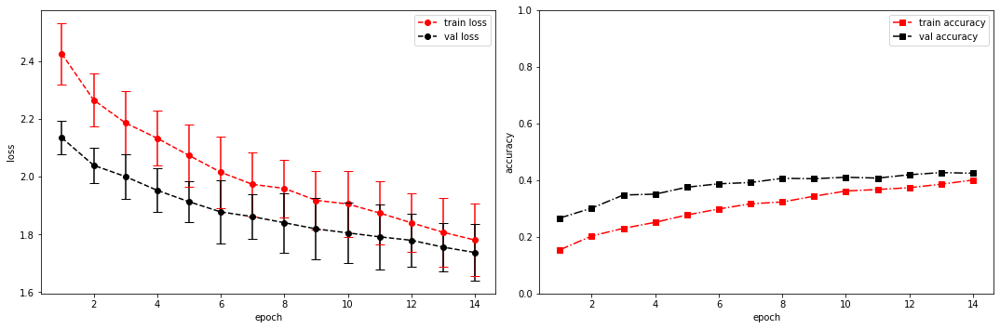

model saved


training epoch:  14
model set to train
Epoch [15/100], step [1/84],  Loss: 1.8652 +/- 0.0000,  accuracy: 0.0224609375, time elapsed = 0.325176477432251s
Epoch [15/100], step [17/84],  Loss: 1.7512 +/- 0.0934,  accuracy: 0.4111328125, time elapsed = 0.9843556880950928s
Epoch [15/100], step [33/84],  Loss: 1.7484 +/- 0.1060,  accuracy: 0.4140625, time elapsed = 0.9259555339813232s
Epoch [15/100], step [49/84],  Loss: 1.7693 +/- 0.0855,  accuracy: 0.404296875, time elapsed = 0.9336986541748047s
Epoch [15/100], step [65/84],  Loss: 1.7534 +/- 0.1012,  accuracy: 0.3974609375, time elapsed = 0.931884765625s
Epoch [15/100], step [81/84],  Loss: 1.7563 +/- 0.1214,  accuracy: 0.4072265625, time elapsed = 0.9351170063018799s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4063024426626888,  precision = 0.4063024426626888 recall = 0.4063024426626888 f1 = 0.40630244266268883 ::: val: acc = 0.43475018642803875,  precision = 0.43475018642803875 recall = 0.43475018642803875 time

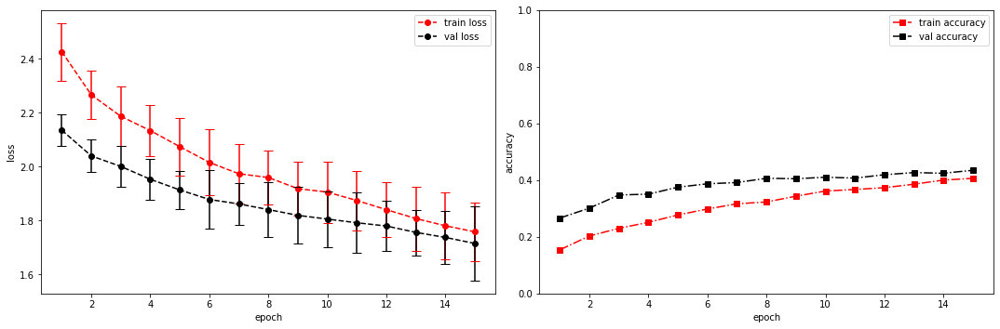

model saved


training epoch:  15
model set to train
Epoch [16/100], step [1/84],  Loss: 1.7633 +/- 0.0000,  accuracy: 0.0205078125, time elapsed = 0.3388330936431885s
Epoch [16/100], step [17/84],  Loss: 1.7605 +/- 0.1101,  accuracy: 0.4130859375, time elapsed = 1.0188570022583008s
Epoch [16/100], step [33/84],  Loss: 1.7403 +/- 0.0886,  accuracy: 0.4140625, time elapsed = 0.9580085277557373s
Epoch [16/100], step [49/84],  Loss: 1.6994 +/- 0.0895,  accuracy: 0.4580078125, time elapsed = 0.9404776096343994s
Epoch [16/100], step [65/84],  Loss: 1.7035 +/- 0.0983,  accuracy: 0.431640625, time elapsed = 0.9955346584320068s
Epoch [16/100], step [81/84],  Loss: 1.6905 +/- 0.1524,  accuracy: 0.412109375, time elapsed = 0.9895246028900146s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4251351855304867,  precision = 0.4251351855304867 recall = 0.4251351855304867 f1 = 0.4251351855304867 ::: val: acc = 0.42953020134228187,  precision = 0.42953020134228187 recall = 0.42953020134228187 t

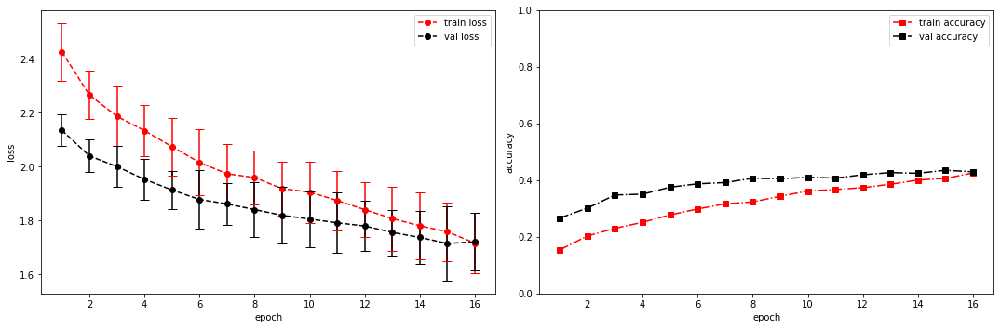

model saved


training epoch:  16
model set to train
Epoch [17/100], step [1/84],  Loss: 1.7310 +/- 0.0000,  accuracy: 0.0244140625, time elapsed = 0.36040592193603516s
Epoch [17/100], step [17/84],  Loss: 1.6972 +/- 0.1195,  accuracy: 0.4296875, time elapsed = 0.9713735580444336s
Epoch [17/100], step [33/84],  Loss: 1.7114 +/- 0.0937,  accuracy: 0.4365234375, time elapsed = 0.935178279876709s
Epoch [17/100], step [49/84],  Loss: 1.7196 +/- 0.1410,  accuracy: 0.4228515625, time elapsed = 0.9737598896026611s
Epoch [17/100], step [65/84],  Loss: 1.7371 +/- 0.1389,  accuracy: 0.412109375, time elapsed = 0.9347066879272461s
Epoch [17/100], step [81/84],  Loss: 1.6869 +/- 0.1200,  accuracy: 0.4228515625, time elapsed = 0.937100887298584s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.42401640872645907,  precision = 0.42401640872645907 recall = 0.42401640872645907 f1 = 0.42401640872645907 ::: val: acc = 0.436241610738255,  precision = 0.436241610738255 recall = 0.436241610738255 tim

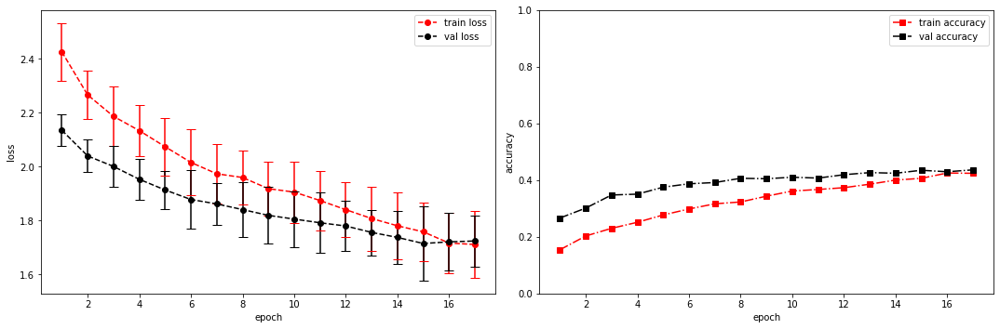

model saved


training epoch:  17
model set to train
Epoch [18/100], step [1/84],  Loss: 1.6054 +/- 0.0000,  accuracy: 0.0322265625, time elapsed = 0.3391745090484619s
Epoch [18/100], step [17/84],  Loss: 1.6506 +/- 0.1456,  accuracy: 0.44140625, time elapsed = 0.983137845993042s
Epoch [18/100], step [33/84],  Loss: 1.7255 +/- 0.1354,  accuracy: 0.416015625, time elapsed = 0.938319206237793s
Epoch [18/100], step [49/84],  Loss: 1.6069 +/- 0.0825,  accuracy: 0.4833984375, time elapsed = 0.9351317882537842s
Epoch [18/100], step [65/84],  Loss: 1.6843 +/- 0.0952,  accuracy: 0.4404296875, time elapsed = 0.9562289714813232s
Epoch [18/100], step [81/84],  Loss: 1.7008 +/- 0.1630,  accuracy: 0.431640625, time elapsed = 0.9334285259246826s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4424762259929144,  precision = 0.4424762259929144 recall = 0.4424762259929144 f1 = 0.4424762259929144 ::: val: acc = 0.43847874720357943,  precision = 0.43847874720357943 recall = 0.43847874720357943 ti

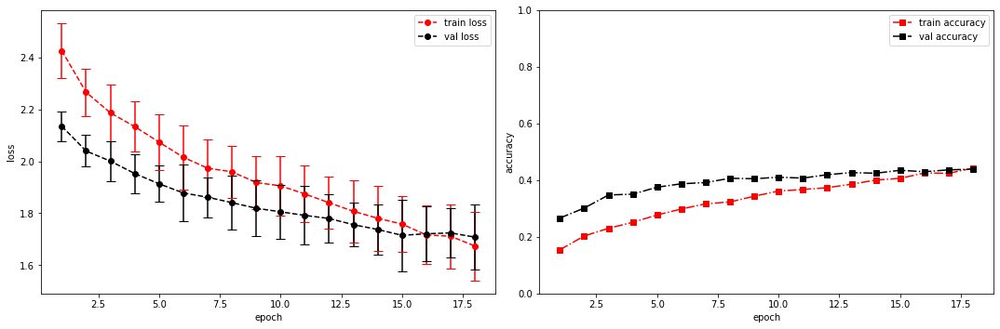

model saved


training epoch:  18
model set to train
Epoch [19/100], step [1/84],  Loss: 1.5334 +/- 0.0000,  accuracy: 0.029296875, time elapsed = 0.3314523696899414s
Epoch [19/100], step [17/84],  Loss: 1.6506 +/- 0.1008,  accuracy: 0.447265625, time elapsed = 0.9854447841644287s
Epoch [19/100], step [33/84],  Loss: 1.6823 +/- 0.1595,  accuracy: 0.4404296875, time elapsed = 0.966346263885498s
Epoch [19/100], step [49/84],  Loss: 1.6191 +/- 0.1342,  accuracy: 0.47265625, time elapsed = 0.9607884883880615s
Epoch [19/100], step [65/84],  Loss: 1.6262 +/- 0.0804,  accuracy: 0.451171875, time elapsed = 0.9665243625640869s
Epoch [19/100], step [81/84],  Loss: 1.7640 +/- 0.1139,  accuracy: 0.4052734375, time elapsed = 0.9554338455200195s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.44396792839828453,  precision = 0.44396792839828453 recall = 0.44396792839828453 f1 = 0.4439679283982846 ::: val: acc = 0.4325130499627144,  precision = 0.4325130499627144 recall = 0.4325130499627144 ti

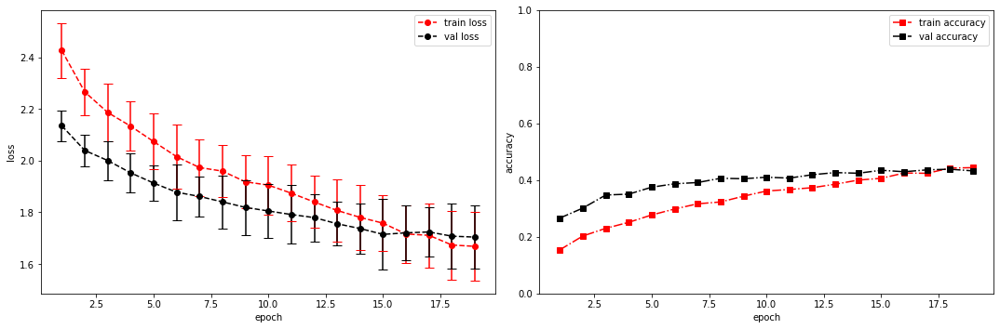

model saved


training epoch:  19
model set to train
Epoch [20/100], step [1/84],  Loss: 1.7921 +/- 0.0000,  accuracy: 0.0234375, time elapsed = 0.421856164932251s
Epoch [20/100], step [17/84],  Loss: 1.6309 +/- 0.0986,  accuracy: 0.4755859375, time elapsed = 1.027235746383667s
Epoch [20/100], step [33/84],  Loss: 1.6427 +/- 0.1004,  accuracy: 0.4287109375, time elapsed = 0.9695348739624023s
Epoch [20/100], step [49/84],  Loss: 1.6786 +/- 0.0957,  accuracy: 0.4482421875, time elapsed = 0.9892964363098145s
Epoch [20/100], step [65/84],  Loss: 1.6309 +/- 0.1464,  accuracy: 0.4619140625, time elapsed = 0.9425966739654541s
Epoch [20/100], step [81/84],  Loss: 1.6544 +/- 0.1404,  accuracy: 0.458984375, time elapsed = 0.995699405670166s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.45366399403319035,  precision = 0.45366399403319035 recall = 0.45366399403319035 f1 = 0.45366399403319035 ::: val: acc = 0.43400447427293065,  precision = 0.43400447427293065 recall = 0.43400447427293065

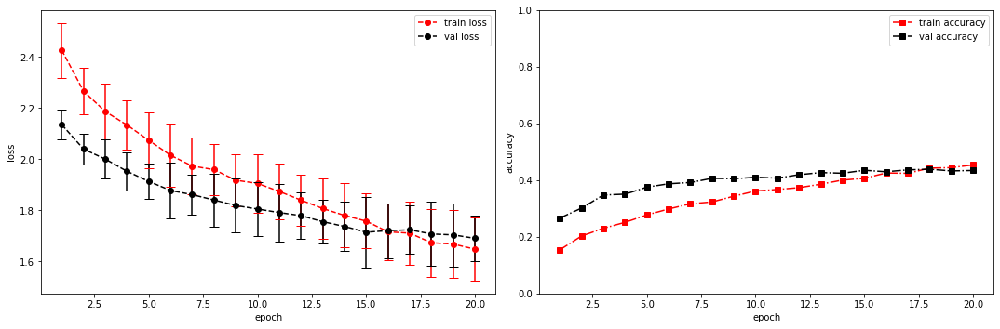

model saved


training epoch:  20
model set to train
Epoch [21/100], step [1/84],  Loss: 1.6599 +/- 0.0000,  accuracy: 0.03125, time elapsed = 0.3501572608947754s
Epoch [21/100], step [17/84],  Loss: 1.5982 +/- 0.1190,  accuracy: 0.4619140625, time elapsed = 1.0175282955169678s
Epoch [21/100], step [33/84],  Loss: 1.5875 +/- 0.1012,  accuracy: 0.4658203125, time elapsed = 0.9898641109466553s
Epoch [21/100], step [49/84],  Loss: 1.5820 +/- 0.1146,  accuracy: 0.498046875, time elapsed = 0.99363112449646s
Epoch [21/100], step [65/84],  Loss: 1.6325 +/- 0.0915,  accuracy: 0.4814453125, time elapsed = 0.9880104064941406s
Epoch [21/100], step [81/84],  Loss: 1.6350 +/- 0.1307,  accuracy: 0.44921875, time elapsed = 0.9376795291900635s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.47398843930635837,  precision = 0.47398843930635837 recall = 0.47398843930635837 f1 = 0.47398843930635837 ::: val: acc = 0.4459358687546607,  precision = 0.4459358687546607 recall = 0.4459358687546607 time 

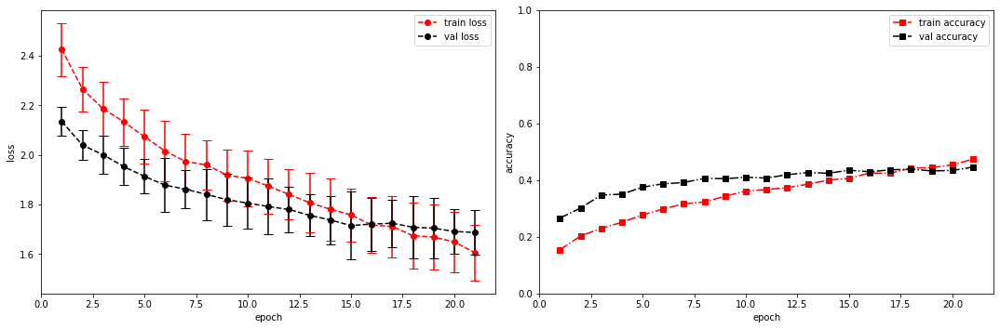

model saved


training epoch:  21
model set to train
Epoch [22/100], step [1/84],  Loss: 1.5685 +/- 0.0000,  accuracy: 0.03125, time elapsed = 0.3441452980041504s
Epoch [22/100], step [17/84],  Loss: 1.6064 +/- 0.1401,  accuracy: 0.4541015625, time elapsed = 0.9865882396697998s
Epoch [22/100], step [33/84],  Loss: 1.5718 +/- 0.1356,  accuracy: 0.48046875, time elapsed = 0.9366743564605713s
Epoch [22/100], step [49/84],  Loss: 1.6043 +/- 0.0997,  accuracy: 0.4501953125, time elapsed = 0.961538553237915s
Epoch [22/100], step [65/84],  Loss: 1.6308 +/- 0.0969,  accuracy: 0.462890625, time elapsed = 0.9703977108001709s
Epoch [22/100], step [81/84],  Loss: 1.5642 +/- 0.1037,  accuracy: 0.4912109375, time elapsed = 1.0003998279571533s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4689539436882342,  precision = 0.4689539436882342 recall = 0.4689539436882342 f1 = 0.4689539436882342 ::: val: acc = 0.4429530201342282,  precision = 0.4429530201342282 recall = 0.4429530201342282 time ela

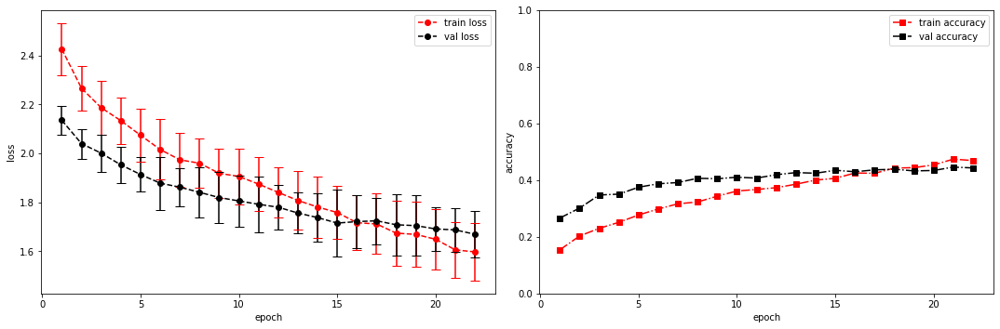

model saved


training epoch:  22
model set to train
Epoch [23/100], step [1/84],  Loss: 1.7141 +/- 0.0000,  accuracy: 0.0263671875, time elapsed = 0.4025695323944092s
Epoch [23/100], step [17/84],  Loss: 1.4730 +/- 0.1107,  accuracy: 0.513671875, time elapsed = 0.9999451637268066s
Epoch [23/100], step [33/84],  Loss: 1.5318 +/- 0.1147,  accuracy: 0.4921875, time elapsed = 1.0193569660186768s
Epoch [23/100], step [49/84],  Loss: 1.5708 +/- 0.1138,  accuracy: 0.4775390625, time elapsed = 1.0207993984222412s
Epoch [23/100], step [65/84],  Loss: 1.5659 +/- 0.1179,  accuracy: 0.494140625, time elapsed = 0.9739954471588135s
Epoch [23/100], step [81/84],  Loss: 1.5781 +/- 0.1202,  accuracy: 0.478515625, time elapsed = 0.9892394542694092s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4883460749580459,  precision = 0.4883460749580459 recall = 0.4883460749580459 f1 = 0.4883460749580459 ::: val: acc = 0.4377330350484713,  precision = 0.4377330350484713 recall = 0.4377330350484713 time 

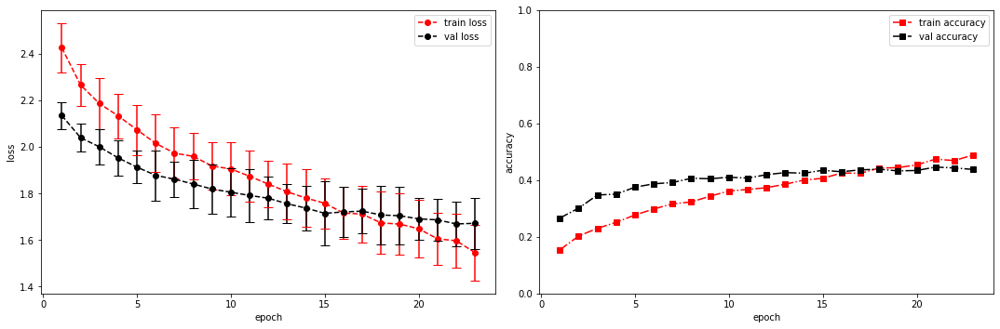

model saved


training epoch:  23
model set to train
Epoch [24/100], step [1/84],  Loss: 1.6652 +/- 0.0000,  accuracy: 0.0283203125, time elapsed = 0.40020203590393066s
Epoch [24/100], step [17/84],  Loss: 1.5163 +/- 0.1317,  accuracy: 0.5029296875, time elapsed = 1.0019688606262207s
Epoch [24/100], step [33/84],  Loss: 1.5423 +/- 0.0819,  accuracy: 0.5107421875, time elapsed = 0.9787147045135498s
Epoch [24/100], step [49/84],  Loss: 1.5268 +/- 0.0972,  accuracy: 0.4853515625, time elapsed = 0.9799361228942871s
Epoch [24/100], step [65/84],  Loss: 1.5642 +/- 0.1403,  accuracy: 0.478515625, time elapsed = 0.9687321186065674s
Epoch [24/100], step [81/84],  Loss: 1.5628 +/- 0.1519,  accuracy: 0.4873046875, time elapsed = 0.9598581790924072s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.49226179377214246,  precision = 0.49226179377214246 recall = 0.49226179377214246 f1 = 0.49226179377214246 ::: val: acc = 0.44146159582401195,  precision = 0.44146159582401195 recall = 0.4414615958

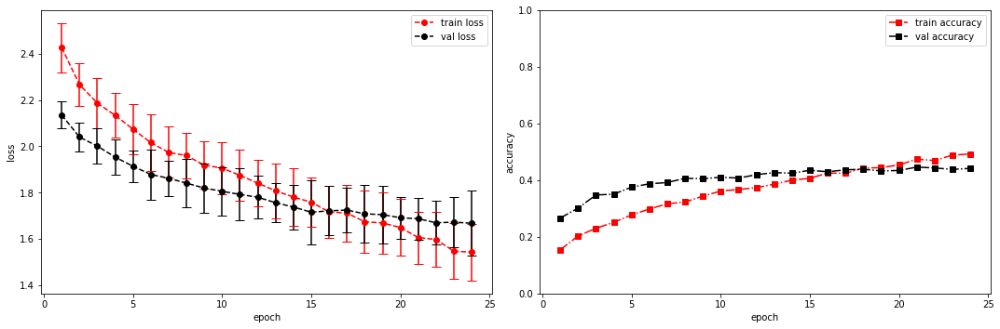

model saved


training epoch:  24
model set to train
Epoch [25/100], step [1/84],  Loss: 1.7225 +/- 0.0000,  accuracy: 0.025390625, time elapsed = 0.3603482246398926s
Epoch [25/100], step [17/84],  Loss: 1.5320 +/- 0.1132,  accuracy: 0.5068359375, time elapsed = 1.001906156539917s
Epoch [25/100], step [33/84],  Loss: 1.4782 +/- 0.0866,  accuracy: 0.517578125, time elapsed = 0.9565103054046631s
Epoch [25/100], step [49/84],  Loss: 1.4745 +/- 0.1313,  accuracy: 0.509765625, time elapsed = 0.9564664363861084s
Epoch [25/100], step [65/84],  Loss: 1.5489 +/- 0.0997,  accuracy: 0.48046875, time elapsed = 0.9603126049041748s
Epoch [25/100], step [81/84],  Loss: 1.5681 +/- 0.1244,  accuracy: 0.484375, time elapsed = 0.952481746673584s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4986015289949655,  precision = 0.4986015289949655 recall = 0.4986015289949655 f1 = 0.4986015289949655 ::: val: acc = 0.43400447427293065,  precision = 0.43400447427293065 recall = 0.43400447427293065 time el

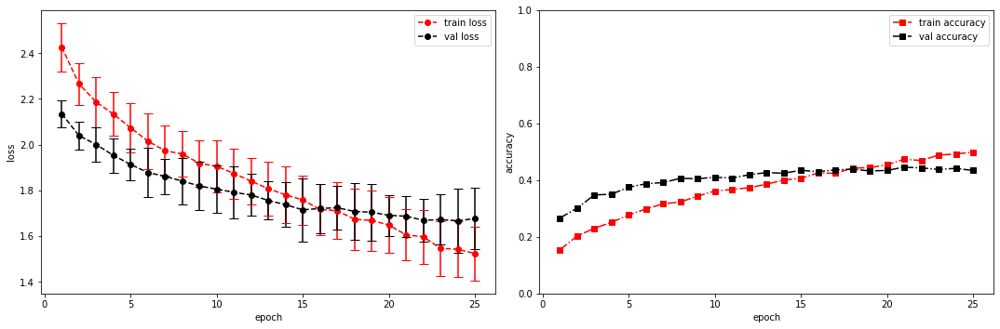

model saved


training epoch:  25
model set to train
Epoch [26/100], step [1/84],  Loss: 1.4464 +/- 0.0000,  accuracy: 0.0283203125, time elapsed = 0.3420712947845459s
Epoch [26/100], step [17/84],  Loss: 1.4690 +/- 0.0866,  accuracy: 0.5146484375, time elapsed = 0.9954807758331299s
Epoch [26/100], step [33/84],  Loss: 1.4644 +/- 0.0947,  accuracy: 0.521484375, time elapsed = 0.9516780376434326s
Epoch [26/100], step [49/84],  Loss: 1.5053 +/- 0.1331,  accuracy: 0.50390625, time elapsed = 0.9451155662536621s
Epoch [26/100], step [65/84],  Loss: 1.5012 +/- 0.1262,  accuracy: 0.5029296875, time elapsed = 0.9297652244567871s
Epoch [26/100], step [81/84],  Loss: 1.5106 +/- 0.1655,  accuracy: 0.494140625, time elapsed = 0.9430227279663086s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5075517434271862,  precision = 0.5075517434271862 recall = 0.5075517434271862 f1 = 0.5075517434271862 ::: val: acc = 0.43922445935868754,  precision = 0.43922445935868754 recall = 0.43922445935868754 

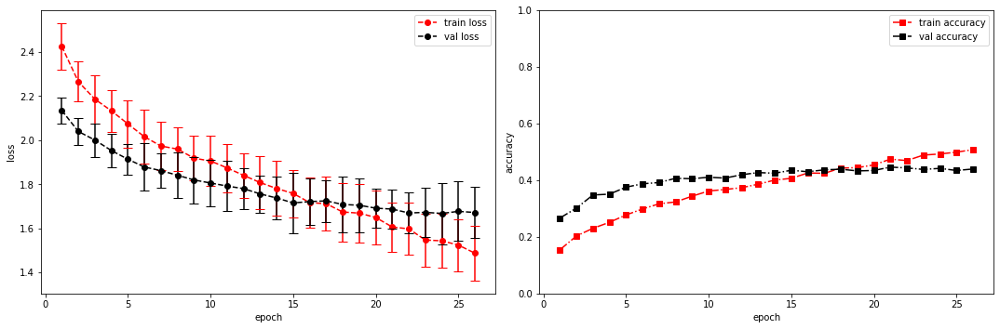

model saved


training epoch:  26
model set to train
Epoch [27/100], step [1/84],  Loss: 1.5785 +/- 0.0000,  accuracy: 0.025390625, time elapsed = 0.3207857608795166s
Epoch [27/100], step [17/84],  Loss: 1.4576 +/- 0.1396,  accuracy: 0.501953125, time elapsed = 0.938072681427002s
Epoch [27/100], step [33/84],  Loss: 1.5156 +/- 0.1073,  accuracy: 0.4951171875, time elapsed = 0.9539353847503662s
Epoch [27/100], step [49/84],  Loss: 1.4732 +/- 0.0699,  accuracy: 0.513671875, time elapsed = 0.9617390632629395s
Epoch [27/100], step [65/84],  Loss: 1.4296 +/- 0.0787,  accuracy: 0.52734375, time elapsed = 0.9321515560150146s
Epoch [27/100], step [81/84],  Loss: 1.4521 +/- 0.1066,  accuracy: 0.5048828125, time elapsed = 0.9650001525878906s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5088569830318851,  precision = 0.5088569830318851 recall = 0.5088569830318851 f1 = 0.5088569830318851 ::: val: acc = 0.43847874720357943,  precision = 0.43847874720357943 recall = 0.43847874720357943 ti

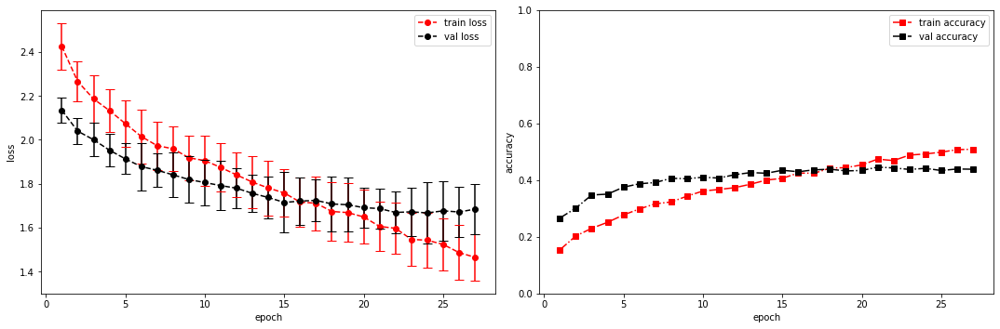

model saved


training epoch:  27
model set to train
Epoch [28/100], step [1/84],  Loss: 1.3966 +/- 0.0000,  accuracy: 0.03125, time elapsed = 0.34372568130493164s
Epoch [28/100], step [17/84],  Loss: 1.5249 +/- 0.1137,  accuracy: 0.501953125, time elapsed = 1.029383897781372s
Epoch [28/100], step [33/84],  Loss: 1.4215 +/- 0.1082,  accuracy: 0.544921875, time elapsed = 0.9495360851287842s
Epoch [28/100], step [49/84],  Loss: 1.4432 +/- 0.1099,  accuracy: 0.517578125, time elapsed = 0.9502999782562256s
Epoch [28/100], step [65/84],  Loss: 1.4352 +/- 0.1339,  accuracy: 0.533203125, time elapsed = 0.9868075847625732s
Epoch [28/100], step [81/84],  Loss: 1.4408 +/- 0.0888,  accuracy: 0.525390625, time elapsed = 0.9661693572998047s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5256386350922991,  precision = 0.5256386350922991 recall = 0.5256386350922991 f1 = 0.5256386350922991 ::: val: acc = 0.4429530201342282,  precision = 0.4429530201342282 recall = 0.4429530201342282 time elap

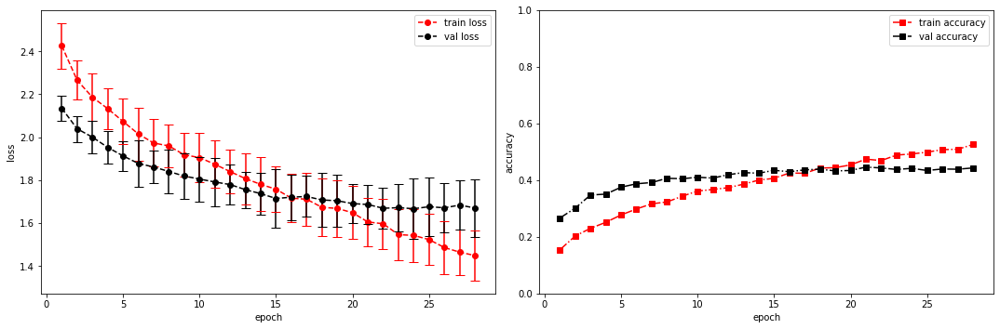

model saved


training epoch:  28
model set to train
Epoch [29/100], step [1/84],  Loss: 1.3092 +/- 0.0000,  accuracy: 0.0380859375, time elapsed = 0.3314476013183594s
Epoch [29/100], step [17/84],  Loss: 1.3793 +/- 0.0858,  accuracy: 0.537109375, time elapsed = 1.0104548931121826s
Epoch [29/100], step [33/84],  Loss: 1.4378 +/- 0.1584,  accuracy: 0.548828125, time elapsed = 0.9954614639282227s
Epoch [29/100], step [49/84],  Loss: 1.4015 +/- 0.1253,  accuracy: 0.5458984375, time elapsed = 0.9523665904998779s
Epoch [29/100], step [65/84],  Loss: 1.4384 +/- 0.1550,  accuracy: 0.521484375, time elapsed = 0.9529664516448975s
Epoch [29/100], step [81/84],  Loss: 1.4222 +/- 0.1208,  accuracy: 0.5361328125, time elapsed = 0.940507173538208s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5379451799366026,  precision = 0.5379451799366026 recall = 0.5379451799366026 f1 = 0.5379451799366026 ::: val: acc = 0.4511558538404176,  precision = 0.4511558538404176 recall = 0.4511558538404176 tim

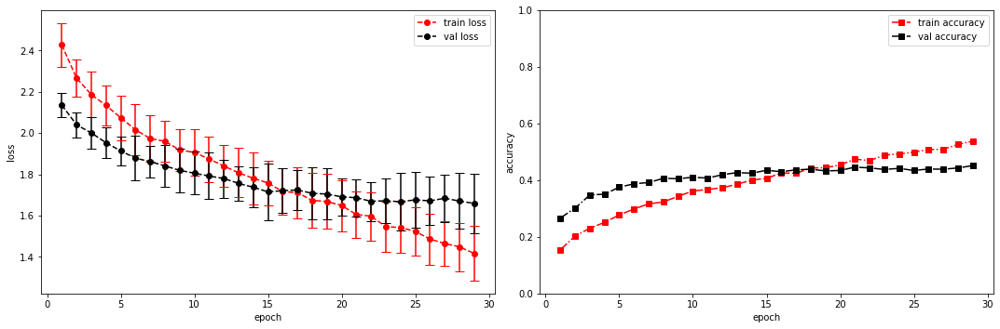

model saved


training epoch:  29
model set to train
Epoch [30/100], step [1/84],  Loss: 1.4133 +/- 0.0000,  accuracy: 0.0302734375, time elapsed = 0.3168625831604004s
Epoch [30/100], step [17/84],  Loss: 1.3977 +/- 0.1237,  accuracy: 0.55078125, time elapsed = 0.9890050888061523s
Epoch [30/100], step [33/84],  Loss: 1.3584 +/- 0.1087,  accuracy: 0.5576171875, time elapsed = 0.9560432434082031s
Epoch [30/100], step [49/84],  Loss: 1.3727 +/- 0.1274,  accuracy: 0.552734375, time elapsed = 0.9392216205596924s
Epoch [30/100], step [65/84],  Loss: 1.3811 +/- 0.1196,  accuracy: 0.546875, time elapsed = 0.9626989364624023s
Epoch [30/100], step [81/84],  Loss: 1.4804 +/- 0.1288,  accuracy: 0.5, time elapsed = 0.9532809257507324s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5426067499533843,  precision = 0.5426067499533843 recall = 0.5426067499533843 f1 = 0.5426067499533843 ::: val: acc = 0.44146159582401195,  precision = 0.44146159582401195 recall = 0.44146159582401195 time elapsed

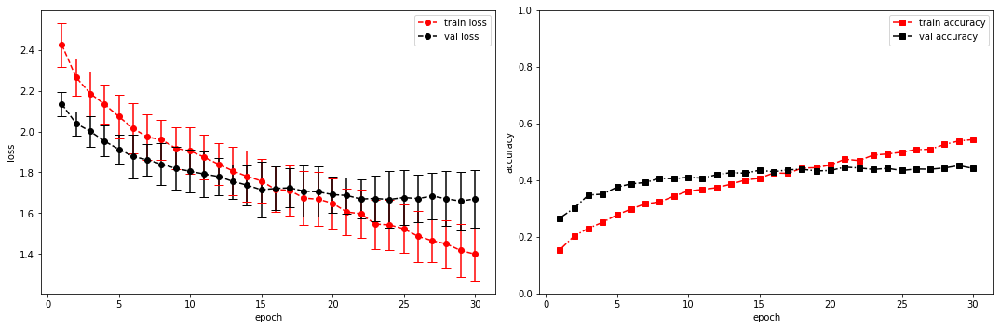

model saved


training epoch:  30
model set to train
Epoch [31/100], step [1/84],  Loss: 1.4211 +/- 0.0000,  accuracy: 0.0302734375, time elapsed = 0.35027074813842773s
Epoch [31/100], step [17/84],  Loss: 1.3754 +/- 0.1064,  accuracy: 0.568359375, time elapsed = 0.9980058670043945s
Epoch [31/100], step [33/84],  Loss: 1.3707 +/- 0.1246,  accuracy: 0.5673828125, time elapsed = 0.9551162719726562s
Epoch [31/100], step [49/84],  Loss: 1.3708 +/- 0.0935,  accuracy: 0.556640625, time elapsed = 0.9409830570220947s
Epoch [31/100], step [65/84],  Loss: 1.3594 +/- 0.1346,  accuracy: 0.5634765625, time elapsed = 0.935715913772583s
Epoch [31/100], step [81/84],  Loss: 1.4119 +/- 0.1241,  accuracy: 0.533203125, time elapsed = 0.9464590549468994s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5550997575983592,  precision = 0.5550997575983592 recall = 0.5550997575983592 f1 = 0.5550997575983592 ::: val: acc = 0.43847874720357943,  precision = 0.43847874720357943 recall = 0.43847874720357943

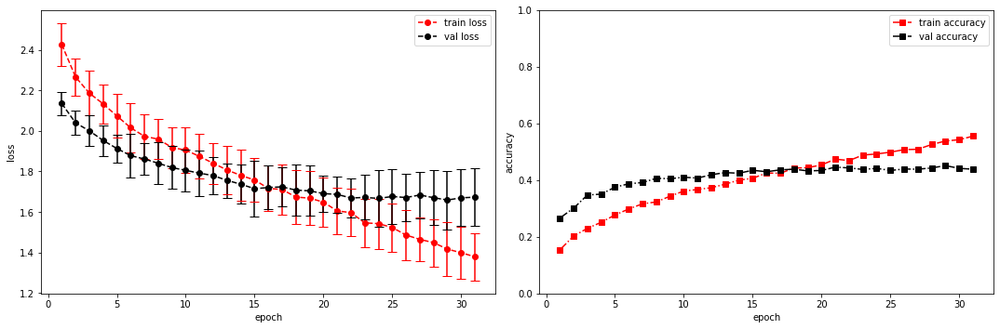

model saved


training epoch:  31
model set to train
Epoch [32/100], step [1/84],  Loss: 1.3815 +/- 0.0000,  accuracy: 0.037109375, time elapsed = 0.33759379386901855s
Epoch [32/100], step [17/84],  Loss: 1.3049 +/- 0.0897,  accuracy: 0.5888671875, time elapsed = 1.0322530269622803s
Epoch [32/100], step [33/84],  Loss: 1.3514 +/- 0.1303,  accuracy: 0.572265625, time elapsed = 0.9534871578216553s
Epoch [32/100], step [49/84],  Loss: 1.3168 +/- 0.1421,  accuracy: 0.5703125, time elapsed = 0.9891583919525146s
Epoch [32/100], step [65/84],  Loss: 1.3703 +/- 0.0836,  accuracy: 0.5537109375, time elapsed = 1.0219695568084717s
Epoch [32/100], step [81/84],  Loss: 1.3781 +/- 0.1084,  accuracy: 0.55078125, time elapsed = 0.9581921100616455s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.56554167443595,  precision = 0.56554167443595 recall = 0.56554167443595 f1 = 0.56554167443595 ::: val: acc = 0.4444444444444444,  precision = 0.4444444444444444 recall = 0.4444444444444444 time elapsed 

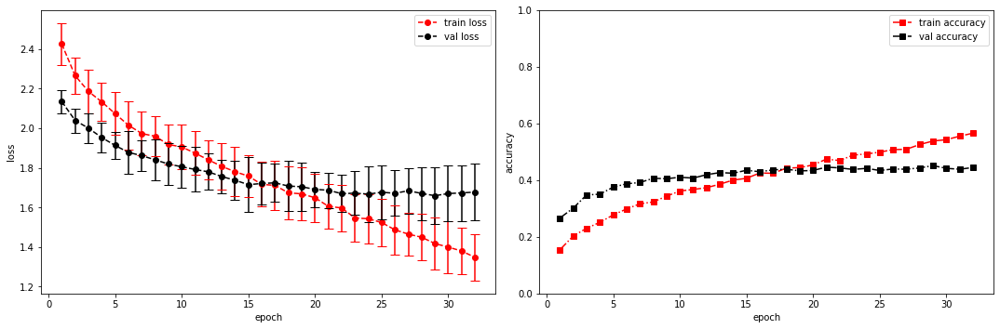

model saved
stopping early
Conv_5_layer
(1, 13, 517)
running model: id = Conv_5_layer, channels = [8, 8, 16, 16, 32]
device:  cuda
dataset metadata:  {'n_fft': 2048, 'hop_length': 256, 'n_mfcc': 13, 'notes': 'optional notes not passed'}
train model: data loaders initialized
sample shape =  (1, 13, 517)
model loaded
Layer (type:depth-idx)                   Output Shape              Param #
├─ConvBlock: 1-1                         [-1, 8, 13, 258]          --
|    └─Sequential: 2-1                   [-1, 8, 13, 258]          --
|    |    └─Conv2d: 3-1                  [-1, 8, 13, 517]          80
|    |    └─ReLU: 3-2                    [-1, 8, 13, 517]          --
|    |    └─MaxPool2d: 3-3               [-1, 8, 13, 258]          --
|    |    └─BatchNorm2d: 3-4             [-1, 8, 13, 258]          16
├─ConvBlock: 1-2                         [-1, 8, 13, 129]          --
|    └─Sequential: 2-2                   [-1, 8, 13, 129]          --
|    |    └─Conv2d: 3-5                  [-1, 8,

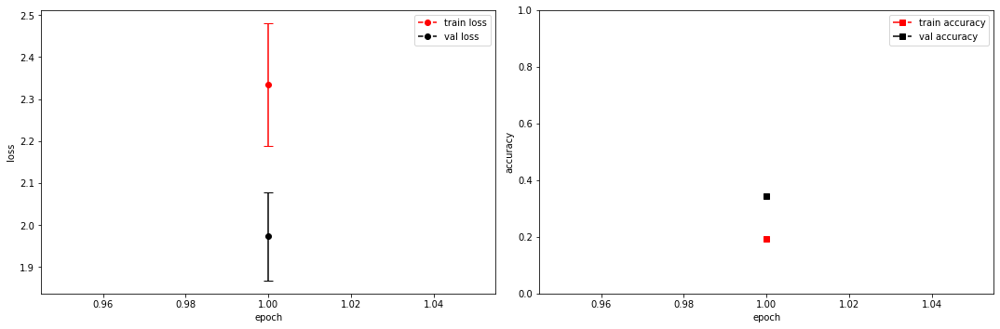

model saved


training epoch:  1
model set to train
Epoch [2/100], step [1/84],  Loss: 2.3320 +/- 0.0000,  accuracy: 0.01171875, time elapsed = 0.3515143394470215s
Epoch [2/100], step [17/84],  Loss: 2.1122 +/- 0.1118,  accuracy: 0.2587890625, time elapsed = 0.9994196891784668s
Epoch [2/100], step [33/84],  Loss: 2.1193 +/- 0.1048,  accuracy: 0.2783203125, time elapsed = 0.9838318824768066s
Epoch [2/100], step [49/84],  Loss: 2.0701 +/- 0.0876,  accuracy: 0.294921875, time elapsed = 0.9478275775909424s
Epoch [2/100], step [65/84],  Loss: 2.0524 +/- 0.1129,  accuracy: 0.2900390625, time elapsed = 0.9861993789672852s
Epoch [2/100], step [81/84],  Loss: 2.0237 +/- 0.1078,  accuracy: 0.3203125, time elapsed = 0.9376280307769775s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.28883087823979114,  precision = 0.28883087823979114 recall = 0.28883087823979114 f1 = 0.28883087823979114 ::: val: acc = 0.3713646532438479,  precision = 0.3713646532438479 recall = 0.3713646532438479 time ela

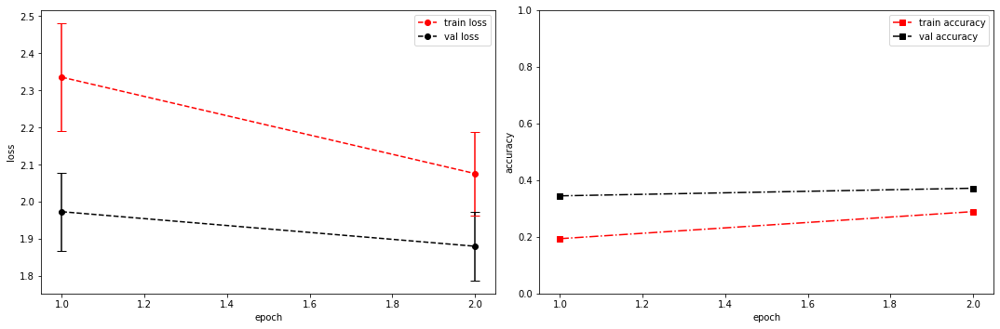

model saved


training epoch:  2
model set to train
Epoch [3/100], step [1/84],  Loss: 1.8751 +/- 0.0000,  accuracy: 0.0205078125, time elapsed = 0.36368823051452637s
Epoch [3/100], step [17/84],  Loss: 1.9120 +/- 0.1153,  accuracy: 0.3486328125, time elapsed = 0.9983947277069092s
Epoch [3/100], step [33/84],  Loss: 2.0109 +/- 0.0924,  accuracy: 0.3056640625, time elapsed = 0.9588663578033447s
Epoch [3/100], step [49/84],  Loss: 2.0070 +/- 0.1160,  accuracy: 0.31640625, time elapsed = 0.9622802734375s
Epoch [3/100], step [65/84],  Loss: 1.9487 +/- 0.1115,  accuracy: 0.3251953125, time elapsed = 0.9304115772247314s
Epoch [3/100], step [81/84],  Loss: 1.9747 +/- 0.1213,  accuracy: 0.345703125, time elapsed = 0.9487111568450928s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.32854745478277086,  precision = 0.32854745478277086 recall = 0.32854745478277086 f1 = 0.32854745478277086 ::: val: acc = 0.4034302759134974,  precision = 0.4034302759134974 recall = 0.4034302759134974 time el

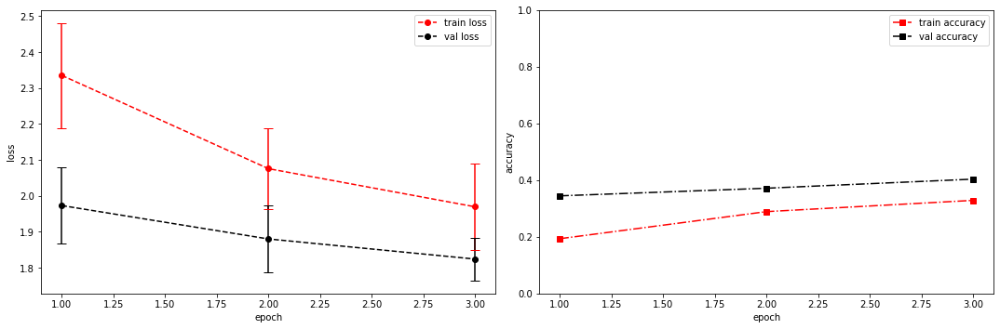

model saved


training epoch:  3
model set to train
Epoch [4/100], step [1/84],  Loss: 1.7083 +/- 0.0000,  accuracy: 0.025390625, time elapsed = 0.3523232936859131s
Epoch [4/100], step [17/84],  Loss: 1.8902 +/- 0.0920,  accuracy: 0.3818359375, time elapsed = 1.032062292098999s
Epoch [4/100], step [33/84],  Loss: 1.8834 +/- 0.0716,  accuracy: 0.3671875, time elapsed = 0.9896867275238037s
Epoch [4/100], step [49/84],  Loss: 1.8783 +/- 0.1354,  accuracy: 0.3837890625, time elapsed = 0.937274694442749s
Epoch [4/100], step [65/84],  Loss: 1.9309 +/- 0.1099,  accuracy: 0.345703125, time elapsed = 0.92881178855896s
Epoch [4/100], step [81/84],  Loss: 1.8550 +/- 0.1059,  accuracy: 0.3818359375, time elapsed = 0.951021671295166s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3749766921499161,  precision = 0.3749766921499161 recall = 0.3749766921499161 f1 = 0.3749766921499161 ::: val: acc = 0.4123788217747949,  precision = 0.4123788217747949 recall = 0.4123788217747949 time elapsed = 6

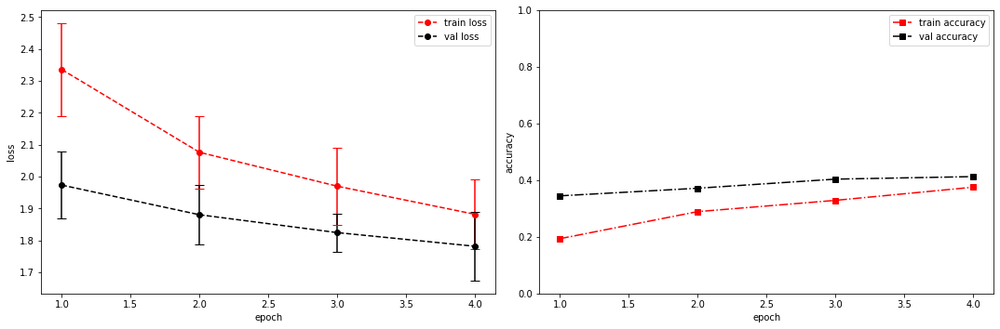

model saved


training epoch:  4
model set to train
Epoch [5/100], step [1/84],  Loss: 1.7493 +/- 0.0000,  accuracy: 0.0263671875, time elapsed = 0.3417394161224365s
Epoch [5/100], step [17/84],  Loss: 1.8072 +/- 0.1032,  accuracy: 0.408203125, time elapsed = 1.0124359130859375s
Epoch [5/100], step [33/84],  Loss: 1.8039 +/- 0.1368,  accuracy: 0.4072265625, time elapsed = 0.9465746879577637s
Epoch [5/100], step [49/84],  Loss: 1.8222 +/- 0.1296,  accuracy: 0.3916015625, time elapsed = 0.9644854068756104s
Epoch [5/100], step [65/84],  Loss: 1.8785 +/- 0.1241,  accuracy: 0.36328125, time elapsed = 0.9462399482727051s
Epoch [5/100], step [81/84],  Loss: 1.7985 +/- 0.1029,  accuracy: 0.412109375, time elapsed = 0.9673147201538086s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.39604698862576915,  precision = 0.39604698862576915 recall = 0.39604698862576915 f1 = 0.39604698862576915 ::: val: acc = 0.4407158836689038,  precision = 0.4407158836689038 recall = 0.4407158836689038 time e

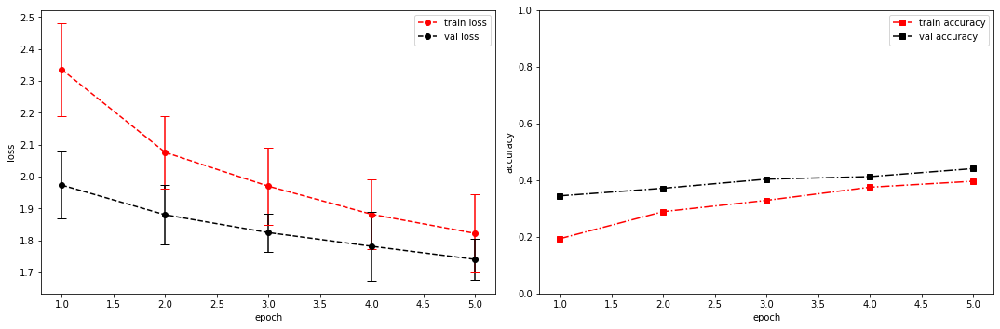

model saved


training epoch:  5
model set to train
Epoch [6/100], step [1/84],  Loss: 1.8575 +/- 0.0000,  accuracy: 0.0224609375, time elapsed = 0.35180020332336426s
Epoch [6/100], step [17/84],  Loss: 1.7943 +/- 0.1011,  accuracy: 0.40625, time elapsed = 0.9940016269683838s
Epoch [6/100], step [33/84],  Loss: 1.7418 +/- 0.1284,  accuracy: 0.4267578125, time elapsed = 0.9695620536804199s
Epoch [6/100], step [49/84],  Loss: 1.7680 +/- 0.1127,  accuracy: 0.4140625, time elapsed = 0.961674690246582s
Epoch [6/100], step [65/84],  Loss: 1.7893 +/- 0.1023,  accuracy: 0.421875, time elapsed = 0.9325051307678223s
Epoch [6/100], step [81/84],  Loss: 1.7320 +/- 0.1308,  accuracy: 0.419921875, time elapsed = 0.9912190437316895s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4186089875069924,  precision = 0.4186089875069924 recall = 0.4186089875069924 f1 = 0.4186089875069924 ::: val: acc = 0.42953020134228187,  precision = 0.42953020134228187 recall = 0.42953020134228187 time elapsed = 6

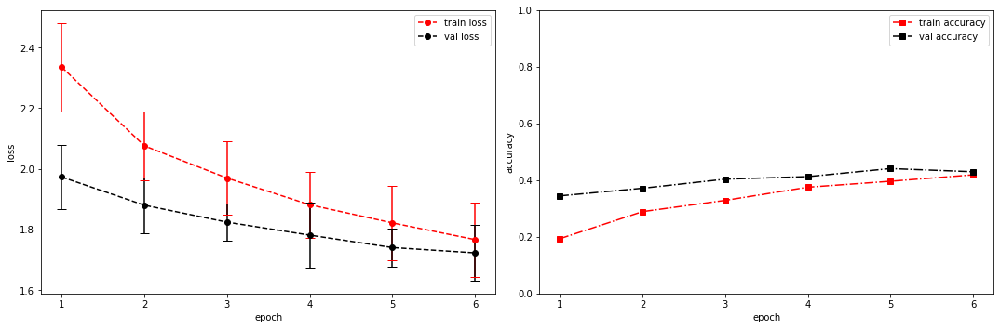

model saved


training epoch:  6
model set to train
Epoch [7/100], step [1/84],  Loss: 1.6633 +/- 0.0000,  accuracy: 0.0302734375, time elapsed = 0.36588597297668457s
Epoch [7/100], step [17/84],  Loss: 1.6852 +/- 0.1211,  accuracy: 0.4541015625, time elapsed = 1.0091972351074219s
Epoch [7/100], step [33/84],  Loss: 1.6844 +/- 0.1120,  accuracy: 0.4345703125, time elapsed = 0.9538719654083252s
Epoch [7/100], step [49/84],  Loss: 1.6492 +/- 0.0959,  accuracy: 0.4697265625, time elapsed = 0.9408950805664062s
Epoch [7/100], step [65/84],  Loss: 1.7075 +/- 0.0894,  accuracy: 0.4501953125, time elapsed = 0.9418544769287109s
Epoch [7/100], step [81/84],  Loss: 1.6884 +/- 0.0582,  accuracy: 0.4521484375, time elapsed = 0.9471514225006104s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.45273168002983405,  precision = 0.45273168002983405 recall = 0.45273168002983405 f1 = 0.45273168002983405 ::: val: acc = 0.4429530201342282,  precision = 0.4429530201342282 recall = 0.4429530201342282 t

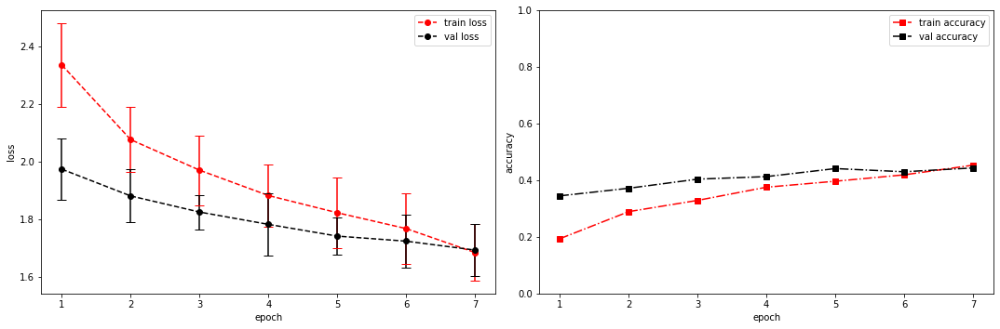

model saved


training epoch:  7
model set to train
Epoch [8/100], step [1/84],  Loss: 1.6340 +/- 0.0000,  accuracy: 0.0302734375, time elapsed = 0.3823883533477783s
Epoch [8/100], step [17/84],  Loss: 1.6030 +/- 0.0824,  accuracy: 0.48046875, time elapsed = 0.947824239730835s
Epoch [8/100], step [33/84],  Loss: 1.6152 +/- 0.1474,  accuracy: 0.49609375, time elapsed = 0.944404125213623s
Epoch [8/100], step [49/84],  Loss: 1.6286 +/- 0.1360,  accuracy: 0.486328125, time elapsed = 0.9540805816650391s
Epoch [8/100], step [65/84],  Loss: 1.5869 +/- 0.1296,  accuracy: 0.4892578125, time elapsed = 0.9389111995697021s
Epoch [8/100], step [81/84],  Loss: 1.5861 +/- 0.0922,  accuracy: 0.4736328125, time elapsed = 0.9408400058746338s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4853626701473056,  precision = 0.4853626701473056 recall = 0.4853626701473056 f1 = 0.4853626701473056 ::: val: acc = 0.4519015659955257,  precision = 0.4519015659955257 recall = 0.4519015659955257 time elapsed 

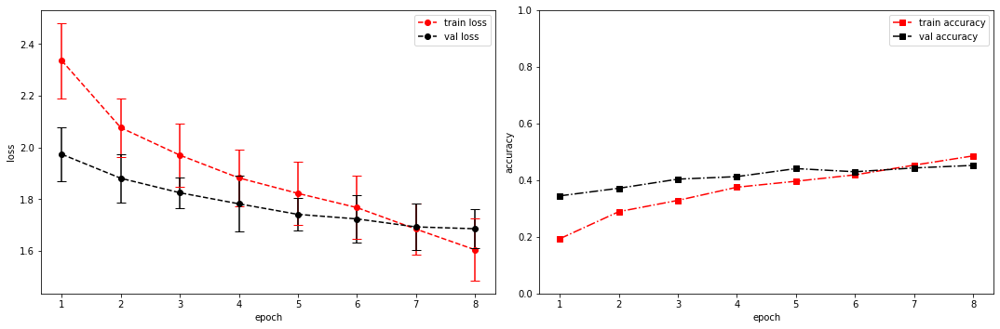

model saved


training epoch:  8
model set to train
Epoch [9/100], step [1/84],  Loss: 1.6729 +/- 0.0000,  accuracy: 0.0283203125, time elapsed = 0.34999823570251465s
Epoch [9/100], step [17/84],  Loss: 1.5159 +/- 0.0951,  accuracy: 0.4951171875, time elapsed = 0.9798018932342529s
Epoch [9/100], step [33/84],  Loss: 1.5745 +/- 0.0733,  accuracy: 0.4892578125, time elapsed = 0.9502079486846924s
Epoch [9/100], step [49/84],  Loss: 1.5462 +/- 0.1137,  accuracy: 0.51171875, time elapsed = 0.942147970199585s
Epoch [9/100], step [65/84],  Loss: 1.5432 +/- 0.0916,  accuracy: 0.4931640625, time elapsed = 0.9578595161437988s
Epoch [9/100], step [81/84],  Loss: 1.5499 +/- 0.1287,  accuracy: 0.5205078125, time elapsed = 0.9560954570770264s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5010255454036919,  precision = 0.5010255454036919 recall = 0.5010255454036919 f1 = 0.5010255454036919 ::: val: acc = 0.4608501118568233,  precision = 0.4608501118568233 recall = 0.4608501118568233 time ela

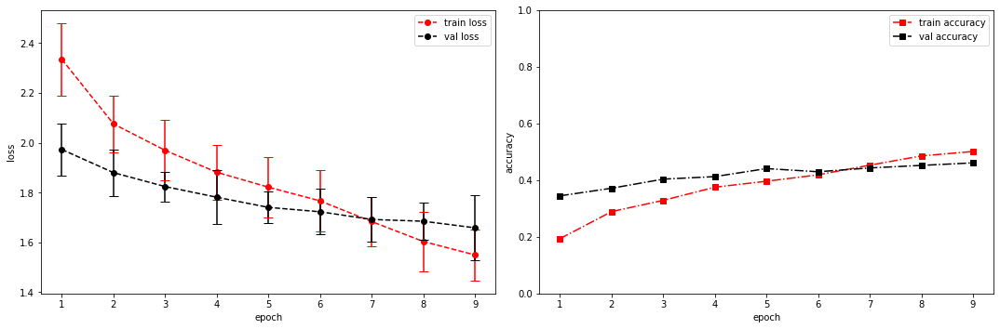

model saved


training epoch:  9
model set to train
Epoch [10/100], step [1/84],  Loss: 1.4513 +/- 0.0000,  accuracy: 0.03125, time elapsed = 0.36470484733581543s
Epoch [10/100], step [17/84],  Loss: 1.4679 +/- 0.1045,  accuracy: 0.537109375, time elapsed = 1.0209307670593262s
Epoch [10/100], step [33/84],  Loss: 1.5165 +/- 0.0922,  accuracy: 0.5224609375, time elapsed = 0.9471702575683594s
Epoch [10/100], step [49/84],  Loss: 1.4692 +/- 0.0882,  accuracy: 0.5185546875, time elapsed = 0.9704649448394775s
Epoch [10/100], step [65/84],  Loss: 1.4870 +/- 0.1150,  accuracy: 0.5361328125, time elapsed = 0.9460651874542236s
Epoch [10/100], step [81/84],  Loss: 1.5235 +/- 0.1261,  accuracy: 0.5146484375, time elapsed = 0.960946798324585s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5245198582882715,  precision = 0.5245198582882715 recall = 0.5245198582882715 f1 = 0.5245198582882715 ::: val: acc = 0.4720357941834452,  precision = 0.4720357941834452 recall = 0.4720357941834452 time e

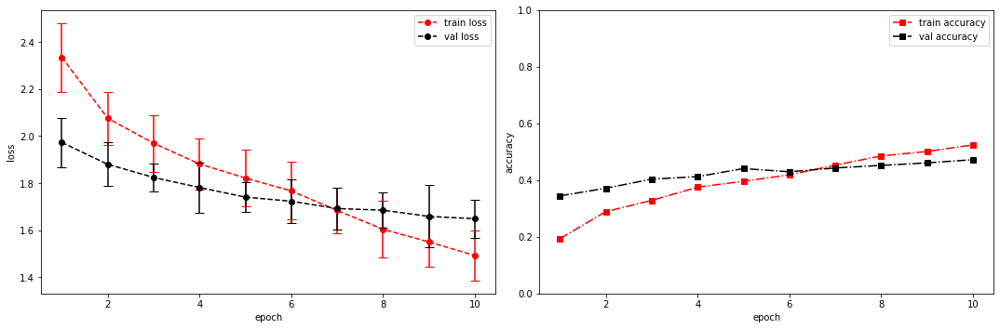

model saved


training epoch:  10
model set to train
Epoch [11/100], step [1/84],  Loss: 1.3886 +/- 0.0000,  accuracy: 0.0361328125, time elapsed = 0.35103631019592285s
Epoch [11/100], step [17/84],  Loss: 1.3989 +/- 0.0834,  accuracy: 0.56640625, time elapsed = 1.0853354930877686s
Epoch [11/100], step [33/84],  Loss: 1.4516 +/- 0.1148,  accuracy: 0.52734375, time elapsed = 0.9724559783935547s
Epoch [11/100], step [49/84],  Loss: 1.4287 +/- 0.0832,  accuracy: 0.5576171875, time elapsed = 0.9724211692810059s
Epoch [11/100], step [65/84],  Loss: 1.4635 +/- 0.1612,  accuracy: 0.54296875, time elapsed = 0.9393186569213867s
Epoch [11/100], step [81/84],  Loss: 1.3882 +/- 0.1056,  accuracy: 0.576171875, time elapsed = 0.9703390598297119s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5534215923923177,  precision = 0.5534215923923177 recall = 0.5534215923923177 f1 = 0.5534215923923177 ::: val: acc = 0.46830723340790453,  precision = 0.46830723340790453 recall = 0.46830723340790453 ti

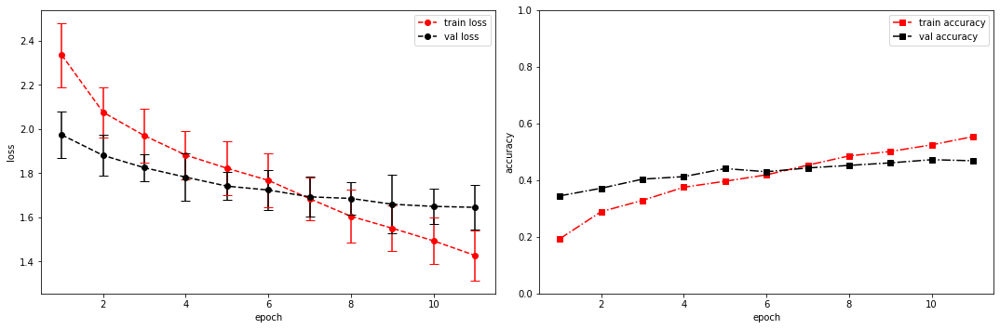

model saved


training epoch:  11
model set to train
Epoch [12/100], step [1/84],  Loss: 1.3678 +/- 0.0000,  accuracy: 0.0361328125, time elapsed = 0.3510892391204834s
Epoch [12/100], step [17/84],  Loss: 1.3425 +/- 0.1022,  accuracy: 0.5986328125, time elapsed = 0.9815464019775391s
Epoch [12/100], step [33/84],  Loss: 1.3463 +/- 0.1187,  accuracy: 0.580078125, time elapsed = 0.9548733234405518s
Epoch [12/100], step [49/84],  Loss: 1.3659 +/- 0.1114,  accuracy: 0.5927734375, time elapsed = 0.9357917308807373s
Epoch [12/100], step [65/84],  Loss: 1.3880 +/- 0.1224,  accuracy: 0.552734375, time elapsed = 0.9581823348999023s
Epoch [12/100], step [81/84],  Loss: 1.3466 +/- 0.0957,  accuracy: 0.5859375, time elapsed = 0.9497792720794678s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5821368636956927,  precision = 0.5821368636956927 recall = 0.5821368636956927 f1 = 0.5821368636956927 ::: val: acc = 0.4817300521998509,  precision = 0.4817300521998509 recall = 0.4817300521998509 time

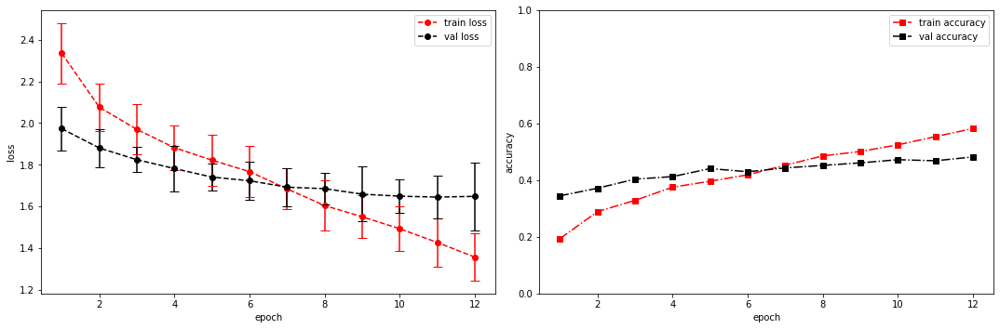

model saved


training epoch:  12
model set to train
Epoch [13/100], step [1/84],  Loss: 1.3325 +/- 0.0000,  accuracy: 0.037109375, time elapsed = 0.3540153503417969s
Epoch [13/100], step [17/84],  Loss: 1.2752 +/- 0.0780,  accuracy: 0.6025390625, time elapsed = 0.9996845722198486s
Epoch [13/100], step [33/84],  Loss: 1.2319 +/- 0.1066,  accuracy: 0.6455078125, time elapsed = 0.9330952167510986s
Epoch [13/100], step [49/84],  Loss: 1.2737 +/- 0.0995,  accuracy: 0.599609375, time elapsed = 0.9444031715393066s
Epoch [13/100], step [65/84],  Loss: 1.2781 +/- 0.1062,  accuracy: 0.6142578125, time elapsed = 0.9594643115997314s
Epoch [13/100], step [81/84],  Loss: 1.3417 +/- 0.1081,  accuracy: 0.5908203125, time elapsed = 0.9522545337677002s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.6104792093977252,  precision = 0.6104792093977252 recall = 0.6104792093977252 f1 = 0.6104792093977252 ::: val: acc = 0.4802386278896346,  precision = 0.4802386278896346 recall = 0.4802386278896346 t

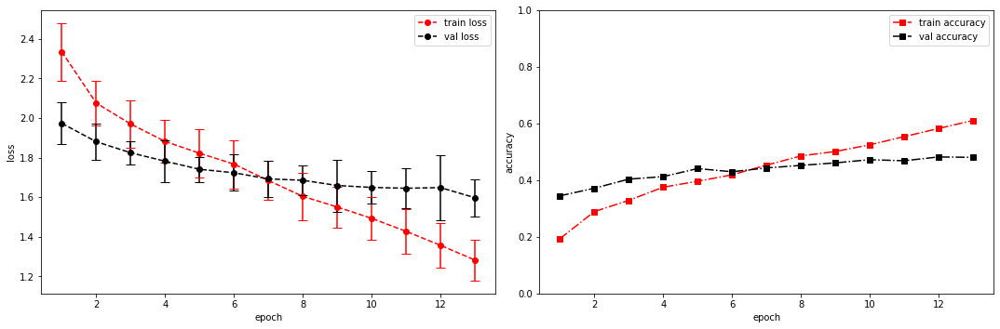

model saved
stopping early
Conv_5_layer
(1, 13, 517)
running model: id = Conv_5_layer, channels = [8, 8, 16, 32, 64]
device:  cuda
dataset metadata:  {'n_fft': 2048, 'hop_length': 256, 'n_mfcc': 13, 'notes': 'optional notes not passed'}
train model: data loaders initialized
sample shape =  (1, 13, 517)
model loaded
Layer (type:depth-idx)                   Output Shape              Param #
├─ConvBlock: 1-1                         [-1, 8, 13, 258]          --
|    └─Sequential: 2-1                   [-1, 8, 13, 258]          --
|    |    └─Conv2d: 3-1                  [-1, 8, 13, 517]          80
|    |    └─ReLU: 3-2                    [-1, 8, 13, 517]          --
|    |    └─MaxPool2d: 3-3               [-1, 8, 13, 258]          --
|    |    └─BatchNorm2d: 3-4             [-1, 8, 13, 258]          16
├─ConvBlock: 1-2                         [-1, 8, 13, 129]          --
|    └─Sequential: 2-2                   [-1, 8, 13, 129]          --
|    |    └─Conv2d: 3-5                  [-1, 8,

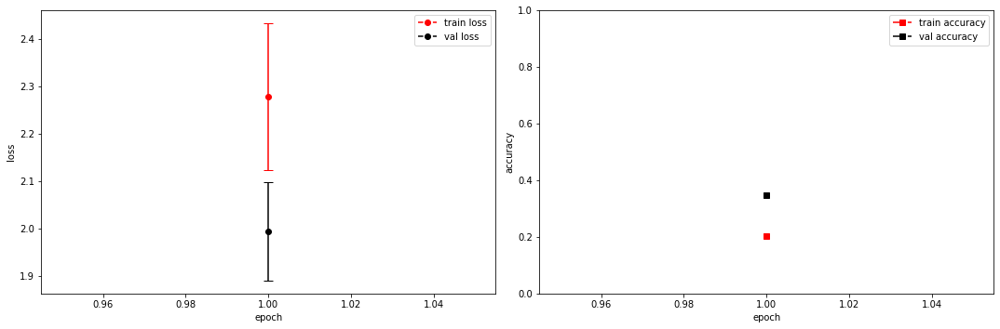

model saved


training epoch:  1
model set to train
Epoch [2/100], step [1/84],  Loss: 2.1473 +/- 0.0000,  accuracy: 0.0146484375, time elapsed = 0.35257744789123535s
Epoch [2/100], step [17/84],  Loss: 2.0707 +/- 0.0814,  accuracy: 0.2685546875, time elapsed = 0.9866526126861572s
Epoch [2/100], step [33/84],  Loss: 2.0774 +/- 0.0985,  accuracy: 0.2724609375, time elapsed = 0.9371302127838135s
Epoch [2/100], step [49/84],  Loss: 2.0504 +/- 0.0993,  accuracy: 0.30859375, time elapsed = 0.9675571918487549s
Epoch [2/100], step [65/84],  Loss: 2.0003 +/- 0.0886,  accuracy: 0.3037109375, time elapsed = 0.93310546875s
Epoch [2/100], step [81/84],  Loss: 1.9743 +/- 0.1058,  accuracy: 0.333984375, time elapsed = 0.9505949020385742s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.2942382994592579,  precision = 0.2942382994592579 recall = 0.2942382994592579 f1 = 0.2942382994592579 ::: val: acc = 0.372110365398956,  precision = 0.372110365398956 recall = 0.372110365398956 time elapsed = 6

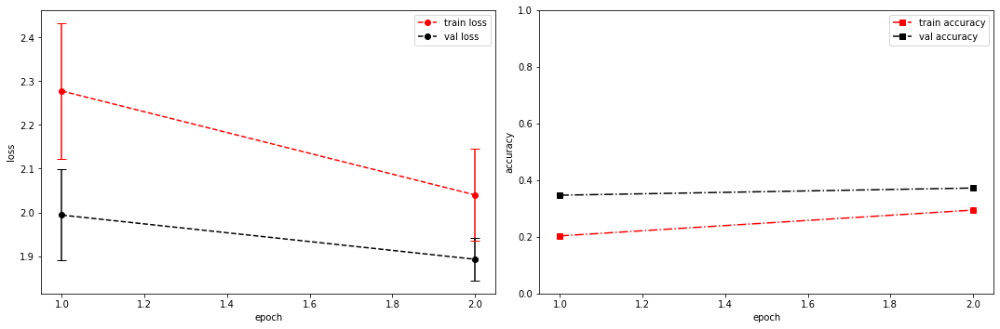

model saved


training epoch:  2
model set to train
Epoch [3/100], step [1/84],  Loss: 2.0631 +/- 0.0000,  accuracy: 0.015625, time elapsed = 0.35124707221984863s
Epoch [3/100], step [17/84],  Loss: 1.9875 +/- 0.0871,  accuracy: 0.3251953125, time elapsed = 0.9789752960205078s
Epoch [3/100], step [33/84],  Loss: 1.9222 +/- 0.0945,  accuracy: 0.33203125, time elapsed = 0.9658424854278564s
Epoch [3/100], step [49/84],  Loss: 1.9677 +/- 0.0978,  accuracy: 0.32421875, time elapsed = 0.943770170211792s
Epoch [3/100], step [65/84],  Loss: 1.9131 +/- 0.1206,  accuracy: 0.353515625, time elapsed = 0.9613585472106934s
Epoch [3/100], step [81/84],  Loss: 1.9282 +/- 0.1069,  accuracy: 0.3701171875, time elapsed = 1.0129718780517578s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3408539996270744,  precision = 0.3408539996270744 recall = 0.3408539996270744 f1 = 0.3408539996270744 ::: val: acc = 0.4108873974645787,  precision = 0.4108873974645787 recall = 0.4108873974645787 time elapsed = 

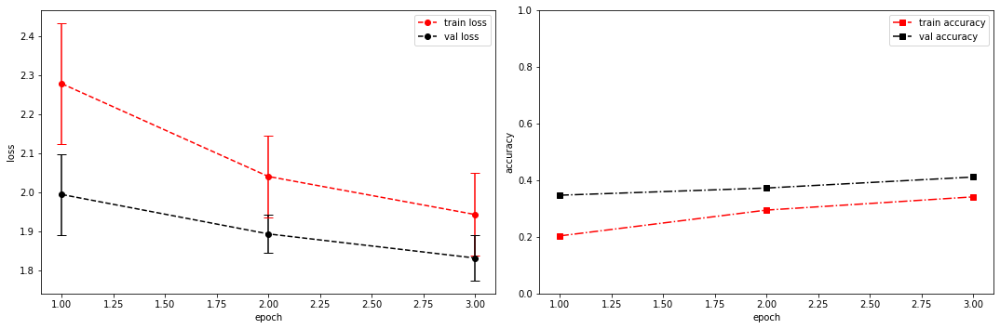

model saved


training epoch:  3
model set to train
Epoch [4/100], step [1/84],  Loss: 1.7965 +/- 0.0000,  accuracy: 0.0234375, time elapsed = 0.3644843101501465s
Epoch [4/100], step [17/84],  Loss: 1.8643 +/- 0.1114,  accuracy: 0.35546875, time elapsed = 0.9972352981567383s
Epoch [4/100], step [33/84],  Loss: 1.8372 +/- 0.1468,  accuracy: 0.3779296875, time elapsed = 0.9666473865509033s
Epoch [4/100], step [49/84],  Loss: 1.8606 +/- 0.0794,  accuracy: 0.365234375, time elapsed = 0.9654629230499268s
Epoch [4/100], step [65/84],  Loss: 1.8183 +/- 0.1095,  accuracy: 0.3876953125, time elapsed = 0.9690842628479004s
Epoch [4/100], step [81/84],  Loss: 1.8415 +/- 0.1210,  accuracy: 0.37890625, time elapsed = 0.9552395343780518s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.37199328733917586,  precision = 0.37199328733917586 recall = 0.37199328733917586 f1 = 0.37199328733917586 ::: val: acc = 0.4444444444444444,  precision = 0.4444444444444444 recall = 0.4444444444444444 time elaps

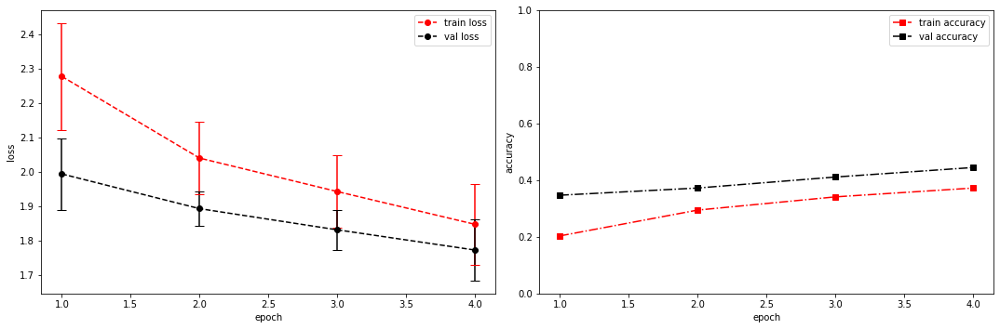

model saved


training epoch:  4
model set to train
Epoch [5/100], step [1/84],  Loss: 1.8586 +/- 0.0000,  accuracy: 0.0234375, time elapsed = 0.3721013069152832s
Epoch [5/100], step [17/84],  Loss: 1.7403 +/- 0.1080,  accuracy: 0.419921875, time elapsed = 1.0023012161254883s
Epoch [5/100], step [33/84],  Loss: 1.7807 +/- 0.1015,  accuracy: 0.4150390625, time elapsed = 0.9575705528259277s
Epoch [5/100], step [49/84],  Loss: 1.7675 +/- 0.1614,  accuracy: 0.4150390625, time elapsed = 0.9476606845855713s
Epoch [5/100], step [65/84],  Loss: 1.6992 +/- 0.1102,  accuracy: 0.439453125, time elapsed = 0.9655511379241943s
Epoch [5/100], step [81/84],  Loss: 1.7884 +/- 0.0850,  accuracy: 0.408203125, time elapsed = 0.9634759426116943s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4186089875069924,  precision = 0.4186089875069924 recall = 0.4186089875069924 f1 = 0.4186089875069924 ::: val: acc = 0.45563012677106635,  precision = 0.45563012677106635 recall = 0.45563012677106635 time elap

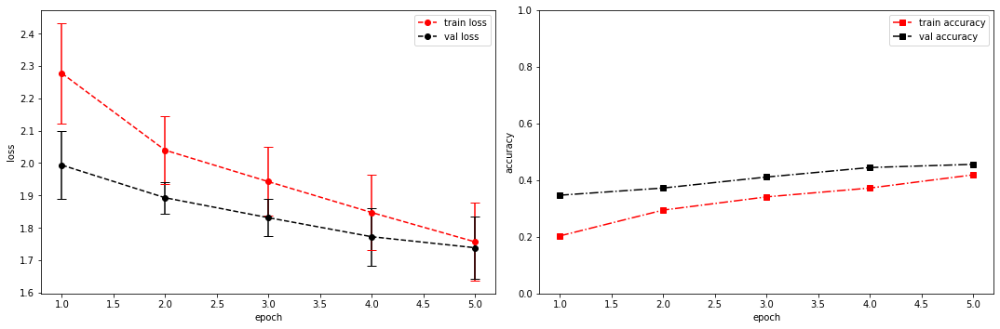

model saved


training epoch:  5
model set to train
Epoch [6/100], step [1/84],  Loss: 1.6567 +/- 0.0000,  accuracy: 0.02734375, time elapsed = 0.3596971035003662s
Epoch [6/100], step [17/84],  Loss: 1.7051 +/- 0.0994,  accuracy: 0.4267578125, time elapsed = 0.9969847202301025s
Epoch [6/100], step [33/84],  Loss: 1.6356 +/- 0.1110,  accuracy: 0.451171875, time elapsed = 0.9564399719238281s
Epoch [6/100], step [49/84],  Loss: 1.6516 +/- 0.0868,  accuracy: 0.470703125, time elapsed = 0.9509670734405518s
Epoch [6/100], step [65/84],  Loss: 1.6699 +/- 0.0926,  accuracy: 0.4404296875, time elapsed = 1.0008013248443604s
Epoch [6/100], step [81/84],  Loss: 1.6151 +/- 0.1347,  accuracy: 0.4990234375, time elapsed = 0.970123291015625s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.45664739884393063,  precision = 0.45664739884393063 recall = 0.45664739884393063 f1 = 0.45664739884393063 ::: val: acc = 0.4615958240119314,  precision = 0.4615958240119314 recall = 0.4615958240119314 time el

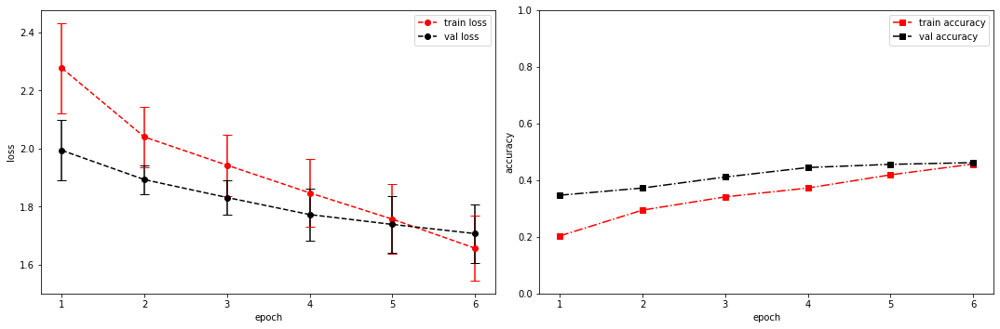

model saved


training epoch:  6
model set to train
Epoch [7/100], step [1/84],  Loss: 1.6482 +/- 0.0000,  accuracy: 0.0263671875, time elapsed = 0.3520512580871582s
Epoch [7/100], step [17/84],  Loss: 1.5947 +/- 0.1117,  accuracy: 0.4912109375, time elapsed = 0.9867708683013916s
Epoch [7/100], step [33/84],  Loss: 1.6173 +/- 0.0857,  accuracy: 0.46484375, time elapsed = 0.9409084320068359s
Epoch [7/100], step [49/84],  Loss: 1.5497 +/- 0.0904,  accuracy: 0.49609375, time elapsed = 0.9524750709533691s
Epoch [7/100], step [65/84],  Loss: 1.5979 +/- 0.0886,  accuracy: 0.4755859375, time elapsed = 0.9503068923950195s
Epoch [7/100], step [81/84],  Loss: 1.5594 +/- 0.1057,  accuracy: 0.4853515625, time elapsed = 0.9637594223022461s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4818198769345516,  precision = 0.4818198769345516 recall = 0.4818198769345516 f1 = 0.48181987693455164 ::: val: acc = 0.4690529455630127,  precision = 0.4690529455630127 recall = 0.4690529455630127 time elap

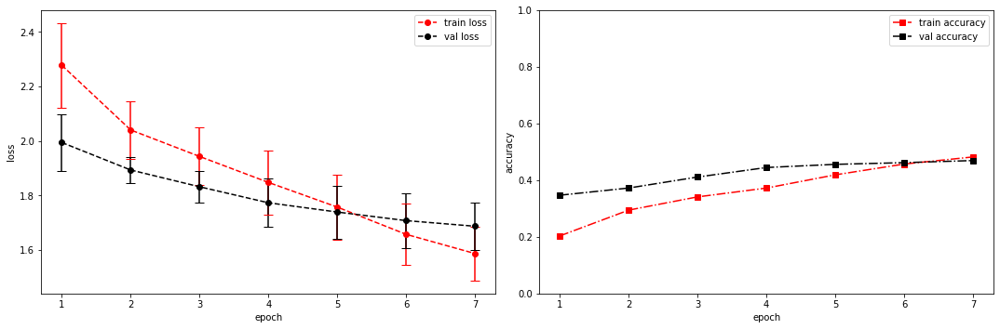

model saved


training epoch:  7
model set to train
Epoch [8/100], step [1/84],  Loss: 1.3588 +/- 0.0000,  accuracy: 0.0390625, time elapsed = 0.37111616134643555s
Epoch [8/100], step [17/84],  Loss: 1.4814 +/- 0.1127,  accuracy: 0.515625, time elapsed = 0.9901425838470459s
Epoch [8/100], step [33/84],  Loss: 1.5149 +/- 0.1008,  accuracy: 0.5078125, time elapsed = 0.9425778388977051s
Epoch [8/100], step [49/84],  Loss: 1.4717 +/- 0.0790,  accuracy: 0.552734375, time elapsed = 0.9396877288818359s
Epoch [8/100], step [65/84],  Loss: 1.4621 +/- 0.0760,  accuracy: 0.515625, time elapsed = 0.9590177536010742s
Epoch [8/100], step [81/84],  Loss: 1.5063 +/- 0.1008,  accuracy: 0.5234375, time elapsed = 0.954401969909668s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5237740070855864,  precision = 0.5237740070855864 recall = 0.5237740070855864 f1 = 0.5237740070855864 ::: val: acc = 0.4563758389261745,  precision = 0.4563758389261745 recall = 0.4563758389261745 time elapsed = 6.8400025

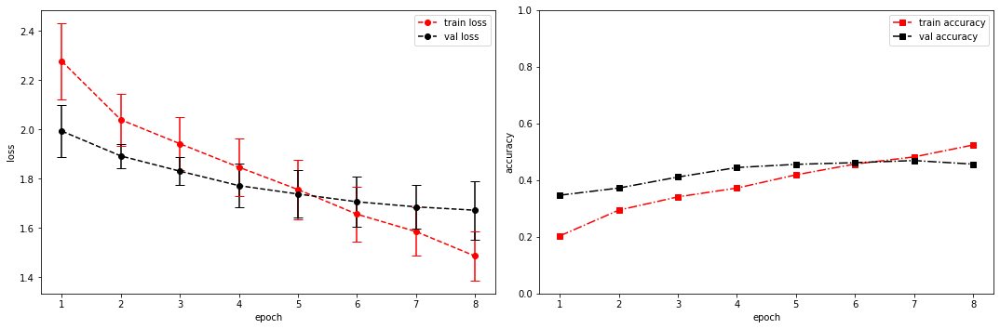

model saved


training epoch:  8
model set to train
Epoch [9/100], step [1/84],  Loss: 1.4029 +/- 0.0000,  accuracy: 0.0380859375, time elapsed = 0.34020137786865234s
Epoch [9/100], step [17/84],  Loss: 1.4001 +/- 0.1008,  accuracy: 0.5615234375, time elapsed = 0.9894020557403564s
Epoch [9/100], step [33/84],  Loss: 1.3742 +/- 0.0861,  accuracy: 0.5712890625, time elapsed = 0.9541783332824707s
Epoch [9/100], step [49/84],  Loss: 1.3825 +/- 0.0564,  accuracy: 0.583984375, time elapsed = 0.9974002838134766s
Epoch [9/100], step [65/84],  Loss: 1.4013 +/- 0.0691,  accuracy: 0.546875, time elapsed = 0.9679923057556152s
Epoch [9/100], step [81/84],  Loss: 1.4269 +/- 0.0900,  accuracy: 0.5546875, time elapsed = 0.9848208427429199s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5644228976319224,  precision = 0.5644228976319224 recall = 0.5644228976319224 f1 = 0.5644228976319224 ::: val: acc = 0.47054436987322895,  precision = 0.47054436987322895 recall = 0.47054436987322895 time elaps

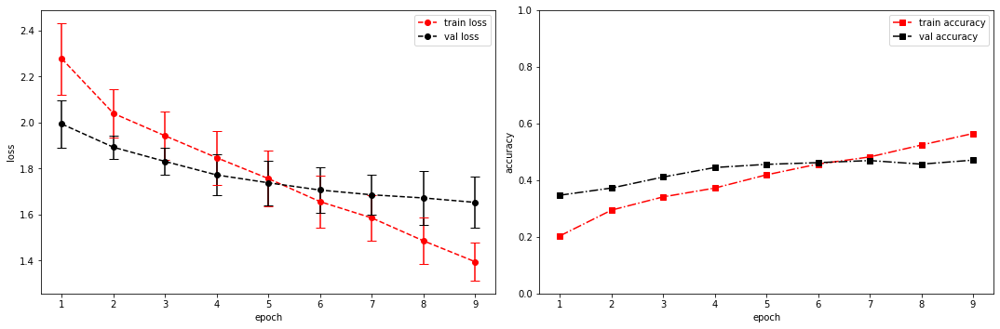

model saved
stopping early
Conv_5_layer
(1, 13, 517)
running model: id = Conv_5_layer, channels = [8, 8, 32, 64, 128]
device:  cuda
dataset metadata:  {'n_fft': 2048, 'hop_length': 256, 'n_mfcc': 13, 'notes': 'optional notes not passed'}
train model: data loaders initialized
sample shape =  (1, 13, 517)
model loaded
Layer (type:depth-idx)                   Output Shape              Param #
├─ConvBlock: 1-1                         [-1, 8, 13, 258]          --
|    └─Sequential: 2-1                   [-1, 8, 13, 258]          --
|    |    └─Conv2d: 3-1                  [-1, 8, 13, 517]          80
|    |    └─ReLU: 3-2                    [-1, 8, 13, 517]          --
|    |    └─MaxPool2d: 3-3               [-1, 8, 13, 258]          --
|    |    └─BatchNorm2d: 3-4             [-1, 8, 13, 258]          16
├─ConvBlock: 1-2                         [-1, 8, 13, 129]          --
|    └─Sequential: 2-2                   [-1, 8, 13, 129]          --
|    |    └─Conv2d: 3-5                  [-1, 8

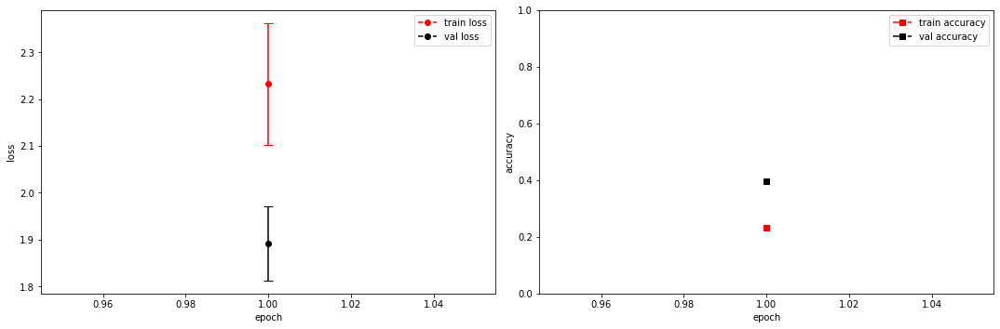

model saved


training epoch:  1
model set to train
Epoch [2/100], step [1/84],  Loss: 1.9591 +/- 0.0000,  accuracy: 0.0166015625, time elapsed = 0.3241753578186035s
Epoch [2/100], step [17/84],  Loss: 2.0556 +/- 0.0747,  accuracy: 0.2919921875, time elapsed = 1.0267045497894287s
Epoch [2/100], step [33/84],  Loss: 2.0354 +/- 0.1236,  accuracy: 0.2958984375, time elapsed = 0.9683177471160889s
Epoch [2/100], step [49/84],  Loss: 1.9756 +/- 0.1148,  accuracy: 0.3330078125, time elapsed = 0.9575803279876709s
Epoch [2/100], step [65/84],  Loss: 1.9454 +/- 0.0804,  accuracy: 0.3291015625, time elapsed = 0.9425787925720215s
Epoch [2/100], step [81/84],  Loss: 1.9522 +/- 0.0978,  accuracy: 0.337890625, time elapsed = 0.9509780406951904s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.31773261234383743,  precision = 0.31773261234383743 recall = 0.31773261234383743 f1 = 0.31773261234383743 ::: val: acc = 0.4250559284116331,  precision = 0.4250559284116331 recall = 0.4250559284116331 tim

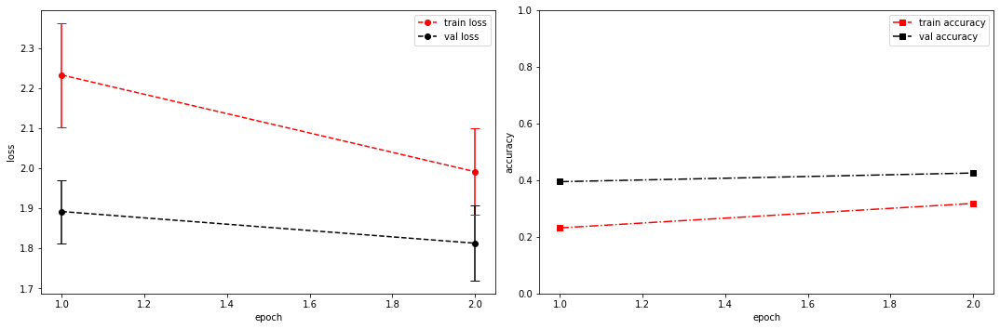

model saved


training epoch:  2
model set to train
Epoch [3/100], step [1/84],  Loss: 1.8762 +/- 0.0000,  accuracy: 0.0283203125, time elapsed = 0.34221625328063965s
Epoch [3/100], step [17/84],  Loss: 1.8886 +/- 0.0972,  accuracy: 0.357421875, time elapsed = 1.017207145690918s
Epoch [3/100], step [33/84],  Loss: 1.8574 +/- 0.0640,  accuracy: 0.3876953125, time elapsed = 0.9756712913513184s
Epoch [3/100], step [49/84],  Loss: 1.8820 +/- 0.1288,  accuracy: 0.3642578125, time elapsed = 0.9598104953765869s
Epoch [3/100], step [65/84],  Loss: 1.8863 +/- 0.1194,  accuracy: 0.375, time elapsed = 0.9362971782684326s
Epoch [3/100], step [81/84],  Loss: 1.8478 +/- 0.0986,  accuracy: 0.388671875, time elapsed = 0.9422707557678223s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.37479022934924483,  precision = 0.37479022934924483 recall = 0.37479022934924483 f1 = 0.37479022934924483 ::: val: acc = 0.4615958240119314,  precision = 0.4615958240119314 recall = 0.4615958240119314 time elapse

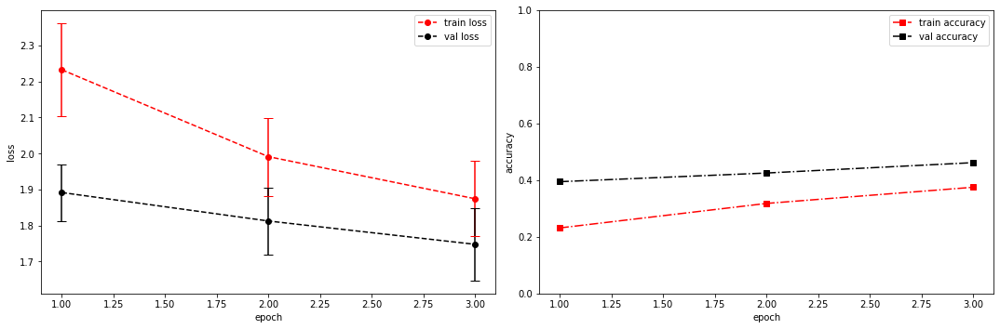

model saved


training epoch:  3
model set to train
Epoch [4/100], step [1/84],  Loss: 1.6771 +/- 0.0000,  accuracy: 0.0283203125, time elapsed = 0.35460925102233887s
Epoch [4/100], step [17/84],  Loss: 1.7898 +/- 0.0935,  accuracy: 0.40625, time elapsed = 0.9831104278564453s
Epoch [4/100], step [33/84],  Loss: 1.7331 +/- 0.1039,  accuracy: 0.4228515625, time elapsed = 0.9362704753875732s
Epoch [4/100], step [49/84],  Loss: 1.7498 +/- 0.1198,  accuracy: 0.42578125, time elapsed = 0.9453895092010498s
Epoch [4/100], step [65/84],  Loss: 1.7649 +/- 0.1124,  accuracy: 0.4130859375, time elapsed = 0.96889328956604s
Epoch [4/100], step [81/84],  Loss: 1.7324 +/- 0.0904,  accuracy: 0.443359375, time elapsed = 0.9704959392547607s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.42308409472310277,  precision = 0.42308409472310277 recall = 0.42308409472310277 f1 = 0.4230840947231028 ::: val: acc = 0.4377330350484713,  precision = 0.4377330350484713 recall = 0.4377330350484713 time elapsed

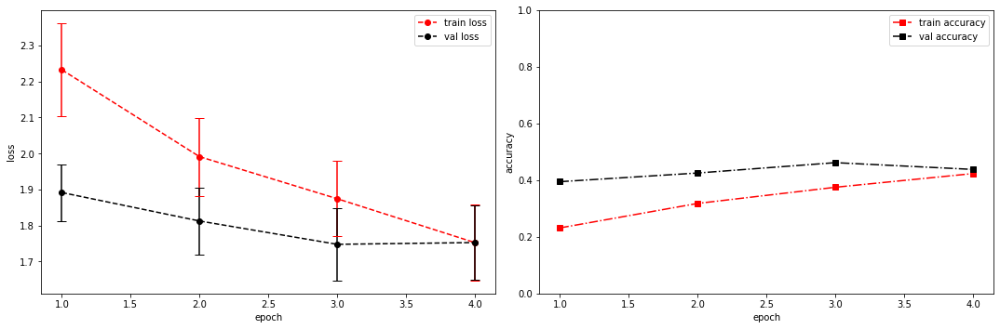

model saved


training epoch:  4
model set to train
Epoch [5/100], step [1/84],  Loss: 1.7372 +/- 0.0000,  accuracy: 0.025390625, time elapsed = 0.3537626266479492s
Epoch [5/100], step [17/84],  Loss: 1.6711 +/- 0.1072,  accuracy: 0.4541015625, time elapsed = 0.9999470710754395s
Epoch [5/100], step [33/84],  Loss: 1.6902 +/- 0.1002,  accuracy: 0.4580078125, time elapsed = 0.9520211219787598s
Epoch [5/100], step [49/84],  Loss: 1.6425 +/- 0.1077,  accuracy: 0.4716796875, time elapsed = 0.9668562412261963s
Epoch [5/100], step [65/84],  Loss: 1.6868 +/- 0.1289,  accuracy: 0.44921875, time elapsed = 0.9461498260498047s
Epoch [5/100], step [81/84],  Loss: 1.6368 +/- 0.0992,  accuracy: 0.4873046875, time elapsed = 1.0107755661010742s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.46336005966809624,  precision = 0.46336005966809624 recall = 0.46336005966809624 f1 = 0.46336005966809624 ::: val: acc = 0.4645786726323639,  precision = 0.4645786726323639 recall = 0.4645786726323639 time 

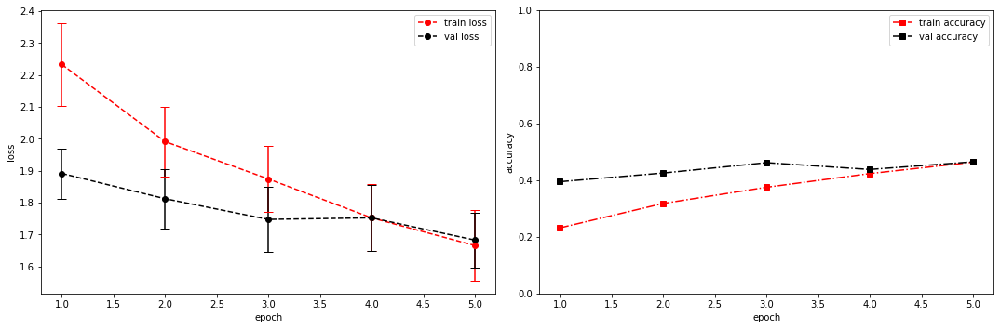

model saved


training epoch:  5
model set to train
Epoch [6/100], step [1/84],  Loss: 1.4843 +/- 0.0000,  accuracy: 0.037109375, time elapsed = 0.35544705390930176s
Epoch [6/100], step [17/84],  Loss: 1.5339 +/- 0.1013,  accuracy: 0.51953125, time elapsed = 0.9940059185028076s
Epoch [6/100], step [33/84],  Loss: 1.4820 +/- 0.0787,  accuracy: 0.5595703125, time elapsed = 0.9993126392364502s
Epoch [6/100], step [49/84],  Loss: 1.5399 +/- 0.0828,  accuracy: 0.5244140625, time elapsed = 0.9819686412811279s
Epoch [6/100], step [65/84],  Loss: 1.5182 +/- 0.0885,  accuracy: 0.5087890625, time elapsed = 0.9710588455200195s
Epoch [6/100], step [81/84],  Loss: 1.5166 +/- 0.1046,  accuracy: 0.5087890625, time elapsed = 0.997305154800415s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5247063210889428,  precision = 0.5247063210889428 recall = 0.5247063210889428 f1 = 0.5247063210889428 ::: val: acc = 0.48396718866517524,  precision = 0.48396718866517524 recall = 0.48396718866517524 time e

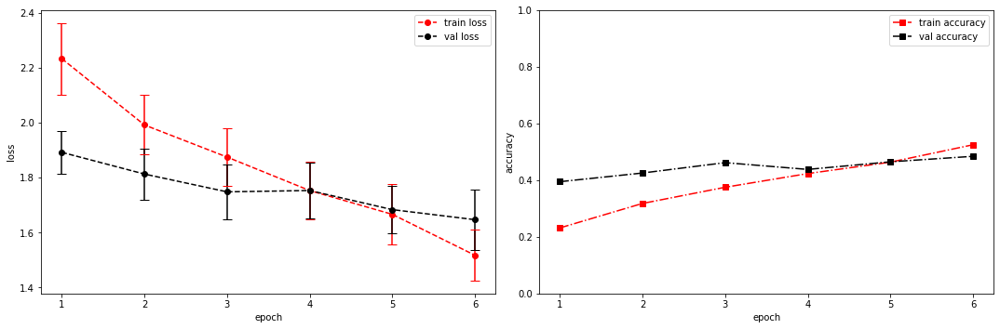

model saved


training epoch:  6
model set to train
Epoch [7/100], step [1/84],  Loss: 1.4739 +/- 0.0000,  accuracy: 0.03515625, time elapsed = 0.3658590316772461s
Epoch [7/100], step [17/84],  Loss: 1.4023 +/- 0.0986,  accuracy: 0.5693359375, time elapsed = 0.9867029190063477s
Epoch [7/100], step [33/84],  Loss: 1.4149 +/- 0.0871,  accuracy: 0.5634765625, time elapsed = 0.955711841583252s
Epoch [7/100], step [49/84],  Loss: 1.4155 +/- 0.0914,  accuracy: 0.572265625, time elapsed = 0.9525911808013916s
Epoch [7/100], step [65/84],  Loss: 1.3692 +/- 0.1108,  accuracy: 0.6044921875, time elapsed = 0.9488828182220459s
Epoch [7/100], step [81/84],  Loss: 1.3809 +/- 0.0939,  accuracy: 0.5927734375, time elapsed = 0.9718241691589355s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5791534588849524,  precision = 0.5791534588849524 recall = 0.5791534588849524 f1 = 0.5791534588849524 ::: val: acc = 0.4936614466815809,  precision = 0.4936614466815809 recall = 0.4936614466815809 time elaps

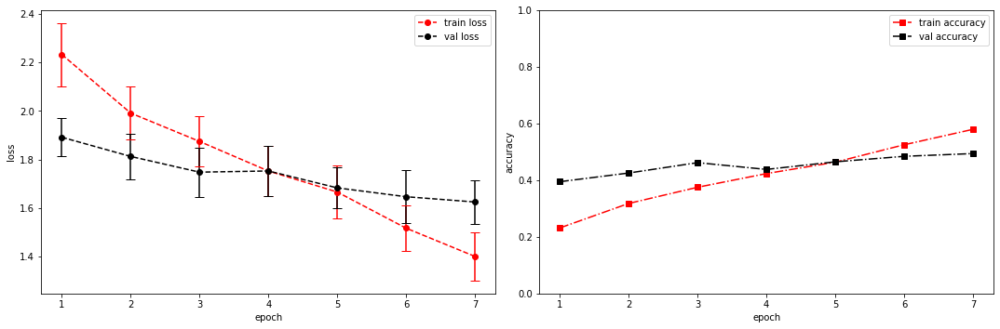

model saved


training epoch:  7
model set to train
Epoch [8/100], step [1/84],  Loss: 1.1782 +/- 0.0000,  accuracy: 0.0439453125, time elapsed = 0.36421823501586914s
Epoch [8/100], step [17/84],  Loss: 1.2675 +/- 0.0936,  accuracy: 0.623046875, time elapsed = 1.0437898635864258s
Epoch [8/100], step [33/84],  Loss: 1.2591 +/- 0.0736,  accuracy: 0.6484375, time elapsed = 1.0102386474609375s
Epoch [8/100], step [49/84],  Loss: 1.2566 +/- 0.0516,  accuracy: 0.6591796875, time elapsed = 0.9741060733795166s
Epoch [8/100], step [65/84],  Loss: 1.2749 +/- 0.1170,  accuracy: 0.6328125, time elapsed = 0.9744882583618164s
Epoch [8/100], step [81/84],  Loss: 1.2836 +/- 0.1045,  accuracy: 0.62109375, time elapsed = 1.0407006740570068s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.636956927093045,  precision = 0.636956927093045 recall = 0.636956927093045 f1 = 0.636956927093045 ::: val: acc = 0.46607009694258017,  precision = 0.46607009694258017 recall = 0.46607009694258017 time elapsed = 

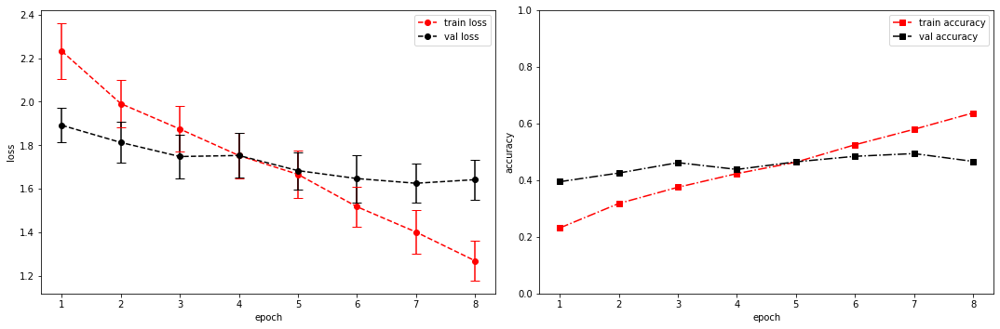

model saved
stopping early
Conv_5_layer
(1, 13, 517)
running model: id = Conv_5_layer, channels = [8, 16, 32, 64, 128]
device:  cuda
dataset metadata:  {'n_fft': 2048, 'hop_length': 256, 'n_mfcc': 13, 'notes': 'optional notes not passed'}
train model: data loaders initialized
sample shape =  (1, 13, 517)
model loaded
Layer (type:depth-idx)                   Output Shape              Param #
├─ConvBlock: 1-1                         [-1, 8, 13, 258]          --
|    └─Sequential: 2-1                   [-1, 8, 13, 258]          --
|    |    └─Conv2d: 3-1                  [-1, 8, 13, 517]          80
|    |    └─ReLU: 3-2                    [-1, 8, 13, 517]          --
|    |    └─MaxPool2d: 3-3               [-1, 8, 13, 258]          --
|    |    └─BatchNorm2d: 3-4             [-1, 8, 13, 258]          16
├─ConvBlock: 1-2                         [-1, 16, 13, 129]         --
|    └─Sequential: 2-2                   [-1, 16, 13, 129]         --
|    |    └─Conv2d: 3-5                  [-1, 

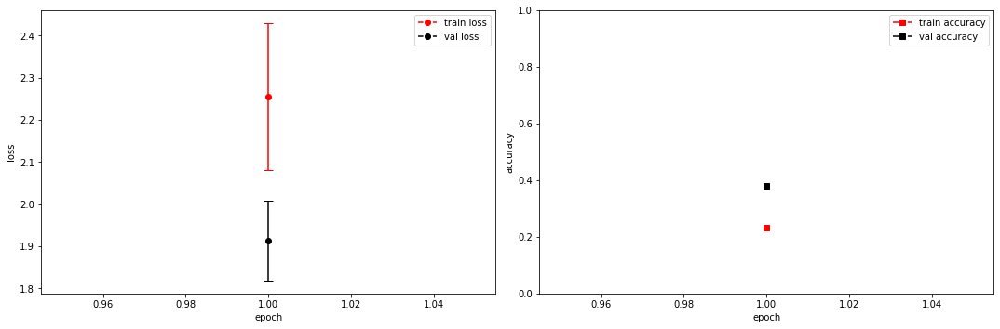

model saved


training epoch:  1
model set to train
Epoch [2/100], step [1/84],  Loss: 2.1232 +/- 0.0000,  accuracy: 0.0224609375, time elapsed = 0.36138105392456055s
Epoch [2/100], step [17/84],  Loss: 2.0807 +/- 0.0952,  accuracy: 0.302734375, time elapsed = 1.0163800716400146s
Epoch [2/100], step [33/84],  Loss: 2.0247 +/- 0.1027,  accuracy: 0.3271484375, time elapsed = 0.9492809772491455s
Epoch [2/100], step [49/84],  Loss: 2.0506 +/- 0.1492,  accuracy: 0.31640625, time elapsed = 0.9669981002807617s
Epoch [2/100], step [65/84],  Loss: 1.9515 +/- 0.0962,  accuracy: 0.3564453125, time elapsed = 0.9406447410583496s
Epoch [2/100], step [81/84],  Loss: 2.0252 +/- 0.1042,  accuracy: 0.3056640625, time elapsed = 0.959608793258667s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3255640499720306,  precision = 0.3255640499720306 recall = 0.3255640499720306 f1 = 0.3255640499720306 ::: val: acc = 0.3982102908277405,  precision = 0.3982102908277405 recall = 0.3982102908277405 time elap

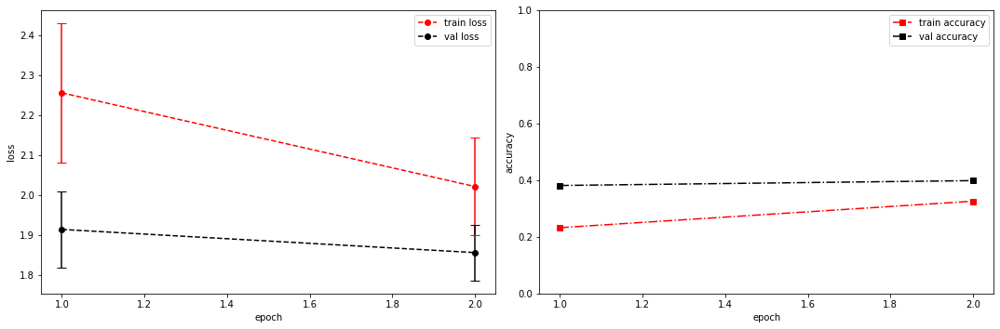

model saved


training epoch:  2
model set to train
Epoch [3/100], step [1/84],  Loss: 2.0461 +/- 0.0000,  accuracy: 0.0166015625, time elapsed = 0.34082579612731934s
Epoch [3/100], step [17/84],  Loss: 1.9339 +/- 0.1043,  accuracy: 0.36328125, time elapsed = 1.0069565773010254s
Epoch [3/100], step [33/84],  Loss: 1.8923 +/- 0.1081,  accuracy: 0.365234375, time elapsed = 0.9528651237487793s
Epoch [3/100], step [49/84],  Loss: 1.9098 +/- 0.0792,  accuracy: 0.3603515625, time elapsed = 0.9706728458404541s
Epoch [3/100], step [65/84],  Loss: 1.8675 +/- 0.1373,  accuracy: 0.3798828125, time elapsed = 0.9456210136413574s
Epoch [3/100], step [81/84],  Loss: 1.8106 +/- 0.1081,  accuracy: 0.431640625, time elapsed = 0.9538142681121826s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.37907887376468397,  precision = 0.37907887376468397 recall = 0.37907887376468397 f1 = 0.37907887376468397 ::: val: acc = 0.4332587621178225,  precision = 0.4332587621178225 recall = 0.4332587621178225 time 

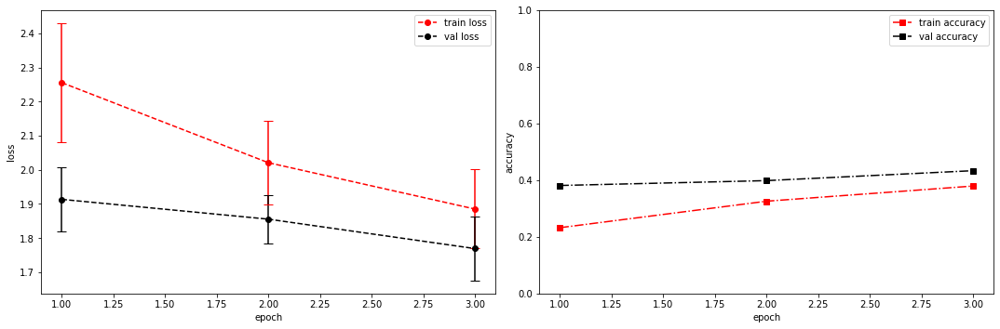

model saved


training epoch:  3
model set to train
Epoch [4/100], step [1/84],  Loss: 1.8446 +/- 0.0000,  accuracy: 0.021484375, time elapsed = 0.35287046432495117s
Epoch [4/100], step [17/84],  Loss: 1.7066 +/- 0.0734,  accuracy: 0.443359375, time elapsed = 0.9926393032073975s
Epoch [4/100], step [33/84],  Loss: 1.7985 +/- 0.0991,  accuracy: 0.412109375, time elapsed = 0.9428408145904541s
Epoch [4/100], step [49/84],  Loss: 1.7394 +/- 0.1067,  accuracy: 0.439453125, time elapsed = 0.9653260707855225s
Epoch [4/100], step [65/84],  Loss: 1.7319 +/- 0.0813,  accuracy: 0.4423828125, time elapsed = 0.9770596027374268s
Epoch [4/100], step [81/84],  Loss: 1.7918 +/- 0.1046,  accuracy: 0.39453125, time elapsed = 0.9440150260925293s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.42699981353719935,  precision = 0.42699981353719935 recall = 0.42699981353719935 f1 = 0.4269998135371994 ::: val: acc = 0.4601043997017151,  precision = 0.4601043997017151 recall = 0.4601043997017151 time ela

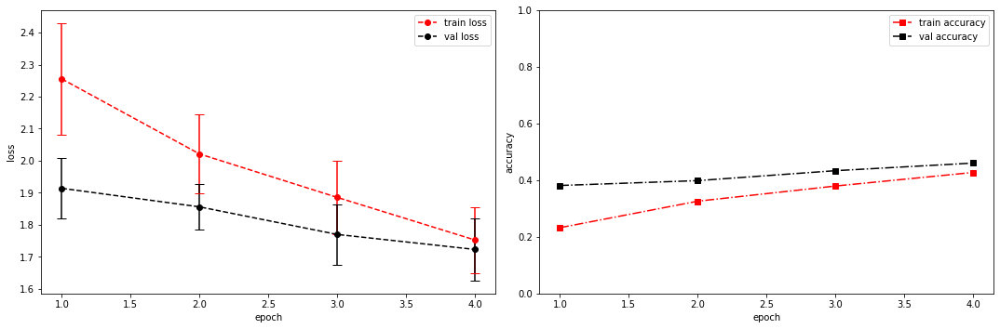

model saved


training epoch:  4
model set to train
Epoch [5/100], step [1/84],  Loss: 1.8371 +/- 0.0000,  accuracy: 0.025390625, time elapsed = 0.36313295364379883s
Epoch [5/100], step [17/84],  Loss: 1.6412 +/- 0.0956,  accuracy: 0.4716796875, time elapsed = 1.010793685913086s
Epoch [5/100], step [33/84],  Loss: 1.6978 +/- 0.0947,  accuracy: 0.44140625, time elapsed = 0.9634830951690674s
Epoch [5/100], step [49/84],  Loss: 1.6855 +/- 0.1074,  accuracy: 0.4365234375, time elapsed = 0.9780900478363037s
Epoch [5/100], step [65/84],  Loss: 1.7015 +/- 0.1238,  accuracy: 0.4384765625, time elapsed = 0.9680891036987305s
Epoch [5/100], step [81/84],  Loss: 1.6922 +/- 0.1500,  accuracy: 0.453125, time elapsed = 1.0191562175750732s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4475107216110386,  precision = 0.4475107216110386 recall = 0.4475107216110386 f1 = 0.4475107216110386 ::: val: acc = 0.4697986577181208,  precision = 0.4697986577181208 recall = 0.4697986577181208 time elapsed 

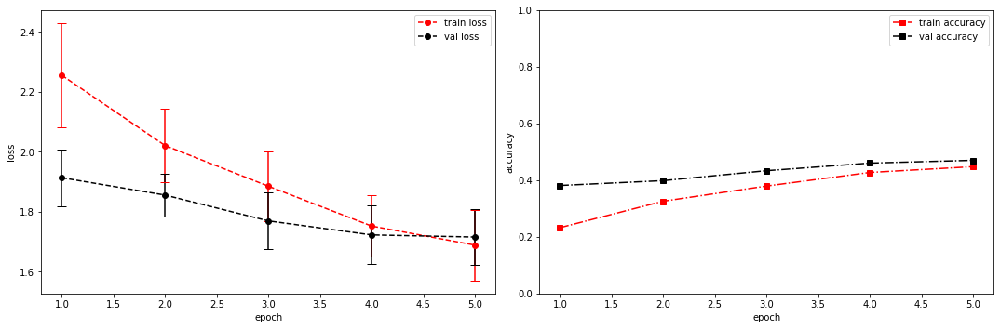

model saved


training epoch:  5
model set to train
Epoch [6/100], step [1/84],  Loss: 1.5681 +/- 0.0000,  accuracy: 0.0302734375, time elapsed = 0.3600656986236572s
Epoch [6/100], step [17/84],  Loss: 1.6081 +/- 0.1287,  accuracy: 0.494140625, time elapsed = 1.0043718814849854s
Epoch [6/100], step [33/84],  Loss: 1.5956 +/- 0.1063,  accuracy: 0.4892578125, time elapsed = 0.9592344760894775s
Epoch [6/100], step [49/84],  Loss: 1.5311 +/- 0.0770,  accuracy: 0.5146484375, time elapsed = 0.9568169116973877s
Epoch [6/100], step [65/84],  Loss: 1.5389 +/- 0.0654,  accuracy: 0.5185546875, time elapsed = 0.9495110511779785s
Epoch [6/100], step [81/84],  Loss: 1.5508 +/- 0.0910,  accuracy: 0.5009765625, time elapsed = 0.9920592308044434s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5036360246130897,  precision = 0.5036360246130897 recall = 0.5036360246130897 f1 = 0.5036360246130897 ::: val: acc = 0.49217002237136465,  precision = 0.49217002237136465 recall = 0.49217002237136465 time

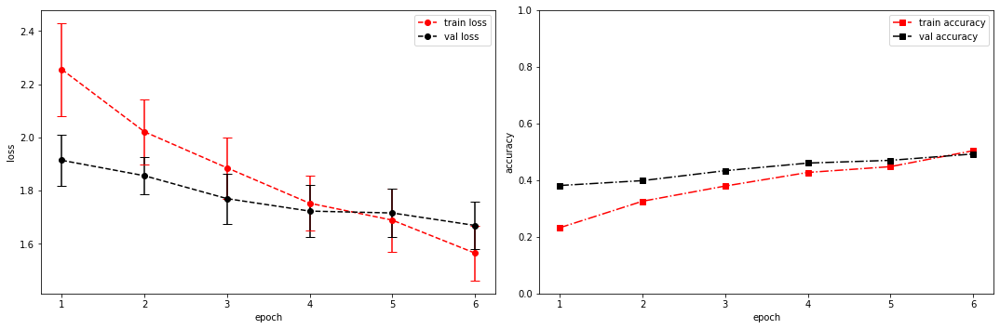

model saved


training epoch:  6
model set to train
Epoch [7/100], step [1/84],  Loss: 1.2872 +/- 0.0000,  accuracy: 0.0380859375, time elapsed = 0.35579991340637207s
Epoch [7/100], step [17/84],  Loss: 1.4054 +/- 0.0867,  accuracy: 0.595703125, time elapsed = 1.0012798309326172s
Epoch [7/100], step [33/84],  Loss: 1.4146 +/- 0.1285,  accuracy: 0.5791015625, time elapsed = 0.9626543521881104s
Epoch [7/100], step [49/84],  Loss: 1.4056 +/- 0.0680,  accuracy: 0.556640625, time elapsed = 0.9512736797332764s
Epoch [7/100], step [65/84],  Loss: 1.4825 +/- 0.0875,  accuracy: 0.52734375, time elapsed = 0.9642961025238037s
Epoch [7/100], step [81/84],  Loss: 1.4019 +/- 0.0752,  accuracy: 0.5888671875, time elapsed = 0.9883780479431152s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5692709304493754,  precision = 0.5692709304493754 recall = 0.5692709304493754 f1 = 0.5692709304493754 ::: val: acc = 0.48396718866517524,  precision = 0.48396718866517524 recall = 0.48396718866517524 time e

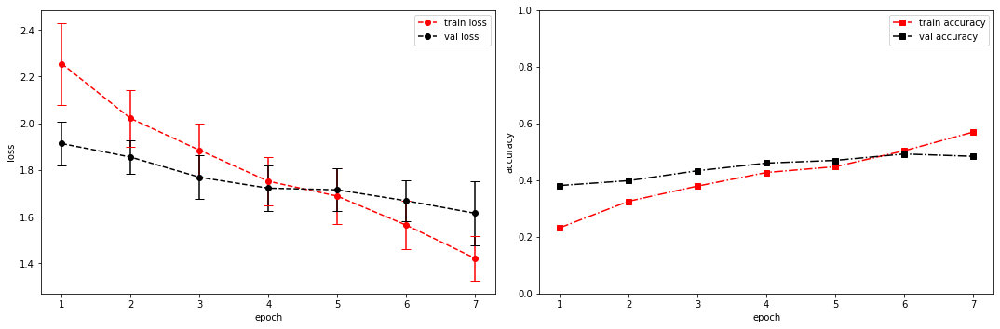

model saved


training epoch:  7
model set to train
Epoch [8/100], step [1/84],  Loss: 1.4139 +/- 0.0000,  accuracy: 0.03515625, time elapsed = 0.3769047260284424s
Epoch [8/100], step [17/84],  Loss: 1.2840 +/- 0.0902,  accuracy: 0.6279296875, time elapsed = 0.995201587677002s
Epoch [8/100], step [33/84],  Loss: 1.3403 +/- 0.1156,  accuracy: 0.607421875, time elapsed = 0.9440860748291016s
Epoch [8/100], step [49/84],  Loss: 1.3399 +/- 0.1011,  accuracy: 0.5966796875, time elapsed = 0.9718303680419922s
Epoch [8/100], step [65/84],  Loss: 1.2408 +/- 0.0981,  accuracy: 0.6630859375, time elapsed = 0.9853172302246094s
Epoch [8/100], step [81/84],  Loss: 1.2791 +/- 0.1075,  accuracy: 0.6171875, time elapsed = 0.9927287101745605s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.6220399030393436,  precision = 0.6220399030393436 recall = 0.6220399030393436 f1 = 0.6220399030393436 ::: val: acc = 0.48396718866517524,  precision = 0.48396718866517524 recall = 0.48396718866517524 time elaps

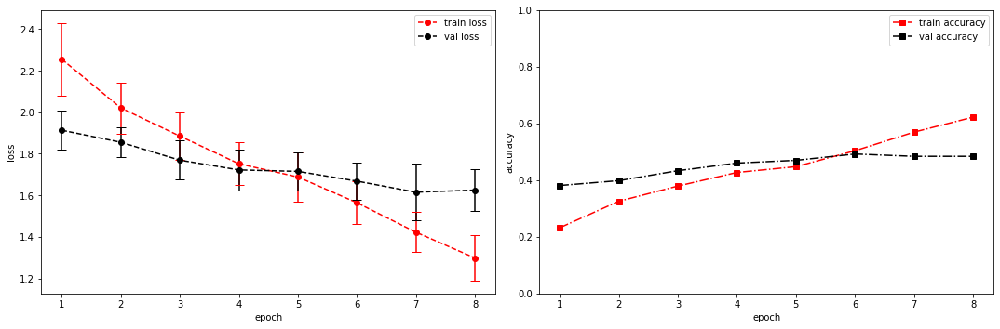

model saved
stopping early
Conv_5_layer
(1, 13, 517)
running model: id = Conv_5_layer, channels = [8, 32, 32, 64, 128]
device:  cuda
dataset metadata:  {'n_fft': 2048, 'hop_length': 256, 'n_mfcc': 13, 'notes': 'optional notes not passed'}
train model: data loaders initialized
sample shape =  (1, 13, 517)
model loaded
Layer (type:depth-idx)                   Output Shape              Param #
├─ConvBlock: 1-1                         [-1, 8, 13, 258]          --
|    └─Sequential: 2-1                   [-1, 8, 13, 258]          --
|    |    └─Conv2d: 3-1                  [-1, 8, 13, 517]          80
|    |    └─ReLU: 3-2                    [-1, 8, 13, 517]          --
|    |    └─MaxPool2d: 3-3               [-1, 8, 13, 258]          --
|    |    └─BatchNorm2d: 3-4             [-1, 8, 13, 258]          16
├─ConvBlock: 1-2                         [-1, 32, 13, 129]         --
|    └─Sequential: 2-2                   [-1, 32, 13, 129]         --
|    |    └─Conv2d: 3-5                  [-1, 

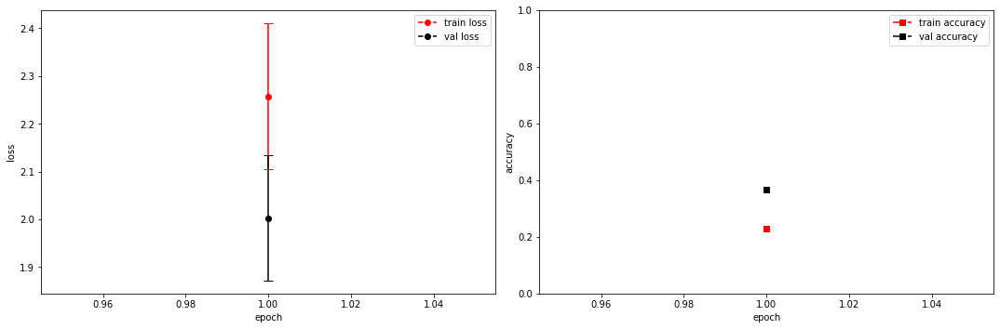

model saved


training epoch:  1
model set to train
Epoch [2/100], step [1/84],  Loss: 1.8741 +/- 0.0000,  accuracy: 0.0205078125, time elapsed = 0.3664588928222656s
Epoch [2/100], step [17/84],  Loss: 2.0258 +/- 0.1168,  accuracy: 0.3369140625, time elapsed = 0.9964652061462402s
Epoch [2/100], step [33/84],  Loss: 1.9713 +/- 0.0950,  accuracy: 0.3330078125, time elapsed = 0.9703090190887451s
Epoch [2/100], step [49/84],  Loss: 2.0559 +/- 0.1295,  accuracy: 0.30859375, time elapsed = 0.9625365734100342s
Epoch [2/100], step [65/84],  Loss: 1.9647 +/- 0.1037,  accuracy: 0.345703125, time elapsed = 0.9512827396392822s
Epoch [2/100], step [81/84],  Loss: 2.0322 +/- 0.0952,  accuracy: 0.3017578125, time elapsed = 0.9779534339904785s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3255640499720306,  precision = 0.3255640499720306 recall = 0.3255640499720306 f1 = 0.3255640499720306 ::: val: acc = 0.4108873974645787,  precision = 0.4108873974645787 recall = 0.4108873974645787 time elap

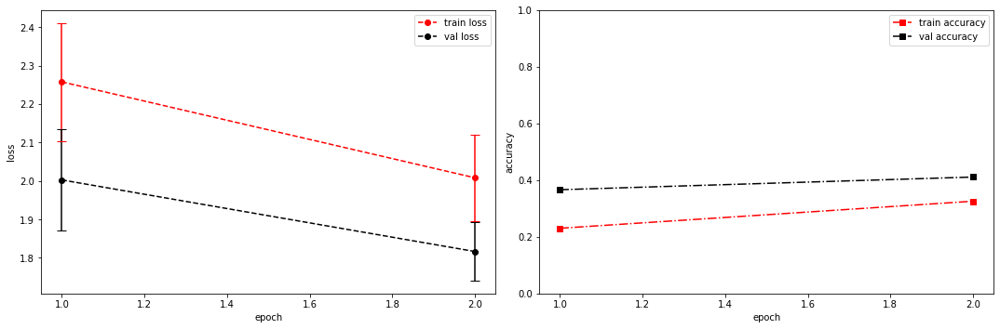

model saved


training epoch:  2
model set to train
Epoch [3/100], step [1/84],  Loss: 1.8514 +/- 0.0000,  accuracy: 0.0234375, time elapsed = 0.3690981864929199s
Epoch [3/100], step [17/84],  Loss: 1.8622 +/- 0.1192,  accuracy: 0.380859375, time elapsed = 1.0396037101745605s
Epoch [3/100], step [33/84],  Loss: 1.8660 +/- 0.0782,  accuracy: 0.38671875, time elapsed = 0.9708306789398193s
Epoch [3/100], step [49/84],  Loss: 1.8980 +/- 0.1279,  accuracy: 0.3662109375, time elapsed = 0.9570600986480713s
Epoch [3/100], step [65/84],  Loss: 1.8500 +/- 0.1322,  accuracy: 0.3916015625, time elapsed = 0.9566206932067871s
Epoch [3/100], step [81/84],  Loss: 1.8454 +/- 0.0796,  accuracy: 0.390625, time elapsed = 0.9691765308380127s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3816893529740817,  precision = 0.3816893529740817 recall = 0.3816893529740817 f1 = 0.38168935297408174 ::: val: acc = 0.47054436987322895,  precision = 0.47054436987322895 recall = 0.47054436987322895 time elapsed

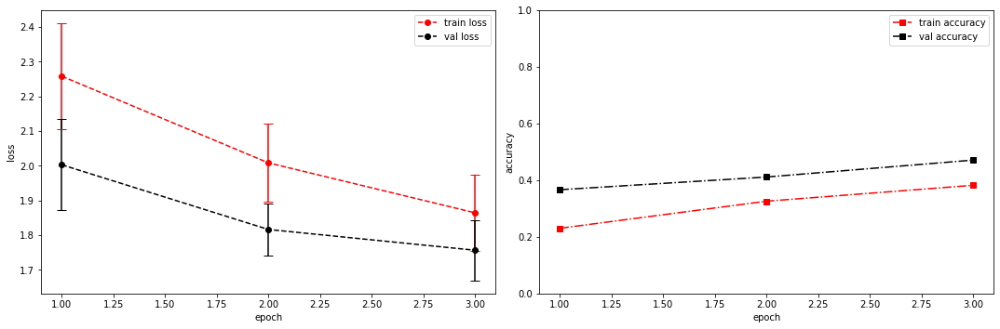

model saved


training epoch:  3
model set to train
Epoch [4/100], step [1/84],  Loss: 1.8640 +/- 0.0000,  accuracy: 0.0234375, time elapsed = 0.35860753059387207s
Epoch [4/100], step [17/84],  Loss: 1.7959 +/- 0.1119,  accuracy: 0.43359375, time elapsed = 0.9948239326477051s
Epoch [4/100], step [33/84],  Loss: 1.8132 +/- 0.1274,  accuracy: 0.3955078125, time elapsed = 0.9814498424530029s
Epoch [4/100], step [49/84],  Loss: 1.7972 +/- 0.1173,  accuracy: 0.412109375, time elapsed = 0.964390754699707s
Epoch [4/100], step [65/84],  Loss: 1.7114 +/- 0.1147,  accuracy: 0.4384765625, time elapsed = 0.9576787948608398s
Epoch [4/100], step [81/84],  Loss: 1.6806 +/- 0.1111,  accuracy: 0.44921875, time elapsed = 0.9466464519500732s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4255081111318292,  precision = 0.4255081111318292 recall = 0.4255081111318292 f1 = 0.4255081111318292 ::: val: acc = 0.4645786726323639,  precision = 0.4645786726323639 recall = 0.4645786726323639 time elapsed =

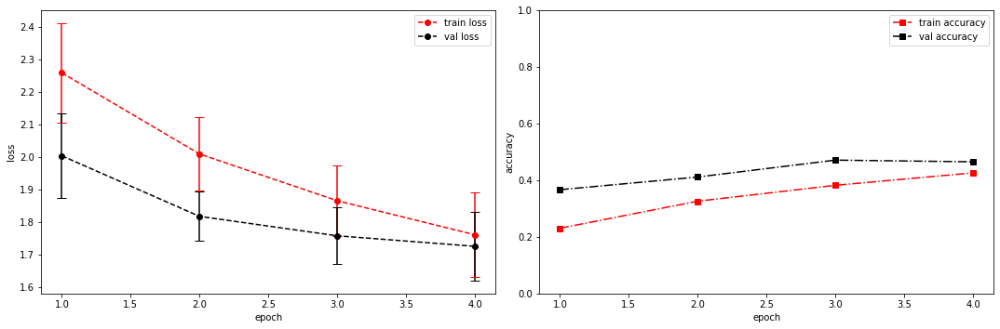

model saved


training epoch:  4
model set to train
Epoch [5/100], step [1/84],  Loss: 1.5403 +/- 0.0000,  accuracy: 0.033203125, time elapsed = 0.37802910804748535s
Epoch [5/100], step [17/84],  Loss: 1.6511 +/- 0.0908,  accuracy: 0.470703125, time elapsed = 1.0176889896392822s
Epoch [5/100], step [33/84],  Loss: 1.6884 +/- 0.1051,  accuracy: 0.4443359375, time elapsed = 0.969383716583252s
Epoch [5/100], step [49/84],  Loss: 1.6634 +/- 0.1546,  accuracy: 0.4736328125, time elapsed = 0.9751553535461426s
Epoch [5/100], step [65/84],  Loss: 1.6487 +/- 0.0878,  accuracy: 0.4677734375, time elapsed = 0.9684221744537354s
Epoch [5/100], step [81/84],  Loss: 1.6198 +/- 0.1089,  accuracy: 0.4892578125, time elapsed = 1.0222399234771729s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.46802162968487787,  precision = 0.46802162968487787 recall = 0.46802162968487787 f1 = 0.46802162968487787 ::: val: acc = 0.4742729306487696,  precision = 0.4742729306487696 recall = 0.4742729306487696 time

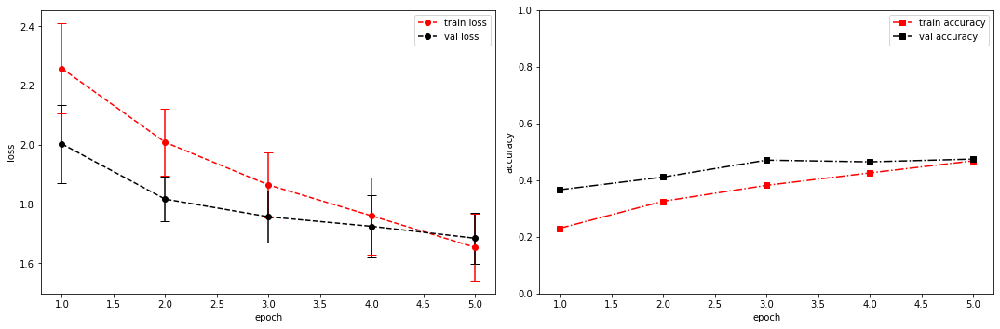

model saved


training epoch:  5
model set to train
Epoch [6/100], step [1/84],  Loss: 1.5093 +/- 0.0000,  accuracy: 0.0322265625, time elapsed = 0.3650486469268799s
Epoch [6/100], step [17/84],  Loss: 1.5604 +/- 0.0908,  accuracy: 0.5, time elapsed = 1.0149319171905518s
Epoch [6/100], step [33/84],  Loss: 1.4935 +/- 0.0891,  accuracy: 0.541015625, time elapsed = 0.9605004787445068s
Epoch [6/100], step [49/84],  Loss: 1.5177 +/- 0.0675,  accuracy: 0.521484375, time elapsed = 0.9580016136169434s
Epoch [6/100], step [65/84],  Loss: 1.4977 +/- 0.0885,  accuracy: 0.5390625, time elapsed = 0.9699814319610596s
Epoch [6/100], step [81/84],  Loss: 1.4948 +/- 0.1152,  accuracy: 0.53125, time elapsed = 0.9941070079803467s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.526943874696998,  precision = 0.526943874696998 recall = 0.526943874696998 f1 = 0.526943874696998 ::: val: acc = 0.49217002237136465,  precision = 0.49217002237136465 recall = 0.49217002237136465 time elapsed = 6.942720413

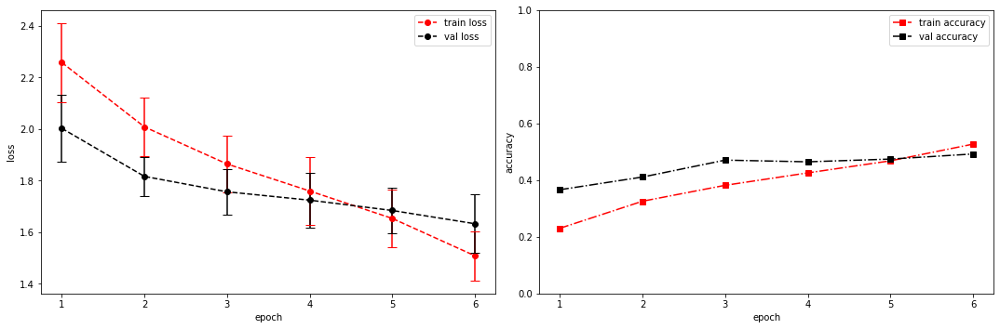

model saved


training epoch:  6
model set to train
Epoch [7/100], step [1/84],  Loss: 1.1983 +/- 0.0000,  accuracy: 0.0400390625, time elapsed = 0.367509126663208s
Epoch [7/100], step [17/84],  Loss: 1.3436 +/- 0.1050,  accuracy: 0.6142578125, time elapsed = 1.0061962604522705s
Epoch [7/100], step [33/84],  Loss: 1.3531 +/- 0.0929,  accuracy: 0.5869140625, time elapsed = 0.9892637729644775s
Epoch [7/100], step [49/84],  Loss: 1.3814 +/- 0.0950,  accuracy: 0.5712890625, time elapsed = 0.9754986763000488s
Epoch [7/100], step [65/84],  Loss: 1.4088 +/- 0.0764,  accuracy: 0.5712890625, time elapsed = 0.9607076644897461s
Epoch [7/100], step [81/84],  Loss: 1.3922 +/- 0.0988,  accuracy: 0.5703125, time elapsed = 0.9743473529815674s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5838150289017341,  precision = 0.5838150289017341 recall = 0.5838150289017341 f1 = 0.5838150289017341 ::: val: acc = 0.5093214019388516,  precision = 0.5093214019388516 recall = 0.5093214019388516 time elaps

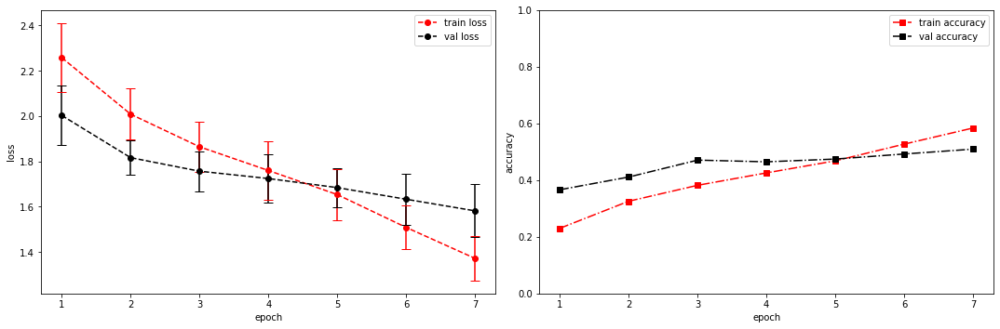

model saved


training epoch:  7
model set to train
Epoch [8/100], step [1/84],  Loss: 1.3096 +/- 0.0000,  accuracy: 0.0390625, time elapsed = 0.3631477355957031s
Epoch [8/100], step [17/84],  Loss: 1.2934 +/- 0.0902,  accuracy: 0.625, time elapsed = 1.0009188652038574s
Epoch [8/100], step [33/84],  Loss: 1.2676 +/- 0.1086,  accuracy: 0.638671875, time elapsed = 0.9708640575408936s
Epoch [8/100], step [49/84],  Loss: 1.2297 +/- 0.0813,  accuracy: 0.65625, time elapsed = 0.9577348232269287s
Epoch [8/100], step [65/84],  Loss: 1.2856 +/- 0.1025,  accuracy: 0.6328125, time elapsed = 0.9512743949890137s
Epoch [8/100], step [81/84],  Loss: 1.2073 +/- 0.0791,  accuracy: 0.6552734375, time elapsed = 0.994769811630249s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.6419914227111692,  precision = 0.6419914227111692 recall = 0.6419914227111692 f1 = 0.6419914227111692 ::: val: acc = 0.5033557046979866,  precision = 0.5033557046979866 recall = 0.5033557046979866 time elapsed = 6.927124738

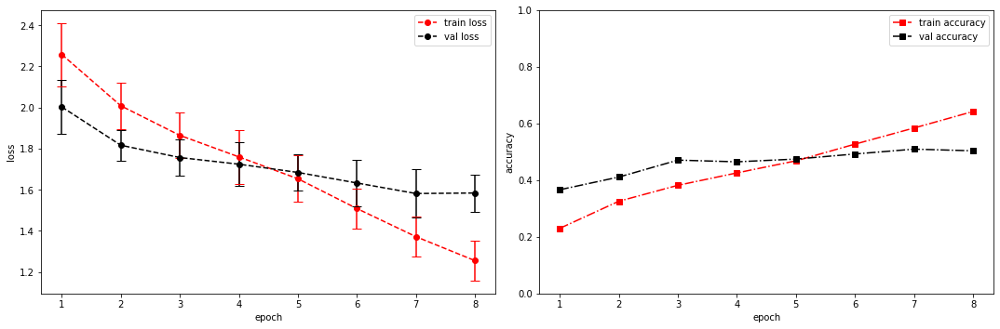

model saved
stopping early
Conv_5_layer
(1, 13, 517)
running model: id = Conv_5_layer, channels = [16, 32, 32, 64, 128]
device:  cuda
dataset metadata:  {'n_fft': 2048, 'hop_length': 256, 'n_mfcc': 13, 'notes': 'optional notes not passed'}
train model: data loaders initialized
sample shape =  (1, 13, 517)
model loaded
Layer (type:depth-idx)                   Output Shape              Param #
├─ConvBlock: 1-1                         [-1, 16, 13, 258]         --
|    └─Sequential: 2-1                   [-1, 16, 13, 258]         --
|    |    └─Conv2d: 3-1                  [-1, 16, 13, 517]         160
|    |    └─ReLU: 3-2                    [-1, 16, 13, 517]         --
|    |    └─MaxPool2d: 3-3               [-1, 16, 13, 258]         --
|    |    └─BatchNorm2d: 3-4             [-1, 16, 13, 258]         32
├─ConvBlock: 1-2                         [-1, 32, 13, 129]         --
|    └─Sequential: 2-2                   [-1, 32, 13, 129]         --
|    |    └─Conv2d: 3-5                  [-1

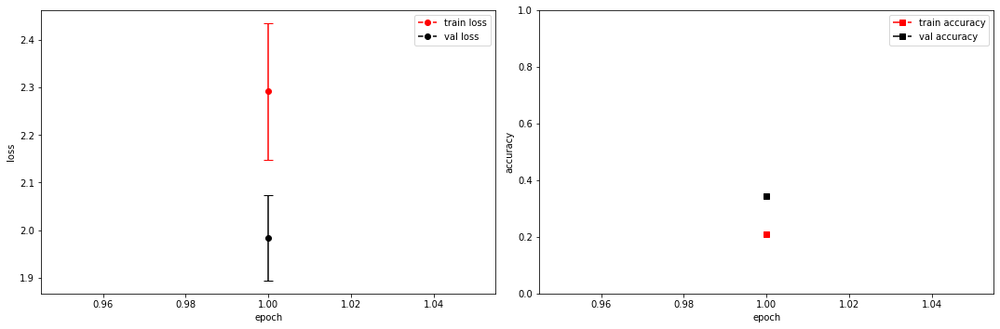

model saved


training epoch:  1
model set to train
Epoch [2/100], step [1/84],  Loss: 2.1368 +/- 0.0000,  accuracy: 0.0185546875, time elapsed = 0.36416101455688477s
Epoch [2/100], step [17/84],  Loss: 2.1066 +/- 0.1198,  accuracy: 0.2861328125, time elapsed = 1.0268926620483398s
Epoch [2/100], step [33/84],  Loss: 2.0667 +/- 0.1230,  accuracy: 0.296875, time elapsed = 0.9762182235717773s
Epoch [2/100], step [49/84],  Loss: 2.0634 +/- 0.1137,  accuracy: 0.32421875, time elapsed = 0.9909300804138184s
Epoch [2/100], step [65/84],  Loss: 1.9919 +/- 0.0751,  accuracy: 0.3212890625, time elapsed = 0.9671552181243896s
Epoch [2/100], step [81/84],  Loss: 2.0190 +/- 0.1224,  accuracy: 0.333984375, time elapsed = 0.9745266437530518s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3128845795263845,  precision = 0.3128845795263845 recall = 0.3128845795263845 f1 = 0.3128845795263845 ::: val: acc = 0.4004474272930649,  precision = 0.4004474272930649 recall = 0.4004474272930649 time elapsed

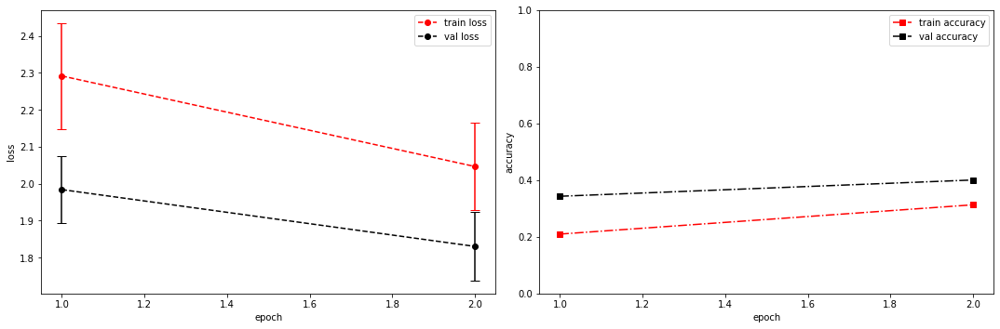

model saved


training epoch:  2
model set to train
Epoch [3/100], step [1/84],  Loss: 1.7786 +/- 0.0000,  accuracy: 0.0263671875, time elapsed = 0.3665766716003418s
Epoch [3/100], step [17/84],  Loss: 1.8939 +/- 0.0863,  accuracy: 0.36328125, time elapsed = 1.0256438255310059s
Epoch [3/100], step [33/84],  Loss: 1.9200 +/- 0.0780,  accuracy: 0.3671875, time elapsed = 0.9848685264587402s
Epoch [3/100], step [49/84],  Loss: 1.9372 +/- 0.1115,  accuracy: 0.359375, time elapsed = 0.9523398876190186s
Epoch [3/100], step [65/84],  Loss: 1.8893 +/- 0.0890,  accuracy: 0.3583984375, time elapsed = 0.9588243961334229s
Epoch [3/100], step [81/84],  Loss: 1.8761 +/- 0.1373,  accuracy: 0.36328125, time elapsed = 0.9570586681365967s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.36416184971098264,  precision = 0.36416184971098264 recall = 0.36416184971098264 f1 = 0.3641618497109826 ::: val: acc = 0.42132736763609246,  precision = 0.42132736763609246 recall = 0.42132736763609246 time elapse

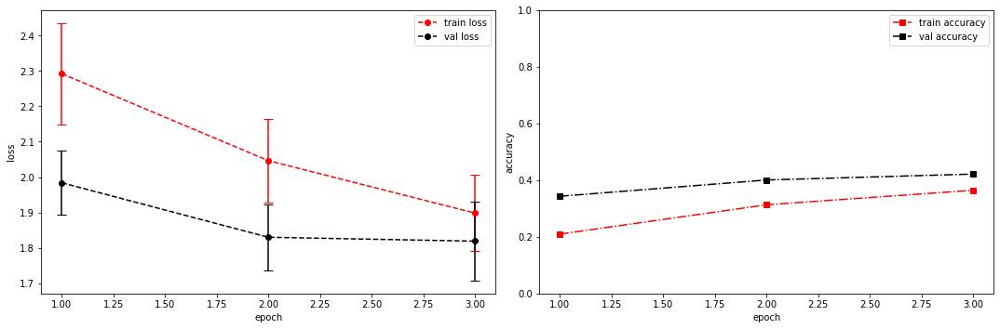

model saved


training epoch:  3
model set to train
Epoch [4/100], step [1/84],  Loss: 1.5177 +/- 0.0000,  accuracy: 0.033203125, time elapsed = 0.35207486152648926s
Epoch [4/100], step [17/84],  Loss: 1.8231 +/- 0.1046,  accuracy: 0.3818359375, time elapsed = 1.018803358078003s
Epoch [4/100], step [33/84],  Loss: 1.8079 +/- 0.1128,  accuracy: 0.41015625, time elapsed = 0.9699113368988037s
Epoch [4/100], step [49/84],  Loss: 1.7609 +/- 0.0901,  accuracy: 0.435546875, time elapsed = 0.9604191780090332s
Epoch [4/100], step [65/84],  Loss: 1.8136 +/- 0.1284,  accuracy: 0.4091796875, time elapsed = 0.968745231628418s
Epoch [4/100], step [81/84],  Loss: 1.8152 +/- 0.1177,  accuracy: 0.396484375, time elapsed = 0.9691710472106934s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4094723102741003,  precision = 0.4094723102741003 recall = 0.4094723102741003 f1 = 0.4094723102741003 ::: val: acc = 0.4399701715137957,  precision = 0.4399701715137957 recall = 0.4399701715137957 time elapsed

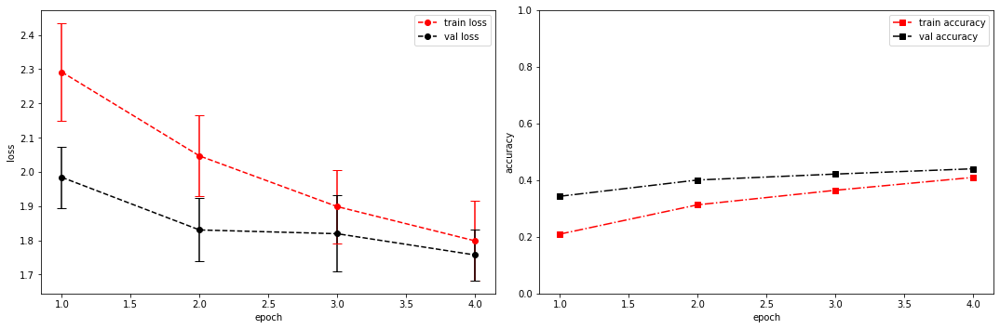

model saved


training epoch:  4
model set to train
Epoch [5/100], step [1/84],  Loss: 1.4180 +/- 0.0000,  accuracy: 0.03515625, time elapsed = 0.37690138816833496s
Epoch [5/100], step [17/84],  Loss: 1.7278 +/- 0.1215,  accuracy: 0.447265625, time elapsed = 1.0227468013763428s
Epoch [5/100], step [33/84],  Loss: 1.7795 +/- 0.1242,  accuracy: 0.42578125, time elapsed = 0.9719421863555908s
Epoch [5/100], step [49/84],  Loss: 1.7022 +/- 0.0872,  accuracy: 0.4365234375, time elapsed = 0.9978582859039307s
Epoch [5/100], step [65/84],  Loss: 1.6813 +/- 0.1149,  accuracy: 0.4501953125, time elapsed = 0.9947113990783691s
Epoch [5/100], step [81/84],  Loss: 1.7105 +/- 0.1267,  accuracy: 0.453125, time elapsed = 1.001924991607666s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.44415439119895583,  precision = 0.44415439119895583 recall = 0.44415439119895583 f1 = 0.44415439119895583 ::: val: acc = 0.44146159582401195,  precision = 0.44146159582401195 recall = 0.44146159582401195 time ela

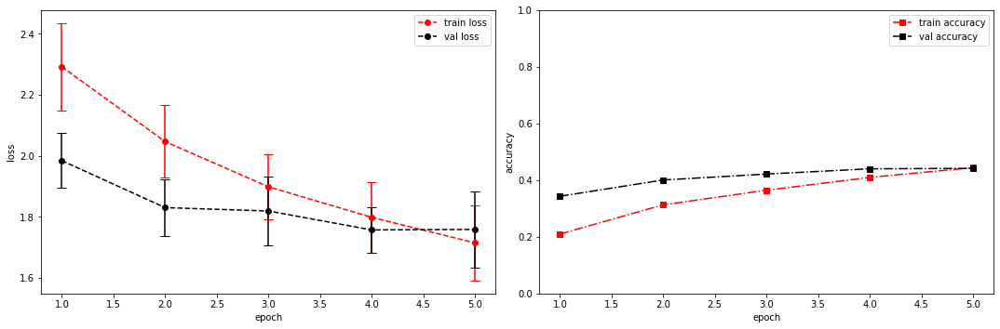

model saved


training epoch:  5
model set to train
Epoch [6/100], step [1/84],  Loss: 1.6145 +/- 0.0000,  accuracy: 0.0263671875, time elapsed = 0.37533020973205566s
Epoch [6/100], step [17/84],  Loss: 1.6383 +/- 0.1122,  accuracy: 0.4755859375, time elapsed = 1.039670705795288s
Epoch [6/100], step [33/84],  Loss: 1.6105 +/- 0.1412,  accuracy: 0.4970703125, time elapsed = 0.9761416912078857s
Epoch [6/100], step [49/84],  Loss: 1.6233 +/- 0.0938,  accuracy: 0.4775390625, time elapsed = 0.9816386699676514s
Epoch [6/100], step [65/84],  Loss: 1.6134 +/- 0.1086,  accuracy: 0.478515625, time elapsed = 0.9733297824859619s
Epoch [6/100], step [81/84],  Loss: 1.5547 +/- 0.1087,  accuracy: 0.5087890625, time elapsed = 1.0074999332427979s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.48666790975200447,  precision = 0.48666790975200447 recall = 0.48666790975200447 f1 = 0.48666790975200447 ::: val: acc = 0.4727815063385533,  precision = 0.4727815063385533 recall = 0.4727815063385533 tim

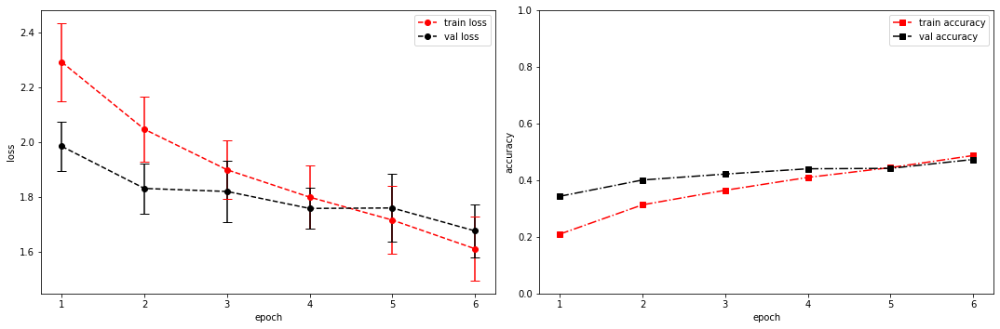

model saved


training epoch:  6
model set to train
Epoch [7/100], step [1/84],  Loss: 1.4098 +/- 0.0000,  accuracy: 0.03515625, time elapsed = 0.36182379722595215s
Epoch [7/100], step [17/84],  Loss: 1.5402 +/- 0.1062,  accuracy: 0.50390625, time elapsed = 1.0696663856506348s
Epoch [7/100], step [33/84],  Loss: 1.5660 +/- 0.1582,  accuracy: 0.50390625, time elapsed = 0.9985101222991943s
Epoch [7/100], step [49/84],  Loss: 1.5157 +/- 0.1116,  accuracy: 0.5419921875, time elapsed = 0.9900128841400146s
Epoch [7/100], step [65/84],  Loss: 1.5046 +/- 0.1088,  accuracy: 0.5302734375, time elapsed = 0.9696083068847656s
Epoch [7/100], step [81/84],  Loss: 1.5752 +/- 0.1207,  accuracy: 0.49609375, time elapsed = 1.02297043800354s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5135185530486668,  precision = 0.5135185530486668 recall = 0.5135185530486668 f1 = 0.5135185530486668 ::: val: acc = 0.45786726323639076,  precision = 0.45786726323639076 recall = 0.45786726323639076 time elapsed

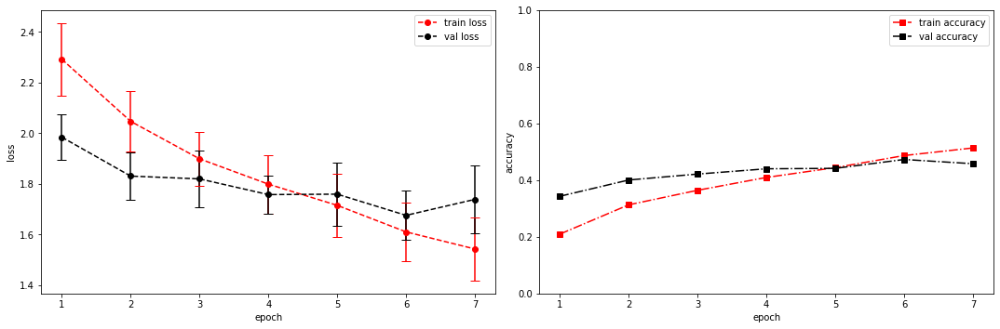

model saved


training epoch:  7
model set to train
Epoch [8/100], step [1/84],  Loss: 1.5260 +/- 0.0000,  accuracy: 0.033203125, time elapsed = 0.35027503967285156s
Epoch [8/100], step [17/84],  Loss: 1.5215 +/- 0.0927,  accuracy: 0.51953125, time elapsed = 1.0253536701202393s
Epoch [8/100], step [33/84],  Loss: 1.4750 +/- 0.0844,  accuracy: 0.54296875, time elapsed = 1.005739450454712s
Epoch [8/100], step [49/84],  Loss: 1.4835 +/- 0.1060,  accuracy: 0.5234375, time elapsed = 0.9792711734771729s
Epoch [8/100], step [65/84],  Loss: 1.4316 +/- 0.0783,  accuracy: 0.5595703125, time elapsed = 0.9665100574493408s
Epoch [8/100], step [81/84],  Loss: 1.4508 +/- 0.1147,  accuracy: 0.5546875, time elapsed = 1.032236099243164s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5418608987506992,  precision = 0.5418608987506992 recall = 0.5418608987506992 f1 = 0.5418608987506992 ::: val: acc = 0.48769574944071586,  precision = 0.48769574944071586 recall = 0.48769574944071586 time elapsed = 

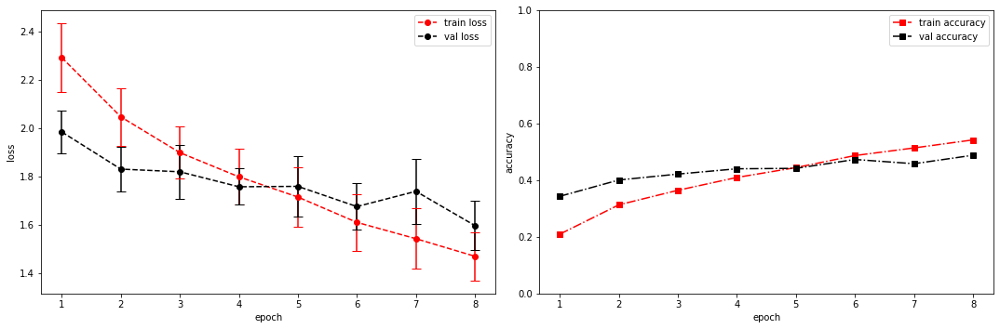

model saved


training epoch:  8
model set to train
Epoch [9/100], step [1/84],  Loss: 1.1315 +/- 0.0000,  accuracy: 0.041015625, time elapsed = 0.35945868492126465s
Epoch [9/100], step [17/84],  Loss: 1.2894 +/- 0.1241,  accuracy: 0.61328125, time elapsed = 1.0282330513000488s
Epoch [9/100], step [33/84],  Loss: 1.2865 +/- 0.0796,  accuracy: 0.619140625, time elapsed = 0.9681966304779053s
Epoch [9/100], step [49/84],  Loss: 1.3025 +/- 0.0742,  accuracy: 0.615234375, time elapsed = 0.9801020622253418s
Epoch [9/100], step [65/84],  Loss: 1.2990 +/- 0.0810,  accuracy: 0.59765625, time elapsed = 1.009509563446045s
Epoch [9/100], step [81/84],  Loss: 1.3068 +/- 0.1018,  accuracy: 0.607421875, time elapsed = 1.0191888809204102s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.6119709118030953,  precision = 0.6119709118030953 recall = 0.6119709118030953 f1 = 0.6119709118030953 ::: val: acc = 0.48769574944071586,  precision = 0.48769574944071586 recall = 0.48769574944071586 time elapse

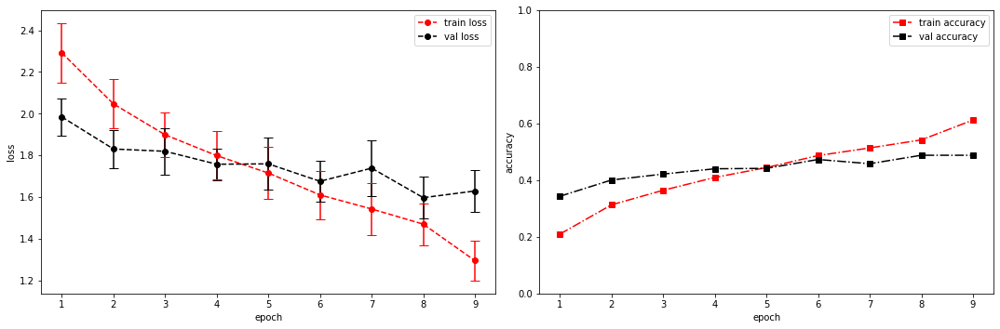

model saved
stopping early
Conv_5_layer
(1, 13, 517)
running model: id = Conv_5_layer, channels = [32, 64, 64, 64, 128]
device:  cuda
dataset metadata:  {'n_fft': 2048, 'hop_length': 256, 'n_mfcc': 13, 'notes': 'optional notes not passed'}
train model: data loaders initialized
sample shape =  (1, 13, 517)
model loaded
Layer (type:depth-idx)                   Output Shape              Param #
├─ConvBlock: 1-1                         [-1, 32, 13, 258]         --
|    └─Sequential: 2-1                   [-1, 32, 13, 258]         --
|    |    └─Conv2d: 3-1                  [-1, 32, 13, 517]         320
|    |    └─ReLU: 3-2                    [-1, 32, 13, 517]         --
|    |    └─MaxPool2d: 3-3               [-1, 32, 13, 258]         --
|    |    └─BatchNorm2d: 3-4             [-1, 32, 13, 258]         64
├─ConvBlock: 1-2                         [-1, 64, 13, 129]         --
|    └─Sequential: 2-2                   [-1, 64, 13, 129]         --
|    |    └─Conv2d: 3-5                  [-1

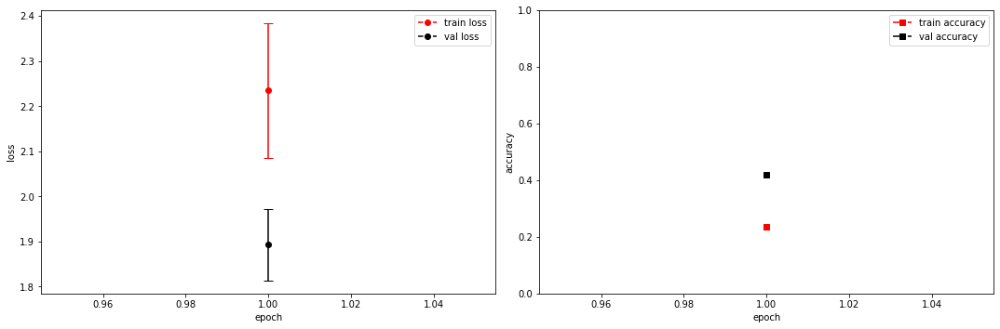

model saved


training epoch:  1
model set to train
Epoch [2/100], step [1/84],  Loss: 2.1463 +/- 0.0000,  accuracy: 0.0166015625, time elapsed = 0.34929895401000977s
Epoch [2/100], step [17/84],  Loss: 1.9822 +/- 0.0902,  accuracy: 0.330078125, time elapsed = 1.0580766201019287s
Epoch [2/100], step [33/84],  Loss: 2.0128 +/- 0.1394,  accuracy: 0.31640625, time elapsed = 1.009505271911621s
Epoch [2/100], step [49/84],  Loss: 1.9959 +/- 0.0759,  accuracy: 0.3291015625, time elapsed = 1.0119140148162842s
Epoch [2/100], step [65/84],  Loss: 1.9410 +/- 0.1004,  accuracy: 0.3359375, time elapsed = 1.0083403587341309s
Epoch [2/100], step [81/84],  Loss: 2.0235 +/- 0.1120,  accuracy: 0.3349609375, time elapsed = 1.0367462635040283s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.32854745478277086,  precision = 0.32854745478277086 recall = 0.32854745478277086 f1 = 0.32854745478277086 ::: val: acc = 0.4451901565995526,  precision = 0.4451901565995526 recall = 0.4451901565995526 time ela

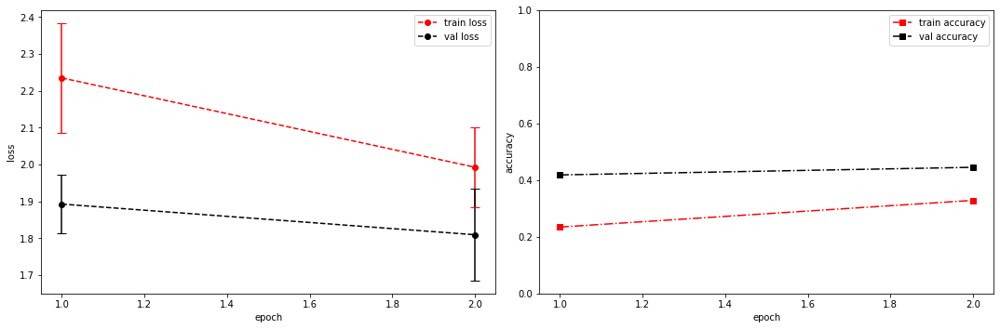

model saved


training epoch:  2
model set to train
Epoch [3/100], step [1/84],  Loss: 1.7773 +/- 0.0000,  accuracy: 0.0244140625, time elapsed = 0.3678135871887207s
Epoch [3/100], step [17/84],  Loss: 1.9147 +/- 0.0626,  accuracy: 0.3388671875, time elapsed = 1.060917854309082s
Epoch [3/100], step [33/84],  Loss: 1.9231 +/- 0.1150,  accuracy: 0.3564453125, time elapsed = 1.0099332332611084s
Epoch [3/100], step [49/84],  Loss: 1.9205 +/- 0.0881,  accuracy: 0.34765625, time elapsed = 1.0153489112854004s
Epoch [3/100], step [65/84],  Loss: 1.8779 +/- 0.0861,  accuracy: 0.3974609375, time elapsed = 1.0022034645080566s
Epoch [3/100], step [81/84],  Loss: 1.8664 +/- 0.1135,  accuracy: 0.3759765625, time elapsed = 1.011683702468872s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3619242961029275,  precision = 0.3619242961029275 recall = 0.3619242961029275 f1 = 0.3619242961029275 ::: val: acc = 0.4526472781506339,  precision = 0.4526472781506339 recall = 0.4526472781506339 time elaps

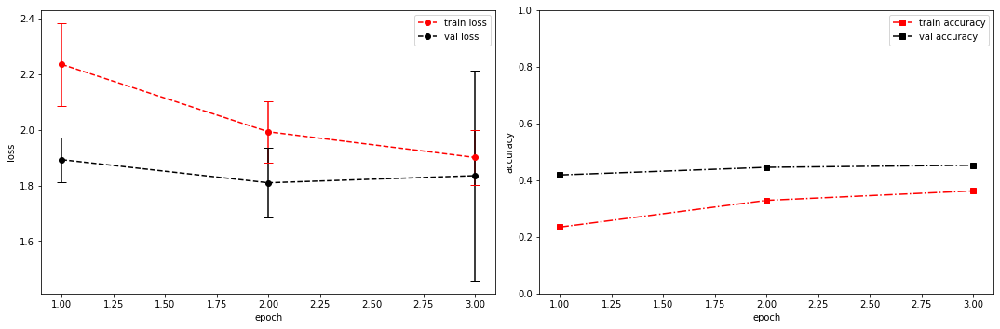

model saved


training epoch:  3
model set to train
Epoch [4/100], step [1/84],  Loss: 1.6935 +/- 0.0000,  accuracy: 0.0283203125, time elapsed = 0.3673872947692871s
Epoch [4/100], step [17/84],  Loss: 1.7758 +/- 0.1018,  accuracy: 0.4208984375, time elapsed = 1.0542974472045898s
Epoch [4/100], step [33/84],  Loss: 1.7718 +/- 0.0926,  accuracy: 0.42578125, time elapsed = 1.0117719173431396s
Epoch [4/100], step [49/84],  Loss: 1.8040 +/- 0.1363,  accuracy: 0.4189453125, time elapsed = 1.011831521987915s
Epoch [4/100], step [65/84],  Loss: 1.8099 +/- 0.0930,  accuracy: 0.4013671875, time elapsed = 1.011347770690918s
Epoch [4/100], step [81/84],  Loss: 1.7613 +/- 0.1177,  accuracy: 0.4208984375, time elapsed = 1.0291657447814941s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.41916837590900613,  precision = 0.41916837590900613 recall = 0.41916837590900613 f1 = 0.41916837590900613 ::: val: acc = 0.4601043997017151,  precision = 0.4601043997017151 recall = 0.4601043997017151 time e

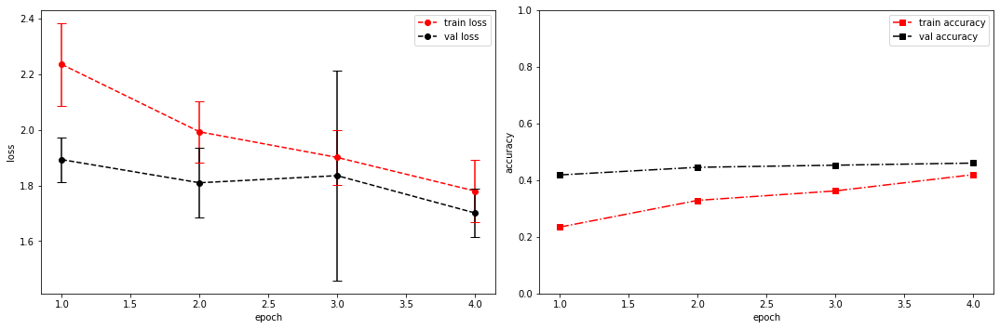

model saved


training epoch:  4
model set to train
Epoch [5/100], step [1/84],  Loss: 1.7287 +/- 0.0000,  accuracy: 0.0263671875, time elapsed = 0.36049771308898926s
Epoch [5/100], step [17/84],  Loss: 1.6917 +/- 0.1038,  accuracy: 0.470703125, time elapsed = 1.0703530311584473s
Epoch [5/100], step [33/84],  Loss: 1.6857 +/- 0.1211,  accuracy: 0.46484375, time elapsed = 1.0184097290039062s
Epoch [5/100], step [49/84],  Loss: 1.7307 +/- 0.0845,  accuracy: 0.4599609375, time elapsed = 1.013700246810913s
Epoch [5/100], step [65/84],  Loss: 1.6811 +/- 0.0969,  accuracy: 0.447265625, time elapsed = 1.0141479969024658s
Epoch [5/100], step [81/84],  Loss: 1.7044 +/- 0.0934,  accuracy: 0.4423828125, time elapsed = 1.0429553985595703s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4568338616446019,  precision = 0.4568338616446019 recall = 0.4568338616446019 f1 = 0.4568338616446019 ::: val: acc = 0.47054436987322895,  precision = 0.47054436987322895 recall = 0.47054436987322895 time el

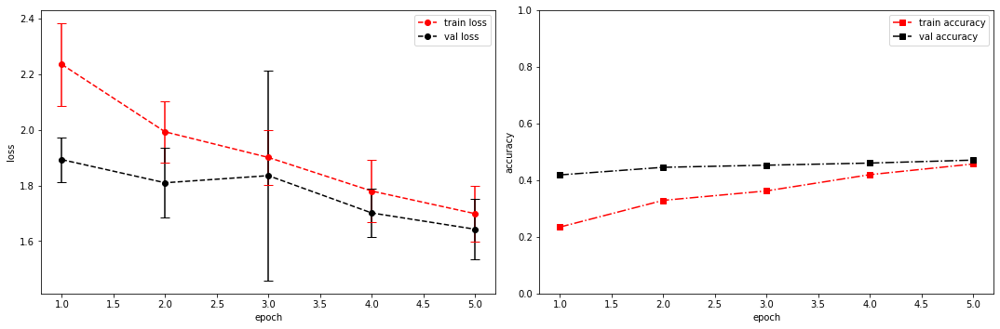

model saved


training epoch:  5
model set to train
Epoch [6/100], step [1/84],  Loss: 1.7451 +/- 0.0000,  accuracy: 0.029296875, time elapsed = 0.3721632957458496s
Epoch [6/100], step [17/84],  Loss: 1.5964 +/- 0.1119,  accuracy: 0.484375, time elapsed = 1.0329604148864746s
Epoch [6/100], step [33/84],  Loss: 1.5926 +/- 0.1234,  accuracy: 0.4912109375, time elapsed = 1.0219135284423828s
Epoch [6/100], step [49/84],  Loss: 1.6234 +/- 0.0761,  accuracy: 0.4833984375, time elapsed = 1.0098371505737305s
Epoch [6/100], step [65/84],  Loss: 1.5932 +/- 0.1206,  accuracy: 0.4892578125, time elapsed = 0.9992988109588623s
Epoch [6/100], step [81/84],  Loss: 1.5963 +/- 0.1218,  accuracy: 0.509765625, time elapsed = 1.0545282363891602s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4913294797687861,  precision = 0.4913294797687861 recall = 0.4913294797687861 f1 = 0.4913294797687861 ::: val: acc = 0.4966442953020134,  precision = 0.4966442953020134 recall = 0.4966442953020134 time elapsed

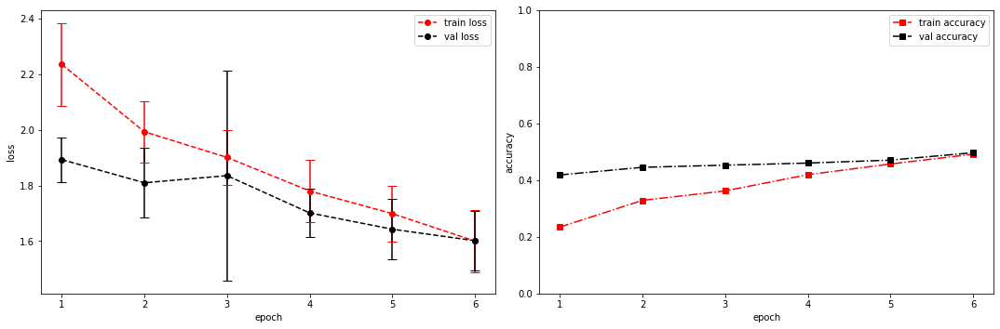

model saved


training epoch:  6
model set to train
Epoch [7/100], step [1/84],  Loss: 1.4817 +/- 0.0000,  accuracy: 0.0341796875, time elapsed = 0.3651096820831299s
Epoch [7/100], step [17/84],  Loss: 1.5089 +/- 0.1188,  accuracy: 0.533203125, time elapsed = 1.1263561248779297s
Epoch [7/100], step [33/84],  Loss: 1.4963 +/- 0.0873,  accuracy: 0.5302734375, time elapsed = 1.0017335414886475s
Epoch [7/100], step [49/84],  Loss: 1.4359 +/- 0.0857,  accuracy: 0.5654296875, time elapsed = 1.013960599899292s
Epoch [7/100], step [65/84],  Loss: 1.4868 +/- 0.1213,  accuracy: 0.5361328125, time elapsed = 0.9965322017669678s
Epoch [7/100], step [81/84],  Loss: 1.4706 +/- 0.1305,  accuracy: 0.5361328125, time elapsed = 1.0471925735473633s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5394368823419727,  precision = 0.5394368823419727 recall = 0.5394368823419727 f1 = 0.5394368823419727 ::: val: acc = 0.49589858314690527,  precision = 0.49589858314690527 recall = 0.49589858314690527 time 

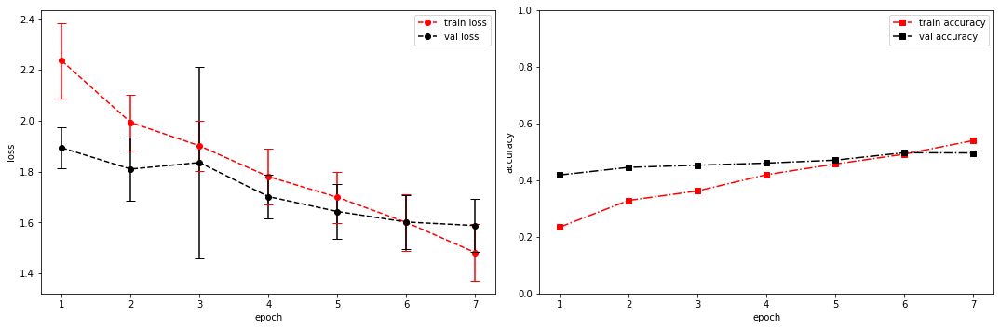

model saved


training epoch:  7
model set to train
Epoch [8/100], step [1/84],  Loss: 1.3263 +/- 0.0000,  accuracy: 0.0400390625, time elapsed = 0.36141490936279297s
Epoch [8/100], step [17/84],  Loss: 1.4045 +/- 0.1219,  accuracy: 0.583984375, time elapsed = 1.0856833457946777s
Epoch [8/100], step [33/84],  Loss: 1.4087 +/- 0.1305,  accuracy: 0.5849609375, time elapsed = 1.0004918575286865s
Epoch [8/100], step [49/84],  Loss: 1.3495 +/- 0.0927,  accuracy: 0.5888671875, time elapsed = 1.001863956451416s
Epoch [8/100], step [65/84],  Loss: 1.3653 +/- 0.0612,  accuracy: 0.5791015625, time elapsed = 1.0247869491577148s
Epoch [8/100], step [81/84],  Loss: 1.3717 +/- 0.0899,  accuracy: 0.5703125, time elapsed = 1.0702836513519287s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5828827148983777,  precision = 0.5828827148983777 recall = 0.5828827148983777 f1 = 0.5828827148983777 ::: val: acc = 0.49962714392244595,  precision = 0.49962714392244595 recall = 0.49962714392244595 time el

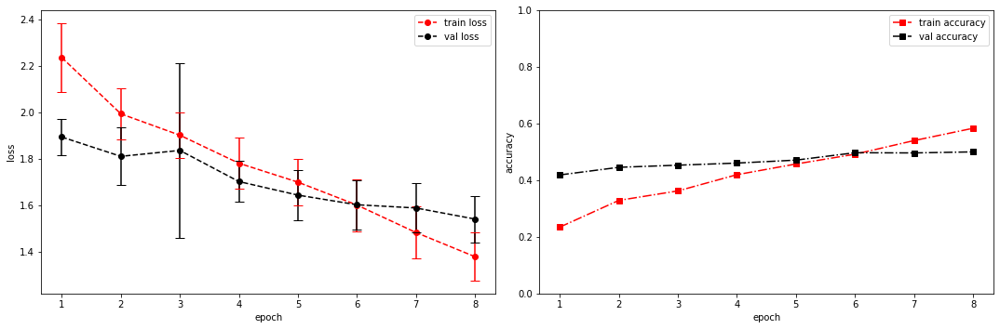

model saved


training epoch:  8
model set to train
Epoch [9/100], step [1/84],  Loss: 1.3710 +/- 0.0000,  accuracy: 0.0380859375, time elapsed = 0.3913149833679199s
Epoch [9/100], step [17/84],  Loss: 1.3043 +/- 0.1289,  accuracy: 0.6240234375, time elapsed = 1.0427966117858887s
Epoch [9/100], step [33/84],  Loss: 1.2565 +/- 0.0904,  accuracy: 0.63671875, time elapsed = 1.0287933349609375s
Epoch [9/100], step [49/84],  Loss: 1.2634 +/- 0.1249,  accuracy: 0.640625, time elapsed = 0.9895608425140381s
Epoch [9/100], step [65/84],  Loss: 1.2726 +/- 0.0974,  accuracy: 0.6298828125, time elapsed = 1.0059535503387451s
Epoch [9/100], step [81/84],  Loss: 1.2803 +/- 0.1064,  accuracy: 0.61328125, time elapsed = 1.0330610275268555s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.6280067126608242,  precision = 0.6280067126608242 recall = 0.6280067126608242 f1 = 0.6280067126608242 ::: val: acc = 0.5190156599552572,  precision = 0.5190156599552572 recall = 0.5190156599552572 time elapsed =

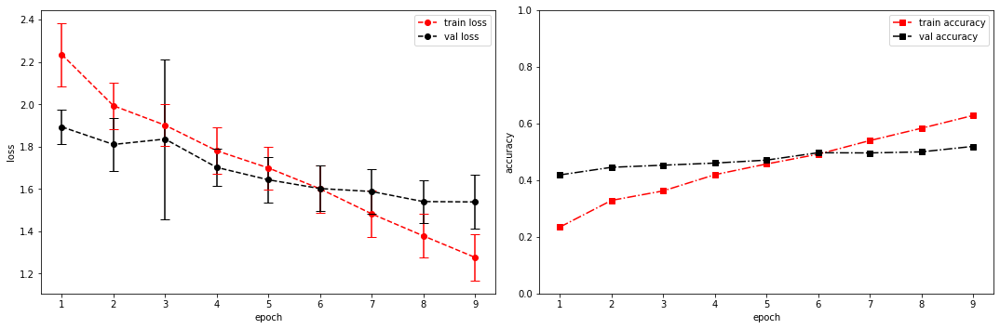

model saved


training epoch:  9
model set to train
Epoch [10/100], step [1/84],  Loss: 0.9972 +/- 0.0000,  accuracy: 0.0478515625, time elapsed = 0.3515355587005615s
Epoch [10/100], step [17/84],  Loss: 1.1344 +/- 0.0871,  accuracy: 0.67578125, time elapsed = 1.064345121383667s
Epoch [10/100], step [33/84],  Loss: 1.1501 +/- 0.1019,  accuracy: 0.685546875, time elapsed = 1.0125854015350342s
Epoch [10/100], step [49/84],  Loss: 1.1636 +/- 0.0867,  accuracy: 0.6796875, time elapsed = 0.9788992404937744s
Epoch [10/100], step [65/84],  Loss: 1.1469 +/- 0.1232,  accuracy: 0.6748046875, time elapsed = 1.123671054840088s
Epoch [10/100], step [81/84],  Loss: 1.1461 +/- 0.0953,  accuracy: 0.6669921875, time elapsed = 1.03253173828125s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.6770464292373671,  precision = 0.6770464292373671 recall = 0.6770464292373671 f1 = 0.6770464292373671 ::: val: acc = 0.5354213273676361,  precision = 0.5354213273676361 recall = 0.5354213273676361 time elaps

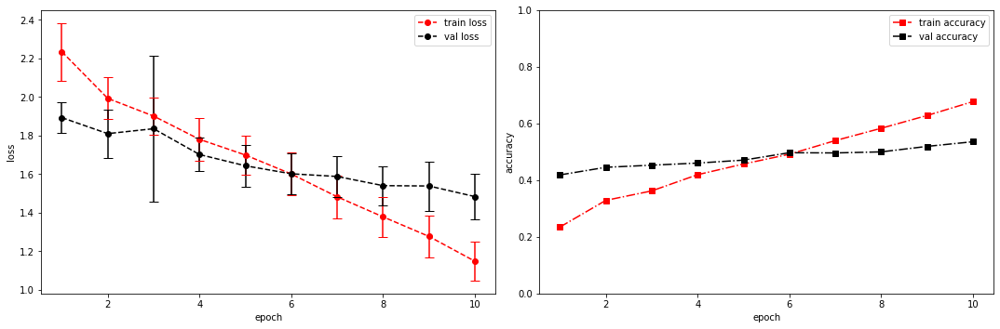

model saved
stopping early
Conv_5_layer
(1, 13, 517)
running model: id = Conv_5_layer, channels = [64, 64, 64, 128, 128]
device:  cuda
dataset metadata:  {'n_fft': 2048, 'hop_length': 256, 'n_mfcc': 13, 'notes': 'optional notes not passed'}
train model: data loaders initialized
sample shape =  (1, 13, 517)
model loaded
Layer (type:depth-idx)                   Output Shape              Param #
├─ConvBlock: 1-1                         [-1, 64, 13, 258]         --
|    └─Sequential: 2-1                   [-1, 64, 13, 258]         --
|    |    └─Conv2d: 3-1                  [-1, 64, 13, 517]         640
|    |    └─ReLU: 3-2                    [-1, 64, 13, 517]         --
|    |    └─MaxPool2d: 3-3               [-1, 64, 13, 258]         --
|    |    └─BatchNorm2d: 3-4             [-1, 64, 13, 258]         128
├─ConvBlock: 1-2                         [-1, 64, 13, 129]         --
|    └─Sequential: 2-2                   [-1, 64, 13, 129]         --
|    |    └─Conv2d: 3-5                  [

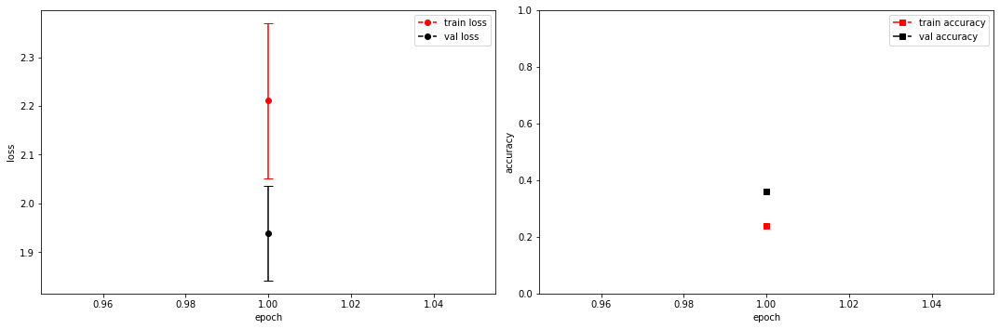

model saved


training epoch:  1
model set to train
Epoch [2/100], step [1/84],  Loss: 1.8396 +/- 0.0000,  accuracy: 0.021484375, time elapsed = 0.3840808868408203s
Epoch [2/100], step [17/84],  Loss: 2.0176 +/- 0.0892,  accuracy: 0.3095703125, time elapsed = 1.0563173294067383s
Epoch [2/100], step [33/84],  Loss: 1.9903 +/- 0.1357,  accuracy: 0.3134765625, time elapsed = 1.0621330738067627s
Epoch [2/100], step [49/84],  Loss: 2.0171 +/- 0.1255,  accuracy: 0.31640625, time elapsed = 1.0329570770263672s
Epoch [2/100], step [65/84],  Loss: 2.0476 +/- 0.1078,  accuracy: 0.2880859375, time elapsed = 1.0383884906768799s
Epoch [2/100], step [81/84],  Loss: 1.9928 +/- 0.1010,  accuracy: 0.328125, time elapsed = 1.0601799488067627s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.31120641432034307,  precision = 0.31120641432034307 recall = 0.31120641432034307 f1 = 0.31120641432034307 ::: val: acc = 0.3706189410887398,  precision = 0.3706189410887398 recall = 0.3706189410887398 time elap

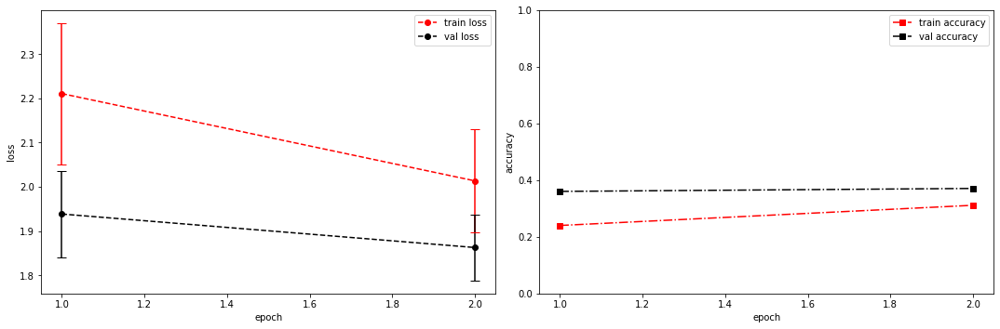

model saved


training epoch:  2
model set to train
Epoch [3/100], step [1/84],  Loss: 1.9734 +/- 0.0000,  accuracy: 0.0205078125, time elapsed = 0.3760251998901367s
Epoch [3/100], step [17/84],  Loss: 1.9785 +/- 0.1204,  accuracy: 0.3291015625, time elapsed = 1.0798473358154297s
Epoch [3/100], step [33/84],  Loss: 1.9629 +/- 0.1338,  accuracy: 0.33203125, time elapsed = 1.0353965759277344s
Epoch [3/100], step [49/84],  Loss: 1.9173 +/- 0.0953,  accuracy: 0.345703125, time elapsed = 1.0367534160614014s
Epoch [3/100], step [65/84],  Loss: 1.8970 +/- 0.0975,  accuracy: 0.3447265625, time elapsed = 1.0388407707214355s
Epoch [3/100], step [81/84],  Loss: 1.8942 +/- 0.1200,  accuracy: 0.3544921875, time elapsed = 1.0573186874389648s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.34159985082975947,  precision = 0.34159985082975947 recall = 0.34159985082975947 f1 = 0.34159985082975947 ::: val: acc = 0.4198359433258762,  precision = 0.4198359433258762 recall = 0.4198359433258762 time 

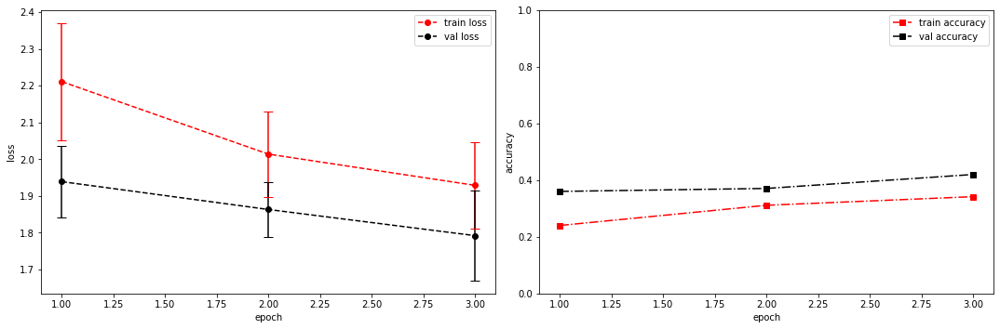

model saved


training epoch:  3
model set to train
Epoch [4/100], step [1/84],  Loss: 1.7547 +/- 0.0000,  accuracy: 0.029296875, time elapsed = 0.36745691299438477s
Epoch [4/100], step [17/84],  Loss: 1.8710 +/- 0.1078,  accuracy: 0.359375, time elapsed = 1.0704329013824463s
Epoch [4/100], step [33/84],  Loss: 1.8735 +/- 0.0881,  accuracy: 0.373046875, time elapsed = 1.0240237712860107s
Epoch [4/100], step [49/84],  Loss: 1.8325 +/- 0.1217,  accuracy: 0.3681640625, time elapsed = 1.0344939231872559s
Epoch [4/100], step [65/84],  Loss: 1.8210 +/- 0.1070,  accuracy: 0.388671875, time elapsed = 1.0128257274627686s
Epoch [4/100], step [81/84],  Loss: 1.7685 +/- 0.1066,  accuracy: 0.42578125, time elapsed = 1.0562291145324707s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.3822487413760955,  precision = 0.3822487413760955 recall = 0.3822487413760955 f1 = 0.3822487413760955 ::: val: acc = 0.4451901565995526,  precision = 0.4451901565995526 recall = 0.4451901565995526 time elapsed =

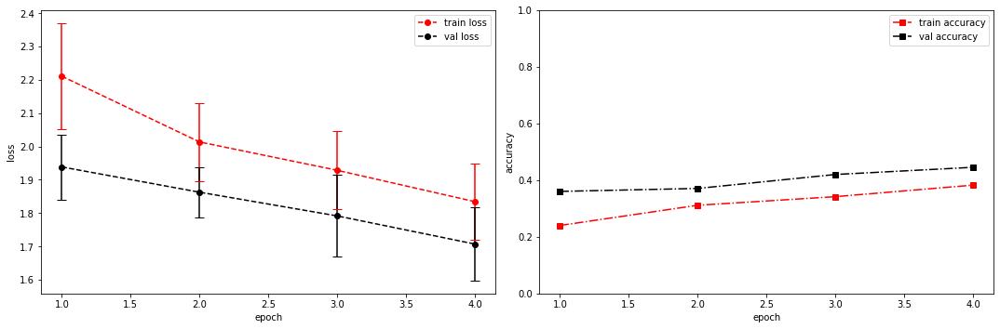

model saved


training epoch:  4
model set to train
Epoch [5/100], step [1/84],  Loss: 1.7723 +/- 0.0000,  accuracy: 0.0283203125, time elapsed = 0.38949108123779297s
Epoch [5/100], step [17/84],  Loss: 1.7135 +/- 0.1020,  accuracy: 0.4228515625, time elapsed = 1.067840337753296s
Epoch [5/100], step [33/84],  Loss: 1.6916 +/- 0.0936,  accuracy: 0.431640625, time elapsed = 1.0254466533660889s
Epoch [5/100], step [49/84],  Loss: 1.7116 +/- 0.0992,  accuracy: 0.443359375, time elapsed = 1.0146260261535645s
Epoch [5/100], step [65/84],  Loss: 1.7899 +/- 0.1258,  accuracy: 0.4130859375, time elapsed = 1.029533863067627s
Epoch [5/100], step [81/84],  Loss: 1.7339 +/- 0.1341,  accuracy: 0.4189453125, time elapsed = 1.060685396194458s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4286779787432407,  precision = 0.4286779787432407 recall = 0.4286779787432407 f1 = 0.4286779787432407 ::: val: acc = 0.4429530201342282,  precision = 0.4429530201342282 recall = 0.4429530201342282 time elaps

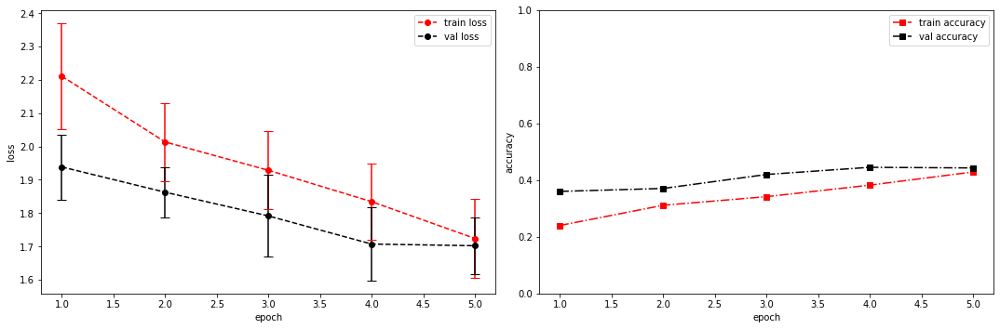

model saved


training epoch:  5
model set to train
Epoch [6/100], step [1/84],  Loss: 1.7228 +/- 0.0000,  accuracy: 0.0263671875, time elapsed = 0.3847038745880127s
Epoch [6/100], step [17/84],  Loss: 1.6689 +/- 0.1041,  accuracy: 0.4599609375, time elapsed = 1.073845386505127s
Epoch [6/100], step [33/84],  Loss: 1.6341 +/- 0.1172,  accuracy: 0.470703125, time elapsed = 1.0301156044006348s
Epoch [6/100], step [49/84],  Loss: 1.6997 +/- 0.1122,  accuracy: 0.4443359375, time elapsed = 1.034362554550171s
Epoch [6/100], step [65/84],  Loss: 1.6635 +/- 0.0718,  accuracy: 0.4296875, time elapsed = 1.0243394374847412s
Epoch [6/100], step [81/84],  Loss: 1.6550 +/- 0.0762,  accuracy: 0.435546875, time elapsed = 1.0547339916229248s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.4495618124184225,  precision = 0.4495618124184225 recall = 0.4495618124184225 f1 = 0.4495618124184225 ::: val: acc = 0.40566741237882176,  precision = 0.40566741237882176 recall = 0.40566741237882176 time elaps

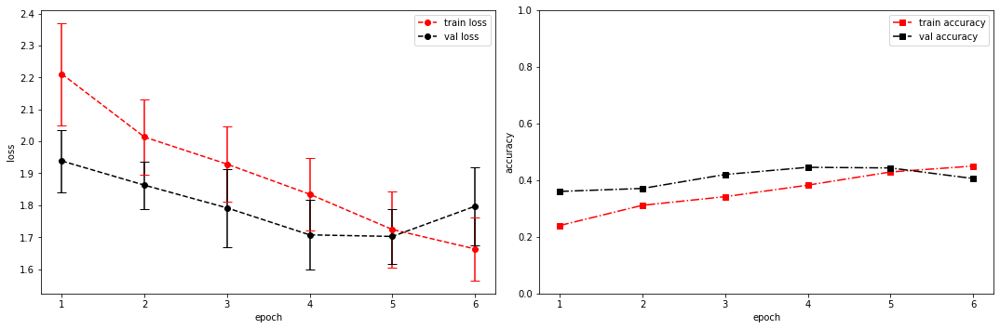

model saved


training epoch:  6
model set to train
Epoch [7/100], step [1/84],  Loss: 1.5244 +/- 0.0000,  accuracy: 0.0322265625, time elapsed = 0.3785076141357422s
Epoch [7/100], step [17/84],  Loss: 1.6474 +/- 0.1104,  accuracy: 0.4580078125, time elapsed = 1.0830926895141602s
Epoch [7/100], step [33/84],  Loss: 1.5993 +/- 0.0778,  accuracy: 0.482421875, time elapsed = 1.0300405025482178s
Epoch [7/100], step [49/84],  Loss: 1.5941 +/- 0.1112,  accuracy: 0.490234375, time elapsed = 1.0341384410858154s
Epoch [7/100], step [65/84],  Loss: 1.5532 +/- 0.1078,  accuracy: 0.509765625, time elapsed = 1.0162222385406494s
Epoch [7/100], step [81/84],  Loss: 1.5616 +/- 0.0988,  accuracy: 0.4873046875, time elapsed = 1.090407133102417s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.48554913294797686,  precision = 0.48554913294797686 recall = 0.48554913294797686 f1 = 0.48554913294797686 ::: val: acc = 0.49589858314690527,  precision = 0.49589858314690527 recall = 0.49589858314690527 tim

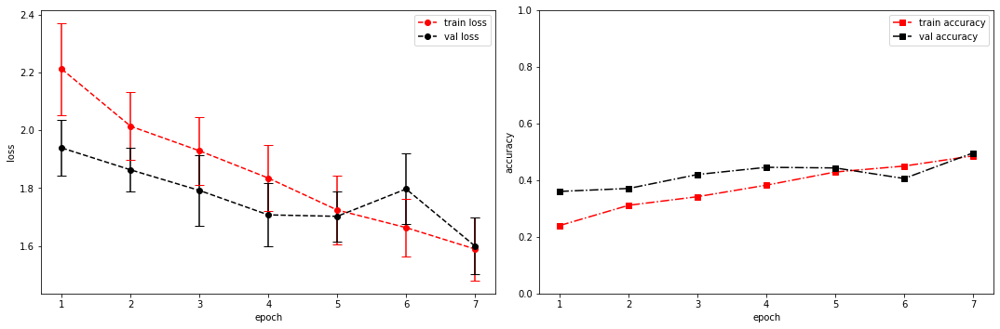

model saved


training epoch:  7
model set to train
Epoch [8/100], step [1/84],  Loss: 1.6369 +/- 0.0000,  accuracy: 0.0263671875, time elapsed = 0.37784767150878906s
Epoch [8/100], step [17/84],  Loss: 1.4987 +/- 0.1058,  accuracy: 0.5205078125, time elapsed = 1.06526780128479s
Epoch [8/100], step [33/84],  Loss: 1.4804 +/- 0.0702,  accuracy: 0.53125, time elapsed = 1.053816795349121s
Epoch [8/100], step [49/84],  Loss: 1.4695 +/- 0.1311,  accuracy: 0.5546875, time elapsed = 1.0291407108306885s
Epoch [8/100], step [65/84],  Loss: 1.4410 +/- 0.0967,  accuracy: 0.5634765625, time elapsed = 1.0204665660858154s
Epoch [8/100], step [81/84],  Loss: 1.4550 +/- 0.1315,  accuracy: 0.564453125, time elapsed = 1.0778274536132812s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5476412455715085,  precision = 0.5476412455715085 recall = 0.5476412455715085 f1 = 0.5476412455715085 ::: val: acc = 0.488441461595824,  precision = 0.488441461595824 recall = 0.488441461595824 time elapsed = 7.468

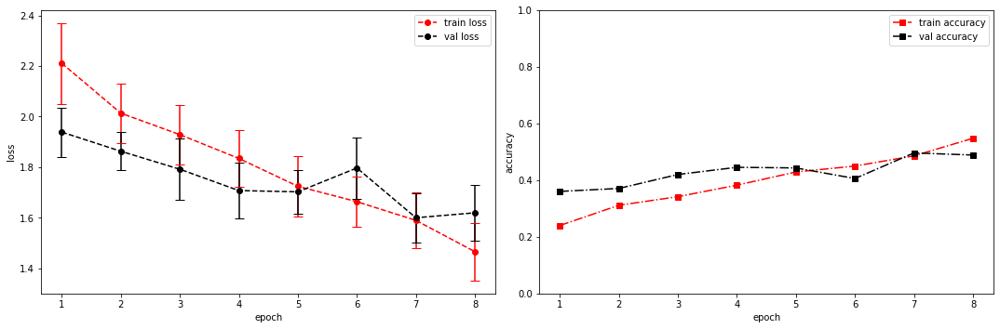

model saved


training epoch:  8
model set to train
Epoch [9/100], step [1/84],  Loss: 1.2469 +/- 0.0000,  accuracy: 0.0400390625, time elapsed = 0.35634469985961914s
Epoch [9/100], step [17/84],  Loss: 1.3299 +/- 0.0971,  accuracy: 0.5927734375, time elapsed = 1.1079332828521729s
Epoch [9/100], step [33/84],  Loss: 1.3961 +/- 0.1196,  accuracy: 0.5654296875, time elapsed = 1.0311074256896973s
Epoch [9/100], step [49/84],  Loss: 1.3476 +/- 0.0948,  accuracy: 0.587890625, time elapsed = 1.0473098754882812s
Epoch [9/100], step [65/84],  Loss: 1.3921 +/- 0.1125,  accuracy: 0.55859375, time elapsed = 1.0182509422302246s
Epoch [9/100], step [81/84],  Loss: 1.3836 +/- 0.1132,  accuracy: 0.55078125, time elapsed = 1.0807774066925049s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.5705761700540742,  precision = 0.5705761700540742 recall = 0.5705761700540742 f1 = 0.5705761700540742 ::: val: acc = 0.5212527964205816,  precision = 0.5212527964205816 recall = 0.5212527964205816 time elaps

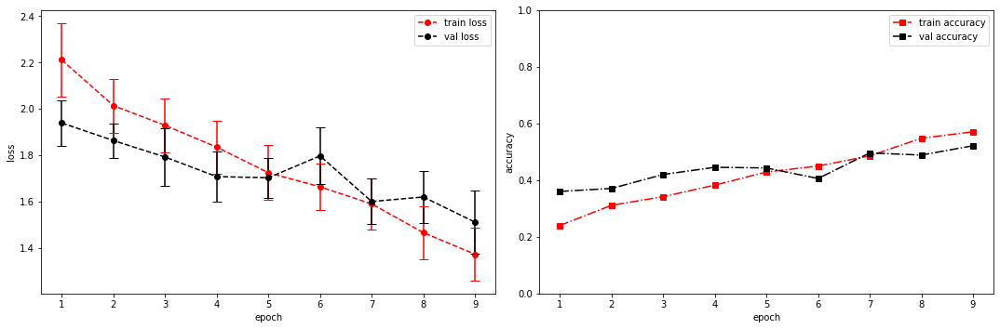

model saved


training epoch:  9
model set to train
Epoch [10/100], step [1/84],  Loss: 1.3661 +/- 0.0000,  accuracy: 0.037109375, time elapsed = 0.3617572784423828s
Epoch [10/100], step [17/84],  Loss: 1.3145 +/- 0.0651,  accuracy: 0.5966796875, time elapsed = 1.0738904476165771s
Epoch [10/100], step [33/84],  Loss: 1.2473 +/- 0.1049,  accuracy: 0.6513671875, time elapsed = 1.025291919708252s
Epoch [10/100], step [49/84],  Loss: 1.2603 +/- 0.0908,  accuracy: 0.62109375, time elapsed = 1.013735055923462s
Epoch [10/100], step [65/84],  Loss: 1.2446 +/- 0.1009,  accuracy: 0.630859375, time elapsed = 1.0252351760864258s
Epoch [10/100], step [81/84],  Loss: 1.2843 +/- 0.0976,  accuracy: 0.607421875, time elapsed = 1.0765013694763184s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.6218534402386724,  precision = 0.6218534402386724 recall = 0.6218534402386724 f1 = 0.6218534402386724 ::: val: acc = 0.5384041759880686,  precision = 0.5384041759880686 recall = 0.5384041759880686 time el

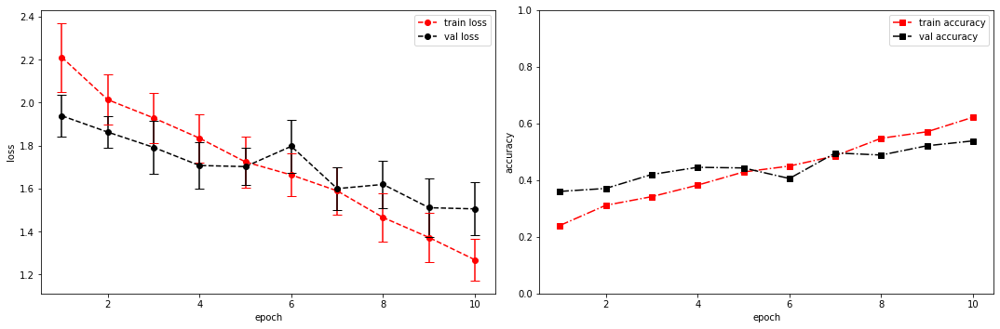

model saved


training epoch:  10
model set to train
Epoch [11/100], step [1/84],  Loss: 0.9830 +/- 0.0000,  accuracy: 0.044921875, time elapsed = 0.3786344528198242s
Epoch [11/100], step [17/84],  Loss: 1.1465 +/- 0.1021,  accuracy: 0.6806640625, time elapsed = 1.0766699314117432s
Epoch [11/100], step [33/84],  Loss: 1.1581 +/- 0.0956,  accuracy: 0.6708984375, time elapsed = 1.030562400817871s
Epoch [11/100], step [49/84],  Loss: 1.2422 +/- 0.1201,  accuracy: 0.6298828125, time elapsed = 1.0367319583892822s
Epoch [11/100], step [65/84],  Loss: 1.2956 +/- 0.1115,  accuracy: 0.6064453125, time elapsed = 1.0357263088226318s
Epoch [11/100], step [81/84],  Loss: 1.2500 +/- 0.1053,  accuracy: 0.62890625, time elapsed = 1.0640063285827637s
model set to eval

EPOCH FINISHED: ,  training: acc = 0.6444154391198956,  precision = 0.6444154391198956 recall = 0.6444154391198956 f1 = 0.6444154391198956 ::: val: acc = 0.4399701715137957,  precision = 0.4399701715137957 recall = 0.4399701715137957 tim

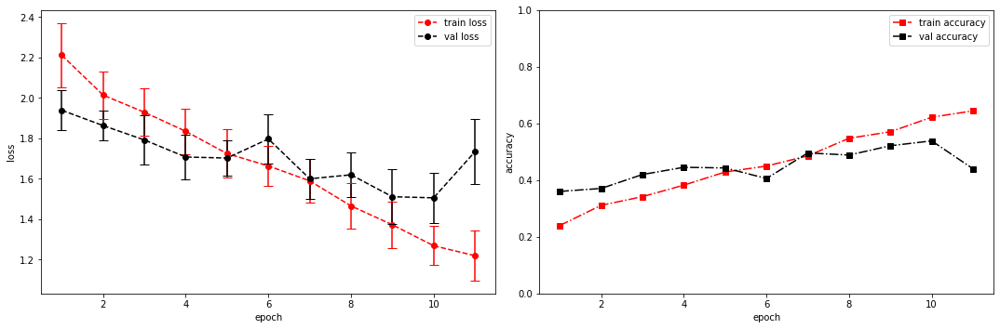

model saved
stopping early


In [10]:


# define initial args dict
args_dict = {
    'filename': filename,
    'num_epochs': 100,
    'interval': 16,
    'lr': 0.0001,
    'batch_size': 64,
    'val_split': 0.2,
    'save_checkpoint': True,
    'checkpoint_path': '/content/drive/MyDrive/ITCS 5156 project/trained_models/CNN tests 4-25/',
    'criterion': torch.nn.CrossEntropyLoss(),
    'patience': 3,
    'min_epochs': 5,
    'buffer': 0.05
}


# including a counter becuase I'm too lazy to figure out how to make one with 
# i and j
for i in range(len(layers)):
  for j, channel in enumerate(all_channels[i]):
    print(model_ids[i])
    print(one_mfcc.shape)
    model_args = {
        'conv_paddings': [1, 1, 1, 1, 1],
        'pool_masks': pool_masks[i],
        'pool_kernel_sizes': pool_kernel_sizes[i],
        'pool_strides': pool_strides[i],
        'channels': channel,
        'dropout_probs': [0.5, 0.5]
    }
    
    args_dict['model_args'] = model_args

    args_dict['model_id'] = model_ids[i]
    args_dict['checkpoint_name'] = "{}_layers_channel_{}_AsymPool_dropout0.5.pt".format(
        layers[i], j
    )
    
    args_dict['notes'] = dedent("""
      Model trained on 4-25.
      Varying the number of convolutional layers while only applying maxPooling
      in the temporal direction. 

      This network has {} convolutional layers with channels: {}.
      includes a dropout probability of 0.5 for all linear layers

      Other params: 
      max epochs = 100
      interval (for output) = 16
      lr = 0.0001
      batch_size = 64
      criterion = CrossEntropyLoss
      No dropout layers in linear portion
      buffer (for early stopping) = 0.05

      Model summary: 
      {}
    """.format(layers[i], channel, summary_str))

    args_dict['experiment_params'] = {
        'num_conv_layers': layers[i],
        'channels': channel
    }

    # ### output the important stuff before running the model
    # print("=====================================")
    # print(args_dict['model_id'])
    # print(args_dict['checkpoint_name'])
    # print(args_dict['experiment_params'])
    
    # run the pipeline and pray to whatever diety you believe in that I didn't
    # screw this up
    print("running model: id = {}, channels = {}".format(model_ids[i], channel))
    train_model(**args_dict)